# Finding Supernova Neutrinos
## Thoran Landers


**Write a method to simulate electronic noise in the detector. The electronic noise is expected to follow a normal distribution.**

Import neutrino data and print examples

In [1]:
import numpy as np
import matplotlib.pyplot as plt 
import random

# TensorFlow and tf.keras
import tensorflow as tf
from tensorflow import keras

images=np.load('larImages.npy') #Load the l
meta=np.load('meta.npy')

print("images.shape",images.shape)
print("meta.shape",meta.shape)

images.shape (10000, 100, 100)
meta.shape (10000, 64)


In [2]:
print("Row",int(meta[0][0]),"corresponds to a neutrino of",meta[0][1], "MeV and produced",int(meta[0][3]),"final state particles")

Row 0 corresponds to a neutrino of 21.2005 MeV and produced 6 final state particles


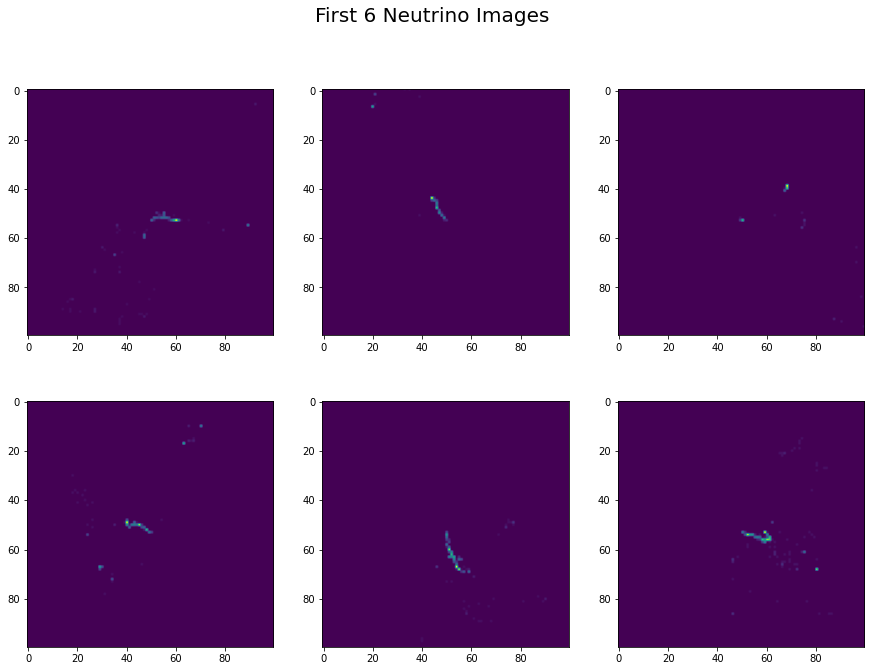

In [3]:
fig, axs = plt.subplots(2, 3)
fig.suptitle('First 6 Neutrino Images', size=20)
axs[0,0].imshow(images[0])
axs[0,1].imshow(images[1])
axs[0,2].imshow(images[2])
axs[1,0].imshow(images[3])
axs[1,1].imshow(images[4])
axs[1,2].imshow(images[5])
#fig.tight_layout()
fig.set_size_inches(15,10.5)
plt.show()

Look at the values of activated pixels in the image to get an idea for the values of noise to add. Will do this by taking average of all non zero values.

In [4]:
nonzero = []
for i in range(10000):
    for j in range(100):
        k = 0
        for val in images[i, j]:
                if val> 0:
                    print((i,j,k), val)
                    nonzero.append(val)
                k +=1

(0, 6, 92) 2.0
(0, 50, 52) 4.0
(0, 50, 53) 1.0
(0, 50, 55) 9.0
(0, 51, 53) 3.0
(0, 51, 54) 2.0
(0, 51, 55) 8.0
(0, 51, 59) 1.0
(0, 52, 51) 9.0
(0, 52, 52) 8.0
(0, 52, 53) 6.0
(0, 52, 54) 10.0
(0, 52, 55) 10.0
(0, 52, 56) 10.0
(0, 52, 57) 7.0
(0, 53, 50) 10.0
(0, 53, 51) 3.0
(0, 53, 57) 3.0
(0, 53, 58) 10.0
(0, 53, 59) 18.0
(0, 53, 60) 30.0
(0, 53, 61) 12.0
(0, 53, 62) 1.0
(0, 53, 65) 1.0
(0, 54, 73) 1.0
(0, 55, 36) 3.0
(0, 55, 89) 12.0
(0, 56, 36) 1.0
(0, 57, 37) 1.0
(0, 57, 48) 1.0
(0, 57, 79) 2.0
(0, 58, 36) 1.0
(0, 58, 43) 1.0
(0, 58, 47) 1.0
(0, 59, 47) 10.0
(0, 60, 47) 9.0
(0, 64, 30) 2.0
(0, 65, 31) 1.0
(0, 66, 38) 1.0
(0, 67, 35) 6.0
(0, 72, 37) 1.0
(0, 73, 27) 1.0
(0, 74, 27) 2.0
(0, 74, 37) 2.0
(0, 78, 45) 1.0
(0, 81, 51) 1.0
(0, 85, 17) 1.0
(0, 85, 18) 2.0
(0, 85, 49) 1.0
(0, 86, 16) 1.0
(0, 87, 40) 1.0
(0, 89, 14) 1.0
(0, 89, 17) 1.0
(0, 89, 27) 2.0
(0, 90, 17) 1.0
(0, 90, 21) 1.0
(0, 90, 27) 2.0
(0, 91, 45) 1.0
(0, 91, 46) 1.0
(0, 91, 48) 1.0
(0, 92, 38) 1.0
(0, 92, 47) 2.0

(21, 5, 80) 1.0
(21, 18, 57) 1.0
(21, 25, 61) 3.0
(21, 27, 65) 2.0
(21, 28, 66) 1.0
(21, 29, 64) 1.0
(21, 30, 63) 1.0
(21, 30, 66) 1.0
(21, 31, 64) 1.0
(21, 31, 65) 1.0
(21, 31, 66) 2.0
(21, 31, 69) 1.0
(21, 32, 65) 1.0
(21, 33, 70) 13.0
(21, 36, 64) 2.0
(21, 39, 60) 1.0
(21, 40, 56) 2.0
(21, 40, 57) 13.0
(21, 40, 58) 15.0
(21, 40, 59) 7.0
(21, 41, 55) 6.0
(21, 41, 56) 12.0
(21, 41, 58) 9.0
(21, 41, 59) 32.0
(21, 42, 55) 9.0
(21, 42, 56) 9.0
(21, 42, 57) 1.0
(21, 43, 54) 6.0
(21, 43, 55) 3.0
(21, 43, 68) 2.0
(21, 44, 53) 1.0
(21, 44, 54) 18.0
(21, 45, 53) 9.0
(21, 46, 52) 4.0
(21, 46, 53) 5.0
(21, 47, 52) 10.0
(21, 48, 51) 6.0
(21, 48, 52) 2.0
(21, 48, 54) 1.0
(21, 49, 51) 8.0
(21, 50, 50) 5.0
(21, 50, 51) 3.0
(21, 51, 50) 7.0
(21, 52, 50) 8.0
(21, 53, 50) 7.0
(21, 53, 61) 1.0
(22, 4, 88) 2.0
(22, 7, 75) 1.0
(22, 8, 75) 2.0
(22, 9, 79) 1.0
(22, 11, 87) 1.0
(22, 17, 87) 1.0
(22, 19, 54) 3.0
(22, 19, 57) 1.0
(22, 19, 72) 1.0
(22, 20, 69) 2.0
(22, 31, 70) 1.0
(22, 31, 71) 2.0
(22, 35, 67)

(37, 50, 83) 1.0
(37, 51, 44) 1.0
(37, 52, 61) 1.0
(37, 52, 69) 1.0
(37, 53, 49) 1.0
(37, 53, 50) 6.0
(37, 54, 50) 6.0
(37, 54, 51) 10.0
(37, 54, 52) 1.0
(37, 54, 55) 1.0
(37, 54, 91) 1.0
(37, 54, 94) 1.0
(37, 55, 51) 10.0
(37, 55, 52) 3.0
(37, 56, 52) 19.0
(37, 56, 53) 3.0
(37, 56, 88) 2.0
(37, 57, 53) 10.0
(37, 58, 54) 11.0
(37, 59, 54) 6.0
(37, 59, 55) 5.0
(37, 60, 55) 9.0
(37, 61, 55) 1.0
(37, 61, 56) 6.0
(37, 61, 62) 3.0
(37, 62, 56) 9.0
(37, 62, 60) 1.0
(37, 62, 72) 1.0
(37, 63, 57) 8.0
(37, 63, 59) 2.0
(37, 64, 57) 12.0
(37, 64, 85) 2.0
(37, 65, 56) 1.0
(37, 65, 57) 9.0
(37, 66, 57) 9.0
(37, 67, 56) 7.0
(37, 67, 57) 5.0
(37, 69, 55) 1.0
(37, 69, 85) 1.0
(37, 71, 77) 1.0
(37, 74, 69) 5.0
(37, 90, 65) 1.0
(37, 98, 91) 1.0
(37, 99, 91) 1.0
(38, 51, 51) 13.0
(38, 53, 49) 6.0
(38, 53, 50) 7.0
(38, 54, 49) 8.0
(38, 54, 50) 6.0
(38, 55, 48) 1.0
(38, 55, 49) 1.0
(38, 55, 50) 7.0
(38, 56, 50) 7.0
(38, 57, 49) 5.0
(38, 57, 50) 6.0
(38, 58, 49) 8.0
(38, 59, 49) 7.0
(38, 60, 49) 8.0
(38, 61

(57, 55, 59) 1.0
(57, 56, 59) 13.0
(57, 57, 57) 1.0
(57, 58, 61) 1.0
(57, 59, 65) 1.0
(57, 61, 77) 1.0
(57, 61, 83) 1.0
(57, 62, 61) 1.0
(57, 62, 74) 1.0
(57, 64, 63) 1.0
(57, 66, 65) 1.0
(57, 69, 65) 2.0
(57, 70, 64) 1.0
(57, 72, 68) 4.0
(57, 72, 95) 2.0
(57, 73, 63) 1.0
(58, 33, 68) 1.0
(58, 34, 75) 1.0
(58, 34, 85) 3.0
(58, 35, 71) 1.0
(58, 36, 72) 1.0
(58, 44, 58) 1.0
(58, 53, 50) 16.0
(58, 54, 50) 10.0
(58, 54, 51) 12.0
(58, 54, 52) 19.0
(58, 54, 53) 7.0
(58, 55, 50) 7.0
(58, 55, 52) 1.0
(58, 67, 35) 1.0
(58, 71, 35) 3.0
(59, 9, 21) 1.0
(59, 9, 40) 1.0
(59, 9, 41) 2.0
(59, 11, 10) 1.0
(59, 11, 20) 1.0
(59, 11, 36) 1.0
(59, 14, 23) 1.0
(59, 18, 32) 1.0
(59, 25, 18) 1.0
(59, 25, 19) 1.0
(59, 26, 7) 14.0
(59, 26, 25) 3.0
(59, 28, 22) 1.0
(59, 28, 57) 2.0
(59, 29, 18) 1.0
(59, 29, 35) 1.0
(59, 29, 53) 1.0
(59, 29, 54) 1.0
(59, 30, 21) 1.0
(59, 34, 23) 20.0
(59, 34, 24) 2.0
(59, 35, 24) 13.0
(59, 35, 25) 9.0
(59, 35, 26) 5.0
(59, 35, 54) 1.0
(59, 36, 34) 1.0
(59, 38, 28) 1.0
(59, 39, 3

(76, 58, 46) 6.0
(76, 58, 47) 6.0
(76, 59, 47) 9.0
(76, 59, 55) 6.0
(76, 60, 46) 10.0
(76, 60, 47) 18.0
(76, 60, 70) 4.0
(76, 61, 46) 13.0
(76, 62, 41) 1.0
(76, 62, 47) 2.0
(76, 62, 67) 7.0
(76, 62, 68) 1.0
(76, 63, 48) 2.0
(76, 66, 36) 3.0
(76, 71, 31) 1.0
(76, 72, 5) 2.0
(76, 73, 5) 1.0
(76, 75, 30) 1.0
(76, 77, 7) 1.0
(76, 77, 10) 3.0
(76, 77, 24) 1.0
(76, 78, 29) 1.0
(76, 78, 36) 1.0
(76, 81, 29) 3.0
(76, 85, 10) 1.0
(76, 93, 16) 1.0
(76, 94, 17) 1.0
(76, 94, 19) 1.0
(76, 94, 20) 3.0
(76, 98, 21) 3.0
(77, 3, 23) 1.0
(77, 7, 31) 13.0
(77, 19, 45) 1.0
(77, 52, 50) 28.0
(77, 53, 49) 4.0
(77, 53, 50) 32.0
(77, 53, 51) 1.0
(77, 53, 54) 1.0
(77, 53, 55) 1.0
(77, 53, 56) 2.0
(77, 54, 49) 1.0
(77, 54, 50) 16.0
(77, 55, 58) 1.0
(77, 56, 59) 1.0
(77, 65, 70) 1.0
(77, 75, 39) 1.0
(77, 80, 35) 11.0
(77, 82, 35) 1.0
(77, 84, 35) 5.0
(77, 88, 74) 1.0
(77, 89, 76) 1.0
(77, 89, 77) 2.0
(78, 6, 14) 1.0
(78, 14, 11) 1.0
(78, 14, 12) 1.0
(78, 14, 13) 1.0
(78, 15, 12) 2.0
(78, 24, 27) 3.0
(78, 26, 28)

(95, 23, 9) 1.0
(95, 25, 11) 1.0
(95, 26, 14) 1.0
(95, 30, 15) 1.0
(95, 30, 19) 2.0
(95, 41, 94) 1.0
(95, 46, 53) 3.0
(95, 46, 54) 10.0
(95, 47, 54) 9.0
(95, 48, 52) 3.0
(95, 48, 53) 9.0
(95, 48, 54) 9.0
(95, 49, 52) 10.0
(95, 49, 57) 1.0
(95, 49, 59) 1.0
(95, 50, 52) 8.0
(95, 50, 55) 1.0
(95, 50, 59) 2.0
(95, 51, 51) 10.0
(95, 51, 52) 1.0
(95, 52, 50) 9.0
(95, 52, 51) 4.0
(95, 53, 50) 17.0
(95, 54, 50) 3.0
(95, 55, 50) 6.0
(95, 57, 48) 1.0
(95, 57, 70) 1.0
(95, 58, 50) 1.0
(95, 58, 59) 1.0
(95, 60, 63) 1.0
(95, 61, 36) 3.0
(95, 62, 61) 1.0
(95, 64, 54) 2.0
(95, 66, 14) 1.0
(95, 68, 55) 1.0
(95, 70, 59) 1.0
(95, 71, 59) 1.0
(95, 73, 0) 2.0
(95, 73, 61) 1.0
(95, 77, 43) 1.0
(96, 9, 13) 1.0
(96, 32, 51) 2.0
(96, 33, 53) 1.0
(96, 35, 51) 2.0
(96, 36, 52) 1.0
(96, 36, 54) 1.0
(96, 37, 5) 1.0
(96, 37, 38) 1.0
(96, 38, 38) 1.0
(96, 39, 38) 1.0
(96, 41, 7) 1.0
(96, 42, 24) 7.0
(96, 43, 24) 8.0
(96, 43, 25) 23.0
(96, 43, 26) 4.0
(96, 44, 25) 13.0
(96, 44, 29) 1.0
(96, 44, 30) 1.0
(96, 44, 31) 

(115, 53, 50) 21.0
(115, 54, 50) 1.0
(115, 55, 50) 1.0
(115, 56, 52) 10.0
(115, 58, 55) 1.0
(115, 66, 71) 1.0
(115, 66, 72) 7.0
(115, 93, 57) 1.0
(116, 1, 87) 1.0
(116, 2, 87) 9.0
(116, 3, 87) 7.0
(116, 3, 88) 4.0
(116, 4, 87) 19.0
(116, 13, 57) 1.0
(116, 49, 54) 17.0
(116, 50, 52) 4.0
(116, 50, 53) 16.0
(116, 50, 54) 4.0
(116, 51, 51) 14.0
(116, 51, 52) 9.0
(116, 52, 50) 16.0
(116, 53, 49) 4.0
(116, 53, 50) 5.0
(116, 54, 50) 1.0
(116, 61, 52) 2.0
(116, 65, 57) 1.0
(116, 87, 57) 2.0
(116, 96, 53) 1.0
(116, 98, 50) 1.0
(117, 10, 32) 3.0
(117, 14, 34) 1.0
(117, 16, 36) 2.0
(117, 24, 35) 1.0
(117, 38, 22) 1.0
(117, 48, 21) 1.0
(117, 49, 32) 1.0
(117, 49, 62) 8.0
(117, 50, 31) 1.0
(117, 50, 47) 1.0
(117, 51, 17) 9.0
(117, 51, 64) 1.0
(117, 52, 52) 1.0
(117, 53, 12) 1.0
(117, 53, 24) 1.0
(117, 53, 42) 2.0
(117, 53, 47) 1.0
(117, 53, 48) 1.0
(117, 53, 49) 1.0
(117, 53, 50) 25.0
(117, 53, 51) 16.0
(117, 53, 52) 5.0
(117, 54, 52) 8.0
(117, 54, 53) 3.0
(117, 54, 63) 1.0
(117, 54, 67) 1.0
(117, 

(133, 46, 4) 1.0
(133, 46, 42) 2.0
(133, 46, 50) 1.0
(133, 47, 1) 2.0
(133, 48, 34) 4.0
(133, 48, 35) 9.0
(133, 48, 36) 9.0
(133, 48, 37) 9.0
(133, 48, 38) 4.0
(133, 48, 39) 10.0
(133, 48, 40) 11.0
(133, 48, 41) 1.0
(133, 49, 2) 1.0
(133, 49, 9) 15.0
(133, 49, 10) 16.0
(133, 49, 11) 11.0
(133, 49, 31) 2.0
(133, 49, 32) 9.0
(133, 49, 33) 8.0
(133, 49, 34) 4.0
(133, 49, 35) 1.0
(133, 49, 38) 6.0
(133, 49, 39) 8.0
(133, 49, 41) 9.0
(133, 49, 42) 12.0
(133, 49, 43) 6.0
(133, 50, 3) 1.0
(133, 50, 31) 10.0
(133, 50, 43) 7.0
(133, 50, 44) 10.0
(133, 51, 30) 9.0
(133, 51, 31) 1.0
(133, 51, 44) 2.0
(133, 51, 45) 12.0
(133, 51, 66) 1.0
(133, 52, 29) 9.0
(133, 52, 30) 1.0
(133, 52, 46) 12.0
(133, 52, 47) 4.0
(133, 53, 27) 2.0
(133, 53, 28) 11.0
(133, 53, 29) 2.0
(133, 53, 47) 6.0
(133, 53, 48) 9.0
(133, 53, 49) 12.0
(133, 53, 50) 3.0
(133, 54, 27) 7.0
(133, 54, 62) 1.0
(133, 55, 4) 1.0
(133, 55, 21) 1.0
(133, 55, 27) 9.0
(133, 55, 28) 3.0
(133, 55, 60) 1.0
(133, 55, 61) 1.0
(133, 56, 23) 1.0
(133

(150, 97, 54) 1.0
(151, 13, 22) 7.0
(151, 19, 69) 1.0
(151, 19, 75) 5.0
(151, 28, 73) 2.0
(151, 31, 48) 1.0
(151, 35, 65) 1.0
(151, 37, 63) 1.0
(151, 38, 63) 1.0
(151, 39, 61) 2.0
(151, 39, 63) 1.0
(151, 40, 61) 1.0
(151, 42, 70) 1.0
(151, 43, 61) 16.0
(151, 43, 75) 1.0
(151, 44, 58) 4.0
(151, 44, 59) 11.0
(151, 44, 60) 24.0
(151, 44, 61) 6.0
(151, 45, 57) 3.0
(151, 45, 58) 9.0
(151, 45, 60) 4.0
(151, 45, 61) 5.0
(151, 45, 63) 1.0
(151, 46, 57) 8.0
(151, 46, 60) 1.0
(151, 46, 61) 10.0
(151, 47, 56) 8.0
(151, 47, 57) 8.0
(151, 47, 61) 12.0
(151, 48, 56) 14.0
(151, 48, 60) 1.0
(151, 48, 73) 1.0
(151, 49, 55) 9.0
(151, 49, 56) 1.0
(151, 49, 60) 3.0
(151, 50, 54) 8.0
(151, 50, 55) 4.0
(151, 51, 52) 3.0
(151, 51, 53) 10.0
(151, 51, 54) 2.0
(151, 52, 51) 7.0
(151, 52, 52) 7.0
(151, 53, 50) 9.0
(151, 53, 51) 4.0
(151, 53, 62) 1.0
(151, 53, 93) 8.0
(151, 54, 50) 1.0
(151, 54, 69) 1.0
(151, 57, 75) 1.0
(151, 62, 51) 5.0
(151, 62, 52) 19.0
(151, 63, 51) 2.0
(151, 84, 52) 1.0
(151, 85, 61) 1.0
(1

(167, 37, 49) 6.0
(167, 37, 50) 11.0
(167, 38, 49) 11.0
(167, 39, 49) 9.0
(167, 40, 49) 7.0
(167, 41, 49) 8.0
(167, 41, 50) 2.0
(167, 42, 49) 9.0
(167, 43, 49) 9.0
(167, 44, 50) 11.0
(167, 45, 49) 4.0
(167, 45, 50) 4.0
(167, 46, 49) 12.0
(167, 47, 49) 2.0
(167, 47, 50) 8.0
(167, 48, 50) 8.0
(167, 49, 50) 8.0
(167, 50, 50) 7.0
(167, 51, 50) 8.0
(167, 52, 50) 8.0
(167, 53, 29) 1.0
(167, 53, 31) 3.0
(167, 53, 49) 16.0
(167, 53, 50) 6.0
(167, 54, 28) 1.0
(167, 55, 28) 2.0
(167, 56, 28) 1.0
(167, 56, 52) 2.0
(167, 58, 37) 1.0
(167, 59, 56) 1.0
(167, 62, 57) 6.0
(167, 63, 27) 1.0
(167, 64, 27) 1.0
(167, 65, 26) 1.0
(167, 65, 27) 1.0
(167, 65, 28) 1.0
(167, 67, 43) 1.0
(167, 67, 44) 1.0
(167, 68, 44) 1.0
(167, 69, 43) 7.0
(167, 69, 44) 1.0
(167, 69, 48) 6.0
(167, 69, 49) 10.0
(167, 70, 44) 1.0
(167, 70, 49) 3.0
(167, 71, 44) 1.0
(168, 3, 79) 2.0
(168, 22, 78) 1.0
(168, 23, 67) 1.0
(168, 23, 68) 1.0
(168, 24, 31) 1.0
(168, 24, 76) 1.0
(168, 25, 71) 1.0
(168, 26, 75) 1.0
(168, 27, 76) 1.0
(168,

(187, 49, 49) 9.0
(187, 50, 49) 11.0
(187, 50, 51) 1.0
(187, 51, 49) 9.0
(187, 52, 50) 10.0
(187, 53, 49) 1.0
(187, 53, 50) 9.0
(187, 54, 47) 1.0
(187, 55, 44) 1.0
(187, 56, 40) 1.0
(187, 58, 19) 1.0
(187, 60, 20) 1.0
(187, 60, 21) 1.0
(187, 64, 30) 10.0
(187, 66, 31) 1.0
(187, 74, 21) 1.0
(187, 75, 26) 1.0
(188, 0, 52) 8.0
(188, 1, 51) 1.0
(188, 2, 55) 1.0
(188, 3, 50) 8.0
(188, 4, 50) 2.0
(188, 5, 60) 3.0
(188, 6, 61) 2.0
(188, 10, 37) 10.0
(188, 10, 38) 9.0
(188, 32, 44) 1.0
(188, 35, 47) 1.0
(188, 36, 45) 1.0
(188, 36, 47) 3.0
(188, 41, 50) 4.0
(188, 41, 51) 1.0
(188, 42, 50) 13.0
(188, 42, 51) 22.0
(188, 43, 32) 1.0
(188, 43, 51) 18.0
(188, 44, 51) 6.0
(188, 44, 56) 3.0
(188, 45, 49) 1.0
(188, 45, 50) 1.0
(188, 45, 51) 5.0
(188, 45, 52) 3.0
(188, 46, 51) 10.0
(188, 46, 52) 10.0
(188, 47, 50) 6.0
(188, 47, 51) 3.0
(188, 48, 50) 7.0
(188, 48, 51) 3.0
(188, 49, 51) 15.0
(188, 50, 47) 1.0
(188, 50, 50) 6.0
(188, 50, 51) 1.0
(188, 51, 50) 6.0
(188, 52, 50) 8.0
(188, 52, 51) 1.0
(188, 5

(207, 29, 93) 1.0
(207, 30, 85) 1.0
(207, 30, 89) 1.0
(207, 30, 91) 1.0
(207, 31, 89) 2.0
(207, 31, 90) 1.0
(207, 37, 79) 1.0
(207, 40, 77) 1.0
(207, 40, 78) 1.0
(207, 42, 75) 1.0
(207, 42, 76) 1.0
(207, 47, 0) 4.0
(207, 47, 74) 1.0
(207, 47, 75) 1.0
(207, 47, 76) 1.0
(207, 48, 81) 1.0
(207, 52, 1) 1.0
(207, 52, 50) 2.0
(207, 52, 54) 8.0
(207, 52, 55) 9.0
(207, 52, 56) 3.0
(207, 53, 3) 2.0
(207, 53, 49) 1.0
(207, 53, 50) 6.0
(207, 53, 51) 9.0
(207, 53, 52) 9.0
(207, 53, 53) 11.0
(207, 53, 54) 3.0
(207, 53, 56) 20.0
(207, 53, 76) 1.0
(207, 53, 81) 3.0
(207, 54, 42) 1.0
(207, 55, 4) 1.0
(207, 55, 12) 3.0
(207, 55, 19) 1.0
(207, 55, 46) 1.0
(207, 59, 27) 9.0
(207, 59, 28) 10.0
(207, 59, 29) 13.0
(207, 60, 23) 1.0
(207, 60, 27) 1.0
(207, 61, 23) 3.0
(207, 64, 29) 1.0
(207, 66, 38) 1.0
(207, 81, 58) 1.0
(207, 81, 59) 1.0
(207, 82, 58) 1.0
(207, 82, 59) 2.0
(207, 83, 59) 1.0
(207, 84, 44) 1.0
(207, 86, 59) 1.0
(207, 96, 58) 1.0
(207, 99, 57) 1.0
(208, 0, 37) 1.0
(208, 5, 51) 1.0
(208, 7, 39)

(228, 15, 2) 2.0
(228, 16, 0) 1.0
(228, 20, 2) 1.0
(228, 22, 7) 1.0
(228, 26, 2) 1.0
(228, 32, 1) 1.0
(228, 32, 8) 1.0
(228, 33, 8) 1.0
(228, 33, 12) 1.0
(228, 38, 14) 1.0
(228, 44, 14) 2.0
(228, 44, 15) 1.0
(228, 51, 0) 1.0
(228, 53, 49) 2.0
(228, 53, 50) 2.0
(228, 54, 48) 2.0
(228, 54, 49) 9.0
(228, 55, 48) 10.0
(228, 56, 47) 12.0
(228, 57, 46) 5.0
(228, 57, 47) 3.0
(228, 58, 46) 8.0
(228, 59, 45) 5.0
(228, 59, 46) 3.0
(228, 60, 45) 15.0
(228, 61, 44) 1.0
(228, 61, 45) 11.0
(228, 62, 44) 8.0
(228, 63, 44) 7.0
(228, 64, 43) 4.0
(228, 64, 44) 4.0
(228, 65, 43) 13.0
(228, 66, 43) 9.0
(228, 67, 43) 8.0
(228, 68, 42) 14.0
(228, 68, 43) 7.0
(228, 69, 40) 16.0
(228, 69, 41) 14.0
(228, 69, 42) 10.0
(228, 70, 41) 14.0
(228, 70, 42) 8.0
(229, 18, 42) 1.0
(229, 19, 38) 1.0
(229, 29, 35) 1.0
(229, 34, 34) 1.0
(229, 34, 41) 2.0
(229, 35, 34) 1.0
(229, 35, 35) 2.0
(229, 35, 36) 1.0
(229, 36, 34) 1.0
(229, 36, 36) 2.0
(229, 40, 38) 1.0
(229, 40, 47) 2.0
(229, 43, 43) 1.0
(229, 51, 48) 6.0
(229, 52,

(246, 27, 14) 3.0
(246, 34, 21) 5.0
(246, 35, 21) 1.0
(246, 38, 17) 1.0
(246, 38, 21) 1.0
(246, 51, 39) 1.0
(246, 53, 46) 9.0
(246, 53, 50) 9.0
(246, 54, 39) 19.0
(246, 54, 46) 1.0
(246, 54, 50) 1.0
(246, 54, 51) 10.0
(246, 55, 51) 1.0
(246, 55, 52) 7.0
(246, 56, 16) 1.0
(246, 56, 52) 10.0
(246, 57, 53) 7.0
(246, 57, 54) 1.0
(246, 58, 19) 1.0
(246, 58, 53) 7.0
(246, 59, 20) 1.0
(246, 59, 53) 7.0
(246, 59, 68) 3.0
(246, 60, 16) 1.0
(246, 60, 52) 7.0
(246, 60, 53) 2.0
(246, 60, 54) 1.0
(246, 60, 55) 1.0
(246, 61, 52) 9.0
(246, 62, 5) 1.0
(246, 62, 51) 9.0
(246, 62, 52) 2.0
(246, 62, 63) 1.0
(246, 63, 49) 4.0
(246, 63, 50) 11.0
(246, 63, 51) 3.0
(246, 63, 62) 4.0
(246, 64, 49) 21.0
(246, 65, 19) 1.0
(246, 65, 49) 10.0
(246, 67, 21) 1.0
(246, 68, 21) 1.0
(246, 68, 69) 1.0
(246, 68, 70) 1.0
(246, 69, 70) 1.0
(246, 70, 70) 1.0
(246, 71, 66) 2.0
(246, 72, 21) 3.0
(246, 72, 70) 1.0
(246, 74, 70) 3.0
(246, 75, 46) 1.0
(246, 76, 46) 1.0
(246, 78, 45) 1.0
(246, 79, 45) 2.0
(246, 79, 47) 2.0
(246,

(267, 17, 69) 1.0
(267, 23, 29) 1.0
(267, 24, 28) 1.0
(267, 24, 30) 1.0
(267, 24, 32) 2.0
(267, 25, 28) 2.0
(267, 26, 32) 1.0
(267, 26, 34) 1.0
(267, 27, 56) 1.0
(267, 28, 36) 1.0
(267, 32, 39) 7.0
(267, 32, 57) 2.0
(267, 32, 58) 1.0
(267, 33, 40) 1.0
(267, 33, 46) 1.0
(267, 34, 47) 1.0
(267, 35, 56) 1.0
(267, 36, 57) 31.0
(267, 36, 58) 2.0
(267, 36, 65) 1.0
(267, 37, 55) 1.0
(267, 37, 56) 22.0
(267, 37, 57) 19.0
(267, 37, 58) 15.0
(267, 38, 42) 1.0
(267, 38, 48) 1.0
(267, 38, 55) 32.0
(267, 38, 56) 4.0
(267, 38, 57) 9.0
(267, 38, 58) 10.0
(267, 39, 55) 13.0
(267, 39, 64) 1.0
(267, 40, 49) 1.0
(267, 40, 56) 1.0
(267, 40, 57) 1.0
(267, 41, 57) 1.0
(267, 42, 53) 1.0
(267, 42, 57) 1.0
(267, 42, 58) 1.0
(267, 42, 63) 1.0
(267, 43, 57) 5.0
(267, 43, 62) 3.0
(267, 44, 52) 1.0
(267, 44, 62) 1.0
(267, 45, 48) 6.0
(267, 45, 51) 21.0
(267, 46, 49) 1.0
(267, 46, 51) 1.0
(267, 46, 62) 1.0
(267, 49, 50) 17.0
(267, 49, 54) 3.0
(267, 49, 55) 2.0
(267, 49, 58) 1.0
(267, 50, 48) 15.0
(267, 50, 49) 23.0

(287, 49, 62) 2.0
(287, 50, 58) 1.0
(287, 53, 50) 7.0
(287, 53, 51) 12.0
(287, 53, 52) 10.0
(287, 53, 53) 9.0
(287, 54, 53) 9.0
(287, 54, 54) 9.0
(287, 54, 61) 1.0
(287, 55, 54) 10.0
(287, 56, 54) 13.0
(287, 56, 55) 5.0
(287, 57, 54) 7.0
(287, 57, 55) 21.0
(287, 59, 51) 2.0
(288, 11, 57) 1.0
(288, 23, 52) 1.0
(288, 26, 48) 1.0
(288, 53, 50) 4.0
(288, 54, 49) 2.0
(288, 54, 50) 5.0
(288, 55, 49) 7.0
(288, 56, 49) 7.0
(288, 57, 38) 2.0
(288, 57, 39) 2.0
(288, 57, 47) 1.0
(288, 57, 49) 10.0
(288, 58, 37) 3.0
(288, 58, 40) 1.0
(288, 58, 49) 7.0
(288, 59, 48) 1.0
(288, 59, 49) 9.0
(288, 60, 45) 12.0
(288, 60, 46) 15.0
(288, 60, 48) 8.0
(288, 61, 46) 5.0
(288, 61, 47) 8.0
(288, 61, 48) 6.0
(288, 63, 45) 1.0
(288, 68, 33) 1.0
(288, 68, 39) 4.0
(288, 69, 35) 1.0
(288, 71, 35) 1.0
(288, 73, 37) 1.0
(288, 74, 34) 1.0
(288, 74, 48) 1.0
(288, 75, 36) 1.0
(288, 78, 38) 1.0
(288, 79, 43) 1.0
(288, 79, 44) 1.0
(288, 79, 45) 1.0
(288, 82, 47) 2.0
(288, 83, 52) 1.0
(288, 84, 6) 10.0
(288, 84, 7) 5.0
(28

(307, 32, 25) 1.0
(307, 36, 14) 1.0
(307, 37, 8) 1.0
(307, 40, 8) 1.0
(307, 41, 7) 1.0
(307, 45, 35) 1.0
(307, 45, 54) 9.0
(307, 45, 55) 12.0
(307, 46, 54) 6.0
(307, 46, 55) 5.0
(307, 47, 36) 1.0
(307, 47, 53) 2.0
(307, 47, 54) 5.0
(307, 48, 36) 1.0
(307, 48, 53) 8.0
(307, 49, 52) 7.0
(307, 49, 53) 5.0
(307, 50, 51) 3.0
(307, 50, 52) 7.0
(307, 51, 51) 7.0
(307, 52, 35) 1.0
(307, 52, 48) 1.0
(307, 52, 49) 1.0
(307, 52, 50) 4.0
(307, 52, 51) 4.0
(307, 53, 43) 1.0
(307, 53, 50) 6.0
(307, 53, 52) 1.0
(307, 53, 53) 8.0
(307, 55, 34) 5.0
(307, 55, 35) 1.0
(307, 75, 51) 1.0
(307, 84, 49) 1.0
(307, 85, 49) 1.0
(307, 89, 50) 1.0
(307, 95, 50) 5.0
(307, 97, 51) 1.0
(308, 0, 3) 1.0
(308, 8, 43) 1.0
(308, 8, 53) 2.0
(308, 10, 48) 1.0
(308, 10, 53) 1.0
(308, 11, 43) 1.0
(308, 12, 45) 1.0
(308, 13, 42) 1.0
(308, 13, 44) 1.0
(308, 13, 46) 1.0
(308, 14, 35) 2.0
(308, 15, 37) 1.0
(308, 15, 47) 1.0
(308, 16, 40) 1.0
(308, 18, 39) 1.0
(308, 20, 30) 1.0
(308, 21, 30) 1.0
(308, 22, 30) 3.0
(308, 22, 49) 1.

(328, 28, 25) 1.0
(328, 30, 24) 1.0
(328, 30, 25) 2.0
(328, 31, 25) 1.0
(328, 32, 20) 1.0
(328, 32, 27) 1.0
(328, 35, 25) 1.0
(328, 35, 27) 1.0
(328, 36, 55) 1.0
(328, 39, 18) 1.0
(328, 40, 59) 1.0
(328, 40, 60) 2.0
(328, 40, 61) 2.0
(328, 42, 55) 1.0
(328, 44, 15) 3.0
(328, 44, 54) 1.0
(328, 44, 61) 1.0
(328, 44, 64) 1.0
(328, 44, 65) 7.0
(328, 45, 15) 1.0
(328, 45, 55) 1.0
(328, 46, 48) 1.0
(328, 46, 54) 23.0
(328, 47, 54) 14.0
(328, 47, 55) 2.0
(328, 48, 47) 1.0
(328, 48, 53) 6.0
(328, 48, 54) 6.0
(328, 49, 47) 1.0
(328, 49, 51) 1.0
(328, 49, 52) 14.0
(328, 49, 53) 10.0
(328, 49, 59) 2.0
(328, 50, 51) 22.0
(328, 50, 53) 2.0
(328, 51, 51) 21.0
(328, 52, 51) 12.0
(328, 52, 53) 1.0
(328, 52, 55) 1.0
(328, 52, 58) 1.0
(328, 52, 59) 1.0
(328, 53, 32) 1.0
(328, 53, 50) 22.0
(328, 53, 51) 2.0
(328, 54, 51) 8.0
(328, 54, 72) 1.0
(328, 55, 15) 1.0
(328, 55, 52) 1.0
(328, 56, 15) 9.0
(328, 57, 56) 2.0
(328, 59, 56) 1.0
(328, 64, 55) 1.0
(328, 64, 74) 7.0
(328, 72, 53) 1.0
(328, 79, 47) 1.0
(3

(348, 28, 48) 3.0
(348, 29, 48) 1.0
(348, 30, 48) 1.0
(348, 30, 59) 1.0
(348, 30, 60) 1.0
(348, 32, 53) 1.0
(348, 34, 38) 1.0
(348, 35, 48) 1.0
(348, 35, 63) 1.0
(348, 35, 64) 1.0
(348, 35, 67) 1.0
(348, 36, 37) 2.0
(348, 38, 68) 2.0
(348, 39, 68) 2.0
(348, 40, 48) 1.0
(348, 41, 47) 1.0
(348, 41, 71) 1.0
(348, 44, 56) 8.0
(348, 44, 57) 8.0
(348, 45, 47) 1.0
(348, 45, 53) 7.0
(348, 45, 54) 14.0
(348, 45, 55) 11.0
(348, 45, 56) 2.0
(348, 45, 57) 7.0
(348, 45, 61) 2.0
(348, 46, 52) 5.0
(348, 46, 53) 16.0
(348, 46, 54) 6.0
(348, 46, 55) 15.0
(348, 47, 52) 20.0
(348, 47, 53) 4.0
(348, 47, 54) 7.0
(348, 48, 51) 3.0
(348, 48, 52) 4.0
(348, 49, 51) 8.0
(348, 49, 70) 1.0
(348, 50, 51) 7.0
(348, 51, 50) 5.0
(348, 51, 51) 2.0
(348, 52, 50) 7.0
(348, 53, 50) 7.0
(348, 55, 45) 19.0
(348, 55, 47) 1.0
(348, 59, 50) 1.0
(348, 60, 50) 3.0
(348, 60, 51) 3.0
(348, 63, 69) 1.0
(348, 64, 60) 1.0
(348, 71, 68) 1.0
(348, 77, 62) 1.0
(348, 79, 63) 1.0
(348, 80, 67) 1.0
(348, 81, 67) 1.0
(348, 82, 67) 1.0
(348

(370, 66, 49) 1.0
(370, 75, 48) 5.0
(370, 76, 47) 5.0
(370, 76, 48) 13.0
(370, 77, 48) 5.0
(370, 79, 37) 1.0
(370, 89, 41) 1.0
(370, 92, 40) 1.0
(371, 30, 42) 1.0
(371, 30, 43) 3.0
(371, 31, 44) 1.0
(371, 41, 33) 1.0
(371, 41, 50) 1.0
(371, 43, 24) 2.0
(371, 44, 23) 1.0
(371, 45, 50) 1.0
(371, 46, 21) 1.0
(371, 46, 23) 2.0
(371, 47, 20) 2.0
(371, 47, 49) 5.0
(371, 47, 50) 3.0
(371, 48, 49) 9.0
(371, 48, 50) 12.0
(371, 49, 50) 8.0
(371, 49, 51) 3.0
(371, 50, 50) 7.0
(371, 51, 50) 7.0
(371, 52, 50) 8.0
(371, 53, 50) 14.0
(371, 54, 54) 1.0
(371, 55, 55) 8.0
(371, 61, 63) 1.0
(371, 72, 86) 9.0
(372, 0, 35) 2.0
(372, 0, 36) 1.0
(372, 3, 37) 3.0
(372, 4, 38) 5.0
(372, 6, 6) 7.0
(372, 6, 38) 1.0
(372, 7, 38) 1.0
(372, 8, 12) 1.0
(372, 8, 27) 1.0
(372, 9, 27) 17.0
(372, 9, 39) 1.0
(372, 10, 6) 1.0
(372, 12, 40) 1.0
(372, 14, 3) 2.0
(372, 14, 4) 2.0
(372, 17, 40) 1.0
(372, 18, 48) 1.0
(372, 20, 60) 2.0
(372, 25, 64) 1.0
(372, 29, 65) 8.0
(372, 42, 49) 1.0
(372, 42, 54) 3.0
(372, 43, 56) 1.0
(37

(390, 41, 57) 3.0
(390, 41, 58) 1.0
(390, 42, 58) 3.0
(390, 49, 49) 21.0
(390, 49, 50) 25.0
(390, 50, 50) 26.0
(390, 51, 50) 19.0
(390, 51, 51) 5.0
(390, 51, 57) 1.0
(390, 52, 50) 10.0
(390, 52, 51) 10.0
(390, 52, 52) 7.0
(390, 53, 50) 21.0
(390, 53, 51) 26.0
(390, 53, 52) 1.0
(390, 58, 56) 1.0
(390, 61, 53) 1.0
(390, 63, 54) 1.0
(390, 69, 53) 1.0
(390, 76, 58) 1.0
(390, 77, 57) 1.0
(390, 78, 52) 1.0
(390, 80, 53) 3.0
(390, 81, 49) 1.0
(390, 82, 57) 3.0
(390, 83, 49) 1.0
(390, 83, 54) 1.0
(390, 83, 56) 3.0
(390, 84, 56) 20.0
(391, 38, 29) 1.0
(391, 38, 44) 4.0
(391, 41, 25) 6.0
(391, 41, 26) 10.0
(391, 42, 25) 8.0
(391, 43, 25) 4.0
(391, 43, 26) 10.0
(391, 48, 36) 1.0
(391, 50, 91) 3.0
(391, 51, 10) 1.0
(391, 51, 54) 2.0
(391, 51, 58) 1.0
(391, 51, 93) 1.0
(391, 52, 4) 1.0
(391, 53, 50) 5.0
(391, 53, 51) 1.0
(391, 54, 50) 6.0
(391, 54, 93) 1.0
(391, 55, 50) 7.0
(391, 55, 51) 1.0
(391, 56, 51) 7.0
(391, 57, 51) 7.0
(391, 58, 51) 6.0
(391, 58, 52) 1.0
(391, 58, 61) 1.0
(391, 59, 52) 6.0


(411, 13, 24) 1.0
(411, 15, 38) 2.0
(411, 15, 40) 1.0
(411, 18, 25) 1.0
(411, 23, 36) 1.0
(411, 24, 24) 1.0
(411, 24, 34) 1.0
(411, 35, 55) 5.0
(411, 35, 56) 1.0
(411, 38, 45) 1.0
(411, 41, 57) 4.0
(411, 42, 45) 1.0
(411, 45, 38) 1.0
(411, 46, 59) 10.0
(411, 46, 60) 14.0
(411, 46, 73) 1.0
(411, 47, 42) 1.0
(411, 47, 59) 2.0
(411, 47, 60) 1.0
(411, 47, 62) 2.0
(411, 47, 74) 1.0
(411, 48, 55) 1.0
(411, 48, 59) 1.0
(411, 48, 68) 3.0
(411, 48, 69) 3.0
(411, 48, 75) 1.0
(411, 48, 77) 1.0
(411, 48, 79) 1.0
(411, 49, 56) 7.0
(411, 49, 58) 2.0
(411, 49, 72) 1.0
(411, 50, 51) 1.0
(411, 50, 52) 29.0
(411, 50, 56) 6.0
(411, 50, 57) 5.0
(411, 50, 69) 2.0
(411, 50, 71) 1.0
(411, 51, 51) 32.0
(411, 51, 52) 3.0
(411, 51, 53) 13.0
(411, 51, 54) 6.0
(411, 51, 55) 9.0
(411, 51, 56) 11.0
(411, 51, 57) 6.0
(411, 52, 49) 1.0
(411, 52, 50) 7.0
(411, 52, 51) 8.0
(411, 52, 54) 8.0
(411, 52, 55) 3.0
(411, 52, 56) 2.0
(411, 52, 57) 1.0
(411, 52, 58) 1.0
(411, 53, 49) 1.0
(411, 53, 50) 9.0
(411, 53, 56) 2.0
(411

(430, 53, 39) 14.0
(430, 53, 40) 18.0
(430, 53, 41) 9.0
(430, 53, 42) 2.0
(430, 53, 49) 5.0
(430, 53, 50) 2.0
(430, 54, 39) 7.0
(430, 54, 40) 8.0
(430, 54, 42) 7.0
(430, 54, 43) 8.0
(430, 54, 45) 3.0
(430, 54, 46) 8.0
(430, 54, 47) 9.0
(430, 54, 48) 9.0
(430, 54, 49) 3.0
(430, 55, 25) 1.0
(430, 55, 43) 2.0
(430, 55, 44) 11.0
(430, 55, 45) 15.0
(430, 56, 43) 1.0
(430, 57, 42) 1.0
(430, 59, 43) 1.0
(430, 62, 42) 1.0
(430, 64, 21) 1.0
(430, 65, 20) 1.0
(430, 66, 20) 1.0
(430, 67, 19) 2.0
(430, 68, 16) 1.0
(430, 77, 37) 1.0
(430, 81, 20) 1.0
(430, 82, 24) 2.0
(431, 52, 48) 5.0
(431, 52, 49) 2.0
(431, 53, 47) 6.0
(431, 53, 48) 5.0
(431, 53, 49) 11.0
(431, 53, 50) 2.0
(431, 54, 47) 14.0
(432, 16, 8) 2.0
(432, 21, 4) 1.0
(432, 25, 8) 3.0
(432, 31, 2) 1.0
(432, 32, 2) 1.0
(432, 33, 3) 1.0
(432, 36, 43) 1.0
(432, 41, 3) 1.0
(432, 42, 3) 2.0
(432, 43, 48) 1.0
(432, 46, 49) 1.0
(432, 49, 46) 1.0
(432, 49, 48) 1.0
(432, 49, 50) 1.0
(432, 50, 49) 13.0
(432, 51, 49) 8.0
(432, 52, 46) 42.0
(432, 52, 

(451, 80, 89) 1.0
(451, 81, 94) 4.0
(451, 81, 98) 1.0
(452, 11, 87) 2.0
(452, 12, 87) 1.0
(452, 20, 98) 1.0
(452, 30, 85) 1.0
(452, 32, 48) 1.0
(452, 36, 48) 1.0
(452, 39, 46) 1.0
(452, 41, 45) 3.0
(452, 43, 43) 1.0
(452, 46, 41) 1.0
(452, 49, 53) 1.0
(452, 49, 71) 8.0
(452, 50, 37) 4.0
(452, 50, 72) 1.0
(452, 51, 35) 1.0
(452, 51, 76) 11.0
(452, 52, 37) 1.0
(452, 52, 44) 1.0
(452, 53, 37) 1.0
(452, 53, 38) 18.0
(452, 53, 39) 12.0
(452, 53, 40) 3.0
(452, 53, 42) 8.0
(452, 53, 43) 11.0
(452, 53, 44) 10.0
(452, 53, 45) 9.0
(452, 53, 46) 9.0
(452, 53, 47) 9.0
(452, 53, 48) 8.0
(452, 53, 49) 10.0
(452, 53, 50) 4.0
(452, 54, 35) 2.0
(452, 54, 38) 4.0
(452, 54, 39) 22.0
(452, 54, 40) 12.0
(452, 54, 41) 9.0
(452, 54, 42) 1.0
(452, 54, 47) 2.0
(452, 54, 49) 1.0
(452, 55, 48) 7.0
(452, 56, 18) 1.0
(452, 59, 13) 9.0
(452, 60, 10) 1.0
(452, 60, 12) 1.0
(452, 97, 39) 1.0
(453, 27, 22) 2.0
(453, 28, 23) 1.0
(453, 28, 24) 1.0
(453, 28, 32) 1.0
(453, 30, 26) 1.0
(453, 30, 29) 1.0
(453, 30, 30) 1.0
(4

(470, 46, 50) 1.0
(470, 46, 59) 2.0
(470, 47, 50) 1.0
(470, 47, 59) 1.0
(470, 48, 58) 2.0
(470, 48, 59) 1.0
(470, 49, 55) 1.0
(470, 49, 56) 2.0
(470, 50, 57) 2.0
(470, 51, 54) 1.0
(470, 52, 51) 8.0
(470, 52, 52) 21.0
(470, 52, 53) 12.0
(470, 52, 54) 4.0
(470, 52, 55) 15.0
(470, 53, 50) 18.0
(470, 53, 51) 5.0
(470, 53, 54) 8.0
(470, 53, 55) 15.0
(470, 54, 51) 1.0
(470, 54, 52) 2.0
(470, 55, 52) 1.0
(470, 56, 50) 8.0
(470, 56, 51) 6.0
(470, 57, 51) 4.0
(471, 10, 43) 1.0
(471, 17, 37) 2.0
(471, 20, 37) 1.0
(471, 22, 37) 1.0
(471, 24, 37) 1.0
(471, 24, 44) 6.0
(471, 28, 45) 1.0
(471, 30, 42) 2.0
(471, 32, 48) 15.0
(471, 41, 50) 1.0
(471, 51, 48) 15.0
(471, 51, 49) 3.0
(471, 52, 49) 7.0
(471, 52, 50) 4.0
(471, 53, 50) 6.0
(472, 20, 32) 8.0
(472, 20, 34) 1.0
(472, 20, 35) 9.0
(472, 20, 36) 4.0
(472, 22, 35) 4.0
(472, 26, 35) 1.0
(472, 27, 35) 4.0
(472, 46, 59) 1.0
(472, 46, 61) 2.0
(472, 47, 60) 1.0
(472, 48, 49) 1.0
(472, 49, 59) 2.0
(472, 53, 48) 20.0
(472, 53, 49) 35.0
(472, 53, 50) 6.0
(

(490, 34, 93) 1.0
(490, 34, 94) 3.0
(490, 35, 67) 2.0
(490, 35, 92) 3.0
(490, 35, 93) 9.0
(490, 35, 94) 6.0
(490, 35, 95) 6.0
(490, 36, 95) 5.0
(490, 36, 96) 8.0
(490, 37, 96) 3.0
(490, 37, 97) 8.0
(490, 38, 72) 1.0
(490, 38, 73) 1.0
(490, 38, 97) 5.0
(490, 38, 98) 10.0
(490, 39, 68) 1.0
(490, 41, 64) 12.0
(490, 42, 62) 14.0
(490, 42, 63) 21.0
(490, 42, 64) 18.0
(490, 43, 60) 8.0
(490, 43, 61) 10.0
(490, 43, 62) 2.0
(490, 44, 59) 9.0
(490, 44, 60) 2.0
(490, 45, 58) 10.0
(490, 45, 59) 3.0
(490, 46, 56) 3.0
(490, 46, 57) 9.0
(490, 47, 55) 3.0
(490, 47, 56) 8.0
(490, 48, 54) 1.0
(490, 48, 55) 12.0
(490, 49, 54) 10.0
(490, 50, 52) 1.0
(490, 50, 53) 13.0
(490, 50, 54) 2.0
(490, 51, 51) 2.0
(490, 51, 52) 11.0
(490, 52, 50) 2.0
(490, 52, 51) 11.0
(490, 52, 52) 1.0
(490, 53, 47) 1.0
(490, 53, 50) 10.0
(490, 59, 60) 1.0
(490, 63, 33) 1.0
(490, 65, 32) 1.0
(490, 65, 33) 1.0
(490, 66, 30) 1.0
(490, 70, 33) 1.0
(490, 74, 31) 1.0
(490, 76, 32) 1.0
(490, 77, 37) 1.0
(490, 77, 38) 1.0
(490, 79, 38) 1

(510, 53, 50) 3.0
(510, 54, 50) 15.0
(510, 55, 50) 8.0
(510, 56, 50) 6.0
(510, 56, 51) 1.0
(510, 56, 86) 1.0
(510, 57, 51) 7.0
(510, 58, 51) 11.0
(510, 59, 52) 32.0
(510, 62, 27) 1.0
(510, 62, 53) 1.0
(510, 66, 51) 1.0
(510, 83, 53) 1.0
(510, 83, 57) 1.0
(510, 85, 44) 1.0
(510, 85, 57) 1.0
(510, 86, 40) 1.0
(510, 86, 42) 2.0
(510, 86, 57) 9.0
(510, 87, 44) 1.0
(510, 91, 54) 2.0
(510, 92, 54) 11.0
(510, 92, 55) 2.0
(510, 93, 54) 4.0
(510, 93, 55) 7.0
(510, 96, 75) 4.0
(510, 98, 55) 1.0
(511, 27, 35) 1.0
(511, 29, 36) 1.0
(511, 29, 40) 1.0
(511, 30, 37) 1.0
(511, 30, 38) 1.0
(511, 30, 40) 1.0
(511, 31, 41) 1.0
(511, 31, 42) 1.0
(511, 33, 45) 1.0
(511, 37, 43) 4.0
(511, 42, 44) 3.0
(511, 42, 46) 1.0
(511, 42, 47) 1.0
(511, 42, 50) 1.0
(511, 42, 51) 1.0
(511, 43, 48) 1.0
(511, 43, 49) 19.0
(511, 43, 50) 5.0
(511, 44, 45) 1.0
(511, 44, 48) 1.0
(511, 44, 50) 24.0
(511, 45, 49) 20.0
(511, 45, 50) 24.0
(511, 46, 50) 20.0
(511, 46, 53) 1.0
(511, 47, 50) 18.0
(511, 47, 51) 6.0
(511, 47, 53) 1.0


(531, 36, 48) 1.0
(531, 39, 42) 2.0
(531, 39, 44) 1.0
(531, 43, 42) 1.0
(531, 44, 27) 1.0
(531, 44, 48) 10.0
(531, 45, 48) 14.0
(531, 45, 49) 4.0
(531, 45, 51) 3.0
(531, 46, 49) 5.0
(531, 46, 50) 9.0
(531, 47, 50) 7.0
(531, 47, 51) 10.0
(531, 48, 51) 11.0
(531, 49, 50) 7.0
(531, 50, 50) 6.0
(531, 51, 50) 17.0
(531, 52, 50) 7.0
(531, 53, 50) 8.0
(531, 56, 46) 5.0
(531, 70, 22) 1.0
(531, 83, 8) 16.0
(531, 83, 9) 1.0
(531, 83, 12) 3.0
(531, 88, 12) 1.0
(531, 94, 11) 1.0
(532, 9, 93) 1.0
(532, 11, 87) 1.0
(532, 13, 78) 1.0
(532, 13, 84) 1.0
(532, 18, 71) 1.0
(532, 20, 71) 2.0
(532, 22, 31) 1.0
(532, 22, 70) 1.0
(532, 24, 66) 1.0
(532, 33, 66) 1.0
(532, 36, 41) 1.0
(532, 38, 42) 1.0
(532, 39, 42) 6.0
(532, 40, 42) 18.0
(532, 41, 46) 1.0
(532, 49, 44) 11.0
(532, 50, 43) 23.0
(532, 50, 44) 10.0
(532, 50, 45) 3.0
(532, 51, 43) 2.0
(532, 51, 44) 2.0
(532, 51, 45) 6.0
(532, 51, 46) 9.0
(532, 51, 47) 1.0
(532, 52, 47) 11.0
(532, 52, 48) 9.0
(532, 52, 49) 14.0
(532, 53, 49) 5.0
(532, 53, 50) 5.0
(

(552, 51, 49) 5.0
(552, 51, 54) 6.0
(552, 51, 55) 10.0
(552, 52, 51) 3.0
(552, 52, 52) 9.0
(552, 52, 53) 8.0
(552, 52, 54) 3.0
(552, 53, 50) 9.0
(552, 53, 51) 14.0
(553, 47, 53) 1.0
(553, 50, 51) 2.0
(553, 50, 52) 3.0
(553, 51, 51) 1.0
(553, 51, 54) 1.0
(553, 52, 50) 1.0
(553, 53, 49) 2.0
(553, 53, 50) 3.0
(553, 53, 51) 1.0
(553, 54, 48) 2.0
(553, 54, 49) 9.0
(553, 54, 53) 1.0
(553, 54, 57) 2.0
(553, 55, 46) 11.0
(553, 55, 47) 8.0
(553, 55, 48) 7.0
(553, 55, 50) 2.0
(553, 55, 55) 1.0
(553, 55, 56) 1.0
(553, 55, 62) 1.0
(553, 56, 44) 4.0
(553, 56, 45) 10.0
(553, 56, 46) 5.0
(553, 56, 63) 1.0
(553, 57, 43) 7.0
(553, 57, 44) 6.0
(553, 58, 43) 10.0
(553, 59, 42) 5.0
(553, 59, 43) 1.0
(553, 60, 18) 1.0
(553, 60, 42) 11.0
(553, 61, 41) 18.0
(553, 61, 42) 18.0
(553, 63, 17) 4.0
(553, 66, 17) 1.0
(553, 66, 54) 3.0
(553, 67, 31) 1.0
(553, 67, 47) 1.0
(553, 67, 48) 1.0
(553, 68, 19) 1.0
(553, 69, 44) 1.0
(553, 70, 41) 1.0
(553, 72, 28) 1.0
(553, 75, 7) 5.0
(553, 75, 14) 1.0
(553, 75, 46) 1.0
(55

(572, 56, 55) 5.0
(572, 57, 59) 2.0
(572, 57, 60) 1.0
(572, 57, 61) 4.0
(572, 58, 49) 1.0
(572, 58, 88) 3.0
(572, 58, 89) 1.0
(572, 59, 89) 1.0
(572, 60, 85) 1.0
(572, 63, 75) 1.0
(572, 63, 85) 1.0
(572, 66, 51) 1.0
(572, 66, 52) 3.0
(572, 66, 73) 1.0
(572, 69, 68) 1.0
(572, 72, 54) 1.0
(572, 73, 44) 1.0
(572, 74, 57) 1.0
(572, 76, 54) 1.0
(572, 76, 65) 1.0
(572, 76, 68) 1.0
(572, 77, 56) 1.0
(572, 79, 56) 3.0
(572, 80, 56) 1.0
(572, 81, 56) 1.0
(572, 96, 88) 5.0
(572, 96, 89) 8.0
(572, 97, 88) 2.0
(572, 98, 73) 1.0
(573, 27, 14) 1.0
(573, 27, 16) 1.0
(573, 34, 39) 8.0
(573, 36, 39) 1.0
(573, 37, 20) 1.0
(573, 37, 40) 1.0
(573, 39, 25) 4.0
(573, 40, 30) 1.0
(573, 43, 33) 1.0
(573, 45, 43) 1.0
(573, 46, 33) 1.0
(573, 49, 46) 2.0
(573, 50, 1) 3.0
(573, 50, 41) 1.0
(573, 50, 42) 2.0
(573, 50, 46) 21.0
(573, 51, 4) 1.0
(573, 51, 46) 6.0
(573, 51, 47) 6.0
(573, 52, 43) 1.0
(573, 52, 46) 1.0
(573, 52, 47) 4.0
(573, 52, 48) 9.0
(573, 52, 49) 6.0
(573, 53, 49) 8.0
(573, 53, 50) 6.0
(573, 53, 5

(593, 44, 55) 4.0
(593, 44, 60) 22.0
(593, 45, 54) 2.0
(593, 45, 55) 13.0
(593, 45, 57) 1.0
(593, 45, 60) 14.0
(593, 46, 56) 8.0
(593, 47, 56) 7.0
(593, 48, 55) 12.0
(593, 49, 53) 1.0
(593, 49, 54) 17.0
(593, 49, 55) 2.0
(593, 50, 53) 10.0
(593, 51, 52) 9.0
(593, 51, 53) 1.0
(593, 52, 51) 10.0
(593, 52, 52) 2.0
(593, 53, 50) 8.0
(593, 54, 51) 2.0
(593, 57, 54) 5.0
(593, 57, 68) 1.0
(593, 57, 77) 1.0
(593, 58, 66) 1.0
(593, 59, 64) 2.0
(593, 59, 66) 2.0
(593, 60, 57) 1.0
(593, 60, 64) 1.0
(593, 60, 66) 1.0
(593, 61, 82) 2.0
(593, 65, 47) 1.0
(593, 66, 71) 1.0
(593, 67, 47) 1.0
(593, 70, 46) 1.0
(593, 70, 59) 7.0
(593, 71, 58) 10.0
(593, 71, 59) 14.0
(593, 71, 82) 1.0
(593, 72, 82) 1.0
(593, 72, 84) 1.0
(593, 72, 85) 1.0
(593, 73, 88) 1.0
(593, 74, 95) 1.0
(593, 75, 81) 1.0
(593, 76, 81) 1.0
(593, 77, 59) 4.0
(593, 77, 80) 1.0
(593, 77, 96) 2.0
(593, 77, 98) 1.0
(593, 81, 45) 5.0
(593, 84, 43) 9.0
(594, 6, 73) 1.0
(594, 45, 77) 1.0
(594, 47, 47) 3.0
(594, 49, 46) 2.0
(594, 49, 48) 1.0
(5

(613, 56, 51) 1.0
(613, 72, 51) 1.0
(613, 72, 53) 1.0
(613, 73, 51) 1.0
(614, 25, 36) 8.0
(614, 30, 33) 1.0
(614, 35, 36) 2.0
(614, 39, 34) 1.0
(614, 40, 33) 1.0
(614, 40, 48) 1.0
(614, 44, 85) 2.0
(614, 48, 81) 1.0
(614, 52, 53) 4.0
(614, 52, 54) 17.0
(614, 52, 55) 26.0
(614, 52, 56) 1.0
(614, 53, 49) 1.0
(614, 53, 50) 7.0
(614, 53, 53) 9.0
(614, 54, 49) 24.0
(614, 54, 53) 12.0
(614, 55, 48) 22.0
(614, 55, 49) 6.0
(614, 55, 50) 18.0
(614, 55, 53) 17.0
(614, 55, 72) 1.0
(614, 56, 48) 11.0
(614, 56, 49) 18.0
(614, 56, 50) 19.0
(614, 56, 51) 13.0
(614, 56, 52) 14.0
(614, 56, 53) 35.0
(614, 56, 70) 1.0
(614, 56, 71) 1.0
(614, 57, 71) 1.0
(614, 58, 54) 1.0
(614, 59, 65) 1.0
(614, 60, 72) 1.0
(614, 61, 69) 1.0
(614, 62, 45) 2.0
(614, 62, 64) 1.0
(614, 62, 72) 1.0
(614, 62, 76) 1.0
(614, 63, 71) 1.0
(614, 66, 70) 4.0
(614, 66, 74) 2.0
(614, 66, 75) 1.0
(614, 67, 70) 6.0
(615, 1, 92) 1.0
(615, 5, 54) 1.0
(615, 5, 90) 1.0
(615, 14, 33) 1.0
(615, 16, 36) 1.0
(615, 16, 87) 3.0
(615, 17, 45) 1.0


(633, 28, 73) 1.0
(633, 28, 84) 1.0
(633, 31, 75) 1.0
(633, 31, 78) 1.0
(633, 32, 77) 1.0
(633, 38, 51) 1.0
(633, 38, 53) 1.0
(633, 38, 66) 1.0
(633, 39, 53) 15.0
(633, 39, 54) 3.0
(633, 40, 53) 6.0
(633, 40, 54) 6.0
(633, 41, 53) 11.0
(633, 41, 57) 1.0
(633, 42, 52) 6.0
(633, 42, 53) 14.0
(633, 42, 54) 1.0
(633, 42, 67) 1.0
(633, 43, 52) 7.0
(633, 44, 52) 7.0
(633, 44, 75) 1.0
(633, 45, 52) 15.0
(633, 45, 70) 2.0
(633, 46, 51) 1.0
(633, 46, 52) 8.0
(633, 46, 53) 2.0
(633, 46, 54) 11.0
(633, 46, 65) 2.0
(633, 46, 66) 8.0
(633, 46, 71) 1.0
(633, 47, 52) 8.0
(633, 48, 47) 9.0
(633, 48, 51) 4.0
(633, 48, 52) 3.0
(633, 48, 73) 9.0
(633, 49, 47) 2.0
(633, 49, 48) 1.0
(633, 49, 51) 7.0
(633, 50, 51) 16.0
(633, 51, 51) 7.0
(633, 52, 50) 5.0
(633, 52, 51) 3.0
(633, 53, 50) 8.0
(633, 54, 48) 1.0
(633, 54, 49) 1.0
(633, 56, 43) 1.0
(633, 57, 58) 2.0
(633, 58, 41) 1.0
(633, 58, 52) 1.0
(633, 60, 54) 1.0
(633, 61, 52) 1.0
(633, 61, 55) 1.0
(633, 62, 48) 1.0
(633, 63, 51) 1.0
(633, 64, 62) 1.0
(633

(652, 35, 56) 7.0
(652, 36, 56) 1.0
(652, 36, 81) 1.0
(652, 36, 82) 1.0
(652, 37, 80) 2.0
(652, 39, 76) 1.0
(652, 44, 45) 2.0
(652, 44, 46) 1.0
(652, 45, 67) 1.0
(652, 46, 47) 1.0
(652, 46, 52) 7.0
(652, 46, 53) 1.0
(652, 46, 55) 10.0
(652, 46, 71) 1.0
(652, 46, 72) 1.0
(652, 47, 53) 3.0
(652, 47, 54) 22.0
(652, 47, 55) 5.0
(652, 47, 61) 1.0
(652, 48, 45) 1.0
(652, 48, 47) 1.0
(652, 48, 54) 7.0
(652, 49, 43) 1.0
(652, 49, 53) 7.0
(652, 49, 54) 4.0
(652, 50, 52) 6.0
(652, 50, 53) 5.0
(652, 51, 49) 1.0
(652, 51, 51) 14.0
(652, 51, 52) 5.0
(652, 52, 50) 10.0
(652, 52, 51) 2.0
(652, 52, 52) 2.0
(652, 53, 49) 2.0
(652, 53, 50) 21.0
(652, 65, 36) 1.0
(653, 41, 9) 1.0
(653, 48, 51) 1.0
(653, 48, 52) 12.0
(653, 48, 53) 8.0
(653, 48, 54) 4.0
(653, 48, 55) 14.0
(653, 49, 51) 10.0
(653, 49, 54) 27.0
(653, 49, 55) 29.0
(653, 49, 62) 1.0
(653, 50, 51) 7.0
(653, 51, 51) 8.0
(653, 51, 65) 2.0
(653, 52, 50) 17.0
(653, 52, 51) 2.0
(653, 53, 50) 7.0
(653, 54, 39) 4.0
(653, 54, 52) 2.0
(653, 55, 49) 1.0


(671, 78, 37) 13.0
(671, 79, 33) 1.0
(671, 79, 34) 3.0
(671, 79, 35) 1.0
(671, 79, 36) 10.0
(671, 79, 37) 10.0
(671, 79, 38) 1.0
(671, 80, 37) 8.0
(671, 80, 38) 2.0
(671, 81, 33) 1.0
(671, 81, 34) 1.0
(671, 81, 37) 1.0
(671, 84, 52) 1.0
(671, 88, 51) 1.0
(671, 93, 53) 1.0
(672, 40, 56) 1.0
(672, 41, 42) 1.0
(672, 41, 53) 1.0
(672, 42, 48) 3.0
(672, 44, 48) 1.0
(672, 47, 48) 1.0
(672, 47, 50) 1.0
(672, 50, 42) 1.0
(672, 51, 46) 2.0
(672, 51, 47) 43.0
(672, 52, 47) 3.0
(672, 52, 48) 14.0
(672, 52, 49) 1.0
(672, 53, 48) 1.0
(672, 53, 49) 19.0
(672, 53, 50) 7.0
(672, 53, 55) 1.0
(672, 53, 56) 7.0
(672, 54, 49) 4.0
(672, 54, 53) 1.0
(672, 55, 52) 4.0
(672, 58, 50) 1.0
(672, 59, 48) 3.0
(672, 59, 50) 1.0
(672, 60, 48) 16.0
(672, 63, 52) 1.0
(672, 65, 54) 2.0
(672, 66, 54) 1.0
(672, 67, 55) 1.0
(672, 84, 32) 1.0
(673, 25, 68) 2.0
(673, 25, 69) 1.0
(673, 25, 70) 1.0
(673, 43, 68) 1.0
(673, 48, 50) 7.0
(673, 48, 51) 5.0
(673, 49, 49) 5.0
(673, 49, 50) 5.0
(673, 49, 51) 9.0
(673, 49, 52) 3.0
(67

(691, 34, 62) 1.0
(691, 40, 41) 2.0
(691, 44, 30) 1.0
(691, 46, 22) 1.0
(691, 46, 23) 1.0
(691, 46, 41) 1.0
(691, 47, 26) 1.0
(691, 47, 62) 1.0
(691, 48, 24) 1.0
(691, 49, 25) 1.0
(691, 50, 20) 3.0
(691, 51, 64) 3.0
(691, 53, 40) 2.0
(691, 53, 48) 1.0
(691, 53, 49) 9.0
(691, 53, 50) 2.0
(691, 53, 68) 1.0
(691, 54, 31) 1.0
(691, 54, 33) 1.0
(691, 54, 34) 2.0
(691, 54, 46) 15.0
(691, 54, 47) 12.0
(691, 54, 48) 8.0
(691, 54, 50) 1.0
(691, 54, 59) 1.0
(691, 55, 44) 8.0
(691, 55, 45) 9.0
(691, 55, 48) 1.0
(691, 56, 24) 2.0
(691, 56, 40) 1.0
(691, 56, 41) 1.0
(691, 56, 42) 2.0
(691, 56, 43) 19.0
(691, 56, 44) 5.0
(691, 56, 50) 1.0
(691, 57, 37) 1.0
(691, 57, 38) 1.0
(691, 57, 41) 1.0
(691, 57, 42) 12.0
(691, 57, 54) 1.0
(691, 58, 38) 1.0
(691, 58, 39) 11.0
(691, 58, 41) 16.0
(691, 58, 44) 1.0
(691, 59, 38) 12.0
(691, 59, 39) 18.0
(691, 59, 40) 34.0
(691, 59, 41) 1.0
(691, 59, 42) 1.0
(691, 59, 44) 2.0
(691, 59, 55) 13.0
(691, 60, 11) 5.0
(691, 60, 16) 1.0
(691, 60, 27) 1.0
(691, 60, 40) 15.0

(710, 51, 21) 1.0
(710, 52, 15) 1.0
(710, 53, 50) 6.0
(710, 54, 47) 1.0
(710, 54, 49) 16.0
(710, 54, 50) 12.0
(710, 55, 49) 11.0
(710, 55, 50) 27.0
(710, 56, 48) 1.0
(710, 56, 50) 6.0
(710, 56, 51) 11.0
(710, 57, 50) 1.0
(710, 57, 51) 6.0
(710, 63, 48) 4.0
(710, 86, 29) 5.0
(710, 91, 36) 1.0
(710, 97, 9) 1.0
(711, 45, 47) 1.0
(711, 45, 78) 1.0
(711, 46, 36) 31.0
(711, 47, 36) 2.0
(711, 47, 78) 1.0
(711, 48, 76) 2.0
(711, 48, 81) 2.0
(711, 49, 72) 1.0
(711, 49, 76) 1.0
(711, 50, 46) 1.0
(711, 50, 73) 1.0
(711, 50, 74) 1.0
(711, 53, 49) 4.0
(711, 53, 50) 4.0
(711, 54, 50) 11.0
(711, 55, 50) 10.0
(711, 56, 50) 1.0
(711, 56, 51) 11.0
(711, 57, 51) 9.0
(711, 57, 52) 3.0
(711, 58, 52) 11.0
(711, 58, 81) 1.0
(711, 58, 82) 2.0
(711, 59, 52) 5.0
(711, 59, 53) 4.0
(711, 60, 53) 18.0
(711, 60, 54) 4.0
(711, 61, 54) 9.0
(711, 61, 55) 8.0
(711, 62, 55) 4.0
(711, 62, 56) 15.0
(711, 62, 57) 8.0
(711, 62, 58) 5.0
(711, 62, 61) 2.0
(711, 62, 80) 1.0
(711, 62, 81) 1.0
(711, 63, 58) 4.0
(711, 63, 59) 8.0

(730, 60, 56) 1.0
(730, 61, 37) 5.0
(730, 61, 38) 3.0
(730, 62, 52) 1.0
(730, 63, 56) 2.0
(730, 69, 49) 1.0
(730, 69, 50) 1.0
(730, 69, 54) 1.0
(730, 83, 33) 1.0
(730, 88, 31) 1.0
(730, 91, 34) 1.0
(730, 92, 31) 1.0
(730, 92, 33) 1.0
(730, 94, 31) 1.0
(730, 94, 32) 1.0
(730, 95, 31) 1.0
(731, 0, 66) 3.0
(731, 3, 70) 1.0
(731, 7, 71) 1.0
(731, 8, 74) 1.0
(731, 9, 74) 2.0
(731, 16, 69) 1.0
(731, 17, 61) 2.0
(731, 18, 61) 1.0
(731, 31, 58) 1.0
(731, 32, 57) 7.0
(731, 33, 54) 1.0
(731, 36, 51) 1.0
(731, 37, 47) 2.0
(731, 37, 48) 14.0
(731, 39, 55) 1.0
(731, 41, 53) 1.0
(731, 48, 48) 1.0
(731, 50, 58) 1.0
(731, 53, 50) 6.0
(731, 53, 57) 2.0
(731, 54, 50) 5.0
(731, 54, 51) 4.0
(731, 54, 59) 1.0
(731, 54, 62) 1.0
(731, 55, 51) 7.0
(731, 55, 52) 2.0
(731, 56, 52) 9.0
(731, 56, 53) 4.0
(731, 57, 53) 5.0
(731, 57, 54) 5.0
(731, 58, 54) 6.0
(731, 58, 55) 4.0
(731, 59, 55) 11.0
(731, 59, 56) 10.0
(731, 60, 51) 1.0
(731, 60, 56) 8.0
(731, 61, 56) 4.0
(731, 61, 57) 3.0
(731, 62, 57) 8.0
(731, 63, 51

(750, 42, 45) 11.0
(750, 43, 43) 1.0
(750, 43, 45) 8.0
(750, 44, 45) 9.0
(750, 45, 45) 8.0
(750, 46, 45) 9.0
(750, 46, 46) 1.0
(750, 47, 46) 9.0
(750, 48, 46) 7.0
(750, 49, 46) 3.0
(750, 49, 47) 8.0
(750, 50, 47) 7.0
(750, 50, 48) 3.0
(750, 51, 48) 9.0
(750, 52, 49) 11.0
(750, 53, 49) 1.0
(750, 53, 50) 7.0
(750, 54, 14) 1.0
(750, 62, 26) 1.0
(750, 71, 96) 1.0
(750, 76, 23) 1.0
(750, 90, 11) 1.0
(750, 90, 24) 4.0
(750, 91, 24) 9.0
(750, 91, 48) 22.0
(750, 92, 28) 1.0
(750, 93, 30) 1.0
(750, 93, 46) 1.0
(750, 96, 32) 2.0
(751, 12, 83) 13.0
(751, 13, 83) 1.0
(751, 13, 84) 1.0
(751, 30, 77) 1.0
(751, 32, 39) 1.0
(751, 32, 45) 2.0
(751, 36, 47) 1.0
(751, 40, 58) 1.0
(751, 40, 66) 2.0
(751, 46, 45) 1.0
(751, 47, 48) 1.0
(751, 50, 52) 2.0
(751, 50, 58) 1.0
(751, 50, 59) 1.0
(751, 51, 42) 9.0
(751, 51, 55) 2.0
(751, 51, 56) 9.0
(751, 51, 57) 11.0
(751, 51, 58) 11.0
(751, 51, 59) 18.0
(751, 51, 60) 19.0
(751, 52, 41) 1.0
(751, 52, 48) 1.0
(751, 52, 50) 2.0
(751, 52, 51) 9.0
(751, 52, 52) 8.0
(7

(771, 73, 48) 1.0
(771, 74, 63) 1.0
(771, 75, 25) 2.0
(771, 77, 46) 1.0
(771, 78, 24) 1.0
(771, 79, 22) 1.0
(771, 79, 38) 1.0
(771, 81, 27) 4.0
(771, 81, 62) 1.0
(771, 82, 18) 6.0
(771, 82, 19) 1.0
(771, 83, 25) 1.0
(771, 83, 58) 1.0
(771, 85, 30) 1.0
(771, 85, 57) 1.0
(771, 87, 14) 1.0
(771, 87, 18) 1.0
(771, 89, 14) 4.0
(771, 90, 22) 1.0
(771, 91, 2) 2.0
(771, 93, 14) 1.0
(771, 97, 18) 1.0
(772, 36, 46) 1.0
(772, 37, 46) 2.0
(772, 39, 46) 2.0
(772, 40, 48) 1.0
(772, 40, 49) 6.0
(772, 41, 49) 20.0
(772, 41, 50) 1.0
(772, 42, 50) 27.0
(772, 43, 50) 7.0
(772, 44, 50) 7.0
(772, 44, 51) 1.0
(772, 45, 51) 7.0
(772, 46, 51) 7.0
(772, 47, 51) 7.0
(772, 48, 51) 8.0
(772, 49, 50) 7.0
(772, 49, 51) 1.0
(772, 50, 50) 8.0
(772, 51, 50) 8.0
(772, 52, 50) 6.0
(772, 53, 50) 7.0
(772, 56, 50) 1.0
(772, 58, 18) 1.0
(772, 60, 6) 1.0
(772, 60, 19) 1.0
(772, 61, 26) 1.0
(772, 62, 6) 1.0
(772, 62, 43) 1.0
(772, 63, 48) 1.0
(772, 64, 48) 8.0
(772, 79, 52) 1.0
(772, 90, 53) 12.0
(773, 1, 20) 1.0
(773, 1, 91

(790, 34, 62) 1.0
(790, 35, 35) 2.0
(790, 37, 42) 1.0
(790, 38, 43) 1.0
(790, 40, 44) 1.0
(790, 45, 52) 2.0
(790, 46, 54) 1.0
(790, 49, 61) 3.0
(790, 49, 62) 1.0
(790, 49, 65) 1.0
(790, 52, 51) 1.0
(790, 53, 50) 9.0
(790, 54, 50) 27.0
(790, 54, 51) 5.0
(790, 54, 53) 1.0
(790, 55, 51) 42.0
(790, 55, 52) 8.0
(790, 56, 52) 6.0
(790, 56, 53) 11.0
(790, 56, 54) 10.0
(790, 56, 55) 15.0
(790, 56, 56) 13.0
(790, 56, 57) 17.0
(790, 56, 58) 10.0
(790, 56, 59) 10.0
(790, 56, 60) 8.0
(790, 57, 51) 2.0
(790, 57, 54) 1.0
(790, 57, 55) 7.0
(790, 57, 60) 1.0
(790, 57, 61) 11.0
(790, 58, 52) 1.0
(790, 58, 54) 4.0
(790, 58, 61) 34.0
(790, 59, 52) 1.0
(790, 59, 53) 2.0
(790, 59, 54) 9.0
(790, 68, 66) 1.0
(790, 69, 49) 1.0
(790, 71, 56) 1.0
(790, 73, 49) 4.0
(790, 86, 50) 1.0
(790, 94, 38) 3.0
(790, 94, 52) 1.0
(790, 94, 54) 19.0
(790, 95, 39) 1.0
(790, 95, 40) 1.0
(790, 95, 54) 19.0
(790, 98, 70) 3.0
(790, 99, 70) 9.0
(790, 99, 71) 5.0
(791, 1, 86) 1.0
(791, 5, 85) 1.0
(791, 14, 50) 1.0
(791, 17, 50) 1.0

(807, 60, 54) 20.0
(807, 61, 54) 8.0
(807, 64, 56) 1.0
(807, 69, 59) 1.0
(807, 76, 57) 1.0
(807, 85, 70) 8.0
(807, 87, 68) 1.0
(807, 89, 59) 1.0
(807, 92, 55) 1.0
(807, 92, 63) 2.0
(807, 92, 64) 8.0
(807, 93, 64) 9.0
(807, 94, 52) 1.0
(807, 94, 58) 1.0
(807, 94, 64) 18.0
(807, 94, 68) 1.0
(807, 95, 65) 1.0
(807, 96, 52) 1.0
(807, 96, 53) 1.0
(807, 97, 53) 1.0
(807, 98, 50) 1.0
(807, 98, 51) 1.0
(807, 98, 52) 2.0
(808, 3, 2) 3.0
(808, 3, 3) 4.0
(808, 6, 7) 1.0
(808, 15, 8) 1.0
(808, 29, 1) 1.0
(808, 35, 1) 1.0
(808, 37, 27) 2.0
(808, 41, 38) 1.0
(808, 44, 91) 9.0
(808, 44, 92) 6.0
(808, 47, 38) 1.0
(808, 48, 34) 1.0
(808, 48, 72) 1.0
(808, 49, 32) 1.0
(808, 52, 7) 1.0
(808, 52, 41) 2.0
(808, 52, 45) 1.0
(808, 52, 56) 10.0
(808, 52, 57) 17.0
(808, 52, 91) 1.0
(808, 53, 47) 1.0
(808, 53, 48) 1.0
(808, 53, 49) 2.0
(808, 53, 50) 6.0
(808, 53, 51) 11.0
(808, 53, 52) 9.0
(808, 53, 53) 8.0
(808, 53, 54) 13.0
(808, 53, 55) 18.0
(808, 53, 56) 9.0
(808, 53, 57) 19.0
(808, 53, 58) 10.0
(808, 53, 5

(826, 16, 27) 1.0
(826, 29, 35) 1.0
(826, 39, 36) 1.0
(826, 41, 37) 1.0
(826, 43, 37) 1.0
(826, 43, 38) 1.0
(826, 44, 37) 3.0
(826, 44, 49) 1.0
(826, 45, 27) 5.0
(826, 45, 53) 13.0
(826, 46, 27) 1.0
(826, 46, 52) 1.0
(826, 48, 48) 1.0
(826, 50, 32) 1.0
(826, 51, 25) 1.0
(826, 53, 49) 3.0
(826, 53, 50) 5.0
(826, 54, 43) 1.0
(826, 54, 48) 4.0
(826, 54, 49) 7.0
(826, 55, 46) 6.0
(826, 55, 47) 11.0
(826, 55, 48) 5.0
(826, 55, 51) 8.0
(826, 56, 33) 16.0
(826, 56, 45) 14.0
(826, 56, 46) 9.0
(826, 57, 33) 4.0
(826, 57, 40) 1.0
(826, 57, 43) 4.0
(826, 57, 44) 14.0
(826, 57, 45) 1.0
(826, 58, 33) 1.0
(826, 58, 42) 3.0
(826, 58, 43) 13.0
(826, 59, 34) 1.0
(826, 59, 41) 27.0
(826, 59, 42) 21.0
(826, 60, 35) 1.0
(826, 60, 37) 4.0
(826, 60, 42) 1.0
(826, 62, 39) 4.0
(826, 62, 41) 1.0
(826, 63, 35) 2.0
(826, 63, 38) 2.0
(826, 65, 35) 7.0
(826, 65, 41) 1.0
(826, 65, 42) 1.0
(826, 65, 43) 1.0
(826, 66, 20) 2.0
(826, 66, 29) 1.0
(826, 67, 16) 5.0
(826, 67, 17) 1.0
(826, 67, 18) 1.0
(826, 67, 25) 1.0
(8

(843, 56, 28) 1.0
(843, 57, 58) 1.0
(843, 58, 54) 1.0
(843, 58, 56) 1.0
(843, 58, 58) 3.0
(843, 62, 52) 2.0
(843, 63, 4) 1.0
(843, 64, 3) 1.0
(843, 65, 2) 1.0
(843, 66, 45) 1.0
(843, 67, 42) 1.0
(843, 69, 43) 1.0
(843, 69, 66) 1.0
(843, 70, 13) 1.0
(843, 70, 37) 1.0
(843, 70, 76) 3.0
(843, 70, 77) 14.0
(843, 70, 78) 7.0
(843, 71, 16) 1.0
(843, 71, 76) 1.0
(843, 71, 77) 6.0
(843, 71, 78) 9.0
(843, 71, 80) 1.0
(843, 74, 37) 1.0
(843, 74, 95) 2.0
(843, 75, 35) 1.0
(843, 75, 36) 1.0
(843, 75, 37) 2.0
(843, 79, 86) 1.0
(843, 82, 90) 1.0
(843, 83, 93) 1.0
(843, 84, 16) 1.0
(843, 84, 96) 3.0
(843, 85, 93) 1.0
(843, 85, 98) 7.0
(843, 87, 90) 1.0
(844, 4, 73) 1.0
(844, 5, 73) 1.0
(844, 6, 70) 1.0
(844, 8, 73) 1.0
(844, 9, 80) 1.0
(844, 9, 81) 1.0
(844, 12, 83) 1.0
(844, 12, 85) 2.0
(844, 20, 67) 1.0
(844, 20, 68) 2.0
(844, 22, 60) 1.0
(844, 26, 47) 6.0
(844, 26, 55) 1.0
(844, 27, 59) 1.0
(844, 28, 55) 1.0
(844, 32, 48) 1.0
(844, 35, 53) 1.0
(844, 35, 64) 2.0
(844, 36, 55) 1.0
(844, 36, 60) 1.0


(862, 53, 28) 1.0
(862, 53, 29) 4.0
(862, 53, 37) 1.0
(862, 53, 44) 9.0
(862, 53, 45) 9.0
(862, 53, 46) 8.0
(862, 53, 47) 8.0
(862, 53, 48) 9.0
(862, 53, 49) 8.0
(862, 53, 50) 4.0
(862, 54, 40) 1.0
(862, 58, 21) 1.0
(862, 61, 4) 1.0
(862, 62, 36) 3.0
(862, 62, 37) 1.0
(862, 62, 38) 1.0
(862, 63, 23) 1.0
(862, 64, 3) 5.0
(862, 64, 5) 2.0
(862, 65, 38) 1.0
(862, 66, 37) 4.0
(862, 67, 23) 1.0
(862, 67, 37) 8.0
(862, 69, 39) 1.0
(862, 71, 42) 2.0
(862, 73, 36) 1.0
(862, 74, 56) 1.0
(862, 76, 56) 1.0
(862, 82, 54) 1.0
(862, 82, 56) 1.0
(862, 84, 53) 1.0
(862, 86, 44) 2.0
(862, 86, 45) 1.0
(862, 86, 50) 1.0
(862, 86, 53) 1.0
(862, 92, 22) 1.0
(863, 0, 37) 1.0
(863, 5, 24) 4.0
(863, 7, 4) 10.0
(863, 8, 33) 1.0
(863, 19, 39) 1.0
(863, 23, 41) 1.0
(863, 23, 43) 4.0
(863, 30, 47) 1.0
(863, 40, 47) 11.0
(863, 41, 47) 11.0
(863, 42, 47) 9.0
(863, 43, 47) 2.0
(863, 43, 48) 5.0
(863, 44, 48) 7.0
(863, 44, 49) 4.0
(863, 45, 49) 7.0
(863, 45, 50) 5.0
(863, 46, 50) 11.0
(863, 47, 50) 14.0
(863, 48, 50)

(882, 7, 52) 1.0
(882, 14, 81) 1.0
(882, 18, 83) 1.0
(882, 26, 64) 1.0
(882, 29, 50) 1.0
(882, 31, 85) 4.0
(882, 32, 67) 1.0
(882, 34, 71) 1.0
(882, 35, 76) 2.0
(882, 36, 73) 1.0
(882, 36, 76) 1.0
(882, 44, 49) 1.0
(882, 49, 72) 1.0
(882, 50, 72) 1.0
(882, 51, 73) 1.0
(882, 52, 50) 1.0
(882, 52, 51) 5.0
(882, 52, 73) 1.0
(882, 53, 50) 6.0
(882, 53, 74) 1.0
(882, 54, 49) 1.0
(882, 54, 50) 10.0
(882, 55, 48) 14.0
(882, 55, 50) 10.0
(882, 56, 50) 5.0
(882, 56, 51) 10.0
(882, 57, 51) 38.0
(882, 57, 52) 5.0
(882, 58, 50) 12.0
(882, 58, 51) 13.0
(882, 59, 49) 9.0
(882, 59, 50) 36.0
(882, 66, 51) 1.0
(882, 68, 51) 1.0
(882, 75, 50) 1.0
(882, 77, 69) 1.0
(882, 78, 69) 1.0
(882, 79, 64) 1.0
(882, 79, 67) 1.0
(882, 79, 68) 1.0
(882, 81, 62) 1.0
(882, 82, 49) 1.0
(882, 85, 51) 1.0
(882, 86, 52) 1.0
(882, 86, 58) 1.0
(882, 88, 60) 1.0
(882, 97, 29) 1.0
(883, 53, 44) 8.0
(883, 53, 45) 7.0
(883, 53, 46) 9.0
(883, 53, 47) 8.0
(883, 53, 48) 9.0
(883, 53, 49) 8.0
(883, 53, 50) 4.0
(883, 53, 59) 1.0
(88

(900, 67, 41) 17.0
(900, 67, 48) 1.0
(900, 69, 42) 1.0
(900, 71, 53) 1.0
(900, 72, 40) 4.0
(900, 77, 46) 2.0
(900, 77, 49) 1.0
(900, 80, 46) 1.0
(900, 80, 47) 2.0
(900, 80, 49) 1.0
(900, 80, 51) 1.0
(900, 80, 52) 1.0
(900, 81, 52) 1.0
(900, 81, 53) 2.0
(900, 82, 47) 9.0
(900, 84, 50) 1.0
(900, 85, 55) 1.0
(900, 86, 54) 1.0
(900, 86, 58) 2.0
(900, 88, 58) 1.0
(900, 89, 60) 1.0
(900, 90, 57) 1.0
(900, 92, 50) 2.0
(900, 92, 60) 1.0
(900, 93, 48) 2.0
(900, 94, 48) 1.0
(900, 95, 48) 1.0
(901, 44, 47) 5.0
(901, 49, 41) 1.0
(901, 51, 47) 1.0
(901, 53, 50) 2.0
(901, 54, 45) 8.0
(901, 54, 47) 13.0
(901, 54, 50) 8.0
(901, 55, 35) 1.0
(901, 55, 44) 1.0
(901, 55, 46) 15.0
(901, 55, 47) 2.0
(901, 55, 50) 10.0
(901, 56, 35) 1.0
(901, 56, 40) 1.0
(901, 56, 46) 19.0
(901, 56, 50) 6.0
(901, 57, 50) 7.0
(901, 58, 37) 2.0
(901, 58, 40) 1.0
(901, 58, 44) 4.0
(901, 58, 50) 9.0
(901, 59, 50) 7.0
(901, 60, 50) 8.0
(901, 61, 50) 6.0
(901, 62, 50) 6.0
(901, 63, 50) 8.0
(901, 64, 40) 1.0
(901, 64, 46) 1.0
(901,

(919, 49, 52) 7.0
(919, 50, 51) 2.0
(919, 50, 52) 7.0
(919, 51, 51) 10.0
(919, 51, 53) 1.0
(919, 52, 49) 1.0
(919, 52, 50) 6.0
(919, 52, 51) 13.0
(919, 52, 52) 2.0
(919, 53, 50) 8.0
(919, 66, 46) 1.0
(919, 67, 36) 1.0
(919, 68, 32) 1.0
(919, 68, 34) 2.0
(919, 69, 31) 2.0
(919, 69, 37) 1.0
(919, 70, 37) 1.0
(919, 75, 31) 1.0
(919, 77, 29) 1.0
(919, 78, 30) 1.0
(919, 83, 30) 1.0
(919, 83, 32) 1.0
(919, 88, 32) 4.0
(919, 88, 33) 1.0
(919, 89, 32) 1.0
(919, 90, 32) 1.0
(920, 43, 56) 1.0
(920, 43, 57) 10.0
(920, 44, 56) 21.0
(920, 44, 57) 4.0
(920, 45, 54) 1.0
(920, 45, 55) 2.0
(920, 45, 56) 2.0
(920, 45, 57) 6.0
(920, 45, 58) 2.0
(920, 46, 56) 3.0
(920, 46, 57) 7.0
(920, 46, 58) 1.0
(920, 47, 57) 16.0
(920, 47, 58) 1.0
(920, 48, 56) 3.0
(920, 48, 57) 8.0
(920, 48, 60) 2.0
(920, 49, 55) 3.0
(920, 49, 56) 8.0
(920, 50, 55) 10.0
(920, 51, 54) 14.0
(920, 51, 55) 12.0
(920, 52, 50) 1.0
(920, 52, 52) 9.0
(920, 52, 53) 17.0
(920, 52, 54) 1.0
(920, 53, 50) 10.0
(920, 53, 51) 11.0
(920, 53, 52) 22.

(940, 13, 23) 1.0
(940, 22, 22) 1.0
(940, 25, 62) 2.0
(940, 25, 63) 9.0
(940, 26, 61) 5.0
(940, 26, 62) 7.0
(940, 26, 63) 3.0
(940, 26, 64) 14.0
(940, 28, 21) 1.0
(940, 29, 20) 1.0
(940, 29, 21) 1.0
(940, 32, 54) 1.0
(940, 34, 15) 2.0
(940, 47, 26) 1.0
(940, 49, 22) 1.0
(940, 50, 44) 1.0
(940, 53, 49) 1.0
(940, 53, 50) 7.0
(940, 54, 50) 3.0
(940, 54, 51) 9.0
(940, 55, 51) 9.0
(940, 56, 51) 1.0
(940, 56, 52) 9.0
(940, 57, 52) 8.0
(940, 58, 52) 10.0
(940, 59, 52) 4.0
(940, 59, 53) 6.0
(940, 60, 51) 1.0
(940, 60, 53) 10.0
(940, 61, 51) 1.0
(940, 61, 53) 39.0
(940, 61, 54) 4.0
(940, 62, 53) 25.0
(940, 63, 22) 2.0
(940, 63, 48) 1.0
(940, 63, 53) 7.0
(940, 64, 46) 1.0
(940, 64, 53) 8.0
(940, 65, 53) 6.0
(940, 66, 52) 1.0
(940, 66, 53) 7.0
(940, 67, 52) 13.0
(940, 67, 53) 6.0
(940, 70, 47) 1.0
(940, 75, 48) 1.0
(940, 76, 47) 2.0
(941, 2, 83) 7.0
(941, 3, 78) 1.0
(941, 3, 81) 2.0
(941, 3, 85) 1.0
(941, 5, 88) 2.0
(941, 9, 78) 1.0
(941, 12, 88) 2.0
(941, 13, 78) 1.0
(941, 13, 88) 9.0
(941, 13, 

(960, 52, 49) 4.0
(960, 53, 48) 1.0
(960, 53, 49) 24.0
(960, 53, 50) 12.0
(960, 54, 48) 8.0
(960, 55, 47) 6.0
(960, 55, 48) 6.0
(960, 56, 47) 9.0
(960, 57, 47) 9.0
(960, 58, 47) 18.0
(961, 1, 51) 1.0
(961, 18, 84) 1.0
(961, 19, 53) 2.0
(961, 19, 57) 1.0
(961, 20, 81) 1.0
(961, 22, 24) 1.0
(961, 23, 71) 1.0
(961, 27, 81) 1.0
(961, 30, 79) 1.0
(961, 31, 23) 3.0
(961, 31, 77) 1.0
(961, 48, 31) 1.0
(961, 53, 50) 9.0
(961, 53, 51) 2.0
(961, 53, 52) 2.0
(961, 53, 53) 3.0
(961, 54, 49) 7.0
(961, 54, 50) 36.0
(961, 54, 51) 4.0
(961, 54, 52) 1.0
(961, 56, 45) 1.0
(961, 57, 42) 5.0
(961, 58, 37) 1.0
(961, 58, 38) 1.0
(961, 62, 34) 2.0
(961, 62, 38) 1.0
(961, 64, 39) 1.0
(961, 66, 50) 1.0
(961, 68, 48) 1.0
(961, 68, 50) 1.0
(961, 69, 52) 1.0
(961, 73, 52) 1.0
(961, 75, 48) 1.0
(961, 76, 46) 1.0
(962, 28, 61) 1.0
(962, 36, 58) 15.0
(962, 36, 85) 1.0
(962, 42, 85) 3.0
(962, 49, 54) 17.0
(962, 49, 55) 1.0
(962, 50, 54) 9.0
(962, 50, 59) 2.0
(962, 50, 74) 1.0
(962, 51, 52) 4.0
(962, 51, 53) 8.0
(962,

(983, 37, 41) 1.0
(983, 53, 50) 3.0
(983, 54, 50) 8.0
(983, 55, 50) 3.0
(983, 55, 51) 6.0
(983, 56, 51) 10.0
(983, 57, 51) 7.0
(983, 57, 52) 6.0
(983, 58, 52) 9.0
(983, 59, 53) 17.0
(983, 60, 53) 3.0
(983, 60, 54) 11.0
(983, 61, 54) 20.0
(983, 61, 55) 5.0
(983, 62, 55) 6.0
(983, 62, 56) 4.0
(983, 63, 56) 11.0
(983, 64, 56) 2.0
(983, 64, 57) 12.0
(983, 65, 57) 10.0
(983, 66, 56) 1.0
(983, 66, 57) 6.0
(983, 67, 56) 19.0
(983, 67, 57) 5.0
(983, 68, 56) 19.0
(983, 68, 57) 16.0
(983, 69, 56) 7.0
(983, 70, 56) 10.0
(983, 86, 55) 1.0
(983, 94, 50) 1.0
(984, 4, 56) 3.0
(984, 8, 47) 18.0
(984, 9, 47) 6.0
(984, 9, 60) 1.0
(984, 20, 51) 1.0
(984, 20, 61) 1.0
(984, 21, 62) 3.0
(984, 29, 54) 2.0
(984, 39, 21) 1.0
(984, 41, 48) 1.0
(984, 44, 52) 15.0
(984, 45, 48) 23.0
(984, 45, 49) 15.0
(984, 45, 50) 9.0
(984, 45, 51) 10.0
(984, 45, 52) 13.0
(984, 46, 47) 11.0
(984, 46, 48) 6.0
(984, 46, 49) 10.0
(984, 46, 50) 9.0
(984, 47, 47) 12.0
(984, 47, 50) 10.0
(984, 48, 46) 3.0
(984, 48, 47) 10.0
(984, 48, 

(1000, 56, 45) 1.0
(1000, 57, 69) 1.0
(1000, 58, 44) 1.0
(1000, 59, 51) 1.0
(1000, 60, 59) 1.0
(1000, 61, 60) 6.0
(1000, 62, 39) 1.0
(1000, 62, 40) 1.0
(1000, 62, 60) 10.0
(1000, 63, 39) 2.0
(1000, 84, 77) 1.0
(1000, 91, 84) 1.0
(1000, 92, 88) 2.0
(1000, 93, 87) 1.0
(1000, 94, 88) 1.0
(1000, 95, 88) 2.0
(1001, 13, 71) 1.0
(1001, 17, 57) 3.0
(1001, 31, 55) 1.0
(1001, 46, 42) 2.0
(1001, 47, 42) 1.0
(1001, 48, 42) 1.0
(1001, 51, 42) 13.0
(1001, 52, 42) 13.0
(1001, 52, 43) 7.0
(1001, 53, 43) 12.0
(1001, 53, 46) 2.0
(1001, 53, 47) 9.0
(1001, 53, 48) 8.0
(1001, 53, 49) 8.0
(1001, 53, 50) 10.0
(1001, 54, 43) 4.0
(1001, 54, 44) 9.0
(1001, 54, 45) 9.0
(1001, 54, 46) 8.0
(1001, 63, 86) 4.0
(1001, 67, 71) 1.0
(1001, 68, 59) 1.0
(1001, 71, 62) 10.0
(1001, 72, 91) 1.0
(1001, 83, 97) 2.0
(1002, 2, 26) 2.0
(1002, 3, 27) 1.0
(1002, 19, 26) 1.0
(1002, 21, 25) 1.0
(1002, 35, 17) 2.0
(1002, 37, 18) 1.0
(1002, 38, 18) 1.0
(1002, 42, 20) 1.0
(1002, 43, 29) 1.0
(1002, 53, 40) 2.0
(1002, 53, 46) 1.0
(1002, 5

(1018, 50, 49) 9.0
(1018, 51, 49) 14.0
(1018, 51, 50) 2.0
(1018, 52, 49) 14.0
(1018, 53, 49) 3.0
(1018, 53, 50) 11.0
(1018, 70, 17) 1.0
(1018, 89, 5) 11.0
(1019, 53, 42) 18.0
(1019, 53, 43) 10.0
(1019, 53, 44) 10.0
(1019, 53, 45) 8.0
(1019, 53, 46) 9.0
(1019, 53, 47) 9.0
(1019, 53, 48) 8.0
(1019, 53, 49) 8.0
(1019, 53, 50) 2.0
(1019, 54, 41) 2.0
(1019, 54, 42) 29.0
(1019, 54, 43) 5.0
(1019, 54, 44) 1.0
(1019, 55, 41) 9.0
(1019, 55, 42) 19.0
(1019, 55, 47) 1.0
(1020, 7, 50) 15.0
(1020, 7, 51) 11.0
(1020, 9, 51) 1.0
(1020, 11, 52) 1.0
(1020, 12, 57) 1.0
(1020, 12, 58) 32.0
(1020, 12, 64) 2.0
(1020, 13, 57) 7.0
(1020, 13, 58) 2.0
(1020, 14, 41) 2.0
(1020, 14, 57) 8.0
(1020, 15, 57) 6.0
(1020, 15, 58) 3.0
(1020, 16, 56) 1.0
(1020, 16, 58) 10.0
(1020, 17, 49) 1.0
(1020, 17, 56) 1.0
(1020, 17, 58) 7.0
(1020, 18, 49) 1.0
(1020, 18, 50) 6.0
(1020, 18, 51) 2.0
(1020, 18, 56) 3.0
(1020, 18, 58) 8.0
(1020, 19, 57) 4.0
(1020, 19, 58) 6.0
(1020, 20, 57) 8.0
(1020, 20, 63) 1.0
(1020, 21, 51) 1.0
(10

(1038, 68, 3) 1.0
(1038, 69, 10) 1.0
(1038, 70, 50) 1.0
(1038, 73, 12) 1.0
(1038, 73, 43) 1.0
(1038, 73, 51) 12.0
(1038, 73, 52) 13.0
(1038, 74, 10) 1.0
(1038, 74, 51) 7.0
(1038, 76, 39) 1.0
(1038, 77, 8) 1.0
(1038, 81, 5) 1.0
(1038, 82, 37) 1.0
(1038, 83, 8) 1.0
(1038, 87, 8) 1.0
(1038, 88, 7) 1.0
(1038, 88, 34) 1.0
(1038, 90, 13) 1.0
(1038, 92, 16) 1.0
(1038, 95, 19) 1.0
(1039, 33, 57) 4.0
(1039, 33, 58) 7.0
(1039, 34, 57) 12.0
(1039, 34, 58) 19.0
(1039, 34, 59) 2.0
(1039, 35, 52) 5.0
(1039, 35, 53) 1.0
(1039, 35, 57) 4.0
(1039, 35, 59) 7.0
(1039, 36, 53) 1.0
(1039, 36, 59) 9.0
(1039, 37, 59) 10.0
(1039, 38, 59) 7.0
(1039, 41, 54) 4.0
(1039, 46, 54) 1.0
(1039, 48, 51) 2.0
(1039, 49, 50) 1.0
(1039, 49, 51) 8.0
(1039, 49, 52) 17.0
(1039, 50, 52) 22.0
(1039, 50, 54) 1.0
(1039, 51, 50) 5.0
(1039, 51, 51) 10.0
(1039, 52, 50) 18.0
(1039, 52, 51) 5.0
(1039, 53, 50) 7.0
(1039, 55, 54) 1.0
(1039, 57, 54) 1.0
(1040, 1, 25) 1.0
(1040, 8, 14) 1.0
(1040, 13, 8) 7.0
(1040, 14, 8) 10.0
(1040, 14, 1

(1054, 82, 48) 1.0
(1054, 92, 11) 10.0
(1054, 92, 12) 9.0
(1055, 3, 55) 1.0
(1055, 12, 46) 1.0
(1055, 12, 50) 6.0
(1055, 13, 49) 4.0
(1055, 13, 50) 1.0
(1055, 47, 49) 1.0
(1055, 47, 50) 1.0
(1055, 50, 50) 1.0
(1055, 53, 49) 1.0
(1055, 53, 50) 4.0
(1055, 54, 50) 20.0
(1055, 55, 50) 1.0
(1055, 55, 51) 8.0
(1055, 56, 32) 8.0
(1055, 56, 35) 1.0
(1055, 56, 51) 7.0
(1055, 57, 52) 8.0
(1055, 58, 52) 6.0
(1055, 58, 53) 3.0
(1055, 58, 66) 1.0
(1055, 59, 53) 9.0
(1055, 60, 53) 1.0
(1055, 60, 54) 8.0
(1055, 61, 54) 9.0
(1055, 61, 55) 3.0
(1055, 62, 55) 8.0
(1055, 63, 55) 4.0
(1055, 63, 56) 6.0
(1055, 64, 56) 7.0
(1055, 64, 57) 2.0
(1055, 64, 67) 1.0
(1055, 65, 57) 12.0
(1055, 66, 57) 10.0
(1055, 66, 58) 1.0
(1055, 66, 68) 1.0
(1055, 67, 31) 1.0
(1055, 67, 57) 7.0
(1055, 67, 58) 5.0
(1055, 67, 65) 1.0
(1055, 68, 21) 1.0
(1055, 68, 58) 10.0
(1055, 68, 64) 1.0
(1055, 68, 79) 2.0
(1055, 69, 58) 5.0
(1055, 69, 59) 13.0
(1055, 69, 75) 1.0
(1055, 71, 65) 1.0
(1055, 72, 1) 9.0
(1055, 73, 1) 3.0
(1055, 73

(1071, 33, 34) 2.0
(1071, 33, 35) 2.0
(1071, 36, 89) 1.0
(1071, 37, 44) 2.0
(1071, 38, 44) 1.0
(1071, 38, 45) 1.0
(1071, 38, 52) 2.0
(1071, 39, 45) 1.0
(1071, 39, 51) 8.0
(1071, 39, 52) 2.0
(1071, 41, 48) 1.0
(1071, 41, 52) 14.0
(1071, 41, 53) 17.0
(1071, 42, 49) 1.0
(1071, 43, 48) 1.0
(1071, 43, 50) 1.0
(1071, 43, 51) 1.0
(1071, 44, 52) 1.0
(1071, 47, 74) 1.0
(1071, 49, 88) 1.0
(1071, 53, 49) 3.0
(1071, 53, 50) 3.0
(1071, 54, 46) 5.0
(1071, 54, 47) 10.0
(1071, 54, 48) 9.0
(1071, 54, 49) 10.0
(1071, 55, 43) 9.0
(1071, 55, 44) 9.0
(1071, 55, 45) 9.0
(1071, 55, 46) 5.0
(1071, 56, 41) 7.0
(1071, 56, 42) 12.0
(1071, 56, 43) 1.0
(1071, 57, 41) 8.0
(1071, 58, 30) 1.0
(1071, 58, 41) 7.0
(1071, 59, 19) 1.0
(1071, 59, 40) 1.0
(1071, 59, 41) 7.0
(1071, 60, 21) 3.0
(1071, 60, 41) 7.0
(1071, 60, 43) 1.0
(1071, 61, 20) 3.0
(1071, 61, 40) 7.0
(1071, 61, 41) 16.0
(1071, 62, 41) 15.0
(1071, 63, 30) 1.0
(1071, 64, 25) 6.0
(1071, 65, 25) 13.0
(1071, 65, 26) 16.0
(1071, 65, 49) 1.0
(1071, 66, 49) 4.0
(10

(1091, 31, 28) 1.0
(1091, 32, 40) 1.0
(1091, 32, 41) 2.0
(1091, 32, 42) 1.0
(1091, 33, 43) 1.0
(1091, 33, 45) 1.0
(1091, 35, 44) 1.0
(1091, 36, 45) 1.0
(1091, 38, 45) 1.0
(1091, 39, 45) 1.0
(1091, 40, 42) 28.0
(1091, 41, 42) 10.0
(1091, 42, 42) 7.0
(1091, 43, 42) 4.0
(1091, 43, 43) 7.0
(1091, 43, 63) 1.0
(1091, 44, 43) 2.0
(1091, 44, 44) 9.0
(1091, 44, 45) 14.0
(1091, 45, 45) 2.0
(1091, 45, 46) 9.0
(1091, 46, 46) 7.0
(1091, 46, 47) 13.0
(1091, 47, 47) 13.0
(1091, 48, 47) 8.0
(1091, 48, 48) 2.0
(1091, 49, 48) 10.0
(1091, 50, 48) 8.0
(1091, 50, 49) 2.0
(1091, 51, 29) 3.0
(1091, 51, 31) 2.0
(1091, 51, 32) 1.0
(1091, 51, 49) 12.0
(1091, 52, 28) 9.0
(1091, 52, 29) 9.0
(1091, 52, 30) 1.0
(1091, 52, 31) 2.0
(1091, 52, 32) 5.0
(1091, 52, 43) 1.0
(1091, 52, 49) 11.0
(1091, 52, 50) 2.0
(1091, 53, 50) 10.0
(1091, 54, 59) 1.0
(1091, 55, 31) 1.0
(1091, 55, 57) 1.0
(1091, 66, 54) 1.0
(1091, 73, 51) 1.0
(1091, 75, 52) 1.0
(1091, 77, 52) 1.0
(1091, 88, 47) 1.0
(1091, 94, 52) 1.0
(1091, 96, 48) 1.0
(10

(1110, 63, 50) 7.0
(1110, 64, 50) 1.0
(1110, 66, 48) 1.0
(1110, 91, 47) 1.0
(1110, 99, 0) 1.0
(1111, 7, 75) 1.0
(1111, 17, 45) 2.0
(1111, 17, 50) 4.0
(1111, 23, 50) 1.0
(1111, 24, 38) 1.0
(1111, 27, 30) 2.0
(1111, 28, 29) 3.0
(1111, 28, 36) 7.0
(1111, 33, 50) 4.0
(1111, 34, 49) 1.0
(1111, 35, 40) 1.0
(1111, 39, 43) 1.0
(1111, 44, 44) 1.0
(1111, 44, 45) 7.0
(1111, 44, 46) 36.0
(1111, 44, 47) 23.0
(1111, 44, 48) 5.0
(1111, 45, 45) 10.0
(1111, 45, 47) 8.0
(1111, 45, 48) 13.0
(1111, 46, 45) 1.0
(1111, 46, 46) 8.0
(1111, 46, 47) 13.0
(1111, 46, 48) 5.0
(1111, 47, 46) 7.0
(1111, 48, 46) 1.0
(1111, 48, 47) 9.0
(1111, 49, 47) 3.0
(1111, 49, 48) 6.0
(1111, 50, 48) 6.0
(1111, 50, 49) 4.0
(1111, 51, 49) 8.0
(1111, 52, 49) 9.0
(1111, 53, 50) 7.0
(1111, 54, 49) 6.0
(1111, 54, 50) 1.0
(1111, 55, 50) 1.0
(1111, 58, 39) 1.0
(1111, 58, 50) 1.0
(1111, 59, 47) 1.0
(1111, 60, 50) 3.0
(1111, 63, 37) 1.0
(1111, 67, 32) 1.0
(1111, 69, 32) 1.0
(1111, 72, 33) 1.0
(1111, 73, 27) 1.0
(1111, 92, 24) 1.0
(1111, 99

(1130, 94, 51) 1.0
(1130, 94, 62) 1.0
(1131, 51, 49) 24.0
(1131, 52, 48) 10.0
(1131, 52, 49) 21.0
(1131, 52, 50) 9.0
(1131, 53, 49) 11.0
(1131, 53, 50) 3.0
(1132, 9, 52) 4.0
(1132, 10, 51) 1.0
(1132, 11, 58) 4.0
(1132, 12, 54) 1.0
(1132, 12, 56) 1.0
(1132, 12, 57) 2.0
(1132, 13, 66) 8.0
(1132, 14, 56) 3.0
(1132, 14, 66) 14.0
(1132, 14, 68) 2.0
(1132, 15, 58) 2.0
(1132, 15, 65) 7.0
(1132, 15, 66) 2.0
(1132, 15, 67) 1.0
(1132, 16, 60) 1.0
(1132, 16, 64) 3.0
(1132, 16, 65) 6.0
(1132, 22, 68) 1.0
(1132, 29, 69) 2.0
(1132, 46, 54) 1.0
(1132, 53, 50) 3.0
(1132, 54, 50) 8.0
(1132, 55, 50) 3.0
(1132, 55, 51) 5.0
(1132, 56, 51) 27.0
(1132, 56, 52) 1.0
(1132, 57, 51) 6.0
(1132, 57, 52) 7.0
(1132, 58, 52) 8.0
(1132, 59, 52) 7.0
(1132, 60, 52) 13.0
(1132, 61, 52) 10.0
(1132, 62, 51) 20.0
(1132, 62, 52) 14.0
(1132, 62, 53) 1.0
(1132, 63, 52) 4.0
(1132, 63, 53) 7.0
(1132, 64, 52) 20.0
(1132, 64, 53) 7.0
(1132, 65, 52) 11.0
(1133, 20, 36) 1.0
(1133, 20, 84) 1.0
(1133, 21, 35) 1.0
(1133, 21, 85) 1.0
(

(1154, 21, 95) 6.0
(1154, 21, 96) 2.0
(1154, 23, 33) 7.0
(1154, 24, 85) 8.0
(1154, 24, 95) 1.0
(1154, 25, 33) 3.0
(1154, 25, 34) 7.0
(1154, 25, 85) 1.0
(1154, 31, 36) 1.0
(1154, 31, 66) 1.0
(1154, 32, 37) 2.0
(1154, 41, 48) 1.0
(1154, 45, 94) 1.0
(1154, 49, 51) 6.0
(1154, 50, 51) 3.0
(1154, 51, 51) 7.0
(1154, 51, 52) 17.0
(1154, 52, 50) 39.0
(1154, 52, 51) 2.0
(1154, 53, 50) 25.0
(1154, 54, 50) 1.0
(1154, 54, 51) 1.0
(1155, 46, 36) 14.0
(1155, 46, 73) 7.0
(1155, 47, 69) 1.0
(1155, 47, 74) 1.0
(1155, 49, 59) 1.0
(1155, 49, 68) 3.0
(1155, 52, 37) 1.0
(1155, 53, 48) 1.0
(1155, 53, 50) 8.0
(1155, 54, 49) 1.0
(1155, 54, 50) 8.0
(1155, 55, 49) 3.0
(1155, 55, 50) 3.0
(1155, 55, 54) 6.0
(1155, 56, 49) 11.0
(1155, 56, 59) 1.0
(1155, 57, 49) 7.0
(1155, 58, 49) 7.0
(1155, 58, 53) 1.0
(1155, 58, 59) 1.0
(1155, 59, 49) 18.0
(1155, 60, 49) 7.0
(1155, 60, 60) 1.0
(1155, 61, 25) 3.0
(1155, 61, 32) 1.0
(1155, 61, 48) 1.0
(1155, 61, 49) 10.0
(1155, 62, 49) 7.0
(1155, 63, 44) 2.0
(1155, 63, 48) 6.0
(1155

(1174, 45, 52) 5.0
(1174, 46, 52) 14.0
(1174, 47, 51) 6.0
(1174, 48, 51) 7.0
(1174, 48, 66) 1.0
(1174, 49, 51) 7.0
(1174, 49, 66) 3.0
(1174, 50, 51) 7.0
(1174, 51, 50) 13.0
(1174, 51, 51) 3.0
(1174, 52, 50) 7.0
(1174, 53, 50) 5.0
(1174, 55, 48) 1.0
(1174, 56, 48) 1.0
(1174, 59, 45) 1.0
(1174, 63, 44) 3.0
(1174, 64, 43) 4.0
(1174, 64, 44) 1.0
(1174, 67, 48) 7.0
(1174, 69, 50) 1.0
(1174, 79, 56) 14.0
(1174, 80, 52) 1.0
(1174, 82, 51) 1.0
(1174, 83, 52) 1.0
(1174, 84, 53) 1.0
(1174, 91, 51) 1.0
(1174, 92, 43) 3.0
(1175, 53, 49) 6.0
(1175, 53, 50) 4.0
(1175, 53, 51) 1.0
(1175, 54, 43) 15.0
(1175, 54, 44) 4.0
(1175, 54, 47) 7.0
(1175, 54, 48) 9.0
(1175, 54, 49) 3.0
(1175, 54, 52) 1.0
(1175, 55, 44) 21.0
(1175, 55, 45) 8.0
(1175, 55, 46) 10.0
(1175, 55, 47) 2.0
(1175, 55, 64) 1.0
(1175, 56, 44) 2.0
(1175, 58, 64) 1.0
(1175, 59, 78) 9.0
(1175, 72, 65) 12.0
(1175, 74, 67) 1.0
(1175, 81, 74) 7.0
(1175, 82, 72) 1.0
(1175, 82, 93) 1.0
(1175, 82, 97) 1.0
(1175, 84, 92) 1.0
(1175, 85, 92) 1.0
(1175

(1195, 68, 57) 8.0
(1195, 69, 57) 4.0
(1195, 69, 58) 6.0
(1195, 70, 58) 5.0
(1195, 70, 59) 8.0
(1195, 70, 60) 11.0
(1195, 70, 61) 6.0
(1195, 71, 59) 3.0
(1195, 71, 60) 7.0
(1195, 71, 61) 10.0
(1195, 72, 61) 12.0
(1195, 74, 42) 2.0
(1195, 76, 42) 1.0
(1195, 79, 42) 1.0
(1195, 79, 45) 1.0
(1195, 80, 41) 1.0
(1195, 80, 45) 1.0
(1195, 81, 43) 1.0
(1195, 81, 44) 1.0
(1195, 85, 40) 1.0
(1195, 88, 39) 1.0
(1195, 89, 38) 1.0
(1195, 96, 64) 1.0
(1195, 98, 68) 2.0
(1196, 24, 44) 1.0
(1196, 33, 43) 1.0
(1196, 38, 38) 1.0
(1196, 51, 35) 7.0
(1196, 52, 49) 1.0
(1196, 53, 48) 33.0
(1196, 53, 49) 44.0
(1196, 53, 50) 6.0
(1196, 53, 61) 2.0
(1196, 54, 44) 1.0
(1196, 54, 48) 9.0
(1196, 54, 50) 1.0
(1196, 54, 53) 1.0
(1196, 54, 61) 2.0
(1196, 55, 48) 8.0
(1196, 55, 58) 7.0
(1196, 56, 47) 16.0
(1196, 56, 48) 7.0
(1196, 58, 43) 6.0
(1196, 59, 61) 1.0
(1196, 60, 64) 1.0
(1196, 63, 75) 2.0
(1196, 64, 48) 1.0
(1196, 66, 48) 1.0
(1196, 68, 50) 1.0
(1196, 71, 52) 1.0
(1196, 73, 53) 2.0
(1196, 87, 65) 1.0
(1196,

(1217, 21, 49) 2.0
(1217, 22, 60) 1.0
(1217, 22, 70) 5.0
(1217, 22, 71) 3.0
(1217, 26, 66) 3.0
(1217, 28, 57) 1.0
(1217, 28, 65) 1.0
(1217, 31, 62) 1.0
(1217, 32, 65) 1.0
(1217, 33, 63) 2.0
(1217, 34, 63) 1.0
(1217, 35, 47) 1.0
(1217, 36, 61) 1.0
(1217, 38, 50) 1.0
(1217, 38, 63) 1.0
(1217, 40, 47) 17.0
(1217, 41, 47) 35.0
(1217, 41, 50) 1.0
(1217, 42, 47) 16.0
(1217, 43, 47) 2.0
(1217, 43, 48) 8.0
(1217, 44, 48) 6.0
(1217, 45, 48) 7.0
(1217, 46, 48) 6.0
(1217, 46, 49) 1.0
(1217, 47, 49) 7.0
(1217, 48, 49) 9.0
(1217, 49, 49) 8.0
(1217, 50, 49) 4.0
(1217, 50, 50) 6.0
(1217, 50, 72) 1.0
(1217, 51, 50) 6.0
(1217, 52, 50) 7.0
(1217, 53, 50) 6.0
(1217, 63, 44) 1.0
(1217, 64, 43) 1.0
(1217, 64, 44) 1.0
(1217, 67, 39) 1.0
(1217, 67, 43) 1.0
(1217, 67, 53) 1.0
(1217, 68, 73) 4.0
(1217, 71, 49) 1.0
(1217, 74, 49) 1.0
(1217, 74, 50) 1.0
(1217, 75, 47) 1.0
(1217, 76, 48) 1.0
(1217, 78, 45) 1.0
(1217, 80, 37) 6.0
(1218, 2, 44) 1.0
(1218, 3, 45) 2.0
(1218, 4, 45) 1.0
(1218, 7, 45) 1.0
(1218, 8, 41)

(1237, 39, 39) 1.0
(1237, 40, 39) 1.0
(1237, 40, 41) 2.0
(1237, 41, 42) 1.0
(1237, 49, 49) 1.0
(1237, 53, 50) 5.0
(1237, 54, 50) 8.0
(1237, 55, 50) 7.0
(1237, 55, 51) 1.0
(1237, 56, 50) 6.0
(1237, 57, 50) 16.0
(1237, 57, 51) 1.0
(1237, 57, 52) 1.0
(1237, 58, 50) 8.0
(1237, 59, 50) 8.0
(1237, 60, 49) 6.0
(1237, 60, 50) 7.0
(1237, 60, 56) 1.0
(1237, 61, 46) 1.0
(1237, 61, 48) 7.0
(1237, 61, 49) 5.0
(1237, 61, 56) 2.0
(1237, 61, 57) 1.0
(1237, 62, 47) 4.0
(1237, 62, 48) 6.0
(1237, 62, 57) 1.0
(1237, 63, 46) 1.0
(1237, 63, 47) 9.0
(1237, 64, 46) 23.0
(1237, 69, 58) 1.0
(1237, 70, 39) 7.0
(1237, 70, 40) 4.0
(1237, 70, 42) 1.0
(1237, 70, 57) 1.0
(1237, 70, 60) 8.0
(1237, 93, 43) 1.0
(1237, 95, 44) 1.0
(1238, 27, 64) 1.0
(1238, 29, 81) 1.0
(1238, 29, 82) 1.0
(1238, 29, 83) 6.0
(1238, 30, 73) 1.0
(1238, 30, 82) 1.0
(1238, 30, 83) 2.0
(1238, 31, 72) 1.0
(1238, 32, 70) 1.0
(1238, 32, 78) 1.0
(1238, 34, 64) 4.0
(1238, 36, 73) 1.0
(1238, 36, 74) 3.0
(1238, 37, 64) 1.0
(1238, 37, 73) 1.0
(1238, 37,

(1255, 62, 49) 14.0
(1255, 62, 50) 5.0
(1255, 62, 51) 3.0
(1255, 62, 53) 1.0
(1255, 62, 54) 8.0
(1255, 62, 55) 9.0
(1255, 62, 56) 10.0
(1255, 63, 50) 13.0
(1255, 63, 51) 6.0
(1255, 63, 52) 9.0
(1255, 63, 53) 9.0
(1255, 63, 54) 2.0
(1255, 63, 56) 13.0
(1255, 63, 57) 11.0
(1255, 64, 43) 7.0
(1255, 64, 44) 1.0
(1255, 64, 47) 1.0
(1255, 64, 48) 1.0
(1255, 65, 48) 1.0
(1255, 65, 55) 1.0
(1255, 67, 45) 1.0
(1255, 67, 57) 1.0
(1255, 68, 57) 1.0
(1255, 68, 58) 1.0
(1255, 69, 47) 1.0
(1255, 70, 50) 2.0
(1255, 71, 45) 1.0
(1255, 73, 44) 1.0
(1256, 33, 31) 3.0
(1256, 33, 36) 1.0
(1256, 34, 33) 2.0
(1256, 36, 35) 1.0
(1256, 39, 36) 3.0
(1256, 46, 36) 1.0
(1256, 48, 41) 1.0
(1256, 50, 34) 21.0
(1256, 50, 35) 23.0
(1256, 50, 37) 4.0
(1256, 50, 38) 10.0
(1256, 50, 39) 16.0
(1256, 50, 40) 9.0
(1256, 50, 75) 2.0
(1256, 51, 33) 2.0
(1256, 51, 34) 7.0
(1256, 51, 35) 13.0
(1256, 51, 36) 12.0
(1256, 51, 37) 6.0
(1256, 51, 40) 9.0
(1256, 51, 41) 9.0
(1256, 51, 71) 1.0
(1256, 52, 29) 8.0
(1256, 52, 33) 2.0
(

(1274, 68, 54) 3.0
(1274, 71, 53) 1.0
(1274, 71, 54) 1.0
(1274, 78, 52) 3.0
(1275, 30, 66) 1.0
(1275, 31, 60) 2.0
(1275, 31, 65) 1.0
(1275, 31, 66) 1.0
(1275, 33, 57) 1.0
(1275, 33, 66) 2.0
(1275, 35, 56) 17.0
(1275, 35, 57) 6.0
(1275, 36, 55) 18.0
(1275, 36, 56) 12.0
(1275, 36, 57) 3.0
(1275, 36, 58) 10.0
(1275, 36, 59) 9.0
(1275, 36, 60) 2.0
(1275, 37, 54) 6.0
(1275, 37, 55) 15.0
(1275, 37, 60) 7.0
(1275, 37, 61) 8.0
(1275, 37, 77) 1.0
(1275, 37, 79) 1.0
(1275, 37, 92) 5.0
(1275, 38, 53) 14.0
(1275, 38, 54) 12.0
(1275, 38, 59) 1.0
(1275, 38, 61) 9.0
(1275, 39, 51) 10.0
(1275, 39, 52) 12.0
(1275, 39, 53) 1.0
(1275, 39, 61) 7.0
(1275, 40, 50) 6.0
(1275, 40, 51) 6.0
(1275, 40, 61) 8.0
(1275, 41, 50) 11.0
(1275, 41, 61) 17.0
(1275, 41, 70) 1.0
(1275, 42, 49) 7.0
(1275, 42, 50) 4.0
(1275, 43, 49) 9.0
(1275, 44, 49) 9.0
(1275, 45, 49) 13.0
(1275, 46, 49) 8.0
(1275, 47, 49) 9.0
(1275, 48, 49) 8.0
(1275, 49, 48) 1.0
(1275, 49, 49) 11.0
(1275, 50, 49) 10.0
(1275, 51, 49) 7.0
(1275, 51, 50) 1.

(1295, 54, 44) 4.0
(1295, 54, 49) 1.0
(1295, 55, 41) 1.0
(1295, 56, 41) 1.0
(1295, 56, 42) 5.0
(1295, 56, 44) 1.0
(1295, 58, 42) 1.0
(1295, 65, 39) 1.0
(1295, 67, 37) 4.0
(1295, 88, 53) 1.0
(1295, 91, 64) 15.0
(1295, 91, 65) 1.0
(1296, 26, 72) 4.0
(1296, 27, 71) 1.0
(1296, 28, 57) 5.0
(1296, 28, 58) 1.0
(1296, 30, 63) 2.0
(1296, 30, 68) 1.0
(1296, 35, 60) 1.0
(1296, 35, 62) 1.0
(1296, 36, 60) 1.0
(1296, 39, 56) 20.0
(1296, 40, 51) 2.0
(1296, 40, 55) 1.0
(1296, 40, 56) 9.0
(1296, 41, 49) 1.0
(1296, 41, 55) 10.0
(1296, 42, 39) 11.0
(1296, 42, 55) 4.0
(1296, 42, 56) 7.0
(1296, 43, 39) 6.0
(1296, 43, 45) 1.0
(1296, 43, 46) 1.0
(1296, 43, 55) 3.0
(1296, 43, 56) 6.0
(1296, 44, 56) 10.0
(1296, 44, 58) 1.0
(1296, 45, 34) 1.0
(1296, 45, 56) 14.0
(1296, 45, 60) 12.0
(1296, 46, 55) 3.0
(1296, 46, 56) 9.0
(1296, 46, 58) 3.0
(1296, 46, 59) 10.0
(1296, 46, 60) 2.0
(1296, 47, 24) 1.0
(1296, 47, 25) 1.0
(1296, 47, 54) 1.0
(1296, 47, 55) 10.0
(1296, 48, 24) 2.0
(1296, 48, 27) 1.0
(1296, 48, 54) 9.0
(12

(1317, 36, 58) 2.0
(1317, 36, 64) 2.0
(1317, 37, 63) 2.0
(1317, 37, 64) 32.0
(1317, 37, 65) 11.0
(1317, 37, 66) 8.0
(1317, 38, 62) 6.0
(1317, 38, 63) 19.0
(1317, 38, 66) 10.0
(1317, 39, 61) 11.0
(1317, 39, 62) 4.0
(1317, 40, 60) 9.0
(1317, 40, 61) 1.0
(1317, 41, 59) 2.0
(1317, 41, 60) 7.0
(1317, 42, 59) 10.0
(1317, 42, 60) 1.0
(1317, 43, 58) 4.0
(1317, 43, 59) 5.0
(1317, 44, 57) 8.0
(1317, 44, 58) 27.0
(1317, 44, 59) 1.0
(1317, 45, 56) 3.0
(1317, 45, 57) 8.0
(1317, 46, 56) 9.0
(1317, 47, 55) 9.0
(1317, 47, 56) 1.0
(1317, 48, 54) 9.0
(1317, 48, 55) 2.0
(1317, 49, 53) 6.0
(1317, 49, 54) 4.0
(1317, 50, 52) 4.0
(1317, 50, 53) 6.0
(1317, 51, 51) 4.0
(1317, 51, 52) 8.0
(1317, 52, 23) 1.0
(1317, 52, 50) 3.0
(1317, 52, 51) 8.0
(1317, 53, 23) 22.0
(1317, 53, 24) 9.0
(1317, 53, 50) 7.0
(1317, 54, 23) 1.0
(1317, 54, 24) 7.0
(1317, 55, 23) 1.0
(1317, 58, 22) 1.0
(1317, 72, 40) 1.0
(1317, 78, 40) 1.0
(1317, 79, 28) 1.0
(1317, 80, 40) 2.0
(1317, 80, 41) 3.0
(1317, 80, 42) 1.0
(1317, 80, 43) 4.0
(131

(1337, 82, 51) 2.0
(1337, 83, 56) 1.0
(1337, 84, 61) 2.0
(1337, 85, 61) 1.0
(1337, 86, 60) 1.0
(1337, 88, 60) 1.0
(1337, 88, 61) 1.0
(1337, 90, 59) 1.0
(1337, 91, 59) 1.0
(1337, 91, 61) 2.0
(1337, 91, 62) 1.0
(1337, 92, 59) 3.0
(1338, 8, 41) 12.0
(1338, 9, 41) 8.0
(1338, 12, 47) 1.0
(1338, 16, 45) 1.0
(1338, 19, 51) 2.0
(1338, 26, 28) 2.0
(1338, 27, 27) 1.0
(1338, 28, 26) 2.0
(1338, 29, 28) 1.0
(1338, 31, 28) 1.0
(1338, 32, 26) 2.0
(1338, 34, 26) 1.0
(1338, 34, 28) 5.0
(1338, 35, 49) 1.0
(1338, 35, 50) 2.0
(1338, 36, 50) 2.0
(1338, 38, 57) 15.0
(1338, 38, 58) 11.0
(1338, 39, 57) 4.0
(1338, 39, 58) 1.0
(1338, 44, 51) 1.0
(1338, 44, 54) 20.0
(1338, 44, 55) 18.0
(1338, 44, 56) 11.0
(1338, 45, 55) 10.0
(1338, 46, 55) 10.0
(1338, 47, 55) 8.0
(1338, 47, 57) 1.0
(1338, 48, 55) 14.0
(1338, 49, 54) 4.0
(1338, 49, 55) 25.0
(1338, 50, 53) 6.0
(1338, 50, 54) 9.0
(1338, 50, 55) 1.0
(1338, 51, 52) 9.0
(1338, 51, 53) 6.0
(1338, 52, 51) 11.0
(1338, 52, 52) 4.0
(1338, 53, 50) 10.0
(1338, 53, 51) 1.0
(1

(1357, 98, 76) 2.0
(1358, 23, 43) 5.0
(1358, 25, 42) 1.0
(1358, 27, 39) 1.0
(1358, 28, 38) 1.0
(1358, 28, 42) 1.0
(1358, 29, 42) 2.0
(1358, 30, 37) 3.0
(1358, 30, 42) 1.0
(1358, 32, 42) 1.0
(1358, 32, 52) 1.0
(1358, 32, 53) 1.0
(1358, 33, 36) 1.0
(1358, 33, 47) 1.0
(1358, 53, 48) 14.0
(1358, 53, 49) 18.0
(1358, 53, 50) 6.0
(1359, 1, 64) 2.0
(1359, 7, 58) 1.0
(1359, 7, 64) 1.0
(1359, 20, 29) 1.0
(1359, 20, 38) 1.0
(1359, 20, 44) 1.0
(1359, 21, 30) 1.0
(1359, 22, 51) 1.0
(1359, 24, 30) 1.0
(1359, 32, 47) 2.0
(1359, 35, 50) 1.0
(1359, 36, 8) 2.0
(1359, 38, 10) 1.0
(1359, 40, 12) 1.0
(1359, 40, 21) 1.0
(1359, 41, 25) 1.0
(1359, 41, 26) 3.0
(1359, 41, 27) 1.0
(1359, 42, 19) 1.0
(1359, 42, 25) 6.0
(1359, 43, 10) 1.0
(1359, 43, 12) 2.0
(1359, 45, 27) 1.0
(1359, 47, 35) 1.0
(1359, 48, 33) 1.0
(1359, 48, 34) 1.0
(1359, 49, 33) 1.0
(1359, 51, 49) 10.0
(1359, 52, 49) 11.0
(1359, 53, 49) 1.0
(1359, 53, 50) 9.0
(1359, 53, 52) 8.0
(1359, 54, 49) 1.0
(1359, 55, 33) 1.0
(1359, 55, 45) 2.0
(1359, 55, 4

(1378, 25, 37) 1.0
(1378, 27, 4) 1.0
(1378, 28, 30) 2.0
(1378, 28, 31) 2.0
(1378, 28, 36) 1.0
(1378, 32, 56) 9.0
(1378, 37, 9) 1.0
(1378, 37, 16) 1.0
(1378, 42, 50) 1.0
(1378, 43, 46) 1.0
(1378, 44, 50) 1.0
(1378, 48, 50) 12.0
(1378, 49, 49) 7.0
(1378, 49, 50) 3.0
(1378, 50, 49) 6.0
(1378, 50, 50) 1.0
(1378, 51, 50) 9.0
(1378, 52, 50) 8.0
(1378, 53, 50) 13.0
(1378, 55, 46) 1.0
(1378, 56, 28) 1.0
(1378, 57, 30) 3.0
(1378, 58, 42) 1.0
(1378, 60, 11) 1.0
(1378, 60, 45) 1.0
(1378, 62, 49) 1.0
(1378, 75, 14) 1.0
(1378, 76, 6) 2.0
(1378, 76, 11) 1.0
(1378, 76, 14) 2.0
(1378, 85, 37) 5.0
(1378, 85, 38) 13.0
(1378, 87, 19) 1.0
(1379, 0, 81) 2.0
(1379, 9, 80) 1.0
(1379, 13, 80) 1.0
(1379, 27, 65) 7.0
(1379, 27, 80) 1.0
(1379, 30, 64) 1.0
(1379, 31, 65) 1.0
(1379, 32, 54) 1.0
(1379, 32, 65) 1.0
(1379, 32, 66) 1.0
(1379, 32, 81) 1.0
(1379, 33, 61) 1.0
(1379, 33, 81) 2.0
(1379, 34, 59) 1.0
(1379, 34, 62) 1.0
(1379, 34, 85) 1.0
(1379, 35, 54) 1.0
(1379, 35, 55) 1.0
(1379, 35, 59) 2.0
(1379, 35, 60)

(1398, 38, 58) 1.0
(1398, 39, 50) 2.0
(1398, 39, 59) 1.0
(1398, 40, 8) 1.0
(1398, 40, 61) 3.0
(1398, 41, 2) 14.0
(1398, 41, 8) 2.0
(1398, 41, 9) 3.0
(1398, 41, 10) 1.0
(1398, 42, 55) 2.0
(1398, 43, 11) 1.0
(1398, 45, 53) 3.0
(1398, 45, 54) 3.0
(1398, 46, 11) 1.0
(1398, 46, 54) 2.0
(1398, 47, 27) 9.0
(1398, 48, 10) 2.0
(1398, 48, 43) 12.0
(1398, 49, 42) 5.0
(1398, 49, 43) 10.0
(1398, 50, 16) 1.0
(1398, 50, 43) 10.0
(1398, 51, 12) 1.0
(1398, 51, 30) 1.0
(1398, 51, 43) 9.0
(1398, 52, 1) 1.0
(1398, 52, 39) 1.0
(1398, 52, 43) 9.0
(1398, 52, 44) 3.0
(1398, 53, 10) 1.0
(1398, 53, 44) 7.0
(1398, 53, 45) 10.0
(1398, 53, 46) 10.0
(1398, 53, 47) 8.0
(1398, 53, 48) 16.0
(1398, 53, 49) 13.0
(1398, 53, 50) 3.0
(1398, 54, 47) 9.0
(1398, 54, 48) 1.0
(1398, 54, 49) 2.0
(1398, 58, 26) 2.0
(1398, 60, 51) 1.0
(1398, 61, 28) 1.0
(1398, 66, 55) 8.0
(1398, 68, 31) 1.0
(1398, 68, 90) 1.0
(1398, 83, 13) 1.0
(1399, 9, 59) 4.0
(1399, 20, 64) 1.0
(1399, 22, 67) 4.0
(1399, 22, 86) 4.0
(1399, 22, 89) 2.0
(1399, 40,

(1420, 41, 45) 1.0
(1420, 44, 15) 1.0
(1420, 45, 19) 1.0
(1420, 53, 35) 1.0
(1420, 53, 49) 5.0
(1420, 53, 50) 9.0
(1420, 53, 51) 2.0
(1420, 53, 52) 18.0
(1420, 54, 50) 3.0
(1420, 54, 51) 20.0
(1420, 54, 52) 1.0
(1420, 55, 51) 1.0
(1420, 55, 52) 1.0
(1420, 63, 54) 8.0
(1420, 94, 80) 1.0
(1421, 0, 40) 4.0
(1421, 0, 41) 1.0
(1421, 0, 42) 16.0
(1421, 0, 45) 1.0
(1421, 0, 64) 2.0
(1421, 1, 44) 1.0
(1421, 1, 45) 1.0
(1421, 1, 48) 1.0
(1421, 1, 63) 1.0
(1421, 2, 47) 1.0
(1421, 2, 62) 1.0
(1421, 4, 61) 1.0
(1421, 5, 61) 2.0
(1421, 5, 62) 2.0
(1421, 5, 64) 1.0
(1421, 6, 61) 1.0
(1421, 6, 64) 5.0
(1421, 8, 62) 4.0
(1421, 27, 56) 1.0
(1421, 49, 61) 1.0
(1421, 49, 62) 2.0
(1421, 50, 60) 1.0
(1421, 51, 48) 21.0
(1421, 51, 54) 1.0
(1421, 52, 54) 1.0
(1421, 52, 61) 1.0
(1421, 52, 66) 1.0
(1421, 52, 70) 1.0
(1421, 53, 49) 1.0
(1421, 53, 50) 6.0
(1421, 53, 51) 7.0
(1421, 53, 66) 1.0
(1421, 54, 49) 2.0
(1421, 54, 51) 16.0
(1421, 55, 51) 17.0
(1421, 56, 51) 9.0
(1421, 57, 51) 20.0
(1421, 57, 67) 1.0
(142

(1439, 56, 56) 3.0
(1439, 57, 46) 3.0
(1439, 57, 47) 28.0
(1439, 57, 48) 1.0
(1439, 57, 54) 4.0
(1439, 57, 55) 8.0
(1439, 58, 46) 2.0
(1439, 58, 54) 18.0
(1439, 60, 60) 1.0
(1439, 64, 51) 1.0
(1439, 65, 52) 6.0
(1439, 74, 19) 2.0
(1439, 83, 1) 1.0
(1440, 38, 62) 1.0
(1440, 38, 78) 7.0
(1440, 41, 55) 20.0
(1440, 43, 56) 1.0
(1440, 46, 56) 1.0
(1440, 48, 51) 2.0
(1440, 49, 51) 2.0
(1440, 49, 53) 1.0
(1440, 50, 51) 1.0
(1440, 51, 56) 1.0
(1440, 53, 50) 45.0
(1440, 53, 52) 2.0
(1440, 53, 56) 6.0
(1440, 54, 49) 1.0
(1440, 54, 50) 19.0
(1440, 54, 51) 2.0
(1440, 55, 48) 1.0
(1440, 55, 50) 1.0
(1440, 55, 51) 12.0
(1440, 56, 51) 12.0
(1440, 56, 52) 8.0
(1440, 57, 51) 9.0
(1440, 57, 52) 1.0
(1440, 58, 46) 1.0
(1440, 58, 51) 10.0
(1440, 59, 51) 4.0
(1440, 59, 52) 24.0
(1440, 60, 52) 1.0
(1440, 63, 52) 11.0
(1440, 63, 53) 13.0
(1440, 64, 41) 1.0
(1440, 67, 52) 9.0
(1440, 70, 38) 2.0
(1440, 70, 51) 1.0
(1440, 70, 52) 1.0
(1440, 71, 41) 2.0
(1440, 72, 42) 1.0
(1440, 73, 40) 1.0
(1440, 74, 42) 1.0
(1

(1460, 54, 64) 1.0
(1460, 55, 57) 5.0
(1461, 18, 27) 1.0
(1461, 19, 27) 1.0
(1461, 19, 28) 1.0
(1461, 25, 29) 1.0
(1461, 26, 24) 1.0
(1461, 26, 29) 2.0
(1461, 27, 26) 1.0
(1461, 27, 27) 2.0
(1461, 27, 28) 1.0
(1461, 34, 28) 1.0
(1461, 36, 31) 1.0
(1461, 40, 70) 5.0
(1461, 44, 25) 1.0
(1461, 45, 58) 1.0
(1461, 45, 68) 1.0
(1461, 47, 71) 2.0
(1461, 47, 72) 1.0
(1461, 48, 41) 1.0
(1461, 48, 46) 20.0
(1461, 48, 54) 1.0
(1461, 48, 60) 1.0
(1461, 49, 46) 1.0
(1461, 49, 72) 1.0
(1461, 50, 44) 8.0
(1461, 50, 45) 18.0
(1461, 50, 46) 8.0
(1461, 50, 47) 9.0
(1461, 50, 48) 4.0
(1461, 50, 61) 1.0
(1461, 51, 44) 18.0
(1461, 51, 48) 6.0
(1461, 51, 49) 7.0
(1461, 51, 50) 1.0
(1461, 52, 49) 3.0
(1461, 52, 50) 11.0
(1461, 53, 49) 1.0
(1461, 53, 50) 6.0
(1461, 54, 40) 2.0
(1461, 55, 39) 9.0
(1462, 43, 62) 1.0
(1462, 44, 60) 1.0
(1462, 46, 59) 1.0
(1462, 46, 67) 1.0
(1462, 47, 50) 19.0
(1462, 47, 51) 18.0
(1462, 47, 52) 7.0
(1462, 48, 50) 7.0
(1462, 48, 51) 6.0
(1462, 48, 52) 2.0
(1462, 49, 50) 7.0
(1462,

(1481, 28, 57) 1.0
(1481, 46, 58) 1.0
(1481, 49, 59) 5.0
(1481, 51, 40) 3.0
(1481, 51, 44) 1.0
(1481, 52, 0) 1.0
(1481, 52, 37) 1.0
(1481, 52, 45) 10.0
(1481, 52, 46) 10.0
(1481, 52, 47) 4.0
(1481, 52, 50) 3.0
(1481, 53, 43) 5.0
(1481, 53, 44) 10.0
(1481, 53, 45) 4.0
(1481, 53, 47) 8.0
(1481, 53, 48) 9.0
(1481, 53, 49) 9.0
(1481, 53, 50) 3.0
(1481, 53, 57) 1.0
(1481, 54, 43) 15.0
(1481, 54, 44) 16.0
(1481, 55, 44) 3.0
(1481, 56, 35) 1.0
(1481, 60, 39) 1.0
(1481, 61, 44) 1.0
(1481, 62, 44) 1.0
(1481, 62, 45) 1.0
(1481, 63, 93) 1.0
(1481, 65, 50) 1.0
(1481, 73, 51) 6.0
(1481, 74, 50) 6.0
(1481, 74, 51) 1.0
(1481, 75, 50) 4.0
(1481, 75, 52) 1.0
(1481, 76, 83) 1.0
(1482, 50, 83) 1.0
(1482, 53, 50) 5.0
(1482, 53, 78) 1.0
(1482, 54, 49) 5.0
(1482, 54, 50) 3.0
(1482, 55, 45) 2.0
(1482, 55, 49) 10.0
(1482, 56, 39) 1.0
(1482, 56, 49) 9.0
(1482, 57, 37) 1.0
(1482, 57, 38) 1.0
(1482, 57, 49) 7.0
(1482, 58, 38) 1.0
(1482, 58, 49) 7.0
(1482, 59, 49) 8.0
(1482, 60, 49) 6.0
(1482, 61, 49) 21.0
(1482,

(1505, 53, 50) 3.0
(1505, 54, 49) 6.0
(1505, 54, 50) 2.0
(1505, 55, 49) 7.0
(1505, 56, 49) 14.0
(1505, 57, 47) 15.0
(1505, 57, 48) 35.0
(1505, 57, 49) 20.0
(1506, 17, 26) 2.0
(1506, 20, 19) 1.0
(1506, 21, 19) 1.0
(1506, 23, 68) 3.0
(1506, 24, 18) 1.0
(1506, 24, 21) 1.0
(1506, 24, 70) 1.0
(1506, 25, 18) 1.0
(1506, 25, 70) 1.0
(1506, 26, 21) 2.0
(1506, 26, 22) 1.0
(1506, 29, 72) 18.0
(1506, 29, 73) 1.0
(1506, 31, 73) 10.0
(1506, 32, 60) 1.0
(1506, 33, 29) 1.0
(1506, 34, 34) 4.0
(1506, 35, 0) 1.0
(1506, 35, 3) 1.0
(1506, 35, 6) 1.0
(1506, 36, 66) 1.0
(1506, 38, 58) 1.0
(1506, 46, 42) 1.0
(1506, 50, 50) 6.0
(1506, 51, 47) 22.0
(1506, 51, 48) 19.0
(1506, 51, 50) 8.0
(1506, 52, 48) 30.0
(1506, 53, 48) 11.0
(1506, 53, 49) 19.0
(1506, 53, 50) 7.0
(1506, 54, 45) 3.0
(1506, 54, 49) 1.0
(1506, 55, 49) 1.0
(1506, 57, 46) 1.0
(1506, 58, 46) 7.0
(1506, 58, 47) 3.0
(1506, 78, 49) 1.0
(1506, 82, 9) 2.0
(1506, 84, 11) 1.0
(1506, 87, 11) 3.0
(1506, 87, 44) 1.0
(1506, 88, 47) 15.0
(1506, 88, 48) 6.0
(150

(1523, 99, 49) 1.0
(1523, 99, 50) 1.0
(1524, 33, 40) 1.0
(1524, 36, 38) 1.0
(1524, 36, 61) 13.0
(1524, 37, 61) 4.0
(1524, 39, 30) 1.0
(1524, 39, 37) 1.0
(1524, 40, 31) 1.0
(1524, 40, 36) 1.0
(1524, 40, 99) 1.0
(1524, 41, 41) 1.0
(1524, 41, 87) 1.0
(1524, 42, 42) 1.0
(1524, 43, 44) 1.0
(1524, 43, 47) 1.0
(1524, 43, 95) 1.0
(1524, 44, 44) 1.0
(1524, 45, 48) 1.0
(1524, 46, 48) 1.0
(1524, 48, 23) 11.0
(1524, 48, 90) 4.0
(1524, 50, 11) 1.0
(1524, 51, 36) 10.0
(1524, 51, 37) 6.0
(1524, 52, 26) 1.0
(1524, 52, 33) 1.0
(1524, 52, 35) 17.0
(1524, 52, 36) 2.0
(1524, 52, 37) 11.0
(1524, 52, 41) 3.0
(1524, 52, 42) 9.0
(1524, 52, 43) 9.0
(1524, 52, 44) 7.0
(1524, 52, 59) 1.0
(1524, 53, 7) 1.0
(1524, 53, 24) 1.0
(1524, 53, 35) 1.0
(1524, 53, 38) 10.0
(1524, 53, 39) 10.0
(1524, 53, 40) 10.0
(1524, 53, 41) 6.0
(1524, 53, 44) 1.0
(1524, 53, 45) 14.0
(1524, 53, 46) 22.0
(1524, 53, 47) 9.0
(1524, 53, 48) 9.0
(1524, 53, 49) 9.0
(1524, 53, 50) 6.0
(1524, 54, 24) 1.0
(1524, 55, 12) 1.0
(1524, 56, 28) 1.0
(15

(1545, 23, 65) 3.0
(1545, 25, 61) 1.0
(1545, 39, 59) 14.0
(1545, 39, 60) 3.0
(1545, 40, 59) 11.0
(1545, 40, 60) 5.0
(1545, 41, 44) 2.0
(1545, 41, 59) 5.0
(1545, 42, 99) 4.0
(1545, 44, 59) 14.0
(1545, 44, 99) 1.0
(1545, 45, 50) 1.0
(1545, 45, 55) 6.0
(1545, 45, 56) 8.0
(1545, 45, 57) 1.0
(1545, 45, 59) 10.0
(1545, 46, 54) 22.0
(1545, 46, 55) 5.0
(1545, 46, 56) 8.0
(1545, 46, 58) 1.0
(1545, 47, 52) 2.0
(1545, 47, 53) 1.0
(1545, 47, 56) 10.0
(1545, 47, 57) 1.0
(1545, 48, 41) 1.0
(1545, 48, 54) 9.0
(1545, 48, 55) 8.0
(1545, 48, 56) 12.0
(1545, 48, 98) 1.0
(1545, 49, 53) 9.0
(1545, 49, 54) 3.0
(1545, 49, 55) 1.0
(1545, 50, 41) 2.0
(1545, 50, 52) 9.0
(1545, 50, 53) 2.0
(1545, 50, 54) 1.0
(1545, 50, 85) 5.0
(1545, 50, 98) 1.0
(1545, 51, 41) 2.0
(1545, 51, 51) 16.0
(1545, 51, 52) 2.0
(1545, 52, 50) 4.0
(1545, 52, 51) 4.0
(1545, 53, 49) 1.0
(1545, 53, 50) 6.0
(1545, 53, 51) 1.0
(1545, 53, 56) 9.0
(1545, 54, 49) 2.0
(1545, 54, 62) 1.0
(1545, 55, 49) 2.0
(1545, 55, 99) 1.0
(1545, 56, 64) 1.0
(154

(1567, 71, 83) 7.0
(1567, 71, 84) 13.0
(1567, 85, 28) 1.0
(1567, 89, 22) 4.0
(1567, 91, 25) 1.0
(1567, 94, 26) 2.0
(1568, 45, 40) 2.0
(1568, 52, 49) 16.0
(1568, 53, 47) 1.0
(1568, 53, 48) 14.0
(1568, 53, 49) 12.0
(1568, 53, 50) 39.0
(1568, 53, 51) 28.0
(1568, 54, 48) 1.0
(1568, 54, 50) 2.0
(1568, 54, 51) 42.0
(1568, 54, 52) 42.0
(1568, 55, 41) 1.0
(1568, 55, 45) 1.0
(1568, 55, 47) 2.0
(1568, 55, 51) 15.0
(1568, 55, 52) 30.0
(1568, 55, 59) 1.0
(1568, 56, 51) 1.0
(1568, 56, 66) 1.0
(1568, 59, 56) 1.0
(1568, 59, 63) 1.0
(1568, 61, 51) 2.0
(1568, 62, 54) 1.0
(1568, 63, 15) 6.0
(1568, 64, 61) 1.0
(1568, 65, 14) 1.0
(1568, 65, 54) 2.0
(1568, 65, 58) 3.0
(1568, 66, 57) 1.0
(1568, 66, 58) 2.0
(1568, 70, 60) 2.0
(1568, 72, 52) 1.0
(1568, 74, 59) 1.0
(1568, 74, 60) 3.0
(1568, 76, 63) 1.0
(1568, 78, 64) 17.0
(1568, 78, 65) 1.0
(1568, 79, 64) 27.0
(1568, 80, 64) 5.0
(1568, 83, 0) 1.0
(1568, 85, 3) 2.0
(1568, 95, 73) 1.0
(1568, 99, 59) 2.0
(1568, 99, 60) 3.0
(1569, 13, 72) 1.0
(1569, 18, 59) 3.0
(1

(1586, 66, 36) 1.0
(1586, 69, 33) 1.0
(1586, 77, 56) 1.0
(1586, 91, 11) 3.0
(1587, 4, 98) 1.0
(1587, 7, 46) 1.0
(1587, 11, 15) 1.0
(1587, 11, 16) 3.0
(1587, 14, 14) 1.0
(1587, 14, 16) 1.0
(1587, 15, 16) 1.0
(1587, 18, 16) 1.0
(1587, 19, 68) 2.0
(1587, 20, 16) 1.0
(1587, 20, 68) 1.0
(1587, 23, 16) 1.0
(1587, 45, 83) 5.0
(1587, 46, 13) 3.0
(1587, 47, 13) 7.0
(1587, 47, 45) 1.0
(1587, 47, 50) 1.0
(1587, 48, 27) 1.0
(1587, 49, 45) 4.0
(1587, 49, 47) 1.0
(1587, 51, 51) 1.0
(1587, 53, 49) 1.0
(1587, 53, 50) 3.0
(1587, 53, 51) 1.0
(1587, 54, 49) 5.0
(1587, 54, 50) 3.0
(1587, 55, 49) 12.0
(1587, 55, 50) 13.0
(1587, 55, 51) 4.0
(1587, 56, 49) 12.0
(1587, 56, 50) 30.0
(1587, 56, 51) 1.0
(1587, 57, 49) 1.0
(1587, 57, 50) 20.0
(1587, 58, 46) 1.0
(1587, 58, 51) 1.0
(1587, 59, 46) 1.0
(1587, 59, 48) 2.0
(1587, 59, 49) 1.0
(1587, 60, 47) 3.0
(1587, 60, 49) 7.0
(1587, 62, 46) 1.0
(1587, 66, 41) 2.0
(1587, 66, 44) 1.0
(1587, 70, 65) 1.0
(1587, 72, 46) 1.0
(1587, 74, 57) 1.0
(1587, 75, 87) 1.0
(1587, 76

(1608, 16, 45) 1.0
(1608, 17, 85) 1.0
(1608, 19, 90) 1.0
(1608, 22, 90) 1.0
(1608, 24, 28) 1.0
(1608, 24, 92) 1.0
(1608, 25, 94) 2.0
(1608, 33, 46) 1.0
(1608, 35, 49) 1.0
(1608, 35, 54) 5.0
(1608, 35, 55) 2.0
(1608, 36, 29) 1.0
(1608, 36, 55) 2.0
(1608, 38, 43) 1.0
(1608, 39, 44) 1.0
(1608, 39, 58) 1.0
(1608, 40, 38) 1.0
(1608, 43, 38) 1.0
(1608, 47, 48) 19.0
(1608, 47, 49) 7.0
(1608, 47, 59) 3.0
(1608, 48, 48) 7.0
(1608, 48, 49) 3.0
(1608, 49, 48) 7.0
(1608, 49, 49) 6.0
(1608, 49, 59) 1.0
(1608, 50, 49) 23.0
(1608, 51, 47) 1.0
(1608, 51, 49) 9.0
(1608, 52, 49) 7.0
(1608, 52, 50) 6.0
(1608, 53, 50) 10.0
(1609, 44, 44) 5.0
(1609, 44, 45) 12.0
(1609, 44, 46) 7.0
(1609, 45, 42) 28.0
(1609, 45, 43) 10.0
(1609, 45, 44) 6.0
(1609, 45, 46) 10.0
(1609, 45, 47) 1.0
(1609, 46, 44) 1.0
(1609, 46, 46) 5.0
(1609, 46, 47) 4.0
(1609, 47, 47) 8.0
(1609, 48, 47) 2.0
(1609, 48, 48) 10.0
(1609, 49, 48) 5.0
(1609, 49, 49) 3.0
(1609, 50, 49) 7.0
(1609, 51, 49) 6.0
(1609, 52, 49) 7.0
(1609, 52, 50) 2.0
(160

(1629, 50, 50) 8.0
(1629, 51, 50) 1.0
(1629, 53, 50) 5.0
(1629, 54, 50) 9.0
(1629, 54, 51) 2.0
(1629, 55, 51) 10.0
(1629, 55, 63) 1.0
(1629, 56, 51) 3.0
(1629, 56, 52) 7.0
(1629, 57, 52) 15.0
(1629, 57, 75) 1.0
(1629, 57, 90) 1.0
(1629, 57, 91) 1.0
(1629, 58, 52) 3.0
(1629, 58, 53) 19.0
(1629, 58, 59) 1.0
(1629, 58, 75) 1.0
(1629, 58, 80) 1.0
(1629, 58, 81) 1.0
(1629, 58, 89) 1.0
(1629, 58, 91) 3.0
(1629, 59, 52) 1.0
(1629, 59, 53) 9.0
(1629, 59, 54) 3.0
(1629, 60, 52) 1.0
(1629, 60, 53) 16.0
(1629, 60, 54) 9.0
(1629, 60, 56) 1.0
(1629, 61, 53) 6.0
(1629, 61, 54) 28.0
(1629, 61, 55) 2.0
(1629, 61, 56) 1.0
(1629, 61, 57) 1.0
(1629, 62, 55) 17.0
(1629, 62, 56) 8.0
(1629, 62, 57) 22.0
(1629, 63, 55) 12.0
(1629, 63, 56) 2.0
(1629, 69, 62) 1.0
(1629, 78, 65) 2.0
(1629, 82, 28) 5.0
(1629, 83, 29) 1.0
(1629, 84, 29) 4.0
(1629, 87, 34) 1.0
(1629, 88, 50) 1.0
(1629, 92, 33) 2.0
(1629, 93, 34) 1.0
(1629, 94, 35) 9.0
(1629, 95, 35) 12.0
(1629, 95, 36) 14.0
(1629, 96, 36) 5.0
(1630, 5, 74) 7.0
(16

(1648, 45, 49) 28.0
(1648, 45, 50) 2.0
(1648, 45, 51) 1.0
(1648, 45, 53) 1.0
(1648, 45, 57) 1.0
(1648, 45, 59) 1.0
(1648, 46, 49) 10.0
(1648, 47, 49) 2.0
(1648, 47, 50) 8.0
(1648, 47, 51) 1.0
(1648, 48, 50) 8.0
(1648, 48, 59) 1.0
(1648, 49, 50) 9.0
(1648, 50, 50) 12.0
(1648, 50, 56) 1.0
(1648, 51, 49) 12.0
(1648, 52, 49) 9.0
(1648, 52, 50) 9.0
(1648, 53, 49) 6.0
(1648, 53, 50) 10.0
(1648, 56, 59) 1.0
(1648, 58, 49) 1.0
(1648, 60, 51) 1.0
(1648, 62, 53) 1.0
(1648, 64, 46) 1.0
(1648, 65, 44) 1.0
(1648, 68, 57) 2.0
(1648, 69, 64) 1.0
(1648, 72, 37) 1.0
(1648, 72, 70) 2.0
(1648, 73, 36) 2.0
(1648, 73, 70) 7.0
(1649, 51, 50) 1.0
(1649, 51, 51) 1.0
(1649, 51, 97) 1.0
(1649, 52, 50) 35.0
(1649, 53, 49) 4.0
(1649, 53, 50) 26.0
(1649, 54, 49) 16.0
(1649, 54, 50) 17.0
(1649, 55, 48) 7.0
(1649, 55, 49) 7.0
(1649, 57, 72) 1.0
(1649, 57, 98) 1.0
(1649, 60, 45) 1.0
(1649, 61, 97) 1.0
(1649, 62, 98) 1.0
(1649, 62, 99) 1.0
(1649, 63, 61) 1.0
(1649, 64, 35) 12.0
(1649, 64, 87) 1.0
(1649, 64, 88) 1.0
(1

(1668, 13, 54) 1.0
(1668, 16, 60) 1.0
(1668, 16, 61) 3.0
(1668, 17, 60) 2.0
(1668, 27, 64) 1.0
(1668, 28, 68) 3.0
(1668, 29, 8) 2.0
(1668, 29, 67) 4.0
(1668, 29, 68) 1.0
(1668, 31, 0) 7.0
(1668, 33, 3) 1.0
(1668, 33, 7) 1.0
(1668, 34, 3) 1.0
(1668, 34, 51) 1.0
(1668, 42, 37) 1.0
(1668, 47, 58) 1.0
(1668, 52, 58) 22.0
(1668, 52, 59) 7.0
(1668, 53, 49) 2.0
(1668, 53, 50) 6.0
(1668, 53, 51) 4.0
(1668, 53, 59) 20.0
(1668, 53, 68) 2.0
(1668, 53, 70) 1.0
(1668, 54, 51) 5.0
(1668, 54, 52) 9.0
(1668, 54, 53) 8.0
(1668, 54, 54) 3.0
(1668, 54, 56) 5.0
(1668, 54, 57) 1.0
(1668, 54, 58) 16.0
(1668, 55, 54) 8.0
(1668, 55, 55) 9.0
(1668, 55, 56) 17.0
(1668, 55, 57) 19.0
(1668, 55, 58) 1.0
(1668, 56, 55) 1.0
(1668, 56, 57) 1.0
(1668, 56, 60) 1.0
(1668, 56, 65) 1.0
(1668, 58, 70) 1.0
(1669, 9, 55) 1.0
(1669, 15, 2) 1.0
(1669, 18, 72) 1.0
(1669, 36, 54) 1.0
(1669, 37, 50) 2.0
(1669, 37, 52) 1.0
(1669, 39, 0) 5.0
(1669, 41, 53) 1.0
(1669, 43, 57) 1.0
(1669, 45, 70) 1.0
(1669, 47, 73) 2.0
(1669, 49, 59) 

(1689, 64, 51) 6.0
(1689, 65, 21) 10.0
(1689, 65, 22) 5.0
(1689, 65, 51) 8.0
(1689, 66, 21) 6.0
(1689, 66, 22) 2.0
(1689, 66, 51) 7.0
(1689, 67, 51) 8.0
(1689, 68, 51) 30.0
(1689, 69, 24) 1.0
(1689, 70, 51) 1.0
(1689, 71, 22) 1.0
(1689, 72, 23) 1.0
(1689, 73, 50) 1.0
(1689, 74, 43) 1.0
(1689, 75, 43) 1.0
(1689, 75, 44) 1.0
(1689, 76, 24) 1.0
(1689, 76, 51) 1.0
(1689, 77, 24) 4.0
(1689, 77, 26) 2.0
(1689, 80, 51) 4.0
(1689, 82, 46) 1.0
(1689, 86, 52) 1.0
(1689, 97, 54) 1.0
(1690, 11, 90) 11.0
(1690, 12, 88) 5.0
(1690, 12, 89) 11.0
(1690, 12, 90) 2.0
(1690, 13, 87) 2.0
(1690, 13, 88) 9.0
(1690, 14, 87) 8.0
(1690, 15, 87) 7.0
(1690, 16, 86) 5.0
(1690, 16, 87) 4.0
(1690, 32, 83) 1.0
(1690, 33, 78) 1.0
(1690, 35, 71) 1.0
(1690, 37, 72) 2.0
(1690, 38, 72) 1.0
(1690, 38, 73) 1.0
(1690, 38, 74) 8.0
(1690, 39, 70) 1.0
(1690, 42, 56) 1.0
(1690, 42, 65) 3.0
(1690, 42, 66) 17.0
(1690, 43, 65) 7.0
(1690, 43, 66) 2.0
(1690, 44, 65) 10.0
(1690, 45, 63) 5.0
(1690, 45, 64) 10.0
(1690, 45, 65) 16.0
(169

(1708, 52, 49) 10.0
(1708, 53, 49) 2.0
(1708, 53, 50) 7.0
(1708, 54, 50) 1.0
(1708, 57, 60) 2.0
(1708, 58, 47) 1.0
(1708, 59, 47) 1.0
(1708, 62, 76) 1.0
(1708, 65, 51) 1.0
(1708, 68, 50) 2.0
(1708, 76, 77) 3.0
(1708, 82, 82) 1.0
(1708, 82, 84) 1.0
(1708, 82, 87) 1.0
(1708, 83, 92) 1.0
(1708, 84, 85) 1.0
(1708, 86, 90) 1.0
(1708, 87, 90) 1.0
(1708, 87, 91) 1.0
(1708, 94, 92) 1.0
(1708, 95, 90) 1.0
(1709, 53, 50) 5.0
(1709, 54, 50) 4.0
(1709, 54, 51) 6.0
(1709, 55, 51) 6.0
(1709, 55, 52) 4.0
(1709, 56, 52) 7.0
(1709, 56, 53) 12.0
(1709, 56, 54) 3.0
(1709, 57, 54) 12.0
(1709, 57, 55) 20.0
(1709, 58, 54) 13.0
(1709, 58, 57) 1.0
(1709, 59, 54) 12.0
(1709, 61, 59) 1.0
(1709, 72, 63) 1.0
(1709, 77, 63) 1.0
(1710, 0, 71) 1.0
(1710, 4, 77) 1.0
(1710, 5, 78) 1.0
(1710, 5, 79) 1.0
(1710, 10, 74) 1.0
(1710, 10, 77) 1.0
(1710, 21, 84) 2.0
(1710, 22, 84) 1.0
(1710, 24, 84) 10.0
(1710, 24, 85) 6.0
(1710, 25, 12) 12.0
(1710, 25, 13) 7.0
(1710, 40, 24) 1.0
(1710, 41, 40) 1.0
(1710, 41, 60) 6.0
(1710, 4

(1727, 29, 57) 1.0
(1727, 31, 64) 3.0
(1727, 32, 50) 4.0
(1727, 32, 63) 2.0
(1727, 35, 66) 1.0
(1727, 39, 66) 1.0
(1727, 39, 79) 1.0
(1727, 40, 79) 3.0
(1727, 41, 70) 5.0
(1727, 41, 72) 1.0
(1727, 41, 79) 1.0
(1727, 41, 80) 1.0
(1727, 42, 81) 1.0
(1727, 45, 50) 1.0
(1727, 45, 68) 1.0
(1727, 46, 73) 2.0
(1727, 51, 61) 4.0
(1727, 53, 50) 5.0
(1727, 54, 46) 10.0
(1727, 54, 50) 10.0
(1727, 54, 51) 13.0
(1727, 54, 52) 16.0
(1727, 54, 53) 23.0
(1727, 55, 45) 1.0
(1727, 55, 46) 4.0
(1727, 55, 48) 1.0
(1727, 55, 51) 1.0
(1727, 55, 52) 2.0
(1727, 55, 54) 1.0
(1727, 56, 33) 3.0
(1727, 56, 36) 2.0
(1727, 56, 37) 2.0
(1727, 57, 32) 1.0
(1727, 57, 58) 11.0
(1727, 58, 58) 2.0
(1727, 59, 30) 2.0
(1727, 61, 56) 1.0
(1727, 63, 63) 1.0
(1727, 64, 32) 1.0
(1727, 64, 54) 2.0
(1727, 65, 37) 1.0
(1727, 68, 38) 1.0
(1727, 68, 39) 1.0
(1727, 69, 43) 1.0
(1728, 0, 41) 1.0
(1728, 1, 41) 3.0
(1728, 5, 41) 1.0
(1728, 10, 23) 1.0
(1728, 12, 33) 2.0
(1728, 21, 39) 1.0
(1728, 29, 37) 5.0
(1728, 30, 37) 11.0
(1728, 3

(1748, 50, 62) 9.0
(1748, 51, 48) 1.0
(1748, 51, 57) 19.0
(1748, 51, 58) 6.0
(1748, 51, 61) 9.0
(1748, 51, 62) 7.0
(1748, 51, 63) 10.0
(1748, 51, 64) 9.0
(1748, 51, 65) 5.0
(1748, 51, 74) 1.0
(1748, 52, 54) 6.0
(1748, 52, 55) 9.0
(1748, 52, 56) 9.0
(1748, 52, 65) 4.0
(1748, 52, 66) 9.0
(1748, 52, 67) 8.0
(1748, 52, 68) 2.0
(1748, 53, 50) 9.0
(1748, 53, 51) 14.0
(1748, 53, 52) 8.0
(1748, 53, 53) 10.0
(1748, 53, 54) 2.0
(1748, 53, 68) 8.0
(1748, 53, 75) 1.0
(1748, 54, 46) 1.0
(1748, 54, 55) 1.0
(1748, 54, 57) 1.0
(1748, 54, 68) 4.0
(1748, 54, 69) 5.0
(1748, 55, 46) 1.0
(1748, 55, 47) 1.0
(1748, 55, 68) 10.0
(1748, 55, 69) 17.0
(1748, 56, 55) 1.0
(1748, 56, 57) 1.0
(1748, 56, 69) 11.0
(1748, 56, 73) 1.0
(1748, 56, 75) 1.0
(1748, 60, 97) 1.0
(1748, 61, 57) 1.0
(1748, 62, 57) 1.0
(1748, 63, 52) 1.0
(1748, 66, 29) 1.0
(1748, 67, 65) 1.0
(1748, 67, 67) 1.0
(1748, 69, 66) 1.0
(1748, 70, 63) 2.0
(1748, 71, 27) 2.0
(1748, 74, 57) 1.0
(1748, 75, 57) 5.0
(1748, 75, 64) 1.0
(1748, 75, 65) 1.0
(1748

(1769, 41, 40) 2.0
(1769, 41, 41) 8.0
(1769, 42, 41) 5.0
(1769, 42, 42) 3.0
(1769, 43, 42) 8.0
(1769, 44, 42) 5.0
(1769, 44, 43) 6.0
(1769, 45, 43) 3.0
(1769, 45, 44) 9.0
(1769, 45, 45) 2.0
(1769, 46, 45) 9.0
(1769, 46, 46) 4.0
(1769, 47, 46) 9.0
(1769, 47, 47) 1.0
(1769, 48, 47) 9.0
(1769, 49, 47) 6.0
(1769, 49, 48) 3.0
(1769, 50, 48) 10.0
(1769, 50, 72) 8.0
(1769, 51, 48) 2.0
(1769, 51, 49) 7.0
(1769, 51, 50) 2.0
(1769, 51, 65) 1.0
(1769, 52, 49) 7.0
(1769, 52, 50) 1.0
(1769, 52, 66) 1.0
(1769, 53, 50) 6.0
(1769, 55, 65) 1.0
(1769, 62, 62) 1.0
(1769, 66, 59) 1.0
(1769, 67, 57) 1.0
(1769, 67, 59) 1.0
(1769, 67, 60) 1.0
(1769, 69, 56) 1.0
(1769, 69, 57) 1.0
(1769, 70, 57) 3.0
(1769, 72, 55) 1.0
(1769, 74, 54) 1.0
(1769, 93, 36) 2.0
(1769, 96, 36) 1.0
(1769, 97, 43) 1.0
(1769, 97, 64) 1.0
(1769, 99, 29) 3.0
(1770, 18, 99) 1.0
(1770, 52, 50) 2.0
(1770, 53, 49) 15.0
(1770, 53, 50) 44.0
(1770, 54, 49) 6.0
(1770, 54, 50) 28.0
(1770, 54, 51) 34.0
(1770, 55, 51) 21.0
(1770, 60, 51) 1.0
(1770,

(1789, 85, 61) 4.0
(1789, 86, 65) 1.0
(1789, 87, 62) 1.0
(1789, 87, 64) 1.0
(1789, 92, 30) 1.0
(1789, 97, 24) 1.0
(1789, 99, 51) 1.0
(1790, 10, 39) 1.0
(1790, 11, 39) 1.0
(1790, 11, 65) 1.0
(1790, 16, 39) 2.0
(1790, 20, 39) 1.0
(1790, 21, 39) 4.0
(1790, 25, 72) 1.0
(1790, 35, 83) 6.0
(1790, 36, 83) 7.0
(1790, 41, 54) 1.0
(1790, 52, 50) 11.0
(1790, 52, 51) 6.0
(1790, 53, 50) 11.0
(1790, 53, 51) 7.0
(1790, 54, 51) 15.0
(1790, 54, 52) 1.0
(1790, 55, 52) 26.0
(1790, 56, 48) 1.0
(1790, 56, 49) 3.0
(1790, 57, 33) 1.0
(1790, 57, 48) 12.0
(1790, 57, 49) 14.0
(1790, 63, 26) 2.0
(1790, 65, 26) 1.0
(1790, 67, 27) 1.0
(1790, 73, 22) 1.0
(1790, 75, 15) 1.0
(1790, 75, 17) 1.0
(1790, 76, 18) 1.0
(1790, 79, 20) 1.0
(1790, 84, 17) 1.0
(1790, 85, 18) 2.0
(1790, 88, 30) 1.0
(1790, 95, 24) 1.0
(1790, 96, 22) 1.0
(1790, 97, 16) 1.0
(1790, 97, 17) 1.0
(1790, 97, 20) 4.0
(1790, 97, 30) 1.0
(1791, 2, 22) 1.0
(1791, 2, 29) 1.0
(1791, 3, 29) 1.0
(1791, 4, 29) 2.0
(1791, 9, 36) 1.0
(1791, 14, 39) 1.0
(1791, 15, 

(1813, 40, 54) 6.0
(1813, 41, 54) 1.0
(1813, 42, 54) 1.0
(1813, 42, 57) 1.0
(1813, 42, 59) 1.0
(1813, 42, 68) 1.0
(1813, 43, 53) 8.0
(1813, 43, 55) 1.0
(1813, 44, 52) 13.0
(1813, 44, 53) 15.0
(1813, 44, 55) 8.0
(1813, 45, 52) 14.0
(1813, 45, 53) 13.0
(1813, 45, 54) 9.0
(1813, 45, 55) 17.0
(1813, 45, 58) 1.0
(1813, 46, 52) 14.0
(1813, 46, 58) 1.0
(1813, 46, 60) 1.0
(1813, 47, 52) 25.0
(1813, 48, 52) 19.0
(1813, 48, 53) 1.0
(1813, 48, 58) 1.0
(1813, 48, 61) 4.0
(1813, 49, 51) 1.0
(1813, 49, 52) 19.0
(1813, 50, 51) 8.0
(1813, 50, 52) 16.0
(1813, 51, 51) 19.0
(1813, 51, 58) 1.0
(1813, 52, 50) 9.0
(1813, 52, 51) 5.0
(1813, 52, 59) 1.0
(1813, 53, 8) 1.0
(1813, 53, 50) 16.0
(1813, 53, 60) 1.0
(1813, 53, 61) 2.0
(1813, 54, 61) 2.0
(1813, 55, 57) 4.0
(1813, 56, 48) 7.0
(1813, 56, 49) 2.0
(1813, 56, 55) 1.0
(1813, 56, 64) 1.0
(1813, 57, 65) 1.0
(1813, 58, 67) 1.0
(1813, 58, 68) 1.0
(1813, 59, 9) 3.0
(1813, 71, 24) 1.0
(1813, 71, 39) 1.0
(1813, 75, 37) 6.0
(1813, 75, 38) 6.0
(1814, 38, 66) 4.0
(1

(1833, 45, 64) 1.0
(1833, 45, 66) 2.0
(1833, 47, 57) 7.0
(1833, 47, 63) 1.0
(1833, 48, 57) 22.0
(1833, 48, 63) 1.0
(1833, 49, 57) 7.0
(1833, 50, 57) 8.0
(1833, 51, 53) 1.0
(1833, 51, 56) 5.0
(1833, 51, 57) 8.0
(1833, 52, 49) 2.0
(1833, 52, 54) 3.0
(1833, 52, 55) 10.0
(1833, 52, 56) 6.0
(1833, 53, 50) 6.0
(1833, 53, 51) 8.0
(1833, 53, 52) 11.0
(1833, 53, 53) 10.0
(1833, 53, 54) 8.0
(1833, 60, 63) 1.0
(1833, 62, 62) 1.0
(1833, 63, 83) 16.0
(1833, 65, 94) 1.0
(1833, 79, 71) 1.0
(1833, 87, 77) 9.0
(1833, 95, 74) 1.0
(1833, 95, 75) 1.0
(1833, 96, 74) 1.0
(1833, 99, 74) 1.0
(1834, 53, 46) 9.0
(1834, 53, 47) 12.0
(1834, 53, 48) 8.0
(1834, 53, 49) 8.0
(1834, 53, 50) 22.0
(1834, 54, 46) 10.0
(1834, 55, 46) 18.0
(1834, 55, 47) 16.0
(1834, 56, 47) 9.0
(1834, 80, 71) 1.0
(1834, 86, 70) 1.0
(1834, 87, 56) 1.0
(1834, 87, 73) 1.0
(1834, 91, 59) 4.0
(1835, 34, 82) 1.0
(1835, 34, 83) 2.0
(1835, 36, 37) 1.0
(1835, 36, 38) 1.0
(1835, 37, 37) 2.0
(1835, 37, 81) 2.0
(1835, 39, 75) 1.0
(1835, 40, 71) 1.0
(1

(1852, 33, 96) 2.0
(1852, 37, 88) 1.0
(1852, 39, 81) 2.0
(1852, 39, 82) 18.0
(1852, 40, 81) 4.0
(1852, 41, 86) 1.0
(1852, 41, 92) 1.0
(1852, 42, 90) 1.0
(1852, 42, 96) 1.0
(1852, 43, 94) 2.0
(1852, 44, 54) 8.0
(1852, 45, 54) 9.0
(1852, 46, 53) 7.0
(1852, 46, 54) 26.0
(1852, 46, 55) 1.0
(1852, 47, 52) 12.0
(1852, 47, 53) 6.0
(1852, 48, 52) 17.0
(1852, 48, 53) 8.0
(1852, 49, 51) 7.0
(1852, 49, 52) 2.0
(1852, 50, 51) 9.0
(1852, 51, 51) 9.0
(1852, 51, 52) 1.0
(1852, 52, 50) 4.0
(1852, 52, 51) 8.0
(1852, 52, 53) 1.0
(1852, 53, 50) 12.0
(1852, 54, 50) 1.0
(1852, 54, 51) 7.0
(1852, 54, 52) 2.0
(1852, 59, 50) 1.0
(1852, 60, 55) 1.0
(1852, 61, 56) 3.0
(1852, 62, 44) 1.0
(1852, 68, 56) 1.0
(1852, 70, 43) 1.0
(1852, 71, 55) 1.0
(1852, 72, 85) 7.0
(1852, 73, 85) 6.0
(1852, 75, 85) 1.0
(1852, 76, 46) 3.0
(1852, 76, 91) 1.0
(1852, 77, 60) 3.0
(1852, 78, 44) 1.0
(1852, 79, 43) 1.0
(1852, 81, 27) 1.0
(1852, 81, 29) 1.0
(1852, 81, 44) 1.0
(1852, 82, 31) 1.0
(1852, 84, 28) 1.0
(1852, 85, 28) 1.0
(1852, 

(1873, 70, 54) 3.0
(1873, 95, 46) 1.0
(1874, 5, 11) 1.0
(1874, 5, 20) 1.0
(1874, 8, 5) 1.0
(1874, 9, 24) 1.0
(1874, 10, 5) 2.0
(1874, 11, 25) 3.0
(1874, 16, 5) 1.0
(1874, 17, 6) 3.0
(1874, 17, 16) 1.0
(1874, 28, 74) 2.0
(1874, 29, 74) 4.0
(1874, 35, 41) 7.0
(1874, 35, 46) 1.0
(1874, 38, 72) 1.0
(1874, 48, 46) 2.0
(1874, 51, 49) 1.0
(1874, 52, 49) 1.0
(1874, 53, 50) 7.0
(1874, 53, 51) 5.0
(1874, 54, 50) 2.0
(1874, 54, 51) 21.0
(1874, 58, 44) 1.0
(1874, 65, 38) 3.0
(1874, 67, 35) 1.0
(1874, 82, 33) 1.0
(1874, 91, 27) 5.0
(1874, 95, 27) 1.0
(1874, 96, 26) 2.0
(1875, 11, 1) 1.0
(1875, 11, 2) 1.0
(1875, 11, 3) 2.0
(1875, 18, 1) 1.0
(1875, 29, 2) 1.0
(1875, 32, 27) 11.0
(1875, 33, 27) 5.0
(1875, 34, 3) 1.0
(1875, 34, 40) 1.0
(1875, 35, 11) 1.0
(1875, 35, 12) 1.0
(1875, 36, 12) 1.0
(1875, 38, 44) 1.0
(1875, 40, 17) 1.0
(1875, 40, 44) 1.0
(1875, 42, 45) 1.0
(1875, 43, 44) 1.0
(1875, 43, 45) 16.0
(1875, 44, 25) 1.0
(1875, 44, 43) 8.0
(1875, 44, 44) 11.0
(1875, 44, 45) 5.0
(1875, 45, 43) 7.0
(18

(1894, 51, 49) 1.0
(1894, 51, 53) 1.0
(1894, 52, 49) 1.0
(1894, 53, 49) 1.0
(1894, 53, 50) 6.0
(1894, 54, 50) 10.0
(1894, 55, 50) 8.0
(1894, 56, 49) 13.0
(1894, 56, 50) 5.0
(1894, 56, 52) 1.0
(1894, 57, 49) 16.0
(1894, 58, 49) 14.0
(1894, 58, 50) 1.0
(1894, 59, 50) 15.0
(1894, 59, 51) 15.0
(1894, 60, 50) 8.0
(1894, 61, 47) 1.0
(1894, 61, 49) 9.0
(1894, 61, 50) 7.0
(1894, 62, 44) 6.0
(1894, 62, 49) 18.0
(1894, 62, 50) 12.0
(1894, 63, 40) 1.0
(1894, 73, 33) 5.0
(1894, 73, 34) 1.0
(1894, 77, 31) 1.0
(1894, 77, 34) 1.0
(1894, 77, 35) 1.0
(1895, 14, 42) 1.0
(1895, 16, 43) 3.0
(1895, 26, 42) 1.0
(1895, 29, 41) 1.0
(1895, 31, 41) 1.0
(1895, 33, 41) 1.0
(1895, 45, 47) 1.0
(1895, 49, 44) 7.0
(1895, 49, 45) 4.0
(1895, 50, 44) 5.0
(1895, 50, 45) 9.0
(1895, 50, 46) 10.0
(1895, 50, 47) 13.0
(1895, 51, 48) 16.0
(1895, 51, 49) 15.0
(1895, 51, 50) 10.0
(1895, 52, 49) 6.0
(1895, 52, 50) 9.0
(1895, 53, 50) 9.0
(1895, 56, 49) 1.0
(1895, 57, 48) 14.0
(1895, 59, 46) 1.0
(1895, 68, 35) 1.0
(1895, 68, 45) 1.

(1913, 46, 57) 1.0
(1913, 47, 40) 2.0
(1913, 47, 51) 1.0
(1913, 50, 44) 1.0
(1913, 51, 51) 1.0
(1913, 52, 60) 1.0
(1913, 52, 64) 3.0
(1913, 53, 50) 6.0
(1913, 53, 64) 2.0
(1913, 54, 49) 1.0
(1913, 54, 50) 6.0
(1913, 54, 51) 10.0
(1913, 54, 52) 3.0
(1913, 55, 49) 7.0
(1913, 55, 52) 20.0
(1913, 55, 53) 14.0
(1913, 56, 52) 4.0
(1913, 56, 53) 3.0
(1913, 56, 54) 7.0
(1913, 56, 55) 1.0
(1913, 57, 52) 21.0
(1913, 57, 53) 9.0
(1913, 57, 54) 25.0
(1913, 57, 55) 10.0
(1913, 57, 57) 1.0
(1913, 58, 51) 1.0
(1913, 58, 52) 1.0
(1913, 58, 55) 1.0
(1913, 58, 57) 2.0
(1913, 58, 69) 1.0
(1913, 59, 56) 1.0
(1913, 62, 74) 1.0
(1913, 62, 81) 1.0
(1913, 63, 80) 1.0
(1913, 65, 78) 2.0
(1913, 66, 76) 1.0
(1913, 71, 70) 1.0
(1913, 72, 70) 1.0
(1913, 73, 70) 1.0
(1913, 76, 72) 1.0
(1913, 86, 76) 10.0
(1913, 91, 99) 1.0
(1914, 1, 95) 6.0
(1914, 2, 85) 10.0
(1914, 2, 87) 1.0
(1914, 5, 2) 1.0
(1914, 6, 6) 1.0
(1914, 6, 61) 1.0
(1914, 53, 50) 13.0
(1914, 53, 51) 5.0
(1914, 54, 49) 1.0
(1914, 54, 50) 1.0
(1914, 54, 

(1930, 73, 69) 1.0
(1930, 76, 52) 1.0
(1930, 76, 53) 1.0
(1930, 76, 89) 5.0
(1930, 78, 51) 1.0
(1930, 78, 57) 3.0
(1930, 78, 89) 1.0
(1930, 79, 56) 1.0
(1930, 81, 90) 1.0
(1930, 88, 50) 1.0
(1930, 91, 57) 1.0
(1930, 95, 43) 1.0
(1930, 97, 62) 3.0
(1930, 98, 62) 2.0
(1930, 99, 41) 2.0
(1931, 34, 80) 1.0
(1931, 35, 78) 1.0
(1931, 42, 66) 1.0
(1931, 42, 68) 1.0
(1931, 44, 68) 1.0
(1931, 44, 69) 1.0
(1931, 45, 59) 1.0
(1931, 45, 62) 1.0
(1931, 46, 68) 1.0
(1931, 47, 68) 3.0
(1931, 47, 69) 3.0
(1931, 49, 50) 8.0
(1931, 49, 51) 2.0
(1931, 49, 67) 1.0
(1931, 50, 50) 1.0
(1931, 50, 60) 1.0
(1931, 50, 63) 4.0
(1931, 51, 50) 1.0
(1931, 53, 50) 6.0
(1931, 53, 55) 1.0
(1931, 54, 50) 8.0
(1931, 54, 54) 1.0
(1931, 54, 57) 1.0
(1931, 55, 50) 1.0
(1931, 55, 51) 8.0
(1931, 55, 53) 17.0
(1931, 55, 65) 1.0
(1931, 56, 51) 15.0
(1931, 56, 52) 17.0
(1931, 56, 53) 13.0
(1931, 56, 58) 1.0
(1931, 57, 51) 1.0
(1931, 58, 62) 1.0
(1931, 59, 49) 6.0
(1931, 60, 49) 16.0
(1931, 60, 50) 22.0
(1931, 61, 47) 1.0
(1931,

(1949, 50, 45) 1.0
(1949, 50, 48) 1.0
(1949, 51, 48) 1.0
(1949, 51, 49) 1.0
(1949, 51, 57) 1.0
(1949, 53, 50) 6.0
(1949, 53, 51) 1.0
(1949, 53, 53) 1.0
(1949, 54, 49) 5.0
(1949, 54, 50) 34.0
(1949, 55, 48) 3.0
(1949, 55, 50) 2.0
(1949, 55, 51) 1.0
(1949, 55, 52) 1.0
(1949, 56, 50) 7.0
(1949, 57, 50) 3.0
(1949, 58, 55) 1.0
(1949, 60, 55) 1.0
(1949, 62, 53) 2.0
(1949, 62, 54) 1.0
(1949, 62, 55) 1.0
(1950, 8, 15) 27.0
(1950, 8, 16) 8.0
(1950, 8, 21) 1.0
(1950, 9, 16) 1.0
(1950, 9, 17) 4.0
(1950, 9, 18) 1.0
(1950, 10, 24) 1.0
(1950, 18, 26) 1.0
(1950, 19, 26) 1.0
(1950, 19, 29) 1.0
(1950, 20, 37) 1.0
(1950, 25, 36) 3.0
(1950, 27, 37) 1.0
(1950, 34, 37) 1.0
(1950, 35, 37) 8.0
(1950, 35, 38) 6.0
(1950, 37, 19) 1.0
(1950, 37, 43) 11.0
(1950, 38, 43) 9.0
(1950, 39, 40) 1.0
(1950, 39, 43) 8.0
(1950, 40, 42) 8.0
(1950, 40, 43) 1.0
(1950, 41, 41) 1.0
(1950, 41, 42) 9.0
(1950, 41, 43) 5.0
(1950, 42, 34) 1.0
(1950, 42, 38) 1.0
(1950, 42, 43) 12.0
(1950, 42, 44) 1.0
(1950, 43, 44) 13.0
(1950, 44, 44

(1968, 20, 24) 1.0
(1968, 33, 25) 1.0
(1968, 44, 56) 1.0
(1968, 47, 34) 1.0
(1968, 49, 57) 1.0
(1968, 53, 39) 1.0
(1968, 53, 50) 6.0
(1968, 53, 51) 6.0
(1968, 54, 50) 4.0
(1968, 54, 51) 8.0
(1968, 54, 53) 1.0
(1968, 54, 58) 1.0
(1968, 55, 45) 1.0
(1968, 55, 48) 7.0
(1968, 55, 50) 1.0
(1968, 55, 51) 5.0
(1968, 55, 52) 3.0
(1968, 55, 57) 9.0
(1968, 55, 58) 4.0
(1968, 56, 52) 9.0
(1968, 57, 52) 2.0
(1968, 57, 53) 8.0
(1968, 58, 40) 2.0
(1968, 58, 53) 9.0
(1968, 59, 40) 4.0
(1968, 59, 48) 1.0
(1968, 59, 49) 1.0
(1968, 59, 53) 1.0
(1968, 59, 54) 20.0
(1968, 60, 37) 1.0
(1968, 60, 40) 1.0
(1968, 60, 41) 8.0
(1968, 60, 54) 3.0
(1968, 60, 55) 14.0
(1968, 60, 56) 16.0
(1968, 61, 39) 2.0
(1968, 61, 40) 1.0
(1968, 61, 56) 5.0
(1968, 61, 57) 11.0
(1968, 61, 58) 22.0
(1968, 62, 39) 10.0
(1968, 62, 44) 1.0
(1968, 62, 48) 1.0
(1968, 63, 39) 11.0
(1968, 64, 55) 1.0
(1968, 65, 42) 1.0
(1968, 66, 52) 2.0
(1968, 67, 45) 2.0
(1968, 67, 52) 1.0
(1968, 68, 45) 1.0
(1968, 68, 58) 1.0
(1968, 71, 59) 8.0
(1968

(1990, 51, 48) 14.0
(1990, 51, 49) 14.0
(1990, 52, 44) 1.0
(1990, 52, 45) 8.0
(1990, 52, 46) 13.0
(1990, 52, 47) 26.0
(1990, 52, 48) 25.0
(1990, 52, 49) 8.0
(1990, 53, 41) 1.0
(1990, 53, 48) 28.0
(1990, 53, 49) 19.0
(1990, 53, 50) 7.0
(1990, 54, 52) 2.0
(1990, 54, 55) 1.0
(1990, 54, 65) 1.0
(1990, 55, 49) 1.0
(1990, 55, 58) 1.0
(1990, 62, 47) 1.0
(1990, 64, 42) 2.0
(1990, 64, 43) 1.0
(1990, 67, 40) 2.0
(1990, 68, 40) 6.0
(1990, 77, 38) 3.0
(1990, 91, 14) 1.0
(1991, 4, 99) 1.0
(1991, 13, 68) 18.0
(1991, 28, 50) 1.0
(1991, 53, 49) 36.0
(1991, 53, 50) 25.0
(1991, 53, 51) 2.0
(1991, 54, 50) 1.0
(1991, 54, 51) 12.0
(1991, 58, 51) 1.0
(1991, 59, 49) 1.0
(1991, 59, 51) 4.0
(1991, 59, 52) 3.0
(1991, 61, 51) 1.0
(1991, 62, 51) 1.0
(1991, 62, 52) 2.0
(1991, 62, 55) 1.0
(1991, 63, 55) 2.0
(1991, 64, 51) 1.0
(1991, 73, 68) 1.0
(1991, 74, 63) 3.0
(1991, 74, 65) 1.0
(1991, 81, 54) 16.0
(1991, 86, 61) 1.0
(1991, 93, 73) 1.0
(1992, 8, 35) 1.0
(1992, 20, 81) 2.0
(1992, 22, 81) 1.0
(1992, 24, 69) 2.0
(1

(2010, 48, 1) 5.0
(2010, 52, 32) 3.0
(2010, 52, 49) 2.0
(2010, 53, 36) 1.0
(2010, 53, 47) 1.0
(2010, 53, 50) 12.0
(2010, 54, 50) 23.0
(2010, 55, 50) 10.0
(2010, 56, 43) 1.0
(2010, 56, 50) 1.0
(2010, 56, 51) 12.0
(2010, 56, 52) 29.0
(2010, 56, 53) 5.0
(2010, 57, 41) 1.0
(2010, 57, 51) 47.0
(2010, 57, 52) 7.0
(2010, 57, 53) 9.0
(2010, 58, 51) 24.0
(2011, 2, 44) 1.0
(2011, 3, 40) 1.0
(2011, 5, 62) 2.0
(2011, 7, 39) 1.0
(2011, 13, 37) 1.0
(2011, 31, 33) 1.0
(2011, 33, 33) 8.0
(2011, 33, 34) 1.0
(2011, 34, 35) 1.0
(2011, 35, 47) 1.0
(2011, 46, 98) 1.0
(2011, 52, 53) 1.0
(2011, 53, 50) 3.0
(2011, 54, 49) 4.0
(2011, 54, 50) 4.0
(2011, 55, 49) 7.0
(2011, 56, 49) 8.0
(2011, 57, 48) 4.0
(2011, 57, 49) 3.0
(2011, 58, 48) 9.0
(2011, 59, 48) 8.0
(2011, 60, 48) 8.0
(2011, 61, 48) 16.0
(2011, 62, 48) 18.0
(2011, 62, 50) 1.0
(2011, 62, 52) 3.0
(2011, 63, 48) 7.0
(2011, 64, 48) 12.0
(2011, 65, 47) 4.0
(2011, 65, 48) 11.0
(2011, 66, 47) 16.0
(2011, 66, 48) 9.0
(2011, 69, 48) 1.0
(2011, 82, 52) 2.0
(2011

(2031, 53, 50) 5.0
(2031, 54, 50) 12.0
(2031, 55, 50) 10.0
(2031, 56, 50) 5.0
(2031, 56, 51) 10.0
(2031, 57, 51) 8.0
(2031, 58, 51) 8.0
(2031, 59, 51) 7.0
(2031, 60, 51) 8.0
(2031, 61, 51) 9.0
(2031, 62, 51) 13.0
(2031, 63, 51) 4.0
(2031, 63, 52) 6.0
(2031, 64, 46) 1.0
(2031, 64, 52) 9.0
(2031, 65, 52) 8.0
(2031, 65, 53) 1.0
(2031, 66, 52) 7.0
(2031, 67, 53) 6.0
(2031, 68, 53) 8.0
(2031, 69, 53) 11.0
(2031, 70, 53) 3.0
(2031, 70, 54) 11.0
(2031, 70, 55) 29.0
(2031, 73, 42) 1.0
(2031, 73, 43) 8.0
(2031, 74, 42) 17.0
(2031, 75, 42) 15.0
(2031, 87, 43) 1.0
(2031, 89, 47) 2.0
(2031, 92, 42) 2.0
(2031, 93, 48) 1.0
(2031, 93, 50) 1.0
(2031, 94, 57) 3.0
(2031, 95, 57) 2.0
(2032, 26, 47) 1.0
(2032, 33, 49) 3.0
(2032, 36, 51) 1.0
(2032, 43, 51) 3.0
(2032, 47, 50) 1.0
(2032, 53, 50) 5.0
(2032, 53, 53) 1.0
(2032, 53, 57) 13.0
(2032, 54, 49) 6.0
(2032, 54, 50) 2.0
(2032, 55, 48) 2.0
(2032, 55, 49) 8.0
(2032, 55, 56) 1.0
(2032, 56, 48) 11.0
(2032, 57, 48) 7.0
(2032, 58, 48) 11.0
(2032, 59, 48) 9.0


(2050, 62, 65) 21.0
(2050, 62, 66) 15.0
(2050, 62, 70) 1.0
(2050, 62, 74) 8.0
(2050, 62, 99) 1.0
(2050, 63, 66) 5.0
(2050, 63, 67) 17.0
(2050, 63, 68) 8.0
(2050, 63, 69) 8.0
(2050, 63, 70) 6.0
(2050, 63, 74) 7.0
(2050, 64, 51) 1.0
(2050, 64, 70) 2.0
(2050, 64, 71) 11.0
(2050, 64, 72) 9.0
(2050, 64, 73) 13.0
(2050, 64, 74) 17.0
(2050, 65, 92) 1.0
(2050, 65, 97) 1.0
(2050, 66, 64) 10.0
(2050, 66, 65) 3.0
(2050, 67, 60) 1.0
(2050, 68, 65) 1.0
(2050, 68, 97) 1.0
(2050, 71, 62) 1.0
(2050, 71, 97) 1.0
(2050, 73, 92) 1.0
(2050, 74, 64) 1.0
(2050, 75, 93) 1.0
(2050, 76, 64) 1.0
(2050, 76, 87) 2.0
(2050, 77, 63) 8.0
(2050, 78, 96) 1.0
(2050, 80, 94) 2.0
(2050, 82, 50) 1.0
(2050, 84, 63) 1.0
(2050, 88, 58) 5.0
(2050, 90, 50) 1.0
(2050, 90, 57) 1.0
(2050, 91, 49) 2.0
(2050, 91, 65) 1.0
(2050, 91, 78) 1.0
(2050, 93, 56) 1.0
(2050, 94, 55) 2.0
(2050, 95, 61) 1.0
(2050, 97, 65) 5.0
(2051, 7, 50) 1.0
(2051, 9, 51) 1.0
(2051, 16, 46) 1.0
(2051, 17, 52) 1.0
(2051, 21, 46) 2.0
(2051, 21, 58) 1.0
(2051, 

(2070, 8, 47) 1.0
(2070, 13, 48) 1.0
(2070, 13, 52) 1.0
(2070, 14, 53) 1.0
(2070, 15, 53) 1.0
(2070, 21, 98) 2.0
(2070, 23, 98) 2.0
(2070, 24, 63) 1.0
(2070, 24, 94) 3.0
(2070, 33, 67) 3.0
(2070, 33, 68) 3.0
(2070, 33, 69) 10.0
(2070, 34, 73) 1.0
(2070, 40, 99) 1.0
(2070, 41, 66) 2.0
(2070, 42, 94) 1.0
(2070, 48, 59) 1.0
(2070, 51, 67) 1.0
(2070, 52, 50) 1.0
(2070, 53, 50) 19.0
(2070, 53, 54) 1.0
(2070, 53, 55) 4.0
(2070, 53, 58) 3.0
(2070, 54, 50) 14.0
(2070, 54, 79) 1.0
(2070, 55, 50) 10.0
(2070, 55, 51) 8.0
(2070, 56, 51) 16.0
(2070, 57, 51) 12.0
(2070, 58, 51) 12.0
(2070, 58, 52) 2.0
(2070, 59, 51) 8.0
(2070, 59, 66) 1.0
(2070, 59, 69) 1.0
(2070, 60, 50) 11.0
(2070, 60, 51) 5.0
(2070, 61, 49) 10.0
(2070, 61, 50) 16.0
(2070, 61, 54) 1.0
(2070, 65, 57) 5.0
(2070, 65, 58) 7.0
(2070, 66, 42) 3.0
(2070, 67, 42) 2.0
(2070, 67, 54) 1.0
(2070, 68, 43) 4.0
(2070, 68, 45) 1.0
(2070, 71, 66) 6.0
(2070, 72, 51) 5.0
(2071, 17, 60) 2.0
(2071, 17, 61) 7.0
(2071, 18, 61) 3.0
(2071, 36, 51) 1.0
(20

(2090, 48, 79) 9.0
(2090, 48, 87) 1.0
(2090, 49, 45) 10.0
(2090, 49, 66) 1.0
(2090, 49, 75) 1.0
(2090, 49, 78) 8.0
(2090, 49, 79) 9.0
(2090, 50, 54) 7.0
(2090, 50, 55) 16.0
(2090, 50, 56) 10.0
(2090, 50, 57) 1.0
(2090, 50, 63) 1.0
(2090, 50, 75) 3.0
(2090, 50, 76) 11.0
(2090, 50, 77) 11.0
(2090, 50, 78) 8.0
(2090, 51, 52) 11.0
(2090, 51, 53) 13.0
(2090, 51, 54) 7.0
(2090, 51, 56) 17.0
(2090, 51, 78) 1.0
(2090, 52, 50) 1.0
(2090, 52, 51) 12.0
(2090, 52, 52) 1.0
(2090, 52, 56) 7.0
(2090, 52, 57) 18.0
(2090, 52, 58) 11.0
(2090, 52, 90) 1.0
(2090, 53, 46) 1.0
(2090, 53, 50) 11.0
(2090, 53, 57) 4.0
(2090, 53, 58) 16.0
(2090, 56, 66) 1.0
(2090, 56, 76) 1.0
(2090, 57, 76) 1.0
(2090, 58, 43) 1.0
(2090, 58, 75) 1.0
(2090, 58, 76) 1.0
(2090, 59, 34) 7.0
(2090, 59, 75) 1.0
(2090, 59, 83) 1.0
(2090, 60, 75) 1.0
(2090, 60, 76) 1.0
(2090, 61, 34) 1.0
(2090, 61, 40) 1.0
(2090, 61, 46) 1.0
(2090, 61, 76) 3.0
(2090, 62, 34) 1.0
(2090, 62, 35) 1.0
(2090, 62, 40) 3.0
(2090, 63, 37) 1.0
(2090, 63, 45) 2.0

(2109, 96, 72) 1.0
(2109, 97, 72) 1.0
(2110, 12, 99) 2.0
(2110, 13, 97) 1.0
(2110, 27, 98) 1.0
(2110, 28, 95) 1.0
(2110, 40, 96) 1.0
(2110, 41, 29) 2.0
(2110, 41, 75) 11.0
(2110, 41, 76) 6.0
(2110, 42, 35) 1.0
(2110, 45, 62) 1.0
(2110, 45, 96) 4.0
(2110, 47, 61) 1.0
(2110, 49, 39) 1.0
(2110, 49, 77) 1.0
(2110, 50, 40) 2.0
(2110, 51, 40) 2.0
(2110, 51, 44) 1.0
(2110, 51, 50) 1.0
(2110, 51, 53) 5.0
(2110, 52, 49) 1.0
(2110, 52, 50) 3.0
(2110, 52, 51) 9.0
(2110, 52, 52) 10.0
(2110, 52, 53) 28.0
(2110, 52, 54) 9.0
(2110, 53, 50) 9.0
(2110, 53, 54) 1.0
(2110, 53, 55) 11.0
(2110, 53, 56) 1.0
(2110, 54, 51) 1.0
(2110, 54, 56) 12.0
(2110, 54, 57) 1.0
(2110, 55, 56) 1.0
(2110, 55, 57) 8.0
(2110, 55, 58) 3.0
(2110, 56, 57) 5.0
(2110, 56, 58) 31.0
(2110, 56, 59) 1.0
(2110, 58, 40) 2.0
(2110, 58, 41) 1.0
(2110, 61, 43) 1.0
(2110, 61, 46) 1.0
(2110, 67, 53) 1.0
(2110, 67, 61) 1.0
(2110, 69, 52) 1.0
(2110, 69, 57) 1.0
(2110, 70, 35) 2.0
(2110, 77, 25) 13.0
(2110, 77, 35) 1.0
(2110, 79, 25) 1.0
(2110

(2128, 33, 13) 1.0
(2128, 36, 84) 2.0
(2128, 42, 91) 1.0
(2128, 42, 92) 1.0
(2128, 42, 93) 1.0
(2128, 42, 95) 3.0
(2128, 43, 91) 1.0
(2128, 44, 79) 1.0
(2128, 45, 62) 1.0
(2128, 45, 82) 1.0
(2128, 47, 44) 1.0
(2128, 47, 91) 3.0
(2128, 49, 56) 5.0
(2128, 49, 57) 13.0
(2128, 50, 57) 7.0
(2128, 51, 42) 4.0
(2128, 51, 56) 5.0
(2128, 51, 57) 4.0
(2128, 52, 48) 1.0
(2128, 52, 51) 5.0
(2128, 52, 52) 9.0
(2128, 52, 53) 4.0
(2128, 52, 55) 6.0
(2128, 52, 56) 6.0
(2128, 53, 50) 8.0
(2128, 53, 51) 4.0
(2128, 53, 53) 5.0
(2128, 53, 54) 11.0
(2128, 53, 55) 6.0
(2128, 58, 44) 1.0
(2128, 59, 38) 1.0
(2128, 59, 41) 3.0
(2128, 59, 42) 4.0
(2128, 60, 42) 6.0
(2128, 62, 38) 1.0
(2128, 63, 26) 1.0
(2128, 63, 37) 1.0
(2128, 64, 32) 1.0
(2128, 64, 37) 1.0
(2128, 65, 28) 1.0
(2128, 65, 29) 1.0
(2128, 65, 30) 1.0
(2128, 65, 32) 1.0
(2128, 66, 27) 2.0
(2128, 67, 30) 1.0
(2128, 67, 32) 1.0
(2128, 67, 34) 1.0
(2128, 68, 32) 1.0
(2128, 73, 22) 1.0
(2128, 74, 52) 2.0
(2128, 75, 12) 1.0
(2128, 75, 21) 1.0
(2128, 76,

(2148, 82, 75) 1.0
(2148, 99, 85) 2.0
(2149, 1, 97) 1.0
(2149, 2, 99) 1.0
(2149, 5, 98) 2.0
(2149, 8, 99) 2.0
(2149, 20, 54) 1.0
(2149, 22, 54) 1.0
(2149, 24, 42) 2.0
(2149, 25, 41) 1.0
(2149, 25, 42) 1.0
(2149, 25, 54) 1.0
(2149, 25, 57) 1.0
(2149, 25, 90) 2.0
(2149, 29, 42) 1.0
(2149, 29, 46) 1.0
(2149, 29, 54) 1.0
(2149, 29, 55) 3.0
(2149, 29, 58) 2.0
(2149, 30, 57) 1.0
(2149, 31, 49) 1.0
(2149, 31, 65) 2.0
(2149, 33, 12) 1.0
(2149, 34, 15) 1.0
(2149, 34, 31) 1.0
(2149, 35, 12) 1.0
(2149, 35, 13) 1.0
(2149, 35, 16) 1.0
(2149, 36, 17) 1.0
(2149, 36, 45) 1.0
(2149, 37, 50) 1.0
(2149, 38, 11) 3.0
(2149, 38, 12) 2.0
(2149, 39, 17) 1.0
(2149, 39, 45) 2.0
(2149, 39, 48) 5.0
(2149, 39, 49) 1.0
(2149, 40, 16) 1.0
(2149, 40, 44) 1.0
(2149, 40, 45) 14.0
(2149, 40, 46) 17.0
(2149, 40, 47) 11.0
(2149, 40, 48) 4.0
(2149, 40, 49) 14.0
(2149, 40, 50) 3.0
(2149, 40, 83) 1.0
(2149, 41, 45) 1.0
(2149, 41, 49) 6.0
(2149, 42, 38) 1.0
(2149, 42, 46) 1.0
(2149, 42, 49) 7.0
(2149, 42, 50) 2.0
(2149, 43, 4

(2171, 53, 49) 30.0
(2171, 53, 50) 4.0
(2171, 54, 43) 1.0
(2171, 54, 44) 9.0
(2171, 54, 45) 10.0
(2171, 54, 46) 10.0
(2171, 54, 47) 11.0
(2171, 54, 48) 12.0
(2171, 54, 49) 43.0
(2171, 55, 43) 5.0
(2171, 55, 44) 12.0
(2171, 55, 49) 8.0
(2171, 56, 47) 1.0
(2171, 57, 47) 1.0
(2172, 15, 75) 1.0
(2172, 31, 66) 1.0
(2172, 31, 72) 2.0
(2172, 43, 65) 2.0
(2172, 45, 47) 1.0
(2172, 45, 57) 1.0
(2172, 49, 56) 18.0
(2172, 51, 55) 1.0
(2172, 53, 50) 6.0
(2172, 54, 50) 11.0
(2172, 55, 50) 7.0
(2172, 56, 49) 4.0
(2172, 56, 50) 3.0
(2172, 57, 49) 8.0
(2172, 58, 48) 30.0
(2172, 58, 49) 4.0
(2172, 59, 48) 25.0
(2173, 6, 44) 9.0
(2173, 9, 46) 1.0
(2173, 37, 63) 3.0
(2173, 47, 54) 1.0
(2173, 52, 65) 1.0
(2173, 53, 50) 11.0
(2173, 53, 51) 17.0
(2173, 53, 66) 1.0
(2173, 54, 50) 4.0
(2173, 54, 51) 10.0
(2173, 54, 52) 12.0
(2173, 54, 55) 1.0
(2173, 55, 53) 11.0
(2173, 55, 54) 7.0
(2173, 55, 55) 1.0
(2173, 56, 54) 7.0
(2173, 56, 55) 10.0
(2173, 56, 56) 5.0
(2173, 56, 58) 1.0
(2173, 56, 65) 1.0
(2173, 56, 66) 1

(2192, 41, 49) 1.0
(2192, 41, 84) 1.0
(2192, 47, 46) 14.0
(2192, 48, 4) 1.0
(2192, 48, 46) 8.0
(2192, 49, 46) 10.0
(2192, 50, 46) 6.0
(2192, 50, 47) 12.0
(2192, 50, 48) 16.0
(2192, 50, 49) 4.0
(2192, 51, 49) 23.0
(2192, 52, 46) 8.0
(2192, 52, 49) 12.0
(2192, 52, 62) 12.0
(2192, 53, 49) 13.0
(2192, 53, 50) 7.0
(2192, 53, 51) 1.0
(2192, 53, 62) 1.0
(2192, 55, 44) 4.0
(2192, 57, 43) 1.0
(2192, 57, 63) 1.0
(2192, 59, 43) 15.0
(2192, 59, 44) 12.0
(2192, 59, 63) 5.0
(2192, 60, 43) 16.0
(2192, 68, 42) 1.0
(2192, 69, 42) 2.0
(2192, 89, 59) 1.0
(2192, 91, 62) 1.0
(2192, 95, 23) 2.0
(2192, 95, 26) 1.0
(2192, 96, 23) 1.0
(2192, 96, 67) 2.0
(2192, 97, 47) 2.0
(2192, 98, 43) 1.0
(2192, 99, 49) 2.0
(2193, 20, 47) 1.0
(2193, 21, 28) 1.0
(2193, 21, 29) 1.0
(2193, 22, 35) 1.0
(2193, 23, 35) 1.0
(2193, 24, 37) 12.0
(2193, 34, 26) 1.0
(2193, 36, 42) 1.0
(2193, 37, 24) 4.0
(2193, 38, 23) 2.0
(2193, 52, 45) 7.0
(2193, 52, 46) 12.0
(2193, 52, 47) 10.0
(2193, 52, 48) 10.0
(2193, 52, 49) 2.0
(2193, 52, 50) 1.

(2212, 32, 63) 1.0
(2212, 32, 71) 6.0
(2212, 33, 61) 1.0
(2212, 33, 63) 2.0
(2212, 33, 71) 2.0
(2212, 34, 62) 1.0
(2212, 34, 76) 1.0
(2212, 37, 82) 1.0
(2212, 38, 89) 1.0
(2212, 39, 79) 2.0
(2212, 39, 81) 1.0
(2212, 39, 98) 1.0
(2212, 39, 99) 1.0
(2212, 40, 86) 1.0
(2212, 40, 98) 2.0
(2212, 41, 94) 1.0
(2212, 43, 71) 2.0
(2212, 44, 62) 1.0
(2212, 44, 64) 1.0
(2212, 46, 54) 1.0
(2212, 46, 92) 1.0
(2212, 47, 90) 3.0
(2212, 47, 92) 1.0
(2212, 48, 52) 1.0
(2212, 49, 46) 19.0
(2212, 49, 70) 1.0
(2212, 49, 72) 1.0
(2212, 50, 46) 9.0
(2212, 50, 69) 1.0
(2212, 50, 70) 2.0
(2212, 50, 72) 2.0
(2212, 50, 73) 3.0
(2212, 51, 46) 7.0
(2212, 51, 52) 1.0
(2212, 52, 46) 6.0
(2212, 52, 47) 3.0
(2212, 52, 68) 1.0
(2212, 53, 47) 15.0
(2212, 53, 48) 15.0
(2212, 53, 49) 11.0
(2212, 53, 50) 4.0
(2212, 53, 75) 1.0
(2212, 54, 45) 1.0
(2212, 54, 47) 20.0
(2212, 54, 48) 4.0
(2212, 55, 42) 1.0
(2212, 55, 44) 7.0
(2212, 55, 47) 4.0
(2212, 55, 49) 1.0
(2212, 55, 50) 1.0
(2212, 55, 52) 1.0
(2212, 56, 49) 1.0
(2212, 

(2231, 48, 48) 9.0
(2231, 49, 43) 6.0
(2231, 49, 48) 1.0
(2231, 50, 43) 8.0
(2231, 51, 43) 6.0
(2231, 52, 43) 2.0
(2231, 52, 44) 11.0
(2231, 53, 45) 8.0
(2231, 53, 46) 9.0
(2231, 53, 47) 9.0
(2231, 53, 48) 15.0
(2231, 53, 49) 30.0
(2231, 53, 50) 8.0
(2231, 71, 40) 1.0
(2231, 78, 31) 1.0
(2231, 83, 28) 1.0
(2231, 85, 3) 1.0
(2231, 89, 25) 2.0
(2232, 4, 28) 1.0
(2232, 10, 40) 2.0
(2232, 12, 40) 1.0
(2232, 13, 1) 1.0
(2232, 13, 4) 6.0
(2232, 14, 40) 1.0
(2232, 19, 36) 1.0
(2232, 21, 34) 2.0
(2232, 25, 32) 1.0
(2232, 26, 32) 1.0
(2232, 27, 35) 1.0
(2232, 30, 38) 1.0
(2232, 31, 0) 1.0
(2232, 31, 38) 3.0
(2232, 32, 38) 6.0
(2232, 33, 37) 1.0
(2232, 33, 38) 1.0
(2232, 33, 39) 19.0
(2232, 33, 40) 6.0
(2232, 34, 40) 5.0
(2232, 34, 41) 4.0
(2232, 35, 41) 8.0
(2232, 36, 41) 2.0
(2232, 36, 42) 3.0
(2232, 38, 42) 3.0
(2232, 45, 43) 1.0
(2232, 46, 16) 1.0
(2232, 51, 48) 6.0
(2232, 51, 49) 1.0
(2232, 52, 47) 12.0
(2232, 52, 48) 8.0
(2232, 52, 49) 13.0
(2232, 53, 47) 3.0
(2232, 53, 48) 4.0
(2232, 53, 

(2252, 81, 57) 1.0
(2252, 84, 62) 1.0
(2252, 92, 65) 2.0
(2252, 94, 66) 1.0
(2252, 96, 70) 1.0
(2252, 98, 68) 1.0
(2252, 98, 71) 1.0
(2252, 99, 66) 1.0
(2252, 99, 67) 1.0
(2253, 2, 22) 1.0
(2253, 2, 66) 1.0
(2253, 3, 18) 4.0
(2253, 12, 32) 1.0
(2253, 12, 33) 1.0
(2253, 12, 36) 1.0
(2253, 12, 76) 1.0
(2253, 13, 36) 1.0
(2253, 13, 37) 2.0
(2253, 14, 46) 1.0
(2253, 19, 19) 1.0
(2253, 20, 63) 1.0
(2253, 23, 34) 4.0
(2253, 24, 52) 1.0
(2253, 24, 53) 1.0
(2253, 27, 48) 3.0
(2253, 30, 52) 2.0
(2253, 32, 51) 6.0
(2253, 33, 50) 2.0
(2253, 33, 51) 2.0
(2253, 34, 50) 2.0
(2253, 34, 51) 23.0
(2253, 34, 52) 1.0
(2253, 34, 53) 2.0
(2253, 34, 55) 3.0
(2253, 35, 51) 7.0
(2253, 35, 52) 4.0
(2253, 35, 54) 1.0
(2253, 36, 52) 10.0
(2253, 37, 52) 7.0
(2253, 38, 52) 15.0
(2253, 39, 39) 1.0
(2253, 39, 49) 1.0
(2253, 39, 52) 6.0
(2253, 40, 52) 7.0
(2253, 41, 40) 1.0
(2253, 41, 52) 7.0
(2253, 42, 51) 10.0
(2253, 42, 52) 7.0
(2253, 43, 50) 1.0
(2253, 43, 51) 9.0
(2253, 44, 50) 6.0
(2253, 44, 51) 2.0
(2253, 45, 

(2275, 43, 50) 1.0
(2275, 45, 56) 2.0
(2275, 46, 57) 2.0
(2275, 50, 39) 1.0
(2275, 50, 48) 10.0
(2275, 51, 48) 33.0
(2275, 51, 49) 13.0
(2275, 52, 48) 19.0
(2275, 52, 49) 8.0
(2275, 53, 49) 17.0
(2275, 53, 50) 5.0
(2275, 57, 25) 1.0
(2275, 57, 37) 1.0
(2275, 58, 25) 1.0
(2275, 60, 32) 3.0
(2275, 61, 30) 1.0
(2275, 62, 27) 3.0
(2275, 62, 28) 4.0
(2275, 63, 27) 16.0
(2275, 65, 27) 2.0
(2275, 66, 26) 2.0
(2275, 66, 27) 1.0
(2276, 14, 31) 5.0
(2276, 23, 47) 1.0
(2276, 31, 48) 5.0
(2276, 32, 48) 8.0
(2276, 39, 48) 1.0
(2276, 50, 46) 1.0
(2276, 53, 42) 2.0
(2276, 53, 49) 1.0
(2276, 53, 50) 7.0
(2276, 53, 51) 6.0
(2276, 54, 46) 1.0
(2276, 54, 49) 1.0
(2276, 54, 51) 3.0
(2276, 54, 52) 13.0
(2276, 54, 53) 19.0
(2276, 54, 54) 7.0
(2276, 55, 54) 4.0
(2276, 55, 55) 12.0
(2276, 55, 59) 18.0
(2276, 56, 46) 7.0
(2276, 56, 55) 1.0
(2276, 56, 56) 14.0
(2276, 56, 57) 10.0
(2276, 56, 58) 24.0
(2276, 56, 59) 24.0
(2276, 56, 60) 5.0
(2276, 57, 39) 1.0
(2276, 57, 56) 8.0
(2276, 57, 59) 3.0
(2276, 58, 55) 2.

(2297, 58, 58) 8.0
(2297, 58, 59) 1.0
(2297, 58, 60) 2.0
(2297, 58, 61) 2.0
(2297, 58, 64) 1.0
(2297, 58, 65) 18.0
(2297, 58, 66) 16.0
(2297, 59, 50) 2.0
(2297, 59, 52) 1.0
(2297, 59, 53) 1.0
(2297, 59, 54) 1.0
(2297, 59, 56) 1.0
(2297, 59, 59) 8.0
(2297, 59, 60) 7.0
(2297, 59, 61) 8.0
(2297, 59, 62) 10.0
(2297, 59, 63) 14.0
(2297, 59, 64) 11.0
(2297, 59, 66) 1.0
(2297, 59, 67) 20.0
(2297, 59, 68) 14.0
(2297, 59, 69) 18.0
(2297, 59, 75) 2.0
(2297, 60, 68) 12.0
(2297, 60, 69) 17.0
(2297, 61, 41) 1.0
(2297, 61, 69) 20.0
(2297, 63, 42) 1.0
(2297, 64, 41) 1.0
(2297, 66, 69) 1.0
(2297, 67, 97) 3.0
(2297, 68, 40) 1.0
(2297, 68, 83) 1.0
(2297, 69, 80) 2.0
(2297, 73, 97) 1.0
(2297, 74, 96) 2.0
(2297, 77, 97) 1.0
(2297, 82, 92) 3.0
(2298, 12, 50) 26.0
(2298, 12, 53) 1.0
(2298, 21, 50) 1.0
(2298, 21, 56) 6.0
(2298, 25, 45) 3.0
(2298, 28, 59) 1.0
(2298, 30, 65) 1.0
(2298, 32, 72) 1.0
(2298, 34, 77) 13.0
(2298, 34, 78) 3.0
(2298, 35, 73) 1.0
(2298, 37, 67) 3.0
(2298, 38, 67) 14.0
(2298, 45, 80) 2.

(2316, 87, 28) 1.0
(2316, 87, 36) 1.0
(2316, 97, 25) 2.0
(2316, 97, 26) 1.0
(2316, 98, 24) 2.0
(2317, 3, 18) 1.0
(2317, 27, 51) 13.0
(2317, 30, 27) 4.0
(2317, 37, 21) 24.0
(2317, 37, 22) 1.0
(2317, 38, 47) 1.0
(2317, 39, 12) 3.0
(2317, 39, 40) 3.0
(2317, 39, 42) 1.0
(2317, 44, 41) 1.0
(2317, 44, 51) 1.0
(2317, 45, 36) 17.0
(2317, 45, 37) 7.0
(2317, 45, 38) 7.0
(2317, 45, 39) 8.0
(2317, 46, 37) 3.0
(2317, 46, 38) 4.0
(2317, 46, 39) 6.0
(2317, 46, 40) 7.0
(2317, 47, 19) 1.0
(2317, 47, 40) 3.0
(2317, 47, 41) 10.0
(2317, 47, 42) 9.0
(2317, 47, 43) 7.0
(2317, 47, 44) 1.0
(2317, 48, 43) 1.0
(2317, 48, 44) 10.0
(2317, 48, 45) 3.0
(2317, 49, 45) 15.0
(2317, 49, 46) 3.0
(2317, 50, 46) 6.0
(2317, 50, 47) 6.0
(2317, 51, 42) 1.0
(2317, 51, 47) 4.0
(2317, 51, 48) 7.0
(2317, 52, 48) 4.0
(2317, 52, 49) 6.0
(2317, 53, 49) 4.0
(2317, 53, 50) 4.0
(2317, 54, 50) 1.0
(2317, 56, 16) 1.0
(2317, 56, 20) 1.0
(2317, 57, 19) 1.0
(2317, 58, 10) 1.0
(2317, 58, 20) 1.0
(2317, 58, 43) 2.0
(2317, 58, 48) 1.0
(2317, 

(2337, 14, 98) 1.0
(2337, 16, 98) 1.0
(2337, 17, 10) 1.0
(2337, 17, 12) 2.0
(2337, 17, 34) 1.0
(2337, 17, 97) 1.0
(2337, 18, 9) 1.0
(2337, 18, 21) 1.0
(2337, 18, 99) 1.0
(2337, 19, 33) 1.0
(2337, 20, 51) 1.0
(2337, 21, 8) 1.0
(2337, 21, 17) 2.0
(2337, 23, 19) 1.0
(2337, 25, 20) 2.0
(2337, 25, 52) 1.0
(2337, 26, 7) 1.0
(2337, 26, 21) 1.0
(2337, 27, 38) 1.0
(2337, 29, 20) 1.0
(2337, 31, 52) 1.0
(2337, 33, 44) 2.0
(2337, 35, 12) 1.0
(2337, 35, 38) 6.0
(2337, 36, 19) 1.0
(2337, 39, 39) 1.0
(2337, 42, 67) 1.0
(2337, 43, 58) 3.0
(2337, 43, 60) 4.0
(2337, 43, 61) 11.0
(2337, 43, 62) 24.0
(2337, 43, 67) 1.0
(2337, 44, 58) 11.0
(2337, 44, 59) 9.0
(2337, 44, 60) 6.0
(2337, 44, 62) 10.0
(2337, 44, 63) 9.0
(2337, 45, 39) 1.0
(2337, 45, 56) 2.0
(2337, 45, 57) 10.0
(2337, 45, 58) 2.0
(2337, 45, 64) 3.0
(2337, 46, 29) 1.0
(2337, 46, 55) 2.0
(2337, 46, 56) 9.0
(2337, 47, 30) 2.0
(2337, 47, 32) 2.0
(2337, 47, 54) 4.0
(2337, 47, 55) 7.0
(2337, 48, 53) 3.0
(2337, 48, 54) 7.0
(2337, 49, 29) 1.0
(2337, 49,

(2356, 56, 16) 1.0
(2356, 56, 44) 1.0
(2356, 56, 45) 10.0
(2356, 56, 46) 1.0
(2356, 57, 7) 1.0
(2356, 57, 13) 1.0
(2356, 57, 14) 1.0
(2356, 57, 16) 1.0
(2356, 57, 17) 1.0
(2356, 57, 44) 2.0
(2356, 58, 43) 2.0
(2356, 62, 7) 1.0
(2356, 64, 5) 1.0
(2356, 76, 56) 1.0
(2356, 83, 12) 1.0
(2357, 9, 19) 3.0
(2357, 13, 23) 1.0
(2357, 13, 24) 2.0
(2357, 15, 26) 1.0
(2357, 16, 39) 1.0
(2357, 20, 36) 1.0
(2357, 26, 36) 4.0
(2357, 29, 41) 7.0
(2357, 29, 42) 3.0
(2357, 30, 35) 1.0
(2357, 30, 41) 9.0
(2357, 30, 42) 9.0
(2357, 31, 39) 1.0
(2357, 31, 40) 1.0
(2357, 31, 41) 10.0
(2357, 31, 42) 7.0
(2357, 32, 41) 8.0
(2357, 32, 42) 19.0
(2357, 33, 41) 8.0
(2357, 33, 42) 17.0
(2357, 33, 43) 1.0
(2357, 34, 40) 1.0
(2357, 34, 42) 7.0
(2357, 34, 48) 1.0
(2357, 35, 42) 15.0
(2357, 36, 42) 12.0
(2357, 36, 43) 4.0
(2357, 37, 43) 8.0
(2357, 38, 43) 7.0
(2357, 39, 43) 7.0
(2357, 39, 44) 3.0
(2357, 40, 44) 7.0
(2357, 41, 44) 7.0
(2357, 42, 44) 7.0
(2357, 42, 45) 6.0
(2357, 43, 45) 9.0
(2357, 44, 45) 7.0
(2357, 45,

(2377, 20, 56) 5.0
(2377, 21, 36) 1.0
(2377, 21, 37) 3.0
(2377, 22, 35) 2.0
(2377, 35, 51) 1.0
(2377, 36, 27) 1.0
(2377, 48, 49) 8.0
(2377, 48, 50) 4.0
(2377, 49, 27) 1.0
(2377, 49, 49) 1.0
(2377, 49, 50) 9.0
(2377, 50, 49) 9.0
(2377, 50, 53) 11.0
(2377, 51, 49) 8.0
(2377, 51, 51) 1.0
(2377, 52, 49) 3.0
(2377, 52, 50) 6.0
(2377, 53, 50) 7.0
(2377, 54, 55) 1.0
(2377, 55, 29) 1.0
(2377, 55, 56) 8.0
(2377, 56, 35) 1.0
(2377, 58, 32) 5.0
(2377, 76, 57) 1.0
(2377, 77, 66) 1.0
(2377, 78, 58) 1.0
(2378, 5, 23) 15.0
(2378, 5, 24) 13.0
(2378, 6, 23) 9.0
(2378, 7, 23) 12.0
(2378, 10, 11) 1.0
(2378, 11, 8) 2.0
(2378, 11, 9) 2.0
(2378, 11, 10) 1.0
(2378, 11, 11) 1.0
(2378, 11, 19) 1.0
(2378, 12, 25) 2.0
(2378, 13, 8) 1.0
(2378, 13, 10) 2.0
(2378, 13, 26) 1.0
(2378, 14, 7) 1.0
(2378, 14, 8) 1.0
(2378, 16, 1) 2.0
(2378, 18, 21) 1.0
(2378, 20, 1) 2.0
(2378, 22, 22) 1.0
(2378, 22, 24) 1.0
(2378, 22, 25) 2.0
(2378, 23, 21) 9.0
(2378, 32, 39) 2.0
(2378, 32, 52) 9.0
(2378, 33, 23) 2.0
(2378, 33, 24) 1.0


(2396, 99, 58) 2.0
(2397, 5, 49) 1.0
(2397, 11, 47) 1.0
(2397, 19, 42) 1.0
(2397, 19, 43) 1.0
(2397, 21, 40) 3.0
(2397, 35, 26) 6.0
(2397, 35, 37) 1.0
(2397, 35, 70) 3.0
(2397, 38, 68) 1.0
(2397, 40, 68) 1.0
(2397, 42, 32) 3.0
(2397, 42, 33) 8.0
(2397, 43, 32) 7.0
(2397, 45, 44) 1.0
(2397, 45, 66) 1.0
(2397, 46, 54) 2.0
(2397, 47, 54) 2.0
(2397, 48, 54) 1.0
(2397, 48, 56) 1.0
(2397, 49, 54) 1.0
(2397, 49, 61) 1.0
(2397, 50, 63) 1.0
(2397, 50, 64) 1.0
(2397, 51, 52) 19.0
(2397, 51, 64) 3.0
(2397, 52, 51) 2.0
(2397, 52, 52) 19.0
(2397, 52, 53) 1.0
(2397, 53, 49) 19.0
(2397, 53, 50) 15.0
(2397, 53, 51) 8.0
(2397, 53, 52) 15.0
(2397, 54, 50) 2.0
(2397, 54, 82) 2.0
(2397, 55, 16) 1.0
(2397, 55, 52) 1.0
(2397, 55, 73) 1.0
(2397, 56, 66) 1.0
(2397, 60, 67) 1.0
(2397, 61, 50) 1.0
(2397, 63, 49) 1.0
(2397, 64, 0) 1.0
(2397, 64, 3) 4.0
(2397, 66, 54) 4.0
(2397, 67, 40) 1.0
(2397, 69, 67) 1.0
(2397, 71, 37) 6.0
(2397, 72, 36) 1.0
(2397, 72, 37) 1.0
(2397, 73, 36) 7.0
(2397, 74, 69) 1.0
(2397, 75,

(2415, 70, 57) 18.0
(2415, 70, 58) 7.0
(2415, 71, 56) 1.0
(2415, 73, 64) 3.0
(2415, 74, 62) 1.0
(2415, 77, 76) 1.0
(2415, 77, 77) 1.0
(2415, 78, 63) 1.0
(2415, 78, 75) 1.0
(2415, 82, 68) 1.0
(2415, 82, 76) 1.0
(2415, 87, 63) 1.0
(2415, 88, 68) 1.0
(2415, 90, 60) 1.0
(2415, 90, 67) 1.0
(2415, 90, 72) 1.0
(2415, 90, 74) 1.0
(2415, 90, 76) 1.0
(2415, 91, 58) 1.0
(2415, 91, 62) 2.0
(2415, 94, 63) 1.0
(2416, 21, 24) 1.0
(2416, 23, 27) 1.0
(2416, 28, 29) 1.0
(2416, 30, 30) 1.0
(2416, 31, 38) 1.0
(2416, 31, 67) 1.0
(2416, 32, 30) 1.0
(2416, 33, 68) 1.0
(2416, 35, 72) 3.0
(2416, 37, 70) 1.0
(2416, 38, 69) 1.0
(2416, 41, 64) 2.0
(2416, 43, 61) 1.0
(2416, 44, 61) 31.0
(2416, 45, 16) 1.0
(2416, 45, 60) 8.0
(2416, 45, 61) 25.0
(2416, 46, 15) 1.0
(2416, 46, 16) 1.0
(2416, 46, 17) 4.0
(2416, 46, 59) 8.0
(2416, 46, 60) 2.0
(2416, 47, 15) 5.0
(2416, 47, 19) 1.0
(2416, 47, 58) 2.0
(2416, 47, 59) 7.0
(2416, 48, 17) 1.0
(2416, 48, 57) 4.0
(2416, 48, 58) 16.0
(2416, 48, 71) 1.0
(2416, 49, 16) 1.0
(2416, 4

(2434, 42, 48) 1.0
(2434, 43, 51) 1.0
(2434, 44, 50) 1.0
(2434, 47, 48) 1.0
(2434, 49, 8) 1.0
(2434, 51, 41) 2.0
(2434, 51, 48) 1.0
(2434, 51, 49) 1.0
(2434, 52, 52) 2.0
(2434, 53, 50) 5.0
(2434, 53, 52) 2.0
(2434, 53, 56) 1.0
(2434, 53, 57) 2.0
(2434, 54, 49) 1.0
(2434, 54, 50) 20.0
(2434, 54, 52) 4.0
(2434, 55, 50) 6.0
(2434, 55, 54) 1.0
(2434, 56, 50) 5.0
(2434, 56, 51) 2.0
(2434, 57, 50) 7.0
(2434, 57, 51) 3.0
(2434, 58, 50) 13.0
(2434, 59, 50) 14.0
(2434, 59, 56) 1.0
(2434, 60, 49) 9.0
(2434, 60, 50) 2.0
(2434, 60, 52) 1.0
(2434, 61, 48) 1.0
(2434, 61, 49) 7.0
(2434, 61, 55) 1.0
(2434, 61, 57) 1.0
(2434, 61, 58) 3.0
(2434, 62, 48) 10.0
(2434, 63, 48) 7.0
(2434, 64, 47) 8.0
(2434, 64, 48) 1.0
(2434, 65, 47) 11.0
(2434, 65, 63) 1.0
(2434, 65, 64) 1.0
(2434, 66, 46) 10.0
(2434, 66, 47) 4.0
(2434, 66, 62) 1.0
(2434, 67, 45) 4.0
(2434, 67, 46) 8.0
(2434, 67, 55) 1.0
(2434, 67, 57) 1.0
(2434, 67, 66) 1.0
(2434, 68, 44) 8.0
(2434, 68, 45) 7.0
(2434, 69, 43) 5.0
(2434, 69, 44) 5.0
(2434, 

(2453, 29, 67) 1.0
(2453, 30, 63) 1.0
(2453, 31, 14) 5.0
(2453, 39, 27) 1.0
(2453, 39, 55) 12.0
(2453, 40, 54) 24.0
(2453, 40, 55) 1.0
(2453, 41, 54) 5.0
(2453, 44, 40) 3.0
(2453, 44, 55) 5.0
(2453, 44, 56) 39.0
(2453, 45, 53) 1.0
(2453, 45, 55) 13.0
(2453, 45, 56) 2.0
(2453, 45, 57) 1.0
(2453, 45, 58) 2.0
(2453, 45, 63) 1.0
(2453, 45, 65) 1.0
(2453, 46, 54) 11.0
(2453, 46, 55) 4.0
(2453, 46, 58) 2.0
(2453, 47, 53) 8.0
(2453, 47, 60) 1.0
(2453, 48, 43) 1.0
(2453, 48, 53) 9.0
(2453, 49, 52) 5.0
(2453, 49, 53) 4.0
(2453, 49, 56) 1.0
(2453, 50, 52) 12.0
(2453, 50, 56) 1.0
(2453, 51, 51) 6.0
(2453, 51, 52) 2.0
(2453, 52, 51) 8.0
(2453, 53, 50) 9.0
(2453, 53, 51) 1.0
(2454, 1, 54) 2.0
(2454, 2, 34) 1.0
(2454, 2, 54) 1.0
(2454, 5, 24) 1.0
(2454, 5, 25) 1.0
(2454, 7, 12) 1.0
(2454, 7, 16) 1.0
(2454, 7, 24) 1.0
(2454, 7, 25) 1.0
(2454, 8, 25) 1.0
(2454, 8, 34) 1.0
(2454, 8, 56) 2.0
(2454, 9, 12) 1.0
(2454, 10, 10) 1.0
(2454, 41, 17) 5.0
(2454, 43, 28) 1.0
(2454, 44, 42) 12.0
(2454, 52, 57) 1.0

(2475, 23, 75) 1.0
(2475, 24, 53) 1.0
(2475, 37, 46) 2.0
(2475, 37, 47) 10.0
(2475, 37, 49) 1.0
(2475, 38, 46) 8.0
(2475, 39, 46) 11.0
(2475, 40, 44) 1.0
(2475, 40, 45) 11.0
(2475, 40, 87) 1.0
(2475, 40, 88) 1.0
(2475, 41, 44) 9.0
(2475, 41, 83) 1.0
(2475, 42, 44) 8.0
(2475, 43, 44) 7.0
(2475, 44, 44) 7.0
(2475, 45, 44) 2.0
(2475, 45, 45) 6.0
(2475, 46, 45) 9.0
(2475, 46, 82) 1.0
(2475, 47, 45) 1.0
(2475, 47, 46) 6.0
(2475, 48, 46) 8.0
(2475, 48, 47) 1.0
(2475, 49, 47) 10.0
(2475, 49, 48) 4.0
(2475, 50, 47) 11.0
(2475, 50, 48) 21.0
(2475, 51, 48) 7.0
(2475, 51, 49) 2.0
(2475, 52, 49) 11.0
(2475, 52, 50) 1.0
(2475, 53, 49) 2.0
(2475, 53, 50) 4.0
(2475, 54, 97) 1.0
(2475, 58, 51) 1.0
(2475, 60, 56) 1.0
(2475, 61, 57) 1.0
(2475, 61, 59) 14.0
(2476, 7, 62) 3.0
(2476, 8, 60) 1.0
(2476, 9, 60) 3.0
(2476, 22, 39) 4.0
(2476, 31, 58) 1.0
(2476, 32, 42) 1.0
(2476, 34, 50) 1.0
(2476, 35, 52) 3.0
(2476, 36, 48) 16.0
(2476, 36, 51) 1.0
(2476, 37, 55) 1.0
(2476, 37, 57) 1.0
(2476, 37, 58) 1.0
(2476,

(2494, 56, 49) 1.0
(2494, 56, 50) 1.0
(2494, 57, 51) 8.0
(2494, 58, 30) 1.0
(2494, 59, 41) 1.0
(2494, 60, 41) 1.0
(2494, 61, 30) 1.0
(2494, 61, 37) 13.0
(2494, 61, 38) 10.0
(2494, 61, 40) 11.0
(2494, 61, 41) 1.0
(2494, 62, 28) 1.0
(2494, 62, 38) 6.0
(2494, 62, 39) 10.0
(2494, 62, 40) 2.0
(2494, 66, 26) 3.0
(2494, 66, 27) 1.0
(2495, 38, 47) 1.0
(2495, 39, 49) 3.0
(2495, 40, 53) 1.0
(2495, 41, 44) 1.0
(2495, 41, 50) 1.0
(2495, 43, 44) 1.0
(2495, 43, 54) 1.0
(2495, 46, 28) 1.0
(2495, 47, 29) 1.0
(2495, 47, 50) 1.0
(2495, 48, 37) 1.0
(2495, 49, 26) 1.0
(2495, 50, 34) 1.0
(2495, 50, 35) 1.0
(2495, 51, 34) 1.0
(2495, 51, 37) 1.0
(2495, 51, 43) 3.0
(2495, 51, 55) 1.0
(2495, 51, 60) 1.0
(2495, 52, 25) 1.0
(2495, 52, 31) 1.0
(2495, 52, 36) 1.0
(2495, 52, 48) 1.0
(2495, 53, 37) 1.0
(2495, 53, 38) 1.0
(2495, 53, 43) 6.0
(2495, 53, 47) 1.0
(2495, 53, 49) 1.0
(2495, 53, 50) 7.0
(2495, 54, 37) 1.0
(2495, 54, 49) 1.0
(2495, 54, 50) 16.0
(2495, 55, 49) 3.0
(2495, 55, 50) 16.0
(2495, 55, 51) 22.0
(2495

(2515, 42, 92) 1.0
(2515, 47, 29) 1.0
(2515, 48, 47) 12.0
(2515, 48, 48) 9.0
(2515, 49, 29) 1.0
(2515, 49, 45) 2.0
(2515, 49, 48) 8.0
(2515, 49, 52) 8.0
(2515, 50, 30) 1.0
(2515, 50, 48) 7.0
(2515, 51, 30) 2.0
(2515, 51, 53) 18.0
(2515, 52, 30) 1.0
(2515, 52, 49) 1.0
(2515, 52, 50) 2.0
(2515, 52, 51) 14.0
(2515, 52, 52) 51.0
(2515, 52, 53) 16.0
(2515, 53, 45) 1.0
(2515, 53, 50) 9.0
(2515, 53, 52) 1.0
(2515, 54, 49) 1.0
(2515, 54, 50) 2.0
(2515, 56, 52) 8.0
(2515, 58, 25) 1.0
(2515, 63, 12) 1.0
(2515, 65, 11) 1.0
(2515, 66, 11) 2.0
(2516, 36, 6) 2.0
(2516, 45, 45) 9.0
(2516, 46, 45) 19.0
(2516, 47, 4) 1.0
(2516, 47, 32) 1.0
(2516, 47, 45) 20.0
(2516, 47, 96) 15.0
(2516, 48, 14) 1.0
(2516, 48, 32) 3.0
(2516, 48, 45) 8.0
(2516, 49, 45) 1.0
(2516, 49, 46) 6.0
(2516, 49, 96) 1.0
(2516, 50, 45) 1.0
(2516, 50, 46) 9.0
(2516, 50, 67) 1.0
(2516, 51, 46) 4.0
(2516, 51, 47) 3.0
(2516, 52, 47) 8.0
(2516, 53, 47) 5.0
(2516, 53, 48) 8.0
(2516, 53, 49) 8.0
(2516, 53, 50) 4.0
(2516, 56, 97) 3.0
(2516,

(2534, 56, 47) 1.0
(2534, 56, 48) 1.0
(2534, 57, 30) 1.0
(2534, 57, 46) 2.0
(2534, 57, 47) 3.0
(2534, 58, 22) 1.0
(2534, 58, 23) 1.0
(2534, 58, 32) 1.0
(2534, 59, 46) 1.0
(2534, 59, 49) 1.0
(2534, 60, 43) 3.0
(2534, 60, 44) 1.0
(2534, 60, 45) 1.0
(2534, 60, 66) 1.0
(2534, 61, 43) 1.0
(2534, 61, 45) 7.0
(2534, 61, 46) 1.0
(2534, 61, 64) 1.0
(2534, 63, 18) 1.0
(2534, 63, 45) 9.0
(2534, 63, 64) 1.0
(2534, 63, 69) 1.0
(2534, 64, 18) 3.0
(2534, 65, 39) 1.0
(2534, 65, 70) 1.0
(2534, 65, 71) 1.0
(2534, 66, 41) 1.0
(2534, 66, 62) 1.0
(2534, 66, 70) 1.0
(2534, 67, 51) 1.0
(2534, 69, 53) 1.0
(2534, 69, 71) 1.0
(2534, 70, 22) 1.0
(2534, 70, 38) 4.0
(2534, 71, 38) 3.0
(2534, 71, 71) 1.0
(2534, 76, 26) 1.0
(2534, 76, 58) 1.0
(2534, 78, 65) 1.0
(2534, 79, 61) 1.0
(2534, 80, 63) 1.0
(2534, 81, 19) 4.0
(2534, 81, 20) 1.0
(2534, 81, 61) 1.0
(2534, 84, 61) 1.0
(2534, 89, 9) 1.0
(2535, 4, 58) 2.0
(2535, 8, 53) 1.0
(2535, 28, 58) 1.0
(2535, 31, 74) 16.0
(2535, 32, 73) 1.0
(2535, 32, 74) 2.0
(2535, 36, 69)

(2556, 69, 34) 1.0
(2556, 69, 35) 1.0
(2556, 71, 33) 1.0
(2556, 71, 34) 1.0
(2556, 74, 32) 1.0
(2556, 78, 31) 1.0
(2556, 78, 32) 1.0
(2556, 84, 26) 1.0
(2556, 86, 26) 1.0
(2556, 87, 25) 5.0
(2556, 94, 60) 1.0
(2556, 94, 61) 1.0
(2556, 96, 59) 1.0
(2556, 99, 60) 1.0
(2557, 11, 46) 4.0
(2557, 11, 47) 8.0
(2557, 17, 49) 1.0
(2557, 22, 13) 1.0
(2557, 22, 39) 1.0
(2557, 23, 13) 2.0
(2557, 23, 58) 1.0
(2557, 23, 60) 2.0
(2557, 25, 13) 1.0
(2557, 25, 28) 4.0
(2557, 25, 29) 2.0
(2557, 25, 31) 1.0
(2557, 25, 34) 1.0
(2557, 26, 12) 1.0
(2557, 26, 57) 3.0
(2557, 27, 17) 1.0
(2557, 27, 49) 1.0
(2557, 28, 19) 1.0
(2557, 28, 30) 1.0
(2557, 28, 41) 1.0
(2557, 28, 48) 1.0
(2557, 29, 52) 1.0
(2557, 34, 57) 1.0
(2557, 36, 55) 1.0
(2557, 39, 53) 1.0
(2557, 40, 37) 2.0
(2557, 41, 33) 1.0
(2557, 41, 37) 1.0
(2557, 41, 53) 1.0
(2557, 42, 55) 1.0
(2557, 46, 53) 8.0
(2557, 46, 55) 16.0
(2557, 47, 53) 14.0
(2557, 48, 53) 8.0
(2557, 49, 51) 1.0
(2557, 49, 52) 3.0
(2557, 49, 53) 24.0
(2557, 50, 52) 19.0
(2557, 5

(2576, 77, 50) 1.0
(2576, 78, 56) 3.0
(2576, 79, 53) 1.0
(2576, 96, 44) 1.0
(2577, 0, 37) 1.0
(2577, 0, 44) 5.0
(2577, 1, 55) 1.0
(2577, 2, 37) 1.0
(2577, 2, 38) 1.0
(2577, 2, 43) 1.0
(2577, 3, 37) 1.0
(2577, 3, 41) 1.0
(2577, 5, 38) 2.0
(2577, 5, 39) 1.0
(2577, 5, 41) 1.0
(2577, 5, 49) 1.0
(2577, 6, 37) 2.0
(2577, 6, 46) 2.0
(2577, 6, 55) 1.0
(2577, 7, 49) 1.0
(2577, 10, 44) 1.0
(2577, 10, 47) 1.0
(2577, 10, 48) 3.0
(2577, 10, 49) 43.0
(2577, 11, 35) 1.0
(2577, 11, 48) 16.0
(2577, 12, 48) 9.0
(2577, 13, 36) 2.0
(2577, 13, 47) 26.0
(2577, 13, 48) 19.0
(2577, 13, 49) 1.0
(2577, 14, 36) 1.0
(2577, 14, 47) 24.0
(2577, 14, 48) 5.0
(2577, 15, 42) 1.0
(2577, 15, 47) 18.0
(2577, 16, 47) 16.0
(2577, 24, 49) 1.0
(2577, 34, 40) 1.0
(2577, 39, 9) 1.0
(2577, 42, 52) 20.0
(2577, 42, 53) 1.0
(2577, 43, 52) 15.0
(2577, 44, 51) 1.0
(2577, 44, 52) 10.0
(2577, 45, 51) 12.0
(2577, 46, 28) 2.0
(2577, 46, 30) 3.0
(2577, 46, 31) 1.0
(2577, 46, 50) 10.0
(2577, 46, 51) 2.0
(2577, 47, 31) 1.0
(2577, 47, 50) 10

(2595, 67, 42) 1.0
(2595, 67, 76) 4.0
(2595, 76, 40) 1.0
(2595, 83, 35) 1.0
(2595, 85, 78) 1.0
(2595, 92, 37) 1.0
(2596, 11, 44) 1.0
(2596, 12, 44) 1.0
(2596, 37, 2) 1.0
(2596, 45, 11) 3.0
(2596, 48, 43) 4.0
(2596, 49, 42) 1.0
(2596, 51, 41) 1.0
(2596, 52, 40) 1.0
(2596, 52, 44) 1.0
(2596, 53, 50) 16.0
(2596, 54, 50) 11.0
(2596, 54, 51) 8.0
(2596, 55, 51) 5.0
(2596, 55, 52) 3.0
(2596, 55, 57) 1.0
(2596, 56, 52) 16.0
(2596, 57, 52) 10.0
(2596, 58, 52) 6.0
(2596, 58, 53) 30.0
(2596, 58, 54) 10.0
(2596, 72, 60) 1.0
(2596, 72, 66) 1.0
(2596, 81, 55) 1.0
(2596, 82, 52) 1.0
(2596, 82, 55) 2.0
(2596, 82, 56) 1.0
(2596, 84, 50) 1.0
(2596, 84, 52) 1.0
(2596, 87, 55) 1.0
(2596, 99, 56) 1.0
(2597, 0, 39) 1.0
(2597, 1, 38) 1.0
(2597, 1, 48) 1.0
(2597, 2, 48) 1.0
(2597, 3, 36) 5.0
(2597, 16, 48) 2.0
(2597, 26, 47) 3.0
(2597, 27, 47) 5.0
(2597, 30, 42) 1.0
(2597, 31, 34) 4.0
(2597, 41, 42) 1.0
(2597, 41, 43) 2.0
(2597, 42, 36) 1.0
(2597, 42, 49) 1.0
(2597, 43, 35) 1.0
(2597, 44, 49) 1.0
(2597, 45, 3

(2617, 37, 45) 3.0
(2617, 37, 46) 1.0
(2617, 38, 47) 1.0
(2617, 42, 44) 1.0
(2617, 43, 47) 1.0
(2617, 45, 45) 1.0
(2617, 46, 53) 1.0
(2617, 46, 56) 2.0
(2617, 47, 52) 2.0
(2617, 47, 57) 1.0
(2617, 48, 59) 2.0
(2617, 49, 29) 2.0
(2617, 49, 53) 1.0
(2617, 50, 29) 2.0
(2617, 50, 53) 2.0
(2617, 51, 52) 4.0
(2617, 51, 53) 17.0
(2617, 52, 52) 1.0
(2617, 53, 48) 2.0
(2617, 53, 49) 7.0
(2617, 53, 50) 4.0
(2617, 54, 42) 1.0
(2617, 54, 49) 11.0
(2617, 54, 50) 11.0
(2617, 59, 47) 1.0
(2617, 60, 44) 1.0
(2617, 61, 29) 1.0
(2617, 61, 91) 2.0
(2617, 62, 46) 1.0
(2617, 62, 91) 1.0
(2617, 64, 46) 18.0
(2617, 65, 94) 1.0
(2617, 67, 37) 1.0
(2617, 67, 40) 1.0
(2617, 67, 56) 2.0
(2617, 69, 89) 1.0
(2617, 70, 89) 1.0
(2617, 71, 30) 2.0
(2617, 72, 34) 1.0
(2617, 74, 95) 1.0
(2617, 76, 97) 1.0
(2617, 80, 37) 2.0
(2617, 81, 29) 1.0
(2617, 82, 28) 1.0
(2617, 92, 55) 1.0
(2617, 93, 75) 1.0
(2617, 95, 67) 3.0
(2617, 95, 71) 1.0
(2617, 95, 72) 2.0
(2617, 95, 74) 1.0
(2618, 39, 58) 10.0
(2618, 40, 57) 2.0
(2618, 

(2636, 51, 92) 1.0
(2636, 52, 49) 7.0
(2636, 52, 50) 1.0
(2636, 52, 53) 1.0
(2636, 52, 58) 3.0
(2636, 52, 86) 1.0
(2636, 53, 50) 5.0
(2636, 54, 50) 22.0
(2636, 54, 81) 2.0
(2636, 54, 92) 1.0
(2636, 55, 50) 7.0
(2636, 55, 85) 1.0
(2636, 56, 50) 8.0
(2636, 57, 50) 8.0
(2636, 58, 50) 8.0
(2636, 58, 59) 1.0
(2636, 58, 95) 2.0
(2636, 59, 50) 9.0
(2636, 59, 77) 1.0
(2636, 60, 50) 3.0
(2636, 60, 51) 7.0
(2636, 61, 51) 9.0
(2636, 62, 52) 7.0
(2636, 63, 52) 8.0
(2636, 63, 53) 1.0
(2636, 63, 95) 1.0
(2636, 64, 52) 2.0
(2636, 64, 53) 7.0
(2636, 65, 52) 2.0
(2636, 65, 53) 7.0
(2636, 66, 50) 6.0
(2636, 66, 53) 13.0
(2636, 66, 54) 11.0
(2636, 67, 50) 3.0
(2636, 67, 51) 11.0
(2636, 67, 52) 5.0
(2636, 67, 53) 17.0
(2636, 67, 54) 12.0
(2636, 67, 98) 1.0
(2636, 68, 52) 20.0
(2636, 68, 55) 3.0
(2636, 68, 98) 1.0
(2636, 69, 95) 2.0
(2636, 69, 96) 1.0
(2637, 6, 44) 1.0
(2637, 12, 50) 1.0
(2637, 14, 24) 16.0
(2637, 14, 26) 1.0
(2637, 15, 80) 5.0
(2637, 16, 30) 2.0
(2637, 20, 76) 1.0
(2637, 22, 42) 1.0
(2637

(2655, 42, 43) 5.0
(2655, 42, 44) 3.0
(2655, 43, 38) 7.0
(2655, 43, 43) 9.0
(2655, 44, 38) 4.0
(2655, 44, 39) 10.0
(2655, 44, 43) 8.0
(2655, 44, 44) 15.0
(2655, 44, 45) 1.0
(2655, 44, 46) 1.0
(2655, 45, 44) 4.0
(2655, 45, 45) 11.0
(2655, 46, 46) 14.0
(2655, 46, 47) 8.0
(2655, 47, 46) 5.0
(2655, 47, 47) 8.0
(2655, 47, 48) 1.0
(2655, 48, 46) 1.0
(2655, 48, 48) 8.0
(2655, 49, 48) 8.0
(2655, 50, 48) 6.0
(2655, 50, 49) 1.0
(2655, 51, 49) 9.0
(2655, 51, 50) 14.0
(2655, 52, 48) 1.0
(2655, 52, 49) 23.0
(2655, 52, 50) 8.0
(2655, 53, 49) 3.0
(2655, 53, 50) 4.0
(2655, 55, 48) 1.0
(2655, 67, 43) 3.0
(2655, 68, 43) 11.0
(2655, 73, 27) 1.0
(2655, 79, 10) 2.0
(2655, 82, 44) 1.0
(2656, 13, 33) 4.0
(2656, 19, 46) 1.0
(2656, 25, 27) 2.0
(2656, 29, 18) 1.0
(2656, 31, 16) 4.0
(2656, 32, 48) 10.0
(2656, 32, 49) 22.0
(2656, 38, 15) 1.0
(2656, 39, 15) 1.0
(2656, 43, 21) 1.0
(2656, 47, 59) 1.0
(2656, 48, 55) 1.0
(2656, 50, 44) 2.0
(2656, 50, 49) 1.0
(2656, 52, 44) 7.0
(2656, 52, 48) 1.0
(2656, 52, 72) 1.0
(26

(2672, 51, 42) 3.0
(2672, 51, 49) 5.0
(2672, 51, 50) 3.0
(2672, 52, 12) 2.0
(2672, 52, 13) 1.0
(2672, 52, 49) 2.0
(2672, 52, 50) 7.0
(2672, 53, 49) 1.0
(2672, 53, 50) 7.0
(2672, 54, 43) 1.0
(2672, 55, 46) 1.0
(2672, 56, 48) 1.0
(2672, 57, 11) 1.0
(2672, 57, 44) 2.0
(2672, 57, 45) 1.0
(2672, 57, 46) 2.0
(2672, 59, 44) 3.0
(2672, 63, 38) 1.0
(2672, 64, 11) 1.0
(2672, 64, 37) 6.0
(2672, 68, 5) 1.0
(2672, 68, 6) 2.0
(2673, 49, 46) 19.0
(2673, 50, 46) 18.0
(2673, 51, 46) 8.0
(2673, 52, 46) 4.0
(2673, 52, 47) 9.0
(2673, 52, 48) 4.0
(2673, 53, 48) 6.0
(2673, 53, 49) 9.0
(2673, 53, 50) 2.0
(2673, 54, 50) 2.0
(2673, 55, 58) 1.0
(2673, 72, 55) 1.0
(2673, 80, 60) 9.0
(2674, 39, 92) 1.0
(2674, 44, 46) 1.0
(2674, 45, 39) 4.0
(2674, 45, 42) 1.0
(2674, 46, 39) 1.0
(2674, 46, 91) 2.0
(2674, 47, 46) 1.0
(2674, 47, 91) 1.0
(2674, 48, 40) 1.0
(2674, 48, 41) 2.0
(2674, 51, 49) 18.0
(2674, 51, 50) 1.0
(2674, 52, 44) 1.0
(2674, 52, 47) 25.0
(2674, 52, 48) 5.0
(2674, 52, 84) 1.0
(2674, 53, 48) 7.0
(2674, 53,

(2691, 38, 4) 1.0
(2691, 38, 42) 1.0
(2691, 39, 37) 16.0
(2691, 39, 41) 1.0
(2691, 39, 42) 20.0
(2691, 50, 47) 15.0
(2691, 51, 47) 15.0
(2691, 51, 48) 3.0
(2691, 52, 48) 20.0
(2691, 52, 49) 1.0
(2691, 53, 47) 15.0
(2691, 53, 48) 29.0
(2691, 53, 49) 11.0
(2691, 53, 50) 6.0
(2691, 54, 45) 8.0
(2691, 54, 46) 11.0
(2691, 54, 47) 10.0
(2691, 55, 45) 20.0
(2691, 55, 46) 1.0
(2692, 25, 57) 3.0
(2692, 26, 59) 1.0
(2692, 34, 60) 1.0
(2692, 39, 61) 1.0
(2692, 39, 67) 7.0
(2692, 44, 54) 1.0
(2692, 51, 44) 1.0
(2692, 52, 46) 28.0
(2692, 53, 46) 24.0
(2692, 53, 50) 6.0
(2692, 53, 55) 1.0
(2692, 53, 56) 2.0
(2692, 54, 47) 10.0
(2692, 54, 49) 10.0
(2692, 55, 47) 10.0
(2692, 55, 48) 10.0
(2692, 55, 49) 1.0
(2692, 59, 85) 2.0
(2692, 60, 61) 1.0
(2692, 61, 54) 3.0
(2692, 63, 55) 1.0
(2692, 63, 56) 2.0
(2692, 63, 57) 1.0
(2692, 63, 60) 8.0
(2692, 64, 64) 1.0
(2692, 64, 84) 1.0
(2692, 66, 64) 1.0
(2692, 67, 57) 1.0
(2692, 68, 57) 1.0
(2692, 68, 58) 1.0
(2692, 68, 65) 2.0
(2692, 69, 78) 1.0
(2692, 69, 82) 

(2711, 59, 62) 1.0
(2711, 61, 67) 12.0
(2711, 62, 67) 3.0
(2711, 65, 48) 1.0
(2711, 67, 19) 3.0
(2711, 68, 16) 1.0
(2711, 72, 15) 2.0
(2712, 17, 23) 1.0
(2712, 21, 31) 1.0
(2712, 21, 45) 2.0
(2712, 21, 46) 1.0
(2712, 22, 46) 1.0
(2712, 26, 46) 1.0
(2712, 27, 48) 3.0
(2712, 31, 52) 2.0
(2712, 31, 53) 3.0
(2712, 32, 21) 1.0
(2712, 32, 48) 1.0
(2712, 32, 53) 1.0
(2712, 34, 53) 1.0
(2712, 35, 43) 1.0
(2712, 35, 52) 20.0
(2712, 36, 36) 1.0
(2712, 36, 50) 1.0
(2712, 38, 18) 1.0
(2712, 53, 50) 7.0
(2713, 29, 45) 3.0
(2713, 45, 34) 1.0
(2713, 47, 46) 1.0
(2713, 49, 48) 1.0
(2713, 49, 49) 1.0
(2713, 50, 49) 1.0
(2713, 51, 31) 2.0
(2713, 51, 49) 1.0
(2713, 51, 50) 1.0
(2713, 52, 49) 1.0
(2713, 52, 51) 1.0
(2713, 53, 50) 3.0
(2713, 53, 53) 1.0
(2713, 53, 54) 1.0
(2713, 54, 46) 3.0
(2713, 54, 49) 2.0
(2713, 54, 50) 10.0
(2713, 54, 53) 3.0
(2713, 54, 79) 5.0
(2713, 55, 49) 1.0
(2713, 55, 50) 11.0
(2713, 55, 79) 14.0
(2713, 56, 50) 8.0
(2713, 56, 51) 6.0
(2713, 57, 51) 17.0
(2713, 57, 55) 2.0
(2713,

(2732, 76, 45) 1.0
(2732, 81, 14) 9.0
(2732, 84, 2) 1.0
(2732, 85, 3) 1.0
(2732, 87, 5) 2.0
(2732, 87, 6) 1.0
(2732, 88, 7) 1.0
(2732, 89, 14) 1.0
(2732, 94, 14) 6.0
(2733, 15, 76) 6.0
(2733, 16, 75) 1.0
(2733, 16, 76) 1.0
(2733, 35, 70) 1.0
(2733, 51, 86) 1.0
(2733, 51, 87) 1.0
(2733, 51, 93) 1.0
(2733, 51, 97) 1.0
(2733, 51, 99) 1.0
(2733, 52, 88) 1.0
(2733, 52, 94) 1.0
(2733, 52, 97) 2.0
(2733, 53, 38) 6.0
(2733, 53, 48) 1.0
(2733, 53, 49) 1.0
(2733, 53, 50) 8.0
(2733, 53, 51) 3.0
(2733, 53, 94) 1.0
(2733, 54, 33) 8.0
(2733, 54, 38) 23.0
(2733, 54, 43) 1.0
(2733, 54, 49) 1.0
(2733, 54, 51) 6.0
(2733, 54, 52) 10.0
(2733, 54, 99) 1.0
(2733, 55, 53) 10.0
(2733, 55, 54) 4.0
(2733, 56, 54) 12.0
(2733, 56, 55) 5.0
(2733, 57, 55) 8.0
(2733, 57, 60) 9.0
(2733, 58, 53) 16.0
(2733, 58, 55) 8.0
(2733, 58, 65) 1.0
(2733, 59, 53) 2.0
(2733, 59, 54) 17.0
(2733, 59, 55) 5.0
(2733, 59, 92) 1.0
(2733, 66, 16) 1.0
(2733, 71, 8) 3.0
(2733, 72, 4) 6.0
(2733, 72, 7) 2.0
(2733, 72, 8) 1.0
(2733, 72, 11) 

(2753, 42, 53) 3.0
(2753, 45, 54) 1.0
(2753, 45, 79) 1.0
(2753, 46, 57) 1.0
(2753, 47, 43) 18.0
(2753, 47, 57) 1.0
(2753, 48, 43) 2.0
(2753, 49, 44) 1.0
(2753, 53, 50) 6.0
(2753, 54, 50) 10.0
(2753, 55, 49) 8.0
(2753, 55, 50) 2.0
(2753, 55, 54) 10.0
(2753, 56, 43) 1.0
(2753, 56, 48) 1.0
(2753, 56, 49) 8.0
(2753, 57, 48) 8.0
(2753, 58, 42) 2.0
(2753, 58, 47) 6.0
(2753, 58, 48) 3.0
(2753, 59, 46) 1.0
(2753, 59, 47) 14.0
(2753, 59, 51) 1.0
(2753, 60, 40) 6.0
(2753, 60, 41) 14.0
(2753, 60, 42) 26.0
(2753, 60, 43) 20.0
(2753, 60, 44) 3.0
(2753, 60, 45) 10.0
(2753, 60, 46) 11.0
(2753, 60, 47) 6.0
(2753, 60, 49) 1.0
(2753, 60, 52) 1.0
(2753, 61, 42) 9.0
(2753, 61, 43) 14.0
(2753, 61, 44) 6.0
(2753, 61, 46) 7.0
(2753, 62, 46) 7.0
(2753, 62, 49) 1.0
(2753, 62, 52) 3.0
(2753, 63, 45) 7.0
(2753, 63, 46) 4.0
(2753, 63, 49) 5.0
(2753, 63, 52) 1.0
(2753, 64, 45) 13.0
(2753, 64, 46) 5.0
(2753, 64, 49) 1.0
(2753, 64, 52) 2.0
(2753, 65, 46) 22.0
(2753, 66, 42) 2.0
(2753, 69, 56) 1.0
(2754, 6, 75) 1.0
(

(2775, 52, 51) 10.0
(2775, 52, 67) 1.0
(2775, 53, 50) 8.0
(2775, 55, 67) 1.0
(2775, 56, 67) 3.0
(2775, 57, 82) 1.0
(2775, 60, 82) 1.0
(2775, 61, 50) 1.0
(2775, 62, 53) 1.0
(2775, 62, 83) 2.0
(2775, 63, 80) 1.0
(2775, 63, 83) 1.0
(2775, 64, 83) 1.0
(2775, 65, 50) 4.0
(2775, 65, 62) 1.0
(2775, 65, 82) 1.0
(2775, 67, 53) 1.0
(2775, 68, 54) 1.0
(2775, 69, 57) 1.0
(2775, 73, 59) 4.0
(2775, 73, 62) 9.0
(2775, 73, 63) 12.0
(2775, 74, 57) 1.0
(2775, 74, 59) 1.0
(2775, 74, 62) 11.0
(2775, 74, 63) 5.0
(2775, 78, 57) 3.0
(2776, 28, 98) 1.0
(2776, 34, 96) 2.0
(2776, 35, 93) 1.0
(2776, 48, 75) 1.0
(2776, 50, 52) 14.0
(2776, 50, 53) 19.0
(2776, 50, 54) 11.0
(2776, 50, 56) 1.0
(2776, 50, 57) 2.0
(2776, 51, 52) 8.0
(2776, 52, 51) 11.0
(2776, 53, 47) 6.0
(2776, 53, 50) 9.0
(2776, 53, 51) 1.0
(2776, 54, 35) 1.0
(2776, 55, 10) 2.0
(2776, 55, 21) 1.0
(2776, 55, 34) 1.0
(2776, 56, 5) 1.0
(2776, 56, 10) 1.0
(2776, 59, 2) 1.0
(2776, 59, 4) 1.0
(2776, 60, 1) 1.0
(2776, 60, 20) 1.0
(2776, 60, 23) 1.0
(2776, 60

(2796, 51, 48) 13.0
(2796, 51, 49) 1.0
(2796, 51, 50) 1.0
(2796, 52, 49) 9.0
(2796, 53, 49) 2.0
(2796, 53, 50) 4.0
(2796, 56, 35) 1.0
(2796, 83, 3) 1.0
(2796, 84, 3) 1.0
(2796, 84, 26) 3.0
(2796, 85, 3) 1.0
(2796, 85, 21) 1.0
(2796, 86, 3) 3.0
(2796, 87, 3) 1.0
(2796, 88, 3) 1.0
(2796, 88, 20) 1.0
(2796, 91, 6) 1.0
(2796, 92, 30) 1.0
(2796, 93, 9) 2.0
(2796, 93, 32) 3.0
(2796, 93, 33) 13.0
(2796, 94, 9) 1.0
(2796, 94, 32) 10.0
(2797, 40, 87) 1.0
(2797, 40, 88) 1.0
(2797, 40, 90) 8.0
(2797, 44, 44) 1.0
(2797, 48, 42) 1.0
(2797, 49, 75) 1.0
(2797, 50, 42) 1.0
(2797, 50, 43) 1.0
(2797, 50, 45) 1.0
(2797, 50, 49) 1.0
(2797, 51, 51) 1.0
(2797, 51, 58) 1.0
(2797, 53, 50) 10.0
(2797, 53, 51) 8.0
(2797, 53, 52) 11.0
(2797, 53, 53) 10.0
(2797, 53, 54) 10.0
(2797, 53, 55) 13.0
(2797, 53, 56) 12.0
(2797, 53, 57) 2.0
(2797, 54, 57) 15.0
(2797, 58, 50) 1.0
(2797, 59, 51) 1.0
(2797, 60, 75) 1.0
(2797, 62, 43) 2.0
(2797, 62, 52) 7.0
(2797, 64, 51) 1.0
(2797, 65, 62) 1.0
(2797, 66, 43) 1.0
(2797, 66, 

(2816, 98, 48) 1.0
(2817, 1, 2) 4.0
(2817, 2, 44) 1.0
(2817, 5, 74) 1.0
(2817, 11, 70) 1.0
(2817, 12, 66) 1.0
(2817, 19, 65) 1.0
(2817, 20, 22) 1.0
(2817, 22, 66) 1.0
(2817, 23, 69) 1.0
(2817, 23, 70) 1.0
(2817, 25, 65) 13.0
(2817, 25, 66) 10.0
(2817, 26, 65) 21.0
(2817, 29, 16) 8.0
(2817, 29, 68) 1.0
(2817, 31, 79) 1.0
(2817, 33, 93) 1.0
(2817, 35, 91) 1.0
(2817, 36, 91) 1.0
(2817, 47, 27) 1.0
(2817, 51, 50) 1.0
(2817, 51, 51) 18.0
(2817, 51, 52) 7.0
(2817, 52, 50) 51.0
(2817, 52, 51) 20.0
(2817, 52, 52) 12.0
(2817, 53, 49) 2.0
(2817, 53, 50) 14.0
(2817, 53, 51) 30.0
(2817, 54, 51) 9.0
(2817, 54, 52) 17.0
(2817, 55, 52) 48.0
(2817, 73, 25) 1.0
(2817, 73, 28) 1.0
(2817, 74, 43) 1.0
(2817, 78, 25) 1.0
(2817, 80, 27) 1.0
(2817, 85, 21) 1.0
(2818, 44, 70) 1.0
(2818, 45, 71) 1.0
(2818, 51, 57) 1.0
(2818, 52, 73) 2.0
(2818, 52, 74) 1.0
(2818, 52, 75) 1.0
(2818, 53, 50) 8.0
(2818, 53, 54) 7.0
(2818, 53, 55) 5.0
(2818, 54, 50) 4.0
(2818, 54, 51) 16.0
(2818, 54, 52) 9.0
(2818, 54, 53) 19.0
(28

(2838, 3, 6) 2.0
(2838, 14, 2) 1.0
(2838, 14, 5) 1.0
(2838, 19, 0) 1.0
(2838, 19, 7) 1.0
(2838, 23, 5) 1.0
(2838, 24, 5) 2.0
(2838, 28, 3) 1.0
(2838, 34, 3) 10.0
(2838, 35, 1) 1.0
(2838, 42, 1) 1.0
(2838, 44, 0) 1.0
(2838, 46, 0) 3.0
(2838, 48, 21) 1.0
(2838, 48, 48) 7.0
(2838, 48, 49) 4.0
(2838, 49, 0) 4.0
(2838, 49, 37) 1.0
(2838, 49, 48) 1.0
(2838, 49, 49) 1.0
(2838, 50, 44) 20.0
(2838, 50, 45) 4.0
(2838, 51, 44) 8.0
(2838, 51, 45) 16.0
(2838, 52, 44) 8.0
(2838, 53, 45) 10.0
(2838, 53, 46) 8.0
(2838, 53, 47) 11.0
(2838, 53, 48) 9.0
(2838, 53, 49) 9.0
(2838, 53, 50) 3.0
(2838, 54, 52) 1.0
(2839, 1, 82) 1.0
(2839, 14, 40) 4.0
(2839, 14, 41) 7.0
(2839, 15, 39) 1.0
(2839, 15, 55) 9.0
(2839, 17, 37) 2.0
(2839, 19, 56) 4.0
(2839, 20, 37) 1.0
(2839, 21, 36) 1.0
(2839, 22, 5) 1.0
(2839, 22, 14) 1.0
(2839, 23, 15) 1.0
(2839, 26, 21) 1.0
(2839, 27, 16) 1.0
(2839, 28, 16) 1.0
(2839, 32, 13) 1.0
(2839, 35, 15) 1.0
(2839, 36, 17) 1.0
(2839, 36, 18) 2.0
(2839, 40, 49) 1.0
(2839, 40, 57) 2.0
(2839

(2858, 87, 48) 1.0
(2858, 88, 47) 1.0
(2858, 88, 50) 1.0
(2858, 89, 45) 1.0
(2858, 90, 44) 1.0
(2858, 91, 52) 1.0
(2859, 15, 37) 1.0
(2859, 15, 38) 1.0
(2859, 17, 36) 3.0
(2859, 30, 40) 1.0
(2859, 52, 44) 16.0
(2859, 52, 45) 10.0
(2859, 52, 46) 2.0
(2859, 53, 41) 15.0
(2859, 53, 42) 13.0
(2859, 53, 45) 12.0
(2859, 53, 47) 1.0
(2859, 53, 48) 7.0
(2859, 53, 49) 9.0
(2859, 53, 50) 6.0
(2859, 54, 42) 11.0
(2859, 54, 43) 8.0
(2859, 54, 44) 12.0
(2859, 54, 45) 19.0
(2859, 54, 46) 29.0
(2859, 54, 47) 20.0
(2859, 54, 48) 2.0
(2859, 55, 43) 1.0
(2859, 56, 37) 20.0
(2859, 56, 38) 2.0
(2859, 56, 44) 1.0
(2859, 57, 37) 5.0
(2859, 57, 43) 4.0
(2859, 59, 24) 1.0
(2859, 59, 26) 2.0
(2859, 59, 35) 1.0
(2859, 59, 41) 1.0
(2859, 62, 26) 2.0
(2859, 64, 25) 3.0
(2859, 65, 31) 12.0
(2859, 66, 26) 1.0
(2859, 67, 21) 1.0
(2859, 67, 25) 1.0
(2859, 68, 19) 1.0
(2859, 68, 28) 1.0
(2859, 69, 19) 4.0
(2859, 70, 27) 3.0
(2859, 71, 17) 1.0
(2859, 76, 25) 1.0
(2859, 77, 29) 2.0
(2859, 79, 13) 2.0
(2859, 79, 16) 1.0


(2878, 58, 45) 1.0
(2878, 58, 46) 7.0
(2878, 59, 1) 3.0
(2878, 59, 46) 7.0
(2878, 60, 46) 14.0
(2878, 61, 46) 7.0
(2878, 62, 46) 7.0
(2878, 63, 46) 7.0
(2878, 64, 45) 5.0
(2878, 64, 46) 12.0
(2878, 65, 45) 1.0
(2878, 65, 46) 8.0
(2878, 97, 58) 1.0
(2878, 98, 57) 1.0
(2879, 4, 11) 4.0
(2879, 7, 18) 13.0
(2879, 7, 21) 1.0
(2879, 8, 19) 1.0
(2879, 9, 20) 1.0
(2879, 9, 22) 3.0
(2879, 11, 15) 1.0
(2879, 16, 23) 1.0
(2879, 24, 15) 1.0
(2879, 27, 10) 1.0
(2879, 28, 3) 1.0
(2879, 28, 31) 1.0
(2879, 28, 33) 1.0
(2879, 29, 2) 1.0
(2879, 30, 7) 1.0
(2879, 30, 13) 2.0
(2879, 31, 40) 1.0
(2879, 31, 54) 1.0
(2879, 32, 40) 2.0
(2879, 32, 51) 1.0
(2879, 32, 53) 1.0
(2879, 33, 50) 2.0
(2879, 34, 44) 1.0
(2879, 35, 50) 1.0
(2879, 36, 50) 2.0
(2879, 38, 16) 8.0
(2879, 41, 51) 1.0
(2879, 43, 27) 3.0
(2879, 44, 38) 1.0
(2879, 44, 60) 5.0
(2879, 45, 64) 1.0
(2879, 46, 26) 1.0
(2879, 46, 35) 1.0
(2879, 46, 42) 1.0
(2879, 46, 53) 1.0
(2879, 46, 65) 3.0
(2879, 48, 56) 1.0
(2879, 49, 45) 3.0
(2879, 51, 50) 1.0


(2896, 55, 55) 16.0
(2896, 55, 63) 1.0
(2896, 55, 80) 3.0
(2896, 55, 84) 1.0
(2896, 55, 88) 2.0
(2896, 55, 89) 2.0
(2896, 56, 55) 9.0
(2896, 56, 70) 3.0
(2896, 57, 77) 1.0
(2896, 58, 40) 1.0
(2896, 58, 41) 1.0
(2896, 58, 70) 1.0
(2896, 58, 81) 5.0
(2896, 58, 86) 2.0
(2896, 60, 42) 1.0
(2896, 60, 47) 1.0
(2896, 61, 47) 17.0
(2896, 61, 91) 1.0
(2896, 62, 47) 1.0
(2896, 62, 48) 1.0
(2896, 63, 92) 1.0
(2896, 64, 42) 1.0
(2896, 64, 96) 1.0
(2896, 65, 42) 2.0
(2896, 65, 93) 2.0
(2896, 66, 47) 1.0
(2896, 71, 38) 1.0
(2896, 72, 41) 1.0
(2896, 73, 42) 1.0
(2896, 81, 55) 1.0
(2896, 82, 43) 1.0
(2896, 82, 49) 1.0
(2896, 82, 55) 1.0
(2896, 83, 51) 1.0
(2896, 83, 54) 1.0
(2896, 85, 43) 1.0
(2896, 85, 61) 1.0
(2896, 85, 69) 1.0
(2896, 88, 55) 3.0
(2896, 88, 59) 1.0
(2896, 88, 61) 1.0
(2896, 89, 85) 1.0
(2897, 0, 52) 10.0
(2897, 25, 91) 2.0
(2897, 26, 91) 1.0
(2897, 29, 88) 1.0
(2897, 30, 60) 1.0
(2897, 30, 87) 2.0
(2897, 32, 82) 1.0
(2897, 32, 83) 2.0
(2897, 33, 63) 1.0
(2897, 33, 82) 1.0
(2897, 35,

(2915, 71, 66) 9.0
(2915, 71, 67) 14.0
(2915, 72, 67) 13.0
(2915, 72, 68) 12.0
(2915, 73, 68) 4.0
(2915, 90, 60) 1.0
(2915, 97, 19) 1.0
(2915, 97, 24) 1.0
(2915, 99, 32) 1.0
(2916, 5, 92) 1.0
(2916, 9, 95) 1.0
(2916, 13, 96) 1.0
(2916, 13, 99) 2.0
(2916, 15, 93) 2.0
(2916, 36, 92) 1.0
(2916, 45, 84) 1.0
(2916, 53, 50) 12.0
(2916, 53, 51) 4.0
(2916, 54, 51) 9.0
(2916, 54, 52) 9.0
(2916, 54, 55) 1.0
(2916, 54, 80) 1.0
(2916, 55, 52) 3.0
(2916, 55, 53) 10.0
(2916, 55, 54) 5.0
(2916, 56, 51) 1.0
(2916, 56, 54) 8.0
(2916, 56, 55) 8.0
(2916, 57, 55) 1.0
(2916, 57, 56) 11.0
(2916, 58, 50) 2.0
(2916, 58, 56) 1.0
(2916, 58, 57) 10.0
(2916, 58, 58) 5.0
(2916, 58, 68) 1.0
(2916, 59, 58) 20.0
(2916, 59, 59) 3.0
(2916, 60, 55) 1.0
(2916, 60, 59) 9.0
(2916, 60, 60) 1.0
(2916, 61, 32) 1.0
(2916, 61, 40) 1.0
(2916, 61, 49) 1.0
(2916, 61, 50) 1.0
(2916, 61, 56) 1.0
(2916, 61, 60) 9.0
(2916, 61, 61) 3.0
(2916, 61, 68) 2.0
(2916, 62, 56) 1.0
(2916, 62, 57) 1.0
(2916, 62, 58) 1.0
(2916, 62, 61) 6.0
(2916,

(2934, 70, 43) 1.0
(2934, 70, 48) 4.0
(2934, 72, 47) 1.0
(2934, 73, 42) 3.0
(2934, 74, 41) 3.0
(2934, 74, 42) 15.0
(2934, 75, 42) 10.0
(2935, 21, 55) 1.0
(2935, 29, 55) 1.0
(2935, 30, 35) 1.0
(2935, 32, 52) 1.0
(2935, 33, 51) 2.0
(2935, 34, 51) 4.0
(2935, 36, 30) 1.0
(2935, 38, 27) 5.0
(2935, 38, 29) 1.0
(2935, 39, 26) 30.0
(2935, 39, 27) 11.0
(2935, 45, 40) 1.0
(2935, 45, 42) 35.0
(2935, 45, 43) 1.0
(2935, 45, 83) 3.0
(2935, 46, 39) 1.0
(2935, 46, 68) 1.0
(2935, 47, 39) 8.0
(2935, 47, 44) 1.0
(2935, 47, 45) 8.0
(2935, 48, 47) 22.0
(2935, 48, 48) 3.0
(2935, 48, 49) 1.0
(2935, 49, 48) 7.0
(2935, 49, 50) 1.0
(2935, 50, 48) 6.0
(2935, 51, 48) 8.0
(2935, 51, 52) 1.0
(2935, 51, 55) 1.0
(2935, 51, 58) 1.0
(2935, 52, 48) 13.0
(2935, 52, 49) 11.0
(2935, 52, 50) 1.0
(2935, 52, 60) 1.0
(2935, 53, 49) 6.0
(2935, 53, 50) 5.0
(2935, 54, 65) 2.0
(2935, 55, 72) 1.0
(2935, 57, 86) 1.0
(2935, 59, 82) 1.0
(2935, 66, 69) 1.0
(2935, 69, 74) 1.0
(2935, 71, 73) 1.0
(2935, 79, 71) 8.0
(2936, 32, 41) 3.0
(293

(2954, 53, 51) 5.0
(2954, 53, 57) 6.0
(2954, 53, 58) 9.0
(2954, 53, 59) 6.0
(2954, 54, 59) 7.0
(2954, 54, 60) 16.0
(2954, 54, 61) 9.0
(2954, 55, 61) 2.0
(2954, 55, 62) 8.0
(2954, 55, 63) 8.0
(2954, 56, 63) 3.0
(2954, 56, 64) 8.0
(2954, 56, 65) 6.0
(2954, 57, 64) 3.0
(2954, 57, 65) 21.0
(2954, 57, 79) 1.0
(2954, 58, 65) 10.0
(2954, 72, 85) 1.0
(2954, 84, 85) 1.0
(2954, 85, 85) 11.0
(2954, 86, 85) 2.0
(2955, 45, 54) 2.0
(2955, 46, 56) 1.0
(2955, 47, 48) 3.0
(2955, 49, 50) 1.0
(2955, 50, 60) 4.0
(2955, 53, 49) 1.0
(2955, 53, 50) 3.0
(2955, 53, 51) 2.0
(2955, 54, 48) 5.0
(2955, 54, 49) 9.0
(2955, 55, 46) 5.0
(2955, 55, 47) 8.0
(2955, 55, 48) 8.0
(2955, 55, 49) 1.0
(2955, 56, 45) 18.0
(2955, 56, 46) 4.0
(2955, 57, 43) 1.0
(2955, 57, 44) 11.0
(2955, 58, 43) 11.0
(2955, 59, 42) 5.0
(2955, 59, 43) 4.0
(2955, 60, 40) 7.0
(2955, 60, 41) 9.0
(2955, 60, 42) 8.0
(2955, 61, 40) 20.0
(2955, 62, 36) 1.0
(2955, 62, 43) 1.0
(2955, 64, 34) 8.0
(2955, 68, 36) 10.0
(2955, 71, 27) 1.0
(2955, 72, 14) 3.0
(29

(2974, 50, 46) 11.0
(2974, 51, 46) 2.0
(2974, 51, 47) 13.0
(2974, 51, 48) 2.0
(2974, 52, 48) 11.0
(2974, 52, 49) 5.0
(2974, 53, 49) 7.0
(2974, 53, 50) 3.0
(2975, 34, 43) 1.0
(2975, 34, 54) 1.0
(2975, 35, 43) 1.0
(2975, 36, 43) 1.0
(2975, 36, 55) 1.0
(2975, 37, 44) 1.0
(2975, 37, 55) 15.0
(2975, 38, 45) 1.0
(2975, 38, 52) 1.0
(2975, 38, 56) 1.0
(2975, 39, 56) 3.0
(2975, 45, 50) 1.0
(2975, 45, 51) 3.0
(2975, 45, 56) 1.0
(2975, 47, 51) 1.0
(2975, 51, 49) 1.0
(2975, 52, 51) 1.0
(2975, 53, 48) 1.0
(2975, 53, 49) 2.0
(2975, 53, 50) 9.0
(2975, 53, 51) 8.0
(2975, 53, 52) 17.0
(2975, 53, 58) 1.0
(2975, 53, 65) 1.0
(2975, 54, 49) 1.0
(2975, 54, 52) 2.0
(2975, 54, 53) 9.0
(2975, 54, 54) 10.0
(2975, 55, 51) 1.0
(2975, 55, 55) 10.0
(2975, 56, 50) 1.0
(2975, 56, 55) 2.0
(2975, 56, 56) 13.0
(2975, 56, 57) 2.0
(2975, 57, 56) 8.0
(2975, 57, 57) 34.0
(2975, 58, 62) 1.0
(2975, 58, 65) 1.0
(2975, 58, 98) 1.0
(2975, 59, 55) 1.0
(2975, 59, 56) 1.0
(2975, 60, 49) 8.0
(2975, 60, 50) 4.0
(2976, 53, 50) 13.0
(2

(2993, 37, 65) 1.0
(2993, 38, 65) 1.0
(2993, 39, 64) 1.0
(2993, 39, 65) 1.0
(2993, 40, 64) 1.0
(2993, 40, 68) 1.0
(2993, 40, 69) 1.0
(2993, 47, 63) 1.0
(2993, 51, 63) 8.0
(2993, 51, 64) 10.0
(2993, 51, 65) 9.0
(2993, 52, 56) 1.0
(2993, 52, 61) 4.0
(2993, 52, 62) 10.0
(2993, 52, 63) 3.0
(2993, 52, 64) 7.0
(2993, 52, 65) 12.0
(2993, 53, 50) 6.0
(2993, 53, 51) 9.0
(2993, 53, 52) 9.0
(2993, 53, 53) 9.0
(2993, 53, 54) 8.0
(2993, 53, 55) 9.0
(2993, 53, 56) 8.0
(2993, 53, 57) 9.0
(2993, 53, 58) 15.0
(2993, 53, 59) 15.0
(2993, 53, 60) 25.0
(2993, 53, 61) 7.0
(2993, 54, 59) 1.0
(2993, 54, 60) 1.0
(2993, 54, 61) 1.0
(2993, 54, 84) 1.0
(2993, 55, 61) 1.0
(2993, 61, 89) 1.0
(2993, 65, 94) 1.0
(2994, 28, 22) 2.0
(2994, 29, 22) 1.0
(2994, 31, 27) 1.0
(2994, 33, 23) 1.0
(2994, 33, 24) 1.0
(2994, 33, 25) 1.0
(2994, 34, 22) 1.0
(2994, 36, 24) 9.0
(2994, 36, 25) 2.0
(2994, 38, 37) 1.0
(2994, 39, 25) 1.0
(2994, 39, 59) 5.0
(2994, 40, 26) 1.0
(2994, 42, 58) 6.0
(2994, 42, 59) 1.0
(2994, 45, 29) 1.0
(2994,

(3019, 83, 21) 1.0
(3019, 83, 24) 1.0
(3019, 85, 19) 1.0
(3019, 85, 24) 3.0
(3019, 85, 38) 3.0
(3019, 85, 39) 1.0
(3019, 87, 41) 1.0
(3019, 88, 17) 1.0
(3019, 93, 17) 3.0
(3019, 96, 24) 1.0
(3019, 97, 34) 1.0
(3019, 98, 25) 2.0
(3019, 99, 15) 5.0
(3020, 0, 45) 1.0
(3020, 1, 44) 1.0
(3020, 4, 43) 1.0
(3020, 5, 43) 1.0
(3020, 15, 39) 1.0
(3020, 18, 86) 1.0
(3020, 19, 86) 1.0
(3020, 21, 83) 2.0
(3020, 21, 85) 1.0
(3020, 22, 83) 1.0
(3020, 23, 83) 1.0
(3020, 28, 82) 3.0
(3020, 29, 50) 1.0
(3020, 30, 68) 1.0
(3020, 30, 70) 1.0
(3020, 32, 80) 2.0
(3020, 32, 82) 1.0
(3020, 33, 71) 1.0
(3020, 33, 78) 1.0
(3020, 34, 69) 1.0
(3020, 35, 54) 3.0
(3020, 35, 78) 1.0
(3020, 35, 84) 7.0
(3020, 36, 53) 1.0
(3020, 36, 56) 1.0
(3020, 36, 57) 1.0
(3020, 36, 82) 1.0
(3020, 36, 83) 1.0
(3020, 36, 84) 1.0
(3020, 36, 88) 1.0
(3020, 38, 42) 1.0
(3020, 38, 44) 1.0
(3020, 39, 44) 2.0
(3020, 39, 57) 11.0
(3020, 40, 57) 20.0
(3020, 40, 68) 1.0
(3020, 41, 57) 6.0
(3020, 41, 58) 5.0
(3020, 41, 61) 1.0
(3020, 42, 58)

(3038, 22, 77) 29.0
(3038, 23, 76) 4.0
(3038, 25, 78) 1.0
(3038, 26, 78) 2.0
(3038, 27, 78) 4.0
(3038, 32, 60) 1.0
(3038, 34, 57) 1.0
(3038, 35, 93) 1.0
(3038, 43, 54) 3.0
(3038, 44, 53) 6.0
(3038, 44, 54) 15.0
(3038, 45, 54) 14.0
(3038, 45, 55) 4.0
(3038, 46, 55) 8.0
(3038, 47, 55) 6.0
(3038, 48, 54) 2.0
(3038, 48, 55) 6.0
(3038, 49, 54) 9.0
(3038, 50, 53) 8.0
(3038, 50, 54) 1.0
(3038, 51, 52) 8.0
(3038, 51, 53) 4.0
(3038, 52, 50) 5.0
(3038, 52, 51) 11.0
(3038, 52, 52) 3.0
(3038, 53, 50) 7.0
(3038, 53, 93) 4.0
(3038, 54, 50) 5.0
(3038, 55, 90) 1.0
(3038, 56, 83) 1.0
(3038, 57, 39) 1.0
(3038, 64, 79) 1.0
(3038, 65, 54) 1.0
(3038, 68, 60) 11.0
(3039, 6, 13) 1.0
(3039, 10, 12) 2.0
(3039, 14, 88) 2.0
(3039, 15, 19) 1.0
(3039, 15, 88) 1.0
(3039, 20, 86) 1.0
(3039, 24, 87) 1.0
(3039, 25, 86) 2.0
(3039, 26, 83) 1.0
(3039, 27, 82) 4.0
(3039, 29, 73) 4.0
(3039, 30, 58) 1.0
(3039, 30, 61) 30.0
(3039, 30, 69) 1.0
(3039, 32, 34) 2.0
(3039, 32, 82) 1.0
(3039, 33, 21) 3.0
(3039, 33, 78) 3.0
(3039, 

(3058, 0, 41) 1.0
(3058, 1, 42) 1.0
(3058, 2, 45) 1.0
(3058, 3, 45) 1.0
(3058, 5, 49) 1.0
(3058, 7, 49) 1.0
(3058, 9, 45) 1.0
(3058, 9, 46) 1.0
(3058, 9, 48) 1.0
(3058, 12, 49) 1.0
(3058, 14, 47) 1.0
(3058, 19, 51) 1.0
(3058, 24, 85) 1.0
(3058, 34, 48) 1.0
(3058, 34, 49) 1.0
(3058, 34, 52) 2.0
(3058, 35, 53) 1.0
(3058, 36, 48) 1.0
(3058, 37, 49) 5.0
(3058, 38, 62) 1.0
(3058, 39, 49) 1.0
(3058, 39, 62) 8.0
(3058, 39, 63) 11.0
(3058, 40, 50) 1.0
(3058, 40, 62) 28.0
(3058, 40, 63) 8.0
(3058, 41, 50) 1.0
(3058, 41, 62) 21.0
(3058, 42, 49) 1.0
(3058, 42, 52) 1.0
(3058, 42, 62) 5.0
(3058, 42, 63) 2.0
(3058, 43, 62) 6.0
(3058, 43, 63) 3.0
(3058, 44, 62) 8.0
(3058, 45, 62) 12.0
(3058, 46, 60) 7.0
(3058, 46, 61) 11.0
(3058, 46, 62) 3.0
(3058, 47, 56) 11.0
(3058, 47, 57) 23.0
(3058, 47, 58) 8.0
(3058, 47, 59) 12.0
(3058, 47, 60) 3.0
(3058, 48, 53) 1.0
(3058, 48, 54) 4.0
(3058, 48, 55) 14.0
(3058, 48, 56) 1.0
(3058, 49, 54) 17.0
(3058, 49, 55) 2.0
(3058, 50, 52) 6.0
(3058, 50, 53) 17.0
(3058, 50,

(3076, 42, 72) 5.0
(3076, 43, 55) 5.0
(3076, 43, 56) 14.0
(3076, 43, 63) 1.0
(3076, 43, 73) 1.0
(3076, 44, 54) 3.0
(3076, 44, 55) 8.0
(3076, 44, 56) 5.0
(3076, 44, 74) 2.0
(3076, 45, 54) 13.0
(3076, 45, 55) 9.0
(3076, 46, 53) 7.0
(3076, 46, 54) 1.0
(3076, 47, 52) 3.0
(3076, 47, 53) 6.0
(3076, 48, 51) 3.0
(3076, 48, 52) 7.0
(3076, 49, 51) 9.0
(3076, 50, 50) 3.0
(3076, 50, 51) 4.0
(3076, 51, 50) 7.0
(3076, 52, 50) 11.0
(3076, 53, 50) 10.0
(3076, 53, 57) 1.0
(3076, 53, 59) 2.0
(3076, 66, 97) 1.0
(3076, 74, 85) 1.0
(3076, 84, 74) 1.0
(3076, 85, 29) 1.0
(3076, 85, 84) 1.0
(3076, 86, 29) 3.0
(3076, 86, 32) 1.0
(3076, 86, 35) 1.0
(3076, 86, 73) 2.0
(3076, 87, 29) 1.0
(3076, 87, 35) 1.0
(3076, 92, 38) 1.0
(3076, 95, 35) 1.0
(3076, 96, 31) 1.0
(3076, 96, 35) 1.0
(3077, 14, 11) 13.0
(3077, 15, 11) 2.0
(3077, 15, 12) 13.0
(3077, 15, 15) 15.0
(3077, 16, 11) 3.0
(3077, 16, 12) 3.0
(3077, 16, 13) 17.0
(3077, 16, 15) 10.0
(3077, 17, 9) 5.0
(3077, 17, 14) 17.0
(3077, 17, 15) 2.0
(3077, 20, 12) 1.0
(30

(3095, 75, 83) 1.0
(3095, 75, 84) 1.0
(3095, 75, 86) 1.0
(3095, 75, 88) 1.0
(3095, 77, 85) 3.0
(3096, 0, 59) 1.0
(3096, 13, 58) 1.0
(3096, 18, 81) 2.0
(3096, 19, 82) 1.0
(3096, 19, 90) 1.0
(3096, 22, 69) 1.0
(3096, 27, 58) 1.0
(3096, 28, 88) 1.0
(3096, 28, 93) 1.0
(3096, 43, 50) 17.0
(3096, 43, 58) 1.0
(3096, 44, 50) 3.0
(3096, 44, 51) 19.0
(3096, 44, 52) 9.0
(3096, 45, 52) 7.0
(3096, 45, 53) 2.0
(3096, 46, 53) 7.0
(3096, 47, 53) 7.0
(3096, 48, 53) 7.0
(3096, 49, 53) 7.0
(3096, 50, 52) 6.0
(3096, 50, 53) 7.0
(3096, 51, 51) 2.0
(3096, 51, 52) 6.0
(3096, 52, 51) 12.0
(3096, 52, 53) 1.0
(3096, 53, 50) 20.0
(3096, 61, 50) 1.0
(3097, 20, 48) 1.0
(3097, 46, 47) 27.0
(3097, 47, 47) 10.0
(3097, 48, 47) 1.0
(3097, 48, 48) 2.0
(3097, 48, 60) 1.0
(3097, 49, 46) 11.0
(3097, 49, 47) 3.0
(3097, 49, 61) 2.0
(3097, 50, 46) 25.0
(3097, 50, 47) 22.0
(3097, 50, 48) 4.0
(3097, 50, 61) 1.0
(3097, 51, 48) 16.0
(3097, 51, 49) 12.0
(3097, 51, 50) 4.0
(3097, 52, 45) 2.0
(3097, 52, 49) 15.0
(3097, 52, 50) 1.0
(

(3115, 54, 50) 2.0
(3115, 54, 51) 9.0
(3115, 54, 52) 6.0
(3115, 54, 57) 1.0
(3115, 54, 58) 9.0
(3115, 54, 59) 10.0
(3115, 54, 60) 19.0
(3115, 54, 80) 3.0
(3115, 55, 52) 2.0
(3115, 55, 53) 9.0
(3115, 55, 54) 28.0
(3115, 55, 55) 8.0
(3115, 55, 56) 8.0
(3115, 55, 57) 7.0
(3115, 55, 80) 2.0
(3115, 58, 80) 1.0
(3115, 63, 74) 1.0
(3115, 64, 81) 1.0
(3115, 73, 81) 1.0
(3115, 75, 81) 1.0
(3115, 76, 75) 1.0
(3115, 76, 80) 1.0
(3115, 76, 81) 12.0
(3115, 84, 74) 2.0
(3115, 85, 77) 1.0
(3115, 91, 77) 3.0
(3115, 95, 75) 2.0
(3115, 95, 76) 2.0
(3116, 53, 50) 5.0
(3116, 54, 50) 7.0
(3116, 55, 50) 6.0
(3116, 56, 50) 8.0
(3116, 57, 50) 7.0
(3116, 58, 49) 1.0
(3116, 58, 50) 9.0
(3116, 59, 51) 13.0
(3116, 59, 52) 27.0
(3116, 62, 56) 1.0
(3116, 63, 50) 1.0
(3116, 63, 53) 1.0
(3116, 65, 53) 1.0
(3116, 65, 54) 1.0
(3116, 65, 56) 2.0
(3116, 67, 50) 1.0
(3116, 69, 84) 1.0
(3116, 69, 85) 1.0
(3116, 70, 84) 1.0
(3116, 71, 49) 1.0
(3116, 71, 58) 1.0
(3116, 71, 83) 3.0
(3116, 71, 84) 1.0
(3116, 72, 56) 1.0
(3116,

(3135, 65, 66) 1.0
(3135, 65, 68) 1.0
(3135, 67, 64) 1.0
(3135, 68, 60) 2.0
(3135, 70, 61) 1.0
(3135, 70, 69) 1.0
(3135, 71, 60) 1.0
(3135, 72, 56) 3.0
(3135, 75, 85) 1.0
(3135, 75, 90) 1.0
(3135, 75, 93) 2.0
(3135, 76, 88) 1.0
(3136, 35, 32) 3.0
(3136, 36, 43) 1.0
(3136, 37, 42) 1.0
(3136, 38, 44) 1.0
(3136, 40, 33) 1.0
(3136, 40, 34) 1.0
(3136, 40, 35) 6.0
(3136, 40, 48) 1.0
(3136, 40, 50) 1.0
(3136, 41, 32) 9.0
(3136, 41, 33) 2.0
(3136, 43, 41) 1.0
(3136, 45, 27) 1.0
(3136, 50, 47) 1.0
(3136, 51, 51) 3.0
(3136, 52, 48) 1.0
(3136, 52, 51) 1.0
(3136, 53, 49) 1.0
(3136, 53, 50) 5.0
(3136, 54, 48) 1.0
(3136, 54, 49) 10.0
(3136, 55, 48) 17.0
(3136, 56, 39) 1.0
(3136, 56, 47) 9.0
(3136, 56, 48) 1.0
(3136, 56, 49) 1.0
(3136, 56, 55) 5.0
(3136, 57, 46) 7.0
(3136, 57, 47) 3.0
(3136, 58, 0) 3.0
(3136, 58, 36) 1.0
(3136, 58, 45) 7.0
(3136, 58, 46) 4.0
(3136, 59, 40) 9.0
(3136, 59, 41) 21.0
(3136, 59, 44) 18.0
(3136, 59, 45) 5.0
(3136, 60, 3) 1.0
(3136, 60, 6) 1.0
(3136, 60, 37) 4.0
(3136, 60, 

(3154, 72, 34) 1.0
(3154, 73, 33) 1.0
(3155, 9, 3) 1.0
(3155, 12, 3) 1.0
(3155, 12, 4) 1.0
(3155, 13, 6) 1.0
(3155, 17, 11) 1.0
(3155, 18, 0) 1.0
(3155, 42, 13) 3.0
(3155, 43, 17) 1.0
(3155, 49, 25) 2.0
(3155, 50, 24) 1.0
(3155, 50, 26) 5.0
(3155, 52, 6) 1.0
(3155, 52, 28) 1.0
(3155, 53, 21) 1.0
(3155, 53, 30) 4.0
(3155, 53, 34) 1.0
(3155, 53, 49) 16.0
(3155, 53, 50) 10.0
(3155, 54, 47) 1.0
(3155, 54, 48) 12.0
(3155, 54, 49) 12.0
(3155, 55, 47) 11.0
(3155, 56, 46) 10.0
(3155, 56, 47) 1.0
(3155, 57, 45) 20.0
(3155, 57, 46) 3.0
(3155, 58, 20) 1.0
(3155, 58, 44) 7.0
(3155, 58, 45) 3.0
(3155, 59, 43) 10.0
(3155, 59, 44) 4.0
(3155, 60, 42) 11.0
(3155, 60, 43) 2.0
(3155, 61, 41) 24.0
(3155, 61, 42) 10.0
(3155, 62, 40) 13.0
(3155, 62, 41) 1.0
(3155, 63, 39) 14.0
(3155, 63, 40) 6.0
(3155, 64, 39) 16.0
(3155, 65, 38) 8.0
(3155, 66, 36) 1.0
(3155, 66, 37) 9.0
(3155, 66, 38) 5.0
(3155, 67, 35) 10.0
(3155, 67, 36) 9.0
(3155, 68, 35) 12.0
(3155, 68, 36) 18.0
(3156, 53, 48) 12.0
(3156, 53, 49) 9.0
(

(3175, 97, 54) 5.0
(3175, 99, 56) 1.0
(3176, 17, 46) 2.0
(3176, 19, 46) 1.0
(3176, 25, 46) 1.0
(3176, 28, 30) 2.0
(3176, 33, 30) 1.0
(3176, 36, 34) 1.0
(3176, 36, 47) 1.0
(3176, 37, 34) 1.0
(3176, 39, 50) 3.0
(3176, 51, 51) 7.0
(3176, 53, 49) 1.0
(3176, 53, 50) 3.0
(3176, 54, 50) 10.0
(3176, 55, 50) 9.0
(3176, 56, 50) 11.0
(3176, 56, 51) 6.0
(3176, 57, 50) 11.0
(3176, 57, 51) 21.0
(3176, 58, 51) 18.0
(3176, 58, 52) 19.0
(3176, 59, 50) 1.0
(3176, 60, 51) 1.0
(3176, 62, 49) 13.0
(3176, 62, 50) 1.0
(3176, 62, 51) 1.0
(3176, 63, 39) 2.0
(3176, 63, 51) 1.0
(3176, 64, 37) 16.0
(3176, 64, 38) 1.0
(3176, 64, 44) 1.0
(3176, 64, 60) 1.0
(3176, 64, 61) 3.0
(3176, 67, 57) 1.0
(3176, 69, 50) 1.0
(3176, 69, 52) 1.0
(3176, 73, 57) 1.0
(3176, 75, 51) 1.0
(3176, 78, 57) 1.0
(3176, 90, 55) 1.0
(3176, 95, 45) 1.0
(3176, 95, 78) 1.0
(3176, 96, 43) 1.0
(3176, 97, 43) 1.0
(3176, 99, 42) 2.0
(3177, 1, 28) 1.0
(3177, 8, 28) 1.0
(3177, 10, 27) 1.0
(3177, 11, 48) 1.0
(3177, 14, 27) 1.0
(3177, 15, 27) 2.0
(3177,

(3194, 46, 25) 1.0
(3194, 46, 52) 6.0
(3194, 46, 53) 3.0
(3194, 47, 45) 1.0
(3194, 47, 52) 7.0
(3194, 47, 60) 1.0
(3194, 48, 52) 6.0
(3194, 49, 40) 2.0
(3194, 49, 52) 7.0
(3194, 50, 47) 1.0
(3194, 50, 52) 7.0
(3194, 51, 39) 1.0
(3194, 51, 49) 1.0
(3194, 51, 51) 6.0
(3194, 51, 52) 6.0
(3194, 52, 50) 5.0
(3194, 52, 51) 8.0
(3194, 53, 44) 1.0
(3194, 53, 48) 1.0
(3194, 53, 49) 1.0
(3194, 53, 50) 9.0
(3194, 53, 52) 1.0
(3194, 54, 43) 5.0
(3194, 54, 47) 1.0
(3194, 55, 43) 3.0
(3194, 55, 46) 12.0
(3194, 57, 42) 2.0
(3194, 60, 41) 1.0
(3195, 38, 3) 2.0
(3195, 50, 52) 1.0
(3195, 50, 78) 9.0
(3195, 51, 50) 10.0
(3195, 51, 51) 18.0
(3195, 51, 52) 23.0
(3195, 51, 53) 4.0
(3195, 51, 70) 1.0
(3195, 51, 76) 1.0
(3195, 51, 85) 1.0
(3195, 52, 50) 15.0
(3195, 52, 51) 1.0
(3195, 52, 52) 15.0
(3195, 52, 53) 26.0
(3195, 52, 54) 22.0
(3195, 53, 50) 22.0
(3195, 53, 51) 9.0
(3195, 53, 83) 1.0
(3195, 54, 50) 1.0
(3195, 54, 51) 1.0
(3195, 57, 51) 11.0
(3195, 59, 0) 2.0
(3195, 59, 1) 1.0
(3195, 59, 7) 3.0
(3195,

(3215, 72, 46) 1.0
(3215, 82, 16) 3.0
(3215, 85, 16) 1.0
(3215, 86, 27) 2.0
(3215, 87, 28) 11.0
(3215, 87, 29) 5.0
(3215, 92, 44) 6.0
(3215, 93, 44) 1.0
(3215, 95, 44) 10.0
(3216, 6, 2) 2.0
(3216, 8, 1) 1.0
(3216, 14, 2) 1.0
(3216, 21, 1) 1.0
(3216, 21, 2) 1.0
(3216, 22, 1) 2.0
(3216, 23, 10) 1.0
(3216, 28, 3) 1.0
(3216, 29, 19) 1.0
(3216, 30, 11) 1.0
(3216, 31, 14) 1.0
(3216, 33, 13) 1.0
(3216, 33, 24) 1.0
(3216, 34, 13) 2.0
(3216, 35, 13) 3.0
(3216, 36, 15) 1.0
(3216, 36, 22) 1.0
(3216, 36, 26) 1.0
(3216, 36, 29) 1.0
(3216, 36, 31) 1.0
(3216, 36, 34) 1.0
(3216, 36, 73) 10.0
(3216, 37, 15) 2.0
(3216, 37, 32) 1.0
(3216, 37, 34) 2.0
(3216, 37, 72) 1.0
(3216, 39, 81) 1.0
(3216, 40, 95) 3.0
(3216, 41, 17) 1.0
(3216, 41, 20) 2.0
(3216, 41, 96) 1.0
(3216, 41, 97) 3.0
(3216, 42, 21) 1.0
(3216, 42, 68) 2.0
(3216, 43, 21) 1.0
(3216, 43, 23) 2.0
(3216, 44, 64) 1.0
(3216, 46, 38) 1.0
(3216, 53, 50) 4.0
(3216, 53, 51) 1.0
(3216, 53, 53) 8.0
(3216, 54, 42) 1.0
(3216, 54, 50) 6.0
(3216, 54, 51) 1.0

(3236, 23, 20) 2.0
(3236, 25, 22) 1.0
(3236, 27, 59) 1.0
(3236, 46, 54) 4.0
(3236, 46, 55) 11.0
(3236, 46, 58) 5.0
(3236, 47, 53) 3.0
(3236, 47, 54) 9.0
(3236, 47, 55) 5.0
(3236, 47, 56) 10.0
(3236, 47, 57) 9.0
(3236, 47, 58) 23.0
(3236, 48, 21) 12.0
(3236, 48, 52) 2.0
(3236, 48, 53) 14.0
(3236, 48, 56) 12.0
(3236, 48, 57) 1.0
(3236, 49, 22) 1.0
(3236, 49, 52) 10.0
(3236, 49, 55) 21.0
(3236, 49, 56) 6.0
(3236, 50, 44) 1.0
(3236, 50, 51) 10.0
(3236, 51, 50) 5.0
(3236, 51, 51) 4.0
(3236, 52, 25) 2.0
(3236, 52, 50) 7.0
(3236, 52, 79) 1.0
(3236, 53, 50) 7.0
(3237, 43, 60) 1.0
(3237, 44, 61) 1.0
(3237, 44, 62) 1.0
(3237, 46, 58) 6.0
(3237, 46, 59) 13.0
(3237, 47, 58) 23.0
(3237, 47, 59) 4.0
(3237, 48, 58) 12.0
(3237, 48, 59) 2.0
(3237, 49, 57) 12.0
(3237, 49, 58) 1.0
(3237, 50, 56) 13.0
(3237, 50, 57) 23.0
(3237, 50, 58) 6.0
(3237, 50, 60) 1.0
(3237, 51, 54) 5.0
(3237, 51, 55) 11.0
(3237, 51, 56) 3.0
(3237, 51, 69) 2.0
(3237, 51, 70) 3.0
(3237, 52, 51) 3.0
(3237, 52, 52) 8.0
(3237, 52, 53) 

(3256, 92, 6) 2.0
(3257, 47, 59) 2.0
(3257, 48, 58) 2.0
(3257, 48, 59) 1.0
(3257, 49, 53) 1.0
(3257, 52, 30) 1.0
(3257, 52, 49) 10.0
(3257, 52, 50) 16.0
(3257, 52, 51) 5.0
(3257, 53, 50) 18.0
(3257, 53, 52) 1.0
(3257, 53, 54) 1.0
(3257, 54, 30) 1.0
(3257, 54, 50) 13.0
(3257, 54, 51) 1.0
(3257, 54, 52) 2.0
(3257, 55, 31) 1.0
(3257, 56, 31) 1.0
(3257, 57, 32) 1.0
(3257, 66, 36) 1.0
(3257, 71, 35) 9.0
(3257, 75, 23) 2.0
(3257, 75, 24) 1.0
(3257, 76, 35) 1.0
(3257, 76, 44) 1.0
(3257, 90, 51) 1.0
(3257, 90, 53) 1.0
(3257, 91, 50) 1.0
(3257, 95, 34) 4.0
(3257, 95, 55) 1.0
(3257, 96, 39) 3.0
(3257, 96, 56) 1.0
(3257, 97, 41) 1.0
(3258, 37, 5) 1.0
(3258, 42, 72) 4.0
(3258, 43, 72) 1.0
(3258, 44, 71) 4.0
(3258, 45, 70) 1.0
(3258, 45, 71) 3.0
(3258, 45, 76) 1.0
(3258, 45, 81) 1.0
(3258, 46, 86) 4.0
(3258, 49, 71) 1.0
(3258, 50, 71) 1.0
(3258, 51, 69) 2.0
(3258, 53, 50) 10.0
(3258, 53, 89) 1.0
(3258, 54, 50) 4.0
(3258, 54, 51) 17.0
(3258, 54, 66) 1.0
(3258, 54, 85) 1.0
(3258, 55, 51) 1.0
(3258, 5

(3277, 69, 50) 1.0
(3277, 71, 13) 1.0
(3277, 72, 16) 2.0
(3277, 74, 44) 4.0
(3277, 74, 48) 1.0
(3277, 75, 43) 2.0
(3277, 79, 49) 2.0
(3278, 10, 71) 1.0
(3278, 15, 12) 7.0
(3278, 16, 12) 1.0
(3278, 16, 13) 1.0
(3278, 17, 12) 1.0
(3278, 17, 13) 3.0
(3278, 18, 15) 1.0
(3278, 25, 12) 1.0
(3278, 27, 19) 1.0
(3278, 28, 25) 2.0
(3278, 42, 10) 2.0
(3278, 50, 49) 1.0
(3278, 53, 50) 8.0
(3278, 54, 49) 26.0
(3278, 54, 50) 3.0
(3278, 55, 49) 13.0
(3278, 55, 55) 1.0
(3278, 56, 49) 11.0
(3278, 56, 56) 1.0
(3278, 57, 48) 2.0
(3278, 57, 49) 7.0
(3278, 58, 48) 11.0
(3278, 58, 49) 1.0
(3278, 58, 54) 1.0
(3278, 59, 47) 24.0
(3278, 59, 48) 4.0
(3278, 60, 47) 33.0
(3278, 61, 46) 1.0
(3278, 61, 47) 2.0
(3278, 62, 45) 3.0
(3278, 62, 46) 3.0
(3278, 63, 45) 17.0
(3278, 63, 46) 2.0
(3278, 64, 49) 3.0
(3278, 65, 49) 1.0
(3278, 66, 49) 1.0
(3278, 66, 50) 1.0
(3278, 66, 54) 1.0
(3278, 68, 52) 6.0
(3278, 68, 58) 1.0
(3278, 70, 50) 1.0
(3278, 70, 51) 1.0
(3278, 71, 50) 2.0
(3278, 72, 60) 1.0
(3278, 74, 54) 1.0
(3278

(3293, 55, 41) 8.0
(3293, 55, 45) 3.0
(3293, 55, 46) 11.0
(3293, 55, 47) 1.0
(3293, 56, 41) 3.0
(3293, 56, 42) 10.0
(3293, 56, 43) 8.0
(3293, 56, 44) 9.0
(3293, 56, 45) 6.0
(3293, 58, 39) 1.0
(3293, 59, 54) 1.0
(3293, 60, 32) 1.0
(3293, 61, 49) 1.0
(3293, 61, 54) 8.0
(3293, 65, 50) 1.0
(3293, 66, 31) 1.0
(3293, 67, 36) 19.0
(3293, 67, 37) 1.0
(3293, 69, 37) 1.0
(3293, 70, 25) 2.0
(3293, 70, 30) 1.0
(3293, 70, 31) 1.0
(3293, 72, 49) 1.0
(3293, 73, 42) 1.0
(3293, 73, 49) 2.0
(3293, 74, 45) 1.0
(3293, 85, 45) 1.0
(3293, 93, 50) 1.0
(3293, 95, 56) 1.0
(3293, 96, 74) 1.0
(3293, 97, 78) 3.0
(3294, 53, 50) 7.0
(3294, 54, 50) 8.0
(3294, 54, 51) 1.0
(3294, 55, 51) 18.0
(3294, 56, 51) 10.0
(3294, 56, 52) 13.0
(3294, 56, 53) 8.0
(3294, 56, 85) 2.0
(3294, 57, 53) 5.0
(3294, 57, 54) 21.0
(3294, 58, 54) 2.0
(3294, 58, 55) 9.0
(3294, 58, 58) 7.0
(3294, 58, 59) 4.0
(3294, 58, 70) 1.0
(3294, 59, 55) 1.0
(3294, 59, 56) 10.0
(3294, 59, 57) 9.0
(3294, 59, 58) 22.0
(3294, 63, 49) 1.0
(3294, 64, 57) 1.0
(32

(3314, 51, 51) 4.0
(3314, 52, 30) 2.0
(3314, 52, 31) 8.0
(3314, 52, 48) 1.0
(3314, 52, 53) 1.0
(3314, 52, 55) 1.0
(3314, 53, 13) 1.0
(3314, 53, 41) 3.0
(3314, 53, 47) 1.0
(3314, 53, 48) 11.0
(3314, 53, 49) 11.0
(3314, 53, 50) 43.0
(3314, 53, 51) 7.0
(3314, 53, 53) 2.0
(3314, 54, 50) 15.0
(3314, 54, 51) 39.0
(3314, 54, 60) 1.0
(3314, 56, 2) 1.0
(3314, 58, 62) 3.0
(3314, 58, 66) 1.0
(3314, 62, 71) 1.0
(3314, 64, 39) 1.0
(3314, 76, 91) 1.0
(3314, 77, 89) 1.0
(3314, 78, 32) 2.0
(3314, 78, 89) 2.0
(3314, 78, 91) 2.0
(3314, 79, 71) 1.0
(3314, 80, 91) 7.0
(3314, 81, 32) 1.0
(3314, 81, 90) 4.0
(3314, 91, 78) 1.0
(3314, 92, 29) 1.0
(3314, 92, 30) 1.0
(3314, 96, 51) 1.0
(3314, 97, 50) 2.0
(3315, 3, 35) 1.0
(3315, 3, 37) 1.0
(3315, 3, 49) 1.0
(3315, 3, 55) 1.0
(3315, 7, 31) 1.0
(3315, 9, 54) 1.0
(3315, 12, 55) 1.0
(3315, 16, 53) 1.0
(3315, 23, 59) 3.0
(3315, 32, 39) 5.0
(3315, 33, 39) 9.0
(3315, 40, 50) 1.0
(3315, 47, 50) 1.0
(3315, 48, 45) 1.0
(3315, 48, 50) 1.0
(3315, 49, 37) 1.0
(3315, 50, 37)

(3334, 30, 37) 2.0
(3334, 30, 38) 1.0
(3334, 31, 35) 1.0
(3334, 31, 42) 1.0
(3334, 32, 41) 3.0
(3334, 32, 42) 1.0
(3334, 35, 34) 1.0
(3334, 38, 48) 9.0
(3334, 38, 66) 1.0
(3334, 39, 48) 4.0
(3334, 45, 49) 1.0
(3334, 52, 39) 2.0
(3334, 53, 39) 6.0
(3334, 53, 40) 9.0
(3334, 53, 41) 1.0
(3334, 53, 42) 10.0
(3334, 53, 43) 12.0
(3334, 53, 49) 15.0
(3334, 53, 50) 6.0
(3334, 54, 40) 6.0
(3334, 54, 41) 11.0
(3334, 54, 43) 1.0
(3334, 54, 44) 11.0
(3334, 54, 45) 9.0
(3334, 54, 46) 16.0
(3334, 54, 47) 9.0
(3334, 54, 48) 8.0
(3334, 54, 49) 2.0
(3334, 55, 42) 2.0
(3334, 55, 43) 8.0
(3334, 55, 44) 9.0
(3334, 55, 45) 7.0
(3334, 56, 39) 4.0
(3334, 56, 40) 14.0
(3334, 56, 41) 12.0
(3334, 56, 42) 10.0
(3334, 57, 30) 2.0
(3334, 57, 36) 1.0
(3334, 57, 38) 9.0
(3334, 57, 39) 9.0
(3334, 58, 37) 5.0
(3334, 58, 38) 3.0
(3334, 59, 37) 7.0
(3334, 60, 37) 4.0
(3334, 60, 38) 27.0
(3334, 64, 33) 1.0
(3334, 64, 36) 1.0
(3334, 65, 29) 1.0
(3334, 66, 28) 1.0
(3334, 77, 27) 1.0
(3334, 78, 21) 1.0
(3334, 80, 12) 3.0
(3

(3355, 9, 20) 11.0
(3355, 9, 21) 2.0
(3355, 10, 21) 14.0
(3355, 10, 22) 5.0
(3355, 12, 41) 1.0
(3355, 13, 37) 1.0
(3355, 13, 45) 1.0
(3355, 15, 45) 2.0
(3355, 17, 44) 3.0
(3355, 17, 45) 1.0
(3355, 21, 30) 1.0
(3355, 23, 32) 1.0
(3355, 23, 38) 1.0
(3355, 28, 39) 1.0
(3355, 28, 46) 1.0
(3355, 29, 39) 1.0
(3355, 29, 41) 1.0
(3355, 29, 42) 1.0
(3355, 30, 38) 1.0
(3355, 30, 39) 2.0
(3355, 30, 40) 1.0
(3355, 30, 78) 1.0
(3355, 31, 38) 3.0
(3355, 32, 51) 1.0
(3355, 33, 73) 1.0
(3355, 37, 51) 1.0
(3355, 37, 84) 1.0
(3355, 41, 86) 1.0
(3355, 44, 84) 1.0
(3355, 45, 83) 2.0
(3355, 47, 51) 1.0
(3355, 53, 50) 9.0
(3355, 54, 49) 13.0
(3355, 54, 50) 6.0
(3355, 54, 51) 6.0
(3355, 54, 52) 1.0
(3355, 54, 65) 1.0
(3355, 55, 51) 7.0
(3355, 55, 52) 20.0
(3355, 56, 52) 9.0
(3355, 56, 53) 2.0
(3355, 57, 53) 9.0
(3355, 58, 53) 2.0
(3355, 58, 54) 7.0
(3355, 59, 54) 8.0
(3355, 60, 54) 1.0
(3355, 60, 55) 7.0
(3355, 61, 55) 8.0
(3355, 61, 56) 1.0
(3355, 62, 56) 8.0
(3355, 63, 56) 6.0
(3355, 63, 57) 3.0
(3355, 64,

(3376, 77, 12) 1.0
(3376, 81, 1) 1.0
(3376, 81, 4) 1.0
(3377, 17, 17) 10.0
(3377, 18, 17) 6.0
(3377, 18, 19) 1.0
(3377, 18, 20) 1.0
(3377, 19, 31) 1.0
(3377, 21, 35) 1.0
(3377, 23, 35) 1.0
(3377, 23, 37) 1.0
(3377, 25, 34) 1.0
(3377, 38, 72) 3.0
(3377, 39, 64) 1.0
(3377, 40, 62) 1.0
(3377, 41, 30) 4.0
(3377, 41, 58) 1.0
(3377, 41, 77) 1.0
(3377, 42, 30) 4.0
(3377, 42, 41) 1.0
(3377, 42, 45) 2.0
(3377, 42, 49) 1.0
(3377, 43, 45) 1.0
(3377, 45, 50) 1.0
(3377, 48, 77) 1.0
(3377, 48, 78) 1.0
(3377, 49, 78) 3.0
(3377, 53, 50) 5.0
(3377, 54, 49) 1.0
(3377, 54, 50) 6.0
(3377, 55, 49) 31.0
(3377, 55, 79) 1.0
(3377, 56, 49) 28.0
(3377, 56, 80) 3.0
(3377, 57, 49) 25.0
(3377, 78, 47) 1.0
(3377, 84, 40) 1.0
(3377, 88, 46) 2.0
(3377, 89, 57) 2.0
(3377, 90, 56) 1.0
(3377, 90, 57) 2.0
(3377, 97, 54) 1.0
(3377, 97, 65) 1.0
(3377, 98, 43) 17.0
(3377, 98, 44) 3.0
(3377, 98, 59) 1.0
(3377, 98, 84) 3.0
(3378, 8, 13) 5.0
(3378, 29, 30) 1.0
(3378, 53, 49) 12.0
(3378, 53, 50) 6.0
(3378, 54, 49) 2.0
(3378, 54

(3398, 31, 5) 1.0
(3398, 37, 54) 1.0
(3398, 42, 29) 1.0
(3398, 45, 26) 2.0
(3398, 45, 43) 6.0
(3398, 45, 44) 4.0
(3398, 45, 45) 4.0
(3398, 46, 43) 7.0
(3398, 46, 44) 12.0
(3398, 46, 45) 18.0
(3398, 47, 44) 9.0
(3398, 47, 45) 1.0
(3398, 48, 28) 1.0
(3398, 48, 45) 12.0
(3398, 49, 45) 2.0
(3398, 49, 46) 11.0
(3398, 50, 23) 1.0
(3398, 50, 46) 5.0
(3398, 50, 47) 13.0
(3398, 51, 47) 4.0
(3398, 51, 48) 5.0
(3398, 52, 47) 1.0
(3398, 52, 48) 11.0
(3398, 53, 49) 9.0
(3398, 53, 50) 4.0
(3398, 55, 50) 1.0
(3398, 58, 42) 1.0
(3398, 60, 40) 9.0
(3398, 60, 54) 26.0
(3399, 33, 49) 4.0
(3399, 36, 46) 1.0
(3399, 37, 50) 1.0
(3399, 40, 48) 1.0
(3399, 40, 49) 2.0
(3399, 40, 52) 4.0
(3399, 41, 51) 1.0
(3399, 41, 54) 1.0
(3399, 43, 46) 1.0
(3399, 43, 49) 1.0
(3399, 43, 51) 1.0
(3399, 43, 53) 1.0
(3399, 46, 54) 1.0
(3399, 47, 63) 1.0
(3399, 49, 52) 1.0
(3399, 50, 53) 24.0
(3399, 50, 54) 30.0
(3399, 50, 59) 2.0
(3399, 51, 54) 12.0
(3399, 52, 39) 1.0
(3399, 52, 52) 35.0
(3399, 52, 53) 16.0
(3399, 52, 54) 7.0
(

(3416, 28, 17) 2.0
(3416, 28, 99) 2.0
(3416, 30, 95) 1.0
(3416, 31, 15) 1.0
(3416, 33, 13) 1.0
(3416, 36, 93) 1.0
(3416, 37, 92) 1.0
(3416, 38, 92) 15.0
(3416, 39, 81) 1.0
(3416, 39, 91) 1.0
(3416, 40, 91) 1.0
(3416, 41, 83) 1.0
(3416, 43, 2) 1.0
(3416, 44, 7) 1.0
(3416, 45, 82) 1.0
(3416, 47, 71) 1.0
(3416, 48, 10) 3.0
(3416, 51, 24) 1.0
(3416, 51, 40) 1.0
(3416, 53, 50) 27.0
(3416, 55, 40) 1.0
(3416, 56, 22) 1.0
(3416, 57, 22) 1.0
(3416, 59, 25) 1.0
(3416, 60, 22) 2.0
(3416, 64, 28) 3.0
(3416, 68, 26) 5.0
(3417, 26, 54) 2.0
(3417, 26, 55) 1.0
(3417, 27, 55) 1.0
(3417, 27, 72) 4.0
(3417, 27, 73) 12.0
(3417, 28, 72) 7.0
(3417, 29, 64) 1.0
(3417, 31, 54) 1.0
(3417, 39, 60) 4.0
(3417, 42, 60) 1.0
(3417, 43, 50) 1.0
(3417, 43, 51) 1.0
(3417, 43, 57) 1.0
(3417, 44, 51) 1.0
(3417, 44, 55) 1.0
(3417, 44, 56) 9.0
(3417, 45, 47) 1.0
(3417, 45, 56) 25.0
(3417, 45, 57) 8.0
(3417, 45, 59) 3.0
(3417, 45, 60) 1.0
(3417, 46, 40) 1.0
(3417, 46, 57) 10.0
(3417, 46, 60) 1.0
(3417, 47, 38) 2.0
(3417, 47

(3436, 46, 61) 1.0
(3436, 48, 89) 4.0
(3436, 48, 90) 4.0
(3436, 51, 61) 1.0
(3436, 52, 50) 2.0
(3436, 53, 50) 3.0
(3436, 54, 49) 3.0
(3436, 54, 50) 5.0
(3436, 55, 49) 6.0
(3436, 56, 49) 9.0
(3436, 57, 48) 4.0
(3436, 57, 49) 20.0
(3436, 57, 81) 2.0
(3436, 58, 49) 22.0
(3436, 59, 49) 13.0
(3436, 59, 50) 3.0
(3436, 60, 50) 15.0
(3436, 60, 51) 8.0
(3436, 63, 71) 1.0
(3436, 70, 88) 7.0
(3436, 72, 88) 1.0
(3436, 74, 88) 9.0
(3436, 76, 79) 5.0
(3436, 76, 81) 1.0
(3437, 8, 29) 1.0
(3437, 8, 45) 1.0
(3437, 13, 29) 1.0
(3437, 13, 48) 1.0
(3437, 14, 38) 1.0
(3437, 15, 50) 2.0
(3437, 16, 50) 1.0
(3437, 20, 21) 9.0
(3437, 21, 22) 1.0
(3437, 22, 24) 1.0
(3437, 43, 28) 1.0
(3437, 53, 50) 7.0
(3437, 54, 49) 1.0
(3437, 54, 50) 3.0
(3437, 54, 51) 9.0
(3437, 55, 51) 2.0
(3437, 55, 52) 10.0
(3437, 56, 52) 1.0
(3437, 56, 53) 18.0
(3437, 56, 54) 4.0
(3437, 56, 83) 5.0
(3437, 57, 53) 1.0
(3437, 57, 54) 19.0
(3437, 58, 54) 6.0
(3437, 58, 55) 3.0
(3437, 58, 82) 1.0
(3437, 59, 55) 26.0
(3437, 59, 56) 1.0
(3437,

(3457, 54, 49) 1.0
(3457, 55, 59) 3.0
(3457, 55, 60) 3.0
(3457, 55, 79) 5.0
(3457, 62, 61) 1.0
(3457, 65, 50) 1.0
(3457, 68, 51) 2.0
(3457, 69, 61) 1.0
(3457, 71, 60) 1.0
(3457, 76, 53) 1.0
(3457, 76, 58) 1.0
(3457, 76, 59) 5.0
(3457, 77, 55) 5.0
(3457, 88, 46) 1.0
(3457, 90, 57) 8.0
(3457, 94, 47) 1.0
(3457, 95, 57) 1.0
(3457, 98, 69) 4.0
(3458, 1, 26) 2.0
(3458, 1, 27) 1.0
(3458, 1, 63) 1.0
(3458, 6, 54) 1.0
(3458, 7, 69) 2.0
(3458, 8, 69) 1.0
(3458, 15, 28) 1.0
(3458, 17, 14) 1.0
(3458, 20, 16) 2.0
(3458, 22, 49) 2.0
(3458, 23, 6) 2.0
(3458, 23, 16) 1.0
(3458, 23, 49) 10.0
(3458, 23, 63) 1.0
(3458, 24, 6) 1.0
(3458, 24, 16) 1.0
(3458, 26, 5) 1.0
(3458, 26, 14) 1.0
(3458, 27, 7) 1.0
(3458, 28, 9) 3.0
(3458, 28, 92) 1.0
(3458, 31, 5) 2.0
(3458, 32, 5) 1.0
(3458, 32, 54) 17.0
(3458, 32, 55) 11.0
(3458, 32, 56) 2.0
(3458, 32, 58) 1.0
(3458, 32, 63) 1.0
(3458, 33, 53) 1.0
(3458, 33, 54) 8.0
(3458, 33, 55) 7.0
(3458, 33, 56) 12.0
(3458, 33, 61) 1.0
(3458, 33, 62) 1.0
(3458, 33, 63) 1.0
(3

(3477, 88, 8) 1.0
(3478, 6, 96) 13.0
(3478, 7, 96) 8.0
(3478, 8, 96) 6.0
(3478, 8, 97) 2.0
(3478, 9, 96) 5.0
(3478, 9, 97) 16.0
(3478, 9, 98) 1.0
(3478, 10, 96) 1.0
(3478, 13, 95) 1.0
(3478, 14, 92) 1.0
(3478, 19, 79) 1.0
(3478, 27, 54) 1.0
(3478, 27, 79) 19.0
(3478, 28, 79) 10.0
(3478, 29, 79) 7.0
(3478, 31, 55) 1.0
(3478, 35, 57) 1.0
(3478, 35, 58) 1.0
(3478, 37, 61) 6.0
(3478, 38, 61) 7.0
(3478, 39, 56) 1.0
(3478, 39, 57) 1.0
(3478, 41, 58) 1.0
(3478, 44, 61) 2.0
(3478, 45, 54) 13.0
(3478, 45, 76) 1.0
(3478, 46, 54) 15.0
(3478, 46, 55) 8.0
(3478, 47, 54) 17.0
(3478, 47, 55) 9.0
(3478, 48, 33) 1.0
(3478, 48, 53) 7.0
(3478, 48, 54) 9.0
(3478, 49, 53) 8.0
(3478, 50, 52) 7.0
(3478, 50, 53) 3.0
(3478, 51, 30) 1.0
(3478, 51, 51) 2.0
(3478, 51, 52) 25.0
(3478, 51, 72) 1.0
(3478, 52, 40) 1.0
(3478, 52, 50) 2.0
(3478, 52, 51) 9.0
(3478, 53, 50) 7.0
(3478, 54, 51) 8.0
(3478, 55, 28) 1.0
(3478, 55, 50) 16.0
(3478, 55, 51) 1.0
(3478, 57, 25) 1.0
(3478, 59, 18) 1.0
(3478, 59, 19) 1.0
(3478, 60, 

(3498, 17, 45) 21.0
(3498, 17, 46) 1.0
(3498, 27, 50) 1.0
(3498, 30, 46) 1.0
(3498, 30, 49) 1.0
(3498, 31, 43) 5.0
(3498, 35, 54) 1.0
(3498, 36, 55) 1.0
(3498, 37, 55) 2.0
(3498, 38, 44) 1.0
(3498, 38, 47) 1.0
(3498, 41, 55) 2.0
(3498, 44, 55) 3.0
(3498, 49, 32) 1.0
(3498, 51, 43) 1.0
(3498, 51, 54) 9.0
(3498, 51, 55) 8.0
(3498, 51, 56) 9.0
(3498, 51, 57) 8.0
(3498, 51, 58) 12.0
(3498, 51, 59) 18.0
(3498, 51, 60) 29.0
(3498, 52, 51) 4.0
(3498, 52, 52) 11.0
(3498, 52, 53) 11.0
(3498, 53, 47) 1.0
(3498, 53, 50) 8.0
(3498, 53, 51) 5.0
(3498, 53, 55) 1.0
(3498, 53, 59) 1.0
(3498, 54, 40) 2.0
(3498, 54, 58) 1.0
(3498, 54, 59) 1.0
(3498, 55, 40) 14.0
(3498, 58, 51) 1.0
(3498, 58, 57) 1.0
(3498, 60, 51) 1.0
(3498, 61, 31) 4.0
(3498, 61, 51) 1.0
(3498, 66, 49) 2.0
(3498, 68, 29) 1.0
(3498, 70, 31) 1.0
(3498, 70, 34) 3.0
(3498, 70, 40) 1.0
(3498, 72, 30) 2.0
(3499, 15, 34) 1.0
(3499, 52, 39) 4.0
(3499, 53, 38) 5.0
(3499, 53, 43) 1.0
(3499, 53, 50) 4.0
(3499, 54, 46) 6.0
(3499, 54, 49) 11.0
(349

(3519, 41, 45) 3.0
(3519, 41, 46) 4.0
(3519, 42, 46) 9.0
(3519, 42, 75) 2.0
(3519, 42, 76) 2.0
(3519, 43, 46) 7.0
(3519, 43, 75) 1.0
(3519, 43, 78) 1.0
(3519, 44, 46) 2.0
(3519, 44, 47) 5.0
(3519, 45, 46) 1.0
(3519, 45, 47) 7.0
(3519, 46, 47) 9.0
(3519, 46, 74) 3.0
(3519, 46, 76) 1.0
(3519, 47, 47) 1.0
(3519, 47, 48) 9.0
(3519, 48, 48) 8.0
(3519, 49, 48) 7.0
(3519, 50, 48) 2.0
(3519, 50, 49) 6.0
(3519, 51, 49) 8.0
(3519, 52, 49) 8.0
(3519, 53, 49) 1.0
(3519, 53, 50) 5.0
(3519, 53, 60) 1.0
(3519, 53, 77) 2.0
(3519, 56, 63) 1.0
(3519, 68, 63) 2.0
(3519, 71, 66) 1.0
(3519, 72, 66) 1.0
(3519, 73, 63) 1.0
(3519, 75, 63) 1.0
(3519, 75, 64) 1.0
(3519, 76, 65) 1.0
(3520, 2, 37) 2.0
(3520, 3, 37) 3.0
(3520, 4, 37) 1.0
(3520, 6, 38) 7.0
(3520, 28, 47) 1.0
(3520, 42, 56) 1.0
(3520, 42, 58) 1.0
(3520, 43, 45) 1.0
(3520, 43, 55) 1.0
(3520, 43, 57) 1.0
(3520, 44, 54) 1.0
(3520, 44, 55) 2.0
(3520, 44, 58) 2.0
(3520, 45, 52) 8.0
(3520, 45, 53) 1.0
(3520, 45, 54) 2.0
(3520, 46, 52) 15.0
(3520, 46, 53) 

(3537, 79, 83) 1.0
(3537, 80, 84) 1.0
(3537, 80, 88) 2.0
(3538, 0, 10) 1.0
(3538, 3, 15) 1.0
(3538, 3, 16) 1.0
(3538, 3, 18) 2.0
(3538, 4, 16) 2.0
(3538, 4, 19) 1.0
(3538, 5, 12) 1.0
(3538, 5, 16) 1.0
(3538, 10, 43) 1.0
(3538, 17, 6) 1.0
(3538, 18, 6) 1.0
(3538, 18, 10) 1.0
(3538, 21, 24) 3.0
(3538, 23, 36) 1.0
(3538, 25, 45) 2.0
(3538, 26, 46) 1.0
(3538, 28, 46) 1.0
(3538, 28, 80) 1.0
(3538, 30, 46) 1.0
(3538, 30, 47) 1.0
(3538, 31, 53) 1.0
(3538, 31, 80) 1.0
(3538, 32, 45) 2.0
(3538, 32, 49) 1.0
(3538, 33, 44) 1.0
(3538, 34, 43) 1.0
(3538, 35, 42) 1.0
(3538, 38, 54) 1.0
(3538, 39, 49) 1.0
(3538, 39, 60) 1.0
(3538, 40, 40) 12.0
(3538, 40, 41) 5.0
(3538, 42, 42) 1.0
(3538, 42, 55) 1.0
(3538, 42, 76) 2.0
(3538, 43, 56) 1.0
(3538, 46, 43) 1.0
(3538, 52, 49) 1.0
(3538, 52, 52) 1.0
(3538, 53, 46) 1.0
(3538, 53, 50) 7.0
(3538, 53, 53) 1.0
(3538, 54, 50) 3.0
(3538, 54, 51) 16.0
(3538, 54, 52) 7.0
(3538, 54, 53) 5.0
(3538, 54, 54) 25.0
(3538, 54, 55) 14.0
(3538, 55, 47) 1.0
(3538, 55, 52) 12.

(3560, 72, 56) 19.0
(3560, 73, 50) 1.0
(3560, 74, 42) 1.0
(3560, 74, 56) 1.0
(3560, 75, 53) 1.0
(3560, 78, 17) 2.0
(3560, 78, 30) 1.0
(3560, 79, 22) 1.0
(3560, 81, 37) 1.0
(3560, 83, 20) 1.0
(3560, 86, 11) 4.0
(3560, 87, 11) 1.0
(3560, 87, 12) 1.0
(3560, 89, 19) 1.0
(3560, 90, 33) 1.0
(3560, 91, 19) 4.0
(3560, 94, 48) 1.0
(3561, 13, 20) 1.0
(3561, 18, 22) 1.0
(3561, 44, 17) 1.0
(3561, 53, 50) 36.0
(3561, 53, 51) 8.0
(3561, 53, 52) 8.0
(3561, 53, 53) 10.0
(3561, 53, 54) 6.0
(3561, 53, 58) 1.0
(3561, 53, 59) 1.0
(3561, 54, 54) 3.0
(3561, 54, 55) 11.0
(3561, 54, 56) 8.0
(3561, 54, 57) 8.0
(3561, 54, 58) 8.0
(3561, 55, 58) 1.0
(3561, 55, 59) 8.0
(3561, 55, 60) 10.0
(3561, 56, 18) 1.0
(3561, 56, 60) 9.0
(3561, 56, 61) 10.0
(3561, 56, 62) 2.0
(3561, 57, 60) 9.0
(3561, 57, 62) 8.0
(3561, 57, 63) 7.0
(3561, 58, 60) 10.0
(3561, 58, 61) 14.0
(3561, 58, 63) 2.0
(3561, 58, 64) 9.0
(3561, 58, 65) 8.0
(3561, 59, 14) 22.0
(3561, 59, 65) 2.0
(3561, 59, 66) 7.0
(3561, 60, 14) 4.0
(3561, 60, 66) 6.0
(35

(3580, 27, 83) 20.0
(3580, 28, 81) 1.0
(3580, 28, 82) 3.0
(3580, 28, 83) 1.0
(3580, 29, 82) 1.0
(3580, 29, 90) 1.0
(3580, 32, 80) 21.0
(3580, 32, 91) 1.0
(3580, 33, 92) 1.0
(3580, 34, 76) 1.0
(3580, 51, 51) 30.0
(3580, 51, 52) 2.0
(3580, 52, 51) 33.0
(3580, 52, 52) 31.0
(3580, 53, 48) 4.0
(3580, 53, 49) 1.0
(3580, 53, 50) 10.0
(3580, 53, 51) 7.0
(3580, 55, 46) 1.0
(3580, 59, 44) 1.0
(3580, 62, 44) 1.0
(3580, 66, 43) 6.0
(3581, 53, 50) 5.0
(3581, 54, 50) 9.0
(3581, 54, 51) 8.0
(3581, 55, 51) 9.0
(3581, 56, 51) 5.0
(3581, 56, 52) 4.0
(3581, 57, 51) 1.0
(3581, 57, 52) 8.0
(3581, 58, 52) 7.0
(3581, 59, 52) 3.0
(3581, 59, 53) 4.0
(3581, 60, 53) 7.0
(3581, 61, 53) 6.0
(3581, 62, 53) 9.0
(3581, 63, 53) 12.0
(3581, 64, 53) 11.0
(3581, 64, 54) 7.0
(3581, 65, 53) 5.0
(3581, 65, 54) 4.0
(3581, 66, 53) 1.0
(3581, 68, 56) 3.0
(3582, 20, 58) 1.0
(3582, 21, 57) 1.0
(3582, 23, 56) 1.0
(3582, 30, 24) 4.0
(3582, 30, 47) 1.0
(3582, 31, 23) 1.0
(3582, 31, 45) 2.0
(3582, 32, 20) 2.0
(3582, 32, 49) 1.0
(358

(3599, 62, 48) 7.0
(3599, 62, 77) 1.0
(3599, 62, 78) 3.0
(3599, 63, 47) 2.0
(3599, 63, 48) 5.0
(3599, 63, 77) 4.0
(3599, 63, 80) 1.0
(3599, 64, 47) 10.0
(3599, 65, 47) 7.0
(3599, 66, 46) 2.0
(3599, 66, 47) 6.0
(3599, 67, 46) 8.0
(3599, 68, 46) 8.0
(3599, 69, 45) 2.0
(3599, 69, 46) 7.0
(3599, 70, 45) 10.0
(3599, 71, 40) 20.0
(3599, 71, 44) 7.0
(3599, 71, 45) 2.0
(3599, 71, 46) 1.0
(3599, 72, 39) 14.0
(3599, 72, 40) 7.0
(3599, 72, 41) 16.0
(3599, 72, 42) 8.0
(3599, 72, 43) 12.0
(3599, 72, 44) 5.0
(3599, 72, 45) 1.0
(3599, 73, 40) 10.0
(3599, 73, 41) 5.0
(3599, 76, 36) 12.0
(3599, 76, 39) 1.0
(3599, 82, 47) 1.0
(3599, 83, 39) 1.0
(3599, 94, 26) 1.0
(3600, 9, 42) 1.0
(3600, 13, 63) 1.0
(3600, 16, 63) 1.0
(3600, 18, 58) 2.0
(3600, 19, 61) 1.0
(3600, 19, 63) 1.0
(3600, 46, 40) 1.0
(3600, 46, 53) 1.0
(3600, 46, 54) 1.0
(3600, 47, 53) 6.0
(3600, 48, 53) 25.0
(3600, 49, 51) 9.0
(3600, 49, 52) 12.0
(3600, 49, 53) 7.0
(3600, 50, 50) 12.0
(3600, 50, 51) 5.0
(3600, 51, 50) 18.0
(3600, 52, 50) 6.0
(

(3619, 93, 24) 1.0
(3619, 93, 28) 1.0
(3619, 93, 29) 3.0
(3620, 44, 39) 21.0
(3620, 45, 39) 8.0
(3620, 45, 40) 10.0
(3620, 45, 41) 10.0
(3620, 45, 42) 1.0
(3620, 45, 43) 6.0
(3620, 46, 42) 17.0
(3620, 46, 43) 15.0
(3620, 47, 43) 6.0
(3620, 47, 44) 10.0
(3620, 47, 45) 2.0
(3620, 48, 45) 9.0
(3620, 48, 46) 8.0
(3620, 48, 47) 3.0
(3620, 49, 46) 1.0
(3620, 49, 47) 7.0
(3620, 49, 48) 3.0
(3620, 50, 48) 8.0
(3620, 51, 48) 9.0
(3620, 51, 49) 1.0
(3620, 52, 49) 9.0
(3620, 52, 66) 1.0
(3620, 53, 49) 3.0
(3620, 53, 50) 5.0
(3620, 54, 51) 1.0
(3620, 57, 55) 2.0
(3620, 57, 56) 1.0
(3620, 57, 65) 1.0
(3620, 60, 49) 1.0
(3620, 62, 49) 5.0
(3620, 63, 49) 2.0
(3620, 64, 48) 3.0
(3620, 64, 49) 1.0
(3620, 66, 59) 1.0
(3620, 72, 51) 1.0
(3620, 74, 37) 1.0
(3620, 74, 52) 1.0
(3620, 79, 55) 1.0
(3620, 79, 56) 3.0
(3621, 14, 22) 1.0
(3621, 14, 23) 2.0
(3621, 17, 20) 3.0
(3621, 26, 8) 1.0
(3621, 26, 30) 4.0
(3621, 27, 6) 1.0
(3621, 32, 34) 1.0
(3621, 34, 32) 1.0
(3621, 37, 37) 1.0
(3621, 38, 25) 6.0
(3621, 3

(3641, 51, 50) 3.0
(3641, 53, 44) 1.0
(3641, 53, 50) 6.0
(3641, 53, 55) 3.0
(3641, 54, 40) 7.0
(3641, 54, 46) 1.0
(3641, 54, 50) 7.0
(3641, 55, 40) 1.0
(3641, 55, 41) 1.0
(3641, 55, 50) 3.0
(3641, 55, 51) 5.0
(3641, 55, 54) 2.0
(3641, 56, 51) 8.0
(3641, 56, 52) 20.0
(3641, 56, 54) 1.0
(3641, 56, 56) 9.0
(3641, 56, 57) 10.0
(3641, 57, 52) 2.0
(3641, 57, 53) 9.0
(3641, 57, 54) 10.0
(3641, 57, 55) 10.0
(3641, 57, 56) 22.0
(3641, 58, 55) 2.0
(3641, 58, 56) 6.0
(3641, 61, 56) 1.0
(3641, 61, 63) 1.0
(3641, 63, 68) 1.0
(3641, 64, 71) 19.0
(3642, 15, 42) 1.0
(3642, 26, 68) 3.0
(3642, 27, 66) 1.0
(3642, 29, 64) 2.0
(3642, 30, 64) 2.0
(3642, 30, 68) 1.0
(3642, 33, 68) 2.0
(3642, 36, 64) 1.0
(3642, 47, 58) 4.0
(3642, 47, 59) 1.0
(3642, 48, 58) 8.0
(3642, 48, 59) 7.0
(3642, 49, 56) 1.0
(3642, 49, 58) 9.0
(3642, 49, 59) 1.0
(3642, 50, 55) 1.0
(3642, 50, 56) 9.0
(3642, 50, 57) 9.0
(3642, 50, 58) 6.0
(3642, 51, 52) 9.0
(3642, 51, 53) 9.0
(3642, 51, 54) 8.0
(3642, 51, 55) 17.0
(3642, 52, 50) 4.0
(3642

(3662, 23, 69) 1.0
(3662, 23, 70) 2.0
(3662, 24, 69) 1.0
(3662, 26, 67) 1.0
(3662, 26, 68) 1.0
(3662, 42, 71) 1.0
(3662, 43, 71) 1.0
(3662, 50, 68) 1.0
(3662, 53, 50) 5.0
(3662, 54, 50) 21.0
(3662, 54, 53) 1.0
(3662, 55, 50) 34.0
(3662, 55, 51) 1.0
(3662, 56, 50) 4.0
(3662, 56, 51) 28.0
(3662, 59, 58) 10.0
(3662, 63, 60) 1.0
(3662, 66, 63) 2.0
(3662, 67, 63) 6.0
(3662, 99, 46) 1.0
(3663, 18, 63) 1.0
(3663, 28, 65) 1.0
(3663, 32, 65) 2.0
(3663, 41, 67) 1.0
(3663, 43, 69) 1.0
(3663, 43, 80) 1.0
(3663, 44, 78) 3.0
(3663, 52, 67) 1.0
(3663, 53, 50) 6.0
(3663, 54, 50) 10.0
(3663, 54, 67) 1.0
(3663, 55, 50) 9.0
(3663, 56, 49) 4.0
(3663, 56, 50) 5.0
(3663, 56, 66) 1.0
(3663, 57, 49) 10.0
(3663, 57, 67) 1.0
(3663, 57, 68) 1.0
(3663, 58, 49) 8.0
(3663, 58, 67) 8.0
(3663, 59, 38) 1.0
(3663, 59, 50) 10.0
(3663, 60, 50) 8.0
(3663, 61, 50) 3.0
(3663, 61, 51) 7.0
(3663, 62, 8) 1.0
(3663, 62, 51) 8.0
(3663, 62, 52) 15.0
(3663, 63, 52) 8.0
(3663, 63, 53) 9.0
(3663, 64, 53) 11.0
(3663, 66, 25) 1.0
(366

(3683, 0, 91) 3.0
(3683, 24, 74) 1.0
(3683, 29, 55) 7.0
(3683, 29, 56) 3.0
(3683, 30, 56) 8.0
(3683, 31, 56) 13.0
(3683, 32, 56) 4.0
(3683, 32, 67) 1.0
(3683, 34, 55) 1.0
(3683, 44, 53) 5.0
(3683, 45, 53) 11.0
(3683, 46, 53) 25.0
(3683, 46, 54) 9.0
(3683, 46, 56) 1.0
(3683, 46, 57) 2.0
(3683, 47, 52) 9.0
(3683, 47, 53) 10.0
(3683, 48, 52) 17.0
(3683, 48, 56) 2.0
(3683, 48, 57) 1.0
(3683, 49, 51) 2.0
(3683, 49, 52) 6.0
(3683, 49, 57) 5.0
(3683, 50, 51) 8.0
(3683, 50, 54) 1.0
(3683, 50, 60) 1.0
(3683, 51, 50) 4.0
(3683, 51, 51) 7.0
(3683, 52, 50) 7.0
(3683, 53, 50) 6.0
(3683, 54, 50) 1.0
(3683, 58, 69) 1.0
(3683, 60, 50) 1.0
(3683, 63, 41) 3.0
(3683, 64, 41) 8.0
(3683, 67, 62) 1.0
(3683, 68, 41) 1.0
(3683, 69, 32) 1.0
(3683, 70, 9) 2.0
(3683, 70, 12) 1.0
(3683, 70, 36) 1.0
(3683, 71, 41) 7.0
(3683, 80, 43) 1.0
(3683, 83, 43) 1.0
(3683, 87, 45) 1.0
(3683, 87, 55) 1.0
(3683, 87, 57) 1.0
(3683, 87, 58) 3.0
(3683, 89, 43) 1.0
(3683, 89, 45) 1.0
(3683, 98, 38) 1.0
(3684, 12, 23) 2.0
(3684, 12

(3701, 8, 57) 1.0
(3701, 9, 55) 1.0
(3701, 22, 71) 4.0
(3701, 25, 58) 6.0
(3701, 26, 58) 1.0
(3701, 32, 46) 1.0
(3701, 32, 57) 1.0
(3701, 33, 52) 1.0
(3701, 34, 44) 1.0
(3701, 34, 52) 1.0
(3701, 35, 55) 2.0
(3701, 35, 58) 1.0
(3701, 36, 54) 1.0
(3701, 36, 55) 18.0
(3701, 36, 58) 1.0
(3701, 37, 54) 7.0
(3701, 37, 58) 4.0
(3701, 38, 54) 8.0
(3701, 39, 54) 8.0
(3701, 40, 54) 6.0
(3701, 41, 53) 2.0
(3701, 41, 54) 5.0
(3701, 42, 53) 9.0
(3701, 43, 52) 7.0
(3701, 43, 53) 2.0
(3701, 44, 42) 2.0
(3701, 44, 43) 3.0
(3701, 44, 52) 19.0
(3701, 45, 51) 14.0
(3701, 45, 52) 4.0
(3701, 46, 51) 8.0
(3701, 46, 60) 1.0
(3701, 47, 50) 7.0
(3701, 47, 51) 1.0
(3701, 48, 50) 7.0
(3701, 49, 50) 6.0
(3701, 50, 50) 7.0
(3701, 51, 50) 6.0
(3701, 52, 50) 12.0
(3701, 53, 49) 2.0
(3701, 53, 50) 5.0
(3701, 53, 63) 2.0
(3701, 56, 51) 1.0
(3701, 57, 52) 1.0
(3701, 58, 52) 11.0
(3701, 73, 51) 1.0
(3701, 93, 51) 1.0
(3701, 98, 49) 1.0
(3701, 99, 48) 1.0
(3701, 99, 49) 1.0
(3701, 99, 51) 1.0
(3702, 1, 21) 6.0
(3702, 14,

(3722, 37, 50) 2.0
(3722, 37, 54) 1.0
(3722, 37, 56) 1.0
(3722, 37, 61) 1.0
(3722, 39, 56) 1.0
(3722, 39, 59) 1.0
(3722, 42, 50) 1.0
(3722, 42, 53) 1.0
(3722, 43, 53) 1.0
(3722, 44, 75) 1.0
(3722, 44, 96) 1.0
(3722, 45, 50) 23.0
(3722, 45, 51) 9.0
(3722, 45, 69) 1.0
(3722, 46, 50) 26.0
(3722, 46, 51) 8.0
(3722, 47, 50) 7.0
(3722, 47, 63) 1.0
(3722, 48, 49) 2.0
(3722, 48, 50) 6.0
(3722, 49, 49) 7.0
(3722, 50, 49) 4.0
(3722, 50, 50) 3.0
(3722, 50, 54) 1.0
(3722, 51, 50) 8.0
(3722, 52, 50) 6.0
(3722, 53, 50) 7.0
(3723, 18, 52) 2.0
(3723, 52, 46) 1.0
(3723, 53, 50) 3.0
(3723, 53, 51) 2.0
(3723, 53, 52) 1.0
(3723, 54, 49) 5.0
(3723, 54, 50) 4.0
(3723, 55, 34) 1.0
(3723, 55, 49) 17.0
(3723, 55, 52) 1.0
(3723, 56, 34) 1.0
(3723, 56, 35) 1.0
(3723, 56, 37) 1.0
(3723, 56, 38) 1.0
(3723, 56, 48) 7.0
(3723, 56, 49) 4.0
(3723, 57, 48) 10.0
(3723, 58, 47) 12.0
(3723, 58, 48) 6.0
(3723, 59, 46) 2.0
(3723, 59, 47) 21.0
(3723, 60, 47) 29.0
(3723, 61, 47) 6.0
(3723, 62, 46) 1.0
(3723, 62, 47) 8.0
(3723

(3741, 49, 52) 5.0
(3741, 50, 50) 1.0
(3741, 51, 47) 3.0
(3741, 51, 49) 1.0
(3741, 52, 47) 1.0
(3741, 53, 50) 5.0
(3741, 54, 48) 4.0
(3741, 54, 49) 9.0
(3741, 55, 49) 7.0
(3741, 56, 48) 4.0
(3741, 56, 49) 3.0
(3741, 57, 48) 7.0
(3741, 58, 48) 7.0
(3741, 59, 48) 7.0
(3741, 60, 48) 2.0
(3741, 60, 49) 6.0
(3741, 61, 49) 8.0
(3741, 62, 49) 7.0
(3741, 63, 49) 8.0
(3741, 63, 53) 1.0
(3741, 64, 49) 7.0
(3741, 65, 50) 10.0
(3741, 66, 50) 1.0
(3741, 66, 51) 7.0
(3741, 67, 51) 10.0
(3741, 67, 52) 18.0
(3741, 70, 52) 1.0
(3741, 72, 54) 3.0
(3741, 76, 53) 1.0
(3741, 77, 45) 2.0
(3741, 77, 50) 1.0
(3742, 48, 48) 7.0
(3742, 48, 54) 1.0
(3742, 49, 69) 1.0
(3742, 50, 55) 1.0
(3742, 51, 49) 1.0
(3742, 51, 68) 1.0
(3742, 52, 49) 14.0
(3742, 52, 68) 2.0
(3742, 52, 69) 2.0
(3742, 52, 71) 2.0
(3742, 52, 72) 12.0
(3742, 53, 47) 4.0
(3742, 53, 48) 11.0
(3742, 53, 49) 18.0
(3742, 53, 50) 2.0
(3742, 53, 54) 2.0
(3742, 53, 55) 2.0
(3742, 53, 68) 1.0
(3742, 53, 71) 1.0
(3742, 54, 27) 1.0
(3742, 54, 47) 13.0
(374

(3759, 73, 80) 2.0
(3760, 40, 62) 1.0
(3760, 41, 47) 1.0
(3760, 43, 43) 1.0
(3760, 43, 49) 1.0
(3760, 44, 34) 1.0
(3760, 45, 47) 1.0
(3760, 45, 50) 1.0
(3760, 47, 33) 1.0
(3760, 47, 45) 1.0
(3760, 47, 50) 17.0
(3760, 48, 50) 44.0
(3760, 49, 50) 21.0
(3760, 50, 50) 9.0
(3760, 51, 33) 1.0
(3760, 51, 36) 1.0
(3760, 51, 50) 7.0
(3760, 52, 50) 7.0
(3760, 53, 49) 2.0
(3760, 53, 50) 5.0
(3760, 54, 27) 1.0
(3760, 87, 60) 2.0
(3760, 87, 61) 1.0
(3760, 87, 95) 1.0
(3760, 90, 63) 2.0
(3760, 92, 64) 1.0
(3760, 94, 63) 1.0
(3760, 95, 63) 1.0
(3761, 34, 82) 1.0
(3761, 35, 82) 1.0
(3761, 38, 82) 1.0
(3761, 43, 83) 1.0
(3761, 43, 86) 1.0
(3761, 44, 86) 1.0
(3761, 45, 86) 1.0
(3761, 48, 58) 1.0
(3761, 49, 44) 23.0
(3761, 49, 45) 3.0
(3761, 49, 87) 2.0
(3761, 50, 43) 7.0
(3761, 50, 44) 31.0
(3761, 50, 45) 17.0
(3761, 50, 82) 3.0
(3761, 51, 44) 12.0
(3761, 51, 45) 6.0
(3761, 51, 46) 11.0
(3761, 51, 47) 6.0
(3761, 51, 81) 1.0
(3761, 52, 47) 9.0
(3761, 52, 48) 12.0
(3761, 52, 49) 3.0
(3761, 52, 50) 1.0
(37

(3782, 54, 13) 5.0
(3782, 54, 50) 3.0
(3782, 54, 51) 9.0
(3782, 55, 7) 1.0
(3782, 55, 14) 3.0
(3782, 55, 51) 1.0
(3782, 55, 52) 18.0
(3782, 56, 42) 1.0
(3782, 56, 45) 1.0
(3782, 56, 52) 1.0
(3782, 56, 53) 10.0
(3782, 57, 17) 1.0
(3782, 57, 42) 1.0
(3782, 57, 49) 1.0
(3782, 57, 53) 1.0
(3782, 57, 54) 11.0
(3782, 58, 54) 1.0
(3782, 58, 55) 9.0
(3782, 59, 42) 1.0
(3782, 59, 55) 2.0
(3782, 59, 56) 10.0
(3782, 60, 27) 6.0
(3782, 60, 56) 3.0
(3782, 60, 57) 9.0
(3782, 60, 58) 1.0
(3782, 61, 49) 1.0
(3782, 61, 53) 1.0
(3782, 61, 58) 9.0
(3782, 61, 59) 9.0
(3782, 62, 59) 17.0
(3782, 62, 60) 17.0
(3782, 62, 61) 11.0
(3782, 63, 61) 10.0
(3782, 63, 62) 7.0
(3782, 64, 62) 7.0
(3782, 64, 63) 37.0
(3782, 64, 64) 14.0
(3782, 64, 65) 1.0
(3782, 64, 66) 3.0
(3782, 65, 53) 1.0
(3782, 65, 54) 1.0
(3782, 65, 63) 17.0
(3782, 65, 64) 14.0
(3782, 66, 52) 1.0
(3782, 66, 63) 16.0
(3782, 66, 64) 17.0
(3782, 68, 46) 1.0
(3782, 77, 93) 1.0
(3782, 80, 33) 2.0
(3782, 81, 56) 1.0
(3782, 84, 38) 1.0
(3782, 85, 45) 1.0

(3802, 45, 73) 1.0
(3802, 50, 54) 7.0
(3802, 50, 55) 2.0
(3802, 50, 60) 1.0
(3802, 51, 51) 1.0
(3802, 51, 52) 11.0
(3802, 52, 51) 14.0
(3802, 52, 52) 2.0
(3802, 52, 53) 11.0
(3802, 52, 54) 7.0
(3802, 53, 50) 11.0
(3802, 53, 53) 1.0
(3802, 53, 54) 15.0
(3802, 54, 48) 1.0
(3802, 63, 43) 4.0
(3802, 90, 36) 1.0
(3802, 95, 10) 3.0
(3802, 95, 17) 1.0
(3802, 97, 24) 1.0
(3802, 98, 32) 13.0
(3803, 1, 90) 1.0
(3803, 8, 62) 1.0
(3803, 16, 68) 1.0
(3803, 25, 69) 2.0
(3803, 32, 49) 3.0
(3803, 33, 45) 1.0
(3803, 46, 34) 1.0
(3803, 46, 45) 1.0
(3803, 47, 40) 1.0
(3803, 48, 44) 1.0
(3803, 52, 30) 16.0
(3803, 52, 39) 6.0
(3803, 52, 40) 9.0
(3803, 52, 41) 8.0
(3803, 52, 42) 8.0
(3803, 52, 43) 1.0
(3803, 53, 30) 2.0
(3803, 53, 31) 5.0
(3803, 53, 34) 1.0
(3803, 53, 35) 8.0
(3803, 53, 36) 8.0
(3803, 53, 37) 10.0
(3803, 53, 38) 10.0
(3803, 53, 39) 19.0
(3803, 53, 40) 1.0
(3803, 53, 43) 7.0
(3803, 53, 44) 8.0
(3803, 53, 45) 8.0
(3803, 53, 46) 11.0
(3803, 53, 47) 9.0
(3803, 53, 48) 8.0
(3803, 53, 49) 10.0
(3

(3822, 46, 13) 1.0
(3822, 47, 12) 1.0
(3822, 47, 49) 3.0
(3822, 47, 50) 2.0
(3822, 48, 8) 1.0
(3822, 48, 9) 1.0
(3822, 48, 11) 2.0
(3822, 48, 12) 2.0
(3822, 49, 5) 3.0
(3822, 49, 6) 1.0
(3822, 49, 50) 14.0
(3822, 51, 46) 3.0
(3822, 51, 47) 14.0
(3822, 51, 48) 1.0
(3822, 51, 89) 1.0
(3822, 52, 14) 1.0
(3822, 52, 46) 9.0
(3822, 52, 47) 4.0
(3822, 52, 48) 4.0
(3822, 52, 50) 1.0
(3822, 52, 55) 6.0
(3822, 52, 89) 1.0
(3822, 52, 90) 9.0
(3822, 53, 46) 13.0
(3822, 53, 47) 17.0
(3822, 53, 48) 12.0
(3822, 53, 49) 22.0
(3822, 53, 50) 9.0
(3822, 53, 51) 1.0
(3822, 53, 56) 1.0
(3822, 53, 83) 1.0
(3822, 54, 46) 13.0
(3822, 54, 59) 3.0
(3822, 54, 76) 1.0
(3822, 54, 79) 1.0
(3822, 54, 80) 1.0
(3822, 54, 86) 1.0
(3822, 54, 87) 2.0
(3822, 54, 88) 8.0
(3822, 57, 74) 1.0
(3822, 57, 75) 1.0
(3822, 57, 76) 3.0
(3822, 57, 77) 1.0
(3822, 58, 73) 5.0
(3822, 58, 74) 1.0
(3822, 59, 72) 1.0
(3822, 59, 73) 2.0
(3822, 59, 74) 1.0
(3822, 59, 75) 1.0
(3822, 60, 75) 1.0
(3822, 60, 76) 2.0
(3822, 61, 73) 2.0
(3822, 61

(3842, 26, 80) 1.0
(3842, 26, 83) 1.0
(3842, 26, 84) 7.0
(3842, 28, 85) 1.0
(3842, 32, 93) 1.0
(3842, 44, 73) 1.0
(3842, 45, 70) 1.0
(3842, 45, 73) 5.0
(3842, 51, 70) 3.0
(3842, 53, 50) 5.0
(3842, 53, 67) 1.0
(3842, 54, 48) 1.0
(3842, 54, 50) 9.0
(3842, 54, 58) 1.0
(3842, 55, 47) 1.0
(3842, 55, 50) 8.0
(3842, 55, 60) 11.0
(3842, 56, 50) 7.0
(3842, 57, 50) 7.0
(3842, 58, 50) 8.0
(3842, 59, 50) 16.0
(3842, 60, 50) 8.0
(3842, 60, 51) 5.0
(3842, 61, 50) 2.0
(3842, 61, 51) 11.0
(3842, 62, 50) 5.0
(3842, 62, 51) 12.0
(3842, 64, 96) 1.0
(3842, 69, 54) 1.0
(3842, 72, 93) 4.0
(3842, 72, 94) 1.0
(3842, 73, 94) 2.0
(3842, 74, 63) 3.0
(3842, 74, 94) 1.0
(3842, 74, 95) 1.0
(3842, 75, 55) 9.0
(3842, 75, 62) 1.0
(3842, 79, 50) 1.0
(3842, 80, 58) 1.0
(3842, 81, 59) 1.0
(3842, 82, 48) 1.0
(3842, 82, 60) 1.0
(3842, 83, 55) 1.0
(3842, 83, 60) 1.0
(3842, 83, 62) 1.0
(3842, 85, 96) 1.0
(3842, 88, 96) 1.0
(3843, 17, 94) 2.0
(3843, 18, 93) 1.0
(3843, 34, 41) 1.0
(3843, 34, 46) 1.0
(3843, 34, 47) 1.0
(3843, 4

(3863, 25, 60) 8.0
(3863, 25, 61) 4.0
(3863, 26, 59) 1.0
(3863, 26, 60) 9.0
(3863, 27, 59) 9.0
(3863, 27, 62) 1.0
(3863, 28, 59) 8.0
(3863, 29, 59) 6.0
(3863, 30, 58) 6.0
(3863, 30, 59) 2.0
(3863, 30, 63) 8.0
(3863, 31, 58) 14.0
(3863, 31, 62) 1.0
(3863, 31, 63) 12.0
(3863, 32, 57) 2.0
(3863, 32, 58) 16.0
(3863, 32, 73) 1.0
(3863, 32, 78) 2.0
(3863, 33, 57) 4.0
(3863, 33, 58) 4.0
(3863, 33, 80) 6.0
(3863, 34, 56) 4.0
(3863, 34, 57) 8.0
(3863, 35, 55) 9.0
(3863, 35, 56) 4.0
(3863, 36, 53) 2.0
(3863, 36, 54) 10.0
(3863, 36, 55) 1.0
(3863, 37, 53) 10.0
(3863, 38, 52) 2.0
(3863, 38, 53) 6.0
(3863, 39, 52) 8.0
(3863, 40, 52) 7.0
(3863, 41, 52) 7.0
(3863, 42, 52) 8.0
(3863, 43, 52) 7.0
(3863, 44, 52) 7.0
(3863, 45, 52) 7.0
(3863, 46, 51) 3.0
(3863, 46, 52) 3.0
(3863, 47, 51) 7.0
(3863, 48, 51) 7.0
(3863, 49, 51) 7.0
(3863, 50, 50) 3.0
(3863, 50, 51) 4.0
(3863, 51, 50) 7.0
(3863, 52, 50) 9.0
(3863, 53, 50) 4.0
(3863, 54, 50) 1.0
(3863, 54, 51) 5.0
(3863, 54, 52) 9.0
(3863, 55, 52) 15.0
(3863,

(3885, 34, 53) 1.0
(3885, 35, 6) 1.0
(3885, 35, 8) 2.0
(3885, 35, 46) 4.0
(3885, 35, 47) 12.0
(3885, 35, 48) 21.0
(3885, 35, 51) 1.0
(3885, 36, 8) 2.0
(3885, 36, 47) 12.0
(3885, 36, 48) 21.0
(3885, 36, 49) 21.0
(3885, 37, 48) 7.0
(3885, 38, 8) 1.0
(3885, 38, 48) 7.0
(3885, 39, 48) 6.0
(3885, 40, 48) 3.0
(3885, 40, 49) 5.0
(3885, 41, 48) 1.0
(3885, 41, 49) 9.0
(3885, 41, 72) 1.0
(3885, 42, 48) 11.0
(3885, 42, 49) 1.0
(3885, 42, 50) 10.0
(3885, 43, 50) 6.0
(3885, 43, 73) 1.0
(3885, 44, 50) 7.0
(3885, 45, 13) 1.0
(3885, 45, 50) 9.0
(3885, 45, 72) 1.0
(3885, 46, 50) 4.0
(3885, 46, 51) 4.0
(3885, 46, 74) 2.0
(3885, 47, 50) 1.0
(3885, 47, 51) 14.0
(3885, 48, 6) 1.0
(3885, 48, 8) 1.0
(3885, 48, 51) 7.0
(3885, 49, 50) 1.0
(3885, 49, 51) 7.0
(3885, 50, 50) 9.0
(3885, 51, 50) 30.0
(3885, 52, 50) 16.0
(3885, 53, 50) 11.0
(3885, 62, 52) 1.0
(3885, 63, 44) 1.0
(3885, 66, 50) 1.0
(3885, 67, 55) 1.0
(3885, 68, 62) 1.0
(3885, 68, 66) 1.0
(3885, 68, 68) 1.0
(3885, 69, 44) 8.0
(3885, 69, 66) 1.0
(3885, 

(3904, 61, 37) 1.0
(3904, 61, 38) 6.0
(3904, 62, 38) 3.0
(3905, 37, 3) 1.0
(3905, 39, 6) 2.0
(3905, 52, 49) 1.0
(3905, 52, 50) 1.0
(3905, 52, 52) 2.0
(3905, 53, 40) 1.0
(3905, 53, 43) 1.0
(3905, 53, 45) 1.0
(3905, 53, 49) 4.0
(3905, 53, 50) 29.0
(3905, 53, 51) 13.0
(3905, 53, 64) 4.0
(3905, 55, 38) 10.0
(3905, 55, 46) 2.0
(3905, 57, 26) 1.0
(3905, 65, 17) 1.0
(3905, 68, 88) 1.0
(3905, 72, 14) 8.0
(3905, 74, 14) 1.0
(3905, 79, 18) 3.0
(3905, 86, 96) 4.0
(3905, 87, 95) 1.0
(3906, 0, 31) 1.0
(3906, 3, 34) 17.0
(3906, 10, 46) 1.0
(3906, 21, 37) 2.0
(3906, 21, 38) 1.0
(3906, 22, 38) 5.0
(3906, 24, 31) 2.0
(3906, 25, 30) 3.0
(3906, 26, 34) 1.0
(3906, 26, 35) 1.0
(3906, 26, 37) 1.0
(3906, 26, 66) 4.0
(3906, 27, 66) 1.0
(3906, 31, 41) 1.0
(3906, 32, 65) 1.0
(3906, 37, 41) 1.0
(3906, 38, 67) 1.0
(3906, 39, 42) 11.0
(3906, 39, 43) 30.0
(3906, 39, 61) 1.0
(3906, 40, 38) 1.0
(3906, 40, 42) 8.0
(3906, 40, 43) 16.0
(3906, 41, 42) 5.0
(3906, 41, 43) 3.0
(3906, 42, 43) 9.0
(3906, 43, 43) 7.0
(3906, 43

(3927, 2, 16) 1.0
(3927, 5, 15) 1.0
(3927, 7, 16) 1.0
(3927, 7, 17) 2.0
(3927, 8, 14) 3.0
(3927, 8, 15) 1.0
(3927, 9, 14) 10.0
(3927, 42, 3) 1.0
(3927, 43, 49) 8.0
(3927, 44, 48) 10.0
(3927, 44, 49) 7.0
(3927, 45, 48) 15.0
(3927, 46, 2) 1.0
(3927, 46, 4) 1.0
(3927, 46, 47) 4.0
(3927, 46, 48) 11.0
(3927, 47, 47) 7.0
(3927, 48, 5) 1.0
(3927, 48, 47) 6.0
(3927, 49, 47) 3.0
(3927, 49, 48) 4.0
(3927, 50, 48) 10.0
(3927, 51, 48) 7.0
(3927, 52, 49) 9.0
(3927, 52, 53) 4.0
(3927, 53, 6) 1.0
(3927, 53, 42) 9.0
(3927, 53, 49) 29.0
(3927, 53, 50) 8.0
(3927, 55, 10) 4.0
(3927, 55, 11) 2.0
(3927, 60, 11) 1.0
(3927, 62, 13) 1.0
(3927, 63, 61) 1.0
(3927, 64, 60) 1.0
(3927, 69, 63) 9.0
(3927, 69, 64) 6.0
(3927, 70, 63) 1.0
(3927, 70, 64) 2.0
(3927, 71, 63) 3.0
(3927, 95, 38) 1.0
(3928, 2, 93) 1.0
(3928, 4, 93) 2.0
(3928, 13, 87) 1.0
(3928, 17, 75) 3.0
(3928, 19, 74) 1.0
(3928, 19, 75) 1.0
(3928, 21, 49) 3.0
(3928, 22, 50) 1.0
(3928, 23, 55) 3.0
(3928, 24, 8) 4.0
(3928, 25, 8) 29.0
(3928, 26, 8) 3.0
(39

(3947, 59, 48) 15.0
(3947, 59, 49) 2.0
(3947, 59, 50) 1.0
(3947, 60, 49) 16.0
(3947, 60, 50) 2.0
(3947, 60, 51) 1.0
(3947, 60, 52) 8.0
(3947, 60, 53) 9.0
(3947, 60, 56) 1.0
(3947, 61, 50) 9.0
(3947, 61, 51) 16.0
(3947, 61, 53) 11.0
(3947, 62, 53) 14.0
(3947, 63, 53) 13.0
(3948, 0, 94) 1.0
(3948, 11, 61) 1.0
(3948, 25, 63) 1.0
(3948, 41, 25) 1.0
(3948, 42, 25) 1.0
(3948, 42, 26) 1.0
(3948, 42, 27) 1.0
(3948, 42, 65) 7.0
(3948, 43, 24) 1.0
(3948, 44, 22) 1.0
(3948, 46, 55) 1.0
(3948, 49, 21) 3.0
(3948, 50, 21) 2.0
(3948, 50, 45) 4.0
(3948, 51, 46) 1.0
(3948, 51, 50) 1.0
(3948, 52, 44) 1.0
(3948, 52, 50) 1.0
(3948, 53, 50) 4.0
(3948, 54, 50) 15.0
(3948, 55, 50) 11.0
(3948, 55, 94) 1.0
(3948, 56, 50) 4.0
(3948, 56, 51) 11.0
(3948, 57, 50) 13.0
(3948, 57, 51) 33.0
(3948, 58, 36) 1.0
(3948, 58, 50) 31.0
(3948, 59, 49) 4.0
(3948, 59, 50) 14.0
(3948, 59, 90) 1.0
(3948, 60, 49) 3.0
(3948, 60, 50) 12.0
(3948, 61, 42) 1.0
(3948, 61, 49) 8.0
(3948, 61, 50) 2.0
(3948, 62, 49) 7.0
(3948, 62, 97) 2.0

(3966, 71, 65) 1.0
(3966, 71, 68) 1.0
(3966, 71, 70) 1.0
(3966, 71, 74) 3.0
(3966, 74, 50) 1.0
(3967, 4, 76) 1.0
(3967, 38, 41) 1.0
(3967, 39, 41) 1.0
(3967, 39, 45) 1.0
(3967, 44, 52) 3.0
(3967, 45, 52) 9.0
(3967, 45, 53) 22.0
(3967, 46, 41) 2.0
(3967, 46, 52) 1.0
(3967, 46, 53) 9.0
(3967, 46, 54) 5.0
(3967, 47, 52) 1.0
(3967, 47, 53) 9.0
(3967, 48, 52) 11.0
(3967, 49, 51) 3.0
(3967, 49, 52) 4.0
(3967, 50, 51) 9.0
(3967, 51, 50) 6.0
(3967, 51, 51) 1.0
(3967, 52, 50) 6.0
(3967, 53, 50) 5.0
(3967, 54, 31) 1.0
(3967, 54, 50) 1.0
(3967, 61, 53) 1.0
(3967, 61, 55) 3.0
(3967, 62, 54) 1.0
(3967, 62, 55) 1.0
(3967, 62, 56) 1.0
(3967, 64, 49) 2.0
(3967, 65, 29) 1.0
(3967, 65, 52) 6.0
(3967, 66, 52) 19.0
(3967, 66, 53) 10.0
(3967, 67, 33) 1.0
(3967, 67, 53) 17.0
(3967, 71, 48) 1.0
(3967, 74, 36) 1.0
(3968, 11, 96) 3.0
(3968, 11, 97) 6.0
(3968, 15, 64) 1.0
(3968, 19, 15) 3.0
(3968, 20, 23) 1.0
(3968, 21, 14) 1.0
(3968, 23, 12) 3.0
(3968, 23, 24) 5.0
(3968, 24, 15) 4.0
(3968, 24, 26) 1.0
(3968, 2

(3984, 89, 16) 1.0
(3985, 21, 41) 20.0
(3985, 24, 44) 1.0
(3985, 25, 45) 1.0
(3985, 26, 40) 1.0
(3985, 26, 44) 1.0
(3985, 32, 37) 1.0
(3985, 32, 39) 1.0
(3985, 32, 71) 2.0
(3985, 32, 72) 1.0
(3985, 33, 28) 2.0
(3985, 33, 55) 6.0
(3985, 35, 34) 1.0
(3985, 35, 55) 1.0
(3985, 35, 71) 1.0
(3985, 38, 37) 1.0
(3985, 38, 57) 1.0
(3985, 40, 37) 1.0
(3985, 40, 60) 1.0
(3985, 40, 70) 1.0
(3985, 41, 57) 1.0
(3985, 48, 46) 1.0
(3985, 48, 51) 1.0
(3985, 49, 55) 1.0
(3985, 50, 50) 1.0
(3985, 53, 50) 6.0
(3985, 54, 47) 1.0
(3985, 54, 48) 12.0
(3985, 54, 49) 9.0
(3985, 54, 50) 1.0
(3985, 55, 47) 19.0
(3985, 56, 46) 5.0
(3985, 56, 47) 23.0
(3985, 56, 55) 1.0
(3985, 57, 55) 1.0
(3985, 58, 57) 1.0
(3985, 58, 58) 1.0
(3985, 61, 36) 1.0
(3985, 61, 54) 1.0
(3985, 74, 25) 1.0
(3985, 76, 33) 5.0
(3985, 76, 34) 3.0
(3985, 93, 31) 1.0
(3986, 3, 10) 1.0
(3986, 9, 15) 2.0
(3986, 12, 34) 1.0
(3986, 27, 65) 2.0
(3986, 27, 69) 1.0
(3986, 28, 69) 1.0
(3986, 29, 65) 2.0
(3986, 29, 73) 5.0
(3986, 30, 71) 1.0
(3986, 32,

(4006, 31, 32) 1.0
(4006, 33, 53) 1.0
(4006, 36, 64) 1.0
(4006, 36, 76) 1.0
(4006, 36, 83) 2.0
(4006, 38, 55) 1.0
(4006, 39, 23) 1.0
(4006, 39, 49) 1.0
(4006, 39, 52) 1.0
(4006, 40, 49) 2.0
(4006, 41, 55) 1.0
(4006, 42, 35) 1.0
(4006, 42, 49) 3.0
(4006, 42, 54) 1.0
(4006, 42, 55) 1.0
(4006, 43, 54) 1.0
(4006, 43, 55) 33.0
(4006, 44, 53) 1.0
(4006, 44, 54) 10.0
(4006, 44, 55) 6.0
(4006, 45, 30) 1.0
(4006, 45, 53) 9.0
(4006, 45, 54) 4.0
(4006, 46, 22) 3.0
(4006, 46, 25) 1.0
(4006, 46, 52) 1.0
(4006, 46, 53) 7.0
(4006, 47, 49) 5.0
(4006, 47, 53) 7.0
(4006, 47, 56) 1.0
(4006, 48, 25) 1.0
(4006, 48, 29) 1.0
(4006, 48, 53) 6.0
(4006, 49, 52) 1.0
(4006, 49, 53) 8.0
(4006, 50, 49) 1.0
(4006, 50, 52) 9.0
(4006, 50, 53) 1.0
(4006, 51, 51) 9.0
(4006, 51, 52) 1.0
(4006, 52, 50) 4.0
(4006, 52, 51) 4.0
(4006, 52, 53) 7.0
(4006, 53, 50) 10.0
(4006, 53, 52) 1.0
(4006, 53, 53) 9.0
(4007, 52, 49) 1.0
(4007, 53, 49) 1.0
(4007, 53, 50) 3.0
(4007, 54, 49) 11.0
(4007, 55, 48) 12.0
(4007, 55, 49) 2.0
(4007, 

(4027, 3, 65) 3.0
(4027, 14, 65) 1.0
(4027, 20, 53) 1.0
(4027, 22, 55) 2.0
(4027, 22, 56) 3.0
(4027, 22, 57) 1.0
(4027, 26, 45) 1.0
(4027, 30, 65) 1.0
(4027, 32, 35) 4.0
(4027, 33, 35) 1.0
(4027, 35, 50) 1.0
(4027, 39, 22) 1.0
(4027, 44, 69) 1.0
(4027, 52, 20) 1.0
(4027, 52, 42) 3.0
(4027, 52, 43) 2.0
(4027, 52, 44) 1.0
(4027, 52, 45) 1.0
(4027, 52, 70) 5.0
(4027, 53, 42) 9.0
(4027, 53, 43) 28.0
(4027, 53, 47) 1.0
(4027, 53, 49) 3.0
(4027, 53, 50) 6.0
(4027, 53, 52) 1.0
(4027, 54, 42) 5.0
(4027, 54, 43) 2.0
(4027, 54, 48) 1.0
(4027, 54, 49) 20.0
(4027, 54, 51) 1.0
(4027, 54, 55) 1.0
(4027, 55, 22) 1.0
(4027, 55, 41) 27.0
(4027, 55, 43) 10.0
(4027, 55, 44) 3.0
(4027, 55, 48) 14.0
(4027, 55, 50) 1.0
(4027, 55, 54) 4.0
(4027, 56, 25) 3.0
(4027, 56, 32) 1.0
(4027, 56, 41) 1.0
(4027, 56, 44) 5.0
(4027, 56, 45) 10.0
(4027, 56, 46) 10.0
(4027, 56, 47) 13.0
(4027, 56, 48) 1.0
(4027, 56, 56) 2.0
(4027, 57, 53) 2.0
(4027, 63, 54) 1.0
(4027, 67, 54) 3.0
(4027, 69, 55) 1.0
(4027, 72, 52) 2.0
(4027

(4046, 87, 10) 1.0
(4046, 88, 12) 1.0
(4046, 90, 22) 1.0
(4046, 92, 28) 1.0
(4046, 97, 26) 1.0
(4046, 97, 45) 1.0
(4047, 1, 36) 1.0
(4047, 8, 22) 2.0
(4047, 11, 19) 1.0
(4047, 14, 44) 1.0
(4047, 17, 47) 7.0
(4047, 19, 39) 1.0
(4047, 19, 48) 1.0
(4047, 21, 39) 1.0
(4047, 21, 49) 8.0
(4047, 22, 14) 6.0
(4047, 22, 39) 1.0
(4047, 22, 41) 1.0
(4047, 33, 29) 1.0
(4047, 38, 42) 1.0
(4047, 43, 49) 1.0
(4047, 48, 34) 1.0
(4047, 48, 42) 1.0
(4047, 50, 45) 3.0
(4047, 50, 46) 2.0
(4047, 51, 44) 11.0
(4047, 51, 45) 12.0
(4047, 51, 46) 17.0
(4047, 51, 47) 19.0
(4047, 52, 46) 9.0
(4047, 52, 47) 14.0
(4047, 52, 48) 15.0
(4047, 52, 49) 13.0
(4047, 53, 49) 3.0
(4047, 53, 50) 5.0
(4047, 54, 42) 1.0
(4047, 57, 41) 2.0
(4047, 58, 41) 1.0
(4048, 23, 65) 1.0
(4048, 24, 52) 1.0
(4048, 24, 74) 1.0
(4048, 25, 74) 1.0
(4048, 25, 75) 1.0
(4048, 26, 75) 1.0
(4048, 27, 75) 2.0
(4048, 29, 69) 1.0
(4048, 34, 62) 1.0
(4048, 34, 65) 1.0
(4048, 40, 53) 5.0
(4048, 40, 57) 3.0
(4048, 40, 59) 1.0
(4048, 42, 51) 1.0
(4048, 

(4067, 55, 45) 9.0
(4067, 55, 46) 9.0
(4067, 55, 47) 6.0
(4067, 56, 40) 12.0
(4067, 56, 42) 5.0
(4067, 56, 43) 7.0
(4067, 57, 39) 4.0
(4067, 57, 40) 4.0
(4067, 57, 44) 7.0
(4067, 58, 40) 9.0
(4067, 59, 40) 28.0
(4067, 59, 42) 1.0
(4067, 63, 52) 1.0
(4067, 65, 8) 1.0
(4067, 67, 56) 1.0
(4067, 67, 57) 9.0
(4067, 68, 56) 3.0
(4067, 68, 57) 2.0
(4067, 70, 44) 1.0
(4067, 71, 41) 1.0
(4067, 75, 83) 1.0
(4067, 76, 41) 4.0
(4067, 78, 14) 1.0
(4067, 80, 14) 2.0
(4067, 82, 13) 1.0
(4067, 84, 96) 5.0
(4067, 86, 10) 1.0
(4067, 86, 11) 1.0
(4067, 86, 92) 1.0
(4067, 87, 10) 1.0
(4067, 87, 85) 3.0
(4067, 87, 86) 8.0
(4067, 93, 32) 1.0
(4068, 53, 49) 4.0
(4068, 53, 50) 13.0
(4068, 54, 48) 1.0
(4068, 54, 49) 22.0
(4068, 55, 47) 14.0
(4068, 55, 48) 40.0
(4068, 56, 47) 5.0
(4068, 75, 77) 1.0
(4068, 83, 48) 1.0
(4068, 87, 99) 2.0
(4068, 89, 39) 3.0
(4068, 89, 40) 3.0
(4068, 90, 38) 7.0
(4068, 90, 39) 22.0
(4069, 4, 86) 2.0
(4069, 6, 86) 2.0
(4069, 6, 87) 1.0
(4069, 9, 34) 1.0
(4069, 26, 86) 1.0
(4069, 33,

(4087, 54, 16) 7.0
(4087, 54, 31) 1.0
(4087, 54, 32) 9.0
(4087, 54, 33) 11.0
(4087, 54, 45) 2.0
(4087, 55, 31) 17.0
(4087, 55, 32) 4.0
(4087, 55, 33) 3.0
(4087, 56, 11) 1.0
(4087, 56, 37) 1.0
(4087, 57, 37) 4.0
(4087, 57, 45) 1.0
(4087, 59, 44) 1.0
(4087, 59, 45) 1.0
(4087, 60, 42) 9.0
(4087, 78, 46) 1.0
(4088, 27, 52) 2.0
(4088, 28, 49) 1.0
(4088, 31, 75) 2.0
(4088, 32, 75) 1.0
(4088, 33, 86) 1.0
(4088, 36, 51) 1.0
(4088, 39, 56) 1.0
(4088, 40, 43) 8.0
(4088, 40, 52) 4.0
(4088, 43, 56) 24.0
(4088, 44, 49) 1.0
(4088, 44, 54) 2.0
(4088, 44, 55) 11.0
(4088, 44, 56) 2.0
(4088, 45, 54) 10.0
(4088, 46, 52) 1.0
(4088, 46, 53) 6.0
(4088, 46, 54) 2.0
(4088, 47, 52) 2.0
(4088, 47, 53) 7.0
(4088, 48, 51) 21.0
(4088, 48, 52) 9.0
(4088, 49, 51) 3.0
(4088, 49, 52) 7.0
(4088, 50, 51) 9.0
(4088, 51, 35) 1.0
(4088, 51, 37) 1.0
(4088, 51, 51) 6.0
(4088, 52, 35) 1.0
(4088, 52, 37) 3.0
(4088, 52, 50) 4.0
(4088, 52, 51) 7.0
(4088, 53, 50) 7.0
(4088, 59, 50) 1.0
(4088, 61, 49) 12.0
(4089, 13, 91) 2.0
(4089

(4107, 49, 51) 7.0
(4107, 50, 44) 7.0
(4107, 50, 50) 5.0
(4107, 50, 51) 4.0
(4107, 51, 44) 2.0
(4107, 51, 46) 1.0
(4107, 51, 47) 4.0
(4107, 51, 50) 7.0
(4107, 52, 47) 3.0
(4107, 52, 48) 1.0
(4107, 52, 50) 18.0
(4107, 53, 31) 1.0
(4107, 53, 50) 7.0
(4107, 54, 32) 1.0
(4107, 56, 30) 1.0
(4107, 59, 29) 1.0
(4108, 18, 4) 1.0
(4108, 31, 22) 1.0
(4108, 48, 67) 2.0
(4108, 48, 68) 1.0
(4108, 51, 70) 1.0
(4108, 52, 24) 1.0
(4108, 52, 50) 2.0
(4108, 53, 50) 34.0
(4108, 54, 49) 31.0
(4108, 54, 50) 38.0
(4108, 55, 46) 15.0
(4108, 55, 47) 36.0
(4108, 55, 48) 10.0
(4108, 55, 49) 10.0
(4108, 55, 50) 13.0
(4108, 56, 47) 5.0
(4108, 56, 49) 4.0
(4108, 56, 50) 6.0
(4108, 57, 49) 13.0
(4108, 58, 45) 2.0
(4108, 58, 48) 6.0
(4108, 58, 49) 4.0
(4108, 58, 51) 1.0
(4108, 58, 78) 1.0
(4108, 59, 48) 1.0
(4108, 59, 49) 1.0
(4108, 60, 48) 2.0
(4108, 60, 85) 1.0
(4108, 61, 50) 1.0
(4108, 61, 55) 6.0
(4108, 64, 78) 1.0
(4108, 64, 79) 1.0
(4108, 65, 78) 1.0
(4108, 68, 50) 23.0
(4108, 69, 56) 1.0
(4108, 75, 52) 1.0
(4

(4127, 45, 45) 4.0
(4127, 47, 35) 1.0
(4127, 47, 44) 8.0
(4127, 47, 45) 30.0
(4127, 47, 46) 18.0
(4127, 47, 47) 1.0
(4127, 48, 45) 1.0
(4127, 48, 47) 13.0
(4127, 49, 35) 1.0
(4127, 49, 39) 1.0
(4127, 49, 47) 8.0
(4127, 49, 48) 1.0
(4127, 50, 32) 2.0
(4127, 50, 35) 1.0
(4127, 50, 47) 8.0
(4127, 50, 48) 4.0
(4127, 50, 49) 1.0
(4127, 51, 48) 10.0
(4127, 52, 48) 4.0
(4127, 52, 49) 7.0
(4127, 52, 50) 1.0
(4127, 53, 49) 5.0
(4127, 53, 50) 2.0
(4127, 57, 52) 1.0
(4127, 66, 56) 8.0
(4127, 67, 56) 7.0
(4127, 68, 56) 7.0
(4127, 69, 56) 11.0
(4127, 69, 58) 1.0
(4127, 70, 56) 27.0
(4127, 70, 59) 7.0
(4127, 71, 56) 7.0
(4127, 71, 58) 2.0
(4127, 71, 59) 1.0
(4127, 80, 16) 2.0
(4127, 80, 34) 1.0
(4127, 82, 20) 2.0
(4127, 84, 16) 1.0
(4127, 85, 16) 1.0
(4127, 85, 18) 1.0
(4127, 85, 21) 1.0
(4127, 86, 20) 1.0
(4127, 86, 21) 2.0
(4128, 42, 5) 1.0
(4128, 49, 22) 1.0
(4128, 53, 50) 8.0
(4128, 54, 50) 33.0
(4128, 55, 49) 9.0
(4128, 55, 50) 12.0
(4128, 56, 48) 1.0
(4128, 56, 49) 11.0
(4128, 57, 38) 4.0
(412

(4149, 59, 40) 1.0
(4149, 60, 41) 1.0
(4149, 62, 40) 1.0
(4149, 69, 41) 1.0
(4149, 75, 40) 1.0
(4149, 79, 38) 1.0
(4149, 80, 33) 1.0
(4149, 81, 32) 1.0
(4149, 83, 32) 2.0
(4150, 0, 56) 1.0
(4150, 1, 48) 1.0
(4150, 2, 48) 1.0
(4150, 2, 54) 1.0
(4150, 3, 50) 1.0
(4150, 4, 54) 1.0
(4150, 6, 49) 1.0
(4150, 7, 55) 1.0
(4150, 9, 52) 2.0
(4150, 18, 51) 1.0
(4150, 26, 57) 1.0
(4150, 40, 52) 1.0
(4150, 47, 51) 1.0
(4150, 48, 53) 3.0
(4150, 50, 50) 1.0
(4150, 51, 53) 1.0
(4150, 53, 49) 6.0
(4150, 53, 50) 19.0
(4150, 53, 53) 1.0
(4150, 53, 57) 4.0
(4150, 53, 58) 14.0
(4150, 54, 50) 14.0
(4150, 55, 49) 4.0
(4150, 55, 50) 7.0
(4150, 56, 48) 3.0
(4150, 56, 49) 10.0
(4150, 57, 48) 11.0
(4150, 58, 48) 8.0
(4150, 58, 57) 1.0
(4150, 59, 48) 26.0
(4150, 59, 57) 3.0
(4150, 66, 54) 1.0
(4150, 66, 59) 1.0
(4150, 71, 72) 2.0
(4150, 72, 62) 1.0
(4150, 74, 62) 9.0
(4150, 75, 54) 1.0
(4150, 77, 56) 1.0
(4150, 82, 52) 2.0
(4150, 82, 54) 1.0
(4150, 82, 58) 1.0
(4150, 85, 57) 1.0
(4150, 86, 57) 1.0
(4150, 90, 50) 

(4170, 48, 87) 1.0
(4170, 51, 15) 1.0
(4170, 52, 10) 1.0
(4170, 53, 7) 1.0
(4170, 53, 10) 4.0
(4170, 53, 49) 6.0
(4170, 53, 50) 2.0
(4170, 53, 51) 2.0
(4170, 54, 5) 1.0
(4170, 54, 11) 1.0
(4170, 54, 27) 1.0
(4170, 54, 46) 1.0
(4170, 54, 47) 10.0
(4170, 54, 48) 32.0
(4170, 54, 49) 3.0
(4170, 55, 44) 1.0
(4170, 55, 45) 8.0
(4170, 55, 46) 10.0
(4170, 55, 47) 1.0
(4170, 56, 41) 2.0
(4170, 56, 42) 9.0
(4170, 56, 43) 15.0
(4170, 56, 44) 9.0
(4170, 57, 32) 1.0
(4170, 57, 36) 8.0
(4170, 57, 37) 11.0
(4170, 57, 38) 22.0
(4170, 57, 39) 13.0
(4170, 57, 40) 10.0
(4170, 57, 41) 9.0
(4170, 57, 42) 9.0
(4170, 57, 43) 3.0
(4170, 58, 34) 9.0
(4170, 58, 35) 11.0
(4170, 58, 36) 1.0
(4170, 58, 37) 5.0
(4170, 58, 40) 13.0
(4170, 58, 41) 8.0
(4170, 59, 34) 19.0
(4170, 59, 38) 11.0
(4170, 59, 39) 3.0
(4170, 59, 40) 6.0
(4170, 60, 34) 34.0
(4170, 60, 39) 2.0
(4170, 60, 40) 6.0
(4170, 61, 34) 4.0
(4170, 61, 39) 10.0
(4170, 62, 28) 1.0
(4170, 62, 38) 3.0
(4170, 62, 39) 10.0
(4170, 62, 50) 1.0
(4170, 63, 39) 18.

(4191, 12, 64) 1.0
(4191, 17, 54) 1.0
(4191, 18, 53) 1.0
(4191, 19, 52) 1.0
(4191, 20, 52) 1.0
(4191, 21, 51) 1.0
(4191, 21, 52) 1.0
(4191, 22, 51) 2.0
(4191, 22, 63) 1.0
(4191, 23, 63) 1.0
(4191, 25, 48) 1.0
(4191, 25, 62) 1.0
(4191, 26, 26) 5.0
(4191, 27, 50) 1.0
(4191, 27, 60) 1.0
(4191, 28, 50) 7.0
(4191, 28, 51) 18.0
(4191, 28, 52) 11.0
(4191, 28, 60) 2.0
(4191, 29, 49) 7.0
(4191, 29, 50) 4.0
(4191, 29, 51) 18.0
(4191, 29, 60) 14.0
(4191, 30, 28) 1.0
(4191, 30, 49) 7.0
(4191, 31, 48) 11.0
(4191, 32, 25) 1.0
(4191, 32, 48) 6.0
(4191, 32, 51) 2.0
(4191, 32, 53) 17.0
(4191, 32, 54) 18.0
(4191, 32, 55) 2.0
(4191, 32, 59) 1.0
(4191, 33, 48) 7.0
(4191, 33, 51) 14.0
(4191, 33, 52) 20.0
(4191, 33, 53) 2.0
(4191, 33, 55) 19.0
(4191, 33, 56) 6.0
(4191, 33, 57) 3.0
(4191, 33, 58) 7.0
(4191, 34, 48) 6.0
(4191, 34, 49) 5.0
(4191, 34, 50) 11.0
(4191, 34, 51) 9.0
(4191, 34, 55) 3.0
(4191, 34, 56) 3.0
(4191, 34, 57) 7.0
(4191, 34, 58) 10.0
(4191, 35, 48) 8.0
(4191, 35, 49) 15.0
(4191, 36, 48) 19.

(4211, 29, 8) 2.0
(4211, 30, 6) 1.0
(4211, 32, 6) 1.0
(4211, 32, 61) 1.0
(4211, 33, 4) 1.0
(4211, 36, 63) 1.0
(4211, 42, 63) 2.0
(4211, 44, 62) 3.0
(4211, 44, 65) 1.0
(4211, 45, 53) 4.0
(4211, 45, 54) 13.0
(4211, 46, 53) 1.0
(4211, 46, 60) 2.0
(4211, 46, 61) 30.0
(4211, 46, 62) 28.0
(4211, 46, 63) 1.0
(4211, 47, 50) 6.0
(4211, 47, 54) 1.0
(4211, 47, 60) 5.0
(4211, 47, 61) 8.0
(4211, 47, 62) 3.0
(4211, 47, 63) 5.0
(4211, 48, 50) 9.0
(4211, 48, 55) 1.0
(4211, 48, 60) 9.0
(4211, 48, 62) 2.0
(4211, 48, 65) 1.0
(4211, 49, 58) 3.0
(4211, 49, 59) 8.0
(4211, 49, 63) 1.0
(4211, 50, 56) 10.0
(4211, 50, 57) 9.0
(4211, 50, 58) 7.0
(4211, 50, 59) 7.0
(4211, 50, 71) 1.0
(4211, 51, 50) 1.0
(4211, 51, 53) 3.0
(4211, 51, 54) 14.0
(4211, 51, 55) 10.0
(4211, 51, 56) 5.0
(4211, 51, 57) 9.0
(4211, 51, 58) 8.0
(4211, 51, 59) 20.0
(4211, 51, 62) 1.0
(4211, 51, 76) 1.0
(4211, 51, 89) 1.0
(4211, 51, 94) 7.0
(4211, 51, 95) 3.0
(4211, 52, 52) 5.0
(4211, 52, 53) 13.0
(4211, 52, 56) 2.0
(4211, 52, 57) 3.0
(4211, 5

(4229, 22, 74) 3.0
(4229, 52, 79) 1.0
(4229, 53, 50) 13.0
(4229, 53, 51) 2.0
(4229, 54, 50) 4.0
(4229, 54, 51) 8.0
(4229, 54, 52) 9.0
(4229, 54, 53) 8.0
(4229, 54, 54) 10.0
(4229, 54, 56) 1.0
(4229, 54, 57) 3.0
(4229, 55, 54) 1.0
(4229, 55, 55) 9.0
(4229, 56, 55) 3.0
(4229, 56, 56) 6.0
(4229, 56, 57) 12.0
(4229, 57, 46) 2.0
(4229, 57, 56) 5.0
(4229, 57, 57) 20.0
(4229, 58, 50) 1.0
(4229, 58, 51) 6.0
(4229, 58, 52) 6.0
(4229, 59, 52) 11.0
(4229, 60, 52) 8.0
(4229, 60, 53) 1.0
(4229, 60, 59) 3.0
(4229, 61, 51) 8.0
(4229, 61, 52) 10.0
(4229, 62, 22) 1.0
(4229, 65, 60) 1.0
(4229, 66, 85) 2.0
(4229, 67, 67) 1.0
(4229, 67, 73) 1.0
(4229, 68, 44) 1.0
(4229, 70, 30) 3.0
(4229, 73, 29) 1.0
(4229, 78, 25) 3.0
(4229, 80, 24) 1.0
(4229, 81, 24) 1.0
(4229, 81, 26) 1.0
(4229, 81, 28) 1.0
(4229, 85, 2) 3.0
(4230, 13, 30) 12.0
(4230, 17, 1) 2.0
(4230, 17, 2) 6.0
(4230, 18, 51) 2.0
(4230, 26, 47) 4.0
(4230, 27, 51) 1.0
(4230, 27, 58) 5.0
(4230, 27, 60) 1.0
(4230, 28, 30) 6.0
(4230, 28, 31) 8.0
(4230, 2

(4247, 41, 24) 1.0
(4247, 41, 25) 1.0
(4247, 42, 24) 3.0
(4247, 46, 24) 1.0
(4247, 46, 25) 1.0
(4247, 47, 24) 1.0
(4247, 47, 25) 2.0
(4247, 47, 26) 1.0
(4247, 49, 26) 1.0
(4247, 51, 24) 8.0
(4247, 51, 25) 7.0
(4247, 52, 24) 2.0
(4247, 53, 27) 1.0
(4247, 53, 50) 6.0
(4247, 54, 48) 1.0
(4247, 54, 50) 12.0
(4247, 55, 49) 1.0
(4247, 55, 50) 7.0
(4247, 56, 41) 4.0
(4247, 56, 46) 3.0
(4247, 56, 47) 1.0
(4247, 56, 50) 17.0
(4247, 57, 46) 1.0
(4247, 57, 47) 1.0
(4247, 57, 50) 6.0
(4247, 58, 46) 1.0
(4247, 59, 46) 1.0
(4247, 69, 42) 1.0
(4247, 72, 13) 6.0
(4247, 78, 4) 1.0
(4248, 0, 8) 1.0
(4248, 0, 9) 1.0
(4248, 2, 6) 2.0
(4248, 3, 7) 3.0
(4248, 9, 15) 1.0
(4248, 11, 28) 1.0
(4248, 16, 15) 1.0
(4248, 18, 15) 1.0
(4248, 25, 20) 1.0
(4248, 26, 21) 1.0
(4248, 28, 21) 13.0
(4248, 42, 50) 29.0
(4248, 42, 51) 9.0
(4248, 43, 50) 1.0
(4248, 43, 51) 5.0
(4248, 43, 52) 6.0
(4248, 44, 50) 1.0
(4248, 44, 52) 8.0
(4248, 45, 52) 2.0
(4248, 45, 53) 5.0
(4248, 46, 53) 7.0
(4248, 47, 53) 6.0
(4248, 48, 27) 1.0

(4268, 38, 72) 2.0
(4268, 39, 72) 2.0
(4268, 40, 75) 2.0
(4268, 40, 97) 1.0
(4268, 41, 75) 1.0
(4268, 41, 76) 1.0
(4268, 43, 72) 1.0
(4268, 44, 71) 1.0
(4268, 44, 73) 1.0
(4268, 45, 73) 2.0
(4268, 46, 71) 1.0
(4268, 47, 65) 1.0
(4268, 48, 63) 1.0
(4268, 49, 58) 1.0
(4268, 49, 75) 1.0
(4268, 53, 50) 4.0
(4268, 54, 50) 18.0
(4268, 55, 50) 14.0
(4268, 56, 49) 1.0
(4268, 56, 50) 23.0
(4268, 56, 51) 2.0
(4268, 57, 49) 8.0
(4268, 57, 50) 3.0
(4268, 57, 51) 13.0
(4268, 58, 50) 24.0
(4268, 58, 51) 10.0
(4268, 59, 51) 6.0
(4268, 60, 51) 10.0
(4268, 61, 51) 10.0
(4268, 61, 52) 28.0
(4268, 63, 52) 3.0
(4268, 63, 54) 1.0
(4268, 67, 12) 1.0
(4268, 69, 45) 3.0
(4268, 70, 45) 16.0
(4269, 29, 57) 13.0
(4269, 29, 58) 1.0
(4269, 30, 56) 9.0
(4269, 30, 57) 1.0
(4269, 30, 58) 10.0
(4269, 31, 55) 2.0
(4269, 31, 56) 10.0
(4269, 31, 58) 2.0
(4269, 31, 59) 6.0
(4269, 32, 54) 12.0
(4269, 32, 55) 10.0
(4269, 32, 58) 19.0
(4269, 32, 59) 3.0
(4269, 33, 54) 16.0
(4269, 33, 55) 12.0
(4269, 33, 57) 1.0
(4269, 34, 54

(4288, 19, 40) 6.0
(4288, 32, 30) 12.0
(4288, 34, 31) 2.0
(4288, 35, 36) 1.0
(4288, 39, 38) 1.0
(4288, 39, 48) 1.0
(4288, 51, 40) 1.0
(4288, 52, 33) 1.0
(4288, 53, 49) 3.0
(4288, 53, 50) 3.0
(4288, 54, 34) 1.0
(4288, 54, 35) 1.0
(4288, 54, 36) 2.0
(4288, 54, 48) 2.0
(4288, 54, 49) 13.0
(4288, 55, 48) 11.0
(4288, 55, 50) 3.0
(4288, 56, 47) 8.0
(4288, 56, 48) 1.0
(4288, 57, 36) 2.0
(4288, 57, 47) 10.0
(4288, 57, 50) 1.0
(4288, 58, 46) 7.0
(4288, 58, 47) 1.0
(4288, 59, 45) 12.0
(4288, 59, 46) 11.0
(4288, 60, 45) 7.0
(4288, 60, 46) 4.0
(4288, 60, 50) 3.0
(4288, 64, 46) 2.0
(4288, 64, 50) 2.0
(4288, 66, 45) 6.0
(4288, 67, 44) 1.0
(4288, 68, 34) 2.0
(4288, 69, 59) 1.0
(4288, 76, 50) 1.0
(4288, 77, 51) 2.0
(4289, 42, 76) 1.0
(4289, 43, 64) 3.0
(4289, 44, 47) 1.0
(4289, 46, 47) 6.0
(4289, 53, 47) 7.0
(4289, 53, 48) 8.0
(4289, 53, 49) 10.0
(4289, 53, 50) 2.0
(4289, 54, 45) 8.0
(4289, 54, 46) 9.0
(4289, 54, 47) 3.0
(4289, 55, 44) 6.0
(4289, 55, 45) 2.0
(4289, 56, 44) 7.0
(4289, 57, 44) 10.0
(428

(4309, 62, 44) 2.0
(4309, 62, 48) 1.0
(4309, 62, 50) 12.0
(4309, 62, 51) 4.0
(4309, 62, 52) 1.0
(4309, 63, 50) 9.0
(4309, 63, 51) 1.0
(4309, 63, 52) 1.0
(4309, 64, 51) 8.0
(4309, 65, 33) 2.0
(4309, 65, 46) 1.0
(4309, 65, 51) 9.0
(4309, 66, 51) 5.0
(4309, 66, 52) 1.0
(4309, 67, 52) 8.0
(4309, 68, 52) 7.0
(4309, 69, 50) 1.0
(4309, 69, 52) 9.0
(4309, 69, 55) 1.0
(4309, 70, 52) 12.0
(4309, 70, 53) 8.0
(4309, 70, 55) 3.0
(4309, 71, 47) 1.0
(4309, 71, 48) 1.0
(4309, 71, 52) 5.0
(4309, 71, 53) 2.0
(4309, 72, 51) 1.0
(4309, 72, 52) 10.0
(4309, 73, 52) 8.0
(4309, 74, 51) 10.0
(4309, 74, 52) 1.0
(4309, 75, 50) 3.0
(4309, 75, 51) 13.0
(4309, 76, 51) 13.0
(4309, 76, 52) 2.0
(4309, 77, 58) 1.0
(4309, 78, 58) 1.0
(4309, 79, 50) 1.0
(4309, 82, 57) 1.0
(4309, 82, 58) 1.0
(4309, 87, 59) 1.0
(4309, 94, 33) 1.0
(4309, 94, 41) 1.0
(4309, 97, 59) 1.0
(4310, 41, 20) 12.0
(4310, 41, 38) 1.0
(4310, 47, 21) 1.0
(4310, 47, 27) 2.0
(4310, 51, 18) 1.0
(4310, 52, 12) 2.0
(4310, 53, 7) 1.0
(4310, 53, 12) 1.0
(4310,

(4330, 27, 35) 1.0
(4330, 27, 36) 1.0
(4330, 27, 37) 1.0
(4330, 27, 41) 1.0
(4330, 28, 58) 1.0
(4330, 29, 34) 2.0
(4330, 30, 47) 1.0
(4330, 30, 52) 3.0
(4330, 30, 53) 3.0
(4330, 31, 54) 1.0
(4330, 32, 54) 1.0
(4330, 33, 30) 2.0
(4330, 34, 27) 1.0
(4330, 35, 49) 1.0
(4330, 37, 66) 8.0
(4330, 39, 26) 1.0
(4330, 41, 61) 1.0
(4330, 49, 52) 14.0
(4330, 50, 51) 12.0
(4330, 50, 52) 12.0
(4330, 51, 51) 8.0
(4330, 52, 50) 9.0
(4330, 52, 51) 3.0
(4330, 53, 50) 13.0
(4330, 53, 51) 1.0
(4330, 53, 53) 7.0
(4330, 54, 53) 9.0
(4330, 55, 36) 1.0
(4330, 58, 31) 1.0
(4330, 75, 25) 1.0
(4330, 78, 18) 1.0
(4330, 78, 22) 1.0
(4331, 0, 66) 1.0
(4331, 1, 47) 8.0
(4331, 2, 46) 1.0
(4331, 3, 50) 1.0
(4331, 4, 54) 1.0
(4331, 7, 40) 4.0
(4331, 7, 71) 1.0
(4331, 9, 55) 1.0
(4331, 9, 72) 1.0
(4331, 12, 56) 12.0
(4331, 13, 31) 1.0
(4331, 13, 36) 3.0
(4331, 13, 70) 1.0
(4331, 14, 29) 1.0
(4331, 15, 29) 3.0
(4331, 15, 69) 1.0
(4331, 16, 70) 1.0
(4331, 17, 69) 1.0
(4331, 17, 70) 1.0
(4331, 28, 49) 1.0
(4331, 29, 60) 2

(4349, 99, 4) 1.0
(4350, 18, 6) 1.0
(4350, 18, 15) 3.0
(4350, 25, 17) 1.0
(4350, 28, 18) 1.0
(4350, 29, 15) 1.0
(4350, 31, 18) 6.0
(4350, 32, 41) 1.0
(4350, 39, 6) 2.0
(4350, 40, 6) 12.0
(4350, 42, 80) 4.0
(4350, 43, 79) 1.0
(4350, 44, 19) 1.0
(4350, 44, 33) 4.0
(4350, 47, 47) 1.0
(4350, 52, 53) 1.0
(4350, 52, 54) 2.0
(4350, 53, 50) 8.0
(4350, 53, 51) 10.0
(4350, 53, 52) 12.0
(4350, 54, 50) 1.0
(4350, 54, 52) 3.0
(4350, 54, 53) 10.0
(4350, 54, 54) 3.0
(4350, 55, 49) 1.0
(4350, 55, 50) 1.0
(4350, 55, 54) 11.0
(4350, 56, 49) 1.0
(4350, 56, 54) 14.0
(4350, 64, 50) 1.0
(4350, 75, 47) 7.0
(4350, 80, 69) 1.0
(4350, 80, 71) 4.0
(4350, 81, 49) 1.0
(4350, 81, 70) 1.0
(4350, 81, 71) 1.0
(4350, 83, 72) 1.0
(4350, 87, 85) 1.0
(4350, 88, 80) 2.0
(4350, 95, 78) 1.0
(4350, 97, 72) 5.0
(4351, 19, 96) 1.0
(4351, 20, 98) 1.0
(4351, 20, 99) 1.0
(4351, 37, 82) 1.0
(4351, 42, 77) 1.0
(4351, 43, 53) 2.0
(4351, 44, 53) 1.0
(4351, 45, 54) 2.0
(4351, 46, 54) 1.0
(4351, 49, 55) 1.0
(4351, 51, 53) 1.0
(4351, 51,

(4370, 23, 11) 1.0
(4370, 23, 13) 1.0
(4370, 23, 45) 1.0
(4370, 25, 9) 1.0
(4370, 26, 9) 4.0
(4370, 27, 11) 1.0
(4370, 27, 12) 2.0
(4370, 33, 53) 1.0
(4370, 44, 9) 1.0
(4370, 47, 5) 4.0
(4370, 48, 4) 4.0
(4370, 48, 5) 14.0
(4370, 48, 6) 10.0
(4370, 48, 7) 14.0
(4370, 49, 4) 4.0
(4370, 49, 5) 9.0
(4370, 49, 7) 2.0
(4370, 49, 8) 7.0
(4370, 49, 51) 2.0
(4370, 50, 5) 12.0
(4370, 50, 8) 11.0
(4370, 50, 50) 1.0
(4370, 51, 8) 1.0
(4370, 51, 9) 8.0
(4370, 51, 10) 6.0
(4370, 51, 44) 4.0
(4370, 51, 45) 1.0
(4370, 52, 43) 17.0
(4370, 52, 44) 8.0
(4370, 52, 45) 8.0
(4370, 52, 46) 29.0
(4370, 52, 47) 6.0
(4370, 52, 49) 1.0
(4370, 52, 51) 1.0
(4370, 52, 52) 5.0
(4370, 53, 45) 1.0
(4370, 53, 47) 6.0
(4370, 53, 48) 10.0
(4370, 53, 49) 9.0
(4370, 53, 50) 5.0
(4370, 54, 35) 1.0
(4370, 55, 33) 1.0
(4370, 55, 45) 1.0
(4370, 56, 31) 1.0
(4370, 58, 31) 1.0
(4370, 72, 31) 1.0
(4370, 92, 49) 1.0
(4370, 95, 62) 1.0
(4370, 96, 62) 1.0
(4370, 97, 50) 3.0
(4370, 97, 58) 2.0
(4370, 98, 58) 1.0
(4370, 99, 50) 1.0
(

(4388, 88, 7) 13.0
(4388, 88, 8) 4.0
(4389, 27, 66) 6.0
(4389, 31, 62) 1.0
(4389, 34, 33) 2.0
(4389, 36, 83) 8.0
(4389, 40, 83) 1.0
(4389, 42, 50) 3.0
(4389, 43, 45) 1.0
(4389, 43, 85) 1.0
(4389, 44, 50) 1.0
(4389, 45, 34) 1.0
(4389, 46, 90) 2.0
(4389, 46, 95) 1.0
(4389, 46, 97) 1.0
(4389, 48, 43) 1.0
(4389, 49, 51) 8.0
(4389, 49, 52) 1.0
(4389, 50, 51) 14.0
(4389, 50, 52) 12.0
(4389, 51, 50) 5.0
(4389, 51, 51) 5.0
(4389, 51, 52) 14.0
(4389, 51, 84) 1.0
(4389, 52, 50) 11.0
(4389, 52, 52) 3.0
(4389, 52, 53) 28.0
(4389, 53, 50) 6.0
(4389, 53, 53) 9.0
(4389, 54, 49) 12.0
(4389, 54, 50) 2.0
(4389, 54, 84) 2.0
(4389, 55, 49) 9.0
(4389, 58, 54) 1.0
(4389, 62, 57) 1.0
(4389, 80, 97) 1.0
(4390, 9, 76) 1.0
(4390, 30, 72) 1.0
(4390, 44, 66) 1.0
(4390, 53, 49) 1.0
(4390, 53, 50) 8.0
(4390, 54, 49) 10.0
(4390, 54, 50) 4.0
(4390, 55, 49) 8.0
(4390, 56, 49) 10.0
(4390, 56, 65) 1.0
(4390, 57, 26) 1.0
(4390, 57, 48) 8.0
(4390, 57, 49) 3.0
(4390, 58, 48) 8.0
(4390, 59, 47) 2.0
(4390, 59, 48) 7.0
(4390,

(4405, 60, 73) 1.0
(4405, 62, 49) 1.0
(4405, 62, 80) 2.0
(4405, 65, 44) 6.0
(4405, 66, 45) 1.0
(4405, 67, 45) 9.0
(4405, 67, 66) 1.0
(4405, 67, 68) 1.0
(4405, 68, 65) 1.0
(4405, 68, 69) 1.0
(4405, 68, 76) 29.0
(4405, 69, 65) 1.0
(4405, 69, 76) 2.0
(4405, 69, 79) 1.0
(4405, 70, 65) 1.0
(4405, 73, 71) 1.0
(4405, 75, 86) 2.0
(4405, 75, 87) 1.0
(4406, 32, 25) 4.0
(4406, 37, 24) 1.0
(4406, 42, 22) 7.0
(4406, 46, 23) 1.0
(4406, 47, 27) 2.0
(4406, 48, 28) 5.0
(4406, 48, 34) 1.0
(4406, 48, 37) 5.0
(4406, 50, 38) 1.0
(4406, 52, 46) 6.0
(4406, 53, 46) 26.0
(4406, 53, 50) 4.0
(4406, 53, 51) 1.0
(4406, 54, 46) 2.0
(4406, 54, 47) 11.0
(4406, 54, 48) 20.0
(4406, 54, 49) 16.0
(4406, 55, 67) 1.0
(4406, 56, 91) 10.0
(4406, 57, 91) 3.0
(4406, 95, 49) 2.0
(4406, 96, 48) 1.0
(4407, 8, 52) 1.0
(4407, 34, 41) 1.0
(4407, 34, 43) 1.0
(4407, 41, 41) 1.0
(4407, 44, 40) 1.0
(4407, 46, 28) 2.0
(4407, 48, 35) 1.0
(4407, 49, 37) 1.0
(4407, 50, 30) 2.0
(4407, 50, 38) 1.0
(4407, 50, 49) 1.0
(4407, 50, 50) 1.0
(4407, 

(4426, 59, 43) 1.0
(4426, 59, 82) 3.0
(4426, 59, 95) 1.0
(4426, 60, 82) 3.0
(4426, 61, 31) 1.0
(4426, 61, 34) 1.0
(4426, 61, 44) 1.0
(4426, 62, 44) 1.0
(4426, 62, 48) 1.0
(4426, 62, 82) 1.0
(4426, 63, 48) 1.0
(4426, 63, 94) 1.0
(4426, 64, 30) 1.0
(4426, 64, 31) 1.0
(4426, 65, 82) 2.0
(4426, 66, 40) 1.0
(4426, 68, 48) 1.0
(4426, 68, 51) 1.0
(4426, 70, 51) 1.0
(4426, 71, 49) 2.0
(4426, 72, 24) 4.0
(4426, 74, 28) 1.0
(4426, 74, 52) 1.0
(4426, 78, 48) 1.0
(4426, 78, 57) 1.0
(4426, 78, 61) 3.0
(4426, 80, 63) 1.0
(4426, 83, 47) 1.0
(4426, 89, 52) 1.0
(4426, 89, 64) 1.0
(4426, 96, 55) 1.0
(4427, 0, 69) 3.0
(4427, 16, 22) 1.0
(4427, 25, 64) 1.0
(4427, 40, 89) 1.0
(4427, 40, 90) 2.0
(4427, 41, 89) 2.0
(4427, 50, 95) 1.0
(4427, 53, 50) 11.0
(4427, 53, 51) 1.0
(4427, 54, 51) 7.0
(4427, 54, 52) 9.0
(4427, 54, 53) 10.0
(4427, 54, 54) 5.0
(4427, 54, 55) 16.0
(4427, 55, 54) 5.0
(4427, 63, 77) 1.0
(4428, 48, 45) 2.0
(4428, 53, 50) 4.0
(4428, 54, 49) 9.0
(4428, 54, 50) 3.0
(4428, 55, 49) 13.0
(4428, 56

(4448, 40, 48) 1.0
(4448, 42, 73) 1.0
(4448, 43, 71) 1.0
(4448, 46, 73) 1.0
(4448, 48, 48) 1.0
(4448, 48, 73) 4.0
(4448, 51, 64) 1.0
(4448, 51, 65) 1.0
(4448, 53, 50) 7.0
(4448, 53, 51) 9.0
(4448, 53, 52) 9.0
(4448, 53, 53) 9.0
(4448, 53, 54) 9.0
(4448, 53, 55) 8.0
(4448, 53, 56) 7.0
(4448, 53, 57) 10.0
(4448, 53, 58) 8.0
(4448, 53, 59) 10.0
(4448, 53, 60) 3.0
(4448, 53, 63) 7.0
(4448, 53, 99) 1.0
(4448, 54, 50) 1.0
(4448, 54, 51) 1.0
(4448, 54, 57) 1.0
(4448, 54, 60) 8.0
(4448, 54, 61) 9.0
(4448, 54, 62) 17.0
(4448, 54, 63) 10.0
(4448, 56, 55) 1.0
(4448, 56, 65) 1.0
(4448, 56, 66) 1.0
(4448, 57, 92) 1.0
(4448, 59, 72) 1.0
(4448, 61, 57) 1.0
(4448, 61, 93) 7.0
(4448, 62, 58) 3.0
(4448, 62, 59) 1.0
(4448, 63, 65) 1.0
(4448, 63, 92) 1.0
(4448, 65, 91) 1.0
(4448, 66, 73) 3.0
(4448, 66, 77) 1.0
(4448, 66, 79) 7.0
(4448, 71, 76) 7.0
(4448, 71, 95) 1.0
(4448, 72, 76) 1.0
(4448, 73, 76) 2.0
(4448, 74, 84) 1.0
(4448, 75, 92) 1.0
(4448, 75, 94) 1.0
(4448, 76, 92) 2.0
(4448, 88, 89) 9.0
(4448, 8

(4466, 56, 70) 4.0
(4466, 57, 60) 1.0
(4466, 58, 38) 1.0
(4466, 60, 37) 1.0
(4466, 61, 37) 2.0
(4466, 62, 88) 1.0
(4466, 63, 87) 1.0
(4466, 65, 85) 2.0
(4466, 66, 81) 1.0
(4466, 68, 80) 10.0
(4467, 53, 49) 1.0
(4467, 53, 50) 5.0
(4467, 54, 48) 3.0
(4467, 54, 49) 8.0
(4467, 55, 47) 7.0
(4467, 55, 48) 7.0
(4467, 56, 45) 8.0
(4467, 56, 46) 10.0
(4467, 56, 47) 2.0
(4467, 57, 43) 5.0
(4467, 57, 44) 10.0
(4467, 57, 45) 11.0
(4467, 58, 43) 27.0
(4467, 61, 0) 1.0
(4467, 61, 42) 1.0
(4467, 65, 42) 1.0
(4467, 68, 19) 8.0
(4467, 68, 20) 18.0
(4467, 69, 1) 1.0
(4467, 69, 3) 2.0
(4467, 69, 18) 7.0
(4467, 69, 19) 1.0
(4467, 69, 20) 2.0
(4467, 73, 3) 1.0
(4467, 73, 9) 1.0
(4467, 75, 2) 6.0
(4467, 75, 12) 9.0
(4467, 84, 60) 1.0
(4468, 0, 53) 7.0
(4468, 7, 52) 1.0
(4468, 37, 76) 1.0
(4468, 37, 79) 1.0
(4468, 38, 75) 1.0
(4468, 38, 78) 1.0
(4468, 38, 79) 4.0
(4468, 44, 42) 1.0
(4468, 44, 74) 1.0
(4468, 44, 76) 1.0
(4468, 44, 77) 1.0
(4468, 45, 76) 1.0
(4468, 47, 78) 4.0
(4468, 49, 36) 5.0
(4468, 49, 37)

(4489, 12, 81) 2.0
(4489, 18, 78) 1.0
(4489, 45, 57) 1.0
(4489, 45, 60) 1.0
(4489, 45, 71) 1.0
(4489, 45, 73) 1.0
(4489, 45, 74) 2.0
(4489, 46, 60) 1.0
(4489, 47, 56) 1.0
(4489, 48, 64) 2.0
(4489, 48, 70) 1.0
(4489, 49, 64) 1.0
(4489, 53, 50) 7.0
(4489, 54, 50) 7.0
(4489, 54, 51) 7.0
(4489, 55, 49) 1.0
(4489, 55, 51) 12.0
(4489, 55, 52) 5.0
(4489, 56, 52) 20.0
(4489, 56, 53) 1.0
(4489, 57, 53) 11.0
(4489, 57, 61) 16.0
(4489, 57, 74) 1.0
(4489, 58, 53) 4.0
(4489, 58, 54) 7.0
(4489, 58, 59) 12.0
(4489, 58, 60) 8.0
(4489, 58, 61) 4.0
(4489, 58, 62) 1.0
(4489, 59, 10) 1.0
(4489, 59, 12) 1.0
(4489, 59, 42) 1.0
(4489, 59, 54) 12.0
(4489, 59, 55) 1.0
(4489, 59, 59) 7.0
(4489, 59, 80) 1.0
(4489, 60, 42) 1.0
(4489, 60, 43) 1.0
(4489, 60, 48) 2.0
(4489, 60, 55) 20.0
(4489, 60, 56) 7.0
(4489, 60, 57) 10.0
(4489, 60, 58) 13.0
(4489, 60, 59) 1.0
(4489, 61, 55) 3.0
(4489, 61, 56) 14.0
(4489, 61, 57) 1.0
(4489, 62, 13) 1.0
(4489, 62, 34) 1.0
(4489, 62, 53) 1.0
(4489, 62, 55) 2.0
(4489, 63, 55) 5.0
(4

(4508, 39, 46) 1.0
(4508, 49, 47) 2.0
(4508, 53, 50) 10.0
(4508, 54, 48) 1.0
(4508, 54, 50) 20.0
(4508, 54, 61) 10.0
(4508, 55, 48) 6.0
(4508, 55, 50) 2.0
(4508, 55, 51) 12.0
(4508, 55, 58) 4.0
(4508, 55, 59) 6.0
(4508, 55, 61) 13.0
(4508, 56, 51) 13.0
(4508, 56, 52) 5.0
(4508, 56, 57) 9.0
(4508, 56, 58) 7.0
(4508, 56, 59) 5.0
(4508, 56, 60) 12.0
(4508, 56, 61) 4.0
(4508, 57, 52) 9.0
(4508, 57, 53) 10.0
(4508, 57, 54) 8.0
(4508, 57, 55) 9.0
(4508, 57, 56) 8.0
(4508, 64, 93) 5.0
(4508, 67, 59) 2.0
(4508, 70, 59) 1.0
(4508, 72, 82) 1.0
(4508, 73, 56) 1.0
(4508, 74, 73) 1.0
(4508, 81, 58) 5.0
(4508, 83, 79) 1.0
(4508, 91, 77) 5.0
(4508, 91, 78) 24.0
(4509, 48, 51) 1.0
(4509, 48, 56) 1.0
(4509, 50, 47) 1.0
(4509, 50, 48) 17.0
(4509, 51, 48) 8.0
(4509, 51, 54) 2.0
(4509, 52, 48) 9.0
(4509, 52, 52) 1.0
(4509, 53, 48) 6.0
(4509, 53, 49) 7.0
(4509, 53, 50) 5.0
(4509, 54, 48) 6.0
(4509, 54, 49) 13.0
(4509, 54, 50) 1.0
(4509, 54, 51) 4.0
(4509, 54, 54) 1.0
(4509, 55, 50) 1.0
(4509, 57, 50) 1.0
(

(4528, 2, 54) 1.0
(4528, 4, 52) 2.0
(4528, 12, 53) 1.0
(4528, 17, 53) 2.0
(4528, 34, 51) 1.0
(4528, 53, 50) 22.0
(4528, 54, 49) 17.0
(4528, 54, 50) 1.0
(4528, 55, 48) 3.0
(4528, 55, 49) 10.0
(4528, 56, 48) 9.0
(4528, 57, 47) 2.0
(4528, 57, 48) 8.0
(4528, 58, 47) 6.0
(4528, 58, 48) 3.0
(4528, 59, 47) 9.0
(4528, 60, 47) 11.0
(4528, 61, 46) 6.0
(4528, 61, 47) 5.0
(4528, 62, 45) 1.0
(4528, 62, 46) 12.0
(4528, 63, 44) 12.0
(4528, 63, 45) 17.0
(4528, 64, 44) 13.0
(4528, 65, 41) 1.0
(4528, 65, 44) 27.0
(4528, 65, 45) 11.0
(4528, 66, 45) 10.0
(4528, 66, 46) 14.0
(4528, 67, 45) 1.0
(4528, 70, 41) 1.0
(4528, 72, 52) 9.0
(4528, 72, 63) 1.0
(4528, 75, 66) 4.0
(4528, 78, 59) 1.0
(4528, 79, 52) 3.0
(4529, 19, 61) 1.0
(4529, 24, 61) 1.0
(4529, 24, 70) 1.0
(4529, 25, 61) 1.0
(4529, 25, 62) 1.0
(4529, 27, 70) 1.0
(4529, 29, 70) 1.0
(4529, 31, 60) 1.0
(4529, 32, 59) 1.0
(4529, 33, 58) 2.0
(4529, 33, 63) 1.0
(4529, 34, 69) 1.0
(4529, 35, 58) 1.0
(4529, 36, 59) 2.0
(4529, 36, 61) 1.0
(4529, 36, 63) 1.0
(4

(4549, 39, 53) 2.0
(4549, 40, 91) 1.0
(4549, 41, 52) 1.0
(4549, 43, 51) 1.0
(4549, 43, 90) 1.0
(4549, 45, 89) 1.0
(4549, 47, 51) 1.0
(4549, 52, 49) 1.0
(4549, 53, 50) 14.0
(4549, 53, 51) 1.0
(4549, 53, 52) 1.0
(4549, 53, 56) 9.0
(4549, 53, 57) 8.0
(4549, 53, 58) 12.0
(4549, 53, 59) 12.0
(4549, 53, 84) 1.0
(4549, 54, 51) 15.0
(4549, 54, 52) 16.0
(4549, 54, 53) 17.0
(4549, 54, 54) 22.0
(4549, 54, 55) 15.0
(4549, 54, 56) 1.0
(4549, 54, 59) 9.0
(4549, 55, 43) 1.0
(4549, 55, 54) 13.0
(4549, 55, 59) 5.0
(4549, 55, 60) 4.0
(4549, 56, 59) 12.0
(4549, 56, 60) 8.0
(4549, 58, 60) 1.0
(4549, 70, 32) 1.0
(4549, 71, 49) 1.0
(4549, 72, 53) 1.0
(4549, 79, 68) 14.0
(4549, 82, 62) 2.0
(4549, 82, 66) 1.0
(4549, 82, 69) 12.0
(4549, 85, 66) 1.0
(4549, 88, 66) 1.0
(4549, 91, 66) 1.0
(4549, 94, 42) 21.0
(4549, 95, 42) 4.0
(4549, 95, 65) 1.0
(4549, 97, 65) 1.0
(4550, 1, 8) 1.0
(4550, 1, 12) 1.0
(4550, 3, 28) 1.0
(4550, 8, 7) 1.0
(4550, 13, 5) 1.0
(4550, 15, 4) 1.0
(4550, 19, 26) 1.0
(4550, 19, 30) 1.0
(4550, 

(4568, 37, 72) 2.0
(4568, 38, 74) 1.0
(4568, 39, 76) 1.0
(4568, 43, 74) 1.0
(4568, 48, 76) 1.0
(4568, 48, 87) 1.0
(4568, 49, 19) 3.0
(4568, 50, 84) 1.0
(4568, 52, 48) 1.0
(4568, 52, 91) 1.0
(4568, 53, 48) 19.0
(4568, 53, 49) 47.0
(4568, 53, 50) 9.0
(4568, 53, 72) 1.0
(4568, 53, 77) 2.0
(4568, 54, 48) 15.0
(4568, 54, 49) 10.0
(4568, 54, 76) 10.0
(4568, 54, 77) 12.0
(4568, 55, 49) 2.0
(4568, 56, 49) 1.0
(4568, 57, 54) 1.0
(4568, 57, 88) 1.0
(4568, 57, 93) 1.0
(4568, 57, 94) 2.0
(4568, 58, 46) 1.0
(4568, 59, 47) 1.0
(4568, 59, 55) 1.0
(4568, 61, 21) 1.0
(4568, 62, 41) 2.0
(4568, 63, 24) 1.0
(4568, 64, 22) 1.0
(4568, 64, 47) 1.0
(4568, 67, 21) 1.0
(4568, 72, 14) 2.0
(4568, 72, 22) 1.0
(4568, 72, 52) 1.0
(4568, 73, 45) 1.0
(4568, 74, 17) 1.0
(4568, 74, 18) 3.0
(4568, 75, 18) 1.0
(4568, 76, 29) 2.0
(4568, 77, 16) 16.0
(4568, 77, 17) 8.0
(4568, 77, 18) 5.0
(4568, 77, 26) 8.0
(4568, 77, 29) 1.0
(4568, 77, 30) 4.0
(4568, 78, 17) 2.0
(4568, 78, 29) 1.0
(4568, 79, 32) 1.0
(4568, 79, 58) 1.0
(4568

(4583, 51, 52) 6.0
(4583, 51, 53) 21.0
(4583, 51, 54) 8.0
(4583, 52, 50) 2.0
(4583, 52, 51) 13.0
(4583, 52, 52) 4.0
(4583, 53, 50) 9.0
(4584, 8, 51) 1.0
(4584, 9, 52) 2.0
(4584, 9, 54) 1.0
(4584, 10, 58) 1.0
(4584, 10, 59) 1.0
(4584, 11, 62) 1.0
(4584, 27, 61) 1.0
(4584, 48, 71) 3.0
(4584, 49, 60) 1.0
(4584, 50, 64) 1.0
(4584, 51, 68) 3.0
(4584, 53, 37) 5.0
(4584, 53, 44) 1.0
(4584, 53, 50) 9.0
(4584, 53, 80) 1.0
(4584, 54, 50) 6.0
(4584, 54, 51) 35.0
(4584, 54, 52) 2.0
(4584, 54, 69) 1.0
(4584, 54, 70) 1.0
(4584, 54, 71) 1.0
(4584, 55, 51) 3.0
(4584, 55, 52) 13.0
(4584, 55, 53) 17.0
(4584, 55, 54) 11.0
(4584, 55, 56) 16.0
(4584, 55, 57) 1.0
(4584, 55, 58) 1.0
(4584, 55, 80) 1.0
(4584, 55, 82) 2.0
(4584, 56, 51) 1.0
(4584, 56, 53) 24.0
(4584, 56, 54) 16.0
(4584, 56, 55) 9.0
(4584, 56, 56) 12.0
(4584, 57, 54) 1.0
(4584, 57, 55) 3.0
(4584, 57, 56) 3.0
(4584, 57, 57) 2.0
(4584, 57, 84) 1.0
(4584, 58, 56) 13.0
(4584, 59, 56) 9.0
(4584, 60, 12) 1.0
(4584, 60, 56) 15.0
(4584, 62, 13) 1.0
(45

(4598, 47, 20) 1.0
(4598, 47, 50) 2.0
(4598, 47, 51) 9.0
(4598, 47, 52) 14.0
(4598, 48, 51) 13.0
(4598, 48, 52) 5.0
(4598, 48, 53) 13.0
(4598, 49, 51) 13.0
(4598, 49, 53) 2.0
(4598, 49, 54) 7.0
(4598, 50, 20) 1.0
(4598, 50, 49) 17.0
(4598, 50, 51) 11.0
(4598, 50, 54) 16.0
(4598, 51, 49) 3.0
(4598, 51, 50) 12.0
(4598, 51, 51) 1.0
(4598, 51, 54) 11.0
(4598, 52, 50) 8.0
(4598, 52, 55) 11.0
(4598, 52, 56) 11.0
(4598, 53, 17) 1.0
(4598, 53, 49) 1.0
(4598, 53, 50) 10.0
(4598, 53, 56) 6.0
(4598, 53, 57) 6.0
(4598, 54, 57) 11.0
(4598, 54, 58) 18.0
(4598, 54, 59) 10.0
(4598, 55, 17) 1.0
(4598, 55, 59) 3.0
(4598, 55, 60) 15.0
(4598, 56, 22) 1.0
(4598, 56, 24) 2.0
(4599, 25, 46) 2.0
(4599, 27, 46) 1.0
(4599, 35, 45) 4.0
(4599, 39, 52) 14.0
(4599, 40, 43) 1.0
(4599, 40, 44) 1.0
(4599, 40, 52) 6.0
(4599, 41, 44) 1.0
(4599, 43, 43) 1.0
(4599, 45, 49) 10.0
(4599, 46, 49) 4.0
(4599, 48, 40) 1.0
(4599, 48, 41) 1.0
(4599, 48, 47) 1.0
(4599, 50, 48) 1.0
(4599, 50, 51) 1.0
(4599, 51, 51) 1.0
(4599, 51, 55

(4614, 19, 42) 1.0
(4614, 20, 26) 2.0
(4614, 23, 33) 1.0
(4614, 23, 44) 1.0
(4614, 26, 26) 1.0
(4614, 28, 33) 1.0
(4614, 30, 20) 1.0
(4614, 33, 44) 1.0
(4614, 34, 44) 1.0
(4614, 39, 40) 1.0
(4614, 39, 45) 3.0
(4614, 39, 57) 2.0
(4614, 39, 59) 1.0
(4614, 40, 47) 1.0
(4614, 40, 57) 2.0
(4614, 42, 51) 1.0
(4614, 42, 55) 2.0
(4614, 43, 32) 4.0
(4614, 44, 41) 1.0
(4614, 44, 43) 3.0
(4614, 44, 47) 11.0
(4614, 45, 47) 17.0
(4614, 46, 47) 25.0
(4614, 47, 47) 1.0
(4614, 47, 48) 15.0
(4614, 48, 48) 12.0
(4614, 49, 48) 9.0
(4614, 50, 48) 2.0
(4614, 50, 49) 12.0
(4614, 51, 49) 21.0
(4614, 52, 49) 3.0
(4614, 52, 50) 17.0
(4614, 53, 50) 17.0
(4614, 54, 52) 2.0
(4614, 57, 54) 1.0
(4614, 67, 25) 1.0
(4614, 68, 31) 2.0
(4614, 74, 32) 1.0
(4614, 79, 32) 2.0
(4614, 85, 32) 1.0
(4614, 85, 41) 1.0
(4614, 87, 42) 1.0
(4614, 88, 44) 1.0
(4614, 88, 46) 1.0
(4614, 88, 47) 1.0
(4614, 89, 48) 1.0
(4614, 99, 33) 1.0
(4614, 99, 41) 1.0
(4615, 21, 45) 2.0
(4615, 26, 48) 1.0
(4615, 30, 49) 1.0
(4615, 33, 46) 1.0
(46

(4629, 75, 48) 1.0
(4629, 76, 49) 1.0
(4629, 79, 48) 1.0
(4629, 87, 46) 1.0
(4629, 88, 43) 1.0
(4629, 88, 44) 1.0
(4629, 88, 46) 4.0
(4629, 89, 46) 1.0
(4629, 90, 42) 2.0
(4629, 91, 42) 1.0
(4630, 1, 61) 1.0
(4630, 7, 63) 1.0
(4630, 8, 45) 4.0
(4630, 8, 47) 1.0
(4630, 8, 48) 1.0
(4630, 9, 47) 1.0
(4630, 9, 68) 1.0
(4630, 9, 69) 1.0
(4630, 9, 70) 1.0
(4630, 10, 38) 4.0
(4630, 11, 68) 1.0
(4630, 11, 71) 1.0
(4630, 12, 72) 1.0
(4630, 21, 39) 1.0
(4630, 22, 41) 6.0
(4630, 22, 49) 4.0
(4630, 26, 51) 1.0
(4630, 27, 54) 1.0
(4630, 27, 55) 1.0
(4630, 28, 56) 1.0
(4630, 29, 45) 1.0
(4630, 29, 57) 1.0
(4630, 31, 62) 1.0
(4630, 32, 90) 2.0
(4630, 34, 68) 1.0
(4630, 34, 72) 1.0
(4630, 34, 89) 1.0
(4630, 35, 79) 2.0
(4630, 36, 55) 1.0
(4630, 36, 74) 1.0
(4630, 36, 79) 1.0
(4630, 36, 85) 1.0
(4630, 37, 56) 1.0
(4630, 37, 78) 2.0
(4630, 38, 57) 1.0
(4630, 39, 59) 1.0
(4630, 40, 53) 1.0
(4630, 40, 62) 2.0
(4630, 42, 52) 1.0
(4630, 43, 49) 1.0
(4630, 43, 65) 5.0
(4630, 47, 63) 1.0
(4630, 50, 45) 30.0
(

(4644, 24, 43) 2.0
(4644, 33, 45) 1.0
(4644, 35, 49) 1.0
(4644, 36, 49) 1.0
(4644, 38, 50) 3.0
(4644, 45, 48) 1.0
(4644, 52, 47) 1.0
(4644, 53, 49) 26.0
(4644, 53, 50) 3.0
(4644, 53, 51) 1.0
(4644, 54, 48) 26.0
(4644, 54, 49) 3.0
(4644, 54, 50) 1.0
(4644, 54, 51) 1.0
(4644, 55, 48) 7.0
(4644, 56, 46) 1.0
(4644, 56, 48) 6.0
(4644, 57, 48) 7.0
(4644, 57, 49) 1.0
(4644, 58, 47) 1.0
(4644, 58, 49) 6.0
(4644, 59, 49) 7.0
(4644, 60, 38) 10.0
(4644, 60, 49) 7.0
(4644, 61, 47) 20.0
(4644, 61, 49) 20.0
(4644, 62, 47) 8.0
(4644, 62, 48) 7.0
(4644, 62, 49) 2.0
(4644, 63, 47) 12.0
(4644, 63, 48) 4.0
(4644, 66, 30) 1.0
(4644, 68, 24) 1.0
(4644, 70, 59) 1.0
(4644, 71, 48) 2.0
(4644, 74, 81) 9.0
(4644, 74, 82) 17.0
(4644, 75, 83) 1.0
(4644, 83, 5) 8.0
(4644, 83, 81) 1.0
(4644, 91, 98) 1.0
(4645, 5, 18) 1.0
(4645, 5, 27) 1.0
(4645, 7, 28) 1.0
(4645, 8, 29) 1.0
(4645, 12, 30) 1.0
(4645, 17, 35) 1.0
(4645, 33, 30) 1.0
(4645, 33, 31) 2.0
(4645, 33, 41) 2.0
(4645, 37, 52) 2.0
(4645, 38, 50) 2.0
(4645, 39,

(4660, 56, 5) 2.0
(4661, 4, 72) 1.0
(4661, 20, 65) 3.0
(4661, 31, 52) 1.0
(4661, 36, 46) 1.0
(4661, 38, 54) 7.0
(4661, 39, 50) 1.0
(4661, 40, 47) 1.0
(4661, 43, 45) 1.0
(4661, 44, 40) 1.0
(4661, 44, 41) 8.0
(4661, 45, 38) 1.0
(4661, 45, 55) 1.0
(4661, 46, 56) 1.0
(4661, 46, 57) 9.0
(4661, 46, 58) 9.0
(4661, 46, 59) 1.0
(4661, 47, 36) 1.0
(4661, 47, 51) 2.0
(4661, 47, 52) 1.0
(4661, 47, 56) 2.0
(4661, 50, 36) 1.0
(4661, 50, 54) 1.0
(4661, 50, 56) 1.0
(4661, 50, 60) 6.0
(4661, 51, 28) 2.0
(4661, 51, 29) 1.0
(4661, 51, 36) 1.0
(4661, 52, 36) 3.0
(4661, 52, 49) 2.0
(4661, 52, 50) 18.0
(4661, 52, 52) 38.0
(4661, 52, 53) 1.0
(4661, 52, 57) 1.0
(4661, 53, 11) 1.0
(4661, 53, 50) 19.0
(4661, 53, 51) 21.0
(4661, 53, 52) 12.0
(4661, 53, 53) 55.0
(4661, 53, 54) 1.0
(4661, 54, 53) 24.0
(4661, 54, 54) 12.0
(4661, 54, 71) 1.0
(4661, 55, 30) 1.0
(4661, 55, 51) 4.0
(4661, 55, 52) 11.0
(4661, 55, 53) 1.0
(4661, 56, 49) 1.0
(4661, 56, 50) 4.0
(4661, 56, 51) 8.0
(4661, 57, 48) 13.0
(4661, 57, 49) 10.0
(46

(4677, 25, 53) 1.0
(4677, 26, 40) 1.0
(4677, 27, 53) 1.0
(4677, 32, 28) 1.0
(4677, 32, 53) 5.0
(4677, 33, 41) 3.0
(4677, 33, 50) 1.0
(4677, 40, 49) 1.0
(4677, 42, 48) 9.0
(4677, 42, 49) 18.0
(4677, 42, 50) 4.0
(4677, 43, 42) 1.0
(4677, 43, 48) 12.0
(4677, 43, 49) 7.0
(4677, 43, 50) 7.0
(4677, 44, 48) 16.0
(4677, 44, 49) 1.0
(4677, 45, 48) 13.0
(4677, 46, 48) 10.0
(4677, 46, 49) 1.0
(4677, 47, 48) 3.0
(4677, 47, 49) 10.0
(4677, 48, 49) 10.0
(4677, 49, 45) 2.0
(4677, 49, 49) 8.0
(4677, 50, 49) 10.0
(4677, 51, 49) 7.0
(4677, 51, 50) 3.0
(4677, 52, 50) 8.0
(4677, 53, 31) 2.0
(4677, 53, 50) 5.0
(4677, 54, 41) 1.0
(4677, 57, 15) 2.0
(4677, 57, 22) 1.0
(4677, 59, 13) 2.0
(4677, 59, 14) 1.0
(4677, 59, 16) 1.0
(4677, 60, 18) 1.0
(4678, 1, 34) 1.0
(4678, 3, 36) 1.0
(4678, 4, 36) 2.0
(4678, 19, 31) 1.0
(4678, 26, 1) 13.0
(4678, 27, 8) 1.0
(4678, 33, 13) 1.0
(4678, 44, 53) 7.0
(4678, 45, 53) 4.0
(4678, 48, 51) 1.0
(4678, 49, 40) 3.0
(4678, 49, 46) 1.0
(4678, 53, 50) 20.0
(4678, 54, 49) 19.0
(4678,

(4693, 59, 64) 1.0
(4693, 94, 76) 3.0
(4693, 94, 78) 1.0
(4693, 94, 79) 2.0
(4694, 30, 61) 1.0
(4694, 31, 60) 33.0
(4694, 32, 60) 8.0
(4694, 33, 59) 1.0
(4694, 33, 60) 20.0
(4694, 33, 84) 1.0
(4694, 34, 59) 9.0
(4694, 35, 58) 5.0
(4694, 35, 59) 5.0
(4694, 36, 57) 1.0
(4694, 36, 58) 8.0
(4694, 36, 59) 2.0
(4694, 37, 58) 10.0
(4694, 37, 61) 1.0
(4694, 38, 58) 9.0
(4694, 38, 62) 1.0
(4694, 38, 63) 2.0
(4694, 38, 64) 1.0
(4694, 38, 65) 1.0
(4694, 38, 69) 1.0
(4694, 39, 57) 7.0
(4694, 39, 58) 1.0
(4694, 39, 59) 1.0
(4694, 39, 66) 1.0
(4694, 40, 57) 8.0
(4694, 41, 56) 4.0
(4694, 41, 57) 7.0
(4694, 41, 67) 1.0
(4694, 42, 56) 10.0
(4694, 43, 55) 11.0
(4694, 43, 56) 6.0
(4694, 44, 55) 9.0
(4694, 45, 54) 8.0
(4694, 46, 53) 5.0
(4694, 46, 54) 6.0
(4694, 46, 59) 1.0
(4694, 46, 85) 2.0
(4694, 47, 53) 8.0
(4694, 48, 47) 1.0
(4694, 48, 49) 1.0
(4694, 48, 52) 6.0
(4694, 48, 53) 2.0
(4694, 48, 86) 1.0
(4694, 49, 52) 9.0
(4694, 49, 59) 1.0
(4694, 50, 51) 7.0
(4694, 50, 87) 1.0
(4694, 51, 51) 16.0
(4694,

(4707, 41, 28) 17.0
(4707, 41, 29) 10.0
(4707, 41, 30) 1.0
(4707, 42, 33) 1.0
(4707, 47, 49) 1.0
(4707, 48, 47) 1.0
(4707, 49, 34) 1.0
(4707, 51, 49) 3.0
(4707, 52, 40) 8.0
(4707, 52, 42) 1.0
(4707, 52, 49) 12.0
(4707, 53, 49) 1.0
(4707, 53, 50) 5.0
(4707, 54, 50) 5.0
(4707, 54, 51) 7.0
(4707, 54, 52) 21.0
(4707, 54, 53) 13.0
(4707, 54, 54) 4.0
(4707, 55, 51) 3.0
(4707, 55, 52) 9.0
(4707, 55, 53) 4.0
(4707, 55, 54) 10.0
(4707, 56, 53) 8.0
(4707, 56, 54) 16.0
(4707, 56, 55) 21.0
(4707, 57, 54) 1.0
(4707, 64, 58) 4.0
(4708, 25, 48) 1.0
(4708, 43, 65) 1.0
(4708, 44, 62) 1.0
(4708, 45, 62) 2.0
(4708, 47, 51) 7.0
(4708, 47, 52) 12.0
(4708, 47, 53) 13.0
(4708, 47, 54) 6.0
(4708, 48, 50) 13.0
(4708, 48, 51) 5.0
(4708, 48, 52) 2.0
(4708, 48, 54) 5.0
(4708, 48, 55) 3.0
(4708, 49, 50) 6.0
(4708, 49, 55) 8.0
(4708, 50, 50) 9.0
(4708, 50, 55) 21.0
(4708, 51, 50) 10.0
(4708, 52, 50) 10.0
(4708, 53, 47) 1.0
(4708, 53, 50) 20.0
(4708, 56, 47) 1.0
(4708, 59, 49) 1.0
(4708, 60, 47) 9.0
(4708, 67, 44) 4

(4725, 52, 77) 2.0
(4725, 53, 50) 7.0
(4725, 53, 51) 1.0
(4725, 54, 49) 11.0
(4725, 54, 50) 1.0
(4725, 54, 51) 1.0
(4725, 55, 48) 8.0
(4725, 55, 49) 1.0
(4725, 56, 35) 3.0
(4725, 56, 36) 1.0
(4725, 56, 46) 1.0
(4725, 56, 47) 7.0
(4725, 56, 48) 4.0
(4725, 57, 46) 9.0
(4725, 57, 47) 4.0
(4725, 58, 27) 1.0
(4725, 58, 45) 4.0
(4725, 58, 46) 5.0
(4725, 58, 56) 1.0
(4725, 58, 70) 1.0
(4725, 59, 24) 2.0
(4725, 59, 45) 9.0
(4725, 59, 46) 1.0
(4725, 59, 61) 1.0
(4725, 60, 44) 11.0
(4725, 60, 45) 1.0
(4725, 60, 47) 1.0
(4725, 60, 50) 6.0
(4725, 60, 51) 18.0
(4725, 61, 44) 11.0
(4725, 61, 49) 4.0
(4725, 61, 50) 6.0
(4725, 61, 51) 17.0
(4725, 61, 52) 2.0
(4725, 62, 34) 1.0
(4725, 62, 44) 2.0
(4725, 62, 45) 9.0
(4725, 62, 46) 8.0
(4725, 62, 47) 9.0
(4725, 62, 48) 9.0
(4725, 62, 49) 5.0
(4725, 63, 26) 1.0
(4725, 64, 26) 2.0
(4725, 67, 38) 2.0
(4725, 68, 71) 7.0
(4725, 69, 77) 1.0
(4725, 71, 66) 4.0
(4725, 72, 66) 1.0
(4725, 74, 34) 1.0
(4725, 77, 33) 1.0
(4725, 79, 77) 4.0
(4725, 80, 31) 1.0
(4725, 

(4734, 81, 87) 1.0
(4734, 87, 88) 1.0
(4734, 88, 92) 1.0
(4734, 89, 93) 1.0
(4734, 91, 93) 3.0
(4734, 92, 94) 1.0
(4734, 96, 95) 1.0
(4735, 21, 37) 2.0
(4735, 27, 43) 1.0
(4735, 32, 41) 3.0
(4735, 34, 41) 1.0
(4735, 34, 43) 1.0
(4735, 35, 42) 1.0
(4735, 36, 45) 12.0
(4735, 36, 46) 16.0
(4735, 37, 44) 8.0
(4735, 37, 45) 1.0
(4735, 38, 44) 16.0
(4735, 39, 44) 15.0
(4735, 40, 44) 11.0
(4735, 41, 44) 10.0
(4735, 42, 45) 11.0
(4735, 43, 45) 10.0
(4735, 43, 46) 1.0
(4735, 44, 46) 18.0
(4735, 45, 46) 9.0
(4735, 45, 47) 4.0
(4735, 46, 47) 9.0
(4735, 47, 47) 4.0
(4735, 47, 48) 5.0
(4735, 48, 48) 6.0
(4735, 49, 48) 7.0
(4735, 49, 49) 1.0
(4735, 50, 49) 7.0
(4735, 51, 49) 8.0
(4735, 52, 49) 6.0
(4735, 52, 50) 12.0
(4735, 53, 50) 17.0
(4736, 44, 53) 6.0
(4736, 44, 54) 8.0
(4736, 45, 53) 8.0
(4736, 46, 53) 7.0
(4736, 47, 52) 7.0
(4736, 47, 53) 16.0
(4736, 48, 50) 1.0
(4736, 48, 52) 10.0
(4736, 49, 50) 1.0
(4736, 49, 51) 9.0
(4736, 50, 50) 5.0
(4736, 50, 51) 4.0
(4736, 51, 50) 15.0
(4736, 52, 50) 7.

(4750, 61, 37) 1.0
(4750, 62, 60) 1.0
(4750, 64, 36) 1.0
(4750, 64, 48) 1.0
(4750, 64, 54) 1.0
(4750, 64, 59) 2.0
(4750, 64, 60) 1.0
(4750, 64, 64) 1.0
(4750, 65, 64) 1.0
(4750, 67, 35) 2.0
(4750, 67, 36) 1.0
(4750, 67, 55) 4.0
(4750, 68, 39) 7.0
(4750, 69, 55) 4.0
(4750, 69, 57) 1.0
(4751, 4, 75) 1.0
(4751, 9, 45) 1.0
(4751, 12, 40) 1.0
(4751, 13, 80) 1.0
(4751, 14, 33) 1.0
(4751, 17, 32) 1.0
(4751, 18, 80) 2.0
(4751, 24, 40) 2.0
(4751, 26, 40) 1.0
(4751, 27, 40) 1.0
(4751, 28, 32) 1.0
(4751, 30, 35) 14.0
(4751, 34, 23) 1.0
(4751, 34, 36) 1.0
(4751, 38, 35) 1.0
(4751, 38, 45) 1.0
(4751, 41, 16) 1.0
(4751, 41, 35) 1.0
(4751, 42, 35) 2.0
(4751, 44, 3) 18.0
(4751, 44, 44) 4.0
(4751, 44, 46) 1.0
(4751, 45, 3) 6.0
(4751, 45, 4) 1.0
(4751, 45, 8) 5.0
(4751, 45, 35) 1.0
(4751, 45, 45) 13.0
(4751, 45, 46) 7.0
(4751, 46, 46) 9.0
(4751, 47, 46) 10.0
(4751, 47, 49) 1.0
(4751, 48, 42) 5.0
(4751, 48, 46) 19.0
(4751, 48, 47) 16.0
(4751, 48, 48) 9.0
(4751, 49, 48) 5.0
(4751, 49, 49) 3.0
(4751, 50, 4

(4767, 51, 43) 1.0
(4767, 52, 42) 11.0
(4767, 52, 43) 7.0
(4767, 52, 44) 18.0
(4767, 52, 45) 16.0
(4767, 52, 46) 9.0
(4767, 53, 42) 2.0
(4767, 53, 43) 8.0
(4767, 53, 46) 3.0
(4767, 53, 47) 8.0
(4767, 53, 48) 12.0
(4767, 53, 49) 15.0
(4767, 53, 50) 4.0
(4767, 54, 50) 1.0
(4767, 74, 50) 7.0
(4767, 86, 48) 1.0
(4768, 27, 76) 5.0
(4768, 28, 75) 1.0
(4768, 28, 76) 4.0
(4768, 36, 74) 1.0
(4768, 38, 71) 8.0
(4768, 47, 51) 6.0
(4768, 48, 48) 1.0
(4768, 48, 50) 1.0
(4768, 49, 50) 4.0
(4768, 50, 48) 1.0
(4768, 51, 50) 1.0
(4768, 51, 51) 1.0
(4768, 51, 62) 1.0
(4768, 52, 51) 1.0
(4768, 53, 50) 4.0
(4768, 54, 50) 9.0
(4768, 55, 49) 13.0
(4768, 60, 73) 1.0
(4768, 60, 74) 4.0
(4768, 60, 75) 2.0
(4768, 61, 71) 1.0
(4768, 67, 70) 1.0
(4768, 71, 64) 1.0
(4768, 77, 67) 1.0
(4768, 83, 52) 1.0
(4768, 84, 56) 1.0
(4768, 86, 69) 1.0
(4768, 86, 71) 1.0
(4768, 88, 73) 1.0
(4769, 8, 14) 1.0
(4769, 12, 99) 1.0
(4769, 17, 18) 1.0
(4769, 19, 18) 3.0
(4769, 20, 29) 1.0
(4769, 45, 50) 6.0
(4769, 45, 53) 1.0
(4769, 

(4781, 31, 66) 1.0
(4781, 33, 62) 1.0
(4781, 46, 30) 6.0
(4781, 47, 29) 5.0
(4781, 47, 30) 4.0
(4781, 47, 55) 1.0
(4781, 48, 65) 2.0
(4781, 49, 28) 1.0
(4781, 49, 64) 1.0
(4781, 50, 59) 1.0
(4781, 50, 63) 1.0
(4781, 51, 26) 1.0
(4781, 51, 59) 1.0
(4781, 52, 26) 1.0
(4781, 52, 34) 1.0
(4781, 53, 50) 7.0
(4781, 53, 53) 8.0
(4781, 53, 54) 6.0
(4781, 54, 50) 16.0
(4781, 54, 51) 20.0
(4781, 54, 52) 10.0
(4781, 54, 53) 1.0
(4781, 54, 54) 15.0
(4781, 54, 57) 1.0
(4781, 54, 58) 7.0
(4781, 54, 59) 1.0
(4781, 54, 63) 2.0
(4781, 55, 52) 27.0
(4781, 55, 53) 8.0
(4781, 55, 57) 11.0
(4781, 55, 58) 8.0
(4781, 56, 23) 1.0
(4781, 56, 53) 3.0
(4781, 56, 54) 9.0
(4781, 56, 55) 16.0
(4781, 56, 56) 10.0
(4781, 56, 62) 2.0
(4781, 56, 63) 1.0
(4781, 57, 62) 2.0
(4781, 58, 23) 1.0
(4781, 59, 23) 2.0
(4781, 60, 23) 3.0
(4781, 61, 23) 1.0
(4781, 62, 23) 3.0
(4782, 52, 49) 1.0
(4782, 52, 55) 1.0
(4782, 53, 50) 3.0
(4782, 54, 49) 3.0
(4782, 54, 50) 6.0
(4782, 55, 39) 1.0
(4782, 55, 49) 7.0
(4782, 56, 45) 9.0
(478

(4797, 54, 45) 1.0
(4797, 54, 49) 5.0
(4797, 54, 50) 16.0
(4797, 55, 49) 7.0
(4797, 55, 50) 3.0
(4797, 56, 50) 10.0
(4797, 57, 49) 2.0
(4797, 57, 50) 12.0
(4797, 58, 50) 7.0
(4797, 58, 51) 1.0
(4797, 59, 50) 7.0
(4797, 59, 51) 25.0
(4797, 59, 52) 4.0
(4797, 59, 53) 18.0
(4797, 60, 50) 11.0
(4797, 60, 51) 1.0
(4797, 60, 52) 7.0
(4797, 62, 64) 1.0
(4797, 62, 66) 1.0
(4797, 62, 68) 2.0
(4797, 63, 61) 1.0
(4797, 63, 64) 3.0
(4797, 64, 49) 7.0
(4797, 65, 49) 10.0
(4797, 65, 55) 1.0
(4797, 66, 49) 8.0
(4797, 67, 56) 4.0
(4797, 69, 81) 3.0
(4797, 70, 82) 1.0
(4797, 71, 82) 1.0
(4797, 72, 21) 1.0
(4797, 75, 81) 1.0
(4797, 78, 59) 1.0
(4797, 82, 80) 2.0
(4797, 82, 81) 2.0
(4797, 89, 18) 4.0
(4798, 16, 49) 3.0
(4798, 18, 46) 1.0
(4798, 21, 42) 1.0
(4798, 22, 41) 1.0
(4798, 24, 41) 1.0
(4798, 33, 43) 1.0
(4798, 38, 49) 1.0
(4798, 41, 43) 2.0
(4798, 53, 50) 6.0
(4798, 53, 71) 1.0
(4798, 53, 98) 3.0
(4798, 54, 50) 9.0
(4798, 55, 50) 8.0
(4798, 56, 49) 4.0
(4798, 56, 50) 18.0
(4798, 57, 49) 8.0
(479

(4811, 93, 59) 12.0
(4811, 95, 63) 1.0
(4812, 26, 75) 1.0
(4812, 27, 75) 1.0
(4812, 31, 79) 1.0
(4812, 32, 75) 1.0
(4812, 34, 68) 1.0
(4812, 34, 81) 2.0
(4812, 36, 66) 1.0
(4812, 37, 67) 2.0
(4812, 38, 59) 1.0
(4812, 41, 57) 1.0
(4812, 50, 50) 1.0
(4812, 51, 29) 16.0
(4812, 51, 30) 1.0
(4812, 51, 47) 4.0
(4812, 52, 38) 1.0
(4812, 52, 47) 2.0
(4812, 53, 48) 3.0
(4812, 53, 49) 8.0
(4812, 53, 50) 4.0
(4812, 54, 47) 8.0
(4812, 54, 48) 8.0
(4812, 54, 49) 2.0
(4812, 55, 31) 12.0
(4812, 55, 44) 8.0
(4812, 55, 45) 9.0
(4812, 55, 46) 8.0
(4812, 55, 47) 1.0
(4812, 56, 31) 11.0
(4812, 56, 41) 15.0
(4812, 56, 42) 14.0
(4812, 56, 43) 7.0
(4812, 56, 44) 1.0
(4812, 57, 27) 1.0
(4812, 57, 31) 6.0
(4812, 57, 32) 11.0
(4812, 57, 33) 21.0
(4812, 57, 34) 3.0
(4812, 57, 39) 9.0
(4812, 57, 40) 10.0
(4812, 57, 41) 3.0
(4812, 58, 33) 1.0
(4812, 58, 34) 10.0
(4812, 58, 35) 9.0
(4812, 58, 36) 8.0
(4812, 58, 37) 8.0
(4812, 58, 38) 9.0
(4812, 59, 36) 1.0
(4812, 61, 10) 2.0
(4812, 61, 13) 1.0
(4812, 61, 14) 3.0
(4

(4825, 51, 43) 1.0
(4825, 51, 44) 8.0
(4825, 51, 45) 1.0
(4825, 52, 16) 1.0
(4825, 52, 35) 4.0
(4825, 52, 45) 8.0
(4825, 52, 46) 13.0
(4825, 52, 47) 9.0
(4825, 52, 48) 2.0
(4825, 52, 50) 1.0
(4825, 53, 48) 9.0
(4825, 53, 49) 13.0
(4825, 53, 50) 3.0
(4825, 54, 7) 2.0
(4825, 58, 21) 2.0
(4825, 81, 45) 2.0
(4825, 82, 41) 1.0
(4825, 91, 41) 11.0
(4826, 0, 4) 2.0
(4826, 14, 36) 1.0
(4826, 29, 22) 1.0
(4826, 45, 10) 2.0
(4826, 47, 35) 1.0
(4826, 48, 37) 3.0
(4826, 48, 38) 10.0
(4826, 48, 39) 23.0
(4826, 48, 40) 8.0
(4826, 49, 36) 5.0
(4826, 49, 37) 6.0
(4826, 49, 41) 22.0
(4826, 49, 42) 6.0
(4826, 50, 36) 20.0
(4826, 50, 42) 3.0
(4826, 50, 43) 10.0
(4826, 50, 44) 3.0
(4826, 51, 44) 8.0
(4826, 51, 45) 5.0
(4826, 52, 45) 4.0
(4826, 52, 46) 9.0
(4826, 52, 47) 8.0
(4826, 52, 48) 4.0
(4826, 53, 48) 7.0
(4826, 53, 49) 9.0
(4826, 53, 50) 2.0
(4827, 13, 81) 4.0
(4827, 14, 71) 1.0
(4827, 17, 78) 1.0
(4827, 17, 79) 1.0
(4827, 17, 83) 1.0
(4827, 18, 83) 1.0
(4827, 19, 80) 1.0
(4827, 20, 77) 1.0
(4827, 

(4840, 50, 47) 6.0
(4840, 50, 48) 16.0
(4840, 51, 39) 1.0
(4840, 51, 48) 14.0
(4840, 52, 48) 11.0
(4840, 52, 49) 2.0
(4840, 52, 89) 1.0
(4840, 53, 42) 1.0
(4840, 53, 49) 20.0
(4840, 53, 50) 12.0
(4840, 57, 87) 1.0
(4840, 61, 62) 1.0
(4840, 61, 67) 1.0
(4840, 70, 48) 1.0
(4840, 77, 44) 10.0
(4840, 78, 44) 17.0
(4841, 27, 39) 1.0
(4841, 50, 47) 14.0
(4841, 50, 48) 15.0
(4841, 51, 48) 1.0
(4841, 51, 49) 8.0
(4841, 52, 49) 13.0
(4841, 52, 50) 1.0
(4841, 53, 49) 13.0
(4841, 53, 50) 35.0
(4841, 54, 50) 2.0
(4841, 54, 51) 11.0
(4841, 55, 42) 1.0
(4841, 55, 50) 1.0
(4841, 55, 51) 2.0
(4841, 56, 52) 1.0
(4841, 56, 54) 1.0
(4841, 63, 54) 1.0
(4841, 64, 56) 2.0
(4841, 66, 56) 3.0
(4841, 70, 41) 1.0
(4841, 71, 40) 1.0
(4841, 72, 37) 2.0
(4841, 74, 54) 1.0
(4841, 75, 38) 1.0
(4841, 76, 53) 1.0
(4841, 76, 54) 3.0
(4841, 77, 39) 1.0
(4841, 77, 53) 1.0
(4841, 78, 35) 1.0
(4841, 78, 37) 2.0
(4841, 79, 37) 1.0
(4841, 80, 37) 1.0
(4841, 81, 38) 1.0
(4841, 89, 38) 1.0
(4842, 53, 49) 2.0
(4842, 53, 50) 5.0

(4856, 12, 32) 1.0
(4856, 15, 26) 1.0
(4856, 20, 16) 1.0
(4856, 21, 18) 6.0
(4856, 21, 19) 17.0
(4856, 25, 25) 1.0
(4856, 25, 52) 3.0
(4856, 26, 52) 1.0
(4856, 28, 51) 1.0
(4856, 30, 22) 1.0
(4856, 30, 27) 1.0
(4856, 31, 50) 3.0
(4856, 31, 51) 8.0
(4856, 32, 50) 13.0
(4856, 32, 51) 8.0
(4856, 33, 48) 1.0
(4856, 33, 50) 4.0
(4856, 33, 51) 5.0
(4856, 34, 48) 1.0
(4856, 34, 49) 2.0
(4856, 34, 50) 6.0
(4856, 34, 51) 3.0
(4856, 35, 27) 1.0
(4856, 35, 49) 3.0
(4856, 35, 50) 7.0
(4856, 36, 26) 1.0
(4856, 36, 48) 1.0
(4856, 36, 49) 8.0
(4856, 37, 26) 2.0
(4856, 37, 48) 6.0
(4856, 37, 49) 3.0
(4856, 38, 48) 7.0
(4856, 38, 54) 3.0
(4856, 39, 47) 6.0
(4856, 39, 48) 4.0
(4856, 39, 49) 2.0
(4856, 39, 50) 1.0
(4856, 40, 47) 7.0
(4856, 40, 50) 1.0
(4856, 41, 47) 9.0
(4856, 41, 51) 1.0
(4856, 42, 0) 1.0
(4856, 42, 47) 9.0
(4856, 43, 2) 4.0
(4856, 43, 47) 9.0
(4856, 43, 49) 1.0
(4856, 43, 54) 1.0
(4856, 44, 46) 13.0
(4856, 44, 47) 28.0
(4856, 45, 47) 10.0
(4856, 46, 47) 8.0
(4856, 47, 47) 9.0
(4856, 48

(4871, 81, 55) 8.0
(4871, 83, 55) 1.0
(4871, 84, 56) 1.0
(4871, 84, 58) 3.0
(4871, 85, 56) 8.0
(4871, 86, 51) 1.0
(4872, 8, 52) 1.0
(4872, 9, 56) 2.0
(4872, 9, 57) 2.0
(4872, 10, 57) 2.0
(4872, 15, 49) 2.0
(4872, 19, 49) 1.0
(4872, 20, 83) 1.0
(4872, 20, 90) 2.0
(4872, 24, 80) 1.0
(4872, 25, 51) 1.0
(4872, 26, 57) 1.0
(4872, 27, 57) 1.0
(4872, 33, 57) 1.0
(4872, 33, 81) 1.0
(4872, 34, 54) 1.0
(4872, 38, 67) 5.0
(4872, 39, 57) 1.0
(4872, 40, 66) 1.0
(4872, 41, 69) 1.0
(4872, 42, 70) 4.0
(4872, 43, 57) 2.0
(4872, 43, 58) 16.0
(4872, 44, 58) 14.0
(4872, 45, 56) 8.0
(4872, 45, 57) 50.0
(4872, 46, 56) 17.0
(4872, 46, 57) 8.0
(4872, 47, 56) 17.0
(4872, 48, 55) 17.0
(4872, 48, 56) 5.0
(4872, 49, 53) 8.0
(4872, 49, 54) 17.0
(4872, 49, 55) 20.0
(4872, 50, 53) 30.0
(4872, 50, 54) 1.0
(4872, 51, 52) 16.0
(4872, 51, 53) 1.0
(4872, 52, 51) 15.0
(4872, 53, 50) 16.0
(4872, 53, 51) 5.0
(4872, 54, 48) 1.0
(4872, 54, 49) 1.0
(4872, 54, 50) 1.0
(4872, 62, 54) 2.0
(4872, 63, 45) 2.0
(4872, 74, 56) 1.0
(48

(4887, 84, 20) 18.0
(4887, 85, 20) 9.0
(4887, 85, 21) 17.0
(4887, 96, 26) 1.0
(4887, 96, 28) 1.0
(4887, 97, 28) 4.0
(4888, 19, 30) 2.0
(4888, 19, 43) 1.0
(4888, 20, 30) 2.0
(4888, 20, 32) 1.0
(4888, 21, 44) 1.0
(4888, 21, 46) 1.0
(4888, 27, 46) 1.0
(4888, 28, 49) 1.0
(4888, 32, 60) 1.0
(4888, 33, 50) 1.0
(4888, 33, 64) 1.0
(4888, 36, 46) 1.0
(4888, 40, 45) 8.0
(4888, 40, 46) 7.0
(4888, 41, 45) 11.0
(4888, 42, 45) 15.0
(4888, 43, 45) 9.0
(4888, 44, 45) 10.0
(4888, 45, 45) 12.0
(4888, 46, 44) 1.0
(4888, 46, 46) 9.0
(4888, 47, 46) 17.0
(4888, 48, 42) 1.0
(4888, 48, 47) 11.0
(4888, 48, 50) 1.0
(4888, 49, 47) 5.0
(4888, 49, 48) 3.0
(4888, 50, 40) 1.0
(4888, 50, 48) 9.0
(4888, 51, 48) 1.0
(4888, 51, 49) 8.0
(4888, 52, 49) 7.0
(4888, 53, 49) 1.0
(4888, 53, 50) 7.0
(4888, 53, 51) 6.0
(4888, 55, 47) 1.0
(4888, 61, 27) 1.0
(4888, 68, 52) 1.0
(4888, 69, 54) 1.0
(4888, 72, 25) 2.0
(4888, 74, 23) 1.0
(4888, 76, 56) 1.0
(4888, 78, 20) 2.0
(4888, 78, 22) 1.0
(4888, 79, 59) 3.0
(4888, 97, 89) 1.0
(488

(4906, 22, 71) 2.0
(4906, 25, 71) 7.0
(4906, 26, 71) 11.0
(4906, 29, 71) 1.0
(4906, 30, 70) 2.0
(4906, 30, 71) 2.0
(4906, 38, 62) 1.0
(4906, 41, 67) 1.0
(4906, 41, 80) 1.0
(4906, 46, 82) 1.0
(4906, 48, 53) 2.0
(4906, 49, 33) 2.0
(4906, 49, 40) 1.0
(4906, 49, 45) 1.0
(4906, 50, 33) 1.0
(4906, 50, 49) 9.0
(4906, 51, 33) 1.0
(4906, 51, 36) 1.0
(4906, 52, 40) 4.0
(4906, 52, 41) 14.0
(4906, 52, 42) 11.0
(4906, 52, 43) 13.0
(4906, 52, 44) 14.0
(4906, 52, 45) 16.0
(4906, 52, 46) 9.0
(4906, 52, 47) 13.0
(4906, 52, 48) 3.0
(4906, 52, 49) 1.0
(4906, 53, 40) 14.0
(4906, 53, 48) 18.0
(4906, 53, 49) 10.0
(4906, 53, 50) 3.0
(4906, 54, 48) 11.0
(4906, 54, 49) 1.0
(4906, 55, 49) 3.0
(4906, 56, 49) 1.0
(4906, 56, 50) 3.0
(4906, 57, 87) 2.0
(4906, 65, 46) 1.0
(4906, 71, 43) 1.0
(4906, 75, 52) 1.0
(4906, 90, 55) 1.0
(4906, 94, 57) 1.0
(4906, 95, 60) 2.0
(4906, 96, 55) 1.0
(4907, 26, 43) 2.0
(4907, 43, 43) 1.0
(4907, 53, 49) 3.0
(4907, 53, 50) 2.0
(4907, 54, 48) 5.0
(4907, 54, 49) 22.0
(4907, 55, 47) 6.0


(4923, 41, 12) 3.0
(4923, 44, 61) 1.0
(4923, 45, 61) 1.0
(4923, 47, 51) 2.0
(4923, 47, 56) 6.0
(4923, 47, 57) 12.0
(4923, 47, 62) 1.0
(4923, 48, 53) 1.0
(4923, 48, 54) 9.0
(4923, 48, 55) 9.0
(4923, 48, 56) 11.0
(4923, 48, 58) 1.0
(4923, 49, 52) 6.0
(4923, 49, 53) 9.0
(4923, 49, 56) 7.0
(4923, 50, 50) 1.0
(4923, 50, 51) 5.0
(4923, 50, 52) 6.0
(4923, 50, 56) 10.0
(4923, 50, 57) 2.0
(4923, 51, 50) 3.0
(4923, 51, 51) 9.0
(4923, 51, 56) 6.0
(4923, 51, 57) 19.0
(4923, 51, 58) 1.0
(4923, 52, 50) 12.0
(4923, 52, 59) 3.0
(4923, 53, 16) 1.0
(4923, 53, 50) 6.0
(4923, 53, 51) 2.0
(4923, 54, 44) 2.0
(4923, 61, 15) 1.0
(4923, 61, 52) 1.0
(4923, 62, 51) 1.0
(4923, 66, 51) 1.0
(4923, 66, 52) 2.0
(4923, 67, 52) 9.0
(4923, 69, 15) 2.0
(4923, 81, 49) 1.0
(4924, 5, 38) 3.0
(4924, 8, 46) 13.0
(4924, 9, 46) 2.0
(4924, 10, 41) 1.0
(4924, 12, 40) 11.0
(4924, 13, 39) 1.0
(4924, 13, 42) 1.0
(4924, 13, 43) 3.0
(4924, 15, 46) 1.0
(4924, 28, 47) 1.0
(4924, 28, 48) 3.0
(4924, 32, 42) 2.0
(4924, 32, 43) 1.0
(4924, 3

(4938, 58, 42) 1.0
(4938, 58, 46) 2.0
(4938, 58, 48) 15.0
(4938, 58, 49) 11.0
(4938, 58, 50) 4.0
(4938, 58, 73) 2.0
(4938, 58, 75) 2.0
(4938, 59, 48) 6.0
(4938, 59, 73) 1.0
(4938, 60, 47) 22.0
(4938, 60, 48) 6.0
(4938, 61, 45) 11.0
(4938, 61, 46) 12.0
(4938, 61, 47) 10.0
(4938, 61, 48) 1.0
(4938, 62, 49) 1.0
(4938, 63, 48) 1.0
(4938, 64, 39) 4.0
(4938, 65, 48) 1.0
(4938, 66, 57) 1.0
(4938, 70, 48) 1.0
(4938, 71, 54) 2.0
(4938, 74, 52) 1.0
(4938, 83, 58) 1.0
(4938, 84, 95) 1.0
(4938, 88, 82) 2.0
(4938, 89, 71) 1.0
(4938, 89, 85) 1.0
(4938, 89, 86) 1.0
(4938, 93, 94) 1.0
(4938, 95, 80) 1.0
(4938, 95, 81) 1.0
(4939, 1, 69) 2.0
(4939, 13, 56) 1.0
(4939, 13, 57) 1.0
(4939, 13, 58) 2.0
(4939, 15, 47) 1.0
(4939, 18, 37) 1.0
(4939, 18, 38) 1.0
(4939, 18, 45) 1.0
(4939, 19, 38) 1.0
(4939, 19, 43) 1.0
(4939, 19, 44) 1.0
(4939, 19, 45) 1.0
(4939, 20, 43) 1.0
(4939, 22, 35) 2.0
(4939, 26, 32) 1.0
(4939, 28, 65) 5.0
(4939, 29, 63) 2.0
(4939, 29, 64) 1.0
(4939, 30, 64) 1.0
(4939, 30, 65) 1.0
(4939, 

(4952, 58, 18) 2.0
(4952, 59, 16) 8.0
(4952, 61, 13) 1.0
(4952, 61, 61) 1.0
(4952, 62, 3) 3.0
(4952, 65, 48) 6.0
(4952, 66, 5) 2.0
(4952, 73, 58) 1.0
(4952, 74, 55) 1.0
(4952, 75, 59) 1.0
(4952, 75, 60) 4.0
(4952, 76, 55) 2.0
(4952, 76, 56) 1.0
(4952, 77, 59) 1.0
(4952, 77, 60) 1.0
(4953, 45, 45) 3.0
(4953, 47, 46) 1.0
(4953, 48, 48) 3.0
(4953, 50, 47) 3.0
(4953, 52, 47) 1.0
(4953, 53, 50) 11.0
(4953, 53, 51) 3.0
(4953, 53, 65) 1.0
(4953, 54, 50) 3.0
(4953, 54, 51) 9.0
(4953, 54, 52) 5.0
(4953, 54, 58) 1.0
(4953, 55, 50) 10.0
(4953, 55, 52) 9.0
(4953, 55, 53) 4.0
(4953, 55, 54) 10.0
(4953, 55, 55) 4.0
(4953, 56, 53) 12.0
(4953, 56, 54) 11.0
(4953, 56, 55) 1.0
(4953, 56, 56) 1.0
(4953, 57, 50) 1.0
(4953, 58, 51) 1.0
(4953, 58, 53) 3.0
(4953, 60, 2) 2.0
(4953, 60, 27) 1.0
(4953, 60, 36) 3.0
(4953, 60, 38) 1.0
(4953, 61, 13) 1.0
(4953, 61, 24) 1.0
(4953, 61, 27) 2.0
(4953, 61, 37) 1.0
(4953, 61, 39) 1.0
(4953, 62, 28) 1.0
(4953, 62, 41) 1.0
(4953, 62, 63) 1.0
(4953, 62, 72) 1.0
(4953, 63,

(4971, 34, 41) 14.0
(4971, 35, 96) 1.0
(4971, 36, 94) 3.0
(4971, 45, 47) 1.0
(4971, 53, 50) 6.0
(4971, 54, 50) 4.0
(4971, 54, 51) 12.0
(4971, 55, 51) 1.0
(4971, 55, 52) 9.0
(4971, 55, 53) 4.0
(4971, 56, 53) 6.0
(4971, 56, 54) 10.0
(4971, 56, 58) 2.0
(4971, 57, 54) 2.0
(4971, 57, 55) 11.0
(4971, 57, 56) 1.0
(4971, 58, 53) 1.0
(4971, 58, 55) 3.0
(4971, 58, 56) 7.0
(4971, 59, 56) 9.0
(4971, 60, 56) 3.0
(4971, 60, 57) 7.0
(4971, 61, 54) 1.0
(4971, 61, 57) 8.0
(4971, 62, 57) 4.0
(4971, 62, 58) 3.0
(4971, 62, 74) 1.0
(4971, 63, 58) 7.0
(4971, 64, 53) 1.0
(4971, 64, 57) 1.0
(4971, 64, 58) 6.0
(4971, 65, 57) 9.0
(4971, 66, 57) 14.0
(4971, 67, 53) 1.0
(4971, 67, 57) 12.0
(4971, 67, 71) 1.0
(4971, 68, 46) 1.0
(4971, 68, 52) 1.0
(4971, 68, 57) 7.0
(4971, 68, 58) 3.0
(4971, 69, 41) 1.0
(4971, 69, 50) 1.0
(4971, 69, 52) 1.0
(4971, 69, 53) 1.0
(4971, 69, 57) 9.0
(4971, 69, 64) 2.0
(4971, 70, 57) 16.0
(4971, 70, 60) 1.0
(4971, 70, 62) 1.0
(4971, 70, 63) 1.0
(4971, 70, 68) 1.0
(4971, 70, 71) 1.0
(4971

(4982, 42, 6) 1.0
(4982, 42, 54) 12.0
(4982, 43, 53) 9.0
(4982, 43, 54) 2.0
(4982, 43, 60) 1.0
(4982, 43, 64) 1.0
(4982, 43, 66) 1.0
(4982, 43, 68) 2.0
(4982, 44, 52) 4.0
(4982, 44, 53) 5.0
(4982, 45, 52) 8.0
(4982, 46, 48) 7.0
(4982, 46, 49) 1.0
(4982, 46, 52) 8.0
(4982, 47, 48) 2.0
(4982, 47, 52) 7.0
(4982, 48, 48) 1.0
(4982, 48, 51) 5.0
(4982, 48, 52) 4.0
(4982, 49, 44) 3.0
(4982, 49, 49) 1.0
(4982, 49, 51) 13.0
(4982, 50, 41) 1.0
(4982, 50, 51) 12.0
(4982, 51, 5) 5.0
(4982, 51, 50) 4.0
(4982, 51, 51) 2.0
(4982, 52, 45) 1.0
(4982, 52, 50) 8.0
(4982, 53, 50) 6.0
(4982, 54, 46) 1.0
(4982, 54, 49) 1.0
(4982, 55, 46) 1.0
(4982, 55, 47) 1.0
(4982, 57, 61) 1.0
(4982, 74, 69) 2.0
(4982, 74, 70) 1.0
(4982, 75, 70) 1.0
(4982, 77, 72) 1.0
(4982, 85, 73) 1.0
(4982, 85, 80) 2.0
(4982, 93, 92) 1.0
(4982, 96, 94) 1.0
(4983, 53, 50) 3.0
(4983, 54, 50) 10.0
(4983, 55, 50) 6.0
(4983, 55, 51) 2.0
(4983, 56, 51) 10.0
(4983, 56, 58) 1.0
(4983, 57, 51) 19.0
(4983, 57, 55) 1.0
(4983, 58, 51) 3.0
(4983, 5

(4996, 42, 42) 1.0
(4996, 42, 43) 1.0
(4996, 42, 44) 7.0
(4996, 42, 45) 3.0
(4996, 43, 42) 1.0
(4996, 43, 43) 1.0
(4996, 43, 45) 8.0
(4996, 44, 45) 8.0
(4996, 45, 35) 2.0
(4996, 45, 39) 1.0
(4996, 45, 41) 1.0
(4996, 45, 42) 2.0
(4996, 45, 45) 2.0
(4996, 45, 46) 6.0
(4996, 46, 37) 3.0
(4996, 46, 46) 9.0
(4996, 47, 36) 3.0
(4996, 47, 37) 1.0
(4996, 47, 46) 1.0
(4996, 47, 47) 6.0
(4996, 48, 47) 8.0
(4996, 48, 48) 1.0
(4996, 48, 54) 2.0
(4996, 49, 48) 9.0
(4996, 50, 48) 8.0
(4996, 51, 40) 2.0
(4996, 51, 49) 8.0
(4996, 51, 52) 1.0
(4996, 52, 47) 1.0
(4996, 52, 49) 12.0
(4996, 52, 51) 4.0
(4996, 53, 49) 1.0
(4996, 53, 50) 5.0
(4996, 53, 51) 5.0
(4996, 53, 54) 7.0
(4996, 55, 50) 1.0
(4996, 55, 53) 3.0
(4996, 59, 51) 1.0
(4996, 60, 56) 1.0
(4996, 64, 56) 1.0
(4996, 66, 57) 2.0
(4997, 3, 45) 3.0
(4997, 3, 46) 1.0
(4997, 4, 46) 2.0
(4997, 5, 47) 1.0
(4997, 7, 41) 1.0
(4997, 12, 60) 1.0
(4997, 18, 41) 1.0
(4997, 20, 44) 1.0
(4997, 24, 65) 1.0
(4997, 24, 66) 3.0
(4997, 29, 44) 2.0
(4997, 30, 64) 2

(5010, 86, 68) 2.0
(5010, 89, 29) 1.0
(5010, 90, 81) 1.0
(5010, 91, 28) 1.0
(5010, 91, 83) 1.0
(5010, 92, 28) 1.0
(5010, 93, 28) 1.0
(5010, 93, 33) 1.0
(5010, 95, 71) 1.0
(5010, 96, 31) 2.0
(5010, 96, 84) 2.0
(5010, 97, 84) 1.0
(5010, 99, 22) 1.0
(5011, 35, 89) 2.0
(5011, 35, 95) 1.0
(5011, 37, 83) 1.0
(5011, 38, 79) 1.0
(5011, 39, 78) 1.0
(5011, 42, 59) 1.0
(5011, 43, 58) 1.0
(5011, 44, 77) 1.0
(5011, 45, 47) 2.0
(5011, 45, 48) 1.0
(5011, 45, 56) 3.0
(5011, 45, 72) 1.0
(5011, 46, 47) 1.0
(5011, 46, 48) 1.0
(5011, 46, 56) 1.0
(5011, 46, 60) 1.0
(5011, 47, 53) 1.0
(5011, 50, 58) 1.0
(5011, 52, 50) 2.0
(5011, 53, 50) 6.0
(5011, 54, 50) 4.0
(5011, 54, 51) 6.0
(5011, 55, 50) 4.0
(5011, 55, 51) 10.0
(5011, 55, 52) 10.0
(5011, 55, 60) 1.0
(5011, 56, 52) 8.0
(5011, 56, 73) 1.0
(5011, 57, 50) 10.0
(5011, 57, 53) 9.0
(5011, 58, 53) 4.0
(5011, 58, 54) 4.0
(5011, 58, 65) 1.0
(5011, 59, 54) 10.0
(5011, 59, 65) 1.0
(5011, 60, 54) 2.0
(5011, 60, 55) 9.0
(5011, 60, 56) 16.0
(5011, 61, 55) 9.0
(5011, 

(5025, 50, 44) 4.0
(5025, 51, 43) 24.0
(5025, 51, 44) 24.0
(5025, 51, 45) 16.0
(5025, 52, 45) 6.0
(5025, 52, 46) 6.0
(5025, 53, 46) 9.0
(5025, 53, 47) 11.0
(5025, 53, 48) 10.0
(5025, 53, 49) 10.0
(5025, 53, 50) 2.0
(5025, 54, 46) 1.0
(5025, 55, 44) 3.0
(5026, 0, 98) 1.0
(5026, 46, 67) 1.0
(5026, 53, 49) 7.0
(5026, 53, 50) 2.0
(5026, 54, 47) 1.0
(5026, 54, 48) 13.0
(5026, 54, 49) 1.0
(5026, 55, 46) 5.0
(5026, 55, 47) 9.0
(5026, 56, 45) 7.0
(5026, 56, 46) 5.0
(5026, 56, 57) 1.0
(5026, 57, 42) 1.0
(5026, 57, 43) 1.0
(5026, 57, 44) 6.0
(5026, 57, 45) 7.0
(5026, 57, 46) 2.0
(5026, 58, 42) 1.0
(5026, 58, 44) 10.0
(5026, 58, 45) 5.0
(5026, 58, 47) 1.0
(5026, 58, 49) 2.0
(5026, 58, 52) 1.0
(5026, 59, 44) 9.0
(5026, 60, 42) 1.0
(5026, 60, 43) 7.0
(5026, 61, 43) 5.0
(5026, 62, 43) 11.0
(5026, 63, 42) 2.0
(5026, 63, 43) 6.0
(5026, 64, 42) 8.0
(5026, 65, 41) 8.0
(5026, 65, 42) 4.0
(5026, 66, 38) 6.0
(5026, 66, 39) 23.0
(5026, 66, 40) 10.0
(5026, 66, 41) 5.0
(5027, 23, 31) 2.0
(5027, 29, 24) 1.0
(5

(5041, 53, 50) 6.0
(5041, 54, 50) 11.0
(5041, 55, 50) 3.0
(5041, 55, 51) 6.0
(5041, 56, 27) 1.0
(5041, 56, 51) 17.0
(5041, 57, 51) 8.0
(5041, 57, 88) 1.0
(5041, 58, 51) 8.0
(5041, 59, 51) 7.0
(5041, 60, 51) 8.0
(5041, 61, 51) 6.0
(5041, 62, 51) 7.0
(5041, 63, 51) 7.0
(5041, 64, 51) 7.0
(5041, 65, 51) 2.0
(5041, 65, 52) 6.0
(5041, 66, 52) 7.0
(5041, 67, 52) 7.0
(5041, 68, 52) 1.0
(5041, 68, 53) 7.0
(5041, 69, 53) 6.0
(5041, 70, 53) 10.0
(5041, 71, 53) 5.0
(5041, 71, 54) 7.0
(5041, 72, 54) 6.0
(5041, 72, 55) 6.0
(5041, 73, 55) 8.0
(5041, 73, 56) 4.0
(5041, 74, 56) 9.0
(5041, 74, 90) 1.0
(5041, 75, 57) 12.0
(5041, 75, 58) 1.0
(5041, 76, 58) 8.0
(5041, 77, 58) 7.0
(5041, 77, 93) 2.0
(5041, 78, 58) 8.0
(5041, 78, 59) 26.0
(5041, 78, 71) 1.0
(5041, 81, 86) 1.0
(5041, 81, 92) 1.0
(5041, 85, 84) 1.0
(5041, 91, 76) 1.0
(5041, 91, 77) 1.0
(5041, 92, 78) 3.0
(5042, 45, 46) 2.0
(5042, 45, 47) 10.0
(5042, 45, 48) 13.0
(5042, 45, 49) 10.0
(5042, 46, 46) 9.0
(5042, 46, 47) 1.0
(5042, 47, 46) 8.0
(504

(5057, 28, 55) 1.0
(5057, 39, 41) 6.0
(5057, 39, 42) 30.0
(5057, 39, 43) 7.0
(5057, 40, 43) 7.0
(5057, 41, 29) 1.0
(5057, 41, 30) 2.0
(5057, 41, 43) 3.0
(5057, 41, 44) 4.0
(5057, 42, 43) 1.0
(5057, 42, 44) 5.0
(5057, 43, 43) 7.0
(5057, 44, 43) 7.0
(5057, 45, 28) 3.0
(5057, 45, 31) 1.0
(5057, 45, 33) 1.0
(5057, 45, 43) 7.0
(5057, 46, 29) 1.0
(5057, 46, 43) 6.0
(5057, 46, 57) 2.0
(5057, 47, 43) 7.0
(5057, 47, 58) 4.0
(5057, 48, 35) 1.0
(5057, 48, 43) 1.0
(5057, 48, 44) 6.0
(5057, 49, 44) 8.0
(5057, 50, 44) 3.0
(5057, 50, 45) 7.0
(5057, 50, 56) 1.0
(5057, 51, 45) 5.0
(5057, 51, 46) 8.0
(5057, 52, 46) 2.0
(5057, 52, 47) 9.0
(5057, 52, 48) 8.0
(5057, 53, 25) 2.0
(5057, 53, 48) 1.0
(5057, 53, 49) 9.0
(5057, 53, 50) 2.0
(5057, 53, 51) 1.0
(5057, 54, 51) 1.0
(5057, 55, 52) 1.0
(5057, 62, 52) 9.0
(5057, 62, 53) 14.0
(5057, 63, 53) 7.0
(5057, 73, 43) 1.0
(5057, 86, 26) 1.0
(5057, 87, 5) 1.0
(5058, 3, 74) 18.0
(5058, 8, 38) 1.0
(5058, 8, 97) 1.0
(5058, 9, 84) 1.0
(5058, 9, 95) 1.0
(5058, 14, 79) 

(5071, 37, 91) 7.0
(5071, 38, 97) 1.0
(5071, 39, 97) 2.0
(5071, 41, 46) 1.0
(5071, 42, 47) 1.0
(5071, 43, 49) 2.0
(5071, 44, 48) 1.0
(5071, 46, 84) 1.0
(5071, 47, 80) 1.0
(5071, 48, 49) 1.0
(5071, 48, 51) 1.0
(5071, 49, 66) 2.0
(5071, 50, 61) 1.0
(5071, 50, 71) 1.0
(5071, 51, 56) 4.0
(5071, 52, 55) 1.0
(5071, 53, 50) 8.0
(5071, 53, 51) 8.0
(5071, 53, 52) 14.0
(5071, 53, 53) 14.0
(5071, 53, 54) 13.0
(5071, 53, 55) 15.0
(5071, 53, 56) 8.0
(5071, 53, 57) 1.0
(5071, 53, 63) 1.0
(5071, 53, 75) 11.0
(5071, 54, 54) 1.0
(5071, 54, 56) 7.0
(5071, 55, 55) 1.0
(5071, 55, 56) 9.0
(5071, 55, 57) 1.0
(5071, 55, 72) 6.0
(5071, 56, 56) 3.0
(5071, 56, 57) 15.0
(5071, 56, 60) 3.0
(5071, 56, 99) 1.0
(5071, 57, 60) 1.0
(5071, 57, 62) 3.0
(5071, 61, 44) 1.0
(5071, 61, 57) 1.0
(5071, 62, 23) 2.0
(5071, 62, 24) 1.0
(5071, 62, 25) 1.0
(5071, 62, 34) 1.0
(5071, 63, 36) 1.0
(5071, 63, 43) 7.0
(5071, 64, 35) 1.0
(5071, 64, 36) 2.0
(5071, 64, 37) 1.0
(5071, 65, 24) 1.0
(5071, 65, 38) 1.0
(5071, 67, 29) 2.0
(5071,

(5089, 28, 38) 3.0
(5089, 33, 25) 1.0
(5089, 34, 25) 4.0
(5089, 34, 30) 1.0
(5089, 37, 26) 1.0
(5089, 39, 28) 1.0
(5089, 45, 39) 1.0
(5089, 46, 43) 2.0
(5089, 47, 42) 10.0
(5089, 47, 43) 19.0
(5089, 47, 44) 11.0
(5089, 48, 42) 19.0
(5089, 48, 43) 10.0
(5089, 48, 44) 12.0
(5089, 48, 45) 26.0
(5089, 49, 45) 1.0
(5089, 49, 46) 9.0
(5089, 50, 46) 2.0
(5089, 50, 47) 9.0
(5089, 51, 47) 6.0
(5089, 51, 48) 4.0
(5089, 52, 48) 7.0
(5089, 52, 49) 3.0
(5089, 53, 49) 7.0
(5089, 53, 50) 2.0
(5089, 63, 33) 1.0
(5089, 63, 41) 1.0
(5089, 63, 44) 1.0
(5089, 63, 45) 2.0
(5089, 64, 43) 1.0
(5089, 66, 40) 1.0
(5089, 68, 50) 1.0
(5089, 71, 43) 1.0
(5089, 75, 47) 1.0
(5090, 4, 45) 1.0
(5090, 4, 48) 1.0
(5090, 5, 47) 1.0
(5090, 6, 45) 1.0
(5090, 11, 42) 1.0
(5090, 12, 44) 1.0
(5090, 13, 45) 2.0
(5090, 16, 42) 1.0
(5090, 17, 40) 3.0
(5090, 26, 55) 4.0
(5090, 32, 41) 1.0
(5090, 36, 54) 1.0
(5090, 38, 42) 7.0
(5090, 45, 47) 1.0
(5090, 45, 50) 1.0
(5090, 51, 49) 1.0
(5090, 52, 47) 10.0
(5090, 52, 48) 6.0
(5090, 5

(5105, 52, 48) 2.0
(5105, 53, 42) 1.0
(5105, 53, 49) 7.0
(5105, 53, 50) 3.0
(5105, 54, 46) 3.0
(5105, 54, 47) 12.0
(5105, 54, 48) 28.0
(5105, 54, 49) 7.0
(5105, 55, 38) 1.0
(5105, 55, 39) 1.0
(5105, 55, 46) 16.0
(5105, 55, 47) 13.0
(5105, 55, 48) 6.0
(5105, 56, 46) 39.0
(5105, 56, 47) 4.0
(5105, 59, 38) 1.0
(5105, 62, 35) 1.0
(5105, 73, 29) 1.0
(5105, 77, 10) 11.0
(5105, 92, 2) 1.0
(5106, 2, 82) 1.0
(5106, 4, 2) 1.0
(5106, 4, 4) 1.0
(5106, 4, 7) 1.0
(5106, 5, 6) 1.0
(5106, 8, 6) 3.0
(5106, 8, 9) 1.0
(5106, 8, 10) 1.0
(5106, 9, 5) 1.0
(5106, 12, 10) 14.0
(5106, 13, 17) 1.0
(5106, 15, 1) 1.0
(5106, 19, 21) 3.0
(5106, 40, 53) 1.0
(5106, 42, 60) 1.0
(5106, 43, 52) 1.0
(5106, 44, 60) 1.0
(5106, 44, 61) 1.0
(5106, 48, 52) 2.0
(5106, 49, 36) 1.0
(5106, 49, 53) 1.0
(5106, 53, 50) 11.0
(5106, 54, 50) 17.0
(5106, 55, 48) 4.0
(5106, 55, 50) 8.0
(5106, 56, 50) 9.0
(5106, 57, 50) 16.0
(5106, 58, 49) 2.0
(5106, 58, 50) 13.0
(5106, 58, 51) 3.0
(5106, 58, 56) 6.0
(5106, 59, 49) 8.0
(5106, 59, 51) 10.0

(5122, 58, 93) 1.0
(5122, 59, 49) 14.0
(5122, 59, 50) 12.0
(5122, 59, 88) 1.0
(5122, 59, 96) 1.0
(5122, 60, 50) 8.0
(5122, 61, 50) 8.0
(5122, 62, 8) 1.0
(5122, 62, 50) 6.0
(5122, 63, 49) 7.0
(5122, 63, 50) 1.0
(5122, 63, 98) 1.0
(5122, 64, 49) 6.0
(5122, 65, 49) 13.0
(5122, 66, 48) 9.0
(5122, 67, 48) 7.0
(5122, 67, 99) 2.0
(5122, 68, 30) 1.0
(5122, 68, 47) 2.0
(5122, 68, 48) 4.0
(5122, 69, 47) 7.0
(5122, 69, 99) 2.0
(5122, 70, 34) 1.0
(5122, 70, 38) 3.0
(5122, 70, 47) 5.0
(5122, 70, 48) 11.0
(5122, 71, 47) 1.0
(5122, 73, 22) 1.0
(5122, 73, 48) 1.0
(5122, 76, 19) 2.0
(5122, 86, 61) 4.0
(5122, 90, 39) 1.0
(5122, 94, 28) 1.0
(5122, 94, 36) 1.0
(5123, 24, 27) 2.0
(5123, 26, 29) 1.0
(5123, 30, 37) 2.0
(5123, 30, 76) 19.0
(5123, 31, 76) 2.0
(5123, 32, 77) 1.0
(5123, 34, 73) 1.0
(5123, 48, 60) 1.0
(5123, 49, 27) 1.0
(5123, 49, 35) 1.0
(5123, 49, 36) 6.0
(5123, 49, 45) 1.0
(5123, 50, 35) 4.0
(5123, 50, 53) 8.0
(5123, 50, 65) 1.0
(5123, 51, 53) 1.0
(5123, 52, 51) 1.0
(5123, 53, 44) 3.0
(5123, 5

(5138, 71, 87) 1.0
(5138, 71, 94) 1.0
(5138, 72, 86) 1.0
(5138, 72, 87) 1.0
(5138, 73, 43) 22.0
(5138, 75, 88) 1.0
(5138, 76, 55) 1.0
(5138, 80, 59) 1.0
(5138, 81, 11) 3.0
(5138, 82, 10) 14.0
(5138, 82, 11) 2.0
(5138, 83, 10) 4.0
(5138, 83, 77) 1.0
(5138, 88, 82) 2.0
(5138, 90, 83) 1.0
(5139, 1, 91) 1.0
(5139, 2, 3) 1.0
(5139, 3, 14) 1.0
(5139, 4, 13) 1.0
(5139, 6, 9) 1.0
(5139, 7, 8) 1.0
(5139, 7, 9) 1.0
(5139, 10, 92) 1.0
(5139, 22, 3) 2.0
(5139, 25, 13) 3.0
(5139, 25, 14) 2.0
(5139, 27, 15) 1.0
(5139, 28, 9) 1.0
(5139, 29, 10) 3.0
(5139, 29, 12) 1.0
(5139, 29, 16) 1.0
(5139, 29, 20) 1.0
(5139, 29, 24) 1.0
(5139, 32, 57) 1.0
(5139, 34, 10) 1.0
(5139, 34, 17) 3.0
(5139, 35, 15) 1.0
(5139, 36, 15) 1.0
(5139, 37, 57) 1.0
(5139, 38, 31) 1.0
(5139, 39, 15) 4.0
(5139, 39, 56) 7.0
(5139, 40, 56) 1.0
(5139, 40, 57) 1.0
(5139, 40, 59) 1.0
(5139, 41, 25) 1.0
(5139, 41, 48) 1.0
(5139, 41, 56) 1.0
(5139, 41, 57) 1.0
(5139, 41, 58) 2.0
(5139, 41, 64) 2.0
(5139, 42, 63) 2.0
(5139, 43, 38) 1.0
(513

(5154, 0, 57) 3.0
(5154, 1, 60) 1.0
(5154, 16, 7) 1.0
(5154, 18, 8) 1.0
(5154, 19, 19) 1.0
(5154, 19, 21) 1.0
(5154, 20, 17) 2.0
(5154, 20, 18) 1.0
(5154, 27, 56) 1.0
(5154, 29, 56) 1.0
(5154, 30, 35) 2.0
(5154, 33, 55) 1.0
(5154, 37, 26) 1.0
(5154, 40, 31) 14.0
(5154, 41, 30) 19.0
(5154, 41, 31) 10.0
(5154, 42, 29) 5.0
(5154, 42, 30) 8.0
(5154, 42, 41) 1.0
(5154, 43, 29) 3.0
(5154, 43, 30) 7.0
(5154, 43, 35) 3.0
(5154, 43, 39) 1.0
(5154, 43, 49) 7.0
(5154, 44, 30) 7.0
(5154, 44, 31) 3.0
(5154, 44, 55) 1.0
(5154, 45, 32) 1.0
(5154, 45, 36) 1.0
(5154, 45, 50) 2.0
(5154, 46, 36) 4.0
(5154, 46, 37) 13.0
(5154, 46, 38) 9.0
(5154, 46, 39) 8.0
(5154, 46, 40) 8.0
(5154, 47, 19) 1.0
(5154, 47, 37) 10.0
(5154, 47, 38) 16.0
(5154, 47, 40) 1.0
(5154, 47, 41) 10.0
(5154, 47, 50) 1.0
(5154, 48, 38) 10.0
(5154, 48, 42) 9.0
(5154, 49, 42) 2.0
(5154, 49, 43) 8.0
(5154, 49, 50) 1.0
(5154, 49, 51) 7.0
(5154, 50, 43) 4.0
(5154, 50, 44) 5.0
(5154, 51, 44) 5.0
(5154, 51, 45) 9.0
(5154, 51, 46) 1.0
(5154, 5

(5169, 18, 35) 3.0
(5169, 18, 36) 20.0
(5169, 19, 35) 2.0
(5169, 19, 36) 9.0
(5169, 20, 36) 2.0
(5169, 20, 37) 8.0
(5169, 21, 37) 6.0
(5169, 22, 37) 3.0
(5169, 22, 38) 9.0
(5169, 22, 39) 5.0
(5169, 23, 39) 9.0
(5169, 23, 40) 4.0
(5169, 24, 39) 1.0
(5169, 24, 40) 8.0
(5169, 24, 41) 1.0
(5169, 25, 41) 1.0
(5169, 28, 49) 1.0
(5169, 44, 50) 5.0
(5169, 44, 51) 14.0
(5169, 44, 62) 3.0
(5169, 45, 46) 2.0
(5169, 45, 49) 1.0
(5169, 45, 50) 8.0
(5169, 45, 51) 5.0
(5169, 45, 62) 1.0
(5169, 45, 63) 4.0
(5169, 46, 49) 5.0
(5169, 46, 50) 4.0
(5169, 46, 62) 5.0
(5169, 46, 63) 13.0
(5169, 47, 49) 7.0
(5169, 47, 51) 1.0
(5169, 48, 49) 7.0
(5169, 48, 62) 1.0
(5169, 48, 63) 2.0
(5169, 49, 49) 8.0
(5169, 49, 50) 1.0
(5169, 50, 49) 7.0
(5169, 50, 53) 1.0
(5169, 51, 49) 8.0
(5169, 52, 49) 11.0
(5169, 52, 50) 8.0
(5169, 53, 50) 21.0
(5170, 8, 70) 1.0
(5170, 8, 90) 1.0
(5170, 20, 70) 1.0
(5170, 29, 42) 4.0
(5170, 30, 40) 1.0
(5170, 30, 42) 2.0
(5170, 31, 40) 1.0
(5170, 31, 42) 1.0
(5170, 36, 45) 4.0
(5170, 37

(5185, 54, 48) 7.0
(5185, 54, 49) 8.0
(5185, 54, 51) 1.0
(5185, 54, 53) 8.0
(5185, 55, 39) 7.0
(5185, 55, 40) 10.0
(5185, 55, 41) 5.0
(5185, 55, 45) 2.0
(5185, 55, 46) 12.0
(5185, 55, 47) 12.0
(5185, 55, 48) 4.0
(5185, 55, 51) 1.0
(5185, 56, 41) 5.0
(5185, 56, 42) 10.0
(5185, 56, 43) 11.0
(5185, 56, 44) 11.0
(5185, 56, 45) 10.0
(5185, 59, 57) 1.0
(5185, 63, 12) 1.0
(5185, 64, 7) 1.0
(5185, 64, 62) 2.0
(5185, 65, 5) 2.0
(5185, 65, 59) 1.0
(5185, 65, 62) 1.0
(5185, 65, 64) 4.0
(5185, 66, 52) 1.0
(5185, 67, 64) 1.0
(5185, 73, 65) 4.0
(5185, 77, 66) 16.0
(5185, 79, 59) 1.0
(5185, 85, 58) 1.0
(5185, 89, 59) 1.0
(5185, 91, 60) 4.0
(5186, 0, 36) 1.0
(5186, 6, 37) 1.0
(5186, 7, 37) 1.0
(5186, 11, 38) 1.0
(5186, 24, 37) 2.0
(5186, 24, 51) 3.0
(5186, 25, 38) 1.0
(5186, 25, 39) 1.0
(5186, 25, 45) 1.0
(5186, 26, 50) 1.0
(5186, 29, 49) 2.0
(5186, 36, 49) 1.0
(5186, 47, 65) 3.0
(5186, 49, 61) 1.0
(5186, 51, 53) 5.0
(5186, 51, 54) 7.0
(5186, 51, 67) 21.0
(5186, 52, 49) 2.0
(5186, 52, 63) 9.0
(5186, 5

(5200, 50, 35) 1.0
(5200, 50, 45) 1.0
(5200, 51, 89) 2.0
(5200, 51, 92) 1.0
(5200, 52, 24) 1.0
(5200, 53, 49) 2.0
(5200, 53, 50) 5.0
(5200, 54, 22) 1.0
(5200, 54, 49) 26.0
(5200, 54, 50) 4.0
(5200, 55, 19) 1.0
(5200, 55, 48) 8.0
(5200, 55, 49) 4.0
(5200, 55, 51) 1.0
(5200, 55, 52) 2.0
(5200, 56, 18) 1.0
(5200, 56, 46) 1.0
(5200, 56, 47) 10.0
(5200, 56, 48) 2.0
(5200, 57, 18) 1.0
(5200, 57, 40) 18.0
(5200, 57, 41) 11.0
(5200, 57, 42) 6.0
(5200, 57, 46) 15.0
(5200, 57, 47) 3.0
(5200, 58, 36) 3.0
(5200, 58, 40) 1.0
(5200, 58, 42) 9.0
(5200, 58, 43) 16.0
(5200, 58, 44) 9.0
(5200, 58, 45) 9.0
(5200, 58, 46) 3.0
(5200, 59, 35) 2.0
(5200, 59, 36) 1.0
(5200, 60, 50) 1.0
(5200, 61, 49) 5.0
(5200, 62, 15) 5.0
(5200, 65, 47) 1.0
(5200, 66, 49) 1.0
(5200, 66, 50) 1.0
(5200, 67, 16) 1.0
(5200, 67, 47) 1.0
(5200, 67, 50) 1.0
(5200, 68, 14) 1.0
(5200, 69, 13) 1.0
(5200, 72, 48) 1.0
(5200, 73, 47) 1.0
(5200, 84, 19) 1.0
(5200, 94, 17) 1.0
(5201, 22, 53) 1.0
(5201, 23, 56) 1.0
(5201, 27, 45) 1.0
(5201,

(5217, 80, 11) 9.0
(5217, 92, 9) 2.0
(5217, 93, 8) 1.0
(5217, 98, 1) 3.0
(5218, 40, 54) 1.0
(5218, 41, 54) 1.0
(5218, 42, 54) 3.0
(5218, 45, 35) 3.0
(5218, 45, 37) 1.0
(5218, 51, 40) 1.0
(5218, 51, 41) 1.0
(5218, 52, 50) 11.0
(5218, 52, 51) 4.0
(5218, 53, 40) 7.0
(5218, 53, 48) 1.0
(5218, 53, 49) 33.0
(5218, 53, 50) 7.0
(5218, 54, 48) 4.0
(5218, 54, 49) 7.0
(5218, 55, 49) 8.0
(5218, 56, 49) 6.0
(5218, 56, 50) 3.0
(5218, 57, 50) 11.0
(5218, 58, 51) 14.0
(5218, 71, 51) 1.0
(5218, 74, 54) 1.0
(5218, 80, 49) 1.0
(5218, 82, 44) 1.0
(5218, 88, 21) 1.0
(5218, 89, 43) 1.0
(5219, 46, 39) 2.0
(5219, 46, 46) 1.0
(5219, 47, 40) 2.0
(5219, 48, 42) 1.0
(5219, 50, 42) 1.0
(5219, 50, 50) 1.0
(5219, 51, 42) 1.0
(5219, 51, 50) 8.0
(5219, 51, 55) 1.0
(5219, 52, 49) 1.0
(5219, 52, 50) 1.0
(5219, 53, 46) 1.0
(5219, 53, 47) 2.0
(5219, 53, 50) 6.0
(5219, 54, 50) 1.0
(5219, 54, 51) 8.0
(5219, 55, 51) 3.0
(5219, 55, 52) 9.0
(5219, 56, 52) 1.0
(5219, 56, 53) 10.0
(5219, 56, 54) 2.0
(5219, 57, 54) 12.0
(5219, 57

(5236, 12, 33) 1.0
(5236, 12, 34) 2.0
(5236, 13, 32) 1.0
(5236, 13, 46) 1.0
(5236, 26, 35) 1.0
(5236, 31, 35) 1.0
(5236, 37, 45) 6.0
(5236, 38, 45) 27.0
(5236, 38, 46) 1.0
(5236, 39, 45) 5.0
(5236, 40, 81) 1.0
(5236, 40, 82) 1.0
(5236, 40, 84) 1.0
(5236, 41, 76) 1.0
(5236, 41, 78) 1.0
(5236, 44, 47) 1.0
(5236, 44, 48) 1.0
(5236, 45, 47) 13.0
(5236, 45, 48) 10.0
(5236, 46, 82) 1.0
(5236, 50, 46) 29.0
(5236, 50, 47) 11.0
(5236, 50, 48) 11.0
(5236, 50, 80) 2.0
(5236, 51, 48) 9.0
(5236, 51, 49) 7.0
(5236, 52, 48) 1.0
(5236, 52, 49) 30.0
(5236, 53, 46) 1.0
(5236, 53, 49) 3.0
(5236, 53, 50) 14.0
(5236, 53, 76) 1.0
(5236, 54, 49) 1.0
(5236, 54, 52) 1.0
(5236, 54, 66) 13.0
(5236, 54, 67) 18.0
(5236, 54, 68) 1.0
(5236, 55, 26) 2.0
(5236, 55, 66) 3.0
(5236, 55, 67) 7.0
(5236, 56, 26) 1.0
(5236, 59, 68) 1.0
(5236, 63, 20) 1.0
(5236, 63, 26) 1.0
(5236, 66, 71) 5.0
(5236, 67, 71) 4.0
(5236, 69, 18) 1.0
(5236, 70, 20) 2.0
(5236, 77, 20) 2.0
(5236, 82, 19) 2.0
(5237, 16, 4) 7.0
(5237, 16, 22) 1.0
(52

(5251, 50, 40) 1.0
(5251, 50, 41) 29.0
(5251, 50, 42) 23.0
(5251, 50, 43) 4.0
(5251, 51, 41) 12.0
(5251, 51, 43) 5.0
(5251, 51, 44) 9.0
(5251, 51, 45) 1.0
(5251, 52, 21) 6.0
(5251, 52, 30) 1.0
(5251, 52, 45) 9.0
(5251, 52, 46) 9.0
(5251, 53, 30) 1.0
(5251, 53, 46) 1.0
(5251, 53, 47) 21.0
(5251, 53, 48) 9.0
(5251, 53, 49) 9.0
(5251, 53, 50) 3.0
(5251, 54, 31) 1.0
(5251, 54, 40) 1.0
(5251, 54, 42) 1.0
(5251, 54, 43) 1.0
(5251, 54, 51) 1.0
(5251, 57, 42) 2.0
(5251, 60, 21) 1.0
(5251, 67, 15) 1.0
(5251, 68, 14) 2.0
(5251, 68, 15) 1.0
(5251, 69, 14) 1.0
(5251, 73, 37) 1.0
(5251, 73, 38) 1.0
(5251, 76, 13) 1.0
(5251, 78, 10) 1.0
(5251, 81, 39) 1.0
(5251, 83, 15) 1.0
(5251, 86, 13) 4.0
(5251, 88, 39) 2.0
(5251, 90, 14) 1.0
(5251, 97, 22) 1.0
(5251, 98, 27) 1.0
(5252, 52, 51) 2.0
(5252, 52, 52) 7.0
(5252, 53, 50) 17.0
(5252, 53, 51) 10.0
(5252, 53, 52) 3.0
(5252, 53, 53) 11.0
(5252, 53, 54) 5.0
(5252, 54, 53) 3.0
(5252, 54, 54) 14.0
(5252, 57, 52) 1.0
(5252, 59, 64) 1.0
(5252, 60, 66) 1.0
(525

(5267, 71, 65) 2.0
(5267, 72, 65) 2.0
(5267, 73, 40) 1.0
(5267, 79, 43) 1.0
(5267, 87, 47) 3.0
(5267, 93, 72) 1.0
(5268, 0, 99) 2.0
(5268, 1, 42) 1.0
(5268, 9, 89) 2.0
(5268, 9, 90) 3.0
(5268, 15, 89) 1.0
(5268, 23, 88) 8.0
(5268, 27, 78) 1.0
(5268, 34, 68) 1.0
(5268, 34, 85) 8.0
(5268, 35, 50) 1.0
(5268, 35, 74) 1.0
(5268, 37, 67) 1.0
(5268, 38, 62) 10.0
(5268, 38, 67) 1.0
(5268, 38, 86) 1.0
(5268, 39, 50) 1.0
(5268, 40, 46) 1.0
(5268, 41, 81) 1.0
(5268, 42, 53) 1.0
(5268, 42, 86) 1.0
(5268, 43, 47) 1.0
(5268, 43, 51) 1.0
(5268, 43, 52) 5.0
(5268, 43, 60) 1.0
(5268, 44, 69) 1.0
(5268, 44, 72) 1.0
(5268, 45, 52) 1.0
(5268, 45, 60) 1.0
(5268, 46, 53) 7.0
(5268, 46, 54) 4.0
(5268, 46, 55) 1.0
(5268, 46, 64) 1.0
(5268, 46, 69) 1.0
(5268, 47, 52) 1.0
(5268, 47, 53) 24.0
(5268, 47, 54) 25.0
(5268, 48, 52) 15.0
(5268, 48, 54) 1.0
(5268, 49, 51) 2.0
(5268, 49, 52) 7.0
(5268, 49, 53) 1.0
(5268, 49, 56) 1.0
(5268, 50, 51) 20.0
(5268, 50, 52) 1.0
(5268, 50, 53) 2.0
(5268, 51, 50) 7.0
(5268, 51, 

(5284, 23, 66) 4.0
(5284, 24, 65) 1.0
(5284, 24, 83) 3.0
(5284, 43, 42) 3.0
(5284, 43, 43) 2.0
(5284, 43, 44) 1.0
(5284, 43, 45) 1.0
(5284, 45, 52) 1.0
(5284, 45, 56) 7.0
(5284, 51, 54) 1.0
(5284, 52, 48) 4.0
(5284, 52, 49) 1.0
(5284, 53, 49) 4.0
(5284, 53, 50) 6.0
(5284, 54, 47) 18.0
(5284, 54, 48) 10.0
(5284, 54, 49) 14.0
(5284, 55, 46) 4.0
(5284, 55, 47) 22.0
(5284, 55, 48) 2.0
(5284, 65, 15) 1.0
(5284, 68, 15) 1.0
(5284, 70, 40) 1.0
(5284, 71, 17) 1.0
(5284, 74, 26) 1.0
(5284, 75, 17) 1.0
(5284, 76, 25) 1.0
(5284, 77, 25) 1.0
(5284, 79, 15) 1.0
(5284, 79, 20) 1.0
(5284, 79, 33) 1.0
(5284, 91, 26) 1.0
(5284, 94, 32) 1.0
(5284, 95, 30) 1.0
(5284, 95, 31) 1.0
(5284, 97, 31) 1.0
(5284, 99, 31) 1.0
(5285, 14, 47) 3.0
(5285, 23, 49) 1.0
(5285, 24, 50) 1.0
(5285, 24, 60) 1.0
(5285, 29, 50) 1.0
(5285, 30, 45) 1.0
(5285, 32, 47) 1.0
(5285, 33, 52) 1.0
(5285, 34, 46) 1.0
(5285, 36, 46) 1.0
(5285, 53, 49) 5.0
(5285, 53, 50) 2.0
(5285, 54, 47) 4.0
(5285, 54, 48) 8.0
(5285, 54, 49) 5.0
(5285, 5

(5298, 38, 51) 1.0
(5298, 39, 31) 4.0
(5298, 39, 50) 1.0
(5298, 39, 62) 1.0
(5298, 41, 54) 1.0
(5298, 42, 32) 1.0
(5298, 43, 54) 2.0
(5298, 45, 54) 1.0
(5298, 47, 35) 1.0
(5298, 47, 49) 6.0
(5298, 48, 44) 1.0
(5298, 48, 50) 1.0
(5298, 50, 51) 2.0
(5298, 53, 50) 15.0
(5298, 53, 51) 1.0
(5298, 54, 50) 1.0
(5298, 54, 51) 11.0
(5298, 54, 52) 10.0
(5298, 54, 55) 8.0
(5298, 54, 56) 12.0
(5298, 54, 57) 19.0
(5298, 54, 58) 7.0
(5298, 55, 53) 8.0
(5298, 55, 54) 10.0
(5298, 55, 58) 21.0
(5298, 62, 49) 10.0
(5298, 62, 50) 7.0
(5298, 78, 92) 1.0
(5298, 80, 98) 3.0
(5298, 81, 98) 8.0
(5298, 82, 97) 17.0
(5298, 82, 98) 10.0
(5299, 18, 3) 4.0
(5299, 20, 2) 4.0
(5299, 20, 3) 1.0
(5299, 29, 4) 1.0
(5299, 34, 19) 1.0
(5299, 35, 19) 1.0
(5299, 35, 20) 2.0
(5299, 42, 18) 1.0
(5299, 42, 73) 1.0
(5299, 45, 67) 1.0
(5299, 48, 48) 14.0
(5299, 49, 48) 2.0
(5299, 50, 91) 1.0
(5299, 51, 49) 1.0
(5299, 52, 99) 2.0
(5299, 53, 49) 1.0
(5299, 53, 50) 5.0
(5299, 54, 48) 4.0
(5299, 54, 49) 11.0
(5299, 54, 98) 1.0
(529

(5315, 14, 49) 1.0
(5315, 15, 46) 5.0
(5315, 18, 47) 1.0
(5315, 20, 47) 2.0
(5315, 26, 45) 6.0
(5315, 26, 63) 1.0
(5315, 26, 64) 1.0
(5315, 27, 45) 4.0
(5315, 27, 47) 2.0
(5315, 31, 47) 1.0
(5315, 32, 46) 1.0
(5315, 37, 64) 1.0
(5315, 39, 45) 13.0
(5315, 39, 46) 8.0
(5315, 39, 47) 15.0
(5315, 40, 44) 28.0
(5315, 40, 45) 1.0
(5315, 40, 46) 2.0
(5315, 40, 47) 16.0
(5315, 41, 44) 9.0
(5315, 41, 47) 8.0
(5315, 42, 47) 10.0
(5315, 43, 47) 8.0
(5315, 44, 47) 11.0
(5315, 45, 47) 8.0
(5315, 46, 39) 1.0
(5315, 46, 47) 14.0
(5315, 47, 48) 7.0
(5315, 48, 47) 1.0
(5315, 48, 48) 6.0
(5315, 49, 48) 8.0
(5315, 50, 48) 7.0
(5315, 50, 49) 1.0
(5315, 51, 49) 8.0
(5315, 52, 49) 8.0
(5315, 53, 50) 6.0
(5315, 55, 59) 1.0
(5315, 56, 61) 3.0
(5315, 56, 62) 9.0
(5315, 58, 57) 1.0
(5315, 58, 61) 1.0
(5315, 58, 66) 1.0
(5315, 58, 71) 1.0
(5315, 58, 80) 1.0
(5315, 58, 81) 1.0
(5315, 60, 58) 1.0
(5315, 60, 90) 1.0
(5315, 63, 60) 4.0
(5315, 63, 61) 8.0
(5315, 66, 55) 1.0
(5315, 68, 32) 1.0
(5315, 68, 33) 1.0
(5315

(5328, 18, 26) 1.0
(5328, 19, 8) 2.0
(5328, 21, 25) 1.0
(5328, 22, 50) 1.0
(5328, 22, 51) 1.0
(5328, 22, 53) 1.0
(5328, 23, 24) 2.0
(5328, 24, 25) 1.0
(5328, 25, 25) 1.0
(5328, 25, 26) 1.0
(5328, 25, 49) 1.0
(5328, 25, 51) 1.0
(5328, 26, 53) 1.0
(5328, 27, 53) 2.0
(5328, 28, 55) 1.0
(5328, 29, 11) 1.0
(5328, 29, 55) 1.0
(5328, 31, 49) 1.0
(5328, 35, 21) 1.0
(5328, 43, 37) 2.0
(5328, 43, 45) 9.0
(5328, 44, 36) 1.0
(5328, 44, 44) 9.0
(5328, 44, 45) 34.0
(5328, 45, 44) 7.0
(5328, 45, 45) 1.0
(5328, 46, 41) 1.0
(5328, 46, 44) 7.0
(5328, 47, 44) 7.0
(5328, 48, 44) 4.0
(5328, 48, 45) 8.0
(5328, 49, 45) 3.0
(5328, 49, 46) 10.0
(5328, 50, 47) 9.0
(5328, 51, 47) 12.0
(5328, 51, 48) 3.0
(5328, 52, 41) 1.0
(5328, 52, 48) 8.0
(5328, 52, 49) 4.0
(5328, 53, 49) 6.0
(5328, 53, 50) 5.0
(5328, 55, 49) 13.0
(5328, 55, 50) 1.0
(5328, 56, 52) 1.0
(5328, 62, 54) 1.0
(5328, 66, 55) 1.0
(5328, 66, 56) 1.0
(5328, 67, 59) 1.0
(5328, 74, 58) 2.0
(5328, 76, 65) 1.0
(5328, 78, 66) 1.0
(5329, 22, 21) 2.0
(5329, 27

(5344, 68, 97) 3.0
(5344, 69, 97) 11.0
(5344, 73, 76) 1.0
(5344, 75, 75) 1.0
(5344, 76, 92) 1.0
(5344, 76, 96) 1.0
(5344, 79, 73) 2.0
(5344, 83, 96) 1.0
(5344, 84, 96) 1.0
(5344, 85, 97) 4.0
(5345, 0, 75) 1.0
(5345, 1, 72) 3.0
(5345, 1, 74) 1.0
(5345, 2, 72) 1.0
(5345, 2, 84) 1.0
(5345, 3, 72) 2.0
(5345, 3, 73) 1.0
(5345, 6, 71) 1.0
(5345, 7, 77) 1.0
(5345, 7, 86) 6.0
(5345, 9, 62) 1.0
(5345, 10, 60) 1.0
(5345, 10, 78) 2.0
(5345, 21, 32) 1.0
(5345, 25, 78) 1.0
(5345, 26, 30) 1.0
(5345, 26, 31) 1.0
(5345, 27, 55) 1.0
(5345, 29, 26) 1.0
(5345, 30, 25) 1.0
(5345, 31, 75) 14.0
(5345, 34, 30) 1.0
(5345, 36, 29) 1.0
(5345, 37, 25) 1.0
(5345, 38, 25) 1.0
(5345, 38, 26) 2.0
(5345, 40, 76) 1.0
(5345, 42, 74) 1.0
(5345, 43, 53) 4.0
(5345, 44, 53) 1.0
(5345, 44, 54) 1.0
(5345, 53, 50) 9.0
(5345, 53, 51) 2.0
(5345, 53, 57) 2.0
(5345, 54, 51) 7.0
(5345, 54, 52) 10.0
(5345, 54, 53) 7.0
(5345, 55, 53) 4.0
(5345, 55, 54) 9.0
(5345, 55, 59) 5.0
(5345, 56, 54) 13.0
(5345, 56, 55) 2.0
(5345, 57, 55) 7.0


(5359, 64, 40) 1.0
(5359, 65, 37) 1.0
(5359, 70, 34) 3.0
(5359, 70, 35) 1.0
(5359, 71, 34) 1.0
(5359, 72, 32) 1.0
(5359, 72, 33) 1.0
(5359, 73, 17) 1.0
(5359, 74, 17) 2.0
(5359, 76, 48) 1.0
(5359, 80, 35) 1.0
(5359, 80, 38) 1.0
(5359, 80, 39) 2.0
(5360, 19, 20) 1.0
(5360, 23, 18) 2.0
(5360, 23, 19) 1.0
(5360, 25, 19) 1.0
(5360, 39, 80) 12.0
(5360, 40, 20) 1.0
(5360, 40, 80) 2.0
(5360, 40, 81) 1.0
(5360, 41, 21) 15.0
(5360, 41, 22) 4.0
(5360, 43, 75) 1.0
(5360, 44, 14) 2.0
(5360, 44, 43) 1.0
(5360, 45, 14) 1.0
(5360, 48, 14) 1.0
(5360, 49, 40) 1.0
(5360, 49, 42) 8.0
(5360, 49, 43) 9.0
(5360, 49, 44) 9.0
(5360, 49, 45) 10.0
(5360, 49, 46) 9.0
(5360, 49, 47) 10.0
(5360, 50, 38) 11.0
(5360, 50, 39) 1.0
(5360, 50, 40) 8.0
(5360, 50, 41) 16.0
(5360, 50, 42) 4.0
(5360, 50, 47) 1.0
(5360, 50, 48) 9.0
(5360, 51, 40) 4.0
(5360, 51, 41) 9.0
(5360, 51, 48) 3.0
(5360, 51, 49) 5.0
(5360, 52, 49) 8.0
(5360, 53, 17) 1.0
(5360, 53, 49) 1.0
(5360, 53, 50) 4.0
(5360, 54, 35) 1.0
(5360, 54, 37) 1.0
(5360,

(5373, 23, 33) 5.0
(5373, 23, 34) 1.0
(5373, 24, 33) 13.0
(5373, 24, 34) 1.0
(5373, 29, 34) 7.0
(5373, 30, 18) 1.0
(5373, 31, 19) 1.0
(5373, 33, 38) 1.0
(5373, 34, 25) 1.0
(5373, 34, 39) 1.0
(5373, 34, 42) 4.0
(5373, 36, 18) 1.0
(5373, 38, 28) 1.0
(5373, 38, 43) 1.0
(5373, 39, 18) 1.0
(5373, 40, 19) 1.0
(5373, 40, 29) 2.0
(5373, 40, 43) 1.0
(5373, 41, 50) 1.0
(5373, 42, 46) 2.0
(5373, 43, 51) 1.0
(5373, 44, 51) 1.0
(5373, 45, 42) 1.0
(5373, 45, 50) 1.0
(5373, 45, 52) 1.0
(5373, 46, 46) 1.0
(5373, 48, 52) 1.0
(5373, 49, 32) 2.0
(5373, 50, 46) 1.0
(5373, 50, 52) 2.0
(5373, 51, 32) 1.0
(5373, 52, 43) 3.0
(5373, 52, 44) 5.0
(5373, 52, 53) 1.0
(5373, 52, 55) 14.0
(5373, 53, 32) 1.0
(5373, 53, 43) 8.0
(5373, 53, 44) 9.0
(5373, 53, 46) 2.0
(5373, 53, 48) 7.0
(5373, 53, 49) 8.0
(5373, 53, 50) 5.0
(5373, 54, 44) 10.0
(5373, 54, 45) 10.0
(5373, 54, 46) 9.0
(5373, 54, 47) 10.0
(5373, 54, 48) 1.0
(5373, 56, 28) 1.0
(5373, 64, 25) 1.0
(5373, 65, 16) 1.0
(5374, 0, 85) 1.0
(5374, 1, 71) 1.0
(5374, 1,

(5389, 52, 60) 1.0
(5389, 52, 61) 1.0
(5389, 53, 48) 12.0
(5389, 53, 49) 13.0
(5389, 53, 50) 4.0
(5389, 54, 50) 1.0
(5389, 54, 51) 1.0
(5389, 55, 14) 1.0
(5389, 55, 65) 3.0
(5389, 56, 2) 3.0
(5389, 57, 2) 5.0
(5389, 59, 2) 1.0
(5389, 61, 2) 3.0
(5389, 64, 24) 2.0
(5389, 64, 25) 1.0
(5389, 64, 39) 1.0
(5389, 66, 26) 1.0
(5389, 67, 26) 1.0
(5389, 68, 28) 1.0
(5390, 24, 15) 2.0
(5390, 26, 43) 1.0
(5390, 27, 18) 3.0
(5390, 27, 19) 1.0
(5390, 28, 19) 1.0
(5390, 33, 18) 1.0
(5390, 36, 19) 3.0
(5390, 40, 20) 1.0
(5390, 45, 38) 1.0
(5390, 49, 39) 1.0
(5390, 50, 43) 1.0
(5390, 51, 44) 1.0
(5390, 52, 50) 4.0
(5390, 53, 49) 21.0
(5390, 53, 50) 3.0
(5390, 53, 51) 1.0
(5390, 54, 49) 10.0
(5390, 54, 50) 7.0
(5390, 54, 51) 3.0
(5391, 4, 48) 1.0
(5391, 6, 46) 1.0
(5391, 8, 48) 2.0
(5391, 9, 55) 1.0
(5391, 12, 59) 1.0
(5391, 14, 60) 1.0
(5391, 24, 63) 2.0
(5391, 25, 60) 1.0
(5391, 26, 26) 13.0
(5391, 26, 27) 5.0
(5391, 26, 28) 3.0
(5391, 27, 1) 2.0
(5391, 27, 26) 7.0
(5391, 30, 4) 1.0
(5391, 35, 13) 2.

(5406, 6, 33) 1.0
(5406, 13, 48) 2.0
(5406, 15, 48) 1.0
(5406, 16, 47) 1.0
(5406, 18, 59) 1.0
(5406, 19, 57) 1.0
(5406, 21, 54) 1.0
(5406, 21, 55) 2.0
(5406, 21, 56) 3.0
(5406, 22, 54) 1.0
(5406, 23, 40) 1.0
(5406, 23, 56) 1.0
(5406, 24, 41) 1.0
(5406, 24, 43) 1.0
(5406, 26, 48) 1.0
(5406, 31, 56) 2.0
(5406, 35, 54) 2.0
(5406, 37, 50) 1.0
(5406, 38, 51) 1.0
(5406, 39, 47) 5.0
(5406, 40, 47) 9.0
(5406, 44, 68) 2.0
(5406, 45, 50) 1.0
(5406, 45, 51) 1.0
(5406, 45, 52) 1.0
(5406, 45, 68) 1.0
(5406, 46, 49) 28.0
(5406, 46, 50) 5.0
(5406, 46, 54) 1.0
(5406, 47, 48) 1.0
(5406, 47, 49) 25.0
(5406, 47, 50) 5.0
(5406, 48, 48) 4.0
(5406, 48, 49) 45.0
(5406, 48, 50) 13.0
(5406, 48, 64) 1.0
(5406, 49, 48) 13.0
(5406, 50, 48) 11.0
(5406, 50, 49) 3.0
(5406, 51, 49) 21.0
(5406, 52, 49) 12.0
(5406, 52, 70) 1.0
(5406, 53, 43) 3.0
(5406, 53, 44) 1.0
(5406, 53, 49) 2.0
(5406, 53, 50) 11.0
(5406, 54, 43) 10.0
(5406, 55, 70) 1.0
(5406, 57, 46) 2.0
(5406, 57, 70) 1.0
(5406, 58, 41) 4.0
(5406, 58, 44) 1.0
(54

(5421, 73, 50) 1.0
(5421, 73, 51) 1.0
(5421, 75, 52) 4.0
(5421, 76, 53) 1.0
(5421, 82, 56) 1.0
(5422, 7, 8) 1.0
(5422, 13, 50) 1.0
(5422, 13, 52) 1.0
(5422, 14, 8) 3.0
(5422, 14, 53) 4.0
(5422, 14, 55) 1.0
(5422, 14, 57) 1.0
(5422, 16, 49) 2.0
(5422, 17, 47) 1.0
(5422, 19, 25) 1.0
(5422, 23, 60) 10.0
(5422, 23, 61) 22.0
(5422, 24, 60) 8.0
(5422, 25, 60) 1.0
(5422, 27, 58) 1.0
(5422, 27, 59) 1.0
(5422, 28, 59) 3.0
(5422, 33, 27) 1.0
(5422, 34, 40) 1.0
(5422, 34, 47) 11.0
(5422, 34, 48) 11.0
(5422, 35, 46) 12.0
(5422, 35, 47) 6.0
(5422, 35, 48) 2.0
(5422, 35, 49) 8.0
(5422, 36, 37) 1.0
(5422, 36, 49) 7.0
(5422, 36, 51) 1.0
(5422, 37, 48) 2.0
(5422, 37, 49) 11.0
(5422, 38, 48) 23.0
(5422, 39, 48) 8.0
(5422, 40, 36) 1.0
(5422, 40, 47) 7.0
(5422, 40, 48) 2.0
(5422, 41, 33) 1.0
(5422, 41, 46) 3.0
(5422, 41, 47) 15.0
(5422, 42, 46) 7.0
(5422, 43, 43) 2.0
(5422, 43, 46) 8.0
(5422, 44, 46) 6.0
(5422, 45, 43) 1.0
(5422, 45, 45) 4.0
(5422, 45, 46) 3.0
(5422, 46, 42) 5.0
(5422, 46, 43) 15.0
(5422,

(5437, 53, 50) 7.0
(5437, 54, 48) 18.0
(5437, 54, 49) 11.0
(5437, 54, 50) 10.0
(5438, 0, 51) 1.0
(5438, 1, 53) 2.0
(5438, 2, 49) 2.0
(5438, 6, 54) 1.0
(5438, 28, 65) 2.0
(5438, 32, 67) 1.0
(5438, 32, 99) 1.0
(5438, 35, 32) 3.0
(5438, 35, 97) 1.0
(5438, 39, 55) 1.0
(5438, 39, 67) 1.0
(5438, 40, 68) 3.0
(5438, 41, 55) 1.0
(5438, 41, 58) 1.0
(5438, 42, 58) 1.0
(5438, 43, 53) 4.0
(5438, 43, 56) 1.0
(5438, 43, 58) 3.0
(5438, 44, 54) 2.0
(5438, 45, 54) 2.0
(5438, 45, 55) 2.0
(5438, 45, 59) 9.0
(5438, 45, 66) 1.0
(5438, 46, 51) 7.0
(5438, 46, 52) 15.0
(5438, 46, 53) 10.0
(5438, 46, 54) 9.0
(5438, 46, 57) 1.0
(5438, 47, 41) 1.0
(5438, 47, 46) 1.0
(5438, 47, 51) 4.0
(5438, 47, 52) 16.0
(5438, 47, 54) 1.0
(5438, 47, 55) 10.0
(5438, 48, 51) 18.0
(5438, 48, 55) 3.0
(5438, 48, 56) 7.0
(5438, 49, 51) 13.0
(5438, 49, 53) 1.0
(5438, 49, 55) 6.0
(5438, 49, 56) 10.0
(5438, 50, 51) 8.0
(5438, 50, 55) 2.0
(5438, 50, 56) 1.0
(5438, 51, 51) 8.0
(5438, 52, 50) 6.0
(5438, 52, 51) 1.0
(5438, 53, 49) 1.0
(5438,

(5452, 91, 61) 1.0
(5452, 98, 60) 1.0
(5452, 99, 81) 1.0
(5453, 53, 50) 10.0
(5453, 54, 49) 2.0
(5453, 54, 50) 5.0
(5453, 54, 51) 4.0
(5453, 55, 51) 8.0
(5453, 56, 51) 1.0
(5453, 56, 52) 7.0
(5453, 57, 46) 2.0
(5453, 57, 48) 1.0
(5453, 57, 52) 8.0
(5453, 58, 52) 1.0
(5453, 58, 53) 6.0
(5453, 59, 53) 7.0
(5453, 60, 53) 8.0
(5453, 61, 53) 5.0
(5453, 61, 54) 3.0
(5453, 62, 54) 9.0
(5453, 62, 55) 12.0
(5453, 62, 56) 17.0
(5453, 63, 49) 1.0
(5453, 63, 62) 1.0
(5453, 67, 66) 1.0
(5453, 70, 67) 1.0
(5453, 71, 67) 1.0
(5453, 74, 68) 1.0
(5453, 74, 70) 1.0
(5453, 75, 70) 1.0
(5453, 75, 71) 2.0
(5453, 76, 72) 1.0
(5453, 78, 39) 1.0
(5453, 78, 40) 3.0
(5453, 79, 45) 5.0
(5453, 93, 45) 1.0
(5453, 97, 38) 1.0
(5453, 99, 38) 1.0
(5453, 99, 67) 1.0
(5454, 24, 57) 1.0
(5454, 25, 53) 2.0
(5454, 25, 54) 1.0
(5454, 27, 61) 1.0
(5454, 30, 62) 1.0
(5454, 30, 64) 1.0
(5454, 31, 66) 6.0
(5454, 40, 51) 1.0
(5454, 43, 64) 8.0
(5454, 43, 65) 1.0
(5454, 45, 60) 2.0
(5454, 45, 62) 1.0
(5454, 50, 54) 1.0
(5454, 50

(5473, 13, 13) 1.0
(5473, 28, 85) 1.0
(5473, 43, 33) 2.0
(5473, 44, 32) 23.0
(5473, 44, 33) 11.0
(5473, 44, 34) 7.0
(5473, 45, 34) 6.0
(5473, 45, 35) 13.0
(5473, 46, 35) 2.0
(5473, 46, 36) 8.0
(5473, 47, 36) 7.0
(5473, 47, 37) 5.0
(5473, 48, 37) 8.0
(5473, 48, 38) 2.0
(5473, 49, 38) 7.0
(5473, 49, 39) 8.0
(5473, 49, 40) 2.0
(5473, 50, 40) 7.0
(5473, 50, 41) 9.0
(5473, 50, 42) 7.0
(5473, 50, 43) 8.0
(5473, 51, 43) 8.0
(5473, 51, 44) 8.0
(5473, 51, 45) 8.0
(5473, 51, 46) 9.0
(5473, 51, 47) 6.0
(5473, 52, 47) 3.0
(5473, 52, 48) 18.0
(5473, 52, 49) 9.0
(5473, 53, 49) 5.0
(5473, 53, 50) 4.0
(5473, 57, 48) 1.0
(5473, 59, 46) 18.0
(5473, 60, 48) 2.0
(5473, 76, 53) 1.0
(5473, 78, 54) 1.0
(5473, 78, 56) 1.0
(5473, 81, 58) 2.0
(5474, 3, 41) 1.0
(5474, 5, 50) 1.0
(5474, 5, 51) 5.0
(5474, 5, 52) 1.0
(5474, 6, 51) 1.0
(5474, 10, 40) 1.0
(5474, 36, 37) 1.0
(5474, 50, 36) 1.0
(5474, 50, 37) 1.0
(5474, 50, 39) 1.0
(5474, 51, 34) 1.0
(5474, 51, 35) 15.0
(5474, 51, 36) 2.0
(5474, 52, 35) 12.0
(5474, 52,

(5485, 98, 11) 1.0
(5486, 19, 61) 2.0
(5486, 22, 59) 1.0
(5486, 22, 60) 1.0
(5486, 24, 58) 1.0
(5486, 25, 69) 1.0
(5486, 25, 70) 1.0
(5486, 27, 61) 1.0
(5486, 30, 68) 1.0
(5486, 35, 66) 1.0
(5486, 35, 80) 5.0
(5486, 36, 58) 1.0
(5486, 36, 80) 4.0
(5486, 39, 76) 1.0
(5486, 45, 63) 8.0
(5486, 46, 66) 1.0
(5486, 46, 68) 5.0
(5486, 47, 61) 1.0
(5486, 47, 62) 1.0
(5486, 47, 73) 1.0
(5486, 48, 74) 2.0
(5486, 49, 56) 8.0
(5486, 49, 57) 9.0
(5486, 49, 58) 17.0
(5486, 49, 76) 1.0
(5486, 50, 53) 8.0
(5486, 50, 54) 9.0
(5486, 50, 55) 8.0
(5486, 50, 56) 4.0
(5486, 50, 58) 3.0
(5486, 50, 59) 11.0
(5486, 50, 75) 1.0
(5486, 50, 78) 2.0
(5486, 51, 51) 5.0
(5486, 51, 52) 9.0
(5486, 51, 53) 1.0
(5486, 51, 58) 17.0
(5486, 51, 59) 2.0
(5486, 51, 75) 1.0
(5486, 51, 78) 1.0
(5486, 52, 50) 3.0
(5486, 52, 51) 10.0
(5486, 53, 43) 1.0
(5486, 53, 49) 1.0
(5486, 53, 50) 9.0
(5486, 54, 49) 15.0
(5486, 54, 50) 1.0
(5486, 55, 37) 1.0
(5486, 56, 50) 2.0
(5486, 57, 36) 1.0
(5486, 58, 75) 1.0
(5486, 61, 30) 1.0
(5486, 

(5501, 6, 14) 1.0
(5501, 8, 19) 2.0
(5501, 9, 18) 2.0
(5501, 11, 27) 6.0
(5501, 12, 27) 2.0
(5501, 19, 28) 1.0
(5501, 21, 34) 11.0
(5501, 36, 8) 1.0
(5501, 38, 39) 1.0
(5501, 39, 38) 1.0
(5501, 41, 27) 1.0
(5501, 43, 68) 1.0
(5501, 43, 69) 1.0
(5501, 45, 25) 2.0
(5501, 46, 64) 1.0
(5501, 48, 57) 1.0
(5501, 49, 54) 16.0
(5501, 49, 55) 10.0
(5501, 50, 53) 3.0
(5501, 50, 54) 13.0
(5501, 51, 9) 1.0
(5501, 51, 52) 4.0
(5501, 51, 53) 9.0
(5501, 52, 51) 11.0
(5501, 52, 52) 5.0
(5501, 53, 44) 1.0
(5501, 53, 50) 9.0
(5501, 53, 51) 3.0
(5501, 54, 13) 1.0
(5501, 54, 50) 2.0
(5501, 56, 11) 4.0
(5502, 4, 3) 1.0
(5502, 7, 23) 14.0
(5502, 16, 57) 1.0
(5502, 16, 58) 1.0
(5502, 20, 62) 2.0
(5502, 22, 62) 1.0
(5502, 23, 62) 1.0
(5502, 24, 61) 1.0
(5502, 24, 62) 2.0
(5502, 35, 61) 2.0
(5502, 35, 62) 1.0
(5502, 36, 62) 1.0
(5502, 38, 59) 1.0
(5502, 41, 58) 1.0
(5502, 41, 59) 1.0
(5502, 45, 28) 1.0
(5502, 45, 50) 1.0
(5502, 46, 45) 1.0
(5502, 51, 47) 16.0
(5502, 51, 48) 1.0
(5502, 51, 49) 1.0
(5502, 52, 43

(5517, 50, 64) 7.0
(5517, 51, 36) 14.0
(5517, 51, 38) 4.0
(5517, 51, 39) 11.0
(5517, 51, 40) 15.0
(5517, 51, 41) 14.0
(5517, 51, 42) 10.0
(5517, 51, 43) 16.0
(5517, 51, 44) 20.0
(5517, 51, 45) 8.0
(5517, 51, 46) 2.0
(5517, 51, 60) 1.0
(5517, 52, 36) 4.0
(5517, 52, 37) 15.0
(5517, 52, 38) 5.0
(5517, 52, 46) 8.0
(5517, 52, 47) 12.0
(5517, 53, 47) 3.0
(5517, 53, 48) 22.0
(5517, 53, 49) 14.0
(5517, 53, 50) 6.0
(5517, 54, 50) 2.0
(5517, 54, 77) 1.0
(5517, 56, 49) 1.0
(5517, 60, 46) 12.0
(5517, 62, 65) 4.0
(5517, 63, 46) 1.0
(5517, 64, 46) 7.0
(5517, 75, 39) 1.0
(5517, 88, 16) 2.0
(5517, 89, 5) 1.0
(5517, 90, 1) 6.0
(5518, 53, 50) 5.0
(5518, 54, 50) 9.0
(5518, 55, 49) 22.0
(5518, 55, 50) 10.0
(5518, 56, 49) 28.0
(5518, 57, 50) 1.0
(5518, 61, 59) 2.0
(5518, 80, 64) 1.0
(5518, 84, 71) 1.0
(5519, 5, 52) 1.0
(5519, 7, 50) 3.0
(5519, 8, 64) 1.0
(5519, 9, 62) 1.0
(5519, 10, 58) 1.0
(5519, 32, 31) 1.0
(5519, 38, 32) 1.0
(5519, 38, 46) 1.0
(5519, 38, 48) 1.0
(5519, 40, 33) 1.0
(5519, 41, 50) 1.0
(55

(5533, 55, 17) 1.0
(5533, 55, 34) 5.0
(5533, 55, 35) 10.0
(5533, 55, 36) 1.0
(5533, 56, 32) 3.0
(5533, 56, 33) 9.0
(5533, 56, 34) 4.0
(5533, 57, 29) 16.0
(5533, 57, 30) 25.0
(5533, 57, 31) 16.0
(5533, 57, 32) 6.0
(5533, 58, 2) 1.0
(5533, 58, 28) 1.0
(5533, 58, 29) 1.0
(5533, 58, 30) 21.0
(5533, 60, 2) 1.0
(5534, 6, 64) 1.0
(5534, 10, 62) 1.0
(5534, 17, 79) 1.0
(5534, 17, 90) 1.0
(5534, 20, 27) 1.0
(5534, 22, 61) 1.0
(5534, 27, 96) 1.0
(5534, 29, 84) 1.0
(5534, 30, 65) 1.0
(5534, 31, 65) 1.0
(5534, 32, 65) 1.0
(5534, 34, 97) 1.0
(5534, 35, 97) 1.0
(5534, 36, 67) 1.0
(5534, 38, 30) 1.0
(5534, 39, 97) 1.0
(5534, 40, 98) 2.0
(5534, 41, 65) 1.0
(5534, 41, 66) 1.0
(5534, 41, 92) 1.0
(5534, 42, 30) 1.0
(5534, 44, 33) 1.0
(5534, 45, 35) 2.0
(5534, 49, 36) 1.0
(5534, 49, 61) 1.0
(5534, 51, 45) 41.0
(5534, 51, 46) 7.0
(5534, 51, 50) 1.0
(5534, 52, 43) 3.0
(5534, 52, 44) 19.0
(5534, 52, 45) 2.0
(5534, 52, 46) 5.0
(5534, 52, 47) 9.0
(5534, 52, 48) 9.0
(5534, 52, 49) 5.0
(5534, 53, 49) 4.0
(5534, 5

(5547, 91, 62) 2.0
(5547, 94, 41) 2.0
(5547, 94, 44) 10.0
(5547, 95, 44) 10.0
(5547, 95, 60) 3.0
(5548, 20, 58) 1.0
(5548, 24, 43) 7.0
(5548, 31, 44) 1.0
(5548, 31, 45) 1.0
(5548, 32, 33) 1.0
(5548, 32, 51) 1.0
(5548, 33, 30) 2.0
(5548, 33, 32) 1.0
(5548, 34, 56) 1.0
(5548, 35, 39) 1.0
(5548, 37, 50) 1.0
(5548, 37, 51) 1.0
(5548, 38, 50) 1.0
(5548, 40, 30) 1.0
(5548, 40, 59) 5.0
(5548, 41, 59) 2.0
(5548, 41, 60) 1.0
(5548, 41, 62) 1.0
(5548, 42, 61) 1.0
(5548, 43, 49) 1.0
(5548, 43, 50) 1.0
(5548, 43, 52) 1.0
(5548, 44, 58) 1.0
(5548, 45, 51) 1.0
(5548, 50, 49) 1.0
(5548, 52, 56) 1.0
(5548, 52, 63) 13.0
(5548, 53, 50) 15.0
(5548, 53, 51) 1.0
(5548, 53, 52) 1.0
(5548, 53, 53) 12.0
(5548, 53, 55) 1.0
(5548, 53, 56) 3.0
(5548, 53, 57) 19.0
(5548, 53, 59) 1.0
(5548, 53, 60) 6.0
(5548, 53, 63) 8.0
(5548, 54, 51) 22.0
(5548, 54, 52) 57.0
(5548, 54, 53) 4.0
(5548, 54, 56) 1.0
(5548, 54, 57) 1.0
(5548, 54, 59) 12.0
(5548, 54, 60) 21.0
(5548, 55, 52) 7.0
(5548, 55, 53) 2.0
(5548, 55, 56) 1.0
(5

(5561, 62, 49) 11.0
(5561, 62, 54) 1.0
(5561, 62, 56) 1.0
(5561, 63, 36) 1.0
(5561, 63, 48) 2.0
(5561, 63, 49) 7.0
(5561, 63, 55) 2.0
(5561, 63, 56) 7.0
(5561, 63, 83) 1.0
(5561, 64, 37) 1.0
(5561, 64, 39) 2.0
(5561, 64, 40) 2.0
(5561, 64, 41) 1.0
(5561, 64, 42) 1.0
(5561, 64, 48) 8.0
(5561, 64, 82) 1.0
(5561, 65, 36) 6.0
(5561, 65, 48) 7.0
(5561, 65, 82) 2.0
(5561, 66, 37) 1.0
(5561, 66, 48) 10.0
(5561, 67, 39) 1.0
(5561, 67, 40) 3.0
(5561, 67, 48) 7.0
(5561, 67, 75) 1.0
(5561, 68, 40) 2.0
(5561, 68, 48) 12.0
(5561, 68, 49) 16.0
(5561, 69, 48) 8.0
(5561, 69, 49) 6.0
(5561, 73, 16) 1.0
(5561, 73, 58) 1.0
(5561, 76, 52) 1.0
(5561, 76, 57) 28.0
(5561, 76, 58) 12.0
(5561, 77, 53) 1.0
(5561, 77, 54) 2.0
(5561, 77, 56) 2.0
(5561, 77, 57) 40.0
(5561, 77, 58) 2.0
(5561, 77, 59) 9.0
(5561, 78, 53) 1.0
(5561, 78, 57) 12.0
(5561, 78, 58) 4.0
(5561, 78, 61) 2.0
(5561, 83, 58) 1.0
(5561, 87, 10) 1.0
(5561, 87, 56) 1.0
(5561, 91, 4) 1.0
(5562, 12, 82) 2.0
(5562, 13, 81) 1.0
(5562, 22, 80) 1.0
(5562

(5572, 47, 52) 9.0
(5572, 47, 53) 3.0
(5572, 48, 51) 8.0
(5572, 48, 52) 1.0
(5572, 49, 51) 7.0
(5572, 50, 50) 6.0
(5572, 50, 51) 2.0
(5572, 51, 50) 7.0
(5572, 51, 53) 1.0
(5572, 52, 50) 7.0
(5572, 53, 50) 8.0
(5572, 57, 49) 1.0
(5572, 59, 47) 1.0
(5572, 67, 51) 1.0
(5572, 72, 52) 16.0
(5572, 72, 69) 1.0
(5572, 73, 51) 2.0
(5572, 73, 52) 6.0
(5572, 73, 64) 1.0
(5572, 73, 66) 1.0
(5572, 73, 70) 1.0
(5572, 74, 76) 1.0
(5572, 76, 55) 1.0
(5572, 78, 74) 1.0
(5572, 79, 59) 4.0
(5572, 79, 74) 1.0
(5572, 81, 67) 1.0
(5572, 81, 71) 2.0
(5572, 81, 72) 1.0
(5572, 82, 74) 1.0
(5572, 84, 65) 1.0
(5572, 85, 70) 1.0
(5572, 85, 73) 1.0
(5572, 85, 75) 1.0
(5572, 86, 68) 1.0
(5572, 86, 74) 2.0
(5572, 87, 70) 6.0
(5572, 87, 74) 1.0
(5572, 87, 75) 1.0
(5572, 87, 76) 1.0
(5572, 87, 77) 1.0
(5572, 88, 75) 1.0
(5572, 88, 76) 1.0
(5572, 89, 75) 1.0
(5572, 90, 78) 1.0
(5573, 11, 15) 2.0
(5573, 12, 15) 17.0
(5573, 13, 15) 1.0
(5573, 13, 16) 10.0
(5573, 14, 16) 2.0
(5573, 14, 17) 5.0
(5573, 35, 30) 1.0
(5573, 40

(5588, 45, 44) 1.0
(5588, 45, 46) 3.0
(5588, 45, 47) 4.0
(5588, 45, 48) 6.0
(5588, 46, 45) 1.0
(5588, 46, 46) 7.0
(5588, 46, 47) 7.0
(5588, 46, 48) 14.0
(5588, 47, 46) 7.0
(5588, 47, 48) 8.0
(5588, 48, 35) 3.0
(5588, 48, 45) 8.0
(5588, 49, 43) 1.0
(5588, 49, 45) 7.0
(5588, 49, 46) 12.0
(5588, 49, 47) 13.0
(5588, 50, 47) 10.0
(5588, 50, 48) 2.0
(5588, 51, 48) 15.0
(5588, 52, 49) 10.0
(5588, 53, 49) 2.0
(5588, 53, 50) 5.0
(5588, 56, 55) 1.0
(5588, 57, 46) 1.0
(5588, 59, 51) 1.0
(5588, 59, 71) 3.0
(5588, 64, 44) 2.0
(5588, 64, 51) 11.0
(5588, 66, 70) 8.0
(5588, 67, 42) 1.0
(5588, 67, 56) 1.0
(5588, 69, 34) 2.0
(5588, 76, 56) 1.0
(5588, 78, 57) 1.0
(5588, 78, 58) 1.0
(5588, 79, 67) 1.0
(5588, 80, 58) 1.0
(5588, 80, 63) 3.0
(5588, 80, 69) 4.0
(5588, 84, 45) 2.0
(5588, 85, 45) 1.0
(5588, 86, 63) 1.0
(5588, 88, 47) 2.0
(5588, 89, 46) 1.0
(5588, 90, 66) 1.0
(5588, 91, 62) 1.0
(5589, 5, 35) 8.0
(5589, 7, 34) 1.0
(5589, 13, 34) 2.0
(5589, 14, 33) 2.0
(5589, 20, 46) 1.0
(5589, 21, 46) 1.0
(5589, 

(5599, 79, 9) 5.0
(5599, 80, 5) 1.0
(5599, 81, 4) 10.0
(5599, 82, 4) 8.0
(5599, 86, 20) 3.0
(5600, 25, 48) 5.0
(5600, 26, 55) 1.0
(5600, 28, 57) 4.0
(5600, 30, 54) 1.0
(5600, 37, 52) 1.0
(5600, 52, 50) 17.0
(5600, 53, 50) 8.0
(5600, 53, 51) 7.0
(5600, 53, 52) 9.0
(5600, 53, 53) 1.0
(5600, 54, 50) 2.0
(5600, 54, 53) 7.0
(5600, 54, 54) 11.0
(5600, 54, 55) 15.0
(5600, 55, 55) 1.0
(5600, 55, 56) 9.0
(5600, 55, 57) 8.0
(5600, 55, 58) 8.0
(5600, 55, 59) 9.0
(5600, 55, 60) 8.0
(5600, 55, 61) 10.0
(5600, 55, 62) 13.0
(5600, 55, 63) 13.0
(5600, 59, 43) 1.0
(5600, 61, 40) 1.0
(5600, 61, 52) 1.0
(5600, 61, 55) 1.0
(5600, 63, 55) 1.0
(5600, 63, 58) 1.0
(5600, 64, 40) 1.0
(5600, 64, 56) 8.0
(5600, 64, 58) 1.0
(5600, 64, 59) 1.0
(5600, 65, 60) 1.0
(5600, 66, 63) 4.0
(5600, 71, 52) 1.0
(5600, 73, 38) 1.0
(5600, 75, 37) 1.0
(5600, 75, 49) 1.0
(5600, 81, 48) 1.0
(5600, 81, 49) 1.0
(5600, 82, 46) 1.0
(5600, 82, 47) 1.0
(5600, 83, 36) 1.0
(5600, 83, 41) 1.0
(5600, 84, 36) 1.0
(5600, 85, 38) 1.0
(5600, 86

(5611, 67, 59) 1.0
(5611, 70, 60) 1.0
(5611, 71, 51) 1.0
(5611, 71, 54) 1.0
(5611, 71, 60) 1.0
(5611, 72, 50) 1.0
(5611, 72, 55) 5.0
(5611, 72, 60) 1.0
(5611, 75, 94) 1.0
(5611, 79, 14) 2.0
(5611, 79, 15) 1.0
(5611, 79, 65) 1.0
(5611, 80, 15) 1.0
(5611, 81, 13) 1.0
(5611, 83, 9) 1.0
(5611, 88, 67) 1.0
(5611, 89, 21) 1.0
(5611, 91, 0) 1.0
(5611, 91, 1) 1.0
(5611, 94, 24) 1.0
(5612, 3, 35) 1.0
(5612, 9, 32) 1.0
(5612, 15, 29) 1.0
(5612, 25, 32) 1.0
(5612, 28, 32) 4.0
(5612, 28, 33) 1.0
(5612, 28, 34) 1.0
(5612, 30, 60) 10.0
(5612, 40, 38) 1.0
(5612, 40, 54) 1.0
(5612, 45, 51) 1.0
(5612, 46, 51) 13.0
(5612, 47, 13) 1.0
(5612, 47, 50) 21.0
(5612, 47, 51) 16.0
(5612, 47, 52) 2.0
(5612, 47, 54) 1.0
(5612, 47, 55) 2.0
(5612, 48, 51) 18.0
(5612, 48, 56) 1.0
(5612, 49, 51) 15.0
(5612, 50, 50) 7.0
(5612, 50, 51) 2.0
(5612, 51, 50) 6.0
(5612, 52, 50) 10.0
(5612, 52, 57) 1.0
(5612, 53, 49) 1.0
(5612, 53, 50) 9.0
(5612, 53, 58) 2.0
(5612, 54, 49) 1.0
(5612, 58, 32) 1.0
(5612, 83, 7) 1.0
(5613, 22, 

(5627, 55, 99) 1.0
(5627, 56, 54) 7.0
(5627, 56, 55) 10.0
(5627, 56, 56) 3.0
(5627, 57, 56) 6.0
(5627, 57, 57) 9.0
(5627, 57, 58) 9.0
(5627, 57, 59) 4.0
(5627, 57, 61) 1.0
(5627, 57, 84) 6.0
(5627, 57, 85) 1.0
(5627, 58, 8) 1.0
(5627, 58, 59) 4.0
(5627, 58, 60) 9.0
(5627, 58, 61) 8.0
(5627, 58, 62) 8.0
(5627, 58, 68) 14.0
(5627, 58, 82) 1.0
(5627, 58, 84) 15.0
(5627, 59, 62) 2.0
(5627, 59, 63) 8.0
(5627, 59, 64) 8.0
(5627, 59, 65) 1.0
(5627, 59, 67) 10.0
(5627, 60, 62) 3.0
(5627, 60, 65) 16.0
(5627, 60, 66) 9.0
(5627, 60, 67) 9.0
(5627, 62, 75) 1.0
(5627, 64, 18) 2.0
(5627, 64, 77) 1.0
(5627, 65, 18) 1.0
(5627, 69, 9) 1.0
(5627, 69, 16) 1.0
(5627, 69, 17) 1.0
(5627, 70, 16) 2.0
(5627, 70, 72) 1.0
(5627, 71, 73) 2.0
(5627, 71, 74) 1.0
(5627, 71, 75) 14.0
(5627, 72, 23) 1.0
(5627, 72, 75) 1.0
(5627, 75, 73) 1.0
(5627, 77, 66) 1.0
(5627, 79, 22) 1.0
(5627, 79, 65) 1.0
(5627, 85, 5) 1.0
(5627, 86, 4) 1.0
(5627, 87, 21) 2.0
(5627, 87, 64) 2.0
(5628, 0, 49) 2.0
(5628, 2, 41) 1.0
(5628, 3, 49

(5644, 56, 15) 2.0
(5644, 56, 50) 1.0
(5644, 58, 42) 1.0
(5644, 60, 44) 2.0
(5644, 61, 44) 2.0
(5644, 61, 45) 1.0
(5644, 76, 56) 4.0
(5645, 0, 75) 1.0
(5645, 0, 76) 1.0
(5645, 1, 76) 1.0
(5645, 7, 72) 1.0
(5645, 9, 72) 1.0
(5645, 12, 65) 15.0
(5645, 13, 65) 3.0
(5645, 13, 66) 1.0
(5645, 13, 69) 4.0
(5645, 14, 71) 1.0
(5645, 16, 67) 1.0
(5645, 17, 79) 3.0
(5645, 18, 61) 1.0
(5645, 18, 77) 2.0
(5645, 18, 78) 1.0
(5645, 19, 37) 1.0
(5645, 19, 38) 3.0
(5645, 20, 37) 1.0
(5645, 20, 38) 1.0
(5645, 21, 71) 1.0
(5645, 21, 72) 1.0
(5645, 22, 37) 1.0
(5645, 22, 69) 2.0
(5645, 23, 90) 8.0
(5645, 23, 91) 18.0
(5645, 24, 35) 1.0
(5645, 24, 61) 1.0
(5645, 24, 62) 1.0
(5645, 24, 68) 1.0
(5645, 24, 89) 6.0
(5645, 24, 90) 18.0
(5645, 27, 33) 1.0
(5645, 27, 35) 1.0
(5645, 27, 37) 2.0
(5645, 28, 37) 1.0
(5645, 28, 48) 1.0
(5645, 28, 70) 1.0
(5645, 29, 51) 1.0
(5645, 32, 78) 6.0
(5645, 33, 63) 1.0
(5645, 33, 78) 14.0
(5645, 34, 41) 2.0
(5645, 35, 39) 1.0
(5645, 35, 80) 1.0
(5645, 36, 37) 1.0
(5645, 36, 38

(5662, 7, 37) 3.0
(5662, 7, 45) 1.0
(5662, 14, 38) 1.0
(5662, 21, 39) 1.0
(5662, 22, 38) 3.0
(5662, 23, 39) 1.0
(5662, 24, 51) 1.0
(5662, 26, 39) 9.0
(5662, 26, 44) 1.0
(5662, 27, 35) 1.0
(5662, 27, 43) 1.0
(5662, 28, 39) 1.0
(5662, 28, 42) 1.0
(5662, 29, 42) 1.0
(5662, 30, 43) 1.0
(5662, 32, 37) 1.0
(5662, 33, 83) 1.0
(5662, 36, 37) 2.0
(5662, 36, 39) 16.0
(5662, 37, 39) 11.0
(5662, 37, 40) 4.0
(5662, 37, 41) 2.0
(5662, 38, 37) 1.0
(5662, 38, 40) 11.0
(5662, 39, 40) 7.0
(5662, 40, 40) 8.0
(5662, 41, 40) 2.0
(5662, 41, 41) 17.0
(5662, 42, 41) 3.0
(5662, 42, 42) 9.0
(5662, 43, 42) 1.0
(5662, 43, 43) 10.0
(5662, 43, 44) 3.0
(5662, 44, 44) 7.0
(5662, 44, 45) 10.0
(5662, 44, 47) 1.0
(5662, 45, 45) 1.0
(5662, 45, 46) 12.0
(5662, 45, 47) 4.0
(5662, 46, 47) 11.0
(5662, 46, 48) 1.0
(5662, 47, 48) 9.0
(5662, 48, 48) 12.0
(5662, 49, 48) 4.0
(5662, 49, 49) 8.0
(5662, 50, 49) 12.0
(5662, 51, 49) 11.0
(5662, 51, 50) 2.0
(5662, 52, 50) 13.0
(5662, 53, 50) 6.0
(5662, 54, 49) 1.0
(5662, 54, 50) 1.0
(5

(5675, 92, 61) 1.0
(5675, 92, 67) 1.0
(5675, 92, 76) 1.0
(5675, 99, 70) 7.0
(5676, 37, 69) 1.0
(5676, 37, 83) 1.0
(5676, 37, 86) 1.0
(5676, 41, 86) 1.0
(5676, 50, 62) 4.0
(5676, 51, 60) 1.0
(5676, 51, 61) 2.0
(5676, 52, 61) 1.0
(5676, 53, 50) 6.0
(5676, 54, 49) 1.0
(5676, 54, 50) 21.0
(5676, 55, 47) 1.0
(5676, 55, 49) 12.0
(5676, 55, 86) 1.0
(5676, 55, 88) 3.0
(5676, 56, 5) 1.0
(5676, 56, 47) 11.0
(5676, 56, 48) 27.0
(5676, 56, 49) 1.0
(5676, 56, 87) 1.0
(5676, 56, 88) 7.0
(5676, 57, 45) 10.0
(5676, 57, 46) 18.0
(5676, 57, 47) 8.0
(5676, 57, 87) 1.0
(5676, 58, 43) 6.0
(5676, 58, 44) 21.0
(5676, 58, 45) 16.0
(5676, 58, 59) 1.0
(5676, 59, 42) 16.0
(5676, 59, 43) 7.0
(5676, 59, 45) 10.0
(5676, 63, 65) 1.0
(5676, 63, 83) 1.0
(5676, 64, 62) 2.0
(5676, 66, 23) 1.0
(5676, 68, 82) 1.0
(5676, 70, 18) 3.0
(5676, 71, 79) 7.0
(5676, 72, 79) 10.0
(5676, 73, 78) 10.0
(5676, 73, 79) 1.0
(5676, 74, 6) 1.0
(5676, 78, 3) 6.0
(5676, 78, 4) 9.0
(5676, 78, 82) 1.0
(5676, 79, 80) 1.0
(5676, 81, 83) 2.0
(567

(5692, 63, 44) 11.0
(5692, 63, 45) 11.0
(5692, 63, 46) 10.0
(5692, 64, 42) 7.0
(5692, 64, 43) 6.0
(5692, 65, 41) 21.0
(5692, 65, 42) 6.0
(5692, 65, 80) 1.0
(5692, 66, 40) 11.0
(5692, 67, 36) 1.0
(5692, 67, 37) 1.0
(5692, 67, 40) 7.0
(5692, 68, 36) 2.0
(5692, 68, 39) 10.0
(5692, 68, 60) 3.0
(5692, 69, 36) 1.0
(5692, 69, 38) 5.0
(5692, 69, 39) 4.0
(5692, 69, 41) 12.0
(5692, 70, 38) 8.0
(5692, 70, 57) 1.0
(5692, 71, 37) 10.0
(5692, 72, 37) 9.0
(5692, 72, 41) 1.0
(5692, 72, 68) 1.0
(5692, 73, 38) 12.0
(5692, 75, 49) 2.0
(5692, 76, 67) 1.0
(5692, 78, 39) 1.0
(5692, 80, 42) 1.0
(5692, 83, 59) 1.0
(5692, 97, 62) 2.0
(5692, 97, 63) 1.0
(5693, 8, 54) 1.0
(5693, 9, 46) 9.0
(5693, 11, 45) 1.0
(5693, 11, 53) 1.0
(5693, 12, 45) 11.0
(5693, 12, 46) 1.0
(5693, 14, 45) 3.0
(5693, 14, 46) 2.0
(5693, 14, 54) 1.0
(5693, 18, 56) 1.0
(5693, 31, 49) 1.0
(5693, 52, 50) 1.0
(5693, 53, 50) 5.0
(5693, 54, 49) 11.0
(5693, 54, 50) 4.0
(5693, 55, 33) 1.0
(5693, 55, 47) 1.0
(5693, 55, 49) 10.0
(5693, 56, 30) 1.0
(5

(5708, 76, 51) 1.0
(5708, 81, 12) 1.0
(5708, 87, 14) 1.0
(5708, 87, 25) 2.0
(5708, 88, 23) 1.0
(5708, 88, 54) 1.0
(5708, 88, 66) 1.0
(5708, 89, 14) 1.0
(5708, 89, 20) 1.0
(5708, 90, 14) 1.0
(5708, 93, 13) 3.0
(5708, 98, 97) 1.0
(5709, 14, 37) 2.0
(5709, 15, 73) 1.0
(5709, 15, 79) 2.0
(5709, 16, 38) 1.0
(5709, 16, 67) 1.0
(5709, 17, 39) 1.0
(5709, 19, 39) 1.0
(5709, 21, 80) 1.0
(5709, 28, 50) 1.0
(5709, 31, 42) 1.0
(5709, 32, 35) 2.0
(5709, 33, 35) 2.0
(5709, 34, 81) 7.0
(5709, 35, 36) 1.0
(5709, 36, 38) 5.0
(5709, 37, 36) 1.0
(5709, 37, 38) 1.0
(5709, 38, 35) 1.0
(5709, 38, 37) 2.0
(5709, 39, 35) 2.0
(5709, 40, 35) 1.0
(5709, 41, 35) 1.0
(5709, 43, 35) 1.0
(5709, 48, 78) 1.0
(5709, 50, 34) 3.0
(5709, 50, 35) 5.0
(5709, 51, 23) 1.0
(5709, 51, 36) 1.0
(5709, 52, 52) 8.0
(5709, 53, 50) 22.0
(5709, 53, 51) 19.0
(5709, 53, 52) 21.0
(5709, 54, 49) 1.0
(5709, 55, 49) 1.0
(5710, 20, 60) 1.0
(5710, 21, 60) 1.0
(5710, 21, 61) 1.0
(5710, 22, 61) 2.0
(5710, 48, 54) 1.0
(5710, 51, 52) 1.0
(5710, 51

(5725, 0, 82) 2.0
(5725, 20, 60) 1.0
(5725, 20, 76) 1.0
(5725, 21, 52) 2.0
(5725, 36, 58) 1.0
(5725, 39, 53) 1.0
(5725, 40, 52) 2.0
(5725, 44, 45) 14.0
(5725, 45, 47) 1.0
(5725, 53, 50) 5.0
(5725, 54, 13) 1.0
(5725, 54, 49) 7.0
(5725, 54, 50) 1.0
(5725, 55, 49) 7.0
(5725, 56, 48) 8.0
(5725, 56, 49) 1.0
(5725, 56, 54) 1.0
(5725, 57, 47) 2.0
(5725, 57, 48) 5.0
(5725, 58, 47) 9.0
(5725, 59, 14) 1.0
(5725, 59, 46) 7.0
(5725, 59, 47) 2.0
(5725, 60, 45) 1.0
(5725, 60, 46) 7.0
(5725, 61, 10) 1.0
(5725, 61, 45) 8.0
(5725, 62, 44) 3.0
(5725, 62, 45) 6.0
(5725, 62, 54) 1.0
(5725, 63, 44) 9.0
(5725, 63, 54) 1.0
(5725, 64, 14) 1.0
(5725, 64, 43) 14.0
(5725, 64, 45) 1.0
(5725, 65, 10) 2.0
(5725, 65, 42) 4.0
(5725, 65, 43) 4.0
(5725, 66, 42) 7.0
(5725, 67, 41) 4.0
(5725, 67, 42) 4.0
(5725, 68, 41) 8.0
(5725, 69, 40) 9.0
(5725, 69, 41) 1.0
(5725, 70, 39) 5.0
(5725, 70, 40) 6.0
(5725, 71, 38) 8.0
(5725, 71, 39) 9.0
(5725, 72, 13) 1.0
(5725, 72, 34) 7.0
(5725, 72, 35) 9.0
(5725, 72, 36) 9.0
(5725, 72, 

(5739, 28, 68) 1.0
(5739, 39, 54) 23.0
(5739, 40, 54) 8.0
(5739, 41, 54) 8.0
(5739, 42, 54) 7.0
(5739, 43, 54) 7.0
(5739, 44, 53) 4.0
(5739, 44, 54) 4.0
(5739, 45, 53) 11.0
(5739, 45, 59) 14.0
(5739, 45, 60) 3.0
(5739, 46, 52) 2.0
(5739, 46, 53) 6.0
(5739, 47, 52) 6.0
(5739, 48, 52) 7.0
(5739, 49, 52) 7.0
(5739, 49, 55) 2.0
(5739, 49, 92) 1.0
(5739, 50, 50) 5.0
(5739, 50, 51) 12.0
(5739, 50, 52) 8.0
(5739, 50, 55) 1.0
(5739, 51, 51) 26.0
(5739, 52, 50) 5.0
(5739, 52, 51) 17.0
(5739, 52, 68) 1.0
(5739, 53, 50) 7.0
(5739, 53, 96) 1.0
(5739, 54, 69) 2.0
(5739, 55, 96) 1.0
(5739, 58, 40) 1.0
(5739, 58, 84) 1.0
(5739, 58, 93) 1.0
(5739, 58, 94) 1.0
(5739, 58, 95) 1.0
(5739, 59, 35) 2.0
(5739, 59, 91) 1.0
(5739, 60, 36) 1.0
(5739, 62, 36) 1.0
(5739, 65, 36) 1.0
(5739, 65, 51) 1.0
(5739, 65, 69) 1.0
(5739, 70, 69) 1.0
(5739, 71, 53) 8.0
(5739, 75, 79) 1.0
(5739, 76, 74) 1.0
(5739, 76, 75) 1.0
(5739, 78, 75) 2.0
(5739, 86, 72) 1.0
(5739, 90, 50) 1.0
(5739, 90, 73) 1.0
(5739, 90, 85) 1.0
(5739,

(5755, 22, 3) 1.0
(5755, 29, 42) 11.0
(5755, 31, 41) 1.0
(5755, 34, 37) 2.0
(5755, 35, 36) 1.0
(5755, 37, 32) 1.0
(5755, 37, 35) 1.0
(5755, 51, 45) 1.0
(5755, 53, 49) 1.0
(5755, 53, 50) 5.0
(5755, 54, 48) 1.0
(5755, 54, 49) 17.0
(5755, 55, 48) 13.0
(5755, 55, 49) 8.0
(5755, 56, 46) 2.0
(5755, 56, 47) 22.0
(5755, 56, 48) 1.0
(5755, 57, 46) 10.0
(5755, 57, 47) 1.0
(5755, 58, 45) 4.0
(5755, 58, 46) 7.0
(5755, 59, 45) 13.0
(5755, 60, 45) 15.0
(5755, 61, 45) 20.0
(5755, 61, 46) 1.0
(5755, 69, 35) 1.0
(5755, 74, 44) 1.0
(5755, 77, 30) 14.0
(5755, 77, 31) 4.0
(5756, 35, 57) 6.0
(5756, 40, 53) 1.0
(5756, 42, 51) 3.0
(5756, 47, 56) 1.0
(5756, 48, 39) 2.0
(5756, 48, 50) 1.0
(5756, 48, 51) 16.0
(5756, 48, 52) 9.0
(5756, 49, 39) 1.0
(5756, 50, 39) 1.0
(5756, 51, 41) 1.0
(5756, 51, 43) 1.0
(5756, 52, 54) 6.0
(5756, 53, 39) 1.0
(5756, 53, 49) 2.0
(5756, 53, 50) 5.0
(5756, 53, 53) 14.0
(5756, 53, 54) 15.0
(5756, 54, 49) 1.0
(5756, 54, 50) 7.0
(5756, 54, 51) 12.0
(5756, 54, 52) 11.0
(5756, 54, 53) 7.0

(5771, 79, 37) 1.0
(5771, 86, 32) 1.0
(5771, 89, 35) 1.0
(5771, 90, 36) 2.0
(5772, 5, 65) 1.0
(5772, 6, 70) 1.0
(5772, 10, 76) 15.0
(5772, 12, 75) 1.0
(5772, 14, 36) 1.0
(5772, 17, 70) 2.0
(5772, 37, 69) 1.0
(5772, 40, 0) 1.0
(5772, 41, 1) 1.0
(5772, 42, 11) 1.0
(5772, 45, 11) 1.0
(5772, 46, 13) 1.0
(5772, 46, 28) 1.0
(5772, 47, 30) 1.0
(5772, 48, 49) 14.0
(5772, 48, 50) 11.0
(5772, 48, 51) 20.0
(5772, 49, 42) 1.0
(5772, 49, 43) 1.0
(5772, 49, 49) 11.0
(5772, 50, 43) 1.0
(5772, 50, 45) 1.0
(5772, 50, 49) 8.0
(5772, 51, 44) 1.0
(5772, 51, 49) 2.0
(5772, 51, 50) 5.0
(5772, 52, 48) 1.0
(5772, 52, 50) 7.0
(5772, 53, 50) 25.0
(5773, 24, 98) 4.0
(5773, 46, 92) 1.0
(5773, 53, 49) 1.0
(5773, 53, 50) 23.0
(5773, 54, 42) 1.0
(5773, 54, 49) 8.0
(5773, 55, 48) 2.0
(5773, 55, 49) 8.0
(5773, 55, 50) 1.0
(5773, 56, 48) 10.0
(5773, 56, 54) 4.0
(5773, 56, 69) 1.0
(5773, 57, 47) 10.0
(5773, 57, 48) 1.0
(5773, 57, 67) 2.0
(5773, 58, 46) 6.0
(5773, 58, 47) 4.0
(5773, 58, 50) 1.0
(5773, 58, 94) 1.0
(5773, 

(5785, 37, 33) 1.0
(5785, 37, 36) 1.0
(5785, 38, 34) 1.0
(5785, 38, 35) 3.0
(5785, 38, 36) 3.0
(5785, 44, 54) 1.0
(5785, 44, 55) 1.0
(5785, 45, 54) 4.0
(5785, 45, 55) 5.0
(5785, 46, 54) 12.0
(5785, 46, 55) 38.0
(5785, 47, 54) 7.0
(5785, 48, 54) 2.0
(5785, 48, 55) 5.0
(5785, 49, 53) 16.0
(5785, 49, 54) 2.0
(5785, 49, 55) 10.0
(5785, 49, 67) 1.0
(5785, 50, 50) 1.0
(5785, 50, 55) 12.0
(5785, 51, 55) 12.0
(5785, 52, 54) 2.0
(5785, 52, 55) 14.0
(5785, 53, 9) 3.0
(5785, 53, 11) 4.0
(5785, 53, 50) 16.0
(5785, 53, 51) 26.0
(5785, 53, 52) 12.0
(5785, 53, 53) 13.0
(5785, 53, 54) 11.0
(5785, 54, 51) 12.0
(5785, 55, 48) 1.0
(5785, 56, 43) 1.0
(5785, 57, 16) 1.0
(5785, 57, 38) 6.0
(5785, 58, 62) 1.0
(5785, 62, 18) 1.0
(5785, 63, 18) 2.0
(5785, 63, 19) 1.0
(5785, 64, 17) 1.0
(5785, 80, 74) 6.0
(5785, 98, 89) 1.0
(5786, 10, 41) 4.0
(5786, 12, 41) 1.0
(5786, 16, 57) 1.0
(5786, 16, 77) 1.0
(5786, 17, 39) 3.0
(5786, 21, 96) 1.0
(5786, 23, 33) 13.0
(5786, 23, 96) 1.0
(5786, 23, 98) 1.0
(5786, 23, 99) 3.0

(5801, 31, 25) 1.0
(5801, 35, 36) 9.0
(5801, 39, 42) 1.0
(5801, 40, 35) 1.0
(5801, 41, 25) 1.0
(5801, 41, 28) 2.0
(5801, 45, 44) 8.0
(5801, 46, 43) 17.0
(5801, 47, 43) 3.0
(5801, 47, 44) 9.0
(5801, 48, 44) 2.0
(5801, 48, 45) 7.0
(5801, 49, 45) 7.0
(5801, 49, 46) 1.0
(5801, 50, 46) 10.0
(5801, 50, 47) 1.0
(5801, 51, 47) 10.0
(5801, 52, 47) 2.0
(5801, 52, 48) 13.0
(5801, 52, 49) 14.0
(5801, 53, 49) 6.0
(5801, 53, 50) 8.0
(5801, 55, 71) 1.0
(5802, 8, 42) 1.0
(5802, 18, 23) 1.0
(5802, 20, 18) 1.0
(5802, 25, 44) 1.0
(5802, 27, 13) 2.0
(5802, 39, 47) 1.0
(5802, 49, 47) 1.0
(5802, 51, 49) 1.0
(5802, 52, 53) 7.0
(5802, 53, 50) 8.0
(5802, 53, 52) 1.0
(5802, 54, 50) 2.0
(5802, 54, 51) 10.0
(5802, 55, 51) 4.0
(5802, 55, 52) 4.0
(5802, 56, 52) 9.0
(5802, 56, 55) 1.0
(5802, 57, 52) 8.0
(5802, 57, 70) 4.0
(5802, 58, 52) 4.0
(5802, 58, 53) 21.0
(5802, 58, 93) 1.0
(5802, 59, 53) 8.0
(5802, 60, 53) 10.0
(5802, 61, 53) 3.0
(5802, 61, 54) 5.0
(5802, 61, 55) 17.0
(5802, 62, 54) 9.0
(5802, 62, 55) 1.0
(580

(5814, 24, 63) 1.0
(5814, 25, 34) 1.0
(5814, 25, 47) 1.0
(5814, 25, 61) 16.0
(5814, 26, 34) 1.0
(5814, 26, 50) 1.0
(5814, 26, 61) 2.0
(5814, 26, 62) 1.0
(5814, 26, 63) 1.0
(5814, 27, 19) 2.0
(5814, 29, 51) 1.0
(5814, 29, 62) 1.0
(5814, 30, 59) 1.0
(5814, 30, 63) 5.0
(5814, 31, 40) 1.0
(5814, 31, 41) 1.0
(5814, 32, 38) 1.0
(5814, 34, 75) 4.0
(5814, 35, 75) 2.0
(5814, 36, 75) 2.0
(5814, 37, 75) 1.0
(5814, 43, 59) 9.0
(5814, 44, 54) 1.0
(5814, 44, 59) 14.0
(5814, 45, 59) 4.0
(5814, 45, 60) 4.0
(5814, 46, 42) 1.0
(5814, 46, 60) 10.0
(5814, 47, 60) 5.0
(5814, 47, 61) 2.0
(5814, 47, 92) 8.0
(5814, 48, 61) 10.0
(5814, 49, 61) 9.0
(5814, 49, 78) 1.0
(5814, 50, 60) 1.0
(5814, 50, 61) 7.0
(5814, 50, 71) 1.0
(5814, 50, 78) 1.0
(5814, 51, 59) 9.0
(5814, 51, 60) 34.0
(5814, 51, 62) 6.0
(5814, 51, 66) 1.0
(5814, 52, 55) 8.0
(5814, 52, 56) 9.0
(5814, 52, 57) 12.0
(5814, 52, 58) 11.0
(5814, 52, 59) 3.0
(5814, 52, 63) 1.0
(5814, 53, 50) 9.0
(5814, 53, 51) 10.0
(5814, 53, 52) 11.0
(5814, 53, 53) 11.0
(5

(5828, 24, 52) 1.0
(5828, 24, 74) 1.0
(5828, 25, 48) 1.0
(5828, 25, 61) 1.0
(5828, 27, 47) 1.0
(5828, 30, 43) 1.0
(5828, 36, 46) 1.0
(5828, 40, 50) 4.0
(5828, 40, 51) 9.0
(5828, 40, 52) 7.0
(5828, 41, 50) 19.0
(5828, 41, 52) 6.0
(5828, 41, 53) 3.0
(5828, 42, 52) 6.0
(5828, 42, 53) 2.0
(5828, 43, 52) 7.0
(5828, 44, 52) 12.0
(5828, 44, 53) 13.0
(5828, 45, 52) 7.0
(5828, 45, 53) 16.0
(5828, 46, 52) 1.0
(5828, 46, 53) 7.0
(5828, 47, 53) 6.0
(5828, 48, 53) 6.0
(5828, 48, 54) 35.0
(5828, 49, 52) 4.0
(5828, 49, 53) 4.0
(5828, 49, 54) 11.0
(5828, 49, 55) 3.0
(5828, 49, 56) 3.0
(5828, 50, 52) 8.0
(5828, 50, 53) 1.0
(5828, 50, 54) 9.0
(5828, 50, 64) 1.0
(5828, 51, 51) 5.0
(5828, 51, 52) 10.0
(5828, 51, 53) 9.0
(5828, 52, 50) 2.0
(5828, 52, 51) 18.0
(5828, 52, 52) 1.0
(5828, 53, 50) 9.0
(5828, 68, 43) 1.0
(5828, 70, 54) 1.0
(5828, 84, 64) 3.0
(5828, 85, 58) 1.0
(5828, 85, 59) 1.0
(5828, 88, 62) 1.0
(5828, 88, 63) 1.0
(5828, 94, 19) 22.0
(5829, 2, 59) 1.0
(5829, 3, 55) 1.0
(5829, 10, 10) 1.0
(5829

(5846, 44, 50) 1.0
(5846, 45, 49) 6.0
(5846, 46, 49) 7.0
(5846, 46, 55) 1.0
(5846, 47, 49) 1.0
(5846, 47, 50) 6.0
(5846, 48, 50) 7.0
(5846, 48, 95) 1.0
(5846, 49, 50) 7.0
(5846, 50, 50) 7.0
(5846, 51, 32) 1.0
(5846, 51, 50) 11.0
(5846, 52, 50) 9.0
(5846, 53, 50) 6.0
(5846, 54, 50) 1.0
(5846, 63, 50) 1.0
(5846, 69, 93) 1.0
(5846, 74, 75) 1.0
(5846, 74, 80) 1.0
(5846, 74, 82) 1.0
(5846, 74, 83) 4.0
(5846, 74, 86) 1.0
(5846, 75, 71) 1.0
(5846, 76, 83) 1.0
(5846, 77, 68) 1.0
(5846, 78, 56) 6.0
(5846, 79, 56) 13.0
(5847, 43, 57) 1.0
(5847, 44, 54) 2.0
(5847, 44, 56) 1.0
(5847, 45, 54) 2.0
(5847, 45, 76) 1.0
(5847, 47, 85) 1.0
(5847, 47, 86) 1.0
(5847, 48, 84) 6.0
(5847, 48, 86) 3.0
(5847, 52, 56) 1.0
(5847, 52, 86) 1.0
(5847, 53, 50) 5.0
(5847, 53, 55) 2.0
(5847, 53, 79) 1.0
(5847, 54, 50) 9.0
(5847, 55, 50) 6.0
(5847, 55, 51) 2.0
(5847, 56, 51) 9.0
(5847, 57, 51) 10.0
(5847, 58, 51) 2.0
(5847, 58, 52) 6.0
(5847, 58, 73) 1.0
(5847, 59, 52) 22.0
(5847, 60, 52) 8.0
(5847, 61, 52) 6.0
(5847, 6

(5863, 16, 0) 1.0
(5863, 27, 0) 2.0
(5863, 41, 28) 6.0
(5863, 50, 34) 1.0
(5863, 53, 50) 5.0
(5863, 54, 49) 6.0
(5863, 54, 50) 1.0
(5863, 55, 49) 7.0
(5863, 56, 49) 7.0
(5863, 57, 49) 6.0
(5863, 58, 49) 7.0
(5863, 59, 48) 9.0
(5863, 59, 49) 7.0
(5863, 60, 49) 7.0
(5863, 61, 49) 7.0
(5863, 62, 49) 7.0
(5863, 63, 48) 8.0
(5863, 63, 49) 1.0
(5863, 64, 48) 9.0
(5863, 65, 48) 5.0
(5863, 65, 49) 2.0
(5863, 66, 49) 11.0
(5863, 66, 52) 5.0
(5863, 66, 53) 12.0
(5863, 67, 50) 10.0
(5863, 67, 51) 10.0
(5863, 67, 52) 8.0
(5863, 70, 51) 11.0
(5863, 76, 52) 2.0
(5863, 85, 52) 1.0
(5863, 85, 89) 1.0
(5863, 88, 70) 1.0
(5863, 90, 67) 1.0
(5863, 93, 71) 7.0
(5863, 93, 90) 1.0
(5863, 94, 70) 1.0
(5863, 94, 71) 2.0
(5863, 95, 71) 1.0
(5863, 98, 84) 1.0
(5863, 99, 75) 1.0
(5863, 99, 85) 1.0
(5863, 99, 90) 1.0
(5864, 35, 2) 1.0
(5864, 36, 2) 1.0
(5864, 37, 8) 1.0
(5864, 41, 2) 1.0
(5864, 41, 3) 2.0
(5864, 42, 2) 1.0
(5864, 42, 18) 1.0
(5864, 42, 19) 1.0
(5864, 42, 20) 1.0
(5864, 49, 21) 1.0
(5864, 53, 50) 

(5877, 23, 45) 1.0
(5877, 24, 53) 1.0
(5877, 25, 55) 1.0
(5877, 25, 61) 1.0
(5877, 25, 87) 1.0
(5877, 26, 46) 1.0
(5877, 27, 54) 1.0
(5877, 28, 50) 1.0
(5877, 28, 53) 1.0
(5877, 29, 52) 1.0
(5877, 33, 46) 1.0
(5877, 34, 66) 1.0
(5877, 36, 70) 1.0
(5877, 36, 72) 1.0
(5877, 38, 72) 1.0
(5877, 42, 71) 1.0
(5877, 43, 64) 1.0
(5877, 45, 62) 1.0
(5877, 48, 62) 1.0
(5877, 50, 58) 5.0
(5877, 51, 52) 16.0
(5877, 51, 85) 3.0
(5877, 51, 86) 1.0
(5877, 52, 50) 1.0
(5877, 52, 51) 1.0
(5877, 53, 49) 1.0
(5877, 53, 50) 20.0
(5877, 54, 49) 3.0
(5877, 54, 50) 21.0
(5877, 54, 51) 1.0
(5877, 55, 51) 13.0
(5877, 57, 33) 1.0
(5877, 58, 41) 1.0
(5877, 59, 33) 1.0
(5877, 61, 44) 2.0
(5877, 68, 68) 1.0
(5877, 69, 70) 9.0
(5877, 75, 89) 1.0
(5877, 80, 47) 1.0
(5877, 85, 49) 1.0
(5877, 86, 84) 1.0
(5877, 86, 85) 6.0
(5877, 87, 58) 1.0
(5877, 90, 52) 2.0
(5878, 8, 45) 1.0
(5878, 31, 61) 2.0
(5878, 32, 64) 1.0
(5878, 32, 68) 1.0
(5878, 32, 69) 1.0
(5878, 33, 42) 2.0
(5878, 34, 67) 1.0
(5878, 36, 61) 1.0
(5878, 36

(5893, 46, 58) 6.0
(5893, 46, 95) 1.0
(5893, 47, 4) 7.0
(5893, 47, 57) 10.0
(5893, 47, 58) 1.0
(5893, 48, 54) 1.0
(5893, 48, 56) 13.0
(5893, 48, 57) 3.0
(5893, 48, 58) 1.0
(5893, 49, 54) 5.0
(5893, 49, 55) 10.0
(5893, 50, 53) 3.0
(5893, 50, 54) 11.0
(5893, 51, 52) 3.0
(5893, 51, 53) 12.0
(5893, 52, 50) 9.0
(5893, 52, 51) 7.0
(5893, 52, 52) 9.0
(5893, 53, 50) 18.0
(5893, 53, 51) 8.0
(5893, 65, 46) 1.0
(5893, 67, 34) 3.0
(5893, 70, 33) 1.0
(5893, 81, 30) 3.0
(5893, 81, 31) 2.0
(5894, 4, 62) 12.0
(5894, 4, 63) 9.0
(5894, 4, 64) 3.0
(5894, 4, 65) 1.0
(5894, 5, 60) 11.0
(5894, 5, 61) 1.0
(5894, 5, 62) 7.0
(5894, 5, 64) 14.0
(5894, 5, 65) 1.0
(5894, 6, 64) 1.0
(5894, 6, 65) 16.0
(5894, 7, 65) 3.0
(5894, 10, 61) 1.0
(5894, 23, 96) 1.0
(5894, 25, 97) 1.0
(5894, 25, 98) 3.0
(5894, 26, 95) 1.0
(5894, 36, 28) 2.0
(5894, 38, 29) 1.0
(5894, 38, 34) 1.0
(5894, 40, 35) 1.0
(5894, 41, 35) 1.0
(5894, 41, 48) 3.0
(5894, 43, 50) 17.0
(5894, 43, 51) 3.0
(5894, 44, 51) 7.0
(5894, 44, 79) 1.0
(5894, 44, 81)

(5906, 36, 47) 1.0
(5906, 36, 55) 8.0
(5906, 37, 47) 10.0
(5906, 37, 48) 1.0
(5906, 37, 55) 6.0
(5906, 38, 48) 6.0
(5906, 38, 49) 3.0
(5906, 38, 54) 10.0
(5906, 38, 55) 3.0
(5906, 39, 53) 3.0
(5906, 39, 54) 5.0
(5906, 40, 53) 8.0
(5906, 41, 52) 6.0
(5906, 41, 53) 2.0
(5906, 42, 52) 7.0
(5906, 43, 52) 9.0
(5906, 44, 52) 8.0
(5906, 45, 37) 4.0
(5906, 45, 51) 8.0
(5906, 46, 49) 1.0
(5906, 46, 51) 7.0
(5906, 47, 45) 1.0
(5906, 47, 46) 1.0
(5906, 47, 51) 7.0
(5906, 48, 45) 1.0
(5906, 48, 50) 2.0
(5906, 48, 51) 5.0
(5906, 49, 48) 1.0
(5906, 49, 50) 7.0
(5906, 50, 45) 1.0
(5906, 50, 50) 6.0
(5906, 51, 50) 7.0
(5906, 52, 50) 6.0
(5906, 53, 41) 1.0
(5906, 53, 50) 6.0
(5906, 58, 49) 1.0
(5906, 60, 41) 14.0
(5906, 68, 34) 1.0
(5906, 91, 19) 2.0
(5906, 92, 20) 2.0
(5906, 93, 27) 1.0
(5906, 97, 22) 1.0
(5906, 99, 27) 2.0
(5907, 11, 24) 4.0
(5907, 12, 24) 1.0
(5907, 16, 21) 1.0
(5907, 16, 22) 1.0
(5907, 17, 19) 3.0
(5907, 17, 21) 1.0
(5907, 18, 18) 1.0
(5907, 18, 19) 1.0
(5907, 18, 21) 2.0
(5907, 19

(5921, 70, 68) 1.0
(5921, 71, 63) 3.0
(5921, 71, 68) 1.0
(5921, 72, 83) 1.0
(5921, 72, 84) 1.0
(5922, 23, 69) 1.0
(5922, 39, 89) 1.0
(5922, 42, 88) 3.0
(5922, 42, 89) 3.0
(5922, 51, 84) 1.0
(5922, 52, 50) 2.0
(5922, 53, 45) 5.0
(5922, 53, 46) 9.0
(5922, 53, 47) 9.0
(5922, 53, 48) 8.0
(5922, 53, 49) 10.0
(5922, 53, 50) 2.0
(5922, 53, 70) 1.0
(5922, 54, 45) 6.0
(5922, 54, 72) 3.0
(5922, 55, 45) 12.0
(5922, 56, 45) 10.0
(5922, 57, 45) 2.0
(5922, 57, 46) 22.0
(5922, 58, 46) 16.0
(5923, 3, 87) 5.0
(5923, 5, 80) 6.0
(5923, 5, 83) 1.0
(5923, 7, 79) 4.0
(5923, 10, 90) 1.0
(5923, 12, 91) 1.0
(5923, 13, 78) 27.0
(5923, 14, 77) 12.0
(5923, 14, 78) 10.0
(5923, 15, 57) 1.0
(5923, 16, 73) 1.0
(5923, 19, 91) 1.0
(5923, 20, 90) 1.0
(5923, 22, 75) 1.0
(5923, 23, 76) 1.0
(5923, 25, 76) 1.0
(5923, 26, 81) 1.0
(5923, 28, 92) 2.0
(5923, 36, 78) 1.0
(5923, 37, 80) 1.0
(5923, 39, 78) 1.0
(5923, 40, 79) 1.0
(5923, 49, 52) 4.0
(5923, 49, 53) 9.0
(5923, 49, 54) 8.0
(5923, 49, 55) 13.0
(5923, 49, 56) 14.0
(5923,

(5937, 70, 55) 8.0
(5937, 72, 44) 8.0
(5937, 98, 33) 1.0
(5938, 4, 47) 2.0
(5938, 5, 47) 1.0
(5938, 5, 67) 10.0
(5938, 5, 68) 1.0
(5938, 6, 46) 1.0
(5938, 7, 56) 1.0
(5938, 10, 46) 1.0
(5938, 14, 45) 1.0
(5938, 22, 59) 1.0
(5938, 30, 50) 1.0
(5938, 42, 51) 14.0
(5938, 45, 47) 6.0
(5938, 45, 50) 1.0
(5938, 46, 47) 6.0
(5938, 48, 48) 1.0
(5938, 50, 46) 8.0
(5938, 51, 46) 26.0
(5938, 51, 47) 23.0
(5938, 52, 45) 2.0
(5938, 52, 47) 3.0
(5938, 52, 48) 10.0
(5938, 52, 62) 1.0
(5938, 52, 65) 1.0
(5938, 53, 45) 7.0
(5938, 53, 47) 1.0
(5938, 53, 48) 14.0
(5938, 53, 49) 13.0
(5938, 53, 50) 3.0
(5938, 53, 60) 1.0
(5938, 54, 49) 1.0
(5938, 73, 66) 1.0
(5938, 74, 66) 2.0
(5938, 74, 68) 1.0
(5938, 78, 68) 1.0
(5938, 79, 71) 1.0
(5939, 2, 59) 1.0
(5939, 6, 99) 1.0
(5939, 8, 99) 1.0
(5939, 9, 51) 1.0
(5939, 10, 62) 1.0
(5939, 10, 75) 8.0
(5939, 11, 74) 1.0
(5939, 12, 66) 1.0
(5939, 12, 73) 1.0
(5939, 13, 70) 1.0
(5939, 13, 73) 2.0
(5939, 13, 74) 1.0
(5939, 14, 99) 13.0
(5939, 15, 56) 1.0
(5939, 19, 57)

(5956, 90, 62) 1.0
(5956, 91, 31) 2.0
(5956, 92, 27) 1.0
(5956, 92, 30) 5.0
(5956, 92, 65) 4.0
(5956, 95, 25) 1.0
(5956, 95, 26) 1.0
(5956, 95, 75) 3.0
(5956, 96, 17) 1.0
(5956, 96, 19) 1.0
(5956, 96, 79) 1.0
(5956, 97, 78) 5.0
(5956, 98, 18) 1.0
(5956, 98, 21) 1.0
(5956, 98, 22) 1.0
(5956, 98, 79) 1.0
(5956, 99, 19) 1.0
(5956, 99, 21) 1.0
(5957, 1, 98) 1.0
(5957, 4, 71) 5.0
(5957, 10, 89) 1.0
(5957, 11, 73) 1.0
(5957, 26, 83) 2.0
(5957, 27, 82) 1.0
(5957, 29, 73) 1.0
(5957, 30, 77) 1.0
(5957, 32, 99) 9.0
(5957, 33, 74) 8.0
(5957, 33, 75) 4.0
(5957, 34, 74) 1.0
(5957, 34, 75) 1.0
(5957, 38, 94) 1.0
(5957, 39, 68) 8.0
(5957, 39, 69) 9.0
(5957, 39, 70) 8.0
(5957, 39, 74) 17.0
(5957, 40, 65) 1.0
(5957, 40, 66) 10.0
(5957, 40, 67) 9.0
(5957, 40, 70) 3.0
(5957, 40, 71) 8.0
(5957, 40, 72) 10.0
(5957, 40, 73) 12.0
(5957, 40, 74) 3.0
(5957, 41, 64) 8.0
(5957, 41, 65) 7.0
(5957, 41, 91) 4.0
(5957, 41, 92) 13.0
(5957, 42, 64) 2.0
(5957, 42, 65) 6.0
(5957, 42, 92) 2.0
(5957, 43, 64) 9.0
(5957, 44

(5972, 54, 50) 7.0
(5972, 55, 50) 7.0
(5972, 56, 50) 9.0
(5972, 56, 55) 2.0
(5972, 57, 50) 6.0
(5972, 58, 50) 5.0
(5972, 58, 51) 1.0
(5972, 58, 55) 1.0
(5972, 59, 51) 7.0
(5972, 60, 51) 7.0
(5972, 61, 51) 6.0
(5972, 62, 51) 6.0
(5972, 63, 51) 7.0
(5972, 64, 25) 1.0
(5972, 64, 47) 1.0
(5972, 64, 51) 7.0
(5972, 65, 51) 6.0
(5972, 66, 18) 1.0
(5972, 66, 51) 6.0
(5972, 67, 51) 12.0
(5972, 67, 60) 3.0
(5972, 68, 45) 7.0
(5972, 68, 51) 5.0
(5972, 68, 52) 3.0
(5972, 68, 58) 1.0
(5972, 68, 60) 1.0
(5972, 69, 46) 1.0
(5972, 69, 52) 7.0
(5972, 69, 58) 1.0
(5972, 70, 6) 1.0
(5972, 70, 52) 7.0
(5972, 71, 5) 1.0
(5972, 71, 52) 6.0
(5972, 71, 57) 1.0
(5972, 72, 52) 7.0
(5972, 73, 52) 6.0
(5972, 74, 52) 7.0
(5972, 75, 52) 2.0
(5972, 75, 53) 5.0
(5972, 76, 53) 13.0
(5972, 77, 53) 8.0
(5972, 77, 54) 9.0
(5972, 77, 56) 10.0
(5972, 78, 54) 27.0
(5972, 78, 55) 10.0
(5972, 78, 56) 1.0
(5972, 79, 54) 3.0
(5972, 79, 55) 13.0
(5972, 80, 55) 27.0
(5972, 81, 54) 1.0
(5972, 81, 55) 30.0
(5973, 40, 22) 3.0
(5973,

(5987, 67, 34) 9.0
(5987, 68, 34) 5.0
(5987, 74, 65) 1.0
(5987, 79, 49) 1.0
(5987, 81, 61) 1.0
(5987, 84, 47) 2.0
(5987, 87, 48) 1.0
(5987, 89, 48) 1.0
(5987, 90, 48) 7.0
(5987, 91, 48) 19.0
(5988, 49, 62) 1.0
(5988, 50, 54) 1.0
(5988, 50, 61) 1.0
(5988, 50, 62) 1.0
(5988, 51, 53) 1.0
(5988, 52, 53) 1.0
(5988, 52, 62) 1.0
(5988, 53, 49) 1.0
(5988, 53, 50) 6.0
(5988, 54, 49) 8.0
(5988, 55, 48) 6.0
(5988, 55, 49) 6.0
(5988, 56, 47) 3.0
(5988, 56, 48) 6.0
(5988, 57, 47) 10.0
(5988, 58, 46) 7.0
(5988, 58, 47) 6.0
(5988, 59, 45) 5.0
(5988, 59, 46) 7.0
(5988, 60, 44) 7.0
(5988, 60, 45) 6.0
(5988, 61, 44) 8.0
(5988, 61, 46) 1.0
(5988, 61, 47) 1.0
(5988, 62, 26) 1.0
(5988, 62, 36) 2.0
(5988, 62, 43) 13.0
(5988, 62, 44) 3.0
(5988, 62, 46) 1.0
(5988, 62, 47) 1.0
(5988, 62, 59) 1.0
(5988, 63, 40) 1.0
(5988, 63, 43) 19.0
(5988, 63, 59) 1.0
(5988, 65, 41) 1.0
(5988, 66, 41) 5.0
(5988, 67, 40) 1.0
(5988, 67, 41) 21.0
(5988, 68, 39) 3.0
(5988, 70, 41) 2.0
(5988, 89, 35) 1.0
(5988, 91, 34) 4.0
(5989, 

(6002, 51, 50) 9.0
(6002, 52, 50) 10.0
(6002, 53, 50) 7.0
(6002, 73, 49) 1.0
(6002, 81, 44) 6.0
(6002, 95, 44) 1.0
(6003, 25, 72) 2.0
(6003, 33, 69) 1.0
(6003, 35, 67) 1.0
(6003, 39, 88) 1.0
(6003, 40, 59) 5.0
(6003, 41, 56) 2.0
(6003, 41, 57) 9.0
(6003, 41, 58) 11.0
(6003, 41, 59) 8.0
(6003, 42, 55) 2.0
(6003, 42, 56) 19.0
(6003, 43, 54) 3.0
(6003, 43, 55) 15.0
(6003, 44, 53) 1.0
(6003, 44, 54) 8.0
(6003, 45, 53) 9.0
(6003, 46, 52) 8.0
(6003, 46, 53) 2.0
(6003, 47, 51) 8.0
(6003, 47, 52) 4.0
(6003, 48, 51) 9.0
(6003, 49, 51) 7.0
(6003, 50, 50) 6.0
(6003, 51, 50) 7.0
(6003, 52, 50) 6.0
(6003, 52, 70) 1.0
(6003, 53, 50) 7.0
(6003, 53, 72) 1.0
(6003, 54, 50) 1.0
(6003, 54, 56) 1.0
(6003, 54, 58) 4.0
(6003, 54, 68) 1.0
(6003, 55, 41) 7.0
(6003, 55, 72) 1.0
(6003, 55, 73) 6.0
(6003, 57, 40) 1.0
(6003, 58, 38) 7.0
(6003, 59, 17) 1.0
(6003, 60, 66) 1.0
(6003, 61, 33) 1.0
(6003, 63, 39) 1.0
(6003, 67, 41) 6.0
(6003, 89, 65) 1.0
(6004, 2, 52) 1.0
(6004, 6, 52) 10.0
(6004, 26, 52) 1.0
(6004, 45

(6018, 40, 43) 1.0
(6018, 40, 66) 2.0
(6018, 42, 43) 1.0
(6018, 42, 44) 2.0
(6018, 43, 45) 1.0
(6018, 43, 62) 1.0
(6018, 44, 61) 2.0
(6018, 44, 62) 1.0
(6018, 44, 64) 1.0
(6018, 45, 65) 9.0
(6018, 46, 45) 1.0
(6018, 46, 48) 1.0
(6018, 46, 53) 1.0
(6018, 46, 66) 5.0
(6018, 47, 47) 1.0
(6018, 48, 50) 5.0
(6018, 48, 51) 1.0
(6018, 48, 52) 6.0
(6018, 49, 50) 1.0
(6018, 49, 51) 1.0
(6018, 49, 52) 5.0
(6018, 50, 43) 1.0
(6018, 50, 45) 1.0
(6018, 50, 51) 32.0
(6018, 50, 52) 15.0
(6018, 51, 43) 1.0
(6018, 51, 51) 38.0
(6018, 51, 52) 33.0
(6018, 52, 47) 1.0
(6018, 52, 51) 30.0
(6018, 52, 52) 77.0
(6018, 53, 50) 25.0
(6018, 53, 51) 5.0
(6018, 53, 53) 1.0
(6018, 53, 62) 1.0
(6018, 59, 72) 4.0
(6018, 59, 73) 2.0
(6018, 61, 42) 1.0
(6018, 61, 45) 1.0
(6018, 63, 77) 1.0
(6018, 67, 38) 1.0
(6018, 72, 38) 1.0
(6018, 77, 75) 1.0
(6018, 92, 38) 1.0
(6019, 13, 55) 4.0
(6019, 42, 68) 1.0
(6019, 49, 72) 1.0
(6019, 50, 48) 13.0
(6019, 50, 49) 3.0
(6019, 50, 55) 1.0
(6019, 50, 71) 1.0
(6019, 51, 46) 22.0
(60

(6037, 73, 64) 1.0
(6037, 77, 67) 1.0
(6037, 82, 71) 1.0
(6037, 84, 71) 1.0
(6037, 89, 71) 1.0
(6037, 91, 74) 1.0
(6037, 93, 74) 2.0
(6038, 15, 96) 7.0
(6038, 19, 96) 1.0
(6038, 23, 96) 3.0
(6038, 27, 98) 2.0
(6038, 31, 83) 1.0
(6038, 33, 80) 2.0
(6038, 38, 76) 1.0
(6038, 40, 75) 2.0
(6038, 40, 76) 11.0
(6038, 40, 77) 35.0
(6038, 41, 67) 1.0
(6038, 41, 77) 1.0
(6038, 47, 77) 2.0
(6038, 51, 66) 3.0
(6038, 51, 78) 1.0
(6038, 52, 73) 1.0
(6038, 53, 50) 25.0
(6038, 53, 66) 1.0
(6038, 53, 74) 6.0
(6038, 53, 75) 24.0
(6038, 54, 50) 16.0
(6038, 54, 77) 1.0
(6038, 55, 50) 6.0
(6038, 55, 51) 3.0
(6038, 56, 50) 12.0
(6038, 56, 51) 8.0
(6038, 56, 77) 1.0
(6038, 57, 50) 1.0
(6038, 57, 51) 15.0
(6038, 57, 79) 2.0
(6038, 58, 51) 6.0
(6038, 58, 79) 1.0
(6038, 83, 79) 2.0
(6038, 83, 87) 1.0
(6038, 87, 73) 1.0
(6038, 89, 73) 1.0
(6038, 90, 76) 1.0
(6038, 90, 80) 3.0
(6038, 90, 88) 1.0
(6038, 90, 89) 2.0
(6038, 92, 80) 1.0
(6038, 95, 76) 1.0
(6038, 95, 78) 1.0
(6038, 96, 80) 4.0
(6039, 5, 12) 2.0
(6039,

(6055, 51, 51) 1.0
(6055, 53, 50) 5.0
(6055, 54, 50) 8.0
(6055, 55, 50) 6.0
(6055, 56, 48) 1.0
(6055, 56, 50) 2.0
(6055, 56, 51) 5.0
(6055, 57, 51) 7.0
(6055, 58, 51) 7.0
(6055, 59, 51) 8.0
(6055, 59, 52) 2.0
(6055, 60, 51) 7.0
(6055, 61, 51) 7.0
(6055, 62, 48) 8.0
(6055, 62, 51) 10.0
(6055, 62, 52) 1.0
(6055, 63, 50) 6.0
(6055, 63, 51) 3.0
(6055, 64, 49) 3.0
(6055, 64, 50) 10.0
(6055, 65, 47) 1.0
(6055, 65, 48) 1.0
(6055, 65, 49) 16.0
(6055, 65, 50) 2.0
(6055, 65, 52) 1.0
(6055, 66, 49) 3.0
(6055, 66, 50) 1.0
(6055, 69, 56) 1.0
(6055, 70, 29) 1.0
(6055, 70, 30) 4.0
(6055, 74, 39) 2.0
(6055, 74, 40) 1.0
(6055, 76, 40) 1.0
(6055, 78, 41) 1.0
(6055, 79, 30) 1.0
(6055, 79, 44) 1.0
(6055, 79, 51) 1.0
(6055, 79, 52) 1.0
(6055, 80, 50) 1.0
(6055, 82, 31) 1.0
(6055, 84, 30) 2.0
(6055, 89, 55) 1.0
(6055, 96, 49) 1.0
(6055, 98, 29) 1.0
(6056, 0, 25) 1.0
(6056, 0, 26) 2.0
(6056, 0, 28) 2.0
(6056, 1, 25) 1.0
(6056, 3, 24) 7.0
(6056, 6, 26) 1.0
(6056, 8, 31) 7.0
(6056, 21, 24) 1.0
(6056, 28, 41) 1

(6072, 35, 61) 1.0
(6072, 36, 59) 1.0
(6072, 37, 57) 1.0
(6072, 38, 53) 1.0
(6072, 38, 54) 1.0
(6072, 39, 52) 1.0
(6072, 41, 66) 1.0
(6072, 43, 51) 1.0
(6072, 44, 56) 1.0
(6072, 45, 47) 1.0
(6072, 46, 51) 1.0
(6072, 47, 51) 1.0
(6072, 47, 59) 1.0
(6072, 47, 65) 1.0
(6072, 48, 51) 1.0
(6072, 48, 52) 3.0
(6072, 49, 51) 1.0
(6072, 52, 39) 1.0
(6072, 52, 49) 6.0
(6072, 53, 41) 1.0
(6072, 53, 49) 3.0
(6072, 53, 50) 7.0
(6072, 54, 39) 1.0
(6072, 54, 42) 21.0
(6072, 54, 43) 17.0
(6072, 54, 44) 10.0
(6072, 54, 49) 14.0
(6072, 54, 50) 4.0
(6072, 55, 43) 6.0
(6072, 55, 44) 11.0
(6072, 55, 47) 1.0
(6072, 55, 49) 17.0
(6072, 56, 44) 3.0
(6072, 56, 45) 9.0
(6072, 56, 48) 11.0
(6072, 56, 49) 3.0
(6072, 56, 52) 1.0
(6072, 57, 45) 2.0
(6072, 57, 46) 21.0
(6072, 57, 48) 12.0
(6072, 57, 53) 2.0
(6072, 58, 46) 14.0
(6072, 58, 47) 25.0
(6072, 58, 48) 21.0
(6072, 58, 53) 4.0
(6072, 60, 48) 2.0
(6072, 61, 48) 3.0
(6072, 63, 48) 1.0
(6072, 64, 41) 1.0
(6072, 67, 48) 1.0
(6072, 70, 48) 1.0
(6072, 71, 40) 1.0


(6086, 92, 50) 2.0
(6086, 94, 50) 1.0
(6086, 94, 52) 2.0
(6087, 38, 32) 1.0
(6087, 41, 37) 3.0
(6087, 47, 33) 1.0
(6087, 47, 35) 1.0
(6087, 49, 35) 1.0
(6087, 51, 35) 2.0
(6087, 51, 54) 4.0
(6087, 52, 47) 4.0
(6087, 52, 49) 1.0
(6087, 53, 37) 1.0
(6087, 53, 43) 1.0
(6087, 53, 45) 1.0
(6087, 53, 49) 7.0
(6087, 53, 50) 32.0
(6087, 54, 45) 4.0
(6087, 54, 46) 13.0
(6087, 54, 47) 13.0
(6087, 54, 48) 11.0
(6087, 54, 49) 11.0
(6087, 55, 44) 14.0
(6087, 55, 45) 20.0
(6087, 55, 46) 4.0
(6087, 56, 43) 8.0
(6087, 56, 44) 1.0
(6087, 57, 41) 1.0
(6087, 57, 42) 19.0
(6087, 57, 43) 4.0
(6087, 57, 47) 1.0
(6087, 58, 38) 3.0
(6087, 58, 41) 12.0
(6087, 58, 42) 11.0
(6087, 59, 40) 1.0
(6087, 59, 41) 18.0
(6087, 59, 51) 1.0
(6087, 60, 39) 1.0
(6087, 72, 51) 1.0
(6087, 75, 61) 1.0
(6087, 76, 51) 1.0
(6087, 76, 59) 1.0
(6087, 76, 61) 1.0
(6087, 77, 50) 2.0
(6087, 77, 51) 1.0
(6087, 78, 51) 1.0
(6087, 80, 34) 1.0
(6088, 0, 15) 9.0
(6088, 0, 16) 3.0
(6088, 2, 15) 1.0
(6088, 3, 19) 1.0
(6088, 5, 19) 1.0
(6088,

(6103, 58, 57) 13.0
(6103, 58, 58) 4.0
(6103, 59, 58) 7.0
(6103, 59, 59) 5.0
(6103, 60, 59) 9.0
(6103, 60, 60) 2.0
(6103, 61, 59) 1.0
(6103, 61, 60) 12.0
(6103, 61, 61) 2.0
(6103, 61, 63) 4.0
(6103, 61, 64) 2.0
(6103, 62, 60) 1.0
(6103, 62, 61) 10.0
(6103, 62, 62) 9.0
(6103, 62, 63) 25.0
(6103, 62, 64) 5.0
(6103, 63, 63) 1.0
(6103, 64, 60) 1.0
(6103, 64, 63) 1.0
(6103, 65, 60) 1.0
(6103, 65, 70) 3.0
(6103, 65, 88) 1.0
(6103, 65, 89) 1.0
(6103, 66, 61) 2.0
(6103, 71, 68) 1.0
(6103, 71, 72) 1.0
(6103, 71, 73) 1.0
(6103, 74, 70) 1.0
(6103, 74, 71) 4.0
(6103, 75, 70) 12.0
(6103, 75, 71) 4.0
(6103, 82, 60) 1.0
(6103, 82, 65) 1.0
(6103, 83, 65) 1.0
(6103, 87, 55) 2.0
(6103, 87, 57) 1.0
(6103, 88, 65) 2.0
(6103, 89, 65) 1.0
(6103, 92, 63) 1.0
(6103, 94, 57) 2.0
(6103, 94, 64) 1.0
(6103, 97, 64) 1.0
(6103, 99, 62) 2.0
(6104, 1, 33) 3.0
(6104, 1, 34) 1.0
(6104, 2, 30) 1.0
(6104, 3, 44) 1.0
(6104, 4, 25) 1.0
(6104, 4, 26) 2.0
(6104, 5, 24) 1.0
(6104, 29, 44) 1.0
(6104, 51, 49) 2.0
(6104, 53, 49)

(6118, 53, 63) 1.0
(6118, 56, 47) 1.0
(6118, 56, 51) 1.0
(6118, 58, 52) 2.0
(6118, 59, 33) 1.0
(6118, 59, 52) 2.0
(6118, 60, 43) 1.0
(6118, 60, 48) 1.0
(6118, 61, 53) 2.0
(6118, 62, 53) 1.0
(6118, 63, 34) 1.0
(6118, 64, 36) 1.0
(6118, 66, 35) 1.0
(6118, 66, 46) 1.0
(6118, 67, 56) 1.0
(6118, 68, 42) 1.0
(6118, 68, 43) 1.0
(6118, 68, 44) 1.0
(6118, 72, 34) 1.0
(6118, 72, 35) 1.0
(6118, 73, 42) 1.0
(6118, 73, 43) 1.0
(6118, 73, 53) 1.0
(6118, 75, 34) 1.0
(6118, 76, 34) 2.0
(6118, 76, 55) 1.0
(6118, 77, 55) 1.0
(6118, 79, 56) 1.0
(6118, 80, 66) 1.0
(6118, 80, 70) 2.0
(6118, 81, 55) 1.0
(6118, 81, 60) 1.0
(6118, 81, 61) 1.0
(6118, 82, 56) 1.0
(6118, 83, 56) 1.0
(6118, 84, 56) 3.0
(6118, 89, 71) 1.0
(6118, 94, 64) 1.0
(6118, 97, 61) 5.0
(6119, 0, 9) 1.0
(6119, 0, 12) 1.0
(6119, 2, 9) 6.0
(6119, 4, 38) 1.0
(6119, 9, 44) 1.0
(6119, 14, 38) 1.0
(6119, 16, 33) 1.0
(6119, 18, 41) 1.0
(6119, 21, 36) 4.0
(6119, 22, 25) 1.0
(6119, 23, 20) 1.0
(6119, 27, 25) 1.0
(6119, 29, 39) 1.0
(6119, 33, 62) 1.0


(6135, 14, 91) 1.0
(6135, 31, 90) 1.0
(6135, 38, 64) 1.0
(6135, 42, 63) 1.0
(6135, 47, 58) 7.0
(6135, 51, 56) 1.0
(6135, 51, 62) 10.0
(6135, 52, 60) 4.0
(6135, 52, 61) 31.0
(6135, 52, 62) 11.0
(6135, 53, 50) 13.0
(6135, 53, 58) 3.0
(6135, 53, 59) 11.0
(6135, 53, 60) 15.0
(6135, 53, 61) 6.0
(6135, 53, 62) 5.0
(6135, 54, 50) 10.0
(6135, 54, 51) 34.0
(6135, 54, 52) 23.0
(6135, 54, 53) 4.0
(6135, 54, 55) 4.0
(6135, 54, 56) 9.0
(6135, 54, 57) 9.0
(6135, 54, 58) 8.0
(6135, 55, 50) 11.0
(6135, 55, 53) 7.0
(6135, 55, 54) 9.0
(6135, 55, 55) 6.0
(6135, 58, 53) 1.0
(6135, 58, 56) 1.0
(6135, 65, 82) 1.0
(6135, 80, 90) 1.0
(6135, 82, 91) 1.0
(6135, 90, 92) 1.0
(6135, 91, 92) 2.0
(6136, 51, 49) 1.0
(6136, 52, 49) 1.0
(6136, 53, 50) 7.0
(6136, 54, 50) 6.0
(6136, 55, 42) 1.0
(6136, 55, 49) 1.0
(6136, 55, 50) 6.0
(6136, 56, 50) 8.0
(6136, 57, 48) 3.0
(6136, 57, 50) 6.0
(6136, 58, 33) 7.0
(6136, 58, 34) 3.0
(6136, 58, 50) 7.0
(6136, 59, 50) 8.0
(6136, 59, 54) 1.0
(6136, 60, 32) 11.0
(6136, 60, 33) 3.0
(

(6149, 70, 36) 6.0
(6149, 74, 18) 6.0
(6149, 74, 19) 3.0
(6149, 78, 17) 5.0
(6149, 79, 17) 8.0
(6149, 79, 18) 2.0
(6149, 79, 19) 1.0
(6149, 83, 40) 1.0
(6149, 84, 37) 1.0
(6149, 84, 38) 1.0
(6149, 85, 32) 1.0
(6149, 86, 24) 1.0
(6149, 86, 26) 1.0
(6149, 87, 21) 2.0
(6149, 87, 23) 1.0
(6149, 88, 16) 1.0
(6149, 88, 22) 1.0
(6149, 89, 25) 1.0
(6149, 91, 22) 1.0
(6149, 91, 25) 1.0
(6149, 91, 26) 2.0
(6149, 91, 27) 1.0
(6149, 91, 42) 1.0
(6149, 92, 22) 1.0
(6149, 92, 43) 2.0
(6149, 93, 19) 1.0
(6149, 94, 25) 1.0
(6149, 95, 34) 1.0
(6149, 96, 13) 2.0
(6149, 96, 15) 3.0
(6149, 96, 25) 1.0
(6150, 2, 52) 1.0
(6150, 3, 57) 1.0
(6150, 5, 57) 1.0
(6150, 9, 55) 1.0
(6150, 10, 57) 1.0
(6150, 11, 53) 1.0
(6150, 12, 92) 1.0
(6150, 14, 92) 1.0
(6150, 21, 56) 1.0
(6150, 22, 72) 1.0
(6150, 23, 61) 1.0
(6150, 26, 56) 1.0
(6150, 26, 60) 2.0
(6150, 26, 62) 1.0
(6150, 27, 57) 2.0
(6150, 29, 53) 1.0
(6150, 29, 59) 1.0
(6150, 29, 63) 2.0
(6150, 30, 63) 1.0
(6150, 31, 59) 1.0
(6150, 31, 63) 1.0
(6150, 32, 62) 1

(6163, 56, 49) 6.0
(6163, 56, 50) 7.0
(6163, 57, 49) 15.0
(6163, 57, 50) 8.0
(6163, 58, 48) 1.0
(6163, 58, 49) 27.0
(6163, 58, 51) 7.0
(6163, 59, 45) 1.0
(6163, 59, 51) 7.0
(6163, 60, 45) 1.0
(6163, 60, 51) 16.0
(6163, 60, 73) 1.0
(6163, 61, 34) 1.0
(6163, 61, 51) 7.0
(6163, 62, 51) 3.0
(6163, 62, 52) 35.0
(6163, 63, 47) 1.0
(6163, 63, 48) 9.0
(6163, 63, 49) 6.0
(6163, 63, 50) 1.0
(6163, 63, 52) 8.0
(6163, 63, 53) 19.0
(6163, 64, 43) 1.0
(6163, 64, 53) 11.0
(6163, 65, 33) 1.0
(6163, 65, 45) 5.0
(6163, 66, 47) 1.0
(6163, 66, 71) 1.0
(6163, 67, 33) 2.0
(6163, 67, 35) 1.0
(6163, 68, 45) 1.0
(6163, 69, 32) 1.0
(6163, 69, 48) 2.0
(6163, 69, 50) 1.0
(6163, 70, 29) 15.0
(6163, 70, 33) 1.0
(6163, 70, 34) 1.0
(6163, 70, 49) 2.0
(6163, 73, 17) 1.0
(6163, 74, 52) 1.0
(6163, 80, 54) 2.0
(6163, 81, 3) 1.0
(6163, 82, 4) 1.0
(6163, 82, 8) 1.0
(6163, 82, 16) 1.0
(6163, 82, 17) 1.0
(6163, 83, 11) 1.0
(6163, 83, 54) 1.0
(6163, 84, 23) 1.0
(6163, 85, 24) 2.0
(6163, 89, 55) 1.0
(6163, 89, 56) 2.0
(6163, 9

(6177, 79, 70) 1.0
(6177, 83, 58) 2.0
(6177, 84, 59) 2.0
(6177, 94, 67) 4.0
(6177, 95, 67) 13.0
(6178, 24, 98) 1.0
(6178, 32, 77) 1.0
(6178, 40, 62) 12.0
(6178, 41, 62) 1.0
(6178, 47, 61) 1.0
(6178, 53, 50) 6.0
(6178, 53, 52) 14.0
(6178, 54, 50) 5.0
(6178, 54, 51) 8.0
(6178, 54, 52) 9.0
(6178, 55, 52) 13.0
(6178, 55, 53) 16.0
(6179, 8, 68) 1.0
(6179, 9, 68) 3.0
(6179, 23, 72) 1.0
(6179, 23, 75) 1.0
(6179, 27, 77) 1.0
(6179, 45, 68) 3.0
(6179, 45, 76) 1.0
(6179, 45, 78) 3.0
(6179, 46, 64) 1.0
(6179, 49, 59) 1.0
(6179, 50, 59) 27.0
(6179, 50, 60) 6.0
(6179, 51, 59) 12.0
(6179, 52, 56) 13.0
(6179, 52, 57) 15.0
(6179, 52, 58) 14.0
(6179, 53, 49) 2.0
(6179, 53, 50) 7.0
(6179, 53, 51) 1.0
(6179, 53, 55) 15.0
(6179, 53, 56) 4.0
(6179, 53, 59) 2.0
(6179, 53, 60) 1.0
(6179, 53, 75) 10.0
(6179, 54, 51) 8.0
(6179, 54, 52) 9.0
(6179, 54, 53) 9.0
(6179, 54, 54) 10.0
(6179, 54, 55) 2.0
(6179, 54, 56) 1.0
(6179, 61, 42) 1.0
(6179, 62, 41) 1.0
(6179, 62, 44) 1.0
(6179, 62, 46) 1.0
(6179, 64, 37) 1.0
(

(6191, 58, 39) 11.0
(6191, 58, 40) 4.0
(6191, 59, 19) 1.0
(6191, 59, 28) 2.0
(6191, 59, 30) 1.0
(6191, 59, 34) 2.0
(6191, 59, 37) 16.0
(6191, 60, 27) 1.0
(6191, 60, 32) 1.0
(6191, 60, 33) 2.0
(6191, 60, 35) 1.0
(6191, 61, 19) 2.0
(6191, 61, 20) 1.0
(6191, 62, 27) 1.0
(6191, 62, 29) 5.0
(6191, 63, 19) 7.0
(6192, 44, 14) 2.0
(6192, 53, 50) 5.0
(6192, 54, 4) 1.0
(6192, 54, 49) 1.0
(6192, 54, 50) 5.0
(6192, 55, 49) 8.0
(6192, 56, 45) 6.0
(6192, 56, 46) 6.0
(6192, 56, 48) 2.0
(6192, 56, 49) 8.0
(6192, 57, 45) 3.0
(6192, 57, 46) 13.0
(6192, 57, 47) 6.0
(6192, 57, 48) 11.0
(6192, 58, 47) 3.0
(6192, 60, 15) 1.0
(6192, 61, 50) 2.0
(6192, 62, 47) 1.0
(6192, 62, 51) 1.0
(6192, 75, 46) 15.0
(6192, 75, 47) 6.0
(6192, 76, 49) 2.0
(6192, 79, 49) 1.0
(6192, 81, 49) 1.0
(6192, 82, 45) 1.0
(6192, 83, 49) 1.0
(6192, 85, 86) 1.0
(6192, 87, 50) 1.0
(6193, 0, 62) 3.0
(6193, 6, 65) 1.0
(6193, 24, 72) 5.0
(6193, 27, 65) 2.0
(6193, 27, 66) 1.0
(6193, 28, 72) 7.0
(6193, 30, 61) 1.0
(6193, 30, 70) 1.0
(6193, 36,

(6206, 52, 50) 9.0
(6206, 52, 51) 12.0
(6206, 53, 42) 1.0
(6206, 53, 50) 12.0
(6206, 53, 51) 14.0
(6206, 54, 51) 12.0
(6206, 54, 52) 2.0
(6206, 55, 51) 27.0
(6206, 55, 52) 12.0
(6206, 56, 50) 9.0
(6206, 56, 51) 12.0
(6206, 57, 49) 10.0
(6206, 57, 50) 13.0
(6206, 57, 51) 1.0
(6206, 58, 32) 4.0
(6206, 60, 3) 1.0
(6206, 63, 4) 1.0
(6206, 64, 5) 3.0
(6206, 69, 4) 1.0
(6206, 76, 3) 2.0
(6207, 11, 0) 3.0
(6207, 12, 0) 2.0
(6207, 20, 0) 1.0
(6207, 31, 7) 9.0
(6207, 31, 24) 1.0
(6207, 37, 31) 8.0
(6207, 38, 31) 1.0
(6207, 38, 32) 3.0
(6207, 42, 43) 1.0
(6207, 51, 44) 12.0
(6207, 52, 44) 24.0
(6207, 52, 45) 3.0
(6207, 52, 46) 2.0
(6207, 52, 47) 9.0
(6207, 52, 48) 10.0
(6207, 52, 49) 13.0
(6207, 53, 45) 14.0
(6207, 53, 46) 8.0
(6207, 53, 49) 8.0
(6207, 53, 50) 5.0
(6207, 56, 27) 1.0
(6207, 69, 24) 6.0
(6207, 70, 23) 2.0
(6207, 71, 27) 1.0
(6207, 77, 30) 1.0
(6207, 79, 30) 1.0
(6207, 80, 30) 6.0
(6208, 2, 91) 1.0
(6208, 2, 94) 1.0
(6208, 2, 99) 1.0
(6208, 14, 77) 2.0
(6208, 14, 78) 3.0
(6208, 16,

(6220, 47, 36) 10.0
(6220, 50, 43) 1.0
(6220, 51, 11) 1.0
(6220, 51, 35) 14.0
(6220, 51, 62) 1.0
(6220, 52, 35) 7.0
(6220, 52, 36) 1.0
(6220, 53, 37) 1.0
(6220, 53, 50) 8.0
(6220, 53, 51) 9.0
(6220, 53, 52) 10.0
(6220, 53, 53) 10.0
(6220, 53, 54) 11.0
(6220, 54, 54) 10.0
(6220, 54, 55) 15.0
(6220, 54, 56) 16.0
(6220, 54, 57) 15.0
(6220, 54, 58) 11.0
(6220, 54, 60) 1.0
(6220, 55, 59) 16.0
(6220, 55, 60) 18.0
(6220, 55, 61) 13.0
(6220, 56, 56) 1.0
(6220, 56, 57) 1.0
(6220, 56, 59) 4.0
(6220, 57, 3) 1.0
(6220, 57, 39) 1.0
(6220, 57, 57) 1.0
(6220, 58, 3) 1.0
(6220, 59, 3) 1.0
(6220, 59, 39) 1.0
(6220, 61, 40) 1.0
(6220, 62, 3) 1.0
(6220, 63, 3) 1.0
(6220, 63, 39) 1.0
(6220, 64, 31) 1.0
(6220, 65, 69) 1.0
(6220, 68, 29) 2.0
(6220, 76, 22) 2.0
(6220, 78, 59) 1.0
(6220, 80, 85) 1.0
(6220, 85, 82) 3.0
(6220, 91, 88) 2.0
(6220, 92, 74) 1.0
(6220, 92, 87) 1.0
(6220, 93, 88) 1.0
(6220, 94, 89) 1.0
(6220, 94, 90) 3.0
(6221, 1, 36) 1.0
(6221, 24, 52) 1.0
(6221, 31, 37) 1.0
(6221, 42, 50) 3.0
(6221

(6233, 14, 85) 1.0
(6233, 16, 40) 1.0
(6233, 19, 74) 1.0
(6233, 25, 65) 1.0
(6233, 27, 57) 1.0
(6233, 28, 67) 1.0
(6233, 30, 69) 1.0
(6233, 32, 52) 3.0
(6233, 33, 27) 1.0
(6233, 33, 52) 1.0
(6233, 33, 53) 2.0
(6233, 40, 53) 1.0
(6233, 41, 48) 1.0
(6233, 41, 53) 2.0
(6233, 43, 46) 3.0
(6233, 45, 49) 1.0
(6233, 47, 53) 1.0
(6233, 48, 27) 2.0
(6233, 48, 53) 1.0
(6233, 48, 54) 1.0
(6233, 49, 28) 1.0
(6233, 49, 50) 1.0
(6233, 49, 55) 8.0
(6233, 50, 48) 1.0
(6233, 50, 49) 51.0
(6233, 50, 50) 4.0
(6233, 51, 33) 5.0
(6233, 51, 48) 15.0
(6233, 51, 49) 9.0
(6233, 52, 33) 13.0
(6233, 52, 47) 12.0
(6233, 52, 48) 3.0
(6233, 52, 50) 13.0
(6233, 53, 43) 1.0
(6233, 53, 50) 6.0
(6233, 61, 50) 1.0
(6233, 61, 51) 1.0
(6233, 62, 36) 1.0
(6233, 62, 39) 1.0
(6233, 64, 91) 1.0
(6233, 66, 98) 1.0
(6233, 67, 47) 1.0
(6233, 78, 45) 3.0
(6233, 81, 43) 1.0
(6234, 45, 44) 4.0
(6234, 45, 45) 20.0
(6234, 46, 44) 8.0
(6234, 46, 45) 5.0
(6234, 47, 45) 8.0
(6234, 47, 46) 1.0
(6234, 48, 46) 11.0
(6234, 49, 46) 7.0
(6234

(6248, 33, 34) 11.0
(6248, 35, 35) 1.0
(6248, 45, 53) 1.0
(6248, 45, 56) 1.0
(6248, 46, 53) 1.0
(6248, 46, 54) 1.0
(6248, 47, 51) 1.0
(6248, 47, 53) 1.0
(6248, 48, 44) 3.0
(6248, 48, 52) 1.0
(6248, 48, 54) 1.0
(6248, 49, 46) 1.0
(6248, 53, 50) 23.0
(6248, 54, 50) 2.0
(6248, 54, 51) 18.0
(6248, 54, 52) 4.0
(6248, 55, 51) 12.0
(6248, 55, 52) 6.0
(6248, 55, 54) 1.0
(6248, 56, 52) 14.0
(6248, 56, 56) 1.0
(6248, 57, 39) 1.0
(6248, 57, 52) 6.0
(6248, 57, 53) 6.0
(6248, 58, 53) 6.0
(6248, 58, 54) 5.0
(6248, 59, 54) 6.0
(6248, 59, 55) 3.0
(6248, 60, 55) 16.0
(6248, 60, 59) 19.0
(6248, 61, 55) 4.0
(6248, 61, 56) 3.0
(6248, 61, 58) 8.0
(6248, 61, 59) 31.0
(6248, 62, 56) 9.0
(6248, 62, 58) 11.0
(6248, 62, 59) 2.0
(6248, 63, 56) 1.0
(6248, 63, 57) 9.0
(6248, 63, 58) 6.0
(6248, 64, 38) 1.0
(6248, 66, 55) 2.0
(6248, 70, 58) 1.0
(6248, 71, 56) 1.0
(6248, 71, 57) 1.0
(6248, 72, 56) 1.0
(6248, 72, 57) 1.0
(6248, 74, 58) 1.0
(6248, 76, 58) 1.0
(6248, 77, 60) 1.0
(6248, 79, 32) 6.0
(6248, 79, 35) 1.0
(62

(6259, 53, 50) 6.0
(6259, 53, 56) 1.0
(6259, 54, 47) 15.0
(6259, 54, 48) 29.0
(6259, 54, 49) 7.0
(6259, 54, 58) 1.0
(6259, 55, 58) 1.0
(6259, 61, 71) 1.0
(6259, 62, 33) 4.0
(6259, 62, 34) 1.0
(6259, 62, 43) 1.0
(6259, 63, 21) 1.0
(6259, 63, 32) 1.0
(6259, 63, 33) 1.0
(6259, 63, 36) 7.0
(6259, 72, 78) 2.0
(6259, 73, 33) 1.0
(6259, 74, 33) 1.0
(6259, 74, 38) 1.0
(6259, 80, 16) 16.0
(6259, 80, 40) 2.0
(6259, 81, 40) 1.0
(6259, 85, 10) 1.0
(6259, 85, 14) 1.0
(6259, 87, 52) 1.0
(6259, 90, 75) 1.0
(6259, 91, 72) 3.0
(6259, 92, 45) 1.0
(6259, 93, 5) 1.0
(6259, 94, 49) 1.0
(6259, 94, 55) 1.0
(6259, 94, 56) 1.0
(6259, 94, 67) 4.0
(6259, 98, 62) 1.0
(6259, 98, 63) 3.0
(6259, 98, 64) 1.0
(6260, 43, 38) 18.0
(6260, 46, 40) 1.0
(6260, 47, 42) 3.0
(6260, 48, 24) 1.0
(6260, 51, 32) 1.0
(6260, 51, 41) 1.0
(6260, 52, 32) 1.0
(6260, 52, 33) 1.0
(6260, 52, 35) 12.0
(6260, 52, 36) 8.0
(6260, 52, 37) 7.0
(6260, 52, 40) 1.0
(6260, 52, 45) 1.0
(6260, 53, 30) 1.0
(6260, 53, 33) 1.0
(6260, 53, 36) 3.0
(6260, 5

(6274, 4, 45) 1.0
(6274, 4, 50) 1.0
(6274, 5, 4) 1.0
(6274, 6, 45) 1.0
(6274, 7, 11) 1.0
(6274, 7, 52) 1.0
(6274, 8, 15) 3.0
(6274, 9, 38) 1.0
(6274, 9, 46) 1.0
(6274, 11, 13) 1.0
(6274, 14, 36) 1.0
(6274, 22, 31) 1.0
(6274, 30, 10) 2.0
(6274, 30, 24) 1.0
(6274, 31, 4) 1.0
(6274, 32, 23) 1.0
(6274, 34, 17) 1.0
(6274, 34, 20) 3.0
(6274, 53, 49) 3.0
(6274, 53, 50) 8.0
(6274, 54, 49) 12.0
(6274, 55, 48) 1.0
(6274, 55, 49) 9.0
(6274, 56, 47) 1.0
(6274, 56, 49) 7.0
(6274, 57, 48) 9.0
(6274, 57, 49) 8.0
(6274, 58, 45) 1.0
(6274, 58, 49) 7.0
(6274, 59, 49) 8.0
(6274, 60, 49) 5.0
(6274, 60, 50) 1.0
(6274, 61, 50) 7.0
(6274, 62, 50) 8.0
(6274, 62, 51) 1.0
(6274, 63, 51) 7.0
(6274, 64, 51) 9.0
(6274, 65, 42) 1.0
(6274, 65, 51) 8.0
(6274, 66, 49) 4.0
(6274, 66, 50) 3.0
(6274, 66, 51) 7.0
(6274, 67, 49) 8.0
(6274, 67, 50) 10.0
(6274, 79, 2) 1.0
(6274, 79, 64) 1.0
(6274, 87, 26) 9.0
(6274, 87, 40) 1.0
(6275, 7, 37) 1.0
(6275, 46, 46) 1.0
(6275, 49, 48) 1.0
(6275, 50, 68) 3.0
(6275, 51, 71) 1.0
(627

(6291, 51, 48) 1.0
(6291, 53, 23) 1.0
(6291, 53, 48) 1.0
(6291, 53, 50) 5.0
(6291, 54, 49) 5.0
(6291, 54, 50) 3.0
(6291, 55, 29) 1.0
(6291, 55, 46) 1.0
(6291, 55, 49) 9.0
(6291, 56, 46) 15.0
(6291, 56, 47) 5.0
(6291, 56, 48) 7.0
(6291, 56, 49) 13.0
(6291, 57, 46) 5.0
(6291, 57, 47) 10.0
(6291, 57, 48) 16.0
(6291, 57, 49) 1.0
(6291, 58, 45) 1.0
(6291, 58, 48) 10.0
(6291, 59, 47) 4.0
(6291, 59, 48) 12.0
(6291, 60, 32) 1.0
(6291, 60, 33) 1.0
(6291, 60, 35) 1.0
(6291, 60, 47) 15.0
(6291, 60, 59) 1.0
(6291, 61, 4) 2.0
(6291, 61, 10) 2.0
(6291, 61, 35) 1.0
(6291, 61, 47) 10.0
(6291, 61, 65) 4.0
(6291, 62, 36) 1.0
(6291, 62, 37) 2.0
(6291, 62, 38) 1.0
(6291, 62, 46) 28.0
(6291, 62, 47) 1.0
(6291, 63, 45) 5.0
(6291, 63, 46) 4.0
(6291, 64, 44) 12.0
(6291, 64, 45) 19.0
(6291, 65, 43) 8.0
(6291, 65, 44) 5.0
(6291, 66, 30) 3.0
(6291, 66, 31) 4.0
(6291, 66, 37) 1.0
(6291, 66, 38) 4.0
(6291, 66, 39) 9.0
(6291, 66, 40) 7.0
(6291, 66, 41) 8.0
(6291, 66, 42) 9.0
(6291, 66, 43) 2.0
(6291, 66, 66) 1.0
(6

(6303, 89, 36) 1.0
(6303, 94, 86) 5.0
(6303, 97, 49) 1.0
(6304, 53, 49) 2.0
(6304, 53, 50) 2.0
(6304, 54, 49) 9.0
(6304, 55, 48) 5.0
(6304, 55, 49) 8.0
(6304, 56, 48) 9.0
(6304, 57, 48) 18.0
(6304, 58, 48) 6.0
(6305, 36, 43) 1.0
(6305, 38, 47) 1.0
(6305, 39, 45) 1.0
(6305, 40, 49) 1.0
(6305, 40, 54) 1.0
(6305, 46, 42) 1.0
(6305, 47, 40) 1.0
(6305, 47, 41) 1.0
(6305, 47, 42) 1.0
(6305, 53, 50) 3.0
(6305, 54, 49) 7.0
(6305, 54, 50) 2.0
(6305, 55, 49) 9.0
(6305, 56, 49) 8.0
(6305, 57, 49) 8.0
(6305, 58, 49) 21.0
(6305, 59, 49) 9.0
(6305, 60, 49) 7.0
(6305, 61, 49) 8.0
(6305, 62, 49) 2.0
(6305, 62, 50) 4.0
(6305, 63, 47) 1.0
(6305, 63, 50) 7.0
(6305, 64, 50) 7.0
(6305, 65, 50) 7.0
(6305, 66, 49) 23.0
(6305, 66, 50) 3.0
(6305, 66, 67) 2.0
(6305, 67, 49) 9.0
(6305, 67, 50) 17.0
(6305, 67, 65) 1.0
(6305, 67, 66) 1.0
(6305, 68, 50) 9.0
(6305, 69, 50) 19.0
(6305, 69, 51) 3.0
(6305, 69, 66) 1.0
(6305, 75, 66) 1.0
(6305, 77, 64) 1.0
(6305, 77, 66) 1.0
(6305, 80, 48) 3.0
(6305, 80, 49) 1.0
(6305, 

(6319, 60, 24) 1.0
(6319, 60, 34) 20.0
(6319, 60, 35) 5.0
(6319, 60, 46) 1.0
(6319, 60, 53) 1.0
(6319, 60, 55) 2.0
(6319, 61, 55) 4.0
(6319, 61, 56) 6.0
(6319, 62, 50) 1.0
(6319, 63, 50) 3.0
(6319, 64, 17) 1.0
(6319, 65, 16) 1.0
(6319, 67, 49) 1.0
(6319, 67, 52) 1.0
(6319, 67, 54) 4.0
(6319, 67, 55) 1.0
(6319, 69, 16) 2.0
(6319, 76, 58) 1.0
(6319, 85, 58) 1.0
(6319, 86, 52) 3.0
(6319, 89, 60) 8.0
(6320, 3, 62) 3.0
(6320, 5, 57) 1.0
(6320, 6, 57) 5.0
(6320, 7, 61) 1.0
(6320, 15, 50) 2.0
(6320, 15, 57) 1.0
(6320, 16, 60) 1.0
(6320, 21, 65) 9.0
(6320, 22, 65) 2.0
(6320, 33, 30) 2.0
(6320, 37, 30) 1.0
(6320, 39, 35) 1.0
(6320, 41, 29) 1.0
(6320, 44, 32) 1.0
(6320, 45, 28) 2.0
(6320, 45, 31) 1.0
(6320, 45, 32) 1.0
(6320, 45, 55) 3.0
(6320, 45, 56) 1.0
(6320, 45, 57) 1.0
(6320, 47, 56) 1.0
(6320, 48, 27) 1.0
(6320, 48, 40) 9.0
(6320, 49, 54) 2.0
(6320, 50, 65) 1.0
(6320, 51, 45) 1.0
(6320, 51, 56) 1.0
(6320, 53, 50) 8.0
(6320, 53, 51) 16.0
(6320, 54, 50) 16.0
(6320, 54, 51) 7.0
(6320, 75, 57

(6336, 37, 52) 3.0
(6336, 37, 53) 9.0
(6336, 37, 54) 3.0
(6336, 38, 52) 10.0
(6336, 39, 51) 10.0
(6336, 40, 48) 1.0
(6336, 40, 51) 19.0
(6336, 41, 49) 3.0
(6336, 41, 50) 1.0
(6336, 41, 51) 8.0
(6336, 42, 50) 7.0
(6336, 42, 51) 1.0
(6336, 43, 49) 1.0
(6336, 43, 50) 7.0
(6336, 44, 49) 1.0
(6336, 44, 50) 11.0
(6336, 45, 49) 22.0
(6336, 45, 50) 3.0
(6336, 46, 49) 19.0
(6336, 47, 49) 24.0
(6336, 48, 48) 7.0
(6336, 48, 49) 13.0
(6336, 49, 49) 11.0
(6336, 50, 49) 10.0
(6336, 51, 48) 1.0
(6336, 51, 49) 12.0
(6336, 52, 49) 6.0
(6336, 52, 50) 7.0
(6336, 53, 50) 10.0
(6336, 65, 41) 1.0
(6336, 66, 43) 1.0
(6336, 68, 44) 3.0
(6337, 46, 77) 1.0
(6337, 47, 74) 9.0
(6337, 47, 76) 1.0
(6337, 49, 78) 1.0
(6337, 49, 95) 1.0
(6337, 51, 69) 1.0
(6337, 51, 72) 1.0
(6337, 51, 79) 1.0
(6337, 51, 82) 1.0
(6337, 52, 62) 1.0
(6337, 52, 82) 2.0
(6337, 53, 50) 13.0
(6337, 53, 84) 1.0
(6337, 54, 50) 6.0
(6337, 54, 51) 4.0
(6337, 55, 51) 11.0
(6337, 56, 51) 4.0
(6337, 56, 52) 14.0
(6337, 56, 78) 1.0
(6337, 57, 52) 2

(6349, 94, 50) 6.0
(6349, 94, 54) 1.0
(6349, 94, 57) 1.0
(6349, 95, 57) 19.0
(6349, 96, 57) 6.0
(6350, 23, 48) 2.0
(6350, 25, 48) 1.0
(6350, 28, 48) 1.0
(6350, 29, 50) 1.0
(6350, 33, 51) 1.0
(6350, 36, 45) 2.0
(6350, 36, 48) 1.0
(6350, 37, 46) 18.0
(6350, 37, 52) 1.0
(6350, 38, 45) 8.0
(6350, 38, 46) 11.0
(6350, 39, 45) 7.0
(6350, 39, 46) 20.0
(6350, 40, 46) 3.0
(6350, 40, 47) 5.0
(6350, 41, 47) 8.0
(6350, 42, 47) 17.0
(6350, 43, 47) 9.0
(6350, 44, 44) 1.0
(6350, 44, 46) 2.0
(6350, 44, 47) 7.0
(6350, 45, 47) 7.0
(6350, 46, 47) 8.0
(6350, 47, 47) 6.0
(6350, 47, 48) 2.0
(6350, 48, 48) 7.0
(6350, 49, 48) 20.0
(6350, 50, 49) 16.0
(6350, 51, 43) 1.0
(6350, 51, 49) 10.0
(6350, 52, 49) 9.0
(6350, 52, 50) 1.0
(6350, 53, 50) 14.0
(6350, 62, 40) 2.0
(6351, 50, 47) 12.0
(6351, 50, 48) 1.0
(6351, 52, 46) 1.0
(6351, 52, 50) 1.0
(6351, 53, 37) 1.0
(6351, 53, 50) 5.0
(6351, 54, 50) 14.0
(6351, 55, 42) 1.0
(6351, 55, 50) 16.0
(6351, 56, 50) 10.0
(6351, 56, 51) 6.0
(6351, 57, 51) 13.0
(6351, 58, 51) 11

(6364, 47, 64) 4.0
(6364, 47, 96) 1.0
(6364, 48, 58) 1.0
(6364, 48, 60) 1.0
(6364, 48, 63) 2.0
(6364, 53, 50) 9.0
(6364, 53, 54) 1.0
(6364, 53, 90) 1.0
(6364, 53, 98) 1.0
(6364, 54, 50) 5.0
(6364, 54, 51) 7.0
(6364, 54, 54) 1.0
(6364, 54, 58) 20.0
(6364, 55, 51) 8.0
(6364, 55, 52) 3.0
(6364, 55, 58) 7.0
(6364, 55, 59) 6.0
(6364, 55, 89) 1.0
(6364, 55, 90) 1.0
(6364, 56, 52) 11.0
(6364, 56, 59) 10.0
(6364, 56, 61) 3.0
(6364, 56, 75) 1.0
(6364, 57, 53) 23.0
(6364, 57, 72) 1.0
(6364, 58, 53) 2.0
(6364, 58, 54) 11.0
(6364, 58, 55) 2.0
(6364, 58, 59) 2.0
(6364, 58, 68) 2.0
(6364, 58, 69) 9.0
(6364, 58, 70) 18.0
(6364, 59, 55) 8.0
(6364, 59, 56) 9.0
(6364, 59, 57) 3.0
(6364, 59, 64) 4.0
(6364, 59, 65) 10.0
(6364, 59, 66) 8.0
(6364, 59, 67) 10.0
(6364, 59, 68) 9.0
(6364, 59, 71) 1.0
(6364, 60, 57) 5.0
(6364, 60, 58) 8.0
(6364, 60, 59) 20.0
(6364, 60, 60) 7.0
(6364, 60, 61) 9.0
(6364, 60, 62) 8.0
(6364, 60, 63) 8.0
(6364, 60, 64) 10.0
(6364, 60, 65) 12.0
(6364, 62, 67) 1.0
(6364, 64, 57) 1.0
(

(6380, 55, 34) 1.0
(6380, 55, 38) 2.0
(6380, 55, 43) 4.0
(6380, 55, 44) 2.0
(6380, 56, 31) 2.0
(6380, 84, 38) 1.0
(6380, 87, 31) 1.0
(6380, 90, 31) 1.0
(6381, 6, 36) 2.0
(6381, 7, 36) 1.0
(6381, 7, 54) 1.0
(6381, 12, 37) 2.0
(6381, 13, 33) 10.0
(6381, 13, 37) 1.0
(6381, 13, 45) 4.0
(6381, 16, 34) 1.0
(6381, 16, 35) 2.0
(6381, 17, 52) 1.0
(6381, 22, 36) 1.0
(6381, 22, 45) 6.0
(6381, 23, 48) 1.0
(6381, 27, 38) 1.0
(6381, 28, 51) 7.0
(6381, 28, 52) 10.0
(6381, 29, 51) 25.0
(6381, 29, 52) 7.0
(6381, 29, 53) 9.0
(6381, 29, 55) 1.0
(6381, 29, 59) 1.0
(6381, 30, 38) 3.0
(6381, 31, 39) 1.0
(6381, 32, 40) 1.0
(6381, 37, 53) 1.0
(6381, 39, 49) 1.0
(6381, 39, 55) 5.0
(6381, 49, 58) 2.0
(6381, 51, 55) 1.0
(6381, 52, 49) 1.0
(6381, 53, 50) 3.0
(6381, 53, 53) 1.0
(6381, 54, 49) 2.0
(6381, 54, 50) 5.0
(6381, 55, 49) 7.0
(6381, 56, 49) 10.0
(6381, 56, 50) 1.0
(6381, 57, 48) 25.0
(6381, 57, 49) 8.0
(6381, 58, 48) 7.0
(6381, 58, 54) 1.0
(6381, 59, 47) 7.0
(6381, 59, 48) 2.0
(6381, 59, 55) 1.0
(6381, 59,

(6396, 82, 32) 2.0
(6396, 82, 33) 7.0
(6396, 83, 32) 12.0
(6396, 84, 31) 1.0
(6396, 84, 32) 22.0
(6397, 0, 79) 1.0
(6397, 0, 82) 1.0
(6397, 1, 76) 2.0
(6397, 2, 29) 2.0
(6397, 3, 35) 1.0
(6397, 4, 29) 1.0
(6397, 8, 37) 2.0
(6397, 9, 32) 1.0
(6397, 10, 40) 1.0
(6397, 11, 37) 1.0
(6397, 13, 37) 1.0
(6397, 17, 35) 1.0
(6397, 22, 37) 1.0
(6397, 22, 70) 4.0
(6397, 24, 63) 1.0
(6397, 25, 37) 4.0
(6397, 26, 39) 1.0
(6397, 41, 45) 1.0
(6397, 42, 72) 1.0
(6397, 42, 73) 1.0
(6397, 45, 12) 2.0
(6397, 48, 61) 2.0
(6397, 49, 12) 1.0
(6397, 49, 46) 1.0
(6397, 49, 50) 1.0
(6397, 50, 12) 1.0
(6397, 50, 13) 1.0
(6397, 50, 49) 1.0
(6397, 50, 50) 1.0
(6397, 52, 13) 1.0
(6397, 52, 49) 1.0
(6397, 53, 37) 1.0
(6397, 53, 47) 1.0
(6397, 53, 50) 24.0
(6397, 53, 51) 1.0
(6397, 54, 18) 2.0
(6397, 54, 50) 35.0
(6397, 54, 51) 9.0
(6397, 55, 47) 1.0
(6397, 55, 50) 31.0
(6397, 55, 51) 41.0
(6397, 56, 50) 20.0
(6397, 56, 51) 1.0
(6397, 57, 50) 12.0
(6397, 57, 51) 13.0
(6397, 58, 50) 6.0
(6397, 58, 51) 3.0
(6397, 60, 

(6410, 79, 72) 1.0
(6410, 86, 79) 2.0
(6410, 87, 69) 1.0
(6410, 88, 91) 1.0
(6410, 90, 56) 2.0
(6410, 90, 65) 1.0
(6410, 91, 90) 1.0
(6410, 92, 56) 1.0
(6410, 92, 91) 1.0
(6410, 93, 58) 1.0
(6410, 94, 59) 1.0
(6410, 94, 97) 1.0
(6411, 32, 39) 2.0
(6411, 32, 40) 1.0
(6411, 32, 41) 6.0
(6411, 34, 46) 1.0
(6411, 53, 50) 4.0
(6411, 54, 50) 19.0
(6411, 55, 50) 10.0
(6411, 55, 51) 6.0
(6411, 56, 51) 7.0
(6411, 57, 51) 8.0
(6411, 58, 50) 6.0
(6411, 58, 80) 1.0
(6411, 58, 94) 1.0
(6411, 59, 50) 8.0
(6411, 59, 54) 1.0
(6411, 59, 80) 1.0
(6411, 60, 50) 7.0
(6411, 60, 68) 1.0
(6411, 60, 70) 1.0
(6411, 61, 48) 1.0
(6411, 61, 49) 2.0
(6411, 61, 50) 8.0
(6411, 61, 60) 1.0
(6411, 62, 46) 2.0
(6411, 62, 47) 23.0
(6411, 62, 48) 9.0
(6411, 62, 49) 9.0
(6411, 63, 48) 1.0
(6411, 63, 49) 1.0
(6411, 64, 37) 1.0
(6411, 64, 42) 1.0
(6411, 64, 51) 1.0
(6411, 64, 57) 1.0
(6411, 64, 78) 1.0
(6411, 65, 48) 1.0
(6411, 66, 91) 3.0
(6411, 68, 29) 4.0
(6411, 68, 30) 4.0
(6411, 71, 59) 1.0
(6411, 73, 63) 2.0
(6411, 74

(6425, 71, 30) 1.0
(6425, 72, 31) 8.0
(6426, 6, 67) 1.0
(6426, 9, 68) 1.0
(6426, 16, 68) 1.0
(6426, 35, 31) 6.0
(6426, 36, 92) 1.0
(6426, 43, 36) 1.0
(6426, 44, 36) 1.0
(6426, 44, 42) 1.0
(6426, 45, 37) 1.0
(6426, 47, 38) 2.0
(6426, 47, 39) 1.0
(6426, 48, 41) 9.0
(6426, 48, 44) 1.0
(6426, 49, 36) 1.0
(6426, 49, 45) 1.0
(6426, 50, 38) 2.0
(6426, 50, 40) 1.0
(6426, 50, 99) 12.0
(6426, 51, 45) 2.0
(6426, 51, 46) 4.0
(6426, 51, 99) 9.0
(6426, 52, 47) 1.0
(6426, 52, 48) 1.0
(6426, 52, 76) 1.0
(6426, 53, 47) 2.0
(6426, 53, 49) 1.0
(6426, 53, 50) 5.0
(6426, 53, 53) 19.0
(6426, 53, 54) 1.0
(6426, 54, 47) 2.0
(6426, 54, 50) 7.0
(6426, 54, 51) 8.0
(6426, 54, 52) 9.0
(6426, 54, 53) 9.0
(6426, 54, 54) 7.0
(6426, 55, 51) 2.0
(6426, 60, 62) 1.0
(6426, 62, 74) 2.0
(6426, 66, 48) 1.0
(6426, 75, 46) 5.0
(6426, 76, 58) 3.0
(6426, 76, 64) 1.0
(6426, 77, 58) 1.0
(6426, 83, 55) 1.0
(6426, 86, 64) 2.0
(6426, 98, 64) 1.0
(6426, 99, 64) 1.0
(6427, 53, 50) 5.0
(6427, 54, 50) 14.0
(6427, 74, 85) 1.0
(6427, 95, 

(6439, 24, 40) 12.0
(6439, 24, 41) 5.0
(6439, 28, 27) 1.0
(6439, 41, 27) 1.0
(6439, 41, 48) 1.0
(6439, 53, 50) 5.0
(6439, 54, 50) 2.0
(6439, 54, 51) 10.0
(6439, 54, 52) 1.0
(6439, 55, 52) 9.0
(6439, 55, 53) 4.0
(6439, 56, 53) 5.0
(6439, 56, 54) 7.0
(6439, 57, 54) 3.0
(6439, 57, 55) 9.0
(6439, 57, 56) 1.0
(6439, 58, 24) 1.0
(6439, 58, 56) 9.0
(6439, 58, 57) 6.0
(6439, 58, 58) 1.0
(6439, 58, 59) 2.0
(6439, 58, 60) 5.0
(6439, 59, 57) 4.0
(6439, 59, 58) 17.0
(6439, 59, 59) 8.0
(6439, 59, 60) 19.0
(6439, 60, 59) 4.0
(6439, 60, 67) 1.0
(6439, 64, 25) 1.0
(6439, 66, 25) 1.0
(6439, 66, 66) 1.0
(6439, 66, 68) 2.0
(6439, 67, 25) 1.0
(6439, 67, 73) 2.0
(6439, 68, 68) 1.0
(6439, 71, 72) 1.0
(6439, 73, 55) 1.0
(6439, 76, 55) 1.0
(6439, 76, 73) 1.0
(6439, 77, 56) 1.0
(6439, 77, 64) 1.0
(6439, 77, 68) 1.0
(6439, 77, 77) 2.0
(6439, 78, 55) 1.0
(6439, 78, 63) 1.0
(6439, 79, 60) 1.0
(6439, 81, 58) 3.0
(6439, 83, 88) 10.0
(6439, 84, 20) 1.0
(6439, 84, 88) 3.0
(6439, 84, 89) 13.0
(6439, 84, 90) 3.0
(6439,

(6455, 23, 17) 3.0
(6455, 23, 19) 1.0
(6455, 23, 20) 1.0
(6455, 24, 20) 1.0
(6455, 31, 25) 1.0
(6455, 34, 25) 1.0
(6455, 39, 23) 1.0
(6455, 40, 23) 2.0
(6455, 47, 28) 1.0
(6455, 49, 40) 5.0
(6455, 49, 41) 1.0
(6455, 50, 42) 1.0
(6455, 50, 49) 5.0
(6455, 51, 35) 3.0
(6455, 51, 44) 1.0
(6455, 51, 49) 23.0
(6455, 52, 40) 1.0
(6455, 52, 45) 1.0
(6455, 52, 49) 7.0
(6455, 53, 49) 3.0
(6455, 53, 50) 35.0
(6455, 54, 49) 1.0
(6455, 54, 50) 36.0
(6455, 55, 36) 1.0
(6455, 56, 29) 1.0
(6455, 57, 39) 2.0
(6455, 62, 50) 1.0
(6455, 63, 54) 4.0
(6455, 64, 55) 1.0
(6455, 66, 54) 1.0
(6455, 69, 59) 1.0
(6455, 75, 9) 4.0
(6455, 77, 7) 1.0
(6455, 78, 7) 9.0
(6455, 81, 2) 1.0
(6456, 1, 61) 16.0
(6456, 2, 61) 7.0
(6456, 7, 49) 1.0
(6456, 8, 49) 5.0
(6456, 9, 48) 2.0
(6456, 9, 49) 1.0
(6456, 12, 62) 1.0
(6456, 14, 50) 1.0
(6456, 15, 54) 1.0
(6456, 15, 96) 1.0
(6456, 18, 54) 1.0
(6456, 20, 64) 1.0
(6456, 21, 60) 1.0
(6456, 24, 92) 1.0
(6456, 24, 94) 1.0
(6456, 26, 93) 2.0
(6456, 26, 94) 1.0
(6456, 27, 93) 1.0

(6465, 59, 52) 8.0
(6465, 60, 51) 11.0
(6465, 60, 52) 6.0
(6465, 64, 52) 2.0
(6465, 66, 51) 1.0
(6465, 67, 55) 1.0
(6465, 75, 58) 1.0
(6465, 76, 57) 2.0
(6465, 77, 57) 16.0
(6465, 82, 66) 1.0
(6465, 88, 55) 12.0
(6465, 89, 57) 1.0
(6465, 93, 55) 1.0
(6465, 94, 50) 1.0
(6465, 94, 51) 2.0
(6465, 94, 72) 1.0
(6465, 97, 58) 13.0
(6465, 99, 49) 1.0
(6466, 8, 41) 1.0
(6466, 10, 42) 5.0
(6466, 17, 38) 1.0
(6466, 18, 20) 7.0
(6466, 18, 21) 18.0
(6466, 19, 21) 13.0
(6466, 21, 12) 1.0
(6466, 22, 11) 2.0
(6466, 24, 10) 1.0
(6466, 25, 8) 3.0
(6466, 26, 8) 2.0
(6466, 28, 47) 1.0
(6466, 29, 46) 2.0
(6466, 30, 47) 1.0
(6466, 32, 51) 2.0
(6466, 32, 52) 2.0
(6466, 34, 52) 1.0
(6466, 35, 53) 1.0
(6466, 36, 49) 1.0
(6466, 39, 53) 1.0
(6466, 43, 42) 4.0
(6466, 43, 44) 1.0
(6466, 45, 50) 1.0
(6466, 47, 46) 7.0
(6466, 47, 47) 23.0
(6466, 48, 46) 9.0
(6466, 49, 46) 9.0
(6466, 49, 51) 1.0
(6466, 50, 46) 4.0
(6466, 50, 47) 18.0
(6466, 50, 48) 1.0
(6466, 51, 47) 3.0
(6466, 51, 48) 5.0
(6466, 51, 50) 2.0
(6466, 

(6479, 11, 25) 2.0
(6479, 12, 54) 1.0
(6479, 19, 22) 1.0
(6479, 20, 17) 7.0
(6479, 20, 19) 1.0
(6479, 20, 32) 1.0
(6479, 23, 28) 1.0
(6479, 24, 49) 1.0
(6479, 25, 34) 1.0
(6479, 25, 36) 1.0
(6479, 27, 36) 1.0
(6479, 41, 74) 2.0
(6479, 47, 71) 6.0
(6479, 48, 69) 11.0
(6479, 48, 70) 24.0
(6479, 48, 71) 12.0
(6479, 49, 68) 1.0
(6479, 49, 69) 10.0
(6479, 49, 70) 17.0
(6479, 49, 81) 4.0
(6479, 50, 50) 1.0
(6479, 50, 68) 7.0
(6479, 51, 68) 8.0
(6479, 51, 70) 1.0
(6479, 52, 67) 5.0
(6479, 52, 68) 2.0
(6479, 53, 50) 9.0
(6479, 53, 57) 1.0
(6479, 53, 66) 3.0
(6479, 53, 67) 7.0
(6479, 53, 71) 1.0
(6479, 53, 83) 1.0
(6479, 54, 50) 1.0
(6479, 54, 51) 8.0
(6479, 54, 52) 7.0
(6479, 54, 56) 7.0
(6479, 54, 57) 8.0
(6479, 54, 58) 9.0
(6479, 54, 59) 8.0
(6479, 54, 60) 1.0
(6479, 54, 62) 2.0
(6479, 54, 65) 6.0
(6479, 54, 66) 8.0
(6479, 55, 52) 3.0
(6479, 55, 53) 7.0
(6479, 55, 54) 9.0
(6479, 55, 55) 9.0
(6479, 55, 56) 1.0
(6479, 55, 60) 7.0
(6479, 55, 61) 8.0
(6479, 55, 62) 9.0
(6479, 55, 63) 16.0
(6479,

(6494, 50, 46) 9.0
(6494, 50, 47) 4.0
(6494, 50, 50) 3.0
(6494, 51, 47) 6.0
(6494, 51, 48) 6.0
(6494, 52, 48) 13.0
(6494, 52, 49) 6.0
(6494, 52, 50) 1.0
(6494, 52, 59) 1.0
(6494, 53, 49) 4.0
(6494, 53, 50) 5.0
(6494, 70, 53) 2.0
(6494, 71, 52) 1.0
(6494, 74, 52) 1.0
(6494, 75, 53) 1.0
(6494, 81, 55) 2.0
(6494, 84, 59) 1.0
(6494, 89, 61) 2.0
(6495, 17, 69) 2.0
(6495, 18, 69) 2.0
(6495, 20, 68) 1.0
(6495, 29, 66) 1.0
(6495, 30, 56) 1.0
(6495, 43, 53) 1.0
(6495, 44, 51) 1.0
(6495, 45, 51) 2.0
(6495, 45, 65) 3.0
(6495, 50, 53) 10.0
(6495, 50, 54) 9.0
(6495, 50, 63) 2.0
(6495, 51, 52) 1.0
(6495, 51, 53) 23.0
(6495, 51, 54) 1.0
(6495, 52, 50) 1.0
(6495, 52, 54) 8.0
(6495, 52, 55) 5.0
(6495, 52, 56) 11.0
(6495, 52, 62) 1.0
(6495, 52, 63) 1.0
(6495, 52, 64) 1.0
(6495, 52, 65) 4.0
(6495, 52, 90) 2.0
(6495, 53, 50) 8.0
(6495, 53, 51) 9.0
(6495, 53, 52) 18.0
(6495, 53, 53) 12.0
(6495, 53, 57) 1.0
(6495, 54, 51) 1.0
(6495, 54, 52) 4.0
(6495, 54, 87) 1.0
(6495, 55, 63) 2.0
(6495, 77, 90) 1.0
(6495,

(6503, 77, 55) 1.0
(6503, 78, 55) 2.0
(6503, 79, 43) 3.0
(6503, 80, 72) 4.0
(6503, 81, 31) 1.0
(6503, 81, 48) 6.0
(6503, 82, 36) 1.0
(6503, 83, 27) 5.0
(6503, 83, 33) 1.0
(6503, 86, 37) 1.0
(6503, 86, 41) 1.0
(6503, 87, 38) 22.0
(6503, 95, 49) 1.0
(6503, 96, 39) 1.0
(6503, 98, 46) 2.0
(6503, 98, 47) 1.0
(6504, 3, 75) 4.0
(6504, 21, 82) 1.0
(6504, 27, 85) 10.0
(6504, 27, 86) 4.0
(6504, 28, 85) 3.0
(6504, 28, 86) 15.0
(6504, 29, 86) 7.0
(6504, 30, 85) 6.0
(6504, 30, 86) 3.0
(6504, 35, 90) 1.0
(6504, 37, 78) 1.0
(6504, 41, 79) 1.0
(6504, 42, 77) 1.0
(6504, 44, 63) 1.0
(6504, 47, 76) 1.0
(6504, 50, 50) 5.0
(6504, 51, 50) 18.0
(6504, 52, 50) 9.0
(6504, 53, 50) 13.0
(6504, 54, 51) 1.0
(6504, 54, 60) 1.0
(6504, 55, 62) 1.0
(6504, 59, 60) 1.0
(6504, 63, 58) 1.0
(6504, 65, 54) 1.0
(6504, 65, 55) 1.0
(6504, 75, 57) 1.0
(6504, 79, 56) 2.0
(6505, 39, 55) 7.0
(6505, 41, 57) 1.0
(6505, 41, 58) 3.0
(6505, 42, 87) 2.0
(6505, 44, 81) 1.0
(6505, 44, 85) 1.0
(6505, 45, 51) 1.0
(6505, 45, 56) 1.0
(6505, 4

(6519, 53, 50) 4.0
(6519, 54, 50) 8.0
(6519, 55, 50) 7.0
(6519, 56, 50) 9.0
(6519, 57, 50) 9.0
(6519, 58, 49) 12.0
(6519, 58, 50) 4.0
(6519, 59, 49) 22.0
(6519, 59, 50) 1.0
(6519, 60, 49) 3.0
(6519, 60, 50) 4.0
(6519, 61, 50) 6.0
(6519, 62, 50) 8.0
(6519, 63, 50) 6.0
(6519, 63, 51) 1.0
(6519, 64, 51) 12.0
(6519, 65, 50) 11.0
(6519, 65, 51) 9.0
(6519, 66, 46) 1.0
(6519, 67, 46) 1.0
(6519, 67, 60) 1.0
(6519, 69, 61) 1.0
(6519, 93, 34) 1.0
(6519, 99, 28) 1.0
(6520, 15, 13) 1.0
(6520, 15, 19) 2.0
(6520, 16, 19) 3.0
(6520, 16, 21) 1.0
(6520, 17, 23) 1.0
(6520, 17, 24) 1.0
(6520, 19, 24) 1.0
(6520, 20, 24) 1.0
(6520, 34, 25) 1.0
(6520, 35, 25) 3.0
(6520, 36, 38) 1.0
(6520, 37, 39) 1.0
(6520, 38, 37) 1.0
(6520, 38, 40) 1.0
(6520, 39, 34) 1.0
(6520, 39, 37) 1.0
(6520, 39, 40) 1.0
(6520, 40, 24) 1.0
(6520, 41, 24) 2.0
(6520, 44, 33) 2.0
(6520, 45, 33) 3.0
(6520, 48, 26) 1.0
(6520, 48, 28) 1.0
(6520, 48, 43) 1.0
(6520, 48, 44) 2.0
(6520, 49, 34) 1.0
(6520, 52, 39) 1.0
(6520, 52, 41) 1.0
(6520, 5

(6535, 42, 3) 1.0
(6535, 42, 43) 1.0
(6535, 44, 57) 2.0
(6535, 45, 42) 3.0
(6535, 45, 44) 1.0
(6535, 46, 25) 2.0
(6535, 46, 45) 4.0
(6535, 50, 45) 1.0
(6535, 50, 50) 1.0
(6535, 52, 49) 1.0
(6535, 52, 51) 1.0
(6535, 53, 50) 6.0
(6535, 53, 55) 1.0
(6535, 54, 49) 13.0
(6535, 54, 51) 7.0
(6535, 55, 48) 11.0
(6535, 55, 49) 3.0
(6535, 56, 45) 1.0
(6535, 56, 46) 43.0
(6535, 56, 47) 16.0
(6535, 57, 46) 15.0
(6535, 58, 46) 15.0
(6535, 59, 45) 2.0
(6535, 59, 46) 3.0
(6535, 59, 47) 11.0
(6535, 59, 48) 10.0
(6535, 59, 49) 9.0
(6535, 59, 50) 1.0
(6535, 60, 49) 15.0
(6535, 61, 49) 8.0
(6535, 62, 38) 1.0
(6535, 62, 39) 1.0
(6535, 62, 41) 1.0
(6535, 62, 43) 1.0
(6535, 63, 52) 1.0
(6535, 64, 46) 1.0
(6535, 65, 49) 1.0
(6536, 29, 92) 1.0
(6536, 29, 93) 1.0
(6536, 30, 85) 1.0
(6536, 30, 87) 1.0
(6536, 30, 92) 1.0
(6536, 30, 93) 1.0
(6536, 31, 85) 1.0
(6536, 32, 90) 1.0
(6536, 34, 51) 4.0
(6536, 36, 38) 1.0
(6536, 40, 38) 1.0
(6536, 42, 76) 1.0
(6536, 42, 96) 11.0
(6536, 43, 91) 1.0
(6536, 43, 93) 1.0
(65

(6548, 58, 55) 9.0
(6548, 58, 58) 1.0
(6548, 59, 47) 1.0
(6548, 62, 92) 1.0
(6548, 63, 44) 5.0
(6548, 64, 46) 3.0
(6548, 64, 47) 2.0
(6548, 67, 93) 1.0
(6548, 72, 72) 1.0
(6548, 74, 46) 1.0
(6548, 75, 45) 2.0
(6548, 75, 92) 1.0
(6548, 76, 46) 1.0
(6548, 76, 47) 1.0
(6548, 77, 76) 2.0
(6548, 78, 74) 6.0
(6548, 79, 75) 1.0
(6548, 79, 92) 5.0
(6549, 8, 23) 1.0
(6549, 12, 22) 1.0
(6549, 17, 28) 1.0
(6549, 17, 39) 2.0
(6549, 18, 26) 2.0
(6549, 19, 25) 1.0
(6549, 20, 22) 2.0
(6549, 20, 25) 1.0
(6549, 21, 23) 1.0
(6549, 21, 41) 1.0
(6549, 21, 90) 1.0
(6549, 23, 83) 1.0
(6549, 23, 90) 5.0
(6549, 24, 11) 1.0
(6549, 24, 13) 1.0
(6549, 24, 82) 1.0
(6549, 26, 22) 1.0
(6549, 29, 42) 1.0
(6549, 30, 44) 1.0
(6549, 31, 22) 1.0
(6549, 35, 31) 1.0
(6549, 35, 40) 1.0
(6549, 35, 49) 1.0
(6549, 35, 50) 1.0
(6549, 36, 49) 1.0
(6549, 37, 30) 1.0
(6549, 37, 63) 19.0
(6549, 38, 63) 15.0
(6549, 38, 64) 5.0
(6549, 39, 63) 6.0
(6549, 40, 50) 1.0
(6549, 42, 77) 1.0
(6549, 43, 69) 1.0
(6549, 45, 69) 7.0
(6549, 49, 

(6559, 81, 62) 1.0
(6559, 81, 67) 1.0
(6559, 82, 56) 2.0
(6559, 82, 68) 1.0
(6559, 83, 68) 1.0
(6559, 85, 66) 1.0
(6559, 85, 67) 1.0
(6560, 4, 54) 1.0
(6560, 12, 6) 2.0
(6560, 13, 14) 1.0
(6560, 13, 58) 1.0
(6560, 14, 10) 1.0
(6560, 15, 8) 2.0
(6560, 15, 10) 1.0
(6560, 34, 10) 1.0
(6560, 39, 66) 1.0
(6560, 40, 25) 1.0
(6560, 40, 44) 3.0
(6560, 40, 50) 1.0
(6560, 52, 50) 1.0
(6560, 53, 50) 15.0
(6560, 53, 54) 1.0
(6560, 54, 51) 10.0
(6560, 54, 52) 9.0
(6560, 54, 53) 6.0
(6560, 54, 55) 3.0
(6560, 54, 58) 1.0
(6560, 54, 59) 3.0
(6560, 55, 49) 1.0
(6560, 55, 53) 6.0
(6560, 55, 54) 10.0
(6560, 55, 55) 18.0
(6560, 55, 56) 10.0
(6560, 55, 57) 22.0
(6560, 55, 58) 23.0
(6560, 55, 59) 6.0
(6560, 55, 60) 9.0
(6560, 55, 61) 8.0
(6560, 55, 62) 23.0
(6560, 55, 63) 2.0
(6560, 55, 65) 1.0
(6560, 55, 66) 1.0
(6560, 56, 56) 3.0
(6560, 56, 57) 6.0
(6560, 58, 56) 1.0
(6560, 59, 49) 1.0
(6560, 60, 56) 1.0
(6560, 61, 46) 13.0
(6560, 61, 56) 1.0
(6560, 61, 57) 2.0
(6560, 62, 46) 2.0
(6560, 62, 47) 1.0
(6560,

(6577, 32, 74) 9.0
(6577, 38, 70) 1.0
(6577, 41, 57) 4.0
(6577, 47, 56) 1.0
(6577, 53, 49) 2.0
(6577, 53, 50) 5.0
(6577, 54, 49) 9.0
(6577, 54, 50) 1.0
(6577, 54, 53) 1.0
(6577, 54, 54) 2.0
(6577, 55, 49) 7.0
(6577, 56, 48) 1.0
(6577, 56, 49) 8.0
(6577, 57, 48) 7.0
(6577, 58, 48) 8.0
(6577, 59, 43) 1.0
(6577, 59, 44) 3.0
(6577, 59, 48) 11.0
(6577, 59, 49) 3.0
(6577, 60, 48) 1.0
(6577, 60, 49) 10.0
(6577, 60, 50) 14.0
(6577, 61, 45) 1.0
(6577, 62, 47) 1.0
(6577, 68, 97) 1.0
(6577, 72, 99) 1.0
(6577, 90, 34) 1.0
(6577, 99, 23) 2.0
(6578, 52, 53) 1.0
(6578, 53, 50) 14.0
(6578, 53, 51) 15.0
(6578, 53, 52) 17.0
(6578, 53, 53) 12.0
(6578, 53, 54) 9.0
(6578, 53, 55) 16.0
(6578, 54, 55) 1.0
(6578, 59, 38) 10.0
(6578, 59, 39) 6.0
(6578, 60, 39) 11.0
(6578, 60, 40) 5.0
(6578, 60, 41) 1.0
(6579, 44, 42) 5.0
(6579, 45, 51) 2.0
(6579, 46, 43) 1.0
(6579, 46, 51) 2.0
(6579, 47, 43) 1.0
(6579, 47, 53) 1.0
(6579, 48, 41) 1.0
(6579, 48, 43) 2.0
(6579, 48, 48) 1.0
(6579, 48, 49) 5.0
(6579, 48, 50) 1.0
(6

(6591, 62, 56) 10.0
(6591, 63, 54) 11.0
(6591, 63, 55) 7.0
(6591, 64, 54) 7.0
(6591, 68, 62) 1.0
(6591, 73, 54) 1.0
(6591, 79, 66) 9.0
(6591, 86, 71) 1.0
(6591, 91, 53) 2.0
(6591, 91, 99) 1.0
(6591, 92, 52) 1.0
(6591, 92, 55) 3.0
(6591, 93, 50) 2.0
(6592, 10, 9) 19.0
(6592, 15, 7) 1.0
(6592, 16, 5) 1.0
(6592, 16, 7) 1.0
(6592, 18, 7) 2.0
(6592, 20, 1) 2.0
(6592, 28, 3) 1.0
(6592, 41, 31) 1.0
(6592, 46, 52) 24.0
(6592, 47, 51) 10.0
(6592, 47, 52) 7.0
(6592, 48, 51) 16.0
(6592, 49, 46) 1.0
(6592, 49, 51) 17.0
(6592, 49, 52) 3.0
(6592, 50, 51) 6.0
(6592, 51, 49) 1.0
(6592, 51, 50) 7.0
(6592, 51, 51) 10.0
(6592, 52, 50) 18.0
(6592, 53, 50) 4.0
(6592, 54, 45) 1.0
(6592, 54, 49) 2.0
(6592, 70, 29) 1.0
(6592, 71, 34) 1.0
(6592, 74, 27) 2.0
(6592, 75, 18) 1.0
(6592, 78, 15) 1.0
(6592, 79, 34) 1.0
(6592, 79, 35) 1.0
(6592, 80, 14) 1.0
(6592, 80, 33) 1.0
(6592, 80, 34) 1.0
(6592, 81, 1) 4.0
(6592, 81, 12) 1.0
(6592, 81, 37) 1.0
(6593, 14, 77) 1.0
(6593, 14, 78) 1.0
(6593, 16, 79) 2.0
(6593, 18, 

(6607, 54, 49) 7.0
(6607, 55, 39) 2.0
(6607, 55, 47) 5.0
(6607, 55, 48) 5.0
(6607, 56, 39) 2.0
(6607, 56, 46) 9.0
(6607, 56, 47) 4.0
(6607, 57, 44) 1.0
(6607, 57, 45) 10.0
(6607, 57, 46) 1.0
(6607, 58, 37) 1.0
(6607, 58, 43) 6.0
(6607, 58, 44) 9.0
(6607, 59, 37) 1.0
(6607, 59, 41) 1.0
(6607, 59, 42) 10.0
(6607, 59, 43) 2.0
(6607, 60, 37) 1.0
(6607, 60, 40) 1.0
(6607, 60, 41) 9.0
(6607, 61, 20) 3.0
(6607, 61, 32) 1.0
(6607, 61, 33) 11.0
(6607, 61, 34) 2.0
(6607, 61, 35) 1.0
(6607, 61, 36) 1.0
(6607, 61, 40) 9.0
(6607, 62, 33) 5.0
(6607, 62, 39) 5.0
(6607, 62, 40) 4.0
(6607, 63, 20) 2.0
(6607, 63, 38) 4.0
(6607, 63, 39) 7.0
(6607, 64, 35) 1.0
(6607, 64, 37) 5.0
(6607, 64, 38) 8.0
(6607, 65, 36) 6.0
(6607, 65, 37) 10.0
(6607, 66, 35) 4.0
(6607, 66, 36) 27.0
(6607, 67, 35) 13.0
(6607, 67, 36) 14.0
(6607, 67, 37) 9.0
(6607, 68, 26) 1.0
(6607, 70, 52) 1.0
(6607, 70, 63) 1.0
(6607, 70, 65) 1.0
(6607, 71, 28) 1.0
(6607, 71, 66) 1.0
(6607, 73, 46) 1.0
(6607, 77, 33) 1.0
(6607, 77, 59) 1.0
(6607

(6623, 78, 49) 1.0
(6623, 78, 87) 1.0
(6623, 79, 44) 3.0
(6623, 95, 88) 1.0
(6623, 96, 93) 3.0
(6624, 1, 35) 1.0
(6624, 3, 35) 1.0
(6624, 5, 35) 2.0
(6624, 8, 34) 1.0
(6624, 11, 34) 1.0
(6624, 14, 99) 2.0
(6624, 24, 36) 1.0
(6624, 26, 43) 2.0
(6624, 26, 46) 1.0
(6624, 27, 47) 3.0
(6624, 28, 42) 1.0
(6624, 35, 62) 1.0
(6624, 36, 56) 2.0
(6624, 40, 59) 1.0
(6624, 41, 51) 1.0
(6624, 42, 37) 3.0
(6624, 42, 92) 1.0
(6624, 44, 67) 8.0
(6624, 44, 68) 16.0
(6624, 45, 56) 1.0
(6624, 45, 62) 17.0
(6624, 45, 70) 7.0
(6624, 46, 62) 19.0
(6624, 46, 64) 1.0
(6624, 47, 58) 1.0
(6624, 47, 59) 9.0
(6624, 47, 60) 2.0
(6624, 47, 61) 2.0
(6624, 47, 62) 8.0
(6624, 48, 58) 8.0
(6624, 48, 60) 8.0
(6624, 48, 61) 9.0
(6624, 49, 50) 14.0
(6624, 49, 58) 8.0
(6624, 50, 50) 3.0
(6624, 50, 57) 13.0
(6624, 50, 58) 10.0
(6624, 50, 59) 8.0
(6624, 50, 60) 3.0
(6624, 50, 61) 12.0
(6624, 51, 54) 16.0
(6624, 51, 55) 11.0
(6624, 51, 56) 12.0
(6624, 51, 57) 10.0
(6624, 51, 58) 1.0
(6624, 51, 60) 7.0
(6624, 51, 61) 22.0
(662

(6638, 9, 86) 1.0
(6638, 9, 88) 2.0
(6638, 16, 83) 1.0
(6638, 53, 50) 3.0
(6638, 54, 49) 7.0
(6638, 54, 50) 2.0
(6638, 55, 48) 2.0
(6638, 55, 49) 8.0
(6638, 56, 48) 11.0
(6638, 57, 46) 1.0
(6638, 57, 47) 1.0
(6638, 57, 48) 17.0
(6638, 57, 49) 1.0
(6638, 57, 51) 1.0
(6638, 58, 45) 1.0
(6638, 58, 47) 1.0
(6638, 58, 48) 17.0
(6638, 59, 46) 1.0
(6638, 59, 47) 1.0
(6638, 59, 48) 9.0
(6638, 63, 50) 1.0
(6638, 69, 76) 1.0
(6638, 70, 76) 1.0
(6638, 71, 76) 1.0
(6638, 73, 74) 1.0
(6638, 84, 71) 2.0
(6639, 0, 69) 1.0
(6639, 3, 60) 3.0
(6639, 4, 60) 2.0
(6639, 9, 56) 2.0
(6639, 11, 55) 1.0
(6639, 11, 56) 1.0
(6639, 25, 52) 1.0
(6639, 25, 53) 18.0
(6639, 26, 52) 2.0
(6639, 39, 43) 17.0
(6639, 40, 43) 4.0
(6639, 40, 44) 7.0
(6639, 43, 37) 1.0
(6639, 43, 47) 1.0
(6639, 43, 49) 2.0
(6639, 46, 49) 16.0
(6639, 46, 50) 4.0
(6639, 47, 49) 10.0
(6639, 48, 49) 7.0
(6639, 49, 33) 2.0
(6639, 49, 41) 1.0
(6639, 49, 49) 7.0
(6639, 50, 48) 8.0
(6639, 50, 49) 1.0
(6639, 50, 52) 1.0
(6639, 51, 48) 3.0
(6639, 51, 

(6652, 67, 25) 1.0
(6652, 67, 65) 6.0
(6652, 70, 33) 1.0
(6652, 70, 35) 1.0
(6652, 72, 24) 1.0
(6652, 72, 28) 1.0
(6652, 72, 36) 2.0
(6652, 74, 62) 1.0
(6652, 78, 25) 1.0
(6652, 79, 19) 1.0
(6652, 79, 25) 2.0
(6652, 83, 19) 1.0
(6652, 83, 70) 1.0
(6652, 83, 98) 1.0
(6652, 84, 71) 1.0
(6652, 86, 76) 1.0
(6652, 86, 86) 1.0
(6652, 89, 84) 1.0
(6652, 89, 86) 1.0
(6652, 90, 84) 1.0
(6652, 91, 84) 1.0
(6652, 93, 84) 1.0
(6652, 93, 87) 1.0
(6652, 96, 87) 1.0
(6652, 99, 92) 1.0
(6653, 0, 81) 1.0
(6653, 8, 91) 1.0
(6653, 9, 92) 1.0
(6653, 10, 86) 2.0
(6653, 10, 90) 1.0
(6653, 10, 93) 2.0
(6653, 11, 85) 1.0
(6653, 14, 85) 1.0
(6653, 15, 91) 1.0
(6653, 15, 99) 1.0
(6653, 23, 99) 1.0
(6653, 28, 90) 4.0
(6653, 28, 91) 6.0
(6653, 29, 90) 1.0
(6653, 31, 96) 1.0
(6653, 32, 81) 1.0
(6653, 39, 99) 3.0
(6653, 45, 75) 1.0
(6653, 45, 95) 1.0
(6653, 46, 51) 20.0
(6653, 46, 52) 9.0
(6653, 46, 53) 9.0
(6653, 46, 54) 7.0
(6653, 47, 51) 5.0
(6653, 47, 54) 17.0
(6653, 48, 54) 7.0
(6653, 49, 53) 1.0
(6653, 49, 54

(6666, 93, 33) 1.0
(6666, 95, 32) 1.0
(6666, 95, 37) 1.0
(6666, 96, 25) 1.0
(6666, 97, 38) 1.0
(6666, 99, 31) 1.0
(6666, 99, 38) 1.0
(6667, 1, 36) 1.0
(6667, 1, 44) 1.0
(6667, 2, 15) 1.0
(6667, 3, 14) 1.0
(6667, 3, 47) 1.0
(6667, 4, 13) 1.0
(6667, 4, 36) 1.0
(6667, 9, 8) 1.0
(6667, 9, 13) 1.0
(6667, 12, 8) 1.0
(6667, 13, 50) 1.0
(6667, 16, 8) 1.0
(6667, 17, 40) 1.0
(6667, 17, 43) 1.0
(6667, 18, 53) 3.0
(6667, 21, 47) 1.0
(6667, 21, 52) 1.0
(6667, 22, 38) 1.0
(6667, 22, 46) 1.0
(6667, 23, 47) 1.0
(6667, 23, 79) 1.0
(6667, 24, 77) 1.0
(6667, 24, 79) 1.0
(6667, 24, 80) 3.0
(6667, 25, 75) 1.0
(6667, 28, 65) 1.0
(6667, 29, 43) 1.0
(6667, 29, 60) 1.0
(6667, 30, 62) 1.0
(6667, 31, 41) 3.0
(6667, 31, 65) 1.0
(6667, 33, 73) 1.0
(6667, 35, 50) 1.0
(6667, 35, 59) 7.0
(6667, 37, 47) 1.0
(6667, 39, 60) 1.0
(6667, 40, 46) 1.0
(6667, 41, 44) 4.0
(6667, 41, 45) 10.0
(6667, 41, 60) 3.0
(6667, 41, 64) 1.0
(6667, 42, 43) 8.0
(6667, 42, 44) 5.0
(6667, 42, 46) 9.0
(6667, 42, 47) 12.0
(6667, 42, 66) 1.0
(66

(6680, 52, 54) 12.0
(6680, 52, 55) 1.0
(6680, 52, 57) 1.0
(6680, 52, 62) 2.0
(6680, 52, 68) 3.0
(6680, 52, 69) 19.0
(6680, 52, 74) 1.0
(6680, 52, 75) 10.0
(6680, 52, 76) 27.0
(6680, 52, 77) 14.0
(6680, 52, 78) 3.0
(6680, 52, 79) 10.0
(6680, 53, 50) 11.0
(6680, 53, 51) 13.0
(6680, 53, 76) 1.0
(6680, 53, 78) 7.0
(6680, 53, 79) 7.0
(6680, 53, 81) 1.0
(6680, 53, 92) 1.0
(6680, 55, 41) 1.0
(6680, 55, 61) 1.0
(6680, 59, 75) 1.0
(6680, 59, 97) 1.0
(6680, 61, 64) 1.0
(6680, 64, 30) 2.0
(6680, 65, 35) 2.0
(6680, 66, 31) 6.0
(6680, 66, 32) 1.0
(6680, 66, 34) 1.0
(6680, 67, 35) 1.0
(6680, 69, 67) 1.0
(6680, 72, 72) 1.0
(6680, 74, 63) 1.0
(6680, 75, 62) 1.0
(6680, 75, 63) 2.0
(6680, 75, 71) 1.0
(6680, 76, 60) 1.0
(6680, 76, 70) 1.0
(6680, 77, 67) 1.0
(6680, 78, 69) 1.0
(6680, 78, 85) 1.0
(6680, 78, 94) 3.0
(6680, 79, 16) 1.0
(6680, 79, 39) 2.0
(6680, 79, 81) 1.0
(6680, 84, 49) 1.0
(6680, 85, 41) 1.0
(6680, 90, 44) 2.0
(6680, 98, 10) 1.0
(6681, 7, 28) 7.0
(6681, 17, 38) 1.0
(6681, 20, 34) 1.0
(6681

(6695, 45, 48) 1.0
(6695, 46, 43) 1.0
(6695, 46, 44) 13.0
(6695, 46, 45) 10.0
(6695, 46, 46) 9.0
(6695, 46, 47) 9.0
(6695, 46, 48) 3.0
(6695, 46, 49) 1.0
(6695, 47, 44) 14.0
(6695, 47, 48) 9.0
(6695, 48, 49) 10.0
(6695, 49, 49) 6.0
(6695, 49, 50) 2.0
(6695, 50, 50) 7.0
(6695, 51, 50) 7.0
(6695, 52, 49) 1.0
(6695, 52, 50) 6.0
(6695, 53, 50) 6.0
(6695, 61, 49) 1.0
(6695, 62, 49) 3.0
(6695, 63, 4) 1.0
(6695, 63, 26) 1.0
(6695, 63, 49) 14.0
(6695, 64, 47) 1.0
(6695, 65, 26) 1.0
(6695, 66, 46) 1.0
(6695, 69, 28) 10.0
(6695, 70, 28) 1.0
(6695, 71, 42) 5.0
(6695, 72, 42) 1.0
(6696, 31, 54) 6.0
(6696, 33, 53) 1.0
(6696, 34, 53) 1.0
(6696, 35, 60) 1.0
(6696, 47, 60) 3.0
(6696, 48, 60) 1.0
(6696, 49, 60) 4.0
(6696, 49, 61) 3.0
(6696, 50, 58) 1.0
(6696, 51, 54) 3.0
(6696, 53, 50) 6.0
(6696, 53, 52) 1.0
(6696, 54, 50) 9.0
(6696, 55, 50) 10.0
(6696, 56, 50) 3.0
(6696, 56, 51) 7.0
(6696, 57, 51) 10.0
(6696, 57, 52) 1.0
(6696, 58, 52) 10.0
(6696, 58, 53) 2.0
(6696, 58, 56) 11.0
(6696, 59, 53) 8.0
(66

(6710, 18, 8) 1.0
(6710, 19, 10) 1.0
(6710, 21, 9) 1.0
(6710, 22, 0) 2.0
(6710, 22, 1) 2.0
(6710, 23, 0) 1.0
(6710, 25, 6) 1.0
(6710, 29, 34) 1.0
(6710, 32, 8) 1.0
(6710, 32, 42) 3.0
(6710, 40, 58) 1.0
(6710, 40, 60) 1.0
(6710, 40, 64) 1.0
(6710, 41, 53) 5.0
(6710, 41, 58) 1.0
(6710, 43, 52) 1.0
(6710, 44, 87) 1.0
(6710, 45, 59) 1.0
(6710, 49, 52) 1.0
(6710, 50, 51) 10.0
(6710, 51, 50) 1.0
(6710, 51, 51) 2.0
(6710, 52, 50) 9.0
(6710, 52, 51) 19.0
(6710, 52, 52) 27.0
(6710, 52, 53) 12.0
(6710, 53, 50) 10.0
(6710, 53, 51) 9.0
(6710, 53, 52) 9.0
(6710, 53, 53) 2.0
(6710, 58, 75) 1.0
(6710, 59, 58) 1.0
(6710, 59, 72) 1.0
(6710, 60, 53) 1.0
(6710, 60, 57) 6.0
(6710, 60, 58) 2.0
(6710, 60, 71) 1.0
(6710, 60, 72) 1.0
(6710, 61, 57) 1.0
(6710, 61, 74) 1.0
(6710, 61, 75) 1.0
(6710, 63, 63) 1.0
(6710, 63, 67) 1.0
(6710, 65, 92) 1.0
(6710, 66, 65) 1.0
(6710, 67, 64) 1.0
(6710, 68, 64) 4.0
(6710, 68, 93) 1.0
(6710, 69, 94) 1.0
(6710, 69, 96) 1.0
(6711, 31, 54) 2.0
(6711, 31, 56) 1.0
(6711, 34, 56)

(6725, 88, 59) 1.0
(6725, 88, 65) 1.0
(6725, 89, 55) 1.0
(6725, 90, 55) 3.0
(6725, 93, 57) 1.0
(6725, 97, 2) 1.0
(6726, 6, 48) 1.0
(6726, 7, 94) 5.0
(6726, 11, 48) 2.0
(6726, 12, 47) 2.0
(6726, 17, 38) 1.0
(6726, 19, 32) 7.0
(6726, 20, 32) 13.0
(6726, 20, 33) 2.0
(6726, 20, 38) 1.0
(6726, 21, 33) 2.0
(6726, 23, 95) 1.0
(6726, 25, 33) 1.0
(6726, 25, 60) 1.0
(6726, 27, 38) 2.0
(6726, 27, 95) 1.0
(6726, 28, 95) 2.0
(6726, 29, 66) 1.0
(6726, 31, 50) 1.0
(6726, 34, 59) 1.0
(6726, 44, 58) 2.0
(6726, 45, 51) 5.0
(6726, 45, 52) 10.0
(6726, 45, 53) 8.0
(6726, 46, 51) 8.0
(6726, 46, 53) 19.0
(6726, 46, 54) 1.0
(6726, 47, 51) 26.0
(6726, 47, 53) 16.0
(6726, 48, 52) 2.0
(6726, 48, 53) 14.0
(6726, 48, 57) 1.0
(6726, 49, 52) 27.0
(6726, 49, 53) 6.0
(6726, 50, 51) 3.0
(6726, 50, 52) 26.0
(6726, 51, 51) 11.0
(6726, 52, 50) 3.0
(6726, 52, 51) 12.0
(6726, 53, 50) 10.0
(6726, 54, 50) 1.0
(6726, 55, 49) 1.0
(6726, 57, 73) 2.0
(6726, 58, 47) 2.0
(6726, 58, 48) 7.0
(6726, 60, 73) 1.0
(6726, 61, 47) 2.0
(672

(6737, 68, 26) 1.0
(6737, 74, 32) 1.0
(6737, 75, 34) 1.0
(6737, 75, 37) 1.0
(6737, 75, 49) 1.0
(6737, 78, 43) 1.0
(6737, 80, 48) 1.0
(6737, 84, 48) 4.0
(6738, 8, 44) 1.0
(6738, 19, 46) 2.0
(6738, 22, 45) 1.0
(6738, 39, 39) 9.0
(6738, 40, 39) 2.0
(6738, 51, 45) 1.0
(6738, 52, 49) 12.0
(6738, 52, 50) 7.0
(6738, 53, 49) 22.0
(6738, 53, 50) 12.0
(6738, 54, 49) 24.0
(6738, 54, 50) 1.0
(6738, 55, 46) 7.0
(6738, 55, 47) 31.0
(6738, 55, 48) 7.0
(6738, 55, 49) 2.0
(6738, 55, 51) 1.0
(6738, 56, 45) 2.0
(6738, 56, 46) 9.0
(6738, 57, 45) 18.0
(6738, 57, 46) 12.0
(6738, 57, 47) 3.0
(6738, 57, 50) 1.0
(6738, 58, 47) 6.0
(6738, 58, 50) 1.0
(6738, 59, 51) 1.0
(6738, 60, 25) 1.0
(6738, 61, 26) 1.0
(6738, 61, 29) 1.0
(6738, 62, 44) 1.0
(6738, 62, 52) 11.0
(6738, 63, 47) 2.0
(6738, 65, 30) 1.0
(6738, 66, 31) 1.0
(6738, 68, 33) 1.0
(6738, 68, 77) 1.0
(6738, 69, 33) 1.0
(6738, 69, 34) 1.0
(6738, 70, 35) 2.0
(6738, 71, 33) 3.0
(6739, 37, 38) 3.0
(6739, 48, 37) 1.0
(6739, 52, 56) 8.0
(6739, 52, 57) 10.0
(673

(6752, 51, 56) 9.0
(6752, 51, 57) 3.0
(6752, 52, 52) 13.0
(6752, 52, 53) 8.0
(6752, 52, 54) 9.0
(6752, 52, 55) 11.0
(6752, 52, 57) 9.0
(6752, 53, 50) 7.0
(6752, 53, 51) 9.0
(6752, 53, 57) 8.0
(6752, 54, 51) 1.0
(6752, 54, 58) 21.0
(6752, 57, 48) 1.0
(6752, 66, 44) 1.0
(6752, 67, 46) 1.0
(6752, 67, 47) 12.0
(6752, 68, 44) 1.0
(6752, 68, 47) 5.0
(6752, 69, 44) 1.0
(6752, 77, 87) 1.0
(6752, 80, 40) 1.0
(6752, 94, 40) 1.0
(6753, 52, 18) 1.0
(6753, 52, 49) 13.0
(6753, 53, 49) 3.0
(6753, 53, 50) 5.0
(6753, 54, 24) 3.0
(6753, 54, 48) 1.0
(6753, 54, 49) 1.0
(6753, 55, 19) 1.0
(6753, 55, 22) 1.0
(6753, 55, 23) 3.0
(6753, 55, 47) 1.0
(6753, 55, 50) 2.0
(6753, 58, 22) 4.0
(6753, 59, 38) 1.0
(6753, 59, 42) 2.0
(6753, 73, 39) 1.0
(6753, 83, 12) 1.0
(6753, 92, 33) 11.0
(6753, 94, 29) 1.0
(6753, 96, 12) 1.0
(6753, 99, 23) 2.0
(6754, 26, 2) 1.0
(6754, 44, 8) 1.0
(6754, 49, 66) 4.0
(6754, 50, 18) 1.0
(6754, 52, 51) 12.0
(6754, 53, 49) 9.0
(6754, 53, 50) 21.0
(6754, 53, 51) 16.0
(6754, 53, 54) 1.0
(6754

(6767, 37, 73) 4.0
(6767, 38, 67) 1.0
(6767, 39, 61) 1.0
(6767, 43, 50) 1.0
(6767, 43, 51) 6.0
(6767, 52, 49) 8.0
(6767, 52, 50) 19.0
(6767, 53, 50) 23.0
(6767, 53, 51) 10.0
(6767, 54, 51) 7.0
(6768, 0, 75) 1.0
(6768, 3, 59) 1.0
(6768, 4, 58) 3.0
(6768, 5, 58) 1.0
(6768, 6, 58) 1.0
(6768, 10, 57) 1.0
(6768, 11, 52) 1.0
(6768, 11, 56) 2.0
(6768, 11, 75) 3.0
(6768, 12, 55) 3.0
(6768, 12, 73) 1.0
(6768, 14, 56) 2.0
(6768, 18, 54) 1.0
(6768, 18, 70) 3.0
(6768, 19, 63) 1.0
(6768, 20, 63) 1.0
(6768, 21, 63) 1.0
(6768, 28, 54) 16.0
(6768, 29, 54) 9.0
(6768, 33, 50) 3.0
(6768, 34, 50) 1.0
(6768, 34, 54) 1.0
(6768, 35, 50) 1.0
(6768, 36, 52) 1.0
(6768, 36, 55) 1.0
(6768, 37, 57) 1.0
(6768, 38, 50) 1.0
(6768, 44, 62) 2.0
(6768, 45, 49) 1.0
(6768, 46, 60) 1.0
(6768, 46, 62) 4.0
(6768, 47, 60) 1.0
(6768, 49, 49) 1.0
(6768, 51, 48) 2.0
(6768, 51, 75) 1.0
(6768, 51, 77) 1.0
(6768, 52, 82) 1.0
(6768, 52, 83) 1.0
(6768, 53, 50) 27.0
(6768, 53, 51) 5.0
(6768, 53, 72) 1.0
(6768, 53, 73) 1.0
(6768, 53, 7

(6781, 55, 57) 9.0
(6781, 55, 58) 2.0
(6781, 55, 66) 8.0
(6781, 55, 67) 24.0
(6781, 55, 68) 13.0
(6781, 55, 69) 23.0
(6781, 56, 57) 1.0
(6781, 56, 58) 6.0
(6781, 56, 59) 10.0
(6781, 56, 60) 9.0
(6781, 56, 61) 9.0
(6781, 56, 62) 4.0
(6781, 56, 64) 8.0
(6781, 56, 65) 11.0
(6781, 56, 66) 2.0
(6781, 56, 69) 2.0
(6781, 57, 61) 1.0
(6781, 57, 62) 6.0
(6781, 57, 63) 11.0
(6781, 57, 64) 3.0
(6781, 57, 69) 1.0
(6781, 58, 63) 2.0
(6781, 58, 69) 1.0
(6781, 58, 71) 2.0
(6781, 58, 82) 1.0
(6781, 59, 71) 1.0
(6781, 59, 74) 1.0
(6781, 59, 81) 1.0
(6781, 59, 82) 2.0
(6781, 60, 70) 1.0
(6781, 60, 79) 1.0
(6781, 61, 79) 1.0
(6781, 61, 80) 2.0
(6781, 62, 68) 1.0
(6781, 62, 71) 1.0
(6781, 62, 76) 1.0
(6781, 63, 78) 2.0
(6781, 65, 76) 1.0
(6781, 66, 76) 1.0
(6781, 67, 78) 2.0
(6781, 71, 49) 4.0
(6781, 71, 69) 2.0
(6781, 71, 93) 1.0
(6781, 72, 44) 1.0
(6781, 72, 62) 1.0
(6781, 72, 90) 3.0
(6781, 75, 50) 1.0
(6781, 76, 56) 3.0
(6781, 76, 59) 1.0
(6781, 78, 55) 1.0
(6781, 79, 53) 1.0
(6781, 80, 78) 2.0
(6781,

(6795, 51, 52) 13.0
(6795, 51, 54) 3.0
(6795, 51, 55) 5.0
(6795, 52, 50) 5.0
(6795, 52, 51) 6.0
(6795, 52, 55) 11.0
(6795, 53, 50) 7.0
(6795, 62, 10) 1.0
(6795, 88, 1) 5.0
(6795, 89, 1) 1.0
(6795, 90, 0) 6.0
(6795, 90, 1) 2.0
(6795, 90, 3) 1.0
(6795, 91, 0) 13.0
(6795, 91, 13) 1.0
(6795, 99, 25) 1.0
(6796, 1, 17) 1.0
(6796, 6, 17) 3.0
(6796, 8, 34) 1.0
(6796, 9, 16) 1.0
(6796, 11, 79) 1.0
(6796, 11, 82) 1.0
(6796, 11, 92) 3.0
(6796, 12, 73) 1.0
(6796, 12, 91) 1.0
(6796, 12, 92) 3.0
(6796, 17, 91) 1.0
(6796, 20, 65) 1.0
(6796, 21, 5) 1.0
(6796, 21, 92) 1.0
(6796, 22, 92) 2.0
(6796, 23, 64) 1.0
(6796, 23, 92) 2.0
(6796, 24, 56) 1.0
(6796, 24, 60) 1.0
(6796, 26, 63) 2.0
(6796, 26, 71) 1.0
(6796, 35, 36) 1.0
(6796, 37, 39) 1.0
(6796, 40, 23) 1.0
(6796, 42, 40) 2.0
(6796, 43, 41) 1.0
(6796, 44, 43) 1.0
(6796, 44, 47) 1.0
(6796, 44, 48) 1.0
(6796, 44, 49) 29.0
(6796, 44, 50) 4.0
(6796, 45, 50) 6.0
(6796, 45, 51) 3.0
(6796, 46, 51) 11.0
(6796, 47, 51) 19.0
(6796, 48, 51) 7.0
(6796, 49, 50) 1.

(6809, 56, 47) 4.0
(6809, 56, 48) 1.0
(6809, 57, 29) 3.0
(6809, 57, 30) 1.0
(6809, 57, 41) 9.0
(6809, 57, 42) 12.0
(6809, 57, 43) 15.0
(6809, 57, 44) 16.0
(6809, 57, 45) 7.0
(6809, 58, 39) 8.0
(6809, 58, 40) 31.0
(6809, 58, 41) 4.0
(6809, 58, 59) 1.0
(6809, 59, 37) 12.0
(6809, 59, 38) 12.0
(6809, 59, 39) 17.0
(6809, 59, 40) 1.0
(6809, 60, 38) 1.0
(6809, 60, 39) 6.0
(6809, 61, 38) 9.0
(6809, 61, 39) 19.0
(6809, 61, 40) 12.0
(6809, 62, 39) 2.0
(6809, 62, 50) 1.0
(6809, 64, 37) 1.0
(6809, 65, 49) 1.0
(6809, 66, 45) 1.0
(6809, 66, 49) 1.0
(6809, 66, 76) 1.0
(6809, 67, 33) 2.0
(6809, 67, 45) 1.0
(6809, 67, 51) 1.0
(6809, 68, 33) 2.0
(6809, 68, 45) 3.0
(6809, 68, 49) 1.0
(6809, 69, 42) 1.0
(6809, 69, 51) 2.0
(6809, 69, 58) 1.0
(6809, 70, 34) 1.0
(6809, 70, 60) 2.0
(6809, 70, 80) 13.0
(6810, 12, 1) 2.0
(6810, 13, 1) 2.0
(6810, 14, 3) 1.0
(6810, 14, 4) 1.0
(6810, 18, 1) 1.0
(6810, 23, 6) 1.0
(6810, 25, 6) 1.0
(6810, 26, 8) 1.0
(6810, 27, 7) 2.0
(6810, 27, 8) 1.0
(6810, 28, 9) 1.0
(6810, 29, 17

(6824, 41, 63) 1.0
(6824, 42, 51) 10.0
(6824, 42, 52) 1.0
(6824, 43, 49) 1.0
(6824, 43, 51) 8.0
(6824, 44, 47) 1.0
(6824, 44, 51) 7.0
(6824, 45, 51) 7.0
(6824, 46, 51) 6.0
(6824, 47, 51) 10.0
(6824, 48, 50) 5.0
(6824, 48, 51) 5.0
(6824, 49, 50) 10.0
(6824, 50, 50) 7.0
(6824, 50, 65) 1.0
(6824, 51, 50) 11.0
(6824, 51, 73) 1.0
(6824, 52, 50) 8.0
(6824, 52, 66) 1.0
(6824, 52, 72) 2.0
(6824, 52, 73) 1.0
(6824, 52, 77) 1.0
(6824, 53, 50) 8.0
(6824, 57, 77) 1.0
(6824, 58, 77) 1.0
(6824, 61, 41) 1.0
(6824, 67, 36) 4.0
(6824, 68, 33) 1.0
(6824, 68, 36) 10.0
(6824, 71, 17) 4.0
(6824, 71, 30) 1.0
(6824, 71, 31) 1.0
(6824, 82, 20) 1.0
(6824, 84, 21) 1.0
(6824, 86, 22) 1.0
(6824, 95, 23) 1.0
(6824, 95, 30) 1.0
(6824, 96, 31) 1.0
(6825, 48, 38) 1.0
(6825, 51, 46) 8.0
(6825, 52, 46) 10.0
(6825, 52, 47) 16.0
(6825, 52, 48) 7.0
(6825, 53, 48) 2.0
(6825, 53, 49) 11.0
(6825, 53, 50) 4.0
(6825, 54, 50) 1.0
(6825, 57, 89) 1.0
(6825, 63, 43) 5.0
(6825, 64, 38) 1.0
(6825, 64, 43) 2.0
(6825, 74, 0) 1.0
(6825

(6840, 55, 51) 1.0
(6840, 56, 51) 13.0
(6840, 57, 51) 9.0
(6840, 71, 47) 1.0
(6840, 81, 43) 4.0
(6840, 81, 44) 1.0
(6840, 88, 44) 1.0
(6841, 34, 45) 1.0
(6841, 34, 49) 6.0
(6841, 35, 49) 7.0
(6841, 35, 50) 7.0
(6841, 36, 49) 6.0
(6841, 36, 50) 3.0
(6841, 36, 69) 5.0
(6841, 37, 43) 2.0
(6841, 37, 49) 7.0
(6841, 37, 69) 1.0
(6841, 38, 49) 8.0
(6841, 39, 43) 1.0
(6841, 39, 49) 9.0
(6841, 39, 67) 1.0
(6841, 40, 49) 7.0
(6841, 40, 60) 7.0
(6841, 40, 61) 7.0
(6841, 41, 43) 1.0
(6841, 41, 49) 7.0
(6841, 41, 61) 4.0
(6841, 42, 41) 1.0
(6841, 42, 49) 9.0
(6841, 43, 48) 4.0
(6841, 43, 49) 4.0
(6841, 44, 48) 7.0
(6841, 45, 40) 2.0
(6841, 45, 48) 8.0
(6841, 46, 49) 7.0
(6841, 47, 49) 7.0
(6841, 48, 49) 9.0
(6841, 49, 48) 1.0
(6841, 49, 49) 8.0
(6841, 49, 57) 1.0
(6841, 50, 49) 6.0
(6841, 51, 49) 7.0
(6841, 52, 50) 9.0
(6841, 53, 50) 8.0
(6841, 54, 50) 3.0
(6841, 56, 66) 1.0
(6841, 65, 69) 1.0
(6841, 66, 72) 1.0
(6841, 72, 70) 1.0
(6841, 74, 70) 1.0
(6841, 76, 70) 1.0
(6841, 77, 71) 2.0
(6841, 81, 

(6858, 53, 49) 6.0
(6858, 53, 50) 2.0
(6858, 54, 21) 6.0
(6858, 54, 26) 2.0
(6858, 54, 42) 1.0
(6858, 54, 46) 1.0
(6858, 54, 47) 17.0
(6858, 54, 48) 11.0
(6858, 54, 49) 5.0
(6858, 55, 21) 10.0
(6858, 55, 25) 1.0
(6858, 55, 31) 1.0
(6858, 55, 40) 3.0
(6858, 55, 42) 1.0
(6858, 55, 46) 14.0
(6858, 55, 47) 5.0
(6858, 56, 44) 1.0
(6858, 56, 45) 1.0
(6858, 56, 46) 12.0
(6858, 57, 45) 10.0
(6858, 57, 48) 1.0
(6858, 58, 39) 1.0
(6858, 58, 42) 4.0
(6858, 58, 45) 9.0
(6858, 59, 42) 2.0
(6858, 59, 45) 9.0
(6858, 60, 41) 2.0
(6858, 60, 42) 1.0
(6858, 60, 44) 32.0
(6858, 60, 45) 12.0
(6858, 61, 44) 1.0
(6858, 84, 40) 1.0
(6858, 99, 33) 4.0
(6859, 33, 97) 1.0
(6859, 37, 70) 1.0
(6859, 37, 95) 1.0
(6859, 40, 39) 1.0
(6859, 40, 83) 1.0
(6859, 41, 36) 5.0
(6859, 41, 37) 5.0
(6859, 42, 95) 1.0
(6859, 48, 39) 1.0
(6859, 53, 40) 14.0
(6859, 53, 44) 1.0
(6859, 53, 49) 3.0
(6859, 53, 50) 4.0
(6859, 54, 47) 1.0
(6859, 54, 48) 2.0
(6859, 54, 49) 13.0
(6859, 55, 42) 10.0
(6859, 55, 47) 1.0
(6859, 55, 48) 10.0


(6872, 36, 48) 10.0
(6872, 36, 49) 7.0
(6872, 36, 51) 3.0
(6872, 37, 49) 19.0
(6872, 38, 49) 9.0
(6872, 38, 77) 1.0
(6872, 39, 49) 8.0
(6872, 39, 73) 1.0
(6872, 40, 50) 13.0
(6872, 40, 51) 19.0
(6872, 40, 52) 1.0
(6872, 41, 49) 1.0
(6872, 41, 50) 15.0
(6872, 41, 79) 1.0
(6872, 42, 50) 17.0
(6872, 42, 72) 2.0
(6872, 43, 49) 1.0
(6872, 43, 50) 21.0
(6872, 43, 51) 4.0
(6872, 44, 50) 11.0
(6872, 45, 50) 7.0
(6872, 46, 50) 8.0
(6872, 46, 85) 1.0
(6872, 47, 50) 7.0
(6872, 47, 71) 1.0
(6872, 47, 80) 1.0
(6872, 48, 50) 7.0
(6872, 48, 73) 2.0
(6872, 49, 49) 7.0
(6872, 49, 77) 5.0
(6872, 49, 78) 1.0
(6872, 49, 79) 1.0
(6872, 50, 49) 13.0
(6872, 51, 49) 4.0
(6872, 51, 50) 2.0
(6872, 52, 50) 7.0
(6872, 53, 49) 1.0
(6872, 53, 50) 5.0
(6872, 59, 30) 1.0
(6872, 66, 44) 1.0
(6872, 73, 8) 9.0
(6872, 76, 34) 7.0
(6872, 78, 28) 1.0
(6872, 79, 22) 1.0
(6872, 79, 23) 3.0
(6872, 80, 20) 4.0
(6872, 88, 15) 1.0
(6873, 53, 50) 4.0
(6873, 54, 50) 16.0
(6873, 55, 50) 12.0
(6873, 55, 51) 6.0
(6873, 56, 51) 16.0
(

(6885, 65, 45) 5.0
(6885, 65, 46) 10.0
(6885, 66, 44) 6.0
(6885, 66, 45) 9.0
(6885, 67, 43) 25.0
(6885, 67, 44) 12.0
(6885, 68, 51) 1.0
(6885, 75, 49) 1.0
(6885, 79, 45) 3.0
(6885, 79, 52) 1.0
(6885, 79, 54) 3.0
(6885, 85, 53) 2.0
(6886, 43, 60) 2.0
(6886, 45, 51) 1.0
(6886, 45, 97) 1.0
(6886, 47, 43) 1.0
(6886, 49, 38) 1.0
(6886, 50, 53) 9.0
(6886, 51, 41) 1.0
(6886, 52, 37) 5.0
(6886, 53, 50) 6.0
(6886, 54, 50) 7.0
(6886, 55, 50) 7.0
(6886, 56, 50) 4.0
(6886, 56, 51) 4.0
(6886, 57, 51) 18.0
(6886, 58, 50) 1.0
(6886, 58, 51) 8.0
(6886, 59, 50) 7.0
(6886, 59, 51) 7.0
(6886, 60, 50) 12.0
(6886, 60, 51) 13.0
(6886, 61, 51) 10.0
(6886, 61, 52) 10.0
(6886, 68, 51) 1.0
(6886, 69, 54) 1.0
(6886, 72, 54) 1.0
(6886, 75, 58) 1.0
(6886, 89, 62) 1.0
(6886, 90, 64) 3.0
(6886, 95, 49) 1.0
(6887, 5, 52) 1.0
(6887, 6, 52) 2.0
(6887, 6, 59) 1.0
(6887, 10, 53) 1.0
(6887, 13, 50) 2.0
(6887, 14, 52) 1.0
(6887, 15, 68) 3.0
(6887, 16, 66) 1.0
(6887, 17, 56) 1.0
(6887, 18, 57) 1.0
(6887, 18, 63) 1.0
(6887, 

(6899, 52, 53) 9.0
(6899, 52, 54) 5.0
(6899, 52, 56) 1.0
(6899, 52, 58) 12.0
(6899, 53, 41) 1.0
(6899, 53, 43) 1.0
(6899, 53, 49) 2.0
(6899, 53, 50) 6.0
(6899, 53, 51) 9.0
(6899, 53, 52) 8.0
(6899, 53, 55) 2.0
(6899, 53, 56) 7.0
(6899, 53, 57) 13.0
(6899, 53, 58) 1.0
(6899, 54, 54) 6.0
(6899, 54, 55) 19.0
(6899, 54, 56) 5.0
(6899, 54, 57) 1.0
(6899, 54, 58) 1.0
(6899, 55, 42) 2.0
(6899, 57, 35) 1.0
(6900, 46, 45) 5.0
(6900, 47, 45) 13.0
(6900, 48, 45) 4.0
(6900, 48, 46) 7.0
(6900, 49, 46) 11.0
(6900, 49, 47) 2.0
(6900, 49, 97) 1.0
(6900, 50, 43) 23.0
(6900, 50, 47) 9.0
(6900, 51, 43) 1.0
(6900, 51, 47) 3.0
(6900, 51, 48) 5.0
(6900, 52, 47) 8.0
(6900, 52, 48) 7.0
(6900, 53, 48) 40.0
(6900, 53, 49) 33.0
(6900, 53, 50) 9.0
(6900, 54, 48) 1.0
(6900, 59, 59) 2.0
(6900, 62, 43) 1.0
(6900, 62, 53) 1.0
(6900, 64, 41) 1.0
(6900, 65, 61) 1.0
(6900, 67, 43) 6.0
(6900, 67, 62) 3.0
(6900, 68, 43) 7.0
(6900, 70, 46) 1.0
(6900, 73, 3) 1.0
(6900, 77, 49) 14.0
(6900, 78, 49) 1.0
(6900, 81, 10) 9.0
(690

(6914, 53, 50) 4.0
(6914, 54, 49) 6.0
(6914, 54, 50) 4.0
(6914, 55, 49) 8.0
(6914, 56, 48) 4.0
(6914, 56, 49) 3.0
(6914, 57, 48) 7.0
(6914, 58, 47) 1.0
(6914, 58, 48) 7.0
(6914, 59, 47) 7.0
(6914, 60, 47) 13.0
(6914, 61, 46) 9.0
(6914, 61, 47) 7.0
(6914, 62, 45) 5.0
(6914, 62, 46) 5.0
(6914, 63, 45) 9.0
(6914, 64, 41) 16.0
(6914, 64, 44) 11.0
(6914, 64, 45) 5.0
(6914, 65, 41) 11.0
(6914, 65, 42) 5.0
(6914, 65, 43) 12.0
(6914, 65, 44) 1.0
(6914, 66, 42) 29.0
(6914, 67, 40) 19.0
(6914, 67, 41) 25.0
(6914, 67, 42) 1.0
(6914, 68, 41) 6.0
(6915, 15, 22) 1.0
(6915, 17, 81) 1.0
(6915, 17, 82) 1.0
(6915, 18, 84) 1.0
(6915, 18, 91) 4.0
(6915, 19, 18) 1.0
(6915, 19, 86) 2.0
(6915, 19, 87) 3.0
(6915, 19, 89) 1.0
(6915, 20, 87) 1.0
(6915, 21, 91) 1.0
(6915, 22, 86) 3.0
(6915, 31, 16) 1.0
(6915, 31, 28) 1.0
(6915, 32, 10) 9.0
(6915, 32, 24) 1.0
(6915, 32, 28) 1.0
(6915, 32, 30) 4.0
(6915, 32, 31) 5.0
(6915, 33, 10) 6.0
(6915, 33, 29) 9.0
(6915, 33, 30) 8.0
(6915, 33, 92) 3.0
(6915, 34, 29) 18.0
(69

(6927, 11, 93) 4.0
(6927, 12, 93) 1.0
(6927, 13, 93) 5.0
(6927, 22, 68) 12.0
(6927, 22, 85) 1.0
(6927, 25, 2) 2.0
(6927, 26, 3) 1.0
(6927, 29, 6) 1.0
(6927, 36, 6) 1.0
(6927, 37, 10) 1.0
(6927, 37, 11) 1.0
(6927, 38, 8) 6.0
(6927, 38, 9) 3.0
(6927, 38, 10) 1.0
(6927, 38, 11) 1.0
(6927, 53, 41) 1.0
(6927, 53, 50) 4.0
(6927, 53, 55) 1.0
(6927, 54, 50) 7.0
(6927, 55, 49) 6.0
(6927, 55, 50) 2.0
(6927, 56, 49) 7.0
(6927, 57, 49) 6.0
(6927, 58, 46) 6.0
(6927, 58, 47) 15.0
(6927, 58, 48) 4.0
(6927, 58, 49) 15.0
(6927, 59, 47) 7.0
(6927, 59, 48) 8.0
(6927, 60, 47) 4.0
(6927, 60, 48) 5.0
(6927, 66, 46) 1.0
(6927, 78, 43) 2.0
(6927, 78, 45) 2.0
(6927, 79, 43) 2.0
(6927, 79, 46) 1.0
(6927, 85, 57) 2.0
(6928, 33, 64) 6.0
(6928, 41, 96) 1.0
(6928, 43, 58) 1.0
(6928, 47, 44) 4.0
(6928, 47, 45) 10.0
(6928, 48, 43) 2.0
(6928, 48, 44) 10.0
(6928, 48, 45) 3.0
(6928, 48, 46) 11.0
(6928, 48, 47) 3.0
(6928, 49, 42) 1.0
(6928, 49, 43) 7.0
(6928, 49, 44) 6.0
(6928, 49, 47) 13.0
(6928, 49, 48) 8.0
(6928, 50, 

(6939, 12, 16) 1.0
(6939, 12, 17) 1.0
(6939, 12, 22) 1.0
(6939, 13, 20) 1.0
(6939, 13, 21) 1.0
(6939, 13, 29) 1.0
(6939, 15, 31) 9.0
(6939, 21, 21) 2.0
(6939, 23, 19) 1.0
(6939, 24, 11) 2.0
(6939, 24, 13) 2.0
(6939, 26, 8) 1.0
(6939, 26, 11) 1.0
(6939, 31, 42) 1.0
(6939, 34, 11) 1.0
(6939, 39, 10) 5.0
(6939, 46, 44) 7.0
(6939, 47, 44) 6.0
(6939, 47, 45) 1.0
(6939, 51, 11) 2.0
(6939, 51, 12) 2.0
(6939, 51, 46) 1.0
(6939, 52, 11) 1.0
(6939, 52, 23) 1.0
(6939, 53, 50) 5.0
(6939, 54, 49) 8.0
(6939, 55, 7) 1.0
(6939, 55, 49) 7.0
(6939, 56, 48) 4.0
(6939, 56, 49) 4.0
(6939, 57, 48) 6.0
(6939, 58, 6) 2.0
(6939, 58, 48) 5.0
(6939, 58, 49) 2.0
(6939, 59, 48) 1.0
(6939, 59, 49) 8.0
(6939, 60, 48) 6.0
(6939, 60, 49) 18.0
(6940, 4, 35) 1.0
(6940, 7, 27) 3.0
(6940, 31, 34) 1.0
(6940, 38, 24) 1.0
(6940, 39, 2) 2.0
(6940, 39, 32) 1.0
(6940, 40, 1) 1.0
(6940, 40, 2) 1.0
(6940, 40, 18) 1.0
(6940, 43, 4) 1.0
(6940, 43, 23) 1.0
(6940, 44, 23) 1.0
(6940, 44, 27) 7.0
(6940, 44, 28) 3.0
(6940, 44, 29) 1.0
(

(6957, 16, 27) 1.0
(6957, 17, 28) 1.0
(6957, 17, 29) 3.0
(6957, 29, 32) 1.0
(6957, 35, 32) 1.0
(6957, 36, 32) 1.0
(6957, 39, 32) 2.0
(6957, 39, 33) 1.0
(6957, 39, 34) 1.0
(6957, 48, 48) 1.0
(6957, 53, 50) 4.0
(6957, 54, 48) 3.0
(6957, 54, 49) 14.0
(6957, 55, 45) 1.0
(6957, 55, 47) 7.0
(6957, 55, 48) 10.0
(6957, 56, 28) 1.0
(6957, 56, 45) 17.0
(6957, 56, 46) 13.0
(6957, 56, 47) 8.0
(6957, 58, 43) 1.0
(6957, 60, 22) 1.0
(6957, 92, 1) 1.0
(6957, 98, 2) 3.0
(6958, 26, 54) 8.0
(6958, 32, 52) 1.0
(6958, 52, 42) 1.0
(6958, 52, 51) 1.0
(6958, 52, 56) 2.0
(6958, 52, 57) 15.0
(6958, 53, 44) 1.0
(6958, 53, 45) 4.0
(6958, 53, 46) 13.0
(6958, 53, 47) 10.0
(6958, 53, 48) 9.0
(6958, 53, 49) 7.0
(6958, 53, 50) 3.0
(6958, 53, 57) 6.0
(6958, 54, 45) 14.0
(6958, 55, 44) 8.0
(6958, 55, 46) 25.0
(6958, 56, 44) 16.0
(6958, 56, 45) 9.0
(6958, 56, 46) 6.0
(6958, 75, 50) 1.0
(6958, 78, 50) 2.0
(6958, 80, 53) 1.0
(6958, 90, 54) 1.0
(6958, 92, 73) 1.0
(6958, 96, 67) 1.0
(6958, 97, 64) 1.0
(6959, 5, 91) 1.0
(6959

(6973, 51, 13) 1.0
(6973, 53, 21) 1.0
(6973, 53, 24) 1.0
(6973, 53, 46) 1.0
(6973, 53, 47) 8.0
(6973, 53, 48) 11.0
(6973, 53, 49) 16.0
(6973, 53, 50) 26.0
(6973, 54, 29) 1.0
(6973, 54, 46) 23.0
(6973, 54, 47) 12.0
(6973, 55, 46) 6.0
(6973, 55, 47) 12.0
(6973, 56, 28) 1.0
(6973, 57, 28) 13.0
(6973, 57, 44) 1.0
(6973, 58, 10) 1.0
(6974, 40, 48) 3.0
(6974, 41, 48) 1.0
(6974, 44, 46) 1.0
(6974, 44, 47) 1.0
(6974, 45, 45) 1.0
(6974, 46, 41) 1.0
(6974, 46, 44) 1.0
(6974, 46, 47) 1.0
(6974, 47, 33) 3.0
(6974, 49, 65) 8.0
(6974, 50, 48) 1.0
(6974, 50, 64) 8.0
(6974, 50, 65) 8.0
(6974, 51, 48) 2.0
(6974, 51, 56) 9.0
(6974, 51, 57) 8.0
(6974, 51, 58) 9.0
(6974, 51, 59) 7.0
(6974, 51, 60) 1.0
(6974, 51, 63) 2.0
(6974, 51, 64) 9.0
(6974, 52, 48) 2.0
(6974, 52, 49) 5.0
(6974, 52, 50) 1.0
(6974, 52, 52) 2.0
(6974, 52, 53) 8.0
(6974, 52, 54) 8.0
(6974, 52, 55) 8.0
(6974, 52, 60) 8.0
(6974, 52, 61) 10.0
(6974, 52, 62) 9.0
(6974, 52, 63) 12.0
(6974, 52, 64) 11.0
(6974, 52, 65) 22.0
(6974, 52, 72) 9.0
(

(6989, 51, 39) 1.0
(6989, 51, 56) 14.0
(6989, 52, 35) 1.0
(6989, 52, 51) 1.0
(6989, 52, 52) 5.0
(6989, 52, 53) 13.0
(6989, 52, 54) 11.0
(6989, 52, 55) 23.0
(6989, 52, 56) 9.0
(6989, 53, 37) 1.0
(6989, 53, 40) 1.0
(6989, 53, 50) 8.0
(6989, 53, 51) 18.0
(6989, 53, 52) 14.0
(6989, 53, 56) 1.0
(6989, 54, 40) 1.0
(6989, 55, 35) 2.0
(6989, 55, 44) 1.0
(6989, 57, 47) 2.0
(6989, 59, 41) 1.0
(6989, 60, 49) 1.0
(6989, 61, 62) 15.0
(6989, 64, 45) 7.0
(6989, 64, 46) 2.0
(6989, 64, 47) 1.0
(6989, 65, 89) 1.0
(6989, 66, 90) 5.0
(6989, 66, 99) 1.0
(6989, 68, 46) 1.0
(6989, 69, 46) 1.0
(6989, 70, 40) 2.0
(6989, 70, 42) 3.0
(6989, 70, 43) 1.0
(6989, 70, 45) 1.0
(6989, 74, 43) 3.0
(6989, 74, 44) 2.0
(6990, 25, 39) 2.0
(6990, 26, 38) 1.0
(6990, 32, 38) 1.0
(6990, 34, 46) 1.0
(6990, 34, 50) 1.0
(6990, 35, 44) 1.0
(6990, 36, 39) 1.0
(6990, 36, 41) 1.0
(6990, 36, 44) 1.0
(6990, 36, 58) 1.0
(6990, 36, 61) 1.0
(6990, 38, 42) 1.0
(6990, 39, 42) 1.0
(6990, 39, 43) 1.0
(6990, 39, 45) 1.0
(6990, 40, 41) 1.0
(6990

(7003, 52, 37) 1.0
(7003, 52, 39) 2.0
(7003, 52, 45) 1.0
(7003, 52, 50) 1.0
(7003, 52, 51) 1.0
(7003, 53, 42) 1.0
(7003, 53, 49) 2.0
(7003, 53, 50) 6.0
(7003, 54, 49) 15.0
(7003, 54, 50) 19.0
(7003, 55, 37) 1.0
(7003, 55, 49) 1.0
(7003, 55, 50) 17.0
(7003, 56, 43) 3.0
(7003, 56, 44) 1.0
(7003, 56, 50) 12.0
(7003, 56, 51) 3.0
(7003, 57, 51) 13.0
(7003, 58, 18) 1.0
(7003, 58, 26) 2.0
(7003, 58, 44) 1.0
(7003, 58, 51) 38.0
(7003, 59, 44) 3.0
(7003, 59, 51) 1.0
(7003, 59, 52) 11.0
(7003, 60, 24) 1.0
(7003, 60, 52) 8.0
(7003, 60, 53) 4.0
(7003, 61, 53) 26.0
(7003, 61, 54) 1.0
(7003, 62, 54) 14.0
(7003, 62, 55) 3.0
(7003, 62, 57) 1.0
(7003, 63, 25) 5.0
(7003, 63, 55) 6.0
(7003, 63, 56) 13.0
(7003, 64, 20) 1.0
(7003, 64, 56) 8.0
(7003, 64, 57) 20.0
(7003, 64, 58) 8.0
(7003, 65, 25) 1.0
(7003, 65, 58) 3.0
(7003, 65, 59) 11.0
(7003, 65, 60) 10.0
(7003, 66, 60) 1.0
(7003, 66, 61) 8.0
(7003, 67, 13) 1.0
(7003, 67, 61) 16.0
(7003, 69, 61) 11.0
(7003, 70, 61) 1.0
(7003, 72, 60) 1.0
(7003, 79, 59) 2

(7018, 30, 40) 3.0
(7018, 30, 41) 4.0
(7018, 31, 40) 8.0
(7018, 31, 41) 20.0
(7018, 31, 42) 12.0
(7018, 31, 43) 2.0
(7018, 31, 67) 1.0
(7018, 32, 43) 22.0
(7018, 32, 44) 3.0
(7018, 32, 60) 1.0
(7018, 33, 44) 11.0
(7018, 33, 60) 1.0
(7018, 34, 44) 9.0
(7018, 34, 45) 3.0
(7018, 35, 45) 3.0
(7018, 36, 47) 1.0
(7018, 36, 72) 1.0
(7018, 36, 74) 2.0
(7018, 39, 55) 1.0
(7018, 40, 50) 1.0
(7018, 40, 60) 1.0
(7018, 40, 61) 2.0
(7018, 41, 34) 1.0
(7018, 41, 45) 1.0
(7018, 41, 59) 2.0
(7018, 42, 47) 13.0
(7018, 42, 48) 1.0
(7018, 42, 49) 1.0
(7018, 43, 48) 1.0
(7018, 44, 49) 1.0
(7018, 45, 48) 1.0
(7018, 46, 43) 1.0
(7018, 46, 46) 1.0
(7018, 46, 48) 2.0
(7018, 46, 55) 1.0
(7018, 46, 72) 1.0
(7018, 47, 42) 1.0
(7018, 47, 47) 2.0
(7018, 47, 49) 1.0
(7018, 48, 41) 7.0
(7018, 48, 42) 1.0
(7018, 48, 49) 1.0
(7018, 49, 38) 1.0
(7018, 49, 47) 6.0
(7018, 50, 42) 1.0
(7018, 50, 47) 1.0
(7018, 50, 48) 10.0
(7018, 50, 49) 9.0
(7018, 50, 50) 10.0
(7018, 51, 40) 1.0
(7018, 51, 46) 1.0
(7018, 51, 47) 9.0
(7018

(7032, 9, 31) 12.0
(7032, 14, 47) 2.0
(7032, 15, 50) 1.0
(7032, 16, 32) 1.0
(7032, 18, 58) 2.0
(7032, 19, 58) 1.0
(7032, 19, 60) 1.0
(7032, 20, 57) 1.0
(7032, 22, 48) 1.0
(7032, 24, 48) 1.0
(7032, 25, 45) 1.0
(7032, 27, 40) 24.0
(7032, 29, 36) 2.0
(7032, 29, 40) 2.0
(7032, 30, 38) 1.0
(7032, 30, 42) 1.0
(7032, 34, 43) 1.0
(7032, 35, 41) 1.0
(7032, 37, 45) 12.0
(7032, 37, 46) 1.0
(7032, 38, 45) 1.0
(7032, 38, 46) 6.0
(7032, 39, 44) 6.0
(7032, 39, 46) 10.0
(7032, 40, 45) 1.0
(7032, 40, 46) 8.0
(7032, 40, 47) 1.0
(7032, 40, 53) 1.0
(7032, 41, 47) 12.0
(7032, 42, 45) 2.0
(7032, 42, 46) 2.0
(7032, 42, 47) 13.0
(7032, 42, 48) 1.0
(7032, 42, 49) 1.0
(7032, 43, 47) 10.0
(7032, 43, 48) 15.0
(7032, 44, 48) 10.0
(7032, 44, 56) 2.0
(7032, 44, 57) 1.0
(7032, 45, 46) 1.0
(7032, 45, 48) 10.0
(7032, 46, 48) 21.0
(7032, 47, 48) 10.0
(7032, 48, 48) 10.0
(7032, 49, 48) 2.0
(7032, 49, 49) 8.0
(7032, 50, 49) 11.0
(7032, 51, 49) 9.0
(7032, 52, 49) 3.0
(7032, 52, 50) 7.0
(7032, 53, 50) 5.0
(7033, 48, 69) 1.0

(7047, 28, 57) 2.0
(7047, 30, 57) 1.0
(7047, 33, 56) 1.0
(7047, 35, 62) 1.0
(7047, 49, 64) 8.0
(7047, 53, 50) 3.0
(7047, 54, 50) 8.0
(7047, 55, 50) 3.0
(7047, 55, 51) 9.0
(7047, 55, 63) 1.0
(7047, 56, 51) 6.0
(7047, 56, 52) 20.0
(7047, 60, 55) 1.0
(7047, 73, 93) 1.0
(7047, 74, 60) 5.0
(7047, 74, 61) 1.0
(7047, 75, 60) 7.0
(7047, 76, 60) 6.0
(7047, 76, 61) 1.0
(7047, 77, 61) 12.0
(7047, 78, 62) 24.0
(7047, 78, 64) 1.0
(7047, 78, 69) 1.0
(7047, 79, 63) 1.0
(7047, 79, 92) 2.0
(7047, 91, 77) 2.0
(7047, 92, 70) 7.0
(7048, 1, 98) 1.0
(7048, 5, 48) 1.0
(7048, 5, 97) 1.0
(7048, 8, 47) 1.0
(7048, 8, 49) 1.0
(7048, 13, 48) 1.0
(7048, 21, 48) 1.0
(7048, 22, 48) 2.0
(7048, 23, 44) 1.0
(7048, 25, 43) 1.0
(7048, 28, 38) 1.0
(7048, 33, 37) 2.0
(7048, 34, 50) 3.0
(7048, 39, 51) 1.0
(7048, 39, 67) 1.0
(7048, 49, 57) 1.0
(7048, 49, 62) 1.0
(7048, 49, 64) 25.0
(7048, 49, 65) 8.0
(7048, 49, 87) 1.0
(7048, 50, 60) 1.0
(7048, 50, 63) 4.0
(7048, 50, 64) 24.0
(7048, 50, 65) 5.0
(7048, 50, 66) 7.0
(7048, 51, 5

(7059, 59, 24) 1.0
(7059, 59, 45) 8.0
(7059, 60, 45) 11.0
(7059, 60, 46) 2.0
(7059, 61, 37) 1.0
(7059, 64, 25) 1.0
(7059, 66, 24) 1.0
(7059, 67, 25) 4.0
(7059, 69, 19) 1.0
(7059, 70, 32) 1.0
(7059, 72, 32) 4.0
(7060, 0, 40) 2.0
(7060, 1, 66) 2.0
(7060, 2, 40) 1.0
(7060, 2, 46) 1.0
(7060, 3, 27) 1.0
(7060, 5, 60) 1.0
(7060, 7, 29) 1.0
(7060, 9, 41) 1.0
(7060, 12, 49) 1.0
(7060, 13, 36) 3.0
(7060, 15, 27) 3.0
(7060, 15, 28) 3.0
(7060, 15, 40) 1.0
(7060, 15, 42) 1.0
(7060, 17, 42) 1.0
(7060, 18, 49) 1.0
(7060, 21, 23) 5.0
(7060, 22, 24) 1.0
(7060, 23, 24) 1.0
(7060, 23, 48) 1.0
(7060, 24, 2) 6.0
(7060, 24, 45) 2.0
(7060, 25, 43) 1.0
(7060, 25, 44) 1.0
(7060, 25, 46) 1.0
(7060, 27, 25) 1.0
(7060, 29, 37) 1.0
(7060, 32, 18) 1.0
(7060, 32, 19) 1.0
(7060, 32, 24) 1.0
(7060, 32, 26) 1.0
(7060, 33, 19) 2.0
(7060, 34, 18) 1.0
(7060, 34, 23) 1.0
(7060, 35, 36) 1.0
(7060, 36, 19) 1.0
(7060, 36, 24) 1.0
(7060, 37, 17) 1.0
(7060, 37, 18) 1.0
(7060, 37, 22) 1.0
(7060, 43, 38) 1.0
(7060, 43, 39) 1.0
(

(7075, 33, 36) 1.0
(7075, 34, 47) 1.0
(7075, 35, 44) 1.0
(7075, 36, 39) 3.0
(7075, 36, 43) 1.0
(7075, 38, 41) 1.0
(7075, 40, 41) 3.0
(7075, 41, 39) 4.0
(7075, 41, 40) 9.0
(7075, 41, 41) 1.0
(7075, 41, 42) 14.0
(7075, 41, 43) 4.0
(7075, 42, 39) 1.0
(7075, 42, 40) 10.0
(7075, 42, 41) 8.0
(7075, 42, 42) 10.0
(7075, 42, 43) 9.0
(7075, 43, 41) 1.0
(7075, 43, 43) 18.0
(7075, 44, 43) 9.0
(7075, 44, 44) 3.0
(7075, 45, 44) 14.0
(7075, 45, 63) 1.0
(7075, 46, 44) 1.0
(7075, 46, 45) 12.0
(7075, 46, 55) 1.0
(7075, 46, 57) 1.0
(7075, 46, 67) 11.0
(7075, 46, 68) 2.0
(7075, 46, 69) 2.0
(7075, 47, 45) 4.0
(7075, 47, 46) 4.0
(7075, 47, 54) 1.0
(7075, 48, 46) 8.0
(7075, 48, 53) 1.0
(7075, 48, 57) 1.0
(7075, 49, 46) 2.0
(7075, 49, 47) 6.0
(7075, 49, 56) 1.0
(7075, 49, 58) 1.0
(7075, 50, 47) 7.0
(7075, 50, 48) 2.0
(7075, 50, 54) 7.0
(7075, 50, 55) 17.0
(7075, 51, 48) 9.0
(7075, 52, 49) 9.0
(7075, 52, 50) 1.0
(7075, 52, 52) 1.0
(7075, 52, 55) 1.0
(7075, 53, 49) 3.0
(7075, 53, 50) 4.0
(7075, 53, 60) 1.0
(707

(7089, 47, 59) 3.0
(7089, 47, 60) 10.0
(7089, 47, 61) 1.0
(7089, 48, 58) 5.0
(7089, 48, 59) 7.0
(7089, 48, 61) 1.0
(7089, 49, 56) 5.0
(7089, 49, 57) 9.0
(7089, 49, 58) 6.0
(7089, 50, 53) 3.0
(7089, 50, 54) 8.0
(7089, 50, 55) 10.0
(7089, 50, 56) 15.0
(7089, 51, 51) 2.0
(7089, 51, 52) 9.0
(7089, 51, 53) 6.0
(7089, 52, 40) 1.0
(7089, 52, 50) 2.0
(7089, 52, 51) 9.0
(7089, 53, 44) 1.0
(7089, 53, 50) 9.0
(7089, 55, 42) 12.0
(7089, 55, 43) 8.0
(7089, 55, 44) 10.0
(7089, 55, 45) 2.0
(7089, 55, 48) 1.0
(7089, 56, 43) 4.0
(7089, 56, 44) 1.0
(7089, 64, 48) 1.0
(7089, 65, 49) 1.0
(7089, 67, 49) 1.0
(7089, 68, 48) 1.0
(7089, 75, 53) 1.0
(7089, 77, 43) 5.0
(7089, 79, 53) 1.0
(7089, 79, 55) 1.0
(7089, 80, 55) 2.0
(7089, 81, 44) 1.0
(7089, 85, 48) 5.0
(7090, 0, 19) 1.0
(7090, 1, 20) 2.0
(7090, 3, 16) 1.0
(7090, 17, 46) 1.0
(7090, 17, 48) 1.0
(7090, 20, 48) 1.0
(7090, 22, 49) 3.0
(7090, 24, 15) 1.0
(7090, 24, 16) 2.0
(7090, 28, 48) 1.0
(7090, 29, 52) 1.0
(7090, 39, 63) 1.0
(7090, 43, 17) 1.0
(7090, 43,

(7101, 49, 55) 2.0
(7101, 49, 56) 7.0
(7101, 50, 54) 8.0
(7101, 50, 55) 7.0
(7101, 50, 56) 25.0
(7101, 51, 51) 1.0
(7101, 51, 52) 4.0
(7101, 51, 53) 9.0
(7101, 51, 54) 2.0
(7101, 52, 51) 8.0
(7101, 52, 52) 7.0
(7101, 53, 50) 10.0
(7101, 53, 51) 1.0
(7101, 54, 39) 1.0
(7101, 66, 20) 1.0
(7101, 69, 20) 1.0
(7101, 73, 22) 11.0
(7101, 74, 22) 7.0
(7101, 75, 24) 1.0
(7101, 77, 24) 2.0
(7101, 77, 44) 1.0
(7101, 78, 47) 1.0
(7101, 80, 56) 1.0
(7101, 86, 28) 1.0
(7101, 86, 53) 1.0
(7101, 88, 45) 1.0
(7101, 90, 40) 1.0
(7101, 91, 48) 2.0
(7101, 93, 47) 1.0
(7101, 94, 51) 1.0
(7102, 4, 24) 8.0
(7102, 6, 37) 6.0
(7102, 7, 24) 5.0
(7102, 7, 30) 1.0
(7102, 7, 37) 15.0
(7102, 8, 37) 2.0
(7102, 48, 38) 1.0
(7102, 52, 48) 4.0
(7102, 53, 40) 17.0
(7102, 53, 44) 11.0
(7102, 53, 45) 15.0
(7102, 53, 46) 9.0
(7102, 53, 47) 9.0
(7102, 53, 48) 17.0
(7102, 53, 49) 14.0
(7102, 53, 50) 3.0
(7102, 54, 41) 18.0
(7102, 54, 42) 8.0
(7102, 54, 43) 11.0
(7102, 55, 34) 1.0
(7102, 55, 41) 3.0
(7102, 58, 29) 1.0
(7102, 

(7118, 6, 65) 3.0
(7118, 7, 65) 1.0
(7118, 8, 67) 1.0
(7118, 9, 64) 1.0
(7118, 10, 62) 5.0
(7118, 16, 26) 1.0
(7118, 16, 27) 1.0
(7118, 16, 33) 3.0
(7118, 16, 62) 1.0
(7118, 22, 17) 1.0
(7118, 24, 16) 10.0
(7118, 25, 16) 2.0
(7118, 35, 10) 1.0
(7118, 35, 11) 1.0
(7118, 36, 13) 3.0
(7118, 40, 13) 1.0
(7118, 43, 55) 2.0
(7118, 44, 18) 8.0
(7118, 45, 22) 1.0
(7118, 50, 47) 6.0
(7118, 51, 41) 1.0
(7118, 51, 47) 17.0
(7118, 51, 48) 15.0
(7118, 51, 54) 1.0
(7118, 52, 48) 6.0
(7118, 52, 49) 8.0
(7118, 53, 49) 8.0
(7118, 53, 50) 6.0
(7118, 53, 51) 1.0
(7118, 67, 53) 1.0
(7119, 7, 2) 2.0
(7119, 8, 3) 1.0
(7119, 10, 3) 5.0
(7119, 13, 57) 3.0
(7119, 17, 33) 1.0
(7119, 20, 33) 4.0
(7119, 21, 33) 10.0
(7119, 22, 56) 1.0
(7119, 27, 2) 1.0
(7119, 27, 50) 1.0
(7119, 33, 54) 1.0
(7119, 33, 55) 4.0
(7119, 34, 55) 1.0
(7119, 35, 1) 1.0
(7119, 37, 54) 1.0
(7119, 38, 53) 1.0
(7119, 38, 54) 1.0
(7119, 39, 9) 1.0
(7119, 39, 53) 5.0
(7119, 39, 54) 11.0
(7119, 39, 55) 10.0
(7119, 40, 10) 1.0
(7119, 40, 53) 11.

(7133, 31, 18) 1.0
(7133, 31, 58) 1.0
(7133, 34, 52) 4.0
(7133, 35, 50) 1.0
(7133, 36, 20) 3.0
(7133, 36, 52) 1.0
(7133, 44, 51) 1.0
(7133, 44, 52) 4.0
(7133, 45, 52) 18.0
(7133, 46, 52) 11.0
(7133, 47, 52) 8.0
(7133, 48, 51) 6.0
(7133, 48, 52) 3.0
(7133, 49, 28) 1.0
(7133, 49, 50) 11.0
(7133, 49, 51) 5.0
(7133, 49, 68) 1.0
(7133, 49, 69) 1.0
(7133, 50, 47) 18.0
(7133, 50, 50) 14.0
(7133, 50, 67) 1.0
(7133, 51, 48) 1.0
(7133, 51, 50) 8.0
(7133, 51, 51) 3.0
(7133, 52, 50) 10.0
(7133, 52, 51) 9.0
(7133, 52, 67) 1.0
(7133, 53, 30) 2.0
(7133, 53, 36) 1.0
(7133, 53, 50) 6.0
(7133, 53, 51) 1.0
(7133, 54, 45) 1.0
(7133, 55, 53) 1.0
(7133, 59, 43) 2.0
(7133, 59, 53) 1.0
(7133, 59, 67) 1.0
(7133, 60, 68) 1.0
(7133, 61, 43) 1.0
(7133, 63, 73) 1.0
(7133, 64, 75) 1.0
(7133, 66, 57) 1.0
(7133, 68, 72) 1.0
(7133, 69, 72) 1.0
(7133, 70, 43) 1.0
(7133, 70, 57) 1.0
(7133, 72, 44) 1.0
(7133, 73, 46) 1.0
(7133, 73, 71) 2.0
(7133, 74, 69) 1.0
(7133, 74, 70) 1.0
(7133, 82, 58) 2.0
(7133, 87, 40) 1.0
(7134,

(7149, 42, 63) 1.0
(7149, 44, 71) 1.0
(7149, 46, 58) 11.0
(7149, 46, 59) 5.0
(7149, 47, 58) 9.0
(7149, 47, 63) 1.0
(7149, 48, 58) 8.0
(7149, 48, 65) 1.0
(7149, 48, 66) 2.0
(7149, 49, 56) 1.0
(7149, 49, 58) 2.0
(7149, 49, 59) 6.0
(7149, 49, 60) 1.0
(7149, 49, 79) 1.0
(7149, 50, 52) 1.0
(7149, 50, 53) 9.0
(7149, 50, 54) 10.0
(7149, 50, 55) 10.0
(7149, 50, 56) 12.0
(7149, 50, 57) 11.0
(7149, 50, 58) 17.0
(7149, 50, 59) 1.0
(7149, 50, 76) 1.0
(7149, 50, 78) 1.0
(7149, 51, 51) 7.0
(7149, 51, 52) 19.0
(7149, 52, 50) 4.0
(7149, 52, 51) 6.0
(7149, 53, 50) 7.0
(7149, 83, 27) 2.0
(7149, 84, 40) 1.0
(7149, 86, 31) 1.0
(7149, 89, 28) 1.0
(7149, 89, 31) 9.0
(7149, 93, 28) 1.0
(7149, 96, 30) 1.0
(7150, 28, 40) 1.0
(7150, 29, 55) 2.0
(7150, 33, 53) 3.0
(7150, 34, 53) 1.0
(7150, 34, 55) 2.0
(7150, 35, 61) 5.0
(7150, 36, 57) 16.0
(7150, 40, 56) 1.0
(7150, 43, 48) 10.0
(7150, 44, 48) 10.0
(7150, 44, 49) 3.0
(7150, 45, 47) 5.0
(7150, 45, 48) 13.0
(7150, 45, 49) 10.0
(7150, 45, 50) 6.0
(7150, 46, 47) 8.0


(7159, 43, 96) 1.0
(7159, 45, 83) 2.0
(7159, 47, 63) 3.0
(7159, 51, 58) 1.0
(7159, 52, 54) 1.0
(7159, 53, 50) 6.0
(7159, 54, 50) 18.0
(7159, 54, 51) 4.0
(7159, 55, 51) 13.0
(7159, 56, 51) 8.0
(7159, 56, 52) 7.0
(7159, 56, 54) 1.0
(7159, 57, 52) 12.0
(7159, 57, 53) 11.0
(7159, 58, 53) 10.0
(7159, 59, 54) 8.0
(7159, 60, 54) 8.0
(7159, 61, 54) 9.0
(7159, 61, 55) 2.0
(7159, 62, 54) 8.0
(7159, 63, 53) 5.0
(7159, 63, 54) 16.0
(7159, 64, 53) 11.0
(7159, 65, 53) 18.0
(7159, 65, 54) 18.0
(7159, 66, 45) 1.0
(7159, 66, 67) 1.0
(7159, 85, 80) 8.0
(7159, 87, 76) 1.0
(7159, 98, 67) 1.0
(7160, 1, 19) 2.0
(7160, 1, 20) 12.0
(7160, 2, 21) 3.0
(7160, 5, 46) 1.0
(7160, 6, 48) 1.0
(7160, 6, 49) 2.0
(7160, 8, 46) 1.0
(7160, 15, 46) 1.0
(7160, 17, 51) 1.0
(7160, 20, 32) 1.0
(7160, 23, 34) 3.0
(7160, 33, 52) 1.0
(7160, 37, 52) 2.0
(7160, 45, 47) 1.0
(7160, 51, 50) 1.0
(7160, 53, 50) 13.0
(7160, 54, 40) 2.0
(7160, 54, 49) 17.0
(7160, 54, 50) 1.0
(7160, 55, 48) 13.0
(7160, 56, 47) 9.0
(7160, 56, 48) 12.0
(7160

(7174, 40, 20) 1.0
(7174, 45, 22) 1.0
(7174, 46, 24) 1.0
(7174, 47, 24) 1.0
(7174, 48, 20) 1.0
(7174, 50, 27) 1.0
(7174, 53, 49) 2.0
(7174, 53, 50) 5.0
(7174, 54, 18) 1.0
(7174, 54, 48) 5.0
(7174, 54, 49) 7.0
(7174, 55, 47) 8.0
(7174, 55, 48) 5.0
(7174, 56, 45) 8.0
(7174, 56, 46) 10.0
(7174, 56, 47) 1.0
(7174, 56, 50) 1.0
(7174, 57, 15) 1.0
(7174, 57, 18) 2.0
(7174, 57, 41) 16.0
(7174, 57, 42) 10.0
(7174, 57, 43) 19.0
(7174, 57, 44) 18.0
(7174, 57, 45) 1.0
(7174, 58, 32) 1.0
(7174, 58, 41) 13.0
(7174, 58, 42) 16.0
(7174, 59, 40) 3.0
(7174, 59, 41) 13.0
(7174, 59, 63) 1.0
(7174, 60, 28) 1.0
(7174, 60, 39) 17.0
(7174, 60, 40) 14.0
(7174, 61, 15) 1.0
(7174, 61, 39) 2.0
(7174, 61, 52) 1.0
(7174, 61, 53) 2.0
(7174, 62, 35) 2.0
(7174, 62, 53) 6.0
(7174, 63, 33) 1.0
(7174, 63, 49) 1.0
(7174, 64, 27) 1.0
(7174, 64, 38) 3.0
(7174, 64, 48) 7.0
(7174, 64, 49) 2.0
(7174, 65, 39) 1.0
(7174, 65, 49) 2.0
(7174, 65, 81) 2.0
(7174, 67, 14) 2.0
(7174, 68, 14) 3.0
(7174, 68, 36) 1.0
(7174, 69, 14) 1.0
(7

(7186, 50, 51) 12.0
(7186, 51, 19) 1.0
(7186, 51, 48) 1.0
(7186, 51, 49) 18.0
(7186, 52, 49) 12.0
(7186, 52, 50) 4.0
(7186, 53, 50) 23.0
(7186, 55, 19) 2.0
(7186, 56, 90) 1.0
(7186, 62, 44) 3.0
(7187, 5, 97) 3.0
(7187, 22, 52) 1.0
(7187, 31, 91) 2.0
(7187, 37, 78) 1.0
(7187, 37, 79) 3.0
(7187, 37, 93) 1.0
(7187, 38, 52) 1.0
(7187, 38, 55) 1.0
(7187, 39, 75) 4.0
(7187, 41, 93) 1.0
(7187, 42, 74) 1.0
(7187, 42, 93) 3.0
(7187, 44, 78) 1.0
(7187, 45, 82) 1.0
(7187, 46, 52) 19.0
(7187, 46, 82) 1.0
(7187, 47, 56) 1.0
(7187, 47, 71) 1.0
(7187, 48, 81) 1.0
(7187, 50, 75) 1.0
(7187, 50, 79) 1.0
(7187, 52, 52) 1.0
(7187, 53, 50) 14.0
(7187, 53, 51) 12.0
(7187, 53, 73) 1.0
(7187, 53, 74) 1.0
(7187, 54, 50) 1.0
(7187, 54, 51) 3.0
(7187, 54, 52) 13.0
(7187, 54, 53) 9.0
(7187, 54, 55) 9.0
(7187, 54, 56) 2.0
(7187, 54, 77) 1.0
(7187, 54, 79) 1.0
(7187, 55, 53) 7.0
(7187, 55, 54) 8.0
(7187, 55, 55) 2.0
(7187, 55, 56) 25.0
(7187, 55, 57) 1.0
(7187, 55, 83) 1.0
(7187, 56, 54) 9.0
(7187, 56, 55) 7.0
(718

(7196, 52, 63) 7.0
(7196, 52, 75) 4.0
(7196, 53, 49) 1.0
(7196, 53, 50) 6.0
(7196, 53, 51) 1.0
(7196, 53, 57) 1.0
(7196, 53, 63) 1.0
(7196, 57, 51) 7.0
(7196, 58, 48) 1.0
(7196, 58, 51) 5.0
(7196, 58, 76) 1.0
(7196, 61, 46) 11.0
(7196, 61, 81) 1.0
(7196, 63, 52) 2.0
(7196, 63, 76) 1.0
(7196, 63, 77) 1.0
(7196, 64, 83) 1.0
(7196, 65, 74) 1.0
(7196, 65, 75) 1.0
(7196, 65, 79) 2.0
(7196, 65, 80) 2.0
(7196, 66, 79) 1.0
(7196, 91, 59) 1.0
(7196, 97, 43) 1.0
(7196, 99, 41) 1.0
(7197, 7, 50) 1.0
(7197, 11, 51) 1.0
(7197, 12, 52) 2.0
(7197, 15, 50) 1.0
(7197, 22, 48) 1.0
(7197, 22, 55) 1.0
(7197, 27, 18) 1.0
(7197, 27, 19) 1.0
(7197, 32, 25) 1.0
(7197, 33, 24) 1.0
(7197, 33, 25) 1.0
(7197, 34, 27) 1.0
(7197, 35, 35) 1.0
(7197, 37, 40) 1.0
(7197, 38, 42) 6.0
(7197, 39, 41) 1.0
(7197, 39, 48) 1.0
(7197, 40, 35) 1.0
(7197, 41, 39) 1.0
(7197, 41, 43) 2.0
(7197, 42, 38) 1.0
(7197, 42, 39) 1.0
(7197, 42, 40) 2.0
(7197, 42, 43) 8.0
(7197, 42, 45) 1.0
(7197, 43, 39) 1.0
(7197, 43, 48) 1.0
(7197, 45, 4

(7211, 30, 3) 1.0
(7211, 50, 4) 1.0
(7211, 50, 46) 3.0
(7211, 50, 47) 5.0
(7211, 51, 44) 3.0
(7211, 51, 46) 25.0
(7211, 51, 47) 21.0
(7211, 51, 48) 9.0
(7211, 52, 46) 28.0
(7211, 52, 47) 1.0
(7211, 52, 48) 4.0
(7211, 52, 49) 23.0
(7211, 53, 46) 18.0
(7211, 53, 49) 3.0
(7211, 53, 50) 9.0
(7211, 54, 46) 27.0
(7211, 64, 37) 1.0
(7211, 80, 36) 1.0
(7211, 86, 36) 1.0
(7211, 90, 36) 1.0
(7212, 22, 79) 3.0
(7212, 30, 79) 1.0
(7212, 44, 78) 1.0
(7212, 52, 66) 2.0
(7212, 53, 44) 8.0
(7212, 53, 45) 10.0
(7212, 53, 46) 14.0
(7212, 53, 47) 13.0
(7212, 53, 48) 11.0
(7212, 53, 49) 11.0
(7212, 53, 50) 8.0
(7212, 54, 44) 10.0
(7212, 54, 45) 10.0
(7212, 54, 48) 6.0
(7212, 54, 49) 1.0
(7212, 55, 42) 1.0
(7212, 55, 49) 17.0
(7212, 55, 57) 2.0
(7212, 55, 78) 1.0
(7212, 57, 74) 2.0
(7212, 60, 66) 1.0
(7212, 61, 11) 1.0
(7212, 61, 41) 1.0
(7212, 62, 49) 1.0
(7212, 63, 4) 3.0
(7212, 63, 7) 1.0
(7212, 63, 49) 6.0
(7212, 63, 50) 1.0
(7212, 63, 61) 1.0
(7212, 64, 38) 1.0
(7212, 65, 38) 1.0
(7212, 65, 59) 1.0
(7

(7224, 44, 37) 1.0
(7224, 45, 37) 1.0
(7224, 47, 87) 1.0
(7224, 50, 89) 1.0
(7224, 51, 29) 5.0
(7224, 51, 30) 6.0
(7224, 51, 50) 1.0
(7224, 52, 50) 1.0
(7224, 53, 35) 1.0
(7224, 53, 50) 4.0
(7224, 54, 47) 1.0
(7224, 54, 48) 1.0
(7224, 54, 49) 1.0
(7224, 54, 50) 10.0
(7224, 55, 47) 1.0
(7224, 55, 50) 2.0
(7224, 55, 51) 9.0
(7224, 55, 52) 1.0
(7224, 56, 45) 2.0
(7224, 56, 51) 25.0
(7224, 56, 52) 4.0
(7224, 57, 45) 20.0
(7224, 59, 55) 1.0
(7224, 61, 54) 1.0
(7224, 61, 60) 1.0
(7224, 62, 57) 2.0
(7224, 62, 61) 3.0
(7224, 62, 62) 1.0
(7224, 63, 61) 1.0
(7224, 63, 64) 1.0
(7224, 64, 26) 1.0
(7224, 64, 61) 2.0
(7224, 74, 51) 1.0
(7224, 75, 5) 1.0
(7224, 83, 51) 1.0
(7224, 86, 49) 1.0
(7224, 93, 31) 5.0
(7224, 93, 47) 1.0
(7224, 94, 31) 1.0
(7224, 96, 45) 1.0
(7224, 98, 37) 1.0
(7224, 98, 40) 1.0
(7225, 38, 40) 1.0
(7225, 42, 32) 1.0
(7225, 43, 31) 1.0
(7225, 43, 33) 1.0
(7225, 43, 36) 1.0
(7225, 44, 31) 5.0
(7225, 44, 36) 1.0
(7225, 44, 49) 1.0
(7225, 46, 36) 1.0
(7225, 46, 47) 1.0
(7225, 46,

(7236, 7, 37) 1.0
(7236, 7, 40) 1.0
(7236, 7, 41) 1.0
(7236, 15, 46) 2.0
(7236, 15, 49) 1.0
(7236, 16, 44) 3.0
(7236, 16, 45) 1.0
(7236, 26, 56) 1.0
(7236, 28, 50) 16.0
(7236, 28, 51) 3.0
(7236, 29, 51) 18.0
(7236, 30, 52) 8.0
(7236, 30, 54) 1.0
(7236, 30, 56) 1.0
(7236, 31, 10) 3.0
(7236, 31, 11) 1.0
(7236, 31, 52) 8.0
(7236, 31, 53) 1.0
(7236, 32, 12) 3.0
(7236, 32, 52) 7.0
(7236, 33, 13) 2.0
(7236, 33, 52) 1.0
(7236, 33, 53) 6.0
(7236, 34, 38) 1.0
(7236, 34, 52) 1.0
(7236, 34, 53) 6.0
(7236, 34, 55) 1.0
(7236, 35, 48) 1.0
(7236, 35, 53) 7.0
(7236, 36, 52) 2.0
(7236, 36, 53) 8.0
(7236, 37, 52) 1.0
(7236, 37, 53) 7.0
(7236, 38, 37) 1.0
(7236, 38, 53) 6.0
(7236, 39, 53) 7.0
(7236, 40, 8) 1.0
(7236, 40, 53) 7.0
(7236, 41, 6) 1.0
(7236, 41, 52) 3.0
(7236, 41, 53) 3.0
(7236, 42, 52) 7.0
(7236, 43, 39) 1.0
(7236, 43, 52) 6.0
(7236, 43, 57) 8.0
(7236, 44, 52) 8.0
(7236, 45, 52) 7.0
(7236, 46, 37) 1.0
(7236, 46, 52) 8.0
(7236, 46, 57) 1.0
(7236, 47, 52) 9.0
(7236, 48, 52) 13.0
(7236, 49, 51)

(7251, 47, 10) 1.0
(7251, 49, 37) 1.0
(7251, 53, 49) 11.0
(7251, 53, 50) 4.0
(7251, 54, 47) 8.0
(7251, 54, 48) 9.0
(7251, 55, 45) 1.0
(7251, 55, 46) 10.0
(7251, 55, 47) 2.0
(7251, 56, 43) 1.0
(7251, 56, 44) 8.0
(7251, 56, 45) 11.0
(7251, 57, 41) 2.0
(7251, 57, 43) 11.0
(7251, 57, 44) 9.0
(7251, 58, 44) 1.0
(7251, 59, 50) 1.0
(7251, 61, 11) 3.0
(7251, 62, 11) 3.0
(7251, 62, 25) 1.0
(7251, 62, 30) 1.0
(7251, 63, 22) 1.0
(7251, 63, 23) 1.0
(7251, 64, 11) 1.0
(7251, 64, 12) 1.0
(7251, 64, 24) 2.0
(7251, 65, 39) 1.0
(7251, 65, 51) 1.0
(7251, 66, 51) 6.0
(7251, 67, 23) 1.0
(7251, 69, 11) 1.0
(7251, 70, 13) 1.0
(7251, 70, 51) 3.0
(7251, 71, 29) 1.0
(7251, 72, 39) 1.0
(7251, 77, 28) 1.0
(7251, 79, 47) 1.0
(7251, 80, 34) 1.0
(7251, 81, 45) 1.0
(7251, 86, 27) 3.0
(7251, 90, 31) 1.0
(7251, 92, 21) 1.0
(7251, 94, 19) 7.0
(7251, 96, 25) 1.0
(7251, 97, 19) 4.0
(7251, 97, 24) 1.0
(7252, 11, 52) 1.0
(7252, 15, 52) 1.0
(7252, 46, 54) 3.0
(7252, 46, 55) 1.0
(7252, 47, 55) 1.0
(7252, 47, 57) 2.0
(7252, 5

(7263, 34, 55) 1.0
(7263, 35, 56) 1.0
(7263, 35, 57) 1.0
(7263, 39, 53) 1.0
(7263, 42, 35) 1.0
(7263, 42, 37) 1.0
(7263, 47, 39) 1.0
(7263, 47, 40) 1.0
(7263, 50, 54) 4.0
(7263, 51, 42) 1.0
(7263, 51, 51) 1.0
(7263, 53, 50) 6.0
(7263, 54, 50) 21.0
(7263, 55, 49) 15.0
(7263, 56, 49) 10.0
(7263, 57, 34) 4.0
(7263, 57, 35) 5.0
(7263, 57, 49) 15.0
(7263, 57, 50) 8.0
(7263, 57, 51) 7.0
(7263, 58, 50) 21.0
(7263, 58, 51) 2.0
(7263, 59, 36) 1.0
(7263, 59, 48) 1.0
(7263, 59, 95) 1.0
(7263, 62, 94) 1.0
(7263, 64, 52) 2.0
(7263, 66, 27) 7.0
(7263, 66, 42) 6.0
(7263, 67, 54) 1.0
(7263, 69, 45) 1.0
(7263, 69, 90) 2.0
(7263, 81, 56) 1.0
(7263, 86, 92) 1.0
(7263, 96, 70) 1.0
(7263, 96, 71) 1.0
(7264, 16, 20) 1.0
(7264, 16, 24) 1.0
(7264, 17, 20) 1.0
(7264, 18, 23) 2.0
(7264, 19, 22) 1.0
(7264, 20, 19) 1.0
(7264, 23, 18) 1.0
(7264, 25, 19) 1.0
(7264, 27, 18) 1.0
(7264, 27, 19) 1.0
(7264, 30, 59) 1.0
(7264, 31, 56) 1.0
(7264, 36, 20) 1.0
(7264, 39, 20) 1.0
(7264, 39, 24) 4.0
(7264, 41, 36) 1.0
(7264, 

(7278, 31, 53) 1.0
(7278, 41, 54) 3.0
(7278, 44, 73) 1.0
(7278, 46, 66) 3.0
(7278, 46, 70) 1.0
(7278, 46, 74) 2.0
(7278, 49, 51) 1.0
(7278, 51, 63) 1.0
(7278, 53, 50) 5.0
(7278, 54, 49) 6.0
(7278, 54, 50) 15.0
(7278, 55, 49) 28.0
(7278, 55, 50) 10.0
(7278, 55, 55) 1.0
(7278, 57, 63) 16.0
(7278, 59, 52) 1.0
(7278, 66, 53) 2.0
(7278, 97, 49) 1.0
(7279, 1, 61) 1.0
(7279, 8, 57) 3.0
(7279, 9, 56) 1.0
(7279, 13, 55) 2.0
(7279, 14, 52) 1.0
(7279, 14, 70) 2.0
(7279, 15, 58) 1.0
(7279, 15, 70) 1.0
(7279, 16, 54) 1.0
(7279, 16, 70) 1.0
(7279, 19, 51) 1.0
(7279, 21, 63) 1.0
(7279, 22, 57) 2.0
(7279, 22, 63) 1.0
(7279, 23, 58) 1.0
(7279, 23, 59) 1.0
(7279, 24, 56) 1.0
(7279, 24, 69) 1.0
(7279, 25, 56) 1.0
(7279, 25, 58) 1.0
(7279, 26, 57) 1.0
(7279, 27, 21) 1.0
(7279, 27, 22) 1.0
(7279, 27, 33) 1.0
(7279, 27, 60) 1.0
(7279, 27, 63) 2.0
(7279, 28, 20) 1.0
(7279, 28, 23) 2.0
(7279, 28, 57) 1.0
(7279, 28, 60) 1.0
(7279, 28, 62) 1.0
(7279, 28, 63) 2.0
(7279, 28, 70) 1.0
(7279, 29, 57) 1.0
(7279, 30, 

(7293, 27, 83) 1.0
(7293, 32, 24) 1.0
(7293, 32, 60) 3.0
(7293, 33, 24) 1.0
(7293, 37, 60) 1.0
(7293, 40, 18) 1.0
(7293, 40, 19) 1.0
(7293, 40, 21) 1.0
(7293, 42, 13) 1.0
(7293, 42, 20) 1.0
(7293, 42, 28) 3.0
(7293, 49, 33) 1.0
(7293, 50, 25) 1.0
(7293, 52, 38) 1.0
(7293, 52, 48) 1.0
(7293, 52, 49) 2.0
(7293, 52, 50) 1.0
(7293, 53, 50) 23.0
(7293, 53, 54) 1.0
(7293, 54, 16) 2.0
(7293, 54, 50) 28.0
(7293, 57, 46) 1.0
(7293, 58, 45) 4.0
(7293, 61, 44) 1.0
(7293, 61, 61) 1.0
(7293, 67, 67) 1.0
(7293, 79, 80) 1.0
(7293, 88, 44) 10.0
(7293, 92, 92) 1.0
(7293, 96, 41) 2.0
(7293, 96, 97) 2.0
(7293, 97, 41) 4.0
(7293, 98, 41) 1.0
(7293, 98, 45) 1.0
(7293, 99, 39) 1.0
(7293, 99, 46) 5.0
(7294, 7, 51) 1.0
(7294, 32, 40) 1.0
(7294, 32, 42) 1.0
(7294, 33, 41) 1.0
(7294, 34, 34) 1.0
(7294, 34, 36) 1.0
(7294, 34, 39) 1.0
(7294, 36, 33) 1.0
(7294, 36, 40) 1.0
(7294, 36, 88) 1.0
(7294, 40, 84) 1.0
(7294, 43, 67) 2.0
(7294, 44, 67) 1.0
(7294, 45, 55) 11.0
(7294, 45, 56) 14.0
(7294, 46, 56) 1.0
(7294, 4

(7307, 46, 76) 23.0
(7307, 47, 51) 1.0
(7307, 48, 99) 1.0
(7307, 50, 96) 2.0
(7307, 52, 63) 1.0
(7307, 53, 49) 1.0
(7307, 53, 50) 13.0
(7307, 54, 33) 1.0
(7307, 54, 49) 12.0
(7307, 54, 51) 1.0
(7307, 54, 57) 6.0
(7307, 55, 48) 5.0
(7307, 55, 49) 7.0
(7307, 55, 50) 2.0
(7307, 56, 47) 8.0
(7307, 56, 48) 6.0
(7307, 57, 46) 6.0
(7307, 57, 47) 4.0
(7307, 58, 44) 1.0
(7307, 58, 45) 8.0
(7307, 58, 46) 12.0
(7307, 59, 43) 2.0
(7307, 59, 45) 27.0
(7307, 59, 96) 2.0
(7307, 60, 37) 1.0
(7307, 61, 95) 2.0
(7307, 65, 37) 1.0
(7307, 69, 53) 1.0
(7307, 70, 45) 1.0
(7307, 71, 39) 1.0
(7307, 74, 35) 2.0
(7307, 75, 33) 1.0
(7307, 75, 35) 3.0
(7307, 75, 37) 1.0
(7307, 75, 40) 1.0
(7307, 76, 34) 1.0
(7307, 79, 67) 1.0
(7307, 80, 41) 1.0
(7307, 80, 42) 2.0
(7307, 80, 63) 1.0
(7307, 80, 64) 1.0
(7307, 81, 34) 1.0
(7307, 90, 31) 3.0
(7308, 3, 74) 1.0
(7308, 16, 76) 1.0
(7308, 39, 80) 6.0
(7308, 41, 78) 1.0
(7308, 44, 47) 7.0
(7308, 48, 47) 1.0
(7308, 50, 71) 8.0
(7308, 51, 44) 1.0
(7308, 52, 45) 13.0
(7308, 

(7317, 3, 17) 1.0
(7317, 4, 7) 1.0
(7317, 4, 20) 1.0
(7317, 11, 23) 2.0
(7317, 12, 7) 15.0
(7317, 13, 11) 1.0
(7317, 13, 16) 2.0
(7317, 21, 49) 2.0
(7317, 22, 48) 1.0
(7317, 22, 49) 3.0
(7317, 25, 33) 1.0
(7317, 26, 48) 1.0
(7317, 29, 45) 1.0
(7317, 31, 42) 1.0
(7317, 31, 44) 1.0
(7317, 37, 42) 5.0
(7317, 42, 45) 1.0
(7317, 47, 46) 4.0
(7317, 48, 46) 1.0
(7317, 48, 48) 2.0
(7317, 48, 49) 7.0
(7317, 49, 48) 6.0
(7317, 49, 50) 2.0
(7317, 50, 47) 6.0
(7317, 50, 49) 1.0
(7317, 50, 50) 24.0
(7317, 51, 47) 1.0
(7317, 51, 48) 1.0
(7317, 51, 49) 89.0
(7317, 51, 50) 2.0
(7317, 52, 49) 23.0
(7317, 52, 50) 15.0
(7317, 53, 49) 2.0
(7317, 53, 50) 15.0
(7317, 55, 55) 1.0
(7317, 56, 47) 1.0
(7317, 56, 55) 2.0
(7317, 56, 57) 1.0
(7317, 57, 48) 1.0
(7317, 58, 48) 3.0
(7317, 59, 49) 1.0
(7317, 59, 56) 2.0
(7317, 59, 57) 1.0
(7317, 60, 57) 1.0
(7317, 61, 47) 2.0
(7317, 62, 49) 1.0
(7317, 63, 44) 5.0
(7317, 63, 46) 1.0
(7317, 63, 49) 1.0
(7317, 64, 44) 6.0
(7317, 64, 45) 6.0
(7317, 64, 47) 1.0
(7317, 65, 

(7330, 53, 51) 21.0
(7330, 53, 52) 17.0
(7330, 53, 53) 11.0
(7330, 53, 54) 14.0
(7330, 53, 55) 11.0
(7330, 53, 56) 1.0
(7330, 53, 60) 3.0
(7330, 54, 55) 11.0
(7330, 54, 56) 13.0
(7330, 55, 56) 8.0
(7330, 56, 56) 9.0
(7330, 57, 53) 6.0
(7330, 57, 54) 8.0
(7330, 57, 55) 10.0
(7330, 57, 56) 6.0
(7330, 58, 52) 4.0
(7330, 58, 53) 9.0
(7330, 59, 52) 10.0
(7330, 61, 59) 1.0
(7330, 62, 40) 1.0
(7330, 67, 63) 1.0
(7330, 72, 48) 1.0
(7330, 75, 34) 1.0
(7330, 78, 33) 1.0
(7330, 80, 32) 2.0
(7330, 87, 46) 2.0
(7330, 87, 47) 18.0
(7330, 88, 46) 5.0
(7330, 88, 47) 5.0
(7330, 90, 54) 1.0
(7330, 91, 54) 1.0
(7330, 91, 56) 3.0
(7330, 96, 53) 2.0
(7330, 97, 53) 4.0
(7331, 7, 74) 1.0
(7331, 12, 94) 1.0
(7331, 17, 70) 1.0
(7331, 18, 65) 4.0
(7331, 18, 66) 1.0
(7331, 20, 73) 1.0
(7331, 28, 76) 4.0
(7331, 30, 65) 2.0
(7331, 33, 64) 5.0
(7331, 33, 65) 3.0
(7331, 33, 67) 1.0
(7331, 33, 73) 4.0
(7331, 34, 65) 14.0
(7331, 35, 64) 11.0
(7331, 35, 65) 3.0
(7331, 35, 73) 1.0
(7331, 36, 64) 9.0
(7331, 37, 63) 7.0
(

(7341, 51, 49) 7.0
(7341, 52, 46) 1.0
(7341, 52, 49) 1.0
(7341, 52, 50) 6.0
(7341, 53, 49) 1.0
(7341, 53, 50) 4.0
(7341, 54, 49) 1.0
(7341, 54, 50) 2.0
(7341, 92, 78) 1.0
(7342, 6, 9) 6.0
(7342, 6, 10) 8.0
(7342, 9, 19) 1.0
(7342, 10, 26) 1.0
(7342, 11, 31) 1.0
(7342, 12, 33) 1.0
(7342, 15, 38) 1.0
(7342, 19, 39) 1.0
(7342, 20, 16) 1.0
(7342, 53, 50) 5.0
(7342, 54, 49) 5.0
(7342, 54, 50) 2.0
(7342, 55, 49) 7.0
(7342, 55, 50) 1.0
(7342, 56, 49) 6.0
(7342, 56, 51) 3.0
(7342, 56, 52) 1.0
(7342, 57, 49) 13.0
(7342, 57, 51) 1.0
(7342, 57, 65) 1.0
(7342, 58, 49) 19.0
(7342, 58, 50) 9.0
(7342, 58, 53) 1.0
(7342, 59, 49) 6.0
(7342, 59, 53) 1.0
(7342, 60, 49) 7.0
(7342, 60, 52) 2.0
(7342, 61, 49) 10.0
(7342, 61, 51) 6.0
(7342, 61, 52) 21.0
(7342, 61, 53) 17.0
(7342, 62, 50) 12.0
(7342, 62, 51) 7.0
(7342, 62, 53) 9.0
(7342, 67, 43) 1.0
(7342, 68, 53) 1.0
(7342, 69, 67) 1.0
(7342, 70, 81) 1.0
(7342, 71, 69) 1.0
(7342, 72, 83) 1.0
(7342, 72, 84) 3.0
(7342, 73, 65) 1.0
(7342, 73, 66) 1.0
(7342, 73,

(7360, 94, 69) 2.0
(7360, 95, 69) 7.0
(7360, 95, 70) 19.0
(7361, 5, 58) 1.0
(7361, 6, 58) 2.0
(7361, 7, 59) 1.0
(7361, 8, 59) 1.0
(7361, 9, 30) 1.0
(7361, 9, 45) 1.0
(7361, 9, 59) 1.0
(7361, 9, 65) 2.0
(7361, 10, 30) 1.0
(7361, 10, 59) 1.0
(7361, 10, 63) 1.0
(7361, 11, 60) 1.0
(7361, 11, 61) 1.0
(7361, 12, 43) 1.0
(7361, 13, 37) 1.0
(7361, 14, 35) 1.0
(7361, 19, 24) 1.0
(7361, 20, 15) 7.0
(7361, 26, 28) 1.0
(7361, 40, 77) 1.0
(7361, 40, 78) 2.0
(7361, 41, 77) 1.0
(7361, 42, 78) 7.0
(7361, 43, 82) 1.0
(7361, 45, 93) 1.0
(7361, 46, 31) 5.0
(7361, 47, 80) 1.0
(7361, 50, 58) 1.0
(7361, 51, 57) 2.0
(7361, 51, 58) 11.0
(7361, 52, 34) 1.0
(7361, 52, 57) 3.0
(7361, 52, 58) 1.0
(7361, 53, 49) 1.0
(7361, 53, 50) 5.0
(7361, 53, 57) 1.0
(7361, 54, 49) 17.0
(7361, 54, 50) 3.0
(7361, 55, 48) 25.0
(7361, 55, 49) 11.0
(7361, 55, 50) 12.0
(7361, 56, 49) 8.0
(7361, 56, 50) 1.0
(7361, 57, 49) 8.0
(7361, 58, 48) 20.0
(7361, 58, 49) 4.0
(7361, 58, 64) 2.0
(7361, 59, 48) 8.0
(7362, 18, 34) 2.0
(7362, 25, 32

(7376, 6, 20) 1.0
(7376, 8, 26) 1.0
(7376, 9, 26) 8.0
(7376, 27, 33) 1.0
(7376, 31, 33) 1.0
(7376, 32, 34) 1.0
(7376, 34, 34) 6.0
(7376, 35, 34) 3.0
(7376, 48, 48) 1.0
(7376, 53, 50) 10.0
(7376, 54, 50) 3.0
(7376, 54, 51) 9.0
(7376, 54, 52) 8.0
(7376, 54, 53) 9.0
(7376, 54, 54) 9.0
(7376, 54, 55) 5.0
(7376, 55, 32) 1.0
(7376, 55, 55) 10.0
(7376, 56, 55) 16.0
(7376, 62, 42) 1.0
(7376, 64, 17) 6.0
(7376, 64, 20) 1.0
(7376, 64, 22) 1.0
(7376, 70, 20) 1.0
(7376, 78, 20) 1.0
(7376, 79, 45) 2.0
(7376, 80, 41) 1.0
(7376, 81, 21) 1.0
(7376, 82, 40) 25.0
(7376, 84, 22) 1.0
(7376, 86, 22) 1.0
(7376, 87, 22) 2.0
(7376, 96, 39) 1.0
(7376, 99, 37) 2.0
(7377, 42, 50) 5.0
(7377, 42, 51) 19.0
(7377, 43, 22) 1.0
(7377, 43, 47) 1.0
(7377, 43, 51) 45.0
(7377, 44, 51) 23.0
(7377, 45, 48) 5.0
(7377, 45, 49) 35.0
(7377, 45, 50) 17.0
(7377, 45, 51) 2.0
(7377, 46, 47) 4.0
(7377, 46, 48) 29.0
(7377, 46, 51) 1.0
(7377, 47, 38) 2.0
(7377, 47, 47) 12.0
(7377, 47, 49) 1.0
(7377, 48, 47) 12.0
(7377, 48, 51) 1.0
(73

(7389, 47, 46) 1.0
(7389, 47, 47) 1.0
(7389, 47, 51) 3.0
(7389, 48, 39) 6.0
(7389, 48, 40) 2.0
(7389, 48, 48) 1.0
(7389, 49, 40) 9.0
(7389, 50, 40) 2.0
(7389, 50, 41) 8.0
(7389, 50, 43) 1.0
(7389, 50, 46) 1.0
(7389, 51, 41) 5.0
(7389, 51, 42) 7.0
(7389, 51, 43) 1.0
(7389, 52, 42) 8.0
(7389, 53, 35) 2.0
(7389, 53, 43) 14.0
(7389, 53, 44) 13.0
(7389, 53, 45) 18.0
(7389, 53, 46) 26.0
(7389, 53, 47) 11.0
(7389, 53, 48) 9.0
(7389, 53, 49) 8.0
(7389, 53, 50) 2.0
(7389, 54, 0) 2.0
(7389, 54, 31) 10.0
(7389, 54, 42) 1.0
(7389, 54, 43) 10.0
(7389, 54, 44) 4.0
(7389, 54, 49) 1.0
(7389, 54, 50) 1.0
(7389, 55, 3) 1.0
(7389, 55, 41) 1.0
(7389, 55, 42) 13.0
(7389, 56, 4) 1.0
(7389, 56, 26) 1.0
(7389, 56, 31) 2.0
(7389, 56, 40) 6.0
(7389, 56, 41) 9.0
(7389, 57, 23) 2.0
(7389, 57, 32) 21.0
(7389, 57, 33) 12.0
(7389, 57, 34) 2.0
(7389, 57, 39) 6.0
(7389, 57, 40) 9.0
(7389, 58, 32) 2.0
(7389, 58, 34) 8.0
(7389, 58, 39) 32.0
(7389, 59, 34) 6.0
(7389, 59, 35) 10.0
(7389, 59, 36) 17.0
(7389, 59, 37) 11.0
(

(7400, 53, 48) 4.0
(7400, 53, 49) 1.0
(7400, 53, 50) 11.0
(7400, 53, 51) 20.0
(7400, 53, 52) 9.0
(7400, 53, 73) 1.0
(7400, 56, 47) 1.0
(7400, 57, 47) 2.0
(7400, 60, 74) 4.0
(7400, 65, 47) 1.0
(7400, 66, 11) 1.0
(7400, 72, 48) 1.0
(7400, 78, 48) 1.0
(7400, 90, 52) 1.0
(7400, 91, 48) 1.0
(7400, 93, 50) 1.0
(7400, 95, 53) 4.0
(7401, 4, 89) 3.0
(7401, 5, 68) 3.0
(7401, 6, 71) 1.0
(7401, 7, 74) 2.0
(7401, 8, 57) 2.0
(7401, 9, 56) 2.0
(7401, 9, 77) 1.0
(7401, 9, 81) 1.0
(7401, 10, 56) 1.0
(7401, 10, 57) 1.0
(7401, 11, 58) 1.0
(7401, 13, 65) 1.0
(7401, 15, 63) 1.0
(7401, 15, 64) 1.0
(7401, 16, 60) 1.0
(7401, 20, 62) 1.0
(7401, 21, 30) 2.0
(7401, 22, 61) 1.0
(7401, 26, 61) 1.0
(7401, 29, 58) 1.0
(7401, 30, 35) 1.0
(7401, 30, 45) 6.0
(7401, 30, 46) 1.0
(7401, 30, 56) 1.0
(7401, 36, 69) 2.0
(7401, 39, 81) 1.0
(7401, 39, 89) 2.0
(7401, 40, 64) 1.0
(7401, 40, 94) 1.0
(7401, 41, 62) 1.0
(7401, 41, 67) 4.0
(7401, 41, 68) 2.0
(7401, 43, 61) 1.0
(7401, 43, 96) 2.0
(7401, 45, 46) 1.0
(7401, 45, 58) 1.0

(7416, 1, 60) 1.0
(7416, 2, 60) 5.0
(7416, 2, 61) 1.0
(7416, 3, 60) 1.0
(7416, 3, 62) 5.0
(7416, 5, 60) 1.0
(7416, 6, 57) 1.0
(7416, 7, 56) 2.0
(7416, 8, 56) 2.0
(7416, 8, 81) 1.0
(7416, 9, 57) 1.0
(7416, 13, 57) 1.0
(7416, 14, 58) 1.0
(7416, 14, 67) 1.0
(7416, 15, 58) 2.0
(7416, 15, 59) 2.0
(7416, 15, 60) 1.0
(7416, 16, 60) 1.0
(7416, 16, 73) 1.0
(7416, 18, 72) 2.0
(7416, 18, 76) 1.0
(7416, 18, 79) 1.0
(7416, 19, 71) 11.0
(7416, 19, 72) 15.0
(7416, 19, 73) 10.0
(7416, 19, 76) 8.0
(7416, 20, 70) 4.0
(7416, 20, 71) 1.0
(7416, 20, 73) 7.0
(7416, 20, 74) 13.0
(7416, 20, 75) 8.0
(7416, 21, 74) 12.0
(7416, 21, 75) 3.0
(7416, 22, 74) 12.0
(7416, 22, 84) 1.0
(7416, 26, 98) 1.0
(7416, 32, 76) 1.0
(7416, 32, 99) 1.0
(7416, 35, 74) 1.0
(7416, 35, 83) 1.0
(7416, 36, 83) 1.0
(7416, 40, 72) 2.0
(7416, 41, 74) 1.0
(7416, 42, 62) 1.0
(7416, 43, 82) 4.0
(7416, 45, 57) 4.0
(7416, 46, 56) 5.0
(7416, 46, 57) 14.0
(7416, 47, 55) 1.0
(7416, 47, 56) 9.0
(7416, 48, 53) 1.0
(7416, 48, 55) 6.0
(7416, 48, 56) 7

(7427, 51, 44) 9.0
(7427, 52, 34) 1.0
(7427, 52, 45) 8.0
(7427, 52, 46) 9.0
(7427, 52, 47) 8.0
(7427, 52, 48) 1.0
(7427, 53, 34) 1.0
(7427, 53, 48) 7.0
(7427, 53, 49) 8.0
(7427, 53, 50) 3.0
(7427, 53, 51) 1.0
(7427, 55, 36) 1.0
(7427, 55, 38) 2.0
(7427, 59, 77) 1.0
(7427, 67, 18) 1.0
(7427, 69, 90) 1.0
(7427, 69, 91) 11.0
(7427, 70, 89) 2.0
(7427, 72, 82) 3.0
(7427, 72, 83) 1.0
(7427, 72, 84) 1.0
(7427, 73, 83) 3.0
(7427, 80, 39) 1.0
(7427, 80, 41) 1.0
(7427, 83, 43) 1.0
(7427, 84, 48) 1.0
(7427, 88, 48) 2.0
(7427, 91, 50) 1.0
(7427, 93, 51) 1.0
(7427, 94, 51) 1.0
(7427, 95, 51) 2.0
(7428, 0, 10) 3.0
(7428, 1, 10) 1.0
(7428, 2, 19) 1.0
(7428, 4, 10) 1.0
(7428, 5, 2) 2.0
(7428, 5, 6) 1.0
(7428, 5, 9) 1.0
(7428, 7, 20) 3.0
(7428, 14, 36) 1.0
(7428, 53, 0) 1.0
(7428, 53, 49) 2.0
(7428, 53, 50) 2.0
(7428, 54, 49) 4.0
(7428, 54, 50) 4.0
(7428, 54, 52) 1.0
(7428, 55, 49) 6.0
(7428, 56, 49) 9.0
(7428, 57, 49) 6.0
(7428, 58, 24) 1.0
(7428, 58, 49) 7.0
(7428, 59, 49) 11.0
(7428, 60, 43) 1.0
(74

(7443, 52, 84) 1.0
(7443, 53, 49) 2.0
(7443, 53, 50) 5.0
(7443, 54, 48) 3.0
(7443, 54, 49) 10.0
(7443, 54, 52) 1.0
(7443, 55, 46) 14.0
(7443, 55, 47) 9.0
(7443, 55, 48) 12.0
(7443, 58, 42) 1.0
(7443, 61, 55) 1.0
(7443, 64, 30) 1.0
(7443, 66, 78) 1.0
(7443, 71, 22) 15.0
(7443, 71, 23) 10.0
(7443, 71, 24) 10.0
(7443, 71, 25) 8.0
(7443, 71, 29) 4.0
(7443, 71, 30) 9.0
(7443, 72, 25) 6.0
(7443, 72, 26) 3.0
(7443, 72, 27) 2.0
(7443, 72, 28) 10.0
(7443, 72, 29) 4.0
(7443, 73, 26) 6.0
(7443, 73, 27) 7.0
(7443, 74, 78) 1.0
(7443, 76, 23) 1.0
(7443, 78, 59) 1.0
(7443, 80, 22) 2.0
(7443, 80, 75) 2.0
(7443, 87, 20) 1.0
(7443, 88, 20) 3.0
(7444, 44, 6) 2.0
(7444, 44, 7) 18.0
(7444, 47, 13) 1.0
(7444, 47, 96) 4.0
(7444, 48, 94) 1.0
(7444, 49, 19) 3.0
(7444, 49, 26) 1.0
(7444, 49, 88) 1.0
(7444, 49, 98) 1.0
(7444, 50, 96) 1.0
(7444, 51, 96) 2.0
(7444, 52, 55) 1.0
(7444, 53, 50) 5.0
(7444, 54, 41) 1.0
(7444, 54, 50) 4.0
(7444, 54, 51) 8.0
(7444, 55, 39) 11.0
(7444, 55, 51) 5.0
(7444, 55, 52) 9.0
(7444

(7458, 54, 50) 12.0
(7458, 55, 11) 1.0
(7458, 55, 50) 8.0
(7458, 56, 49) 5.0
(7458, 56, 50) 3.0
(7458, 57, 49) 8.0
(7458, 58, 28) 1.0
(7458, 58, 49) 7.0
(7458, 59, 49) 7.0
(7458, 60, 8) 5.0
(7458, 60, 49) 12.0
(7458, 61, 49) 18.0
(7458, 62, 48) 4.0
(7458, 62, 49) 4.0
(7458, 63, 48) 8.0
(7458, 64, 48) 9.0
(7458, 65, 48) 6.0
(7458, 66, 5) 1.0
(7458, 66, 46) 1.0
(7458, 66, 48) 7.0
(7458, 67, 47) 3.0
(7458, 67, 48) 4.0
(7458, 68, 37) 1.0
(7458, 68, 47) 8.0
(7458, 69, 29) 1.0
(7458, 69, 47) 18.0
(7458, 70, 46) 1.0
(7458, 70, 47) 6.0
(7458, 71, 46) 7.0
(7458, 72, 35) 2.0
(7458, 72, 46) 7.0
(7458, 73, 45) 18.0
(7458, 73, 46) 9.0
(7458, 74, 45) 13.0
(7458, 75, 43) 2.0
(7458, 75, 44) 8.0
(7458, 75, 45) 7.0
(7458, 76, 43) 4.0
(7458, 76, 44) 18.0
(7458, 76, 45) 7.0
(7458, 77, 44) 17.0
(7458, 94, 44) 8.0
(7458, 95, 43) 6.0
(7458, 95, 44) 14.0
(7458, 96, 43) 2.0
(7459, 15, 17) 1.0
(7459, 31, 24) 2.0
(7459, 32, 54) 1.0
(7459, 34, 37) 3.0
(7459, 35, 36) 2.0
(7459, 36, 36) 1.0
(7459, 37, 33) 4.0
(7459

(7470, 1, 46) 1.0
(7470, 47, 46) 8.0
(7470, 47, 47) 57.0
(7470, 48, 45) 16.0
(7470, 48, 46) 14.0
(7470, 48, 47) 16.0
(7470, 48, 48) 14.0
(7470, 48, 54) 2.0
(7470, 49, 39) 1.0
(7470, 49, 45) 13.0
(7470, 49, 46) 10.0
(7470, 49, 48) 8.0
(7470, 50, 37) 5.0
(7470, 50, 48) 7.0
(7470, 50, 49) 1.0
(7470, 51, 36) 7.0
(7470, 51, 37) 14.0
(7470, 51, 49) 10.0
(7470, 51, 79) 1.0
(7470, 52, 36) 11.0
(7470, 52, 37) 9.0
(7470, 52, 49) 7.0
(7470, 53, 50) 5.0
(7470, 55, 33) 1.0
(7470, 58, 8) 3.0
(7470, 61, 82) 1.0
(7470, 61, 83) 1.0
(7470, 61, 84) 5.0
(7470, 67, 78) 1.0
(7470, 71, 77) 1.0
(7470, 72, 78) 1.0
(7470, 74, 81) 1.0
(7470, 75, 77) 1.0
(7470, 76, 77) 1.0
(7470, 77, 77) 1.0
(7470, 77, 78) 1.0
(7471, 18, 82) 1.0
(7471, 20, 78) 1.0
(7471, 23, 76) 1.0
(7471, 24, 76) 1.0
(7471, 25, 77) 1.0
(7471, 28, 75) 1.0
(7471, 29, 74) 1.0
(7471, 30, 75) 1.0
(7471, 40, 51) 2.0
(7471, 40, 78) 1.0
(7471, 41, 81) 1.0
(7471, 45, 51) 1.0
(7471, 46, 79) 1.0
(7471, 47, 51) 1.0
(7471, 47, 86) 1.0
(7471, 48, 74) 1.0
(747

(7484, 38, 49) 1.0
(7484, 39, 46) 1.0
(7484, 44, 47) 1.0
(7484, 48, 45) 12.0
(7484, 48, 46) 1.0
(7484, 48, 48) 1.0
(7484, 48, 49) 1.0
(7484, 49, 48) 1.0
(7484, 50, 48) 1.0
(7484, 52, 54) 5.0
(7484, 53, 50) 6.0
(7484, 53, 51) 1.0
(7484, 54, 48) 12.0
(7484, 54, 49) 1.0
(7484, 54, 50) 7.0
(7484, 54, 51) 9.0
(7484, 54, 57) 1.0
(7484, 54, 58) 2.0
(7484, 54, 69) 1.0
(7484, 55, 50) 3.0
(7484, 55, 51) 20.0
(7484, 56, 51) 8.0
(7484, 56, 59) 1.0
(7484, 56, 65) 1.0
(7484, 57, 51) 2.0
(7484, 57, 52) 6.0
(7484, 58, 52) 7.0
(7484, 59, 52) 7.0
(7484, 60, 52) 7.0
(7484, 60, 54) 1.0
(7484, 61, 52) 7.0
(7484, 62, 52) 7.0
(7484, 63, 53) 11.0
(7484, 64, 53) 1.0
(7484, 64, 54) 15.0
(7484, 65, 54) 11.0
(7484, 69, 61) 1.0
(7484, 69, 65) 2.0
(7484, 70, 57) 1.0
(7484, 70, 62) 4.0
(7484, 70, 64) 1.0
(7484, 71, 63) 1.0
(7484, 71, 65) 3.0
(7484, 72, 65) 2.0
(7484, 72, 68) 1.0
(7484, 73, 65) 1.0
(7484, 74, 66) 2.0
(7484, 74, 67) 1.0
(7484, 74, 68) 1.0
(7484, 74, 69) 1.0
(7484, 75, 63) 3.0
(7484, 76, 59) 1.0
(7484,

(7498, 53, 51) 1.0
(7498, 53, 54) 19.0
(7498, 53, 55) 2.0
(7498, 54, 14) 1.0
(7498, 54, 52) 1.0
(7498, 54, 54) 10.0
(7498, 54, 55) 8.0
(7498, 54, 78) 1.0
(7498, 55, 54) 5.0
(7498, 55, 55) 7.0
(7498, 55, 87) 1.0
(7498, 57, 79) 8.0
(7498, 58, 79) 1.0
(7498, 59, 51) 1.0
(7498, 59, 70) 1.0
(7498, 60, 77) 2.0
(7498, 61, 78) 3.0
(7498, 63, 72) 1.0
(7498, 70, 72) 16.0
(7498, 84, 60) 1.0
(7498, 92, 66) 3.0
(7499, 0, 3) 4.0
(7499, 0, 54) 1.0
(7499, 7, 16) 1.0
(7499, 11, 17) 1.0
(7499, 13, 19) 1.0
(7499, 14, 24) 1.0
(7499, 14, 25) 1.0
(7499, 15, 24) 1.0
(7499, 16, 23) 1.0
(7499, 18, 23) 2.0
(7499, 53, 46) 5.0
(7499, 53, 47) 9.0
(7499, 53, 48) 8.0
(7499, 53, 49) 10.0
(7499, 53, 50) 2.0
(7499, 54, 44) 6.0
(7499, 54, 45) 10.0
(7499, 54, 46) 2.0
(7499, 55, 43) 10.0
(7499, 55, 44) 4.0
(7499, 56, 42) 11.0
(7499, 57, 41) 8.0
(7499, 57, 42) 1.0
(7499, 58, 40) 1.0
(7499, 58, 41) 7.0
(7499, 59, 39) 3.0
(7499, 59, 40) 11.0
(7499, 60, 34) 1.0
(7499, 60, 38) 9.0
(7499, 60, 39) 7.0
(7499, 61, 36) 1.0
(7499, 6

(7512, 52, 47) 15.0
(7512, 52, 48) 17.0
(7512, 52, 49) 2.0
(7512, 53, 46) 12.0
(7512, 53, 47) 42.0
(7512, 53, 49) 16.0
(7512, 53, 50) 6.0
(7512, 54, 41) 5.0
(7512, 54, 42) 7.0
(7512, 54, 44) 1.0
(7512, 54, 49) 3.0
(7512, 54, 50) 1.0
(7512, 54, 55) 1.0
(7512, 54, 56) 1.0
(7512, 55, 42) 1.0
(7512, 55, 45) 1.0
(7512, 55, 49) 10.0
(7512, 55, 57) 2.0
(7512, 58, 42) 1.0
(7512, 62, 40) 1.0
(7512, 63, 41) 2.0
(7512, 70, 60) 2.0
(7512, 71, 48) 1.0
(7512, 71, 61) 1.0
(7512, 71, 62) 1.0
(7512, 72, 63) 1.0
(7512, 72, 64) 1.0
(7512, 73, 71) 1.0
(7512, 77, 36) 2.0
(7512, 78, 35) 6.0
(7512, 81, 36) 1.0
(7512, 81, 39) 6.0
(7512, 82, 39) 3.0
(7512, 84, 21) 3.0
(7512, 84, 22) 1.0
(7512, 84, 24) 3.0
(7512, 84, 25) 9.0
(7512, 85, 17) 1.0
(7512, 86, 12) 2.0
(7512, 87, 13) 1.0
(7512, 88, 17) 4.0
(7512, 91, 90) 1.0
(7512, 94, 1) 1.0
(7513, 35, 32) 9.0
(7513, 36, 41) 1.0
(7513, 44, 52) 2.0
(7513, 45, 42) 1.0
(7513, 45, 50) 1.0
(7513, 46, 45) 1.0
(7513, 46, 50) 1.0
(7513, 47, 32) 1.0
(7513, 47, 46) 1.0
(7513, 

(7525, 48, 37) 11.0
(7525, 48, 38) 8.0
(7525, 49, 32) 22.0
(7525, 49, 33) 17.0
(7525, 49, 35) 37.0
(7525, 49, 36) 28.0
(7525, 49, 37) 14.0
(7525, 49, 38) 14.0
(7525, 49, 39) 4.0
(7525, 49, 40) 1.0
(7525, 49, 42) 8.0
(7525, 49, 46) 23.0
(7525, 50, 32) 19.0
(7525, 50, 33) 13.0
(7525, 50, 34) 10.0
(7525, 50, 35) 18.0
(7525, 50, 36) 16.0
(7525, 50, 39) 10.0
(7525, 50, 40) 18.0
(7525, 50, 41) 11.0
(7525, 50, 42) 9.0
(7525, 50, 43) 3.0
(7525, 50, 46) 9.0
(7525, 51, 43) 8.0
(7525, 51, 44) 17.0
(7525, 51, 45) 3.0
(7525, 51, 46) 2.0
(7525, 51, 47) 9.0
(7525, 52, 36) 1.0
(7525, 52, 45) 5.0
(7525, 52, 46) 9.0
(7525, 52, 47) 11.0
(7525, 52, 48) 18.0
(7525, 53, 48) 4.0
(7525, 53, 49) 9.0
(7525, 53, 50) 5.0
(7525, 55, 25) 1.0
(7525, 55, 49) 3.0
(7526, 2, 70) 1.0
(7526, 9, 3) 2.0
(7526, 16, 31) 1.0
(7526, 26, 38) 10.0
(7526, 27, 38) 21.0
(7526, 33, 57) 4.0
(7526, 35, 53) 4.0
(7526, 36, 53) 42.0
(7526, 37, 53) 11.0
(7526, 38, 53) 6.0
(7526, 39, 53) 7.0
(7526, 40, 53) 7.0
(7526, 41, 52) 5.0
(7526, 41, 

(7538, 56, 24) 1.0
(7538, 56, 29) 2.0
(7538, 56, 30) 11.0
(7538, 56, 31) 11.0
(7538, 56, 33) 1.0
(7538, 56, 34) 1.0
(7538, 56, 35) 17.0
(7538, 56, 36) 28.0
(7538, 56, 37) 12.0
(7538, 56, 38) 11.0
(7538, 56, 39) 10.0
(7538, 57, 20) 1.0
(7538, 57, 23) 4.0
(7538, 57, 29) 11.0
(7538, 57, 30) 3.0
(7538, 58, 20) 1.0
(7538, 58, 23) 3.0
(7538, 58, 25) 1.0
(7538, 58, 29) 18.0
(7538, 59, 20) 2.0
(7538, 59, 23) 3.0
(7538, 59, 24) 1.0
(7538, 59, 26) 1.0
(7538, 59, 29) 5.0
(7538, 59, 30) 6.0
(7538, 60, 20) 1.0
(7538, 60, 22) 5.0
(7538, 60, 23) 1.0
(7538, 60, 30) 6.0
(7538, 60, 31) 16.0
(7538, 60, 32) 12.0
(7538, 60, 89) 1.0
(7538, 61, 21) 4.0
(7538, 61, 25) 1.0
(7538, 61, 31) 2.0
(7538, 61, 32) 10.0
(7538, 61, 38) 1.0
(7538, 62, 24) 1.0
(7538, 62, 31) 17.0
(7538, 63, 12) 1.0
(7538, 63, 27) 3.0
(7538, 63, 91) 1.0
(7538, 64, 24) 1.0
(7538, 64, 91) 1.0
(7538, 65, 24) 1.0
(7538, 66, 23) 1.0
(7538, 66, 27) 1.0
(7538, 66, 94) 1.0
(7538, 67, 27) 4.0
(7538, 69, 8) 2.0
(7538, 69, 23) 1.0
(7538, 70, 95) 1.0


(7549, 53, 50) 6.0
(7549, 54, 50) 6.0
(7549, 54, 51) 6.0
(7549, 55, 51) 7.0
(7549, 55, 52) 5.0
(7549, 56, 52) 9.0
(7549, 56, 56) 2.0
(7549, 57, 52) 2.0
(7549, 57, 53) 9.0
(7549, 57, 55) 13.0
(7549, 57, 56) 10.0
(7549, 57, 57) 3.0
(7549, 58, 53) 5.0
(7549, 58, 54) 7.0
(7549, 58, 57) 7.0
(7549, 58, 58) 3.0
(7549, 59, 54) 9.0
(7549, 59, 55) 3.0
(7549, 59, 58) 9.0
(7549, 60, 44) 1.0
(7549, 60, 55) 11.0
(7549, 60, 58) 7.0
(7549, 60, 59) 9.0
(7549, 61, 56) 13.0
(7549, 61, 58) 10.0
(7549, 61, 59) 11.0
(7549, 62, 56) 8.0
(7549, 62, 57) 10.0
(7549, 62, 58) 8.0
(7549, 62, 59) 9.0
(7549, 64, 58) 1.0
(7549, 65, 57) 3.0
(7549, 65, 59) 1.0
(7549, 75, 68) 1.0
(7549, 75, 69) 4.0
(7549, 76, 66) 1.0
(7549, 95, 36) 12.0
(7549, 95, 37) 2.0
(7549, 96, 36) 5.0
(7549, 96, 37) 7.0
(7549, 97, 42) 1.0
(7550, 42, 50) 1.0
(7550, 45, 46) 1.0
(7550, 45, 47) 2.0
(7550, 45, 48) 1.0
(7550, 48, 46) 1.0
(7550, 49, 26) 1.0
(7550, 53, 50) 8.0
(7550, 53, 67) 1.0
(7550, 54, 51) 9.0
(7550, 54, 52) 9.0
(7550, 54, 53) 4.0
(755

(7562, 96, 62) 3.0
(7562, 97, 62) 1.0
(7562, 98, 62) 2.0
(7562, 98, 63) 1.0
(7562, 99, 14) 9.0
(7562, 99, 66) 1.0
(7563, 50, 46) 15.0
(7563, 50, 47) 8.0
(7563, 50, 48) 10.0
(7563, 51, 46) 20.0
(7563, 51, 48) 7.0
(7563, 52, 45) 1.0
(7563, 52, 48) 1.0
(7563, 52, 49) 6.0
(7563, 53, 49) 6.0
(7563, 53, 50) 5.0
(7563, 55, 40) 1.0
(7563, 56, 39) 1.0
(7563, 56, 40) 1.0
(7563, 57, 40) 2.0
(7563, 62, 39) 1.0
(7563, 86, 37) 3.0
(7563, 87, 42) 1.0
(7563, 90, 43) 1.0
(7564, 28, 38) 1.0
(7564, 28, 39) 1.0
(7564, 29, 39) 1.0
(7564, 29, 40) 1.0
(7564, 29, 41) 1.0
(7564, 31, 40) 1.0
(7564, 32, 40) 2.0
(7564, 32, 42) 2.0
(7564, 35, 49) 1.0
(7564, 53, 50) 5.0
(7564, 53, 51) 1.0
(7564, 54, 50) 8.0
(7564, 54, 51) 1.0
(7564, 54, 53) 1.0
(7564, 55, 51) 9.0
(7564, 55, 52) 2.0
(7564, 56, 51) 1.0
(7564, 56, 52) 11.0
(7564, 56, 53) 4.0
(7564, 57, 52) 1.0
(7564, 57, 53) 7.0
(7564, 58, 53) 3.0
(7564, 58, 54) 9.0
(7564, 59, 54) 3.0
(7564, 59, 55) 6.0
(7564, 60, 55) 7.0
(7564, 60, 56) 4.0
(7564, 61, 56) 8.0
(7564, 6

(7574, 60, 61) 3.0
(7574, 60, 62) 12.0
(7574, 60, 63) 9.0
(7574, 60, 64) 6.0
(7574, 60, 67) 9.0
(7574, 61, 59) 1.0
(7574, 61, 60) 11.0
(7574, 61, 61) 8.0
(7574, 62, 71) 1.0
(7574, 66, 49) 1.0
(7574, 68, 29) 12.0
(7574, 68, 86) 1.0
(7574, 69, 86) 1.0
(7574, 70, 71) 1.0
(7574, 72, 27) 1.0
(7574, 72, 63) 2.0
(7574, 73, 67) 1.0
(7574, 75, 70) 2.0
(7574, 77, 26) 3.0
(7574, 91, 25) 1.0
(7574, 93, 24) 4.0
(7574, 97, 11) 1.0
(7574, 98, 15) 1.0
(7574, 99, 11) 1.0
(7574, 99, 14) 2.0
(7575, 42, 47) 2.0
(7575, 42, 51) 2.0
(7575, 43, 49) 2.0
(7575, 44, 49) 1.0
(7575, 45, 54) 1.0
(7575, 46, 51) 1.0
(7575, 46, 53) 1.0
(7575, 46, 54) 1.0
(7575, 47, 55) 1.0
(7575, 47, 56) 1.0
(7575, 48, 51) 1.0
(7575, 49, 54) 10.0
(7575, 50, 49) 2.0
(7575, 50, 54) 9.0
(7575, 50, 55) 14.0
(7575, 51, 46) 1.0
(7575, 51, 49) 1.0
(7575, 51, 54) 12.0
(7575, 51, 55) 9.0
(7575, 51, 56) 2.0
(7575, 52, 50) 2.0
(7575, 52, 52) 2.0
(7575, 52, 53) 10.0
(7575, 52, 54) 15.0
(7575, 52, 55) 9.0
(7575, 53, 50) 7.0
(7575, 53, 51) 17.0
(75

(7588, 66, 55) 1.0
(7588, 66, 56) 1.0
(7588, 66, 57) 7.0
(7588, 76, 57) 1.0
(7588, 86, 63) 1.0
(7588, 86, 65) 1.0
(7588, 87, 69) 1.0
(7588, 88, 50) 1.0
(7588, 89, 56) 1.0
(7588, 89, 57) 1.0
(7588, 89, 70) 1.0
(7589, 14, 47) 6.0
(7589, 18, 47) 3.0
(7589, 18, 48) 2.0
(7589, 19, 48) 1.0
(7589, 20, 50) 1.0
(7589, 24, 49) 1.0
(7589, 24, 50) 5.0
(7589, 27, 56) 4.0
(7589, 28, 48) 1.0
(7589, 29, 56) 1.0
(7589, 31, 50) 1.0
(7589, 35, 55) 8.0
(7589, 36, 78) 1.0
(7589, 37, 51) 1.0
(7589, 41, 78) 1.0
(7589, 46, 74) 3.0
(7589, 46, 78) 1.0
(7589, 47, 78) 1.0
(7589, 51, 49) 3.0
(7589, 52, 47) 1.0
(7589, 52, 48) 4.0
(7589, 52, 49) 19.0
(7589, 52, 50) 25.0
(7589, 53, 49) 12.0
(7589, 53, 50) 17.0
(7589, 53, 79) 1.0
(7589, 54, 49) 1.0
(7589, 54, 50) 1.0
(7589, 55, 45) 2.0
(7589, 56, 50) 1.0
(7589, 58, 46) 1.0
(7589, 60, 47) 11.0
(7589, 61, 45) 1.0
(7589, 61, 46) 1.0
(7589, 63, 44) 1.0
(7589, 67, 47) 1.0
(7589, 67, 50) 1.0
(7589, 71, 34) 1.0
(7589, 72, 33) 1.0
(7589, 72, 38) 1.0
(7589, 73, 34) 1.0
(7589, 

(7602, 31, 58) 1.0
(7602, 32, 53) 28.0
(7602, 32, 54) 2.0
(7602, 33, 0) 1.0
(7602, 33, 54) 10.0
(7602, 34, 0) 4.0
(7602, 34, 46) 1.0
(7602, 34, 54) 7.0
(7602, 35, 53) 1.0
(7602, 35, 54) 6.0
(7602, 35, 55) 2.0
(7602, 36, 4) 1.0
(7602, 36, 52) 1.0
(7602, 36, 55) 9.0
(7602, 37, 52) 2.0
(7602, 37, 55) 11.0
(7602, 38, 4) 1.0
(7602, 38, 55) 7.0
(7602, 39, 4) 1.0
(7602, 39, 52) 1.0
(7602, 39, 54) 8.0
(7602, 39, 55) 2.0
(7602, 39, 63) 1.0
(7602, 40, 8) 1.0
(7602, 40, 18) 2.0
(7602, 40, 53) 35.0
(7602, 40, 54) 26.0
(7602, 41, 52) 5.0
(7602, 41, 53) 14.0
(7602, 42, 52) 10.0
(7602, 43, 52) 13.0
(7602, 44, 44) 2.0
(7602, 44, 52) 22.0
(7602, 45, 28) 1.0
(7602, 45, 44) 13.0
(7602, 45, 52) 18.0
(7602, 46, 51) 7.0
(7602, 46, 52) 3.0
(7602, 47, 51) 13.0
(7602, 48, 51) 11.0
(7602, 49, 45) 1.0
(7602, 49, 47) 1.0
(7602, 49, 51) 13.0
(7602, 50, 51) 11.0
(7602, 51, 45) 1.0
(7602, 51, 50) 8.0
(7602, 51, 51) 4.0
(7602, 52, 50) 14.0
(7602, 53, 50) 9.0
(7602, 54, 50) 1.0
(7602, 55, 51) 1.0
(7602, 94, 79) 2.0
(7

(7612, 54, 51) 1.0
(7612, 55, 47) 1.0
(7612, 55, 48) 2.0
(7612, 55, 50) 8.0
(7612, 55, 51) 20.0
(7612, 55, 52) 3.0
(7612, 56, 47) 3.0
(7612, 56, 50) 7.0
(7612, 56, 52) 21.0
(7612, 57, 50) 8.0
(7612, 57, 52) 16.0
(7612, 57, 53) 2.0
(7612, 57, 57) 1.0
(7612, 57, 65) 1.0
(7612, 58, 50) 7.0
(7612, 58, 53) 12.0
(7612, 59, 50) 20.0
(7612, 59, 51) 1.0
(7612, 59, 53) 2.0
(7612, 59, 54) 10.0
(7612, 60, 50) 2.0
(7612, 60, 51) 1.0
(7612, 60, 54) 2.0
(7612, 60, 55) 6.0
(7612, 61, 54) 1.0
(7612, 61, 55) 8.0
(7612, 62, 55) 8.0
(7612, 62, 69) 1.0
(7612, 62, 71) 2.0
(7612, 63, 32) 1.0
(7612, 63, 55) 3.0
(7612, 63, 56) 9.0
(7612, 63, 61) 1.0
(7612, 63, 62) 2.0
(7612, 63, 63) 6.0
(7612, 64, 56) 5.0
(7612, 64, 57) 10.0
(7612, 64, 59) 3.0
(7612, 65, 58) 14.0
(7612, 65, 59) 20.0
(7612, 67, 46) 1.0
(7612, 68, 63) 1.0
(7612, 68, 65) 1.0
(7612, 68, 66) 4.0
(7612, 71, 64) 1.0
(7612, 73, 31) 1.0
(7612, 74, 57) 1.0
(7612, 76, 40) 2.0
(7612, 77, 31) 4.0
(7612, 78, 43) 1.0
(7612, 79, 42) 1.0
(7612, 79, 43) 1.0
(76

(7626, 3, 40) 1.0
(7626, 3, 42) 1.0
(7626, 4, 44) 1.0
(7626, 5, 39) 1.0
(7626, 6, 94) 1.0
(7626, 7, 31) 1.0
(7626, 11, 88) 1.0
(7626, 15, 44) 2.0
(7626, 15, 45) 1.0
(7626, 17, 75) 1.0
(7626, 20, 40) 13.0
(7626, 21, 40) 6.0
(7626, 43, 45) 1.0
(7626, 53, 50) 13.0
(7626, 65, 65) 1.0
(7626, 69, 81) 2.0
(7626, 69, 82) 6.0
(7626, 72, 95) 1.0
(7626, 72, 96) 3.0
(7627, 1, 12) 1.0
(7627, 6, 13) 1.0
(7627, 9, 13) 1.0
(7627, 10, 13) 1.0
(7627, 11, 88) 1.0
(7627, 13, 11) 2.0
(7627, 14, 11) 1.0
(7627, 14, 63) 1.0
(7627, 14, 65) 10.0
(7627, 14, 77) 1.0
(7627, 16, 11) 1.0
(7627, 16, 96) 1.0
(7627, 22, 11) 5.0
(7627, 26, 67) 1.0
(7627, 30, 71) 1.0
(7627, 31, 70) 1.0
(7627, 31, 71) 1.0
(7627, 32, 66) 1.0
(7627, 32, 69) 1.0
(7627, 33, 68) 1.0
(7627, 36, 39) 2.0
(7627, 37, 32) 2.0
(7627, 37, 37) 1.0
(7627, 37, 39) 1.0
(7627, 38, 40) 1.0
(7627, 40, 41) 1.0
(7627, 42, 49) 4.0
(7627, 44, 44) 2.0
(7627, 46, 20) 2.0
(7627, 47, 20) 16.0
(7627, 47, 21) 8.0
(7627, 47, 48) 1.0
(7627, 49, 47) 9.0
(7627, 49, 52) 1.

(7640, 45, 49) 8.0
(7640, 45, 50) 4.0
(7640, 46, 4) 2.0
(7640, 46, 8) 1.0
(7640, 49, 48) 1.0
(7640, 51, 50) 1.0
(7640, 53, 21) 1.0
(7640, 53, 22) 1.0
(7640, 53, 50) 7.0
(7640, 54, 49) 10.0
(7640, 54, 50) 2.0
(7640, 55, 48) 7.0
(7640, 55, 49) 9.0
(7640, 56, 46) 17.0
(7640, 56, 47) 29.0
(7640, 56, 48) 12.0
(7640, 57, 45) 16.0
(7640, 57, 46) 7.0
(7640, 58, 44) 16.0
(7640, 58, 45) 60.0
(7640, 59, 45) 3.0
(7640, 93, 23) 1.0
(7641, 28, 77) 8.0
(7641, 29, 71) 1.0
(7641, 32, 75) 1.0
(7641, 32, 76) 1.0
(7641, 37, 77) 1.0
(7641, 39, 65) 1.0
(7641, 42, 74) 1.0
(7641, 46, 51) 21.0
(7641, 46, 76) 5.0
(7641, 47, 50) 9.0
(7641, 47, 51) 1.0
(7641, 47, 64) 3.0
(7641, 48, 49) 7.0
(7641, 48, 50) 6.0
(7641, 49, 49) 15.0
(7641, 50, 49) 8.0
(7641, 50, 72) 1.0
(7641, 51, 49) 7.0
(7641, 52, 49) 3.0
(7641, 52, 50) 3.0
(7641, 53, 50) 7.0
(7641, 53, 52) 1.0
(7641, 54, 50) 1.0
(7641, 55, 53) 13.0
(7641, 55, 54) 1.0
(7641, 55, 64) 9.0
(7641, 55, 65) 1.0
(7641, 55, 66) 1.0
(7641, 59, 76) 1.0
(7641, 61, 54) 1.0
(764

(7655, 95, 75) 1.0
(7655, 95, 77) 7.0
(7655, 95, 78) 3.0
(7655, 96, 78) 9.0
(7655, 96, 80) 1.0
(7655, 96, 82) 1.0
(7655, 97, 78) 9.0
(7655, 97, 79) 4.0
(7655, 97, 80) 8.0
(7655, 98, 78) 9.0
(7655, 98, 79) 13.0
(7655, 99, 79) 1.0
(7656, 43, 49) 10.0
(7656, 44, 49) 10.0
(7656, 45, 49) 10.0
(7656, 46, 49) 10.0
(7656, 47, 48) 10.0
(7656, 47, 49) 2.0
(7656, 48, 49) 8.0
(7656, 49, 49) 6.0
(7656, 50, 49) 7.0
(7656, 51, 49) 8.0
(7656, 52, 49) 8.0
(7656, 53, 49) 5.0
(7656, 53, 50) 3.0
(7657, 0, 43) 1.0
(7657, 2, 67) 1.0
(7657, 3, 44) 1.0
(7657, 5, 25) 1.0
(7657, 6, 31) 1.0
(7657, 7, 37) 1.0
(7657, 7, 38) 2.0
(7657, 7, 42) 1.0
(7657, 7, 43) 1.0
(7657, 7, 69) 1.0
(7657, 7, 70) 1.0
(7657, 8, 69) 1.0
(7657, 9, 39) 1.0
(7657, 10, 42) 2.0
(7657, 12, 40) 1.0
(7657, 12, 55) 3.0
(7657, 16, 46) 1.0
(7657, 17, 55) 1.0
(7657, 18, 31) 1.0
(7657, 22, 49) 3.0
(7657, 22, 50) 15.0
(7657, 23, 49) 5.0
(7657, 27, 49) 1.0
(7657, 30, 52) 1.0
(7657, 40, 69) 1.0
(7657, 42, 36) 1.0
(7657, 42, 58) 5.0
(7657, 43, 32) 1.0

(7668, 55, 44) 8.0
(7668, 55, 45) 13.0
(7668, 55, 46) 9.0
(7668, 55, 47) 8.0
(7668, 56, 41) 3.0
(7668, 56, 42) 12.0
(7668, 56, 43) 6.0
(7668, 56, 46) 1.0
(7668, 58, 40) 7.0
(7668, 58, 41) 1.0
(7668, 58, 42) 1.0
(7668, 59, 22) 1.0
(7668, 61, 21) 1.0
(7668, 61, 43) 8.0
(7668, 64, 23) 2.0
(7668, 64, 28) 1.0
(7668, 65, 26) 1.0
(7668, 69, 24) 1.0
(7668, 73, 26) 2.0
(7668, 78, 3) 2.0
(7668, 81, 12) 1.0
(7668, 91, 3) 1.0
(7668, 92, 24) 1.0
(7668, 95, 37) 1.0
(7669, 27, 56) 1.0
(7669, 27, 65) 1.0
(7669, 35, 66) 4.0
(7669, 37, 65) 1.0
(7669, 42, 84) 1.0
(7669, 44, 79) 1.0
(7669, 45, 78) 2.0
(7669, 46, 76) 1.0
(7669, 46, 77) 1.0
(7669, 46, 78) 1.0
(7669, 47, 76) 1.0
(7669, 51, 62) 1.0
(7669, 52, 51) 15.0
(7669, 53, 42) 1.0
(7669, 53, 50) 12.0
(7669, 53, 51) 2.0
(7669, 54, 50) 9.0
(7669, 55, 50) 9.0
(7669, 55, 51) 1.0
(7669, 56, 51) 8.0
(7669, 57, 50) 2.0
(7669, 57, 51) 8.0
(7669, 58, 51) 2.0
(7669, 58, 52) 5.0
(7669, 59, 52) 6.0
(7669, 60, 52) 9.0
(7669, 61, 52) 40.0
(7669, 62, 52) 17.0
(7669, 6

(7682, 55, 40) 29.0
(7682, 55, 41) 10.0
(7682, 56, 40) 2.0
(7682, 66, 59) 1.0
(7682, 84, 93) 1.0
(7682, 87, 85) 2.0
(7682, 89, 80) 3.0
(7682, 90, 80) 12.0
(7683, 3, 30) 1.0
(7683, 4, 30) 2.0
(7683, 13, 30) 1.0
(7683, 17, 31) 1.0
(7683, 18, 25) 1.0
(7683, 20, 11) 1.0
(7683, 20, 17) 1.0
(7683, 30, 32) 1.0
(7683, 46, 39) 3.0
(7683, 47, 34) 1.0
(7683, 47, 35) 1.0
(7683, 47, 38) 1.0
(7683, 48, 30) 12.0
(7683, 48, 31) 3.0
(7683, 49, 32) 1.0
(7683, 50, 34) 14.0
(7683, 50, 36) 1.0
(7683, 53, 50) 6.0
(7683, 54, 50) 9.0
(7683, 55, 50) 10.0
(7683, 56, 50) 11.0
(7683, 57, 49) 13.0
(7683, 58, 48) 1.0
(7683, 58, 49) 13.0
(7683, 59, 48) 8.0
(7683, 59, 49) 2.0
(7683, 60, 48) 8.0
(7683, 61, 48) 13.0
(7683, 62, 47) 9.0
(7683, 62, 48) 20.0
(7683, 63, 44) 5.0
(7683, 63, 45) 8.0
(7683, 63, 46) 5.0
(7683, 63, 47) 3.0
(7683, 63, 48) 20.0
(7683, 63, 49) 13.0
(7683, 64, 44) 10.0
(7683, 64, 45) 9.0
(7683, 64, 46) 6.0
(7683, 64, 47) 6.0
(7683, 64, 48) 3.0
(7683, 65, 44) 7.0
(7683, 66, 46) 1.0
(7683, 67, 48) 4.0


(7697, 54, 50) 2.0
(7697, 61, 51) 1.0
(7697, 71, 33) 1.0
(7697, 84, 50) 2.0
(7697, 85, 22) 1.0
(7697, 86, 51) 1.0
(7697, 88, 58) 2.0
(7697, 88, 59) 6.0
(7697, 89, 58) 7.0
(7697, 96, 2) 1.0
(7697, 96, 34) 1.0
(7697, 97, 34) 2.0
(7698, 5, 43) 3.0
(7698, 14, 30) 1.0
(7698, 14, 45) 5.0
(7698, 15, 45) 5.0
(7698, 16, 48) 1.0
(7698, 17, 48) 1.0
(7698, 18, 53) 1.0
(7698, 22, 44) 1.0
(7698, 23, 58) 8.0
(7698, 26, 53) 1.0
(7698, 29, 61) 2.0
(7698, 33, 54) 6.0
(7698, 36, 54) 1.0
(7698, 38, 53) 1.0
(7698, 49, 53) 4.0
(7698, 50, 52) 4.0
(7698, 50, 53) 11.0
(7698, 50, 54) 1.0
(7698, 51, 52) 10.0
(7698, 51, 53) 2.0
(7698, 52, 51) 2.0
(7698, 52, 52) 13.0
(7698, 52, 54) 2.0
(7698, 53, 49) 1.0
(7698, 53, 50) 9.0
(7698, 53, 51) 13.0
(7698, 53, 53) 1.0
(7699, 0, 47) 1.0
(7699, 5, 33) 1.0
(7699, 6, 27) 1.0
(7699, 9, 23) 1.0
(7699, 10, 25) 1.0
(7699, 10, 27) 1.0
(7699, 10, 33) 1.0
(7699, 12, 32) 2.0
(7699, 13, 32) 1.0
(7699, 13, 33) 1.0
(7699, 14, 31) 1.0
(7699, 14, 38) 1.0
(7699, 21, 50) 3.0
(7699, 27, 39)

(7711, 24, 67) 5.0
(7711, 25, 61) 3.0
(7711, 25, 66) 2.0
(7711, 26, 71) 1.0
(7711, 27, 56) 1.0
(7711, 29, 57) 1.0
(7711, 31, 63) 1.0
(7711, 35, 49) 1.0
(7711, 39, 5) 1.0
(7711, 40, 70) 2.0
(7711, 41, 64) 1.0
(7711, 42, 72) 3.0
(7711, 44, 69) 1.0
(7711, 48, 55) 6.0
(7711, 48, 56) 7.0
(7711, 48, 69) 1.0
(7711, 49, 54) 5.0
(7711, 49, 55) 1.0
(7711, 50, 42) 4.0
(7711, 50, 45) 7.0
(7711, 50, 69) 2.0
(7711, 51, 53) 1.0
(7711, 52, 47) 7.0
(7711, 52, 48) 5.0
(7711, 52, 49) 1.0
(7711, 53, 46) 8.0
(7711, 53, 47) 21.0
(7711, 53, 48) 4.0
(7711, 53, 49) 9.0
(7711, 53, 50) 2.0
(7711, 54, 46) 2.0
(7711, 54, 66) 1.0
(7712, 49, 49) 1.0
(7712, 52, 50) 1.0
(7712, 53, 50) 5.0
(7712, 53, 51) 1.0
(7712, 53, 52) 1.0
(7712, 53, 53) 8.0
(7712, 53, 54) 1.0
(7712, 54, 50) 3.0
(7712, 54, 51) 18.0
(7712, 54, 52) 7.0
(7712, 54, 54) 3.0
(7712, 55, 52) 2.0
(7712, 55, 53) 11.0
(7712, 56, 54) 11.0
(7712, 56, 57) 11.0
(7712, 57, 54) 3.0
(7712, 57, 55) 12.0
(7712, 57, 56) 11.0
(7712, 57, 57) 43.0
(7712, 57, 58) 8.0
(7712

(7725, 58, 55) 8.0
(7725, 58, 56) 9.0
(7725, 58, 57) 2.0
(7725, 59, 57) 10.0
(7725, 60, 58) 9.0
(7725, 61, 58) 7.0
(7725, 62, 58) 3.0
(7725, 62, 59) 4.0
(7725, 63, 6) 1.0
(7725, 63, 59) 7.0
(7725, 64, 59) 7.0
(7725, 65, 4) 1.0
(7725, 65, 59) 8.0
(7725, 66, 59) 3.0
(7725, 66, 60) 6.0
(7725, 67, 60) 10.0
(7725, 67, 61) 24.0
(7725, 68, 60) 1.0
(7725, 68, 61) 1.0
(7725, 76, 86) 1.0
(7725, 78, 61) 1.0
(7726, 0, 85) 1.0
(7726, 1, 84) 1.0
(7726, 2, 81) 3.0
(7726, 4, 59) 1.0
(7726, 5, 99) 1.0
(7726, 6, 59) 3.0
(7726, 7, 2) 1.0
(7726, 9, 57) 1.0
(7726, 9, 58) 2.0
(7726, 12, 97) 10.0
(7726, 13, 97) 6.0
(7726, 18, 73) 2.0
(7726, 20, 81) 1.0
(7726, 21, 32) 6.0
(7726, 21, 53) 1.0
(7726, 21, 57) 2.0
(7726, 22, 15) 6.0
(7726, 22, 80) 1.0
(7726, 23, 15) 1.0
(7726, 23, 16) 1.0
(7726, 23, 77) 1.0
(7726, 24, 79) 1.0
(7726, 25, 28) 1.0
(7726, 27, 37) 1.0
(7726, 28, 29) 4.0
(7726, 29, 55) 1.0
(7726, 29, 76) 10.0
(7726, 30, 46) 1.0
(7726, 33, 31) 1.0
(7726, 33, 74) 1.0
(7726, 34, 52) 7.0
(7726, 35, 62) 18.0

(7735, 82, 81) 3.0
(7735, 90, 96) 1.0
(7735, 92, 98) 1.0
(7735, 93, 98) 1.0
(7735, 94, 99) 2.0
(7735, 97, 50) 1.0
(7735, 98, 47) 1.0
(7735, 98, 49) 1.0
(7735, 98, 52) 1.0
(7735, 98, 53) 2.0
(7736, 13, 41) 1.0
(7736, 33, 30) 18.0
(7736, 49, 28) 1.0
(7736, 52, 38) 1.0
(7736, 53, 50) 9.0
(7736, 54, 49) 1.0
(7736, 54, 51) 8.0
(7736, 55, 51) 7.0
(7736, 56, 51) 5.0
(7736, 56, 52) 4.0
(7736, 57, 52) 8.0
(7736, 58, 48) 1.0
(7736, 58, 52) 10.0
(7736, 58, 53) 14.0
(7736, 58, 54) 19.0
(7736, 63, 46) 2.0
(7736, 64, 52) 2.0
(7736, 66, 32) 1.0
(7736, 66, 33) 1.0
(7736, 66, 34) 1.0
(7736, 66, 50) 1.0
(7736, 67, 29) 1.0
(7736, 67, 34) 2.0
(7736, 67, 35) 1.0
(7736, 67, 36) 1.0
(7736, 67, 52) 11.0
(7736, 68, 34) 1.0
(7736, 69, 30) 1.0
(7736, 71, 30) 1.0
(7736, 71, 33) 2.0
(7736, 72, 54) 1.0
(7736, 73, 30) 1.0
(7736, 74, 57) 1.0
(7736, 75, 27) 1.0
(7736, 78, 57) 1.0
(7736, 79, 57) 1.0
(7736, 80, 58) 1.0
(7736, 83, 59) 1.0
(7736, 84, 26) 1.0
(7736, 86, 26) 3.0
(7736, 87, 44) 1.0
(7736, 88, 57) 1.0
(7736, 

(7760, 54, 47) 8.0
(7760, 54, 49) 1.0
(7760, 54, 69) 1.0
(7760, 55, 45) 1.0
(7760, 55, 46) 9.0
(7760, 55, 47) 7.0
(7760, 56, 46) 40.0
(7760, 57, 49) 1.0
(7760, 58, 49) 1.0
(7760, 59, 46) 1.0
(7760, 59, 49) 1.0
(7760, 65, 42) 1.0
(7761, 23, 77) 1.0
(7761, 34, 61) 1.0
(7761, 38, 19) 1.0
(7761, 39, 17) 1.0
(7761, 39, 77) 1.0
(7761, 41, 42) 3.0
(7761, 41, 56) 2.0
(7761, 42, 50) 1.0
(7761, 42, 69) 1.0
(7761, 43, 58) 1.0
(7761, 44, 59) 3.0
(7761, 44, 63) 1.0
(7761, 45, 58) 13.0
(7761, 46, 58) 22.0
(7761, 47, 56) 4.0
(7761, 47, 57) 11.0
(7761, 47, 58) 1.0
(7761, 48, 56) 7.0
(7761, 49, 56) 7.0
(7761, 50, 55) 7.0
(7761, 50, 56) 1.0
(7761, 51, 51) 1.0
(7761, 51, 53) 5.0
(7761, 51, 54) 8.0
(7761, 51, 55) 8.0
(7761, 51, 57) 3.0
(7761, 52, 21) 3.0
(7761, 52, 51) 14.0
(7761, 52, 52) 15.0
(7761, 52, 53) 4.0
(7761, 53, 22) 1.0
(7761, 53, 50) 14.0
(7761, 53, 51) 5.0
(7762, 25, 46) 1.0
(7762, 25, 57) 1.0
(7762, 27, 57) 1.0
(7762, 27, 58) 1.0
(7762, 28, 58) 1.0
(7762, 30, 48) 1.0
(7762, 37, 48) 1.0
(7762

(7772, 84, 77) 1.0
(7772, 94, 79) 1.0
(7772, 96, 88) 1.0
(7773, 12, 49) 10.0
(7773, 13, 49) 2.0
(7773, 17, 51) 1.0
(7773, 29, 51) 1.0
(7773, 31, 51) 1.0
(7773, 32, 50) 1.0
(7773, 32, 54) 1.0
(7773, 33, 46) 1.0
(7773, 33, 48) 2.0
(7773, 33, 49) 1.0
(7773, 34, 49) 1.0
(7773, 34, 50) 1.0
(7773, 34, 54) 1.0
(7773, 34, 55) 1.0
(7773, 35, 54) 3.0
(7773, 35, 55) 1.0
(7773, 36, 60) 3.0
(7773, 39, 60) 1.0
(7773, 40, 61) 10.0
(7773, 42, 59) 1.0
(7773, 43, 57) 2.0
(7773, 45, 53) 11.0
(7773, 45, 54) 11.0
(7773, 46, 53) 10.0
(7773, 47, 53) 7.0
(7773, 48, 51) 1.0
(7773, 48, 53) 15.0
(7773, 49, 52) 1.0
(7773, 49, 53) 19.0
(7773, 50, 45) 1.0
(7773, 50, 52) 9.0
(7773, 50, 53) 2.0
(7773, 51, 22) 2.0
(7773, 51, 42) 1.0
(7773, 51, 52) 9.0
(7773, 52, 51) 11.0
(7773, 53, 31) 1.0
(7773, 53, 49) 1.0
(7773, 53, 50) 9.0
(7773, 54, 48) 1.0
(7773, 56, 40) 1.0
(7773, 56, 41) 1.0
(7773, 57, 42) 1.0
(7773, 58, 51) 1.0
(7773, 60, 33) 1.0
(7773, 60, 34) 1.0
(7773, 62, 53) 1.0
(7773, 64, 33) 1.0
(7773, 65, 34) 1.0
(777

(7798, 49, 70) 1.0
(7798, 50, 82) 10.0
(7798, 51, 48) 1.0
(7798, 51, 52) 1.0
(7798, 51, 79) 1.0
(7798, 51, 81) 3.0
(7798, 51, 82) 3.0
(7798, 52, 47) 6.0
(7798, 52, 48) 13.0
(7798, 52, 49) 10.0
(7798, 53, 49) 6.0
(7798, 53, 50) 9.0
(7798, 54, 72) 1.0
(7798, 61, 74) 1.0
(7798, 62, 67) 1.0
(7798, 64, 87) 3.0
(7798, 64, 95) 1.0
(7798, 69, 86) 1.0
(7798, 72, 44) 2.0
(7798, 74, 83) 1.0
(7798, 75, 83) 1.0
(7798, 76, 82) 12.0
(7798, 80, 61) 1.0
(7798, 80, 67) 1.0
(7798, 87, 86) 1.0
(7798, 88, 93) 1.0
(7799, 13, 50) 1.0
(7799, 24, 49) 6.0
(7799, 24, 50) 27.0
(7799, 25, 49) 7.0
(7799, 26, 49) 8.0
(7799, 27, 49) 7.0
(7799, 28, 49) 6.0
(7799, 29, 49) 2.0
(7799, 29, 50) 6.0
(7799, 30, 50) 7.0
(7799, 31, 50) 6.0
(7799, 31, 51) 1.0
(7799, 32, 51) 21.0
(7799, 33, 51) 11.0
(7799, 34, 51) 2.0
(7799, 34, 52) 6.0
(7799, 35, 52) 8.0
(7799, 36, 52) 2.0
(7799, 36, 53) 6.0
(7799, 37, 53) 7.0
(7799, 38, 53) 8.0
(7799, 39, 53) 8.0
(7799, 40, 53) 10.0
(7799, 41, 53) 16.0
(7799, 42, 53) 7.0
(7799, 43, 53) 7.0
(77

(7812, 57, 46) 10.0
(7812, 58, 39) 4.0
(7812, 58, 40) 45.0
(7812, 58, 41) 14.0
(7812, 58, 42) 10.0
(7812, 58, 43) 14.0
(7812, 58, 44) 10.0
(7812, 58, 45) 1.0
(7812, 67, 38) 1.0
(7812, 86, 12) 10.0
(7812, 87, 12) 3.0
(7813, 10, 47) 8.0
(7813, 19, 34) 11.0
(7813, 19, 35) 14.0
(7813, 19, 36) 9.0
(7813, 19, 49) 1.0
(7813, 20, 36) 1.0
(7813, 21, 38) 1.0
(7813, 22, 38) 1.0
(7813, 23, 40) 1.0
(7813, 25, 43) 1.0
(7813, 28, 44) 1.0
(7813, 29, 43) 1.0
(7813, 29, 44) 1.0
(7813, 30, 43) 2.0
(7813, 30, 44) 1.0
(7813, 32, 49) 1.0
(7813, 33, 47) 1.0
(7813, 33, 48) 1.0
(7813, 40, 45) 1.0
(7813, 53, 50) 5.0
(7813, 54, 49) 5.0
(7813, 54, 50) 2.0
(7813, 55, 49) 17.0
(7813, 56, 48) 9.0
(7813, 57, 47) 12.0
(7813, 57, 48) 4.0
(7813, 58, 46) 18.0
(7813, 58, 47) 14.0
(7813, 61, 18) 1.0
(7813, 77, 12) 3.0
(7814, 24, 65) 1.0
(7814, 24, 72) 2.0
(7814, 27, 65) 1.0
(7814, 28, 71) 1.0
(7814, 30, 47) 1.0
(7814, 32, 64) 1.0
(7814, 33, 49) 10.0
(7814, 38, 47) 1.0
(7814, 39, 47) 2.0
(7814, 41, 61) 15.0
(7814, 42, 62) 1

(7828, 41, 45) 3.0
(7828, 41, 46) 3.0
(7828, 42, 46) 8.0
(7828, 43, 40) 10.0
(7828, 43, 46) 6.0
(7828, 44, 46) 6.0
(7828, 44, 47) 2.0
(7828, 45, 21) 1.0
(7828, 45, 47) 7.0
(7828, 46, 47) 6.0
(7828, 47, 47) 9.0
(7828, 48, 47) 2.0
(7828, 48, 48) 6.0
(7828, 49, 48) 8.0
(7828, 50, 48) 8.0
(7828, 51, 44) 1.0
(7828, 51, 48) 4.0
(7828, 51, 49) 3.0
(7828, 52, 49) 9.0
(7828, 53, 49) 5.0
(7828, 53, 50) 3.0
(7828, 54, 50) 1.0
(7828, 55, 50) 1.0
(7829, 37, 41) 4.0
(7829, 41, 57) 9.0
(7829, 42, 44) 1.0
(7829, 42, 57) 15.0
(7829, 45, 54) 1.0
(7829, 45, 61) 6.0
(7829, 46, 50) 1.0
(7829, 46, 51) 2.0
(7829, 46, 52) 8.0
(7829, 46, 61) 6.0
(7829, 47, 51) 26.0
(7829, 47, 52) 13.0
(7829, 48, 50) 1.0
(7829, 48, 51) 14.0
(7829, 48, 52) 18.0
(7829, 48, 60) 1.0
(7829, 49, 50) 9.0
(7829, 49, 52) 12.0
(7829, 49, 53) 4.0
(7829, 49, 58) 1.0
(7829, 50, 50) 8.0
(7829, 51, 41) 1.0
(7829, 51, 50) 8.0
(7829, 51, 59) 1.0
(7829, 52, 42) 2.0
(7829, 52, 50) 9.0
(7829, 52, 64) 1.0
(7829, 52, 65) 8.0
(7829, 52, 95) 1.0
(7829

(7844, 35, 49) 2.0
(7844, 36, 48) 1.0
(7844, 36, 49) 1.0
(7844, 36, 50) 1.0
(7844, 39, 50) 1.0
(7844, 47, 21) 4.0
(7844, 47, 38) 1.0
(7844, 47, 40) 1.0
(7844, 48, 33) 2.0
(7844, 48, 38) 1.0
(7844, 50, 29) 1.0
(7844, 51, 38) 1.0
(7844, 53, 49) 2.0
(7844, 53, 50) 6.0
(7844, 54, 27) 1.0
(7844, 54, 49) 14.0
(7844, 55, 38) 1.0
(7844, 55, 43) 1.0
(7844, 55, 48) 11.0
(7844, 55, 49) 2.0
(7844, 55, 50) 1.0
(7844, 55, 51) 19.0
(7844, 56, 23) 1.0
(7844, 56, 47) 8.0
(7844, 56, 48) 6.0
(7844, 56, 51) 10.0
(7844, 57, 16) 1.0
(7844, 57, 46) 4.0
(7844, 57, 47) 7.0
(7844, 57, 51) 14.0
(7844, 58, 46) 12.0
(7844, 59, 17) 2.0
(7844, 59, 34) 1.0
(7844, 59, 45) 12.0
(7844, 59, 48) 1.0
(7844, 60, 16) 2.0
(7844, 60, 30) 2.0
(7844, 60, 31) 2.0
(7844, 60, 44) 4.0
(7844, 60, 45) 8.0
(7844, 61, 44) 10.0
(7844, 61, 51) 1.0
(7844, 61, 52) 1.0
(7844, 61, 53) 1.0
(7844, 62, 43) 3.0
(7844, 62, 44) 5.0
(7844, 62, 52) 1.0
(7844, 63, 26) 1.0
(7844, 63, 43) 10.0
(7844, 64, 42) 5.0
(7844, 64, 43) 3.0
(7844, 65, 42) 8.0
(78

(7857, 60, 77) 1.0
(7857, 61, 45) 2.0
(7857, 61, 52) 1.0
(7857, 63, 76) 2.0
(7857, 64, 4) 1.0
(7857, 64, 58) 2.0
(7857, 65, 7) 1.0
(7857, 65, 9) 1.0
(7857, 66, 8) 1.0
(7857, 66, 9) 1.0
(7857, 67, 6) 2.0
(7857, 67, 7) 1.0
(7857, 67, 40) 1.0
(7857, 69, 4) 1.0
(7857, 76, 3) 5.0
(7857, 89, 15) 7.0
(7858, 4, 58) 1.0
(7858, 36, 56) 1.0
(7858, 39, 52) 13.0
(7858, 40, 52) 15.0
(7858, 40, 53) 6.0
(7858, 41, 45) 1.0
(7858, 41, 52) 16.0
(7858, 42, 51) 7.0
(7858, 42, 52) 7.0
(7858, 43, 49) 1.0
(7858, 43, 50) 2.0
(7858, 43, 51) 38.0
(7858, 44, 51) 11.0
(7858, 45, 51) 7.0
(7858, 46, 51) 10.0
(7858, 47, 51) 7.0
(7858, 48, 40) 2.0
(7858, 48, 51) 6.0
(7858, 49, 45) 1.0
(7858, 49, 49) 3.0
(7858, 49, 51) 7.0
(7858, 50, 40) 1.0
(7858, 50, 48) 1.0
(7858, 50, 50) 1.0
(7858, 50, 51) 5.0
(7858, 51, 40) 1.0
(7858, 51, 50) 7.0
(7858, 51, 55) 9.0
(7858, 52, 49) 1.0
(7858, 52, 50) 9.0
(7858, 53, 49) 1.0
(7858, 53, 50) 5.0
(7858, 53, 51) 1.0
(7858, 55, 39) 1.0
(7858, 57, 48) 1.0
(7858, 58, 46) 1.0
(7858, 58, 47) 1

(7872, 62, 37) 1.0
(7872, 64, 19) 14.0
(7872, 64, 20) 4.0
(7872, 64, 95) 1.0
(7872, 66, 95) 1.0
(7872, 71, 25) 1.0
(7872, 74, 88) 2.0
(7872, 74, 90) 1.0
(7872, 80, 86) 1.0
(7872, 82, 55) 1.0
(7872, 83, 84) 2.0
(7872, 88, 34) 2.0
(7872, 88, 35) 2.0
(7872, 89, 19) 1.0
(7872, 89, 24) 1.0
(7872, 90, 27) 2.0
(7872, 91, 20) 1.0
(7872, 93, 24) 2.0
(7872, 93, 27) 1.0
(7872, 96, 2) 1.0
(7872, 96, 24) 6.0
(7872, 99, 2) 1.0
(7873, 2, 53) 1.0
(7873, 5, 64) 1.0
(7873, 6, 52) 1.0
(7873, 6, 53) 1.0
(7873, 7, 63) 1.0
(7873, 8, 53) 1.0
(7873, 8, 54) 1.0
(7873, 9, 53) 1.0
(7873, 13, 52) 2.0
(7873, 15, 52) 1.0
(7873, 15, 81) 1.0
(7873, 17, 61) 1.0
(7873, 21, 41) 1.0
(7873, 23, 84) 15.0
(7873, 23, 85) 11.0
(7873, 24, 83) 8.0
(7873, 24, 84) 1.0
(7873, 25, 83) 4.0
(7873, 27, 37) 1.0
(7873, 27, 59) 1.0
(7873, 32, 58) 3.0
(7873, 43, 45) 1.0
(7873, 44, 64) 1.0
(7873, 46, 68) 1.0
(7873, 48, 69) 1.0
(7873, 48, 78) 1.0
(7873, 53, 50) 7.0
(7873, 54, 50) 13.0
(7873, 55, 50) 7.0
(7873, 56, 49) 7.0
(7873, 56, 50) 1.0

(7885, 50, 44) 4.0
(7885, 50, 45) 18.0
(7885, 50, 46) 6.0
(7885, 50, 62) 1.0
(7885, 51, 46) 6.0
(7885, 51, 47) 10.0
(7885, 52, 47) 3.0
(7885, 52, 48) 7.0
(7885, 53, 46) 1.0
(7885, 53, 48) 4.0
(7885, 53, 49) 10.0
(7885, 53, 50) 2.0
(7886, 7, 22) 3.0
(7886, 9, 22) 1.0
(7886, 10, 25) 3.0
(7886, 26, 51) 5.0
(7886, 30, 60) 2.0
(7886, 31, 60) 1.0
(7886, 36, 58) 1.0
(7886, 37, 37) 1.0
(7886, 39, 54) 1.0
(7886, 42, 55) 1.0
(7886, 43, 50) 1.0
(7886, 43, 60) 1.0
(7886, 47, 45) 16.0
(7886, 47, 46) 17.0
(7886, 48, 45) 7.0
(7886, 49, 46) 7.0
(7886, 50, 46) 13.0
(7886, 50, 47) 3.0
(7886, 51, 47) 6.0
(7886, 51, 48) 9.0
(7886, 52, 48) 3.0
(7886, 52, 49) 8.0
(7886, 53, 49) 4.0
(7886, 53, 50) 5.0
(7886, 54, 49) 2.0
(7886, 55, 49) 9.0
(7887, 23, 91) 2.0
(7887, 24, 60) 1.0
(7887, 50, 52) 1.0
(7887, 51, 51) 17.0
(7887, 52, 50) 1.0
(7887, 52, 51) 9.0
(7887, 53, 50) 10.0
(7887, 53, 51) 10.0
(7887, 59, 56) 4.0
(7887, 60, 45) 1.0
(7887, 60, 51) 1.0
(7887, 60, 56) 1.0
(7887, 61, 28) 1.0
(7887, 61, 55) 6.0
(7887

(7900, 34, 57) 5.0
(7900, 39, 38) 1.0
(7900, 39, 42) 1.0
(7900, 41, 51) 1.0
(7900, 42, 40) 10.0
(7900, 42, 41) 6.0
(7900, 43, 41) 9.0
(7900, 44, 41) 2.0
(7900, 45, 45) 1.0
(7900, 48, 37) 1.0
(7900, 48, 50) 5.0
(7900, 49, 0) 1.0
(7900, 49, 46) 39.0
(7900, 49, 47) 8.0
(7900, 49, 50) 7.0
(7900, 50, 46) 15.0
(7900, 50, 47) 23.0
(7900, 50, 50) 1.0
(7900, 51, 46) 1.0
(7900, 51, 47) 19.0
(7900, 51, 48) 11.0
(7900, 52, 48) 5.0
(7900, 52, 49) 11.0
(7900, 53, 49) 5.0
(7900, 53, 50) 6.0
(7900, 54, 3) 2.0
(7900, 54, 4) 4.0
(7900, 54, 51) 1.0
(7900, 72, 76) 1.0
(7900, 74, 79) 1.0
(7900, 76, 51) 1.0
(7900, 78, 53) 1.0
(7900, 79, 53) 2.0
(7900, 80, 64) 1.0
(7900, 80, 83) 2.0
(7900, 81, 51) 3.0
(7900, 81, 52) 2.0
(7900, 81, 64) 6.0
(7900, 82, 88) 1.0
(7900, 82, 91) 1.0
(7900, 83, 93) 1.0
(7900, 84, 96) 2.0
(7901, 2, 30) 1.0
(7901, 18, 2) 1.0
(7901, 21, 34) 1.0
(7901, 28, 8) 1.0
(7901, 28, 9) 1.0
(7901, 29, 6) 1.0
(7901, 29, 41) 2.0
(7901, 30, 41) 2.0
(7901, 33, 46) 1.0
(7901, 35, 4) 1.0
(7901, 35, 34)

(7915, 67, 74) 1.0
(7915, 76, 4) 2.0
(7915, 76, 46) 1.0
(7915, 77, 9) 1.0
(7915, 78, 10) 1.0
(7915, 84, 22) 1.0
(7915, 87, 88) 1.0
(7915, 95, 45) 1.0
(7915, 96, 40) 2.0
(7916, 35, 61) 1.0
(7916, 36, 59) 1.0
(7916, 39, 56) 1.0
(7916, 40, 53) 1.0
(7916, 41, 46) 14.0
(7916, 41, 53) 3.0
(7916, 41, 54) 1.0
(7916, 42, 40) 5.0
(7916, 42, 46) 24.0
(7916, 42, 47) 7.0
(7916, 43, 40) 1.0
(7916, 43, 47) 8.0
(7916, 43, 50) 1.0
(7916, 43, 51) 1.0
(7916, 44, 47) 7.0
(7916, 44, 48) 1.0
(7916, 45, 47) 7.0
(7916, 46, 47) 7.0
(7916, 46, 53) 1.0
(7916, 46, 56) 1.0
(7916, 47, 45) 1.0
(7916, 47, 47) 6.0
(7916, 47, 48) 3.0
(7916, 47, 53) 1.0
(7916, 47, 54) 2.0
(7916, 48, 48) 7.0
(7916, 49, 48) 7.0
(7916, 50, 48) 7.0
(7916, 51, 48) 8.0
(7916, 51, 51) 1.0
(7916, 51, 78) 1.0
(7916, 52, 48) 8.0
(7916, 52, 49) 4.0
(7916, 52, 70) 5.0
(7916, 52, 77) 1.0
(7916, 52, 78) 1.0
(7916, 53, 49) 7.0
(7916, 53, 50) 3.0
(7916, 53, 59) 1.0
(7916, 53, 70) 5.0
(7916, 53, 73) 1.0
(7916, 53, 76) 3.0
(7916, 54, 32) 1.0
(7916, 54, 6

(7929, 60, 43) 2.0
(7929, 61, 21) 2.0
(7929, 61, 31) 5.0
(7929, 61, 38) 1.0
(7929, 61, 43) 2.0
(7929, 62, 21) 1.0
(7929, 62, 31) 6.0
(7929, 62, 37) 1.0
(7929, 62, 44) 1.0
(7929, 63, 28) 4.0
(7929, 65, 43) 1.0
(7929, 67, 47) 2.0
(7929, 69, 46) 1.0
(7929, 70, 37) 1.0
(7929, 71, 40) 1.0
(7929, 71, 46) 2.0
(7929, 72, 41) 1.0
(7929, 72, 42) 1.0
(7929, 72, 46) 1.0
(7929, 72, 47) 1.0
(7929, 75, 16) 1.0
(7929, 78, 39) 2.0
(7929, 79, 7) 1.0
(7929, 79, 10) 3.0
(7929, 81, 10) 1.0
(7929, 81, 36) 1.0
(7929, 82, 5) 1.0
(7929, 82, 6) 1.0
(7929, 82, 9) 1.0
(7929, 82, 25) 1.0
(7929, 82, 27) 1.0
(7929, 82, 41) 1.0
(7929, 83, 42) 1.0
(7929, 84, 4) 1.0
(7929, 84, 40) 1.0
(7929, 84, 42) 9.0
(7929, 86, 31) 1.0
(7929, 86, 38) 3.0
(7929, 86, 39) 1.0
(7929, 87, 27) 1.0
(7929, 87, 37) 2.0
(7929, 87, 39) 3.0
(7929, 88, 29) 2.0
(7929, 89, 30) 4.0
(7929, 93, 33) 2.0
(7930, 7, 31) 3.0
(7930, 9, 32) 1.0
(7930, 19, 34) 2.0
(7930, 24, 45) 1.0
(7930, 25, 45) 1.0
(7930, 26, 46) 1.0
(7930, 27, 44) 1.0
(7930, 30, 45) 3.0


(7943, 67, 64) 1.0
(7943, 68, 80) 1.0
(7943, 69, 68) 1.0
(7943, 69, 74) 1.0
(7943, 69, 83) 1.0
(7943, 70, 75) 1.0
(7943, 70, 76) 1.0
(7943, 71, 73) 1.0
(7943, 71, 86) 1.0
(7943, 72, 70) 1.0
(7943, 72, 85) 1.0
(7943, 73, 70) 1.0
(7943, 74, 85) 1.0
(7943, 75, 87) 3.0
(7943, 79, 66) 1.0
(7943, 79, 67) 1.0
(7943, 82, 51) 3.0
(7943, 84, 47) 2.0
(7943, 84, 48) 1.0
(7943, 99, 50) 1.0
(7944, 34, 83) 1.0
(7944, 44, 57) 17.0
(7944, 45, 57) 9.0
(7944, 46, 57) 9.0
(7944, 46, 61) 1.0
(7944, 46, 63) 1.0
(7944, 46, 67) 1.0
(7944, 46, 69) 1.0
(7944, 47, 53) 5.0
(7944, 47, 56) 7.0
(7944, 47, 57) 5.0
(7944, 47, 59) 1.0
(7944, 48, 56) 8.0
(7944, 48, 70) 1.0
(7944, 48, 72) 4.0
(7944, 48, 73) 2.0
(7944, 49, 53) 1.0
(7944, 49, 55) 7.0
(7944, 49, 56) 1.0
(7944, 50, 54) 3.0
(7944, 50, 55) 9.0
(7944, 50, 66) 1.0
(7944, 51, 54) 20.0
(7944, 51, 55) 4.0
(7944, 52, 52) 3.0
(7944, 52, 53) 10.0
(7944, 52, 54) 1.0
(7944, 52, 64) 1.0
(7944, 53, 50) 10.0
(7944, 53, 51) 11.0
(7944, 53, 52) 7.0
(7944, 53, 68) 1.0
(7944, 

(7955, 51, 8) 7.0
(7955, 51, 50) 8.0
(7955, 51, 51) 2.0
(7955, 52, 8) 1.0
(7955, 52, 50) 9.0
(7955, 53, 50) 10.0
(7955, 55, 44) 6.0
(7955, 55, 45) 1.0
(7955, 56, 41) 1.0
(7955, 58, 40) 10.0
(7955, 73, 39) 1.0
(7955, 76, 5) 1.0
(7955, 81, 12) 1.0
(7955, 92, 4) 1.0
(7955, 93, 5) 1.0
(7955, 94, 6) 1.0
(7955, 94, 13) 1.0
(7955, 94, 26) 1.0
(7955, 96, 6) 1.0
(7955, 98, 7) 2.0
(7956, 19, 83) 1.0
(7956, 21, 32) 2.0
(7956, 22, 34) 1.0
(7956, 24, 35) 1.0
(7956, 26, 33) 1.0
(7956, 27, 35) 1.0
(7956, 28, 66) 4.0
(7956, 29, 66) 6.0
(7956, 30, 30) 1.0
(7956, 31, 30) 1.0
(7956, 31, 65) 1.0
(7956, 33, 30) 1.0
(7956, 35, 51) 1.0
(7956, 42, 67) 1.0
(7956, 49, 68) 1.0
(7956, 51, 55) 4.0
(7956, 51, 68) 1.0
(7956, 52, 55) 3.0
(7956, 53, 49) 6.0
(7956, 53, 50) 9.0
(7956, 53, 52) 1.0
(7956, 53, 55) 1.0
(7956, 54, 47) 8.0
(7956, 54, 48) 11.0
(7956, 54, 49) 7.0
(7956, 54, 55) 6.0
(7956, 54, 69) 1.0
(7956, 55, 46) 2.0
(7956, 55, 47) 14.0
(7956, 55, 55) 12.0
(7956, 56, 47) 13.0
(7956, 56, 60) 1.0
(7956, 57, 45)

(7971, 96, 50) 1.0
(7971, 96, 54) 5.0
(7972, 5, 82) 3.0
(7972, 6, 84) 1.0
(7972, 7, 84) 1.0
(7972, 40, 80) 1.0
(7972, 53, 49) 10.0
(7972, 53, 50) 21.0
(7972, 53, 51) 5.0
(7972, 53, 56) 1.0
(7972, 54, 48) 6.0
(7972, 54, 49) 8.0
(7972, 54, 52) 1.0
(7972, 54, 56) 1.0
(7972, 55, 47) 5.0
(7972, 55, 48) 5.0
(7972, 55, 49) 1.0
(7972, 55, 54) 2.0
(7972, 56, 46) 6.0
(7972, 56, 47) 5.0
(7972, 57, 45) 4.0
(7972, 57, 46) 5.0
(7972, 58, 45) 10.0
(7972, 59, 34) 1.0
(7972, 59, 44) 12.0
(7972, 60, 39) 1.0
(7972, 60, 43) 8.0
(7972, 60, 44) 2.0
(7972, 61, 42) 6.0
(7972, 61, 43) 5.0
(7972, 62, 35) 1.0
(7972, 62, 39) 1.0
(7972, 62, 40) 1.0
(7972, 62, 42) 9.0
(7972, 62, 45) 1.0
(7972, 63, 26) 3.0
(7972, 63, 41) 3.0
(7972, 63, 42) 9.0
(7972, 63, 45) 3.0
(7972, 64, 41) 7.0
(7972, 65, 41) 7.0
(7972, 65, 44) 1.0
(7972, 66, 30) 1.0
(7972, 66, 40) 13.0
(7972, 66, 41) 6.0
(7972, 67, 40) 8.0
(7972, 68, 31) 1.0
(7972, 68, 34) 1.0
(7972, 68, 40) 8.0
(7972, 69, 36) 1.0
(7972, 69, 37) 1.0
(7972, 69, 40) 10.0
(7972, 70

(7985, 83, 28) 1.0
(7985, 84, 26) 1.0
(7985, 89, 26) 1.0
(7985, 90, 54) 1.0
(7985, 91, 53) 2.0
(7985, 94, 28) 1.0
(7985, 96, 31) 1.0
(7985, 98, 52) 1.0
(7986, 19, 36) 1.0
(7986, 35, 73) 6.0
(7986, 36, 75) 1.0
(7986, 37, 76) 1.0
(7986, 39, 78) 1.0
(7986, 40, 84) 3.0
(7986, 41, 96) 1.0
(7986, 43, 33) 1.0
(7986, 45, 70) 1.0
(7986, 49, 64) 2.0
(7986, 52, 54) 5.0
(7986, 52, 64) 1.0
(7986, 53, 49) 7.0
(7986, 53, 50) 4.0
(7986, 53, 52) 1.0
(7986, 53, 60) 1.0
(7986, 54, 46) 3.0
(7986, 54, 47) 10.0
(7986, 54, 48) 10.0
(7986, 54, 49) 3.0
(7986, 54, 52) 9.0
(7986, 54, 60) 6.0
(7986, 55, 45) 3.0
(7986, 55, 46) 11.0
(7986, 56, 45) 9.0
(7986, 57, 41) 1.0
(7986, 57, 44) 6.0
(7986, 57, 45) 3.0
(7986, 58, 32) 5.0
(7986, 58, 37) 1.0
(7986, 58, 40) 8.0
(7986, 58, 43) 2.0
(7986, 58, 44) 8.0
(7986, 59, 43) 14.0
(7986, 60, 42) 14.0
(7986, 60, 43) 7.0
(7986, 60, 44) 5.0
(7986, 61, 41) 9.0
(7986, 61, 42) 1.0
(7986, 61, 44) 13.0
(7986, 61, 53) 1.0
(7986, 62, 40) 4.0
(7986, 62, 41) 8.0
(7986, 62, 55) 1.0
(7986,

(7998, 21, 68) 3.0
(7998, 22, 68) 1.0
(7998, 24, 66) 1.0
(7998, 24, 68) 1.0
(7998, 26, 56) 1.0
(7998, 27, 65) 4.0
(7998, 28, 55) 1.0
(7998, 28, 68) 1.0
(7998, 28, 74) 1.0
(7998, 29, 53) 1.0
(7998, 29, 54) 1.0
(7998, 30, 51) 1.0
(7998, 30, 75) 1.0
(7998, 31, 76) 2.0
(7998, 32, 52) 1.0
(7998, 33, 73) 1.0
(7998, 33, 77) 1.0
(7998, 34, 52) 1.0
(7998, 34, 53) 2.0
(7998, 34, 71) 1.0
(7998, 34, 76) 1.0
(7998, 35, 71) 1.0
(7998, 35, 72) 1.0
(7998, 36, 76) 1.0
(7998, 37, 56) 1.0
(7998, 39, 60) 1.0
(7998, 41, 56) 1.0
(7998, 43, 51) 3.0
(7998, 44, 51) 8.0
(7998, 51, 50) 1.0
(7998, 53, 50) 6.0
(7998, 54, 50) 3.0
(7998, 54, 51) 9.0
(7998, 55, 51) 1.0
(7998, 55, 52) 8.0
(7998, 56, 52) 6.0
(7998, 56, 53) 14.0
(7998, 56, 54) 21.0
(7998, 57, 53) 17.0
(7998, 57, 54) 38.0
(7998, 57, 55) 31.0
(7998, 58, 54) 12.0
(7999, 44, 36) 3.0
(7999, 45, 37) 1.0
(7999, 45, 45) 1.0
(7999, 46, 36) 2.0
(7999, 46, 37) 3.0
(7999, 51, 17) 1.0
(7999, 52, 64) 2.0
(7999, 53, 49) 1.0
(7999, 53, 50) 5.0
(7999, 53, 73) 2.0
(7999,

(8008, 9, 28) 1.0
(8008, 11, 27) 2.0
(8008, 38, 46) 5.0
(8008, 38, 47) 33.0
(8008, 38, 48) 9.0
(8008, 38, 49) 3.0
(8008, 39, 49) 10.0
(8008, 40, 49) 9.0
(8008, 41, 49) 11.0
(8008, 42, 32) 1.0
(8008, 42, 49) 9.0
(8008, 43, 49) 10.0
(8008, 44, 49) 11.0
(8008, 45, 49) 11.0
(8008, 46, 49) 2.0
(8008, 46, 50) 8.0
(8008, 47, 50) 8.0
(8008, 48, 46) 14.0
(8008, 48, 50) 8.0
(8008, 49, 47) 1.0
(8008, 49, 50) 9.0
(8008, 50, 50) 8.0
(8008, 51, 50) 9.0
(8008, 52, 49) 2.0
(8008, 52, 50) 13.0
(8008, 53, 50) 8.0
(8008, 53, 51) 1.0
(8008, 53, 52) 8.0
(8008, 54, 52) 1.0
(8008, 55, 52) 6.0
(8008, 72, 26) 2.0
(8008, 74, 29) 1.0
(8008, 74, 41) 1.0
(8008, 81, 29) 1.0
(8008, 83, 40) 1.0
(8008, 85, 57) 6.0
(8008, 88, 36) 3.0
(8008, 94, 38) 1.0
(8008, 95, 41) 1.0
(8009, 16, 39) 6.0
(8009, 19, 44) 1.0
(8009, 20, 46) 1.0
(8009, 22, 44) 1.0
(8009, 24, 48) 3.0
(8009, 24, 49) 1.0
(8009, 25, 49) 1.0
(8009, 26, 50) 1.0
(8009, 29, 51) 1.0
(8009, 33, 47) 1.0
(8009, 38, 46) 1.0
(8009, 39, 47) 1.0
(8009, 40, 47) 1.0
(8009

(8022, 51, 49) 1.0
(8022, 51, 50) 1.0
(8022, 53, 49) 1.0
(8022, 53, 50) 6.0
(8022, 54, 48) 3.0
(8022, 54, 49) 12.0
(8022, 55, 47) 1.0
(8022, 55, 48) 9.0
(8022, 56, 47) 10.0
(8022, 57, 45) 14.0
(8022, 57, 47) 8.0
(8022, 58, 29) 1.0
(8022, 58, 35) 1.0
(8022, 58, 45) 4.0
(8022, 58, 46) 22.0
(8022, 58, 47) 3.0
(8022, 59, 63) 1.0
(8022, 61, 24) 1.0
(8022, 61, 65) 2.0
(8022, 64, 17) 3.0
(8022, 64, 29) 2.0
(8022, 64, 66) 1.0
(8022, 65, 68) 2.0
(8022, 66, 48) 1.0
(8022, 67, 30) 1.0
(8022, 67, 37) 1.0
(8022, 68, 32) 2.0
(8022, 69, 32) 1.0
(8022, 70, 26) 2.0
(8022, 70, 37) 9.0
(8022, 71, 33) 8.0
(8022, 72, 36) 1.0
(8022, 73, 55) 1.0
(8022, 75, 36) 7.0
(8022, 75, 57) 10.0
(8022, 77, 74) 2.0
(8022, 78, 74) 4.0
(8022, 78, 92) 1.0
(8022, 79, 76) 1.0
(8022, 80, 75) 2.0
(8022, 81, 30) 1.0
(8022, 81, 93) 5.0
(8022, 83, 94) 1.0
(8022, 84, 98) 2.0
(8022, 85, 19) 1.0
(8022, 85, 22) 2.0
(8022, 85, 23) 1.0
(8022, 85, 54) 1.0
(8022, 86, 29) 1.0
(8022, 87, 82) 1.0
(8022, 87, 92) 2.0
(8022, 87, 96) 1.0
(8022, 

(8037, 47, 9) 2.0
(8037, 47, 44) 1.0
(8037, 49, 45) 1.0
(8037, 50, 48) 1.0
(8037, 51, 50) 1.0
(8037, 53, 50) 9.0
(8037, 54, 50) 9.0
(8037, 55, 50) 3.0
(8037, 55, 51) 27.0
(8037, 55, 52) 8.0
(8037, 55, 53) 1.0
(8037, 56, 13) 1.0
(8037, 56, 53) 11.0
(8037, 57, 18) 1.0
(8037, 57, 42) 1.0
(8037, 57, 53) 8.0
(8037, 58, 53) 4.0
(8037, 58, 54) 14.0
(8037, 59, 18) 1.0
(8037, 59, 54) 4.0
(8037, 60, 22) 2.0
(8037, 61, 21) 1.0
(8037, 62, 19) 1.0
(8037, 63, 22) 1.0
(8037, 65, 29) 1.0
(8037, 81, 48) 1.0
(8038, 4, 79) 1.0
(8038, 5, 79) 1.0
(8038, 6, 83) 1.0
(8038, 10, 85) 1.0
(8038, 13, 93) 2.0
(8038, 14, 93) 1.0
(8038, 17, 77) 1.0
(8038, 17, 96) 1.0
(8038, 18, 76) 1.0
(8038, 19, 76) 16.0
(8038, 19, 93) 1.0
(8038, 22, 97) 1.0
(8038, 24, 61) 1.0
(8038, 24, 62) 18.0
(8038, 24, 70) 1.0
(8038, 29, 56) 1.0
(8038, 36, 57) 1.0
(8038, 45, 38) 2.0
(8038, 50, 35) 1.0
(8038, 50, 54) 37.0
(8038, 51, 53) 10.0
(8038, 51, 54) 2.0
(8038, 52, 51) 5.0
(8038, 52, 52) 29.0
(8038, 52, 53) 1.0
(8038, 53, 50) 7.0
(8038, 5

(8049, 28, 14) 1.0
(8049, 33, 3) 9.0
(8049, 35, 65) 5.0
(8049, 40, 75) 1.0
(8049, 42, 22) 1.0
(8049, 42, 29) 3.0
(8049, 44, 37) 1.0
(8049, 45, 36) 9.0
(8049, 46, 36) 1.0
(8049, 49, 38) 2.0
(8049, 49, 41) 1.0
(8049, 49, 42) 25.0
(8049, 49, 43) 18.0
(8049, 49, 44) 5.0
(8049, 49, 45) 14.0
(8049, 50, 37) 1.0
(8049, 50, 40) 1.0
(8049, 50, 42) 2.0
(8049, 50, 43) 16.0
(8049, 50, 44) 24.0
(8049, 50, 45) 14.0
(8049, 50, 46) 4.0
(8049, 51, 37) 1.0
(8049, 51, 41) 3.0
(8049, 51, 46) 7.0
(8049, 51, 47) 9.0
(8049, 52, 48) 11.0
(8049, 52, 49) 5.0
(8049, 53, 29) 1.0
(8049, 53, 37) 1.0
(8049, 53, 49) 5.0
(8049, 53, 50) 5.0
(8049, 56, 26) 2.0
(8049, 58, 43) 1.0
(8049, 58, 44) 1.0
(8049, 59, 75) 1.0
(8049, 61, 3) 1.0
(8049, 62, 3) 1.0
(8049, 63, 4) 1.0
(8049, 64, 2) 1.0
(8049, 64, 6) 1.0
(8049, 64, 79) 3.0
(8049, 65, 3) 1.0
(8049, 65, 6) 2.0
(8049, 65, 9) 2.0
(8049, 65, 79) 1.0
(8049, 66, 48) 1.0
(8049, 66, 80) 1.0
(8049, 69, 69) 1.0
(8049, 69, 75) 1.0
(8049, 69, 77) 1.0
(8049, 70, 8) 1.0
(8049, 70, 80) 

(8064, 64, 37) 1.0
(8064, 64, 46) 8.0
(8064, 64, 47) 15.0
(8064, 64, 48) 9.0
(8064, 64, 49) 9.0
(8064, 65, 27) 2.0
(8064, 66, 27) 12.0
(8064, 66, 90) 1.0
(8064, 67, 43) 1.0
(8064, 67, 48) 1.0
(8064, 67, 56) 1.0
(8064, 67, 63) 1.0
(8064, 67, 66) 2.0
(8064, 68, 52) 1.0
(8064, 68, 60) 3.0
(8064, 68, 61) 1.0
(8064, 70, 66) 1.0
(8064, 71, 68) 1.0
(8064, 71, 69) 4.0
(8064, 80, 79) 4.0
(8064, 80, 80) 41.0
(8064, 81, 80) 3.0
(8064, 84, 2) 3.0
(8064, 84, 21) 1.0
(8064, 98, 95) 1.0
(8065, 53, 50) 7.0
(8065, 54, 50) 12.0
(8065, 55, 50) 4.0
(8065, 55, 51) 8.0
(8065, 56, 51) 16.0
(8065, 57, 51) 23.0
(8065, 57, 67) 1.0
(8065, 58, 50) 5.0
(8065, 58, 51) 69.0
(8065, 59, 51) 19.0
(8065, 59, 63) 1.0
(8065, 61, 66) 1.0
(8065, 63, 66) 1.0
(8065, 65, 61) 1.0
(8065, 67, 61) 1.0
(8065, 67, 63) 1.0
(8065, 68, 62) 2.0
(8065, 70, 53) 3.0
(8065, 70, 58) 2.0
(8065, 70, 61) 1.0
(8065, 71, 53) 5.0
(8065, 71, 54) 1.0
(8065, 83, 50) 1.0
(8065, 90, 49) 6.0
(8066, 6, 23) 1.0
(8066, 24, 63) 1.0
(8066, 29, 63) 1.0
(8066,

(8078, 48, 44) 8.0
(8078, 48, 45) 2.0
(8078, 49, 45) 8.0
(8078, 49, 46) 1.0
(8078, 50, 46) 10.0
(8078, 51, 47) 15.0
(8078, 51, 48) 2.0
(8078, 52, 48) 8.0
(8078, 52, 49) 5.0
(8078, 53, 49) 5.0
(8078, 53, 50) 4.0
(8078, 67, 64) 1.0
(8078, 72, 73) 7.0
(8078, 74, 86) 1.0
(8078, 77, 96) 1.0
(8078, 90, 56) 1.0
(8079, 0, 74) 1.0
(8079, 4, 70) 6.0
(8079, 20, 63) 1.0
(8079, 28, 57) 3.0
(8079, 33, 55) 1.0
(8079, 53, 50) 8.0
(8079, 53, 51) 2.0
(8079, 54, 41) 1.0
(8079, 54, 51) 7.0
(8079, 54, 52) 10.0
(8079, 54, 53) 3.0
(8079, 54, 54) 2.0
(8079, 55, 39) 5.0
(8079, 55, 53) 5.0
(8079, 55, 54) 9.0
(8079, 55, 55) 12.0
(8079, 55, 56) 16.0
(8079, 56, 39) 9.0
(8079, 59, 28) 5.0
(8079, 59, 29) 3.0
(8079, 59, 39) 1.0
(8079, 64, 26) 1.0
(8079, 64, 72) 1.0
(8079, 65, 70) 1.0
(8079, 66, 69) 1.0
(8079, 66, 70) 1.0
(8079, 78, 25) 11.0
(8079, 84, 27) 1.0
(8079, 87, 28) 1.0
(8079, 89, 96) 1.0
(8079, 93, 29) 1.0
(8079, 93, 94) 1.0
(8079, 97, 30) 1.0
(8079, 99, 89) 1.0
(8080, 13, 68) 7.0
(8080, 13, 69) 1.0
(8080, 4

(8095, 16, 43) 14.0
(8095, 17, 43) 20.0
(8095, 19, 46) 1.0
(8095, 24, 54) 1.0
(8095, 24, 55) 1.0
(8095, 26, 53) 1.0
(8095, 38, 52) 1.0
(8095, 44, 30) 7.0
(8095, 44, 31) 14.0
(8095, 44, 32) 8.0
(8095, 44, 51) 2.0
(8095, 45, 29) 5.0
(8095, 45, 30) 15.0
(8095, 45, 33) 3.0
(8095, 46, 19) 1.0
(8095, 46, 21) 3.0
(8095, 46, 22) 1.0
(8095, 46, 29) 9.0
(8095, 47, 9) 1.0
(8095, 47, 11) 1.0
(8095, 47, 22) 1.0
(8095, 47, 28) 5.0
(8095, 47, 29) 3.0
(8095, 48, 9) 1.0
(8095, 48, 28) 7.0
(8095, 48, 36) 1.0
(8095, 48, 37) 1.0
(8095, 49, 8) 1.0
(8095, 49, 9) 3.0
(8095, 49, 10) 1.0
(8095, 49, 25) 1.0
(8095, 49, 28) 15.0
(8095, 49, 29) 3.0
(8095, 49, 36) 1.0
(8095, 49, 38) 1.0
(8095, 50, 10) 1.0
(8095, 50, 29) 7.0
(8095, 50, 30) 17.0
(8095, 50, 37) 1.0
(8095, 51, 27) 1.0
(8095, 51, 29) 3.0
(8095, 51, 30) 14.0
(8095, 51, 35) 1.0
(8095, 52, 10) 1.0
(8095, 52, 43) 1.0
(8095, 53, 50) 7.0
(8095, 54, 10) 1.0
(8095, 54, 27) 1.0
(8095, 54, 34) 1.0
(8095, 54, 50) 14.0
(8095, 55, 1) 1.0
(8095, 55, 25) 1.0
(8095, 55

(8106, 83, 71) 1.0
(8106, 83, 77) 1.0
(8106, 98, 68) 1.0
(8106, 99, 55) 2.0
(8107, 0, 48) 1.0
(8107, 2, 46) 1.0
(8107, 3, 38) 6.0
(8107, 3, 52) 1.0
(8107, 4, 39) 1.0
(8107, 4, 47) 1.0
(8107, 4, 48) 1.0
(8107, 5, 43) 1.0
(8107, 5, 98) 1.0
(8107, 9, 84) 8.0
(8107, 9, 86) 1.0
(8107, 11, 51) 1.0
(8107, 12, 62) 2.0
(8107, 15, 38) 1.0
(8107, 16, 97) 1.0
(8107, 17, 67) 1.0
(8107, 18, 36) 12.0
(8107, 18, 37) 1.0
(8107, 20, 40) 2.0
(8107, 20, 41) 27.0
(8107, 21, 40) 1.0
(8107, 21, 41) 5.0
(8107, 24, 45) 1.0
(8107, 29, 37) 2.0
(8107, 30, 36) 1.0
(8107, 34, 35) 13.0
(8107, 35, 46) 1.0
(8107, 36, 43) 1.0
(8107, 39, 49) 1.0
(8107, 44, 50) 2.0
(8107, 46, 14) 1.0
(8107, 49, 46) 9.0
(8107, 49, 47) 16.0
(8107, 50, 44) 7.0
(8107, 50, 45) 9.0
(8107, 50, 46) 9.0
(8107, 50, 47) 9.0
(8107, 50, 48) 4.0
(8107, 51, 42) 4.0
(8107, 51, 43) 11.0
(8107, 51, 44) 2.0
(8107, 51, 47) 4.0
(8107, 51, 48) 17.0
(8107, 51, 49) 4.0
(8107, 52, 29) 1.0
(8107, 52, 41) 25.0
(8107, 52, 42) 7.0
(8107, 52, 49) 25.0
(8107, 52, 50) 

(8122, 39, 20) 1.0
(8122, 39, 31) 1.0
(8122, 40, 24) 1.0
(8122, 40, 26) 1.0
(8122, 40, 30) 1.0
(8122, 46, 49) 52.0
(8122, 46, 50) 52.0
(8122, 46, 51) 17.0
(8122, 47, 49) 21.0
(8122, 47, 50) 13.0
(8122, 48, 49) 12.0
(8122, 49, 49) 13.0
(8122, 50, 49) 9.0
(8122, 50, 53) 1.0
(8122, 50, 71) 1.0
(8122, 50, 73) 1.0
(8122, 50, 89) 1.0
(8122, 51, 49) 8.0
(8122, 51, 50) 1.0
(8122, 51, 72) 1.0
(8122, 52, 50) 8.0
(8122, 52, 51) 1.0
(8122, 52, 52) 4.0
(8122, 52, 53) 5.0
(8122, 52, 72) 1.0
(8122, 52, 89) 1.0
(8122, 53, 50) 6.0
(8122, 53, 72) 1.0
(8122, 54, 53) 1.0
(8122, 54, 72) 1.0
(8122, 54, 88) 1.0
(8122, 55, 61) 1.0
(8122, 57, 87) 1.0
(8122, 57, 89) 1.0
(8122, 58, 84) 1.0
(8122, 59, 63) 1.0
(8122, 59, 83) 1.0
(8122, 60, 83) 1.0
(8122, 60, 84) 2.0
(8122, 61, 83) 1.0
(8122, 62, 70) 5.0
(8122, 62, 72) 3.0
(8122, 63, 68) 2.0
(8122, 64, 68) 1.0
(8122, 66, 70) 1.0
(8122, 67, 63) 3.0
(8122, 67, 94) 1.0
(8122, 67, 95) 3.0
(8122, 68, 72) 1.0
(8122, 69, 94) 1.0
(8122, 70, 60) 1.0
(8122, 70, 70) 1.0
(8123

(8137, 51, 50) 8.0
(8137, 52, 50) 8.0
(8137, 53, 50) 11.0
(8137, 55, 50) 13.0
(8137, 55, 51) 1.0
(8137, 64, 60) 2.0
(8137, 65, 48) 1.0
(8137, 88, 29) 1.0
(8137, 95, 23) 1.0
(8138, 3, 37) 1.0
(8138, 12, 39) 1.0
(8138, 12, 40) 1.0
(8138, 13, 34) 3.0
(8138, 13, 40) 2.0
(8138, 14, 34) 1.0
(8138, 25, 74) 2.0
(8138, 31, 79) 1.0
(8138, 32, 68) 1.0
(8138, 39, 40) 2.0
(8138, 39, 42) 1.0
(8138, 47, 26) 2.0
(8138, 48, 39) 1.0
(8138, 50, 67) 1.0
(8138, 53, 50) 4.0
(8138, 54, 25) 1.0
(8138, 54, 49) 6.0
(8138, 54, 50) 4.0
(8138, 55, 49) 9.0
(8138, 55, 55) 1.0
(8138, 55, 56) 7.0
(8138, 55, 59) 1.0
(8138, 56, 3) 1.0
(8138, 56, 48) 1.0
(8138, 56, 49) 8.0
(8138, 56, 63) 1.0
(8138, 57, 2) 1.0
(8138, 57, 46) 1.0
(8138, 57, 48) 8.0
(8138, 57, 60) 1.0
(8138, 57, 63) 4.0
(8138, 58, 47) 1.0
(8138, 58, 48) 12.0
(8138, 58, 60) 1.0
(8138, 59, 48) 7.0
(8138, 60, 48) 8.0
(8138, 61, 48) 8.0
(8138, 62, 42) 1.0
(8138, 62, 43) 1.0
(8138, 62, 48) 7.0
(8138, 63, 44) 1.0
(8138, 63, 45) 2.0
(8138, 63, 48) 7.0
(8138, 64, 4

(8152, 55, 53) 19.0
(8152, 55, 54) 1.0
(8152, 55, 55) 1.0
(8152, 55, 56) 1.0
(8152, 56, 54) 16.0
(8152, 56, 55) 10.0
(8152, 57, 52) 1.0
(8152, 57, 55) 12.0
(8152, 57, 56) 5.0
(8152, 58, 56) 17.0
(8152, 58, 57) 6.0
(8152, 58, 58) 2.0
(8152, 58, 70) 1.0
(8152, 59, 57) 11.0
(8152, 59, 58) 6.0
(8152, 59, 60) 1.0
(8152, 60, 0) 1.0
(8152, 60, 58) 8.0
(8152, 60, 59) 15.0
(8152, 61, 0) 1.0
(8152, 61, 59) 16.0
(8152, 61, 60) 10.0
(8152, 61, 64) 1.0
(8152, 61, 81) 1.0
(8152, 62, 60) 5.0
(8152, 62, 61) 11.0
(8152, 62, 62) 12.0
(8152, 62, 63) 2.0
(8152, 62, 85) 1.0
(8152, 62, 86) 1.0
(8152, 63, 55) 1.0
(8152, 63, 63) 11.0
(8152, 64, 63) 5.0
(8152, 64, 64) 11.0
(8152, 64, 88) 1.0
(8152, 65, 63) 1.0
(8152, 66, 56) 1.0
(8152, 66, 58) 1.0
(8152, 66, 60) 1.0
(8152, 67, 26) 1.0
(8152, 67, 51) 1.0
(8152, 67, 56) 1.0
(8152, 67, 59) 1.0
(8152, 67, 72) 1.0
(8152, 68, 33) 1.0
(8152, 68, 76) 1.0
(8152, 68, 85) 1.0
(8152, 69, 47) 1.0
(8152, 70, 65) 1.0
(8152, 70, 68) 6.0
(8152, 71, 61) 1.0
(8152, 74, 70) 2.0
(

(8167, 40, 51) 1.0
(8167, 40, 52) 1.0
(8167, 42, 53) 1.0
(8167, 43, 53) 2.0
(8167, 46, 46) 3.0
(8167, 46, 47) 33.0
(8167, 47, 46) 5.0
(8167, 47, 47) 5.0
(8167, 47, 48) 1.0
(8167, 48, 47) 8.0
(8167, 48, 48) 8.0
(8167, 48, 49) 6.0
(8167, 49, 36) 3.0
(8167, 49, 49) 23.0
(8167, 49, 50) 1.0
(8167, 50, 50) 9.0
(8167, 51, 50) 8.0
(8167, 52, 50) 7.0
(8167, 53, 50) 4.0
(8167, 69, 32) 1.0
(8167, 71, 28) 1.0
(8167, 90, 53) 1.0
(8168, 39, 57) 2.0
(8168, 46, 59) 1.0
(8168, 48, 60) 1.0
(8168, 50, 50) 24.0
(8168, 50, 51) 22.0
(8168, 51, 50) 10.0
(8168, 51, 51) 17.0
(8168, 51, 52) 5.0
(8168, 52, 50) 17.0
(8168, 52, 53) 1.0
(8168, 53, 50) 7.0
(8168, 53, 53) 1.0
(8168, 55, 60) 1.0
(8168, 56, 60) 1.0
(8168, 57, 50) 1.0
(8168, 61, 40) 1.0
(8168, 62, 38) 1.0
(8168, 62, 48) 1.0
(8168, 62, 53) 1.0
(8168, 62, 57) 3.0
(8168, 63, 57) 3.0
(8168, 64, 55) 1.0
(8168, 64, 57) 4.0
(8168, 67, 58) 1.0
(8168, 68, 60) 1.0
(8168, 69, 63) 1.0
(8168, 70, 38) 3.0
(8168, 71, 60) 5.0
(8168, 71, 68) 7.0
(8168, 72, 68) 1.0
(8168

(8179, 89, 36) 1.0
(8179, 90, 35) 1.0
(8179, 90, 36) 1.0
(8179, 90, 85) 1.0
(8179, 91, 40) 1.0
(8179, 91, 45) 1.0
(8179, 91, 80) 1.0
(8179, 92, 35) 1.0
(8179, 96, 42) 2.0
(8179, 99, 42) 1.0
(8179, 99, 86) 1.0
(8180, 53, 50) 12.0
(8180, 54, 48) 5.0
(8180, 54, 49) 1.0
(8180, 54, 50) 21.0
(8180, 55, 50) 13.0
(8180, 55, 51) 19.0
(8180, 55, 52) 4.0
(8180, 56, 52) 11.0
(8180, 57, 51) 3.0
(8180, 57, 52) 14.0
(8180, 58, 52) 19.0
(8180, 59, 51) 1.0
(8180, 61, 51) 3.0
(8181, 16, 86) 1.0
(8181, 18, 86) 18.0
(8181, 19, 84) 1.0
(8181, 19, 85) 10.0
(8181, 19, 86) 1.0
(8181, 20, 84) 8.0
(8181, 21, 9) 1.0
(8181, 21, 84) 7.0
(8181, 22, 7) 1.0
(8181, 24, 6) 1.0
(8181, 24, 7) 1.0
(8181, 25, 7) 1.0
(8181, 25, 8) 1.0
(8181, 26, 7) 1.0
(8181, 26, 10) 1.0
(8181, 26, 21) 5.0
(8181, 28, 6) 2.0
(8181, 28, 8) 1.0
(8181, 28, 20) 2.0
(8181, 29, 8) 1.0
(8181, 37, 26) 1.0
(8181, 37, 58) 1.0
(8181, 44, 53) 2.0
(8181, 45, 53) 21.0
(8181, 45, 54) 10.0
(8181, 46, 53) 13.0
(8181, 47, 52) 4.0
(8181, 47, 53) 5.0
(8181, 48,

(8192, 16, 85) 1.0
(8192, 22, 61) 8.0
(8192, 23, 74) 2.0
(8192, 24, 16) 1.0
(8192, 37, 31) 1.0
(8192, 42, 38) 2.0
(8192, 44, 34) 1.0
(8192, 49, 46) 1.0
(8192, 49, 48) 11.0
(8192, 50, 48) 11.0
(8192, 51, 47) 1.0
(8192, 51, 48) 7.0
(8192, 51, 57) 1.0
(8192, 52, 42) 1.0
(8192, 52, 48) 8.0
(8192, 52, 54) 1.0
(8192, 52, 55) 6.0
(8192, 52, 56) 1.0
(8192, 52, 65) 2.0
(8192, 53, 48) 12.0
(8192, 53, 50) 4.0
(8192, 53, 52) 1.0
(8192, 54, 48) 1.0
(8192, 54, 49) 15.0
(8192, 54, 50) 18.0
(8192, 54, 68) 1.0
(8192, 55, 48) 1.0
(8192, 55, 50) 15.0
(8192, 58, 68) 1.0
(8192, 62, 66) 1.0
(8192, 71, 65) 1.0
(8192, 73, 64) 3.0
(8192, 74, 31) 1.0
(8192, 77, 13) 9.0
(8192, 79, 13) 1.0
(8193, 35, 48) 1.0
(8193, 35, 51) 3.0
(8193, 37, 51) 1.0
(8193, 40, 45) 1.0
(8193, 40, 49) 4.0
(8193, 49, 44) 6.0
(8193, 50, 53) 20.0
(8193, 51, 53) 5.0
(8193, 52, 49) 1.0
(8193, 52, 51) 1.0
(8193, 53, 48) 1.0
(8193, 53, 50) 6.0
(8193, 53, 51) 1.0
(8193, 53, 52) 1.0
(8193, 54, 50) 3.0
(8193, 54, 51) 12.0
(8193, 54, 52) 5.0
(819

(8209, 37, 23) 1.0
(8209, 39, 23) 1.0
(8209, 40, 25) 7.0
(8209, 42, 26) 1.0
(8209, 42, 44) 1.0
(8209, 45, 43) 2.0
(8209, 46, 28) 1.0
(8209, 46, 43) 2.0
(8209, 50, 44) 1.0
(8209, 51, 45) 29.0
(8209, 51, 46) 32.0
(8209, 52, 46) 1.0
(8209, 52, 47) 16.0
(8209, 53, 47) 1.0
(8209, 53, 48) 10.0
(8209, 53, 49) 10.0
(8209, 53, 50) 2.0
(8209, 67, 42) 1.0
(8209, 71, 49) 2.0
(8210, 49, 39) 2.0
(8210, 52, 39) 2.0
(8210, 53, 50) 5.0
(8210, 54, 49) 9.0
(8210, 54, 50) 1.0
(8210, 55, 40) 7.0
(8210, 55, 48) 10.0
(8210, 55, 49) 2.0
(8210, 56, 33) 7.0
(8210, 56, 40) 14.0
(8210, 56, 41) 6.0
(8210, 56, 42) 5.0
(8210, 56, 46) 7.0
(8210, 56, 47) 10.0
(8210, 57, 38) 3.0
(8210, 57, 39) 20.0
(8210, 57, 40) 16.0
(8210, 57, 41) 13.0
(8210, 57, 42) 13.0
(8210, 57, 43) 15.0
(8210, 57, 44) 9.0
(8210, 57, 45) 8.0
(8210, 57, 46) 2.0
(8210, 60, 41) 1.0
(8210, 61, 15) 1.0
(8210, 63, 15) 1.0
(8210, 63, 41) 1.0
(8210, 64, 42) 2.0
(8210, 70, 38) 1.0
(8210, 92, 44) 1.0
(8211, 26, 95) 2.0
(8211, 44, 55) 1.0
(8211, 45, 35) 1.0

(8224, 25, 67) 3.0
(8224, 41, 31) 16.0
(8224, 42, 31) 12.0
(8224, 44, 48) 1.0
(8224, 45, 51) 1.0
(8224, 52, 50) 1.0
(8224, 53, 50) 6.0
(8224, 54, 50) 10.0
(8224, 55, 49) 8.0
(8224, 55, 50) 1.0
(8224, 55, 51) 1.0
(8224, 55, 57) 2.0
(8224, 56, 49) 9.0
(8224, 57, 42) 1.0
(8224, 57, 43) 2.0
(8224, 57, 48) 7.0
(8224, 57, 49) 10.0
(8224, 57, 50) 1.0
(8224, 58, 48) 18.0
(8224, 59, 42) 1.0
(8224, 59, 45) 1.0
(8224, 59, 48) 7.0
(8224, 59, 49) 11.0
(8224, 59, 50) 7.0
(8224, 60, 42) 1.0
(8224, 60, 50) 9.0
(8224, 61, 51) 1.0
(8224, 62, 51) 2.0
(8224, 63, 44) 1.0
(8224, 63, 45) 1.0
(8224, 64, 44) 15.0
(8225, 19, 51) 1.0
(8225, 31, 68) 1.0
(8225, 33, 51) 1.0
(8225, 33, 60) 1.0
(8225, 34, 53) 1.0
(8225, 37, 6) 2.0
(8225, 37, 22) 1.0
(8225, 38, 6) 1.0
(8225, 40, 37) 1.0
(8225, 43, 45) 1.0
(8225, 46, 48) 17.0
(8225, 47, 47) 1.0
(8225, 47, 48) 13.0
(8225, 47, 49) 23.0
(8225, 47, 50) 8.0
(8225, 48, 48) 10.0
(8225, 49, 48) 13.0
(8225, 50, 48) 15.0
(8225, 50, 49) 6.0
(8225, 51, 49) 16.0
(8225, 52, 49) 25.0

(8237, 20, 25) 9.0
(8237, 23, 23) 11.0
(8237, 24, 22) 15.0
(8237, 24, 23) 7.0
(8237, 24, 24) 11.0
(8237, 24, 25) 1.0
(8237, 26, 24) 1.0
(8237, 27, 21) 2.0
(8237, 27, 22) 1.0
(8237, 43, 45) 1.0
(8237, 51, 47) 1.0
(8237, 51, 48) 5.0
(8237, 52, 47) 23.0
(8237, 52, 48) 35.0
(8237, 52, 49) 12.0
(8237, 53, 47) 12.0
(8237, 53, 49) 2.0
(8237, 53, 50) 6.0
(8237, 58, 24) 1.0
(8237, 82, 22) 2.0
(8237, 88, 10) 1.0
(8238, 6, 76) 1.0
(8238, 13, 93) 1.0
(8238, 14, 91) 1.0
(8238, 18, 90) 1.0
(8238, 19, 90) 3.0
(8238, 21, 91) 1.0
(8238, 22, 95) 3.0
(8238, 25, 65) 1.0
(8238, 40, 27) 1.0
(8238, 44, 89) 1.0
(8238, 45, 32) 12.0
(8238, 48, 79) 1.0
(8238, 48, 90) 1.0
(8238, 48, 93) 1.0
(8238, 49, 70) 1.0
(8238, 49, 75) 1.0
(8238, 50, 49) 1.0
(8238, 50, 67) 1.0
(8238, 50, 74) 1.0
(8238, 50, 98) 1.0
(8238, 53, 50) 3.0
(8238, 54, 50) 9.0
(8238, 54, 58) 1.0
(8238, 55, 50) 6.0
(8238, 55, 51) 2.0
(8238, 56, 51) 10.0
(8238, 56, 52) 1.0
(8238, 57, 40) 1.0
(8238, 57, 52) 38.0
(8238, 58, 32) 3.0
(8238, 58, 52) 9.0
(82

(8251, 41, 68) 1.0
(8251, 42, 52) 9.0
(8251, 43, 51) 1.0
(8251, 48, 85) 1.0
(8251, 50, 56) 1.0
(8251, 52, 53) 1.0
(8251, 53, 49) 1.0
(8251, 53, 50) 13.0
(8251, 53, 51) 20.0
(8251, 53, 52) 18.0
(8251, 53, 53) 15.0
(8251, 54, 49) 1.0
(8251, 54, 53) 2.0
(8251, 54, 54) 18.0
(8251, 54, 55) 67.0
(8251, 54, 56) 2.0
(8251, 55, 55) 10.0
(8251, 55, 56) 16.0
(8251, 56, 56) 3.0
(8251, 59, 87) 1.0
(8251, 67, 89) 1.0
(8252, 50, 52) 1.0
(8252, 51, 37) 7.0
(8252, 51, 53) 1.0
(8252, 51, 57) 3.0
(8252, 52, 37) 11.0
(8252, 52, 38) 17.0
(8252, 53, 38) 3.0
(8252, 53, 39) 6.0
(8252, 53, 48) 2.0
(8252, 53, 49) 11.0
(8252, 53, 50) 5.0
(8252, 53, 52) 1.0
(8252, 53, 75) 1.0
(8252, 54, 39) 9.0
(8252, 54, 45) 5.0
(8252, 54, 46) 11.0
(8252, 54, 47) 9.0
(8252, 54, 48) 11.0
(8252, 54, 49) 13.0
(8252, 55, 16) 1.0
(8252, 55, 40) 10.0
(8252, 55, 41) 9.0
(8252, 55, 42) 10.0
(8252, 55, 43) 11.0
(8252, 55, 44) 10.0
(8252, 55, 45) 6.0
(8252, 55, 80) 10.0
(8252, 55, 81) 1.0
(8252, 58, 12) 1.0
(8252, 58, 15) 1.0
(8252, 59, 1

(8262, 89, 37) 1.0
(8262, 90, 41) 1.0
(8262, 92, 37) 1.0
(8262, 93, 42) 1.0
(8262, 94, 42) 1.0
(8262, 94, 72) 1.0
(8262, 95, 42) 1.0
(8262, 96, 40) 1.0
(8262, 97, 95) 1.0
(8262, 98, 94) 1.0
(8262, 98, 95) 5.0
(8262, 99, 93) 1.0
(8262, 99, 95) 2.0
(8263, 5, 96) 10.0
(8263, 10, 75) 1.0
(8263, 10, 94) 1.0
(8263, 20, 70) 4.0
(8263, 20, 71) 13.0
(8263, 21, 70) 11.0
(8263, 21, 71) 2.0
(8263, 21, 72) 1.0
(8263, 22, 70) 20.0
(8263, 22, 73) 2.0
(8263, 24, 67) 1.0
(8263, 24, 69) 1.0
(8263, 24, 70) 1.0
(8263, 24, 71) 1.0
(8263, 25, 63) 2.0
(8263, 25, 66) 2.0
(8263, 25, 67) 5.0
(8263, 30, 60) 1.0
(8263, 35, 71) 1.0
(8263, 37, 58) 1.0
(8263, 37, 69) 1.0
(8263, 38, 71) 1.0
(8263, 39, 69) 1.0
(8263, 41, 69) 1.0
(8263, 46, 55) 1.0
(8263, 49, 41) 1.0
(8263, 49, 54) 9.0
(8263, 49, 55) 9.0
(8263, 49, 56) 20.0
(8263, 50, 52) 30.0
(8263, 50, 53) 9.0
(8263, 51, 42) 1.0
(8263, 51, 48) 1.0
(8263, 51, 51) 7.0
(8263, 51, 52) 4.0
(8263, 52, 48) 2.0
(8263, 52, 50) 4.0
(8263, 52, 51) 8.0
(8263, 53, 44) 1.0
(8263, 

(8277, 39, 52) 4.0
(8277, 39, 53) 10.0
(8277, 40, 52) 8.0
(8277, 40, 53) 12.0
(8277, 40, 54) 9.0
(8277, 40, 55) 5.0
(8277, 40, 56) 1.0
(8277, 41, 52) 1.0
(8277, 41, 53) 12.0
(8277, 41, 55) 15.0
(8277, 41, 56) 3.0
(8277, 42, 53) 7.0
(8277, 42, 56) 1.0
(8277, 43, 53) 8.0
(8277, 43, 56) 1.0
(8277, 43, 59) 2.0
(8277, 44, 53) 7.0
(8277, 44, 55) 1.0
(8277, 45, 53) 6.0
(8277, 46, 53) 6.0
(8277, 46, 58) 1.0
(8277, 47, 52) 6.0
(8277, 47, 53) 1.0
(8277, 48, 52) 7.0
(8277, 49, 51) 1.0
(8277, 49, 52) 9.0
(8277, 50, 45) 3.0
(8277, 50, 51) 6.0
(8277, 50, 52) 17.0
(8277, 50, 53) 1.0
(8277, 51, 49) 1.0
(8277, 51, 51) 8.0
(8277, 51, 52) 1.0
(8277, 51, 60) 8.0
(8277, 52, 49) 1.0
(8277, 52, 50) 6.0
(8277, 52, 51) 3.0
(8277, 52, 59) 7.0
(8277, 52, 60) 4.0
(8277, 53, 48) 1.0
(8277, 53, 50) 6.0
(8277, 53, 51) 2.0
(8277, 54, 18) 1.0
(8277, 54, 49) 1.0
(8277, 54, 53) 1.0
(8277, 55, 48) 1.0
(8277, 55, 49) 1.0
(8277, 55, 50) 1.0
(8277, 55, 67) 1.0
(8277, 58, 58) 1.0
(8277, 59, 54) 1.0
(8277, 60, 59) 1.0
(8277, 

(8293, 52, 49) 1.0
(8293, 52, 53) 4.0
(8293, 53, 47) 1.0
(8293, 53, 50) 5.0
(8293, 53, 51) 1.0
(8293, 54, 49) 10.0
(8293, 54, 50) 2.0
(8293, 54, 53) 1.0
(8293, 55, 49) 25.0
(8293, 56, 49) 7.0
(8293, 56, 53) 4.0
(8293, 57, 48) 6.0
(8293, 57, 49) 1.0
(8293, 58, 48) 7.0
(8293, 59, 47) 1.0
(8293, 59, 48) 10.0
(8293, 59, 77) 1.0
(8293, 59, 78) 4.0
(8293, 60, 47) 8.0
(8293, 61, 46) 1.0
(8293, 61, 47) 8.0
(8293, 62, 46) 5.0
(8293, 62, 47) 2.0
(8293, 62, 50) 1.0
(8293, 63, 46) 9.0
(8293, 63, 51) 1.0
(8293, 64, 41) 6.0
(8293, 64, 42) 7.0
(8293, 64, 44) 1.0
(8293, 64, 45) 11.0
(8293, 65, 41) 14.0
(8293, 65, 42) 10.0
(8293, 65, 43) 9.0
(8293, 65, 44) 10.0
(8293, 65, 50) 1.0
(8293, 65, 51) 2.0
(8293, 66, 42) 7.0
(8293, 66, 49) 1.0
(8293, 67, 49) 1.0
(8293, 67, 51) 1.0
(8293, 73, 46) 1.0
(8293, 76, 50) 1.0
(8293, 76, 52) 1.0
(8293, 79, 45) 1.0
(8293, 79, 49) 3.0
(8293, 80, 33) 1.0
(8293, 80, 41) 14.0
(8293, 80, 42) 3.0
(8293, 80, 44) 1.0
(8293, 81, 25) 3.0
(8293, 81, 41) 7.0
(8293, 82, 20) 1.0
(829

(8307, 53, 54) 6.0
(8307, 54, 54) 3.0
(8307, 54, 55) 10.0
(8307, 55, 56) 10.0
(8307, 55, 57) 5.0
(8307, 56, 57) 4.0
(8307, 56, 58) 21.0
(8307, 56, 59) 6.0
(8307, 56, 60) 9.0
(8307, 56, 61) 6.0
(8307, 57, 59) 5.0
(8307, 57, 60) 18.0
(8307, 57, 61) 10.0
(8307, 58, 60) 1.0
(8307, 59, 61) 2.0
(8307, 60, 77) 1.0
(8307, 62, 6) 1.0
(8307, 62, 63) 1.0
(8307, 63, 25) 1.0
(8307, 64, 64) 1.0
(8307, 67, 6) 1.0
(8307, 84, 2) 2.0
(8308, 49, 54) 1.0
(8308, 49, 56) 4.0
(8308, 50, 30) 1.0
(8308, 50, 31) 1.0
(8308, 50, 32) 2.0
(8308, 51, 31) 1.0
(8308, 53, 29) 3.0
(8308, 53, 50) 5.0
(8308, 54, 29) 1.0
(8308, 54, 40) 28.0
(8308, 54, 41) 2.0
(8308, 54, 49) 6.0
(8308, 54, 50) 3.0
(8308, 55, 38) 1.0
(8308, 55, 49) 9.0
(8308, 56, 48) 5.0
(8308, 56, 49) 7.0
(8308, 57, 28) 8.0
(8308, 57, 29) 2.0
(8308, 57, 47) 1.0
(8308, 57, 49) 8.0
(8308, 57, 50) 10.0
(8308, 57, 51) 1.0
(8308, 58, 27) 18.0
(8308, 58, 28) 2.0
(8308, 58, 47) 1.0
(8308, 58, 51) 9.0
(8308, 59, 51) 22.0
(8308, 60, 51) 5.0
(8308, 73, 62) 1.0
(8309,

(8322, 43, 47) 1.0
(8322, 45, 48) 1.0
(8322, 48, 40) 1.0
(8322, 48, 49) 1.0
(8322, 48, 61) 1.0
(8322, 50, 50) 1.0
(8322, 50, 55) 3.0
(8322, 51, 42) 1.0
(8322, 51, 55) 1.0
(8322, 51, 66) 1.0
(8322, 52, 40) 1.0
(8322, 52, 50) 4.0
(8322, 52, 55) 1.0
(8322, 52, 81) 1.0
(8322, 53, 50) 8.0
(8322, 53, 55) 1.0
(8322, 54, 49) 12.0
(8322, 54, 50) 3.0
(8322, 55, 46) 1.0
(8322, 55, 47) 1.0
(8322, 55, 49) 18.0
(8322, 55, 55) 2.0
(8322, 56, 37) 1.0
(8322, 56, 47) 23.0
(8322, 56, 48) 12.0
(8322, 56, 49) 25.0
(8322, 57, 40) 1.0
(8322, 57, 45) 1.0
(8322, 57, 47) 15.0
(8322, 57, 48) 28.0
(8322, 57, 49) 48.0
(8322, 57, 50) 4.0
(8322, 58, 44) 1.0
(8322, 58, 49) 18.0
(8322, 58, 50) 1.0
(8322, 58, 78) 2.0
(8322, 59, 49) 3.0
(8322, 59, 50) 13.0
(8322, 60, 39) 1.0
(8322, 60, 45) 1.0
(8322, 60, 50) 4.0
(8322, 60, 51) 20.0
(8322, 60, 52) 2.0
(8322, 60, 54) 2.0
(8322, 60, 77) 2.0
(8322, 61, 49) 1.0
(8322, 61, 52) 8.0
(8322, 61, 53) 6.0
(8322, 61, 86) 2.0
(8322, 62, 53) 6.0
(8322, 62, 54) 9.0
(8322, 62, 55) 8.0
(

(8337, 7, 26) 9.0
(8337, 10, 26) 1.0
(8337, 13, 22) 13.0
(8337, 16, 23) 1.0
(8337, 22, 28) 9.0
(8337, 30, 44) 1.0
(8337, 47, 36) 2.0
(8337, 53, 50) 2.0
(8337, 54, 50) 7.0
(8337, 55, 41) 1.0
(8337, 55, 50) 7.0
(8337, 56, 50) 7.0
(8337, 57, 50) 6.0
(8337, 58, 50) 7.0
(8337, 59, 50) 7.0
(8337, 60, 50) 7.0
(8337, 61, 50) 6.0
(8337, 62, 50) 7.0
(8337, 63, 49) 5.0
(8337, 63, 50) 3.0
(8337, 64, 49) 7.0
(8337, 64, 50) 1.0
(8337, 65, 49) 7.0
(8337, 66, 49) 7.0
(8337, 67, 49) 8.0
(8337, 68, 49) 17.0
(8337, 68, 50) 6.0
(8337, 71, 45) 1.0
(8337, 71, 49) 1.0
(8337, 87, 44) 2.0
(8337, 88, 44) 1.0
(8337, 89, 44) 1.0
(8338, 2, 91) 1.0
(8338, 3, 98) 2.0
(8338, 8, 83) 1.0
(8338, 11, 83) 2.0
(8338, 45, 49) 8.0
(8338, 48, 33) 1.0
(8338, 48, 37) 1.0
(8338, 50, 33) 1.0
(8338, 51, 30) 1.0
(8338, 51, 49) 5.0
(8338, 52, 19) 1.0
(8338, 52, 48) 13.0
(8338, 52, 49) 12.0
(8338, 52, 50) 1.0
(8338, 53, 46) 10.0
(8338, 53, 47) 11.0
(8338, 53, 48) 19.0
(8338, 53, 49) 11.0
(8338, 53, 50) 5.0
(8338, 60, 16) 1.0
(8338, 6

(8349, 50, 48) 11.0
(8349, 51, 48) 3.0
(8349, 51, 49) 7.0
(8349, 52, 15) 1.0
(8349, 52, 30) 1.0
(8349, 52, 38) 1.0
(8349, 52, 49) 8.0
(8349, 53, 34) 1.0
(8349, 53, 36) 1.0
(8349, 53, 38) 1.0
(8349, 53, 49) 1.0
(8349, 53, 50) 7.0
(8349, 54, 38) 1.0
(8349, 54, 49) 1.0
(8349, 59, 42) 1.0
(8349, 63, 65) 1.0
(8349, 65, 65) 8.0
(8349, 67, 38) 10.0
(8349, 68, 37) 1.0
(8349, 68, 38) 1.0
(8349, 71, 41) 16.0
(8349, 72, 81) 1.0
(8349, 73, 12) 1.0
(8349, 74, 17) 2.0
(8349, 75, 23) 1.0
(8349, 80, 27) 1.0
(8350, 3, 58) 2.0
(8350, 4, 31) 1.0
(8350, 10, 66) 1.0
(8350, 12, 67) 1.0
(8350, 26, 38) 1.0
(8350, 26, 40) 1.0
(8350, 29, 54) 22.0
(8350, 29, 55) 1.0
(8350, 30, 52) 7.0
(8350, 30, 53) 21.0
(8350, 30, 54) 1.0
(8350, 31, 50) 5.0
(8350, 31, 51) 10.0
(8350, 31, 52) 3.0
(8350, 32, 50) 7.0
(8350, 33, 50) 7.0
(8350, 34, 49) 4.0
(8350, 34, 50) 3.0
(8350, 34, 55) 1.0
(8350, 35, 49) 6.0
(8350, 35, 50) 1.0
(8350, 36, 50) 7.0
(8350, 37, 50) 6.0
(8350, 38, 50) 8.0
(8350, 38, 57) 1.0
(8350, 39, 50) 7.0
(8350, 4

(8365, 41, 51) 7.0
(8365, 42, 50) 4.0
(8365, 42, 51) 6.0
(8365, 42, 58) 1.0
(8365, 43, 49) 14.0
(8365, 43, 50) 15.0
(8365, 44, 49) 31.0
(8365, 44, 50) 14.0
(8365, 45, 50) 14.0
(8365, 46, 50) 25.0
(8365, 47, 49) 5.0
(8365, 47, 50) 5.0
(8365, 47, 59) 1.0
(8365, 48, 49) 9.0
(8365, 49, 47) 15.0
(8365, 49, 48) 17.0
(8365, 49, 49) 18.0
(8365, 50, 49) 9.0
(8365, 51, 49) 9.0
(8365, 52, 49) 1.0
(8365, 52, 50) 7.0
(8365, 53, 50) 7.0
(8365, 54, 50) 1.0
(8365, 55, 70) 1.0
(8365, 59, 74) 18.0
(8365, 60, 81) 2.0
(8365, 63, 70) 1.0
(8365, 63, 72) 1.0
(8365, 65, 68) 1.0
(8365, 66, 68) 1.0
(8366, 42, 74) 1.0
(8366, 43, 28) 3.0
(8366, 43, 90) 7.0
(8366, 44, 90) 3.0
(8366, 46, 26) 1.0
(8366, 46, 90) 1.0
(8366, 49, 89) 3.0
(8366, 50, 50) 1.0
(8366, 50, 84) 1.0
(8366, 52, 50) 2.0
(8366, 52, 52) 3.0
(8366, 52, 53) 6.0
(8366, 53, 50) 23.0
(8366, 53, 51) 23.0
(8366, 53, 52) 26.0
(8366, 53, 53) 5.0
(8366, 54, 52) 1.0
(8366, 54, 53) 5.0
(8366, 54, 54) 1.0
(8366, 54, 55) 1.0
(8366, 54, 56) 14.0
(8366, 61, 42) 1.

(8375, 70, 57) 1.0
(8375, 74, 61) 1.0
(8375, 80, 33) 2.0
(8375, 81, 62) 5.0
(8375, 83, 99) 1.0
(8376, 21, 15) 5.0
(8376, 38, 25) 1.0
(8376, 43, 34) 1.0
(8376, 44, 61) 2.0
(8376, 44, 62) 1.0
(8376, 44, 63) 3.0
(8376, 45, 34) 1.0
(8376, 45, 74) 1.0
(8376, 47, 35) 6.0
(8376, 49, 55) 1.0
(8376, 51, 52) 14.0
(8376, 51, 53) 8.0
(8376, 52, 49) 1.0
(8376, 52, 52) 7.0
(8376, 53, 49) 2.0
(8376, 53, 50) 20.0
(8376, 53, 51) 28.0
(8376, 53, 52) 4.0
(8376, 53, 75) 1.0
(8376, 54, 50) 3.0
(8376, 54, 51) 6.0
(8376, 55, 75) 1.0
(8376, 55, 78) 1.0
(8376, 56, 58) 1.0
(8376, 57, 78) 1.0
(8376, 61, 80) 4.0
(8376, 62, 82) 2.0
(8376, 64, 88) 1.0
(8376, 65, 75) 1.0
(8376, 65, 92) 1.0
(8376, 66, 76) 1.0
(8376, 68, 80) 1.0
(8376, 70, 80) 1.0
(8376, 76, 85) 14.0
(8377, 36, 65) 4.0
(8377, 36, 66) 28.0
(8377, 36, 69) 2.0
(8377, 37, 64) 4.0
(8377, 37, 65) 9.0
(8377, 37, 66) 1.0
(8377, 37, 68) 2.0
(8377, 37, 69) 1.0
(8377, 38, 63) 2.0
(8377, 38, 64) 10.0
(8377, 39, 63) 8.0
(8377, 40, 63) 7.0
(8377, 41, 62) 8.0
(8377,

(8390, 63, 42) 6.0
(8390, 63, 43) 4.0
(8390, 64, 38) 5.0
(8390, 64, 39) 4.0
(8390, 64, 40) 6.0
(8390, 64, 42) 9.0
(8390, 64, 43) 1.0
(8390, 64, 44) 1.0
(8390, 65, 35) 1.0
(8390, 65, 38) 11.0
(8390, 65, 39) 1.0
(8390, 65, 40) 8.0
(8390, 65, 41) 6.0
(8390, 65, 42) 2.0
(8390, 66, 33) 1.0
(8390, 66, 37) 1.0
(8390, 66, 39) 1.0
(8390, 66, 40) 12.0
(8390, 66, 41) 9.0
(8390, 67, 33) 1.0
(8390, 67, 35) 4.0
(8390, 67, 36) 1.0
(8390, 67, 40) 9.0
(8390, 69, 37) 1.0
(8390, 84, 20) 3.0
(8390, 85, 20) 2.0
(8390, 86, 13) 1.0
(8390, 86, 16) 3.0
(8390, 87, 19) 1.0
(8390, 89, 15) 1.0
(8390, 90, 12) 1.0
(8390, 92, 14) 2.0
(8390, 95, 4) 1.0
(8390, 95, 19) 1.0
(8390, 95, 50) 1.0
(8390, 96, 51) 1.0
(8390, 97, 3) 1.0
(8390, 97, 4) 3.0
(8390, 97, 6) 2.0
(8390, 97, 37) 1.0
(8390, 98, 4) 1.0
(8390, 98, 50) 1.0
(8390, 99, 50) 9.0
(8391, 24, 91) 2.0
(8391, 32, 77) 1.0
(8391, 45, 49) 3.0
(8391, 45, 50) 8.0
(8391, 46, 49) 9.0
(8391, 46, 50) 10.0
(8391, 47, 50) 8.0
(8391, 47, 51) 1.0
(8391, 48, 50) 6.0
(8391, 49, 49)

(8401, 62, 57) 8.0
(8401, 62, 58) 9.0
(8401, 63, 58) 16.0
(8401, 64, 62) 1.0
(8401, 68, 61) 1.0
(8401, 69, 61) 4.0
(8402, 1, 92) 1.0
(8402, 4, 35) 2.0
(8402, 5, 61) 1.0
(8402, 6, 60) 1.0
(8402, 7, 60) 1.0
(8402, 10, 59) 1.0
(8402, 20, 60) 1.0
(8402, 21, 48) 1.0
(8402, 32, 38) 1.0
(8402, 32, 43) 2.0
(8402, 33, 46) 1.0
(8402, 34, 47) 1.0
(8402, 38, 35) 1.0
(8402, 43, 32) 1.0
(8402, 48, 63) 3.0
(8402, 51, 63) 1.0
(8402, 51, 92) 1.0
(8402, 51, 94) 5.0
(8402, 52, 84) 2.0
(8402, 53, 49) 1.0
(8402, 53, 50) 6.0
(8402, 54, 50) 2.0
(8402, 54, 51) 11.0
(8402, 54, 52) 1.0
(8402, 54, 59) 1.0
(8402, 54, 69) 4.0
(8402, 55, 47) 1.0
(8402, 55, 52) 13.0
(8402, 55, 53) 8.0
(8402, 55, 70) 1.0
(8402, 56, 53) 14.0
(8402, 56, 54) 9.0
(8402, 57, 54) 2.0
(8402, 57, 55) 10.0
(8402, 57, 56) 13.0
(8402, 57, 69) 2.0
(8402, 57, 70) 2.0
(8402, 58, 55) 3.0
(8402, 58, 56) 2.0
(8402, 58, 57) 19.0
(8402, 58, 58) 3.0
(8402, 59, 58) 11.0
(8402, 59, 59) 17.0
(8402, 59, 60) 31.0
(8402, 59, 61) 3.0
(8402, 59, 68) 1.0
(8402, 

(8413, 48, 1) 1.0
(8413, 50, 3) 1.0
(8413, 50, 55) 4.0
(8413, 50, 56) 28.0
(8413, 51, 52) 10.0
(8413, 51, 53) 9.0
(8413, 51, 54) 9.0
(8413, 51, 55) 15.0
(8413, 51, 56) 8.0
(8413, 52, 3) 1.0
(8413, 52, 50) 1.0
(8413, 52, 51) 12.0
(8413, 53, 50) 10.0
(8413, 58, 3) 1.0
(8413, 61, 2) 1.0
(8413, 61, 13) 1.0
(8413, 63, 2) 1.0
(8413, 63, 6) 1.0
(8413, 63, 7) 1.0
(8413, 65, 4) 3.0
(8413, 65, 6) 1.0
(8414, 36, 59) 1.0
(8414, 37, 54) 1.0
(8414, 43, 51) 1.0
(8414, 44, 53) 1.0
(8414, 48, 49) 1.0
(8414, 48, 50) 1.0
(8414, 48, 59) 1.0
(8414, 51, 58) 1.0
(8414, 52, 45) 5.0
(8414, 52, 46) 4.0
(8414, 52, 58) 1.0
(8414, 53, 46) 1.0
(8414, 53, 50) 7.0
(8414, 54, 50) 10.0
(8414, 54, 51) 4.0
(8414, 55, 51) 12.0
(8414, 56, 51) 7.0
(8414, 56, 52) 9.0
(8414, 56, 53) 1.0
(8414, 56, 57) 2.0
(8414, 57, 52) 15.0
(8414, 57, 57) 1.0
(8414, 57, 59) 1.0
(8414, 58, 49) 1.0
(8414, 58, 52) 10.0
(8414, 58, 53) 4.0
(8414, 59, 53) 9.0
(8414, 59, 57) 1.0
(8414, 59, 59) 1.0
(8414, 60, 48) 1.0
(8414, 60, 53) 8.0
(8414, 60, 59

(8429, 21, 68) 1.0
(8429, 32, 52) 1.0
(8429, 32, 53) 1.0
(8429, 32, 59) 1.0
(8429, 33, 54) 1.0
(8429, 33, 58) 1.0
(8429, 34, 59) 1.0
(8429, 36, 60) 1.0
(8429, 36, 65) 1.0
(8429, 41, 39) 1.0
(8429, 45, 37) 1.0
(8429, 45, 58) 1.0
(8429, 46, 38) 1.0
(8429, 46, 62) 1.0
(8429, 48, 43) 7.0
(8429, 48, 51) 1.0
(8429, 50, 30) 2.0
(8429, 50, 68) 1.0
(8429, 51, 57) 1.0
(8429, 51, 62) 1.0
(8429, 51, 67) 7.0
(8429, 51, 68) 1.0
(8429, 52, 68) 1.0
(8429, 53, 40) 1.0
(8429, 53, 50) 7.0
(8429, 53, 51) 1.0
(8429, 53, 52) 1.0
(8429, 53, 62) 1.0
(8429, 54, 37) 1.0
(8429, 54, 50) 1.0
(8429, 54, 51) 10.0
(8429, 54, 52) 12.0
(8429, 54, 53) 8.0
(8429, 54, 54) 9.0
(8429, 54, 55) 9.0
(8429, 54, 56) 8.0
(8429, 54, 57) 9.0
(8429, 54, 58) 11.0
(8429, 54, 59) 10.0
(8429, 54, 60) 2.0
(8429, 54, 63) 22.0
(8429, 55, 43) 1.0
(8429, 55, 60) 6.0
(8429, 55, 61) 9.0
(8429, 55, 62) 10.0
(8429, 55, 63) 2.0
(8429, 56, 62) 1.0
(8429, 59, 48) 1.0
(8429, 62, 57) 2.0
(8429, 63, 57) 1.0
(8429, 64, 42) 6.0
(8430, 49, 51) 8.0
(8430,

(8444, 7, 47) 1.0
(8444, 11, 49) 1.0
(8444, 28, 55) 1.0
(8444, 32, 51) 1.0
(8444, 35, 96) 4.0
(8444, 37, 48) 1.0
(8444, 38, 47) 1.0
(8444, 39, 95) 1.0
(8444, 40, 12) 2.0
(8444, 40, 89) 1.0
(8444, 41, 94) 1.0
(8444, 42, 47) 1.0
(8444, 46, 46) 1.0
(8444, 47, 16) 1.0
(8444, 47, 90) 1.0
(8444, 51, 46) 9.0
(8444, 52, 47) 14.0
(8444, 52, 48) 12.0
(8444, 53, 47) 19.0
(8444, 53, 48) 1.0
(8444, 53, 49) 16.0
(8444, 53, 50) 3.0
(8444, 54, 47) 10.0
(8444, 54, 89) 1.0
(8444, 54, 90) 1.0
(8444, 55, 45) 1.0
(8444, 55, 47) 16.0
(8444, 55, 90) 1.0
(8444, 56, 45) 3.0
(8444, 57, 44) 13.0
(8444, 57, 45) 1.0
(8444, 57, 90) 1.0
(8444, 58, 90) 1.0
(8444, 59, 97) 1.0
(8444, 61, 90) 1.0
(8445, 11, 1) 1.0
(8445, 24, 31) 1.0
(8445, 25, 1) 5.0
(8445, 25, 34) 1.0
(8445, 26, 5) 1.0
(8445, 26, 7) 2.0
(8445, 27, 28) 2.0
(8445, 27, 29) 1.0
(8445, 28, 7) 1.0
(8445, 28, 30) 1.0
(8445, 28, 36) 5.0
(8445, 28, 37) 2.0
(8445, 29, 7) 3.0
(8445, 29, 37) 3.0
(8445, 29, 40) 1.0
(8445, 30, 29) 2.0
(8445, 30, 37) 2.0
(8445, 34, 4

(8456, 21, 31) 1.0
(8456, 25, 8) 2.0
(8456, 25, 36) 1.0
(8456, 35, 41) 1.0
(8456, 40, 58) 2.0
(8456, 41, 43) 3.0
(8456, 43, 57) 1.0
(8456, 44, 57) 1.0
(8456, 46, 43) 8.0
(8456, 46, 47) 1.0
(8456, 46, 48) 4.0
(8456, 46, 49) 3.0
(8456, 47, 42) 6.0
(8456, 47, 43) 9.0
(8456, 47, 48) 5.0
(8456, 47, 49) 11.0
(8456, 47, 54) 1.0
(8456, 48, 42) 9.0
(8456, 48, 49) 2.0
(8456, 48, 50) 1.0
(8456, 49, 42) 6.0
(8456, 49, 43) 4.0
(8456, 49, 44) 2.0
(8456, 49, 45) 1.0
(8456, 50, 43) 14.0
(8456, 50, 44) 13.0
(8456, 51, 44) 9.0
(8456, 51, 45) 8.0
(8456, 51, 46) 9.0
(8456, 51, 47) 8.0
(8456, 51, 48) 5.0
(8456, 52, 48) 4.0
(8456, 52, 49) 11.0
(8456, 53, 49) 4.0
(8456, 53, 50) 6.0
(8456, 53, 51) 2.0
(8456, 55, 22) 1.0
(8456, 56, 50) 2.0
(8456, 57, 50) 10.0
(8456, 58, 30) 1.0
(8456, 64, 39) 1.0
(8457, 13, 72) 6.0
(8457, 14, 60) 1.0
(8457, 46, 43) 7.0
(8457, 47, 34) 4.0
(8457, 48, 48) 1.0
(8457, 50, 39) 1.0
(8457, 50, 43) 1.0
(8457, 51, 43) 1.0
(8457, 53, 49) 1.0
(8457, 53, 50) 7.0
(8457, 53, 51) 1.0
(8457, 5

(8470, 7, 20) 2.0
(8470, 18, 13) 14.0
(8470, 19, 11) 6.0
(8470, 19, 12) 1.0
(8470, 20, 18) 1.0
(8470, 21, 19) 6.0
(8470, 22, 20) 8.0
(8470, 26, 6) 6.0
(8470, 27, 91) 1.0
(8470, 35, 97) 1.0
(8470, 37, 11) 1.0
(8470, 38, 10) 1.0
(8470, 39, 35) 1.0
(8470, 43, 4) 1.0
(8470, 46, 31) 2.0
(8470, 47, 5) 1.0
(8470, 48, 85) 2.0
(8470, 49, 31) 1.0
(8470, 50, 14) 1.0
(8470, 51, 84) 1.0
(8470, 51, 85) 5.0
(8470, 52, 42) 5.0
(8470, 52, 43) 13.0
(8470, 52, 44) 10.0
(8470, 52, 49) 2.0
(8470, 52, 82) 1.0
(8470, 53, 38) 7.0
(8470, 53, 39) 11.0
(8470, 53, 40) 11.0
(8470, 53, 41) 11.0
(8470, 53, 42) 7.0
(8470, 53, 44) 2.0
(8470, 53, 45) 12.0
(8470, 53, 46) 11.0
(8470, 53, 47) 11.0
(8470, 53, 48) 13.0
(8470, 53, 49) 12.0
(8470, 53, 50) 3.0
(8470, 54, 37) 13.0
(8470, 54, 38) 3.0
(8470, 55, 36) 9.0
(8470, 55, 37) 2.0
(8470, 56, 35) 7.0
(8470, 56, 36) 3.0
(8470, 57, 32) 1.0
(8470, 57, 33) 3.0
(8470, 57, 35) 15.0
(8470, 58, 29) 9.0
(8470, 58, 33) 21.0
(8470, 58, 34) 14.0
(8470, 58, 35) 4.0
(8470, 61, 31) 2.0
(

(8480, 79, 55) 1.0
(8480, 83, 2) 1.0
(8480, 83, 14) 1.0
(8480, 83, 59) 1.0
(8480, 83, 62) 1.0
(8480, 84, 53) 1.0
(8480, 86, 62) 9.0
(8480, 86, 64) 1.0
(8480, 87, 62) 1.0
(8480, 87, 63) 4.0
(8480, 87, 64) 1.0
(8480, 88, 64) 4.0
(8480, 90, 50) 3.0
(8480, 91, 46) 1.0
(8480, 92, 33) 1.0
(8480, 93, 20) 1.0
(8480, 94, 20) 1.0
(8480, 95, 18) 1.0
(8480, 95, 20) 1.0
(8480, 98, 33) 1.0
(8481, 5, 8) 1.0
(8481, 18, 6) 1.0
(8481, 18, 8) 2.0
(8481, 35, 4) 1.0
(8481, 41, 4) 1.0
(8481, 51, 4) 1.0
(8481, 53, 50) 15.0
(8481, 54, 51) 11.0
(8481, 54, 52) 7.0
(8481, 55, 52) 3.0
(8481, 55, 53) 9.0
(8481, 56, 53) 2.0
(8481, 56, 54) 7.0
(8481, 57, 18) 1.0
(8481, 57, 24) 1.0
(8481, 57, 26) 1.0
(8481, 57, 54) 8.0
(8481, 57, 55) 1.0
(8481, 58, 55) 11.0
(8481, 58, 56) 3.0
(8481, 59, 56) 8.0
(8481, 59, 57) 11.0
(8481, 59, 58) 3.0
(8481, 60, 58) 11.0
(8481, 61, 59) 10.0
(8481, 62, 59) 6.0
(8481, 62, 60) 9.0
(8481, 62, 73) 1.0
(8481, 63, 60) 7.0
(8481, 65, 32) 1.0
(8481, 65, 63) 1.0
(8481, 66, 45) 11.0
(8481, 66, 46

(8506, 78, 40) 2.0
(8506, 83, 42) 1.0
(8506, 84, 69) 1.0
(8506, 85, 71) 1.0
(8506, 86, 71) 1.0
(8506, 89, 71) 1.0
(8506, 94, 61) 1.0
(8506, 95, 72) 4.0
(8506, 96, 72) 6.0
(8507, 1, 28) 10.0
(8507, 1, 29) 2.0
(8507, 1, 37) 1.0
(8507, 1, 65) 3.0
(8507, 4, 33) 1.0
(8507, 12, 12) 1.0
(8507, 12, 29) 1.0
(8507, 15, 11) 1.0
(8507, 15, 34) 3.0
(8507, 16, 10) 2.0
(8507, 17, 40) 4.0
(8507, 19, 35) 1.0
(8507, 19, 38) 1.0
(8507, 19, 39) 1.0
(8507, 19, 41) 1.0
(8507, 19, 49) 1.0
(8507, 20, 36) 1.0
(8507, 21, 36) 1.0
(8507, 22, 34) 1.0
(8507, 22, 35) 1.0
(8507, 22, 39) 20.0
(8507, 22, 40) 13.0
(8507, 22, 42) 1.0
(8507, 23, 39) 6.0
(8507, 23, 40) 6.0
(8507, 23, 41) 7.0
(8507, 24, 39) 2.0
(8507, 24, 41) 11.0
(8507, 25, 32) 1.0
(8507, 25, 33) 1.0
(8507, 25, 40) 1.0
(8507, 25, 41) 10.0
(8507, 26, 41) 1.0
(8507, 26, 42) 6.0
(8507, 27, 42) 7.0
(8507, 28, 42) 6.0
(8507, 29, 37) 1.0
(8507, 29, 40) 1.0
(8507, 29, 42) 8.0
(8507, 30, 42) 13.0
(8507, 31, 42) 8.0
(8507, 32, 40) 1.0
(8507, 32, 43) 7.0
(8507, 33, 

(8519, 27, 67) 1.0
(8519, 29, 70) 1.0
(8519, 29, 74) 2.0
(8519, 34, 58) 1.0
(8519, 38, 42) 1.0
(8519, 38, 44) 1.0
(8519, 38, 45) 3.0
(8519, 38, 69) 1.0
(8519, 40, 53) 1.0
(8519, 40, 69) 1.0
(8519, 41, 38) 1.0
(8519, 41, 49) 1.0
(8519, 41, 69) 1.0
(8519, 42, 37) 1.0
(8519, 42, 38) 1.0
(8519, 43, 44) 1.0
(8519, 44, 36) 2.0
(8519, 45, 38) 1.0
(8519, 45, 49) 4.0
(8519, 46, 48) 12.0
(8519, 46, 49) 6.0
(8519, 47, 70) 1.0
(8519, 48, 50) 1.0
(8519, 48, 74) 1.0
(8519, 51, 49) 13.0
(8519, 51, 56) 1.0
(8519, 51, 71) 2.0
(8519, 52, 49) 1.0
(8519, 52, 70) 1.0
(8519, 53, 50) 9.0
(8519, 53, 51) 9.0
(8519, 53, 52) 8.0
(8519, 53, 53) 10.0
(8519, 53, 54) 9.0
(8519, 53, 55) 1.0
(8519, 53, 63) 1.0
(8519, 53, 69) 1.0
(8519, 54, 55) 7.0
(8519, 54, 56) 8.0
(8519, 54, 57) 9.0
(8519, 55, 57) 1.0
(8519, 55, 58) 10.0
(8519, 56, 58) 25.0
(8519, 57, 57) 11.0
(8519, 57, 58) 24.0
(8519, 57, 69) 1.0
(8519, 58, 57) 9.0
(8519, 58, 58) 8.0
(8519, 59, 50) 1.0
(8519, 59, 82) 1.0
(8519, 60, 82) 1.0
(8519, 61, 82) 1.0
(8519

(8528, 84, 41) 8.0
(8528, 91, 55) 1.0
(8528, 99, 53) 1.0
(8529, 39, 66) 2.0
(8529, 39, 67) 5.0
(8529, 40, 59) 1.0
(8529, 40, 67) 18.0
(8529, 42, 58) 1.0
(8529, 43, 52) 15.0
(8529, 44, 57) 1.0
(8529, 48, 54) 1.0
(8529, 51, 50) 1.0
(8529, 53, 50) 6.0
(8529, 54, 50) 7.0
(8529, 54, 51) 3.0
(8529, 55, 51) 18.0
(8529, 56, 51) 5.0
(8529, 56, 52) 9.0
(8529, 57, 52) 3.0
(8529, 57, 53) 9.0
(8529, 58, 53) 1.0
(8529, 58, 54) 14.0
(8529, 58, 55) 57.0
(8529, 58, 56) 26.0
(8529, 59, 57) 1.0
(8529, 60, 52) 1.0
(8529, 62, 53) 2.0
(8529, 65, 65) 1.0
(8529, 66, 56) 1.0
(8529, 67, 59) 2.0
(8529, 67, 70) 1.0
(8529, 71, 74) 1.0
(8529, 76, 57) 1.0
(8529, 77, 85) 1.0
(8529, 79, 62) 1.0
(8529, 79, 64) 1.0
(8529, 79, 69) 3.0
(8529, 80, 62) 1.0
(8529, 80, 66) 4.0
(8529, 80, 69) 1.0
(8529, 81, 63) 5.0
(8529, 81, 69) 1.0
(8529, 82, 54) 1.0
(8529, 84, 67) 1.0
(8529, 85, 87) 1.0
(8529, 86, 88) 1.0
(8529, 91, 91) 1.0
(8529, 93, 91) 1.0
(8529, 96, 49) 1.0
(8529, 96, 92) 1.0
(8529, 98, 92) 1.0
(8530, 12, 66) 1.0
(8530,

(8542, 24, 65) 1.0
(8542, 26, 59) 1.0
(8542, 28, 63) 2.0
(8542, 29, 65) 1.0
(8542, 30, 56) 1.0
(8542, 30, 66) 1.0
(8542, 30, 68) 1.0
(8542, 31, 66) 1.0
(8542, 35, 87) 2.0
(8542, 35, 88) 2.0
(8542, 36, 50) 7.0
(8542, 36, 51) 10.0
(8542, 37, 50) 5.0
(8542, 37, 51) 8.0
(8542, 37, 52) 8.0
(8542, 38, 52) 7.0
(8542, 39, 52) 7.0
(8542, 39, 53) 2.0
(8542, 39, 75) 1.0
(8542, 40, 51) 1.0
(8542, 40, 53) 9.0
(8542, 41, 53) 2.0
(8542, 41, 54) 7.0
(8542, 42, 53) 23.0
(8542, 42, 54) 1.0
(8542, 43, 52) 9.0
(8542, 43, 53) 1.0
(8542, 44, 52) 6.0
(8542, 45, 51) 3.0
(8542, 45, 52) 4.0
(8542, 46, 51) 7.0
(8542, 47, 51) 8.0
(8542, 48, 51) 6.0
(8542, 49, 51) 8.0
(8542, 50, 50) 2.0
(8542, 50, 51) 7.0
(8542, 51, 50) 8.0
(8542, 52, 50) 14.0
(8542, 53, 50) 5.0
(8543, 32, 91) 1.0
(8543, 40, 53) 2.0
(8543, 41, 53) 1.0
(8543, 43, 52) 1.0
(8543, 46, 52) 3.0
(8543, 53, 50) 6.0
(8543, 53, 52) 1.0
(8543, 54, 49) 9.0
(8543, 54, 55) 1.0
(8543, 55, 49) 8.0
(8543, 56, 48) 6.0
(8543, 56, 49) 1.0
(8543, 57, 48) 7.0
(8543, 57

(8558, 89, 44) 1.0
(8558, 93, 42) 19.0
(8559, 26, 25) 1.0
(8559, 28, 27) 1.0
(8559, 29, 28) 5.0
(8559, 30, 26) 2.0
(8559, 32, 25) 3.0
(8559, 32, 27) 1.0
(8559, 35, 29) 1.0
(8559, 40, 39) 1.0
(8559, 51, 46) 17.0
(8559, 52, 46) 10.0
(8559, 52, 47) 4.0
(8559, 53, 47) 9.0
(8559, 53, 48) 9.0
(8559, 53, 49) 8.0
(8559, 53, 50) 5.0
(8559, 54, 49) 34.0
(8559, 54, 50) 4.0
(8559, 55, 49) 1.0
(8559, 56, 45) 1.0
(8559, 56, 49) 8.0
(8559, 57, 26) 2.0
(8559, 57, 37) 1.0
(8559, 57, 46) 1.0
(8559, 57, 49) 2.0
(8559, 58, 44) 1.0
(8559, 58, 46) 2.0
(8559, 58, 52) 1.0
(8559, 59, 30) 1.0
(8559, 59, 50) 1.0
(8559, 59, 54) 2.0
(8559, 59, 55) 1.0
(8559, 60, 54) 1.0
(8559, 60, 55) 6.0
(8559, 61, 54) 4.0
(8559, 61, 55) 4.0
(8559, 62, 30) 1.0
(8559, 62, 55) 20.0
(8559, 63, 31) 1.0
(8559, 64, 59) 1.0
(8559, 65, 49) 1.0
(8559, 66, 59) 1.0
(8559, 67, 26) 2.0
(8559, 67, 57) 2.0
(8559, 67, 58) 1.0
(8559, 69, 46) 1.0
(8559, 70, 48) 2.0
(8559, 70, 50) 1.0
(8559, 73, 40) 1.0
(8559, 75, 39) 1.0
(8559, 77, 37) 1.0
(8559, 

(8574, 45, 35) 1.0
(8574, 45, 36) 1.0
(8574, 46, 33) 4.0
(8574, 46, 44) 1.0
(8574, 47, 34) 1.0
(8574, 47, 38) 1.0
(8574, 48, 34) 1.0
(8574, 49, 43) 1.0
(8574, 49, 46) 11.0
(8574, 49, 47) 5.0
(8574, 50, 46) 11.0
(8574, 50, 47) 15.0
(8574, 51, 45) 1.0
(8574, 51, 46) 24.0
(8574, 51, 47) 18.0
(8574, 51, 48) 1.0
(8574, 52, 48) 12.0
(8574, 52, 49) 6.0
(8574, 53, 34) 2.0
(8574, 53, 49) 9.0
(8574, 53, 50) 4.0
(8574, 75, 45) 1.0
(8574, 82, 44) 1.0
(8574, 85, 44) 1.0
(8574, 86, 45) 3.0
(8574, 89, 37) 1.0
(8574, 94, 23) 2.0
(8574, 94, 24) 2.0
(8574, 94, 26) 1.0
(8574, 99, 23) 1.0
(8574, 99, 24) 1.0
(8575, 36, 38) 2.0
(8575, 40, 38) 1.0
(8575, 42, 60) 5.0
(8575, 43, 33) 1.0
(8575, 43, 60) 10.0
(8575, 43, 61) 7.0
(8575, 44, 59) 11.0
(8575, 44, 60) 3.0
(8575, 45, 40) 1.0
(8575, 45, 57) 2.0
(8575, 45, 58) 12.0
(8575, 45, 59) 1.0
(8575, 46, 57) 10.0
(8575, 47, 53) 1.0
(8575, 47, 56) 7.0
(8575, 47, 57) 1.0
(8575, 48, 56) 12.0
(8575, 49, 44) 1.0
(8575, 49, 45) 2.0
(8575, 49, 55) 1.0
(8575, 49, 56) 7.0
(

(8590, 53, 49) 2.0
(8590, 53, 50) 10.0
(8590, 54, 52) 1.0
(8590, 56, 51) 2.0
(8590, 58, 47) 1.0
(8590, 58, 50) 5.0
(8590, 59, 47) 3.0
(8590, 63, 43) 1.0
(8590, 81, 11) 1.0
(8590, 85, 19) 1.0
(8590, 86, 11) 1.0
(8590, 89, 7) 1.0
(8590, 89, 14) 1.0
(8590, 90, 4) 1.0
(8590, 90, 14) 1.0
(8590, 90, 18) 1.0
(8590, 91, 8) 2.0
(8590, 91, 15) 1.0
(8590, 91, 19) 1.0
(8590, 91, 21) 1.0
(8590, 92, 7) 1.0
(8590, 93, 20) 1.0
(8591, 35, 13) 1.0
(8591, 35, 43) 1.0
(8591, 35, 52) 1.0
(8591, 36, 43) 1.0
(8591, 37, 10) 1.0
(8591, 37, 11) 1.0
(8591, 37, 13) 1.0
(8591, 42, 33) 1.0
(8591, 43, 15) 1.0
(8591, 44, 14) 1.0
(8591, 44, 60) 1.0
(8591, 46, 13) 1.0
(8591, 47, 49) 3.0
(8591, 47, 50) 13.0
(8591, 47, 51) 18.0
(8591, 48, 50) 8.0
(8591, 48, 51) 4.0
(8591, 48, 65) 1.0
(8591, 49, 50) 6.0
(8591, 50, 50) 8.0
(8591, 51, 50) 7.0
(8591, 52, 50) 8.0
(8591, 52, 63) 1.0
(8591, 53, 49) 5.0
(8591, 53, 50) 14.0
(8591, 53, 63) 1.0
(8591, 57, 29) 5.0
(8591, 57, 49) 1.0
(8591, 58, 29) 5.0
(8591, 58, 58) 1.0
(8591, 61, 4

(8606, 53, 49) 8.0
(8606, 53, 50) 5.0
(8606, 54, 48) 7.0
(8606, 54, 49) 12.0
(8606, 54, 50) 2.0
(8606, 55, 48) 23.0
(8606, 56, 48) 10.0
(8606, 57, 47) 7.0
(8606, 57, 48) 2.0
(8606, 58, 46) 5.0
(8606, 58, 47) 8.0
(8606, 59, 43) 13.0
(8606, 59, 44) 21.0
(8606, 59, 45) 9.0
(8606, 59, 46) 4.0
(8606, 72, 27) 1.0
(8606, 75, 88) 1.0
(8607, 51, 50) 1.0
(8607, 53, 50) 5.0
(8607, 54, 49) 4.0
(8607, 54, 50) 3.0
(8607, 55, 49) 8.0
(8607, 55, 55) 1.0
(8607, 56, 49) 9.0
(8607, 56, 50) 19.0
(8607, 56, 52) 1.0
(8607, 56, 65) 1.0
(8607, 57, 47) 1.0
(8607, 57, 48) 12.0
(8607, 57, 49) 7.0
(8607, 58, 47) 1.0
(8607, 58, 48) 20.0
(8607, 59, 48) 10.0
(8607, 59, 49) 7.0
(8607, 60, 48) 15.0
(8607, 60, 49) 8.0
(8607, 61, 47) 13.0
(8607, 61, 48) 19.0
(8607, 61, 65) 1.0
(8607, 62, 47) 6.0
(8607, 62, 48) 23.0
(8607, 63, 48) 5.0
(8607, 67, 47) 1.0
(8607, 71, 33) 1.0
(8607, 73, 46) 1.0
(8607, 73, 49) 1.0
(8607, 74, 66) 1.0
(8607, 77, 31) 2.0
(8607, 77, 47) 1.0
(8607, 77, 50) 2.0
(8607, 78, 31) 2.0
(8607, 82, 74) 1.0

(8622, 79, 35) 1.0
(8622, 88, 37) 2.0
(8622, 89, 35) 1.0
(8622, 89, 37) 1.0
(8622, 92, 37) 2.0
(8623, 44, 35) 2.0
(8623, 46, 35) 1.0
(8623, 48, 34) 1.0
(8623, 48, 35) 1.0
(8623, 50, 36) 1.0
(8623, 51, 40) 1.0
(8623, 52, 42) 1.0
(8623, 53, 50) 5.0
(8623, 54, 50) 8.0
(8623, 55, 50) 10.0
(8623, 55, 51) 1.0
(8623, 56, 50) 10.0
(8623, 57, 41) 1.0
(8623, 57, 49) 7.0
(8623, 57, 50) 19.0
(8623, 58, 48) 1.0
(8623, 58, 50) 10.0
(8623, 58, 53) 16.0
(8623, 59, 49) 2.0
(8623, 59, 50) 12.0
(8623, 60, 48) 1.0
(8623, 60, 49) 8.0
(8623, 60, 50) 20.0
(8623, 60, 57) 2.0
(8623, 61, 40) 3.0
(8623, 61, 49) 5.0
(8623, 61, 50) 9.0
(8623, 61, 56) 2.0
(8623, 62, 40) 1.0
(8623, 62, 49) 12.0
(8623, 62, 50) 2.0
(8623, 62, 58) 2.0
(8623, 62, 59) 1.0
(8623, 63, 40) 1.0
(8623, 63, 41) 1.0
(8623, 63, 46) 1.0
(8623, 63, 49) 13.0
(8623, 63, 57) 1.0
(8623, 64, 40) 1.0
(8623, 64, 49) 13.0
(8623, 64, 50) 1.0
(8623, 64, 60) 5.0
(8623, 65, 41) 1.0
(8623, 65, 48) 14.0
(8623, 65, 49) 20.0
(8623, 65, 60) 6.0
(8623, 66, 41) 1.0


(8633, 23, 42) 1.0
(8633, 23, 51) 8.0
(8633, 24, 51) 9.0
(8633, 25, 51) 4.0
(8633, 26, 51) 1.0
(8633, 26, 54) 1.0
(8633, 26, 55) 2.0
(8633, 27, 53) 1.0
(8633, 27, 58) 1.0
(8633, 28, 58) 1.0
(8633, 30, 51) 1.0
(8633, 34, 50) 1.0
(8633, 34, 51) 4.0
(8633, 34, 52) 2.0
(8633, 35, 51) 1.0
(8633, 35, 52) 14.0
(8633, 36, 49) 1.0
(8633, 36, 51) 8.0
(8633, 36, 52) 1.0
(8633, 37, 51) 10.0
(8633, 38, 51) 8.0
(8633, 39, 51) 37.0
(8633, 40, 51) 12.0
(8633, 41, 51) 9.0
(8633, 42, 50) 14.0
(8633, 42, 51) 9.0
(8633, 43, 50) 7.0
(8633, 44, 50) 9.0
(8633, 45, 50) 6.0
(8633, 46, 50) 7.0
(8633, 47, 50) 9.0
(8633, 48, 50) 7.0
(8633, 49, 50) 8.0
(8633, 50, 50) 8.0
(8633, 50, 55) 8.0
(8633, 51, 50) 9.0
(8633, 52, 50) 8.0
(8633, 52, 53) 1.0
(8633, 53, 50) 7.0
(8634, 10, 92) 1.0
(8634, 11, 93) 1.0
(8634, 18, 93) 1.0
(8634, 21, 93) 1.0
(8634, 26, 81) 1.0
(8634, 31, 78) 1.0
(8634, 37, 82) 1.0
(8634, 39, 82) 11.0
(8634, 40, 82) 4.0
(8634, 48, 54) 1.0
(8634, 48, 55) 1.0
(8634, 48, 58) 1.0
(8634, 52, 51) 1.0
(8634,

(8648, 55, 50) 3.0
(8648, 56, 48) 1.0
(8648, 56, 51) 1.0
(8648, 58, 47) 1.0
(8648, 59, 50) 2.0
(8648, 59, 51) 1.0
(8648, 59, 70) 1.0
(8648, 60, 52) 2.0
(8648, 61, 70) 2.0
(8648, 62, 70) 4.0
(8648, 64, 46) 10.0
(8648, 64, 53) 1.0
(8648, 64, 67) 2.0
(8648, 65, 46) 4.0
(8648, 66, 49) 1.0
(8648, 66, 68) 2.0
(8648, 66, 69) 1.0
(8648, 67, 50) 1.0
(8648, 67, 68) 1.0
(8648, 68, 67) 1.0
(8648, 70, 67) 2.0
(8649, 13, 1) 1.0
(8649, 21, 18) 1.0
(8649, 25, 22) 1.0
(8649, 26, 21) 1.0
(8649, 27, 13) 5.0
(8649, 31, 23) 1.0
(8649, 34, 25) 1.0
(8649, 43, 34) 1.0
(8649, 45, 87) 1.0
(8649, 46, 39) 1.0
(8649, 46, 42) 1.0
(8649, 46, 86) 4.0
(8649, 48, 83) 1.0
(8649, 52, 82) 1.0
(8649, 53, 50) 5.0
(8649, 54, 49) 2.0
(8649, 54, 50) 7.0
(8649, 55, 49) 8.0
(8649, 56, 48) 4.0
(8649, 56, 49) 4.0
(8649, 56, 83) 1.0
(8649, 57, 48) 7.0
(8649, 57, 88) 1.0
(8649, 58, 47) 12.0
(8649, 58, 48) 5.0
(8649, 59, 47) 8.0
(8649, 59, 94) 1.0
(8649, 60, 46) 6.0
(8649, 60, 47) 2.0
(8649, 61, 45) 1.0
(8649, 61, 46) 9.0
(8649, 62, 

(8661, 53, 49) 5.0
(8661, 53, 50) 6.0
(8661, 54, 50) 11.0
(8661, 54, 51) 1.0
(8661, 55, 16) 1.0
(8661, 55, 50) 17.0
(8661, 56, 15) 4.0
(8661, 56, 50) 10.0
(8661, 57, 50) 8.0
(8661, 57, 55) 1.0
(8661, 58, 50) 8.0
(8661, 59, 50) 8.0
(8661, 60, 50) 8.0
(8661, 61, 3) 2.0
(8661, 61, 50) 8.0
(8661, 62, 0) 3.0
(8661, 62, 2) 1.0
(8661, 62, 50) 16.0
(8661, 63, 49) 3.0
(8661, 63, 50) 12.0
(8661, 64, 49) 11.0
(8661, 64, 50) 5.0
(8661, 65, 49) 17.0
(8661, 66, 14) 1.0
(8661, 66, 49) 19.0
(8661, 67, 48) 4.0
(8661, 67, 49) 5.0
(8661, 68, 47) 2.0
(8661, 68, 48) 12.0
(8661, 69, 46) 11.0
(8661, 69, 47) 11.0
(8661, 70, 45) 11.0
(8661, 70, 46) 4.0
(8661, 71, 44) 22.0
(8661, 71, 45) 1.0
(8661, 71, 49) 1.0
(8661, 72, 44) 10.0
(8661, 72, 45) 1.0
(8661, 72, 47) 1.0
(8661, 72, 49) 7.0
(8661, 72, 50) 6.0
(8661, 72, 51) 13.0
(8661, 73, 44) 9.0
(8661, 73, 50) 9.0
(8661, 74, 43) 4.0
(8661, 74, 44) 13.0
(8661, 75, 44) 9.0
(8661, 75, 45) 2.0
(8661, 76, 45) 8.0
(8661, 76, 49) 13.0
(8661, 77, 45) 5.0
(8661, 77, 46) 5.

(8675, 27, 76) 2.0
(8675, 28, 76) 1.0
(8675, 28, 96) 1.0
(8675, 29, 75) 1.0
(8675, 29, 77) 1.0
(8675, 32, 81) 1.0
(8675, 33, 92) 1.0
(8675, 34, 97) 7.0
(8675, 36, 97) 1.0
(8675, 39, 33) 1.0
(8675, 39, 34) 2.0
(8675, 41, 33) 1.0
(8675, 45, 96) 1.0
(8675, 45, 97) 2.0
(8675, 46, 21) 3.0
(8675, 46, 22) 1.0
(8675, 47, 23) 2.0
(8675, 47, 64) 1.0
(8675, 49, 27) 1.0
(8675, 49, 54) 21.0
(8675, 49, 69) 2.0
(8675, 50, 54) 14.0
(8675, 50, 55) 1.0
(8675, 50, 65) 1.0
(8675, 50, 85) 1.0
(8675, 51, 49) 2.0
(8675, 51, 53) 10.0
(8675, 51, 54) 3.0
(8675, 51, 66) 2.0
(8675, 52, 49) 6.0
(8675, 52, 52) 15.0
(8675, 52, 53) 7.0
(8675, 52, 54) 6.0
(8675, 52, 60) 1.0
(8675, 53, 48) 1.0
(8675, 53, 49) 1.0
(8675, 53, 50) 12.0
(8675, 53, 51) 22.0
(8675, 53, 52) 14.0
(8675, 53, 53) 1.0
(8675, 53, 58) 1.0
(8675, 53, 64) 1.0
(8675, 55, 43) 1.0
(8675, 55, 58) 1.0
(8675, 55, 63) 1.0
(8675, 56, 55) 1.0
(8675, 57, 29) 7.0
(8675, 57, 55) 1.0
(8675, 57, 59) 2.0
(8675, 57, 62) 1.0
(8675, 58, 43) 1.0
(8675, 58, 52) 1.0
(8675

(8689, 53, 50) 4.0
(8689, 54, 50) 4.0
(8689, 54, 51) 8.0
(8689, 55, 51) 3.0
(8689, 55, 52) 9.0
(8689, 55, 53) 6.0
(8689, 56, 53) 5.0
(8689, 56, 54) 6.0
(8689, 57, 54) 8.0
(8689, 58, 53) 6.0
(8689, 58, 54) 2.0
(8689, 59, 53) 8.0
(8689, 59, 54) 12.0
(8689, 77, 69) 1.0
(8690, 17, 60) 17.0
(8690, 22, 66) 1.0
(8690, 23, 67) 5.0
(8690, 26, 58) 1.0
(8690, 27, 65) 1.0
(8690, 28, 76) 1.0
(8690, 29, 65) 1.0
(8690, 39, 56) 1.0
(8690, 42, 67) 9.0
(8690, 43, 67) 7.0
(8690, 44, 61) 1.0
(8690, 45, 58) 12.0
(8690, 47, 57) 1.0
(8690, 50, 61) 1.0
(8690, 50, 63) 1.0
(8690, 50, 74) 1.0
(8690, 50, 79) 1.0
(8690, 51, 79) 1.0
(8690, 51, 80) 1.0
(8690, 52, 43) 1.0
(8690, 52, 44) 1.0
(8690, 52, 80) 1.0
(8690, 53, 43) 2.0
(8690, 53, 50) 8.0
(8690, 53, 51) 7.0
(8690, 54, 51) 2.0
(8690, 54, 52) 9.0
(8690, 55, 52) 3.0
(8690, 55, 53) 4.0
(8690, 56, 52) 8.0
(8690, 57, 52) 16.0
(8690, 58, 51) 10.0
(8690, 58, 52) 10.0
(8690, 58, 78) 1.0
(8690, 58, 80) 1.0
(8690, 59, 62) 1.0
(8690, 59, 66) 1.0
(8690, 59, 89) 1.0
(8690,

(8702, 46, 49) 2.0
(8702, 47, 44) 2.0
(8702, 47, 46) 1.0
(8702, 47, 49) 7.0
(8702, 48, 44) 1.0
(8702, 48, 49) 13.0
(8702, 49, 42) 1.0
(8702, 49, 49) 8.0
(8702, 49, 50) 8.0
(8702, 49, 51) 1.0
(8702, 49, 59) 1.0
(8702, 50, 43) 2.0
(8702, 50, 48) 3.0
(8702, 50, 50) 29.0
(8702, 50, 51) 28.0
(8702, 50, 54) 1.0
(8702, 51, 29) 1.0
(8702, 51, 49) 22.0
(8702, 51, 50) 10.0
(8702, 52, 12) 3.0
(8702, 52, 22) 2.0
(8702, 52, 42) 1.0
(8702, 52, 49) 19.0
(8702, 52, 50) 4.0
(8702, 53, 22) 1.0
(8702, 53, 50) 55.0
(8702, 53, 56) 1.0
(8702, 53, 58) 3.0
(8702, 54, 50) 1.0
(8702, 56, 22) 1.0
(8702, 58, 54) 1.0
(8702, 61, 54) 1.0
(8702, 62, 54) 2.0
(8702, 66, 54) 1.0
(8702, 79, 25) 1.0
(8702, 89, 56) 1.0
(8702, 91, 22) 1.0
(8702, 94, 61) 1.0
(8702, 95, 30) 1.0
(8702, 96, 28) 1.0
(8702, 96, 29) 1.0
(8703, 30, 52) 1.0
(8703, 35, 49) 1.0
(8703, 35, 50) 2.0
(8703, 35, 51) 3.0
(8703, 37, 45) 1.0
(8703, 38, 37) 2.0
(8703, 44, 53) 2.0
(8703, 44, 54) 9.0
(8703, 45, 53) 3.0
(8703, 45, 54) 6.0
(8703, 52, 50) 1.0
(8703

(8717, 50, 44) 25.0
(8717, 51, 44) 4.0
(8717, 51, 45) 19.0
(8717, 52, 45) 2.0
(8717, 52, 46) 29.0
(8717, 52, 47) 32.0
(8717, 52, 48) 17.0
(8717, 52, 49) 10.0
(8717, 53, 45) 26.0
(8717, 53, 46) 1.0
(8717, 53, 49) 8.0
(8717, 53, 50) 7.0
(8717, 53, 51) 1.0
(8717, 54, 51) 1.0
(8717, 60, 52) 1.0
(8717, 65, 51) 2.0
(8717, 66, 51) 2.0
(8717, 72, 49) 1.0
(8717, 75, 43) 6.0
(8717, 98, 44) 1.0
(8718, 13, 89) 1.0
(8718, 35, 51) 11.0
(8718, 35, 52) 13.0
(8718, 36, 51) 8.0
(8718, 37, 51) 6.0
(8718, 38, 51) 9.0
(8718, 39, 51) 13.0
(8718, 40, 51) 6.0
(8718, 41, 51) 7.0
(8718, 42, 51) 7.0
(8718, 43, 51) 8.0
(8718, 44, 51) 6.0
(8718, 45, 50) 1.0
(8718, 45, 51) 19.0
(8718, 46, 50) 8.0
(8718, 46, 51) 3.0
(8718, 47, 50) 9.0
(8718, 48, 50) 9.0
(8718, 49, 50) 18.0
(8718, 50, 50) 8.0
(8718, 50, 54) 2.0
(8718, 51, 50) 9.0
(8718, 51, 58) 1.0
(8718, 52, 50) 9.0
(8718, 53, 50) 8.0
(8718, 53, 63) 1.0
(8718, 54, 49) 1.0
(8718, 55, 59) 1.0
(8718, 57, 52) 1.0
(8718, 59, 59) 1.0
(8718, 59, 60) 14.0
(8718, 60, 66) 1.0

(8729, 49, 73) 2.0
(8729, 50, 59) 1.0
(8729, 50, 73) 1.0
(8729, 52, 73) 1.0
(8729, 53, 50) 4.0
(8729, 54, 50) 9.0
(8729, 54, 51) 3.0
(8729, 55, 51) 12.0
(8729, 55, 52) 8.0
(8729, 56, 52) 3.0
(8729, 56, 53) 7.0
(8729, 57, 53) 8.0
(8729, 57, 54) 16.0
(8729, 57, 55) 9.0
(8729, 57, 56) 11.0
(8729, 57, 57) 17.0
(8729, 58, 58) 13.0
(8729, 62, 73) 1.0
(8729, 64, 53) 2.0
(8729, 66, 51) 1.0
(8729, 66, 52) 1.0
(8729, 67, 51) 1.0
(8729, 68, 51) 3.0
(8729, 98, 79) 1.0
(8730, 37, 46) 2.0
(8730, 38, 46) 2.0
(8730, 39, 46) 1.0
(8730, 42, 47) 1.0
(8730, 42, 49) 1.0
(8730, 47, 48) 1.0
(8730, 48, 48) 1.0
(8730, 48, 49) 11.0
(8730, 48, 50) 1.0
(8730, 49, 47) 5.0
(8730, 49, 48) 10.0
(8730, 49, 50) 11.0
(8730, 50, 47) 9.0
(8730, 50, 50) 7.0
(8730, 51, 51) 10.0
(8730, 52, 50) 4.0
(8730, 52, 51) 6.0
(8730, 53, 50) 12.0
(8730, 54, 46) 1.0
(8730, 54, 50) 1.0
(8730, 55, 50) 1.0
(8730, 56, 27) 3.0
(8730, 56, 29) 1.0
(8730, 56, 45) 3.0
(8730, 56, 46) 1.0
(8730, 58, 38) 1.0
(8730, 61, 50) 1.0
(8730, 62, 45) 1.0
(8

(8747, 0, 82) 1.0
(8747, 7, 90) 1.0
(8747, 7, 92) 1.0
(8747, 9, 74) 1.0
(8747, 12, 63) 2.0
(8747, 12, 66) 1.0
(8747, 12, 69) 1.0
(8747, 16, 76) 1.0
(8747, 20, 43) 1.0
(8747, 20, 86) 1.0
(8747, 36, 37) 9.0
(8747, 36, 38) 10.0
(8747, 36, 95) 6.0
(8747, 36, 96) 10.0
(8747, 37, 38) 3.0
(8747, 37, 93) 4.0
(8747, 37, 95) 1.0
(8747, 38, 92) 1.0
(8747, 41, 37) 1.0
(8747, 43, 71) 1.0
(8747, 45, 37) 1.0
(8747, 49, 54) 3.0
(8747, 50, 53) 3.0
(8747, 50, 54) 35.0
(8747, 51, 51) 1.0
(8747, 51, 52) 15.0
(8747, 51, 53) 8.0
(8747, 51, 54) 1.0
(8747, 51, 55) 1.0
(8747, 52, 42) 1.0
(8747, 52, 50) 28.0
(8747, 52, 51) 19.0
(8747, 53, 50) 16.0
(8747, 54, 77) 1.0
(8747, 78, 99) 1.0
(8747, 79, 52) 1.0
(8747, 80, 63) 1.0
(8747, 82, 64) 1.0
(8747, 87, 54) 1.0
(8747, 87, 66) 1.0
(8747, 92, 48) 1.0
(8748, 5, 87) 1.0
(8748, 21, 70) 5.0
(8748, 22, 70) 2.0
(8748, 23, 74) 1.0
(8748, 24, 52) 1.0
(8748, 26, 78) 1.0
(8748, 31, 43) 3.0
(8748, 31, 44) 7.0
(8748, 32, 79) 1.0
(8748, 34, 49) 1.0
(8748, 34, 85) 3.0
(8748, 35,

(8759, 42, 87) 1.0
(8759, 45, 19) 1.0
(8759, 46, 67) 1.0
(8759, 46, 69) 10.0
(8759, 47, 64) 3.0
(8759, 48, 57) 1.0
(8759, 50, 56) 8.0
(8759, 50, 69) 1.0
(8759, 51, 39) 12.0
(8759, 51, 56) 7.0
(8759, 51, 70) 1.0
(8759, 52, 37) 4.0
(8759, 52, 38) 1.0
(8759, 52, 39) 1.0
(8759, 52, 40) 12.0
(8759, 52, 56) 6.0
(8759, 53, 41) 2.0
(8759, 53, 42) 1.0
(8759, 53, 50) 5.0
(8759, 53, 56) 8.0
(8759, 54, 34) 1.0
(8759, 54, 50) 3.0
(8759, 54, 51) 8.0
(8759, 54, 52) 9.0
(8759, 54, 53) 1.0
(8759, 54, 54) 14.0
(8759, 54, 55) 12.0
(8759, 54, 56) 6.0
(8759, 54, 59) 1.0
(8759, 55, 31) 1.0
(8759, 55, 53) 7.0
(8759, 55, 54) 9.0
(8759, 55, 55) 7.0
(8759, 58, 74) 1.0
(8759, 58, 78) 1.0
(8759, 62, 12) 1.0
(8759, 64, 74) 1.0
(8759, 65, 2) 2.0
(8759, 65, 3) 2.0
(8760, 0, 99) 2.0
(8760, 5, 78) 6.0
(8760, 6, 79) 4.0
(8760, 9, 75) 1.0
(8760, 11, 93) 1.0
(8760, 12, 92) 1.0
(8760, 23, 83) 1.0
(8760, 24, 72) 2.0
(8760, 25, 70) 4.0
(8760, 25, 71) 9.0
(8760, 25, 82) 2.0
(8760, 25, 83) 1.0
(8760, 26, 82) 1.0
(8760, 27, 74

(8772, 31, 52) 1.0
(8772, 33, 4) 1.0
(8772, 33, 41) 1.0
(8772, 34, 75) 1.0
(8772, 35, 73) 1.0
(8772, 36, 40) 1.0
(8772, 39, 69) 1.0
(8772, 41, 73) 2.0
(8772, 42, 66) 1.0
(8772, 43, 45) 1.0
(8772, 47, 48) 1.0
(8772, 47, 64) 1.0
(8772, 48, 66) 1.0
(8772, 49, 43) 8.0
(8772, 49, 44) 27.0
(8772, 49, 47) 1.0
(8772, 50, 51) 1.0
(8772, 50, 53) 6.0
(8772, 50, 54) 2.0
(8772, 51, 47) 18.0
(8772, 51, 48) 23.0
(8772, 51, 49) 6.0
(8772, 52, 47) 7.0
(8772, 52, 49) 11.0
(8772, 53, 47) 8.0
(8772, 53, 49) 2.0
(8772, 53, 50) 4.0
(8772, 53, 55) 1.0
(8772, 54, 25) 1.0
(8772, 54, 39) 1.0
(8772, 54, 47) 8.0
(8772, 54, 48) 1.0
(8772, 54, 49) 1.0
(8772, 54, 57) 1.0
(8772, 55, 46) 1.0
(8772, 55, 47) 7.0
(8772, 55, 60) 1.0
(8772, 56, 47) 16.0
(8772, 57, 49) 1.0
(8772, 57, 62) 1.0
(8772, 59, 48) 14.0
(8773, 10, 53) 3.0
(8773, 15, 50) 1.0
(8773, 15, 52) 1.0
(8773, 17, 50) 2.0
(8773, 45, 52) 1.0
(8773, 47, 56) 1.0
(8773, 50, 53) 1.0
(8773, 52, 51) 8.0
(8773, 52, 52) 1.0
(8773, 53, 36) 10.0
(8773, 53, 39) 1.0
(8773,

(8787, 7, 88) 3.0
(8787, 15, 84) 1.0
(8787, 33, 67) 2.0
(8787, 34, 67) 10.0
(8787, 35, 51) 1.0
(8787, 45, 48) 2.0
(8787, 47, 60) 1.0
(8787, 48, 62) 1.0
(8787, 51, 62) 1.0
(8787, 52, 50) 14.0
(8787, 53, 50) 6.0
(8787, 53, 62) 1.0
(8787, 54, 50) 8.0
(8787, 54, 61) 1.0
(8787, 55, 50) 16.0
(8787, 55, 51) 6.0
(8787, 55, 75) 1.0
(8787, 55, 77) 1.0
(8787, 56, 51) 7.0
(8787, 56, 52) 4.0
(8787, 56, 58) 1.0
(8787, 56, 59) 2.0
(8787, 56, 73) 1.0
(8787, 57, 52) 9.0
(8787, 57, 55) 1.0
(8787, 57, 56) 6.0
(8787, 57, 57) 13.0
(8787, 58, 50) 1.0
(8787, 58, 52) 1.0
(8787, 58, 53) 13.0
(8787, 58, 55) 1.0
(8787, 58, 56) 9.0
(8787, 58, 57) 5.0
(8787, 59, 53) 6.0
(8787, 59, 54) 12.0
(8787, 59, 56) 10.0
(8787, 59, 57) 1.0
(8787, 59, 58) 1.0
(8787, 59, 60) 3.0
(8787, 60, 53) 8.0
(8787, 60, 54) 13.0
(8787, 60, 55) 12.0
(8787, 60, 56) 4.0
(8787, 60, 60) 1.0
(8787, 61, 55) 10.0
(8787, 61, 60) 1.0
(8787, 62, 50) 4.0
(8787, 62, 55) 12.0
(8787, 62, 56) 3.0
(8787, 62, 83) 2.0
(8787, 63, 38) 1.0
(8787, 63, 39) 5.0
(8

(8801, 59, 51) 3.0
(8801, 59, 53) 5.0
(8801, 59, 54) 9.0
(8801, 59, 55) 8.0
(8801, 59, 56) 7.0
(8801, 59, 57) 12.0
(8801, 59, 58) 9.0
(8801, 59, 59) 19.0
(8801, 60, 56) 2.0
(8801, 60, 59) 4.0
(8801, 60, 60) 6.0
(8801, 61, 60) 20.0
(8801, 63, 56) 1.0
(8801, 71, 33) 1.0
(8801, 76, 54) 1.0
(8801, 76, 56) 1.0
(8801, 81, 57) 1.0
(8801, 91, 8) 1.0
(8801, 92, 14) 1.0
(8801, 93, 22) 3.0
(8802, 25, 42) 4.0
(8802, 26, 41) 1.0
(8802, 26, 42) 1.0
(8802, 31, 35) 1.0
(8802, 35, 35) 1.0
(8802, 37, 23) 2.0
(8802, 39, 34) 1.0
(8802, 40, 24) 1.0
(8802, 40, 40) 1.0
(8802, 46, 20) 11.0
(8802, 47, 20) 1.0
(8802, 47, 32) 1.0
(8802, 47, 41) 1.0
(8802, 48, 38) 1.0
(8802, 49, 26) 4.0
(8802, 49, 27) 5.0
(8802, 49, 37) 1.0
(8802, 50, 31) 3.0
(8802, 53, 25) 3.0
(8802, 53, 49) 6.0
(8802, 53, 50) 4.0
(8802, 54, 47) 21.0
(8802, 54, 48) 8.0
(8802, 54, 49) 5.0
(8802, 55, 45) 5.0
(8802, 55, 46) 14.0
(8802, 55, 47) 1.0
(8802, 56, 24) 1.0
(8802, 56, 43) 1.0
(8802, 56, 44) 12.0
(8802, 56, 45) 5.0
(8802, 57, 38) 7.0
(8802,

(8816, 32, 37) 7.0
(8816, 32, 46) 2.0
(8816, 33, 5) 1.0
(8816, 33, 21) 1.0
(8816, 33, 22) 1.0
(8816, 33, 25) 1.0
(8816, 33, 32) 1.0
(8816, 33, 33) 1.0
(8816, 33, 34) 1.0
(8816, 33, 37) 1.0
(8816, 34, 30) 1.0
(8816, 34, 32) 14.0
(8816, 34, 50) 1.0
(8816, 35, 21) 1.0
(8816, 35, 32) 1.0
(8816, 35, 33) 12.0
(8816, 35, 34) 14.0
(8816, 35, 35) 1.0
(8816, 35, 40) 1.0
(8816, 36, 34) 2.0
(8816, 36, 35) 11.0
(8816, 36, 47) 1.0
(8816, 37, 18) 1.0
(8816, 37, 35) 5.0
(8816, 37, 36) 4.0
(8816, 38, 27) 1.0
(8816, 38, 36) 9.0
(8816, 39, 6) 1.0
(8816, 39, 13) 1.0
(8816, 39, 36) 6.0
(8816, 39, 37) 11.0
(8816, 40, 7) 1.0
(8816, 40, 37) 6.0
(8816, 40, 38) 9.0
(8816, 41, 10) 1.0
(8816, 41, 38) 3.0
(8816, 41, 39) 12.0
(8816, 41, 40) 14.0
(8816, 42, 8) 2.0
(8816, 42, 40) 5.0
(8816, 42, 41) 11.0
(8816, 43, 41) 1.0
(8816, 43, 42) 9.0
(8816, 44, 42) 7.0
(8816, 44, 43) 22.0
(8816, 45, 35) 5.0
(8816, 45, 43) 4.0
(8816, 45, 44) 5.0
(8816, 45, 61) 1.0
(8816, 45, 64) 19.0
(8816, 46, 36) 1.0
(8816, 46, 42) 1.0
(8816,

(8831, 57, 53) 2.0
(8831, 57, 54) 13.0
(8831, 57, 55) 15.0
(8831, 58, 54) 2.0
(8831, 58, 64) 1.0
(8831, 61, 51) 3.0
(8831, 61, 53) 1.0
(8831, 61, 54) 1.0
(8831, 62, 47) 1.0
(8831, 62, 51) 1.0
(8831, 62, 58) 8.0
(8831, 62, 59) 2.0
(8831, 62, 75) 2.0
(8831, 67, 72) 1.0
(8831, 72, 67) 1.0
(8831, 72, 70) 1.0
(8831, 73, 65) 1.0
(8831, 73, 67) 1.0
(8831, 78, 58) 1.0
(8831, 79, 66) 1.0
(8831, 89, 77) 2.0
(8832, 34, 65) 3.0
(8832, 39, 57) 1.0
(8832, 46, 63) 1.0
(8832, 48, 9) 1.0
(8832, 50, 47) 1.0
(8832, 50, 54) 1.0
(8832, 51, 16) 1.0
(8832, 52, 52) 1.0
(8832, 53, 49) 1.0
(8832, 53, 50) 16.0
(8832, 53, 51) 2.0
(8832, 54, 47) 2.0
(8832, 54, 49) 5.0
(8832, 54, 50) 31.0
(8832, 54, 51) 30.0
(8832, 54, 52) 19.0
(8832, 55, 48) 1.0
(8832, 55, 49) 3.0
(8832, 55, 50) 17.0
(8832, 55, 51) 21.0
(8832, 55, 52) 28.0
(8832, 55, 53) 11.0
(8832, 56, 42) 1.0
(8832, 56, 50) 1.0
(8832, 58, 52) 1.0
(8832, 62, 31) 1.0
(8832, 62, 32) 3.0
(8832, 65, 63) 1.0
(8832, 75, 71) 1.0
(8832, 81, 77) 1.0
(8832, 82, 86) 1.0
(88

(8849, 68, 21) 1.0
(8849, 76, 70) 2.0
(8849, 80, 38) 1.0
(8849, 82, 40) 1.0
(8849, 82, 43) 1.0
(8849, 86, 40) 1.0
(8849, 96, 46) 1.0
(8850, 22, 28) 2.0
(8850, 22, 41) 1.0
(8850, 22, 42) 12.0
(8850, 22, 96) 5.0
(8850, 23, 42) 5.0
(8850, 24, 22) 3.0
(8850, 24, 93) 1.0
(8850, 31, 44) 1.0
(8850, 50, 51) 11.0
(8850, 50, 52) 16.0
(8850, 51, 50) 3.0
(8850, 51, 51) 5.0
(8850, 51, 52) 7.0
(8850, 51, 53) 4.0
(8850, 51, 54) 12.0
(8850, 52, 50) 14.0
(8850, 52, 52) 1.0
(8850, 52, 53) 16.0
(8850, 53, 50) 6.0
(8850, 53, 53) 7.0
(8850, 53, 54) 3.0
(8850, 54, 53) 1.0
(8850, 60, 32) 1.0
(8850, 74, 8) 1.0
(8850, 74, 30) 2.0
(8850, 75, 18) 1.0
(8850, 75, 28) 1.0
(8850, 81, 22) 1.0
(8850, 97, 18) 1.0
(8851, 2, 80) 3.0
(8851, 7, 75) 1.0
(8851, 13, 74) 3.0
(8851, 18, 39) 1.0
(8851, 18, 41) 1.0
(8851, 19, 40) 1.0
(8851, 19, 41) 2.0
(8851, 20, 36) 2.0
(8851, 20, 37) 2.0
(8851, 23, 74) 1.0
(8851, 28, 39) 1.0
(8851, 33, 75) 3.0
(8851, 45, 74) 1.0
(8851, 48, 53) 1.0
(8851, 50, 56) 1.0
(8851, 51, 51) 2.0
(8851, 51

(8870, 72, 43) 1.0
(8870, 85, 38) 6.0
(8870, 94, 36) 1.0
(8870, 99, 31) 7.0
(8870, 99, 32) 10.0
(8871, 10, 59) 1.0
(8871, 19, 60) 2.0
(8871, 22, 60) 5.0
(8871, 24, 50) 1.0
(8871, 32, 82) 1.0
(8871, 33, 81) 2.0
(8871, 40, 81) 1.0
(8871, 43, 53) 23.0
(8871, 43, 76) 1.0
(8871, 44, 52) 5.0
(8871, 44, 53) 11.0
(8871, 44, 76) 1.0
(8871, 45, 52) 22.0
(8871, 46, 52) 7.0
(8871, 46, 76) 4.0
(8871, 47, 51) 1.0
(8871, 47, 52) 8.0
(8871, 47, 81) 1.0
(8871, 48, 51) 8.0
(8871, 48, 81) 1.0
(8871, 49, 51) 7.0
(8871, 49, 80) 2.0
(8871, 50, 50) 11.0
(8871, 50, 51) 7.0
(8871, 50, 79) 1.0
(8871, 51, 50) 11.0
(8871, 51, 51) 2.0
(8871, 51, 80) 1.0
(8871, 51, 81) 1.0
(8871, 52, 50) 7.0
(8871, 53, 50) 5.0
(8871, 53, 82) 2.0
(8871, 54, 50) 1.0
(8871, 55, 55) 1.0
(8871, 55, 79) 1.0
(8871, 58, 60) 2.0
(8871, 58, 64) 1.0
(8871, 58, 70) 1.0
(8871, 61, 65) 1.0
(8871, 62, 65) 12.0
(8871, 78, 83) 1.0
(8872, 53, 50) 6.0
(8872, 54, 50) 10.0
(8872, 55, 51) 7.0
(8872, 56, 51) 8.0
(8872, 57, 46) 1.0
(8872, 57, 52) 8.0
(887

(8892, 2, 73) 2.0
(8892, 3, 73) 1.0
(8892, 6, 74) 1.0
(8892, 15, 72) 1.0
(8892, 15, 74) 2.0
(8892, 16, 44) 2.0
(8892, 16, 73) 1.0
(8892, 16, 74) 2.0
(8892, 17, 74) 1.0
(8892, 21, 45) 1.0
(8892, 25, 48) 1.0
(8892, 29, 48) 1.0
(8892, 29, 71) 2.0
(8892, 30, 68) 1.0
(8892, 34, 51) 1.0
(8892, 34, 71) 2.0
(8892, 35, 99) 1.0
(8892, 36, 44) 6.0
(8892, 36, 45) 19.0
(8892, 36, 70) 1.0
(8892, 38, 44) 1.0
(8892, 38, 56) 1.0
(8892, 39, 48) 1.0
(8892, 39, 49) 4.0
(8892, 40, 47) 1.0
(8892, 41, 43) 3.0
(8892, 41, 46) 1.0
(8892, 42, 67) 4.0
(8892, 43, 61) 2.0
(8892, 44, 48) 1.0
(8892, 44, 62) 2.0
(8892, 45, 62) 2.0
(8892, 45, 63) 13.0
(8892, 45, 64) 20.0
(8892, 45, 65) 1.0
(8892, 46, 63) 17.0
(8892, 46, 64) 15.0
(8892, 47, 51) 1.0
(8892, 47, 53) 4.0
(8892, 47, 63) 13.0
(8892, 48, 53) 1.0
(8892, 48, 60) 3.0
(8892, 48, 61) 9.0
(8892, 48, 62) 9.0
(8892, 49, 58) 3.0
(8892, 49, 59) 10.0
(8892, 49, 60) 5.0
(8892, 50, 56) 1.0
(8892, 50, 57) 11.0
(8892, 50, 58) 9.0
(8892, 51, 54) 4.0
(8892, 51, 55) 8.0
(8892, 

(8913, 57, 53) 3.0
(8913, 57, 94) 1.0
(8913, 57, 95) 1.0
(8913, 57, 96) 1.0
(8913, 58, 9) 1.0
(8913, 58, 53) 11.0
(8913, 59, 53) 1.0
(8913, 59, 54) 8.0
(8913, 60, 53) 4.0
(8913, 60, 54) 24.0
(8913, 61, 53) 31.0
(8913, 62, 53) 4.0
(8913, 63, 55) 1.0
(8913, 65, 50) 3.0
(8913, 65, 51) 1.0
(8913, 66, 54) 3.0
(8913, 66, 55) 6.0
(8913, 67, 49) 1.0
(8913, 67, 51) 1.0
(8913, 67, 54) 4.0
(8913, 67, 55) 4.0
(8913, 69, 1) 1.0
(8913, 71, 58) 1.0
(8913, 71, 59) 1.0
(8913, 72, 55) 2.0
(8913, 72, 58) 1.0
(8913, 72, 59) 4.0
(8913, 73, 59) 1.0
(8913, 88, 0) 1.0
(8913, 99, 73) 1.0
(8914, 15, 49) 1.0
(8914, 25, 29) 10.0
(8914, 25, 30) 9.0
(8914, 28, 29) 1.0
(8914, 31, 29) 1.0
(8914, 43, 56) 1.0
(8914, 49, 34) 1.0
(8914, 52, 49) 6.0
(8914, 53, 49) 1.0
(8914, 53, 50) 22.0
(8914, 53, 51) 10.0
(8914, 53, 52) 9.0
(8914, 54, 52) 3.0
(8914, 54, 53) 11.0
(8914, 55, 48) 1.0
(8914, 55, 53) 1.0
(8914, 55, 54) 8.0
(8914, 55, 55) 10.0
(8914, 55, 56) 16.0
(8914, 56, 45) 2.0
(8914, 56, 55) 5.0
(8914, 56, 56) 20.0
(8914

(8933, 58, 41) 1.0
(8933, 58, 42) 11.0
(8933, 59, 41) 5.0
(8933, 59, 42) 4.0
(8933, 60, 41) 7.0
(8933, 61, 40) 1.0
(8933, 61, 41) 17.0
(8933, 61, 42) 23.0
(8933, 62, 41) 3.0
(8933, 62, 42) 1.0
(8933, 64, 41) 2.0
(8933, 65, 43) 1.0
(8933, 66, 41) 1.0
(8933, 67, 41) 1.0
(8933, 74, 17) 2.0
(8933, 74, 19) 1.0
(8933, 75, 25) 2.0
(8933, 76, 22) 1.0
(8933, 76, 38) 1.0
(8933, 77, 30) 1.0
(8933, 77, 31) 1.0
(8933, 78, 93) 1.0
(8933, 79, 43) 1.0
(8933, 79, 46) 1.0
(8933, 86, 46) 1.0
(8933, 95, 50) 1.0
(8934, 53, 50) 3.0
(8934, 54, 47) 9.0
(8934, 54, 48) 12.0
(8934, 54, 49) 11.0
(8934, 54, 50) 2.0
(8934, 55, 47) 17.0
(8934, 58, 51) 1.0
(8934, 62, 52) 1.0
(8934, 72, 52) 1.0
(8934, 75, 59) 9.0
(8934, 75, 60) 4.0
(8934, 76, 60) 2.0
(8934, 87, 56) 1.0
(8934, 93, 99) 1.0
(8934, 99, 99) 1.0
(8935, 48, 33) 3.0
(8935, 48, 37) 1.0
(8935, 50, 37) 8.0
(8935, 50, 38) 9.0
(8935, 50, 39) 9.0
(8935, 50, 40) 8.0
(8935, 50, 41) 9.0
(8935, 50, 42) 10.0
(8935, 50, 43) 6.0
(8935, 50, 44) 1.0
(8935, 51, 36) 4.0
(8935

(8952, 14, 39) 3.0
(8952, 15, 39) 4.0
(8952, 20, 48) 1.0
(8952, 40, 19) 1.0
(8952, 41, 44) 1.0
(8952, 41, 45) 1.0
(8952, 41, 47) 3.0
(8952, 42, 19) 1.0
(8952, 42, 20) 1.0
(8952, 42, 43) 1.0
(8952, 44, 43) 1.0
(8952, 44, 47) 1.0
(8952, 45, 9) 1.0
(8952, 47, 48) 8.0
(8952, 48, 49) 17.0
(8952, 49, 49) 16.0
(8952, 50, 49) 9.0
(8952, 51, 44) 1.0
(8952, 51, 49) 24.0
(8952, 52, 49) 11.0
(8952, 52, 50) 2.0
(8952, 53, 49) 9.0
(8952, 53, 50) 4.0
(8952, 57, 9) 1.0
(8952, 59, 11) 1.0
(8952, 59, 13) 1.0
(8952, 59, 14) 1.0
(8952, 63, 48) 1.0
(8952, 77, 46) 5.0
(8953, 6, 65) 1.0
(8953, 6, 69) 2.0
(8953, 32, 65) 1.0
(8953, 41, 62) 1.0
(8953, 51, 53) 1.0
(8953, 52, 50) 1.0
(8953, 52, 51) 8.0
(8953, 53, 50) 25.0
(8953, 53, 51) 28.0
(8953, 53, 52) 8.0
(8953, 53, 53) 3.0
(8953, 53, 54) 2.0
(8953, 54, 53) 14.0
(8953, 54, 55) 2.0
(8953, 54, 56) 1.0
(8953, 54, 60) 2.0
(8953, 54, 62) 1.0
(8953, 55, 53) 7.0
(8953, 55, 54) 15.0
(8954, 21, 28) 1.0
(8954, 23, 26) 1.0
(8954, 24, 25) 5.0
(8954, 25, 27) 1.0
(8954, 2

(8972, 53, 50) 10.0
(8972, 54, 25) 1.0
(8972, 54, 46) 7.0
(8972, 54, 47) 5.0
(8972, 54, 48) 16.0
(8972, 54, 49) 12.0
(8972, 54, 50) 1.0
(8972, 55, 26) 1.0
(8972, 55, 46) 2.0
(8972, 55, 47) 12.0
(8972, 55, 48) 17.0
(8972, 56, 47) 10.0
(8972, 56, 48) 17.0
(8972, 60, 29) 1.0
(8972, 63, 29) 1.0
(8972, 65, 30) 1.0
(8972, 66, 32) 1.0
(8972, 68, 32) 1.0
(8972, 69, 50) 1.0
(8972, 70, 45) 1.0
(8972, 74, 38) 2.0
(8972, 75, 38) 1.0
(8972, 76, 32) 1.0
(8972, 77, 36) 1.0
(8972, 78, 38) 1.0
(8972, 78, 39) 1.0
(8972, 79, 38) 1.0
(8972, 80, 23) 1.0
(8972, 80, 36) 1.0
(8972, 81, 38) 1.0
(8972, 82, 18) 1.0
(8972, 87, 14) 2.0
(8972, 87, 17) 1.0
(8972, 88, 14) 3.0
(8972, 88, 17) 1.0
(8972, 95, 29) 1.0
(8972, 95, 30) 1.0
(8972, 95, 52) 1.0
(8972, 96, 28) 1.0
(8972, 97, 21) 1.0
(8972, 98, 26) 1.0
(8973, 0, 75) 1.0
(8973, 0, 78) 1.0
(8973, 0, 84) 2.0
(8973, 20, 57) 1.0
(8973, 20, 58) 7.0
(8973, 21, 58) 8.0
(8973, 21, 59) 11.0
(8973, 21, 64) 1.0
(8973, 22, 59) 1.0
(8973, 22, 60) 7.0
(8973, 23, 59) 8.0
(8973, 

(8992, 31, 75) 2.0
(8992, 32, 78) 1.0
(8992, 35, 83) 1.0
(8992, 37, 89) 1.0
(8992, 42, 82) 1.0
(8992, 42, 98) 2.0
(8992, 46, 35) 1.0
(8992, 46, 44) 2.0
(8992, 46, 45) 6.0
(8992, 47, 58) 17.0
(8992, 47, 60) 1.0
(8992, 48, 45) 1.0
(8992, 48, 58) 10.0
(8992, 48, 60) 1.0
(8992, 49, 28) 2.0
(8992, 49, 35) 1.0
(8992, 49, 53) 6.0
(8992, 49, 58) 7.0
(8992, 50, 33) 1.0
(8992, 50, 52) 1.0
(8992, 50, 53) 1.0
(8992, 50, 55) 1.0
(8992, 50, 57) 4.0
(8992, 50, 58) 12.0
(8992, 50, 63) 1.0
(8992, 51, 15) 3.0
(8992, 51, 34) 2.0
(8992, 51, 41) 1.0
(8992, 51, 54) 1.0
(8992, 51, 55) 13.0
(8992, 51, 56) 11.0
(8992, 51, 57) 8.0
(8992, 52, 32) 1.0
(8992, 52, 49) 2.0
(8992, 52, 52) 1.0
(8992, 52, 54) 13.0
(8992, 52, 55) 2.0
(8992, 52, 57) 2.0
(8992, 52, 58) 21.0
(8992, 53, 42) 2.0
(8992, 53, 49) 4.0
(8992, 53, 50) 16.0
(8992, 53, 51) 18.0
(8992, 53, 52) 16.0
(8992, 53, 53) 16.0
(8992, 53, 54) 18.0
(8992, 53, 55) 1.0
(8992, 53, 61) 1.0
(8992, 53, 65) 7.0
(8992, 54, 43) 1.0
(8992, 54, 56) 1.0
(8992, 56, 19) 1.0


(9011, 51, 40) 1.0
(9011, 53, 50) 10.0
(9011, 54, 51) 8.0
(9011, 54, 52) 8.0
(9011, 54, 53) 18.0
(9011, 54, 54) 4.0
(9011, 55, 54) 7.0
(9011, 55, 55) 3.0
(9011, 56, 55) 8.0
(9011, 56, 56) 1.0
(9011, 56, 58) 1.0
(9011, 57, 55) 3.0
(9011, 57, 56) 11.0
(9011, 57, 57) 3.0
(9011, 57, 63) 2.0
(9011, 58, 57) 12.0
(9011, 59, 56) 2.0
(9011, 64, 63) 3.0
(9011, 75, 59) 1.0
(9011, 82, 63) 6.0
(9011, 82, 65) 1.0
(9011, 88, 54) 1.0
(9011, 88, 55) 1.0
(9011, 91, 57) 2.0
(9011, 94, 52) 1.0
(9011, 96, 48) 1.0
(9011, 96, 50) 1.0
(9011, 96, 51) 1.0
(9011, 98, 58) 1.0
(9011, 98, 61) 1.0
(9011, 99, 61) 1.0
(9012, 1, 67) 1.0
(9012, 8, 59) 1.0
(9012, 9, 47) 1.0
(9012, 9, 63) 1.0
(9012, 10, 49) 1.0
(9012, 10, 52) 2.0
(9012, 14, 60) 2.0
(9012, 14, 61) 1.0
(9012, 15, 62) 1.0
(9012, 15, 63) 1.0
(9012, 15, 64) 1.0
(9012, 19, 64) 1.0
(9012, 19, 86) 23.0
(9012, 20, 85) 7.0
(9012, 20, 86) 9.0
(9012, 21, 88) 1.0
(9012, 21, 92) 8.0
(9012, 32, 63) 1.0
(9012, 33, 68) 1.0
(9012, 33, 72) 1.0
(9012, 34, 68) 19.0
(9012, 34,

(9030, 46, 17) 2.0
(9030, 47, 17) 1.0
(9030, 49, 26) 1.0
(9030, 49, 31) 1.0
(9030, 50, 18) 1.0
(9030, 50, 21) 9.0
(9030, 50, 22) 28.0
(9030, 50, 23) 10.0
(9030, 50, 25) 7.0
(9030, 50, 27) 1.0
(9030, 50, 28) 8.0
(9030, 50, 29) 9.0
(9030, 50, 30) 9.0
(9030, 50, 31) 6.0
(9030, 50, 33) 5.0
(9030, 50, 34) 8.0
(9030, 50, 35) 8.0
(9030, 50, 36) 9.0
(9030, 50, 37) 10.0
(9030, 50, 38) 9.0
(9030, 50, 39) 9.0
(9030, 51, 23) 20.0
(9030, 51, 24) 13.0
(9030, 51, 25) 13.0
(9030, 51, 26) 10.0
(9030, 51, 27) 8.0
(9030, 51, 31) 3.0
(9030, 51, 32) 12.0
(9030, 51, 33) 3.0
(9030, 51, 39) 1.0
(9030, 51, 40) 9.0
(9030, 51, 41) 9.0
(9030, 51, 42) 8.0
(9030, 52, 42) 3.0
(9030, 52, 43) 11.0
(9030, 52, 44) 10.0
(9030, 53, 44) 1.0
(9030, 53, 45) 12.0
(9030, 53, 46) 15.0
(9030, 53, 47) 23.0
(9030, 53, 48) 11.0
(9030, 53, 49) 9.0
(9030, 53, 50) 5.0
(9030, 54, 14) 1.0
(9030, 54, 21) 1.0
(9030, 58, 14) 1.0
(9030, 61, 54) 1.0
(9030, 63, 4) 1.0
(9030, 64, 67) 15.0
(9030, 64, 72) 2.0
(9030, 65, 67) 8.0
(9030, 66, 72) 1.

(9047, 31, 10) 3.0
(9047, 35, 10) 1.0
(9047, 39, 48) 1.0
(9047, 41, 52) 1.0
(9047, 42, 53) 1.0
(9047, 43, 50) 1.0
(9047, 43, 54) 1.0
(9047, 44, 51) 1.0
(9047, 46, 51) 2.0
(9047, 50, 48) 6.0
(9047, 50, 49) 3.0
(9047, 51, 50) 1.0
(9047, 53, 49) 5.0
(9047, 53, 50) 6.0
(9047, 54, 48) 10.0
(9047, 54, 49) 11.0
(9047, 55, 43) 1.0
(9047, 55, 48) 14.0
(9047, 56, 47) 27.0
(9047, 56, 48) 2.0
(9047, 56, 58) 1.0
(9047, 57, 45) 2.0
(9047, 57, 46) 11.0
(9047, 57, 47) 3.0
(9047, 58, 46) 2.0
(9047, 58, 47) 23.0
(9047, 59, 47) 13.0
(9047, 61, 24) 1.0
(9047, 61, 35) 3.0
(9047, 62, 35) 4.0
(9047, 62, 43) 13.0
(9047, 63, 30) 1.0
(9047, 65, 25) 1.0
(9047, 65, 26) 11.0
(9047, 65, 71) 1.0
(9047, 66, 25) 10.0
(9047, 66, 69) 1.0
(9047, 66, 71) 1.0
(9047, 67, 24) 3.0
(9047, 67, 25) 7.0
(9047, 67, 61) 1.0
(9047, 68, 23) 13.0
(9047, 68, 24) 9.0
(9047, 68, 42) 1.0
(9047, 69, 23) 5.0
(9047, 69, 24) 7.0
(9047, 70, 20) 1.0
(9047, 70, 44) 1.0
(9047, 70, 73) 1.0
(9047, 73, 29) 6.0
(9047, 74, 17) 1.0
(9047, 75, 10) 1.0
(

(9065, 26, 59) 1.0
(9065, 31, 50) 1.0
(9065, 45, 58) 27.0
(9065, 45, 59) 1.0
(9065, 46, 58) 5.0
(9065, 46, 59) 2.0
(9065, 50, 43) 7.0
(9065, 50, 44) 15.0
(9065, 50, 58) 1.0
(9065, 51, 43) 9.0
(9065, 51, 44) 8.0
(9065, 51, 45) 9.0
(9065, 51, 46) 9.0
(9065, 51, 47) 11.0
(9065, 51, 48) 2.0
(9065, 52, 39) 1.0
(9065, 52, 48) 16.0
(9065, 52, 49) 14.0
(9065, 53, 37) 1.0
(9065, 53, 49) 3.0
(9065, 53, 50) 3.0
(9065, 54, 66) 1.0
(9065, 59, 43) 1.0
(9065, 70, 11) 1.0
(9065, 85, 43) 1.0
(9065, 86, 43) 2.0
(9065, 87, 45) 1.0
(9065, 87, 47) 1.0
(9065, 88, 45) 1.0
(9065, 88, 46) 1.0
(9066, 0, 56) 1.0
(9066, 0, 82) 1.0
(9066, 3, 42) 1.0
(9066, 5, 41) 2.0
(9066, 5, 43) 3.0
(9066, 6, 43) 1.0
(9066, 6, 44) 1.0
(9066, 7, 47) 1.0
(9066, 7, 48) 1.0
(9066, 8, 47) 1.0
(9066, 11, 48) 1.0
(9066, 17, 50) 1.0
(9066, 26, 56) 1.0
(9066, 37, 59) 6.0
(9066, 38, 58) 1.0
(9066, 38, 59) 2.0
(9066, 39, 46) 4.0
(9066, 39, 47) 2.0
(9066, 51, 47) 1.0
(9066, 52, 40) 2.0
(9066, 53, 40) 1.0
(9066, 53, 49) 4.0
(9066, 53, 50) 4.

(9084, 77, 27) 2.0
(9084, 77, 29) 9.0
(9084, 78, 28) 2.0
(9084, 78, 29) 1.0
(9084, 87, 22) 1.0
(9085, 21, 68) 1.0
(9085, 38, 63) 7.0
(9085, 38, 64) 16.0
(9085, 41, 58) 1.0
(9085, 49, 18) 1.0
(9085, 50, 43) 1.0
(9085, 51, 19) 1.0
(9085, 51, 36) 1.0
(9085, 52, 43) 2.0
(9085, 52, 44) 12.0
(9085, 53, 27) 1.0
(9085, 53, 28) 1.0
(9085, 53, 43) 6.0
(9085, 53, 44) 13.0
(9085, 53, 45) 8.0
(9085, 53, 46) 9.0
(9085, 53, 47) 10.0
(9085, 53, 48) 12.0
(9085, 53, 49) 22.0
(9085, 53, 50) 2.0
(9085, 54, 28) 1.0
(9085, 55, 19) 1.0
(9085, 55, 51) 2.0
(9085, 56, 19) 3.0
(9085, 57, 18) 1.0
(9085, 57, 19) 1.0
(9085, 58, 17) 1.0
(9085, 58, 18) 1.0
(9085, 78, 43) 1.0
(9085, 86, 6) 1.0
(9086, 0, 60) 1.0
(9086, 0, 67) 1.0
(9086, 0, 71) 1.0
(9086, 0, 77) 1.0
(9086, 0, 93) 1.0
(9086, 1, 77) 1.0
(9086, 1, 78) 2.0
(9086, 1, 94) 1.0
(9086, 2, 96) 1.0
(9086, 3, 71) 1.0
(9086, 5, 97) 2.0
(9086, 6, 72) 1.0
(9086, 7, 96) 1.0
(9086, 9, 97) 1.0
(9086, 11, 97) 1.0
(9086, 12, 79) 1.0
(9086, 13, 74) 1.0
(9086, 16, 66) 4.0
(9

(9101, 49, 34) 1.0
(9101, 49, 54) 1.0
(9101, 50, 50) 1.0
(9101, 50, 53) 7.0
(9101, 50, 89) 1.0
(9101, 51, 52) 1.0
(9101, 52, 51) 22.0
(9101, 52, 52) 3.0
(9101, 53, 35) 1.0
(9101, 53, 43) 2.0
(9101, 53, 50) 22.0
(9101, 53, 51) 43.0
(9101, 53, 52) 13.0
(9101, 53, 54) 1.0
(9101, 54, 35) 1.0
(9101, 54, 50) 1.0
(9101, 54, 51) 4.0
(9101, 55, 55) 8.0
(9101, 56, 48) 2.0
(9101, 56, 55) 7.0
(9101, 58, 41) 1.0
(9101, 58, 43) 2.0
(9101, 58, 58) 6.0
(9101, 58, 59) 12.0
(9101, 60, 61) 1.0
(9101, 61, 28) 2.0
(9101, 61, 30) 1.0
(9101, 61, 43) 1.0
(9101, 62, 43) 1.0
(9101, 62, 50) 1.0
(9101, 62, 51) 1.0
(9101, 63, 52) 2.0
(9101, 63, 60) 1.0
(9101, 68, 34) 1.0
(9101, 71, 36) 1.0
(9101, 72, 35) 1.0
(9101, 73, 34) 9.0
(9101, 73, 35) 2.0
(9101, 74, 32) 1.0
(9101, 74, 34) 1.0
(9101, 74, 35) 12.0
(9101, 75, 32) 2.0
(9101, 76, 32) 1.0
(9101, 81, 61) 7.0
(9102, 40, 19) 3.0
(9102, 40, 20) 2.0
(9102, 44, 23) 1.0
(9102, 44, 25) 1.0
(9102, 44, 28) 1.0
(9102, 48, 22) 1.0
(9102, 50, 23) 1.0
(9102, 51, 29) 1.0
(9102,

(9119, 55, 41) 1.0
(9119, 55, 43) 1.0
(9119, 55, 45) 16.0
(9119, 55, 46) 16.0
(9119, 55, 47) 9.0
(9119, 56, 26) 3.0
(9119, 56, 43) 1.0
(9119, 56, 46) 1.0
(9119, 57, 32) 1.0
(9119, 57, 39) 5.0
(9119, 57, 43) 3.0
(9119, 57, 47) 1.0
(9119, 58, 18) 1.0
(9119, 58, 26) 1.0
(9119, 59, 17) 2.0
(9119, 59, 18) 3.0
(9119, 60, 37) 24.0
(9119, 60, 40) 1.0
(9119, 60, 64) 1.0
(9119, 61, 37) 2.0
(9119, 61, 38) 4.0
(9119, 61, 44) 1.0
(9119, 62, 51) 4.0
(9119, 64, 37) 7.0
(9119, 64, 38) 1.0
(9119, 64, 49) 2.0
(9119, 66, 46) 1.0
(9119, 67, 18) 12.0
(9119, 69, 41) 1.0
(9119, 72, 34) 1.0
(9119, 72, 63) 1.0
(9119, 74, 44) 1.0
(9119, 75, 43) 1.0
(9119, 75, 44) 1.0
(9119, 76, 65) 2.0
(9119, 77, 37) 1.0
(9119, 77, 44) 1.0
(9119, 77, 63) 1.0
(9119, 77, 64) 1.0
(9119, 82, 33) 1.0
(9119, 89, 32) 1.0
(9120, 4, 82) 1.0
(9120, 9, 83) 1.0
(9120, 12, 61) 1.0
(9120, 12, 81) 1.0
(9120, 12, 83) 1.0
(9120, 13, 87) 1.0
(9120, 13, 88) 6.0
(9120, 14, 64) 1.0
(9120, 14, 83) 1.0
(9120, 16, 68) 1.0
(9120, 17, 66) 1.0
(9120, 18,

(9138, 60, 46) 1.0
(9138, 62, 39) 1.0
(9138, 62, 66) 2.0
(9138, 62, 69) 1.0
(9138, 62, 74) 2.0
(9138, 62, 75) 1.0
(9138, 62, 76) 1.0
(9138, 63, 70) 1.0
(9138, 63, 76) 1.0
(9138, 64, 76) 2.0
(9138, 65, 25) 1.0
(9138, 65, 32) 7.0
(9138, 66, 68) 1.0
(9138, 67, 56) 1.0
(9138, 67, 67) 1.0
(9138, 68, 51) 2.0
(9138, 68, 55) 1.0
(9138, 69, 24) 3.0
(9138, 70, 8) 2.0
(9138, 70, 30) 3.0
(9138, 70, 41) 2.0
(9138, 70, 46) 1.0
(9138, 71, 35) 1.0
(9138, 71, 39) 1.0
(9138, 72, 38) 1.0
(9138, 72, 54) 1.0
(9138, 73, 15) 1.0
(9138, 74, 10) 1.0
(9138, 75, 12) 1.0
(9138, 75, 22) 1.0
(9138, 76, 11) 1.0
(9138, 76, 23) 1.0
(9138, 76, 24) 3.0
(9138, 77, 24) 1.0
(9138, 77, 34) 1.0
(9138, 78, 28) 1.0
(9138, 78, 31) 2.0
(9138, 87, 39) 3.0
(9138, 89, 53) 1.0
(9138, 92, 49) 1.0
(9138, 96, 52) 2.0
(9139, 13, 95) 10.0
(9139, 14, 95) 2.0
(9139, 16, 54) 1.0
(9139, 35, 50) 9.0
(9139, 36, 49) 25.0
(9139, 36, 50) 7.0
(9139, 36, 51) 6.0
(9139, 37, 49) 9.0
(9139, 37, 51) 8.0
(9139, 38, 49) 18.0
(9139, 38, 51) 10.0
(9139, 39

(9158, 53, 50) 8.0
(9158, 53, 51) 3.0
(9158, 53, 80) 2.0
(9158, 53, 87) 4.0
(9158, 54, 51) 17.0
(9158, 54, 52) 9.0
(9158, 54, 53) 20.0
(9158, 54, 54) 8.0
(9158, 54, 55) 4.0
(9158, 54, 80) 3.0
(9158, 55, 55) 4.0
(9158, 55, 56) 8.0
(9158, 55, 57) 12.0
(9158, 55, 58) 8.0
(9158, 55, 59) 8.0
(9158, 55, 60) 8.0
(9158, 55, 61) 9.0
(9158, 55, 62) 6.0
(9158, 56, 62) 2.0
(9158, 56, 63) 8.0
(9158, 56, 64) 9.0
(9158, 56, 65) 8.0
(9158, 56, 66) 7.0
(9158, 57, 66) 3.0
(9158, 57, 67) 9.0
(9158, 57, 68) 8.0
(9158, 58, 69) 19.0
(9158, 58, 70) 7.0
(9158, 58, 99) 1.0
(9158, 59, 70) 1.0
(9158, 59, 71) 9.0
(9158, 59, 72) 9.0
(9158, 59, 73) 3.0
(9158, 60, 56) 1.0
(9158, 60, 73) 7.0
(9158, 60, 96) 17.0
(9158, 61, 73) 7.0
(9158, 61, 76) 1.0
(9158, 61, 90) 1.0
(9158, 61, 93) 1.0
(9158, 62, 67) 1.0
(9158, 62, 73) 7.0
(9158, 62, 95) 2.0
(9158, 63, 73) 7.0
(9158, 63, 76) 1.0
(9158, 63, 85) 1.0
(9158, 63, 90) 8.0
(9158, 63, 91) 12.0
(9158, 64, 73) 8.0
(9158, 64, 89) 9.0
(9158, 64, 90) 6.0
(9158, 64, 91) 7.0
(9158,

(9178, 45, 64) 1.0
(9178, 45, 65) 1.0
(9178, 46, 29) 1.0
(9178, 46, 30) 1.0
(9178, 47, 63) 2.0
(9178, 47, 64) 1.0
(9178, 48, 29) 1.0
(9178, 48, 58) 2.0
(9178, 48, 59) 7.0
(9178, 48, 60) 7.0
(9178, 48, 65) 3.0
(9178, 49, 30) 8.0
(9178, 49, 59) 9.0
(9178, 49, 65) 1.0
(9178, 50, 58) 8.0
(9178, 50, 59) 2.0
(9178, 51, 28) 1.0
(9178, 51, 33) 1.0
(9178, 51, 57) 12.0
(9178, 51, 58) 3.0
(9178, 52, 26) 1.0
(9178, 52, 50) 1.0
(9178, 52, 52) 8.0
(9178, 52, 53) 8.0
(9178, 52, 54) 10.0
(9178, 52, 55) 14.0
(9178, 52, 56) 22.0
(9178, 52, 67) 1.0
(9178, 53, 33) 1.0
(9178, 53, 41) 1.0
(9178, 53, 50) 7.0
(9178, 53, 51) 9.0
(9178, 53, 52) 1.0
(9178, 53, 56) 1.0
(9178, 53, 57) 1.0
(9178, 54, 22) 1.0
(9178, 54, 30) 2.0
(9178, 56, 20) 1.0
(9178, 56, 23) 1.0
(9178, 57, 21) 1.0
(9178, 57, 22) 1.0
(9178, 66, 35) 1.0
(9178, 88, 66) 1.0
(9179, 23, 30) 2.0
(9179, 33, 17) 1.0
(9179, 35, 22) 1.0
(9179, 38, 15) 3.0
(9179, 39, 4) 1.0
(9179, 39, 17) 1.0
(9179, 40, 21) 1.0
(9179, 44, 25) 1.0
(9179, 44, 26) 2.0
(9179, 44

(9198, 24, 25) 6.0
(9198, 26, 39) 1.0
(9198, 30, 18) 2.0
(9198, 31, 29) 1.0
(9198, 32, 27) 1.0
(9198, 35, 32) 1.0
(9198, 41, 38) 1.0
(9198, 41, 39) 1.0
(9198, 41, 40) 2.0
(9198, 44, 42) 1.0
(9198, 46, 43) 1.0
(9198, 46, 46) 1.0
(9198, 47, 40) 3.0
(9198, 48, 48) 1.0
(9198, 51, 49) 1.0
(9198, 52, 58) 10.0
(9198, 52, 59) 22.0
(9198, 53, 50) 8.0
(9198, 53, 51) 8.0
(9198, 53, 57) 7.0
(9198, 53, 59) 9.0
(9198, 54, 51) 1.0
(9198, 54, 52) 9.0
(9198, 54, 53) 8.0
(9198, 54, 54) 3.0
(9198, 54, 57) 8.0
(9198, 55, 4) 1.0
(9198, 55, 54) 6.0
(9198, 55, 55) 12.0
(9198, 55, 56) 13.0
(9198, 55, 57) 15.0
(9198, 55, 58) 15.0
(9198, 56, 58) 8.0
(9198, 64, 2) 18.0
(9199, 0, 92) 1.0
(9199, 1, 88) 1.0
(9199, 1, 90) 1.0
(9199, 2, 90) 1.0
(9199, 8, 88) 1.0
(9199, 11, 87) 1.0
(9199, 14, 48) 1.0
(9199, 14, 86) 1.0
(9199, 18, 82) 1.0
(9199, 19, 80) 1.0
(9199, 23, 54) 1.0
(9199, 24, 53) 1.0
(9199, 26, 63) 3.0
(9199, 29, 58) 1.0
(9199, 29, 62) 1.0
(9199, 30, 58) 1.0
(9199, 31, 52) 1.0
(9199, 35, 76) 1.0
(9199, 37, 5

(9218, 27, 44) 10.0
(9218, 39, 48) 1.0
(9218, 40, 49) 5.0
(9218, 41, 49) 15.0
(9218, 47, 54) 18.0
(9218, 48, 53) 4.0
(9218, 48, 54) 5.0
(9218, 49, 52) 2.0
(9218, 49, 53) 9.0
(9218, 50, 51) 3.0
(9218, 50, 52) 9.0
(9218, 51, 50) 3.0
(9218, 51, 51) 7.0
(9218, 52, 50) 19.0
(9218, 53, 50) 5.0
(9218, 57, 74) 1.0
(9218, 58, 74) 1.0
(9218, 58, 75) 1.0
(9218, 59, 75) 3.0
(9218, 61, 56) 1.0
(9218, 64, 74) 17.0
(9218, 66, 74) 1.0
(9218, 67, 79) 1.0
(9218, 72, 80) 1.0
(9218, 73, 84) 1.0
(9218, 74, 90) 1.0
(9218, 75, 94) 1.0
(9218, 78, 93) 1.0
(9218, 81, 95) 1.0
(9218, 81, 96) 16.0
(9219, 37, 29) 1.0
(9219, 38, 29) 1.0
(9219, 38, 36) 1.0
(9219, 39, 29) 2.0
(9219, 42, 53) 1.0
(9219, 45, 58) 1.0
(9219, 46, 79) 1.0
(9219, 47, 77) 1.0
(9219, 49, 57) 3.0
(9219, 49, 58) 16.0
(9219, 49, 59) 9.0
(9219, 49, 60) 8.0
(9219, 49, 61) 8.0
(9219, 49, 62) 18.0
(9219, 49, 63) 11.0
(9219, 50, 55) 1.0
(9219, 50, 56) 9.0
(9219, 50, 57) 6.0
(9219, 50, 63) 1.0
(9219, 50, 64) 11.0
(9219, 50, 65) 3.0
(9219, 51, 54) 4.0
(9

(9235, 53, 50) 3.0
(9235, 54, 50) 8.0
(9235, 54, 54) 1.0
(9235, 55, 50) 9.0
(9235, 56, 50) 4.0
(9235, 56, 51) 6.0
(9235, 57, 51) 7.0
(9235, 58, 51) 11.0
(9235, 59, 51) 14.0
(9235, 60, 51) 10.0
(9235, 61, 51) 9.0
(9235, 62, 51) 9.0
(9235, 63, 51) 10.0
(9235, 64, 51) 8.0
(9235, 65, 51) 6.0
(9235, 66, 51) 7.0
(9235, 67, 51) 8.0
(9235, 68, 51) 8.0
(9235, 69, 50) 8.0
(9235, 69, 51) 25.0
(9235, 75, 52) 1.0
(9235, 77, 55) 12.0
(9235, 91, 58) 1.0
(9235, 98, 60) 1.0
(9236, 9, 39) 1.0
(9236, 9, 41) 3.0
(9236, 9, 42) 2.0
(9236, 10, 40) 3.0
(9236, 11, 39) 1.0
(9236, 12, 72) 2.0
(9236, 13, 36) 1.0
(9236, 14, 36) 1.0
(9236, 14, 76) 1.0
(9236, 15, 69) 1.0
(9236, 16, 32) 1.0
(9236, 16, 35) 1.0
(9236, 17, 35) 2.0
(9236, 17, 77) 1.0
(9236, 18, 76) 1.0
(9236, 19, 38) 1.0
(9236, 20, 43) 1.0
(9236, 22, 79) 1.0
(9236, 23, 42) 1.0
(9236, 23, 80) 1.0
(9236, 24, 10) 2.0
(9236, 24, 80) 1.0
(9236, 26, 42) 2.0
(9236, 27, 13) 3.0
(9236, 27, 14) 1.0
(9236, 28, 32) 1.0
(9236, 28, 35) 1.0
(9236, 30, 33) 1.0
(9236, 32

(9255, 9, 90) 1.0
(9255, 19, 64) 1.0
(9255, 20, 45) 6.0
(9255, 21, 45) 1.0
(9255, 22, 64) 1.0
(9255, 23, 45) 2.0
(9255, 24, 61) 1.0
(9255, 24, 63) 1.0
(9255, 27, 51) 1.0
(9255, 30, 56) 1.0
(9255, 35, 43) 1.0
(9255, 37, 48) 7.0
(9255, 37, 49) 17.0
(9255, 38, 47) 5.0
(9255, 38, 48) 5.0
(9255, 39, 47) 7.0
(9255, 40, 46) 1.0
(9255, 40, 47) 7.0
(9255, 40, 48) 1.0
(9255, 41, 47) 8.0
(9255, 41, 48) 1.0
(9255, 42, 47) 2.0
(9255, 42, 48) 6.0
(9255, 43, 48) 7.0
(9255, 44, 48) 8.0
(9255, 45, 48) 8.0
(9255, 46, 48) 9.0
(9255, 47, 48) 4.0
(9255, 47, 49) 4.0
(9255, 48, 49) 8.0
(9255, 49, 49) 9.0
(9255, 50, 49) 10.0
(9255, 51, 49) 11.0
(9255, 52, 49) 5.0
(9255, 52, 50) 3.0
(9255, 53, 50) 6.0
(9255, 54, 50) 1.0
(9255, 68, 70) 1.0
(9255, 70, 81) 1.0
(9255, 71, 79) 1.0
(9255, 71, 81) 4.0
(9255, 72, 73) 5.0
(9255, 72, 77) 1.0
(9255, 72, 78) 3.0
(9256, 27, 68) 1.0
(9256, 44, 26) 1.0
(9256, 45, 26) 1.0
(9256, 48, 26) 1.0
(9256, 48, 34) 2.0
(9256, 48, 87) 2.0
(9256, 49, 34) 1.0
(9256, 49, 38) 1.0
(9256, 50,

(9279, 14, 88) 1.0
(9279, 32, 92) 1.0
(9279, 32, 93) 1.0
(9279, 32, 94) 1.0
(9279, 33, 93) 1.0
(9279, 39, 95) 1.0
(9279, 42, 62) 1.0
(9279, 44, 74) 1.0
(9279, 45, 51) 1.0
(9279, 46, 72) 8.0
(9279, 47, 58) 1.0
(9279, 50, 55) 1.0
(9279, 50, 58) 1.0
(9279, 51, 52) 1.0
(9279, 51, 56) 7.0
(9279, 51, 57) 1.0
(9279, 51, 58) 1.0
(9279, 51, 63) 1.0
(9279, 52, 52) 7.0
(9279, 52, 53) 8.0
(9279, 52, 54) 9.0
(9279, 52, 55) 14.0
(9279, 52, 56) 9.0
(9279, 52, 73) 1.0
(9279, 53, 50) 29.0
(9279, 53, 51) 12.0
(9279, 53, 52) 3.0
(9279, 53, 55) 19.0
(9279, 53, 56) 1.0
(9279, 54, 54) 8.0
(9279, 55, 54) 8.0
(9279, 56, 52) 2.0
(9279, 56, 53) 16.0
(9279, 56, 54) 6.0
(9279, 57, 51) 4.0
(9279, 57, 53) 27.0
(9279, 60, 60) 1.0
(9279, 61, 61) 1.0
(9279, 62, 52) 1.0
(9279, 63, 61) 1.0
(9279, 63, 70) 1.0
(9279, 68, 24) 1.0
(9279, 70, 25) 1.0
(9279, 70, 39) 9.0
(9279, 71, 39) 5.0
(9279, 79, 37) 1.0
(9279, 86, 27) 7.0
(9279, 87, 27) 6.0
(9280, 13, 73) 2.0
(9280, 13, 79) 1.0
(9280, 14, 88) 26.0
(9280, 24, 67) 2.0
(9280

(9297, 53, 50) 6.0
(9297, 54, 50) 11.0
(9297, 55, 50) 3.0
(9297, 55, 51) 8.0
(9297, 55, 88) 1.0
(9297, 56, 51) 14.0
(9297, 56, 83) 1.0
(9297, 56, 86) 1.0
(9297, 57, 51) 12.0
(9297, 57, 57) 1.0
(9297, 57, 78) 1.0
(9297, 58, 52) 11.0
(9297, 58, 62) 4.0
(9297, 58, 63) 1.0
(9297, 59, 51) 8.0
(9297, 59, 52) 24.0
(9297, 59, 66) 1.0
(9297, 59, 72) 1.0
(9297, 59, 81) 1.0
(9297, 60, 52) 10.0
(9297, 60, 69) 1.0
(9297, 61, 52) 8.0
(9297, 62, 51) 6.0
(9297, 62, 52) 11.0
(9297, 63, 51) 11.0
(9297, 64, 51) 9.0
(9297, 64, 85) 1.0
(9297, 65, 51) 9.0
(9297, 66, 51) 9.0
(9297, 67, 51) 10.0
(9297, 68, 50) 1.0
(9297, 68, 51) 16.0
(9297, 69, 51) 7.0
(9297, 69, 87) 1.0
(9297, 69, 88) 1.0
(9297, 70, 51) 4.0
(9297, 70, 52) 13.0
(9297, 70, 53) 1.0
(9297, 70, 54) 14.0
(9297, 71, 52) 1.0
(9297, 71, 53) 20.0
(9297, 71, 54) 17.0
(9297, 72, 53) 3.0
(9297, 72, 54) 8.0
(9297, 72, 57) 1.0
(9297, 73, 54) 31.0
(9297, 73, 55) 1.0
(9297, 73, 57) 1.0
(9297, 74, 52) 1.0
(9297, 74, 54) 2.0
(9297, 75, 54) 3.0
(9297, 75, 60) 1

(9315, 42, 60) 1.0
(9315, 45, 52) 18.0
(9315, 46, 51) 16.0
(9315, 46, 52) 5.0
(9315, 46, 54) 1.0
(9315, 47, 50) 3.0
(9315, 47, 51) 4.0
(9315, 48, 50) 6.0
(9315, 49, 50) 19.0
(9315, 49, 51) 2.0
(9315, 50, 50) 7.0
(9315, 51, 50) 8.0
(9315, 52, 50) 7.0
(9315, 53, 50) 6.0
(9315, 54, 49) 1.0
(9315, 64, 45) 1.0
(9315, 67, 77) 1.0
(9315, 67, 79) 2.0
(9315, 67, 82) 2.0
(9315, 72, 43) 15.0
(9315, 72, 44) 4.0
(9315, 77, 44) 1.0
(9315, 78, 51) 1.0
(9315, 79, 51) 1.0
(9315, 80, 45) 1.0
(9315, 81, 51) 3.0
(9315, 81, 56) 1.0
(9315, 83, 60) 5.0
(9315, 85, 51) 1.0
(9315, 88, 53) 1.0
(9316, 33, 4) 11.0
(9316, 35, 2) 1.0
(9316, 36, 2) 2.0
(9316, 39, 6) 1.0
(9316, 41, 9) 1.0
(9316, 45, 30) 1.0
(9316, 45, 44) 7.0
(9316, 46, 27) 2.0
(9316, 46, 34) 1.0
(9316, 46, 36) 1.0
(9316, 46, 37) 1.0
(9316, 46, 44) 1.0
(9316, 50, 8) 1.0
(9316, 50, 44) 1.0
(9316, 51, 20) 2.0
(9316, 51, 21) 11.0
(9316, 51, 25) 1.0
(9316, 51, 40) 1.0
(9316, 52, 34) 1.0
(9316, 52, 35) 1.0
(9316, 52, 48) 10.0
(9316, 53, 48) 11.0
(9316, 53,

(9334, 55, 53) 1.0
(9334, 55, 56) 1.0
(9334, 56, 45) 8.0
(9334, 56, 46) 4.0
(9334, 56, 59) 1.0
(9334, 57, 28) 1.0
(9334, 57, 29) 3.0
(9334, 57, 42) 2.0
(9334, 57, 43) 13.0
(9334, 57, 44) 10.0
(9334, 57, 45) 2.0
(9334, 58, 28) 1.0
(9334, 58, 33) 1.0
(9334, 58, 41) 5.0
(9334, 58, 42) 15.0
(9334, 58, 43) 9.0
(9334, 59, 39) 6.0
(9334, 59, 40) 12.0
(9334, 59, 41) 7.0
(9334, 59, 42) 1.0
(9334, 59, 43) 12.0
(9334, 60, 38) 1.0
(9334, 60, 43) 15.0
(9334, 61, 29) 3.0
(9334, 61, 37) 1.0
(9334, 61, 38) 1.0
(9334, 61, 39) 1.0
(9334, 61, 59) 6.0
(9334, 73, 24) 1.0
(9334, 75, 29) 1.0
(9334, 77, 31) 2.0
(9334, 77, 48) 1.0
(9334, 78, 31) 1.0
(9334, 78, 32) 6.0
(9334, 79, 22) 3.0
(9335, 34, 10) 3.0
(9335, 52, 6) 1.0
(9335, 52, 42) 7.0
(9335, 53, 43) 1.0
(9335, 53, 49) 1.0
(9335, 53, 50) 7.0
(9335, 54, 15) 1.0
(9335, 54, 49) 17.0
(9335, 55, 48) 10.0
(9335, 55, 49) 5.0
(9335, 56, 47) 3.0
(9335, 56, 48) 7.0
(9335, 56, 62) 1.0
(9335, 57, 47) 9.0
(9335, 58, 47) 8.0
(9335, 58, 54) 2.0
(9335, 59, 40) 14.0
(933

(9355, 7, 20) 2.0
(9355, 18, 17) 1.0
(9355, 20, 87) 2.0
(9355, 20, 93) 1.0
(9355, 23, 14) 1.0
(9355, 31, 87) 1.0
(9355, 31, 89) 1.0
(9355, 32, 95) 2.0
(9355, 33, 7) 1.0
(9355, 33, 14) 1.0
(9355, 36, 13) 1.0
(9355, 38, 60) 2.0
(9355, 39, 8) 1.0
(9355, 39, 26) 1.0
(9355, 39, 58) 1.0
(9355, 51, 18) 4.0
(9355, 51, 88) 1.0
(9355, 51, 89) 1.0
(9355, 51, 90) 2.0
(9355, 52, 27) 11.0
(9355, 52, 50) 4.0
(9355, 53, 27) 18.0
(9355, 53, 49) 9.0
(9355, 53, 50) 3.0
(9355, 53, 55) 1.0
(9355, 54, 27) 6.0
(9355, 54, 28) 10.0
(9355, 54, 29) 7.0
(9355, 54, 45) 7.0
(9355, 54, 46) 8.0
(9355, 54, 47) 9.0
(9355, 54, 48) 7.0
(9355, 54, 54) 1.0
(9355, 54, 55) 5.0
(9355, 55, 29) 5.0
(9355, 55, 30) 9.0
(9355, 55, 38) 1.0
(9355, 55, 42) 1.0
(9355, 55, 43) 17.0
(9355, 55, 44) 10.0
(9355, 55, 45) 1.0
(9355, 56, 30) 7.0
(9355, 56, 31) 2.0
(9355, 56, 39) 4.0
(9355, 56, 40) 8.0
(9355, 56, 41) 8.0
(9355, 56, 42) 7.0
(9355, 56, 48) 1.0
(9355, 57, 31) 11.0
(9355, 57, 32) 10.0
(9355, 57, 33) 2.0
(9355, 57, 36) 8.0
(9355, 5

(9374, 41, 44) 1.0
(9374, 41, 45) 9.0
(9374, 41, 46) 6.0
(9374, 42, 44) 1.0
(9374, 42, 45) 8.0
(9374, 43, 45) 5.0
(9374, 43, 46) 5.0
(9374, 44, 37) 2.0
(9374, 44, 46) 8.0
(9374, 45, 46) 8.0
(9374, 46, 40) 1.0
(9374, 46, 46) 8.0
(9374, 47, 47) 9.0
(9374, 48, 39) 1.0
(9374, 48, 47) 12.0
(9374, 49, 40) 1.0
(9374, 49, 47) 4.0
(9374, 49, 48) 7.0
(9374, 50, 46) 1.0
(9374, 50, 48) 9.0
(9374, 51, 48) 1.0
(9374, 51, 49) 10.0
(9374, 51, 50) 1.0
(9374, 52, 49) 18.0
(9374, 53, 49) 3.0
(9374, 53, 50) 16.0
(9375, 48, 84) 1.0
(9375, 52, 50) 1.0
(9375, 53, 50) 5.0
(9375, 54, 50) 10.0
(9375, 55, 50) 8.0
(9375, 55, 52) 1.0
(9375, 56, 50) 2.0
(9375, 56, 51) 9.0
(9375, 57, 51) 11.0
(9375, 58, 51) 9.0
(9375, 59, 51) 10.0
(9375, 60, 51) 2.0
(9375, 60, 52) 17.0
(9375, 61, 52) 8.0
(9375, 62, 52) 6.0
(9375, 62, 53) 4.0
(9375, 63, 53) 9.0
(9375, 64, 54) 20.0
(9375, 65, 54) 6.0
(9375, 65, 55) 4.0
(9375, 66, 55) 11.0
(9375, 67, 55) 4.0
(9375, 67, 56) 10.0
(9375, 68, 56) 3.0
(9375, 68, 57) 20.0
(9375, 74, 52) 2.0


(9394, 54, 62) 1.0
(9394, 55, 49) 14.0
(9394, 55, 50) 1.0
(9394, 55, 97) 2.0
(9394, 56, 49) 14.0
(9394, 57, 41) 1.0
(9394, 57, 42) 2.0
(9394, 57, 48) 13.0
(9394, 57, 49) 6.0
(9394, 57, 53) 1.0
(9394, 58, 48) 12.0
(9394, 59, 47) 1.0
(9394, 59, 48) 16.0
(9394, 60, 48) 11.0
(9394, 61, 47) 1.0
(9394, 61, 48) 18.0
(9394, 62, 45) 2.0
(9394, 62, 48) 11.0
(9394, 62, 49) 1.0
(9394, 63, 48) 21.0
(9394, 65, 54) 1.0
(9394, 66, 43) 1.0
(9394, 71, 48) 1.0
(9394, 72, 48) 1.0
(9394, 73, 16) 3.0
(9394, 73, 41) 6.0
(9394, 73, 58) 1.0
(9394, 74, 24) 1.0
(9394, 74, 42) 1.0
(9394, 77, 32) 2.0
(9394, 77, 43) 1.0
(9394, 78, 42) 2.0
(9394, 79, 42) 1.0
(9394, 79, 47) 21.0
(9394, 79, 48) 1.0
(9394, 79, 55) 1.0
(9394, 80, 39) 2.0
(9394, 80, 47) 13.0
(9394, 80, 48) 1.0
(9394, 81, 48) 15.0
(9394, 82, 43) 5.0
(9394, 82, 48) 11.0
(9394, 83, 48) 9.0
(9394, 84, 49) 23.0
(9394, 84, 50) 11.0
(9394, 85, 41) 1.0
(9394, 85, 48) 4.0
(9394, 85, 49) 8.0
(9394, 85, 50) 1.0
(9394, 85, 52) 2.0
(9394, 88, 41) 1.0
(9394, 88, 52) 1

(9415, 17, 39) 1.0
(9415, 18, 40) 1.0
(9415, 21, 45) 1.0
(9415, 23, 39) 1.0
(9415, 23, 42) 1.0
(9415, 23, 43) 1.0
(9415, 36, 1) 1.0
(9415, 37, 1) 4.0
(9415, 38, 3) 2.0
(9415, 43, 40) 1.0
(9415, 43, 43) 1.0
(9415, 47, 24) 1.0
(9415, 47, 48) 3.0
(9415, 47, 54) 1.0
(9415, 48, 49) 2.0
(9415, 49, 39) 1.0
(9415, 51, 5) 1.0
(9415, 51, 43) 27.0
(9415, 51, 44) 15.0
(9415, 51, 45) 12.0
(9415, 51, 46) 5.0
(9415, 51, 61) 1.0
(9415, 52, 46) 6.0
(9415, 52, 47) 13.0
(9415, 52, 48) 5.0
(9415, 52, 64) 4.0
(9415, 53, 48) 5.0
(9415, 53, 49) 12.0
(9415, 53, 50) 3.0
(9415, 53, 64) 2.0
(9415, 54, 56) 1.0
(9415, 55, 56) 4.0
(9415, 61, 44) 1.0
(9415, 66, 43) 6.0
(9415, 67, 43) 8.0
(9415, 67, 44) 3.0
(9415, 68, 43) 16.0
(9415, 68, 44) 2.0
(9415, 70, 41) 1.0
(9415, 72, 37) 2.0
(9415, 75, 43) 1.0
(9415, 77, 19) 3.0
(9415, 78, 36) 1.0
(9415, 78, 38) 5.0
(9415, 78, 39) 1.0
(9415, 82, 32) 1.0
(9415, 87, 33) 9.0
(9415, 88, 29) 1.0
(9415, 92, 28) 2.0
(9415, 94, 30) 1.0
(9415, 95, 35) 1.0
(9415, 98, 39) 1.0
(9416, 14,

(9433, 41, 65) 1.0
(9433, 41, 66) 1.0
(9433, 42, 65) 2.0
(9433, 43, 64) 1.0
(9433, 45, 65) 1.0
(9433, 50, 52) 4.0
(9433, 50, 53) 7.0
(9433, 50, 61) 1.0
(9433, 51, 52) 9.0
(9433, 51, 53) 10.0
(9433, 52, 51) 9.0
(9433, 52, 52) 1.0
(9433, 52, 53) 11.0
(9433, 52, 59) 1.0
(9433, 53, 34) 1.0
(9433, 53, 50) 9.0
(9433, 53, 51) 12.0
(9433, 54, 50) 21.0
(9433, 54, 51) 39.0
(9433, 55, 50) 1.0
(9434, 35, 48) 2.0
(9434, 35, 49) 1.0
(9434, 35, 60) 1.0
(9434, 36, 49) 1.0
(9434, 39, 48) 1.0
(9434, 39, 49) 1.0
(9434, 41, 49) 3.0
(9434, 42, 46) 2.0
(9434, 43, 86) 1.0
(9434, 44, 47) 1.0
(9434, 44, 86) 2.0
(9434, 46, 85) 2.0
(9434, 46, 86) 1.0
(9434, 47, 83) 1.0
(9434, 48, 47) 10.0
(9434, 48, 48) 11.0
(9434, 49, 47) 8.0
(9434, 49, 48) 16.0
(9434, 50, 47) 4.0
(9434, 50, 48) 7.0
(9434, 50, 62) 1.0
(9434, 50, 83) 3.0
(9434, 51, 39) 1.0
(9434, 51, 48) 2.0
(9434, 51, 49) 16.0
(9434, 51, 50) 1.0
(9434, 52, 35) 1.0
(9434, 52, 49) 1.0
(9434, 52, 50) 8.0
(9434, 53, 49) 1.0
(9434, 53, 50) 6.0
(9434, 56, 39) 1.0
(94

(9453, 64, 31) 1.0
(9453, 66, 70) 3.0
(9453, 67, 57) 1.0
(9453, 67, 67) 1.0
(9453, 67, 76) 1.0
(9453, 68, 32) 6.0
(9453, 68, 35) 1.0
(9453, 69, 37) 1.0
(9453, 69, 38) 5.0
(9453, 69, 60) 4.0
(9453, 70, 38) 5.0
(9453, 70, 66) 1.0
(9453, 71, 63) 1.0
(9453, 72, 63) 1.0
(9453, 75, 26) 1.0
(9453, 75, 61) 1.0
(9453, 76, 59) 1.0
(9453, 76, 65) 1.0
(9453, 78, 58) 1.0
(9453, 79, 21) 1.0
(9453, 87, 61) 1.0
(9453, 89, 65) 1.0
(9453, 90, 61) 1.0
(9453, 91, 64) 1.0
(9453, 93, 64) 1.0
(9453, 94, 62) 3.0
(9453, 94, 65) 1.0
(9453, 97, 68) 1.0
(9453, 98, 17) 1.0
(9453, 99, 14) 2.0
(9453, 99, 68) 1.0
(9454, 15, 46) 9.0
(9454, 25, 41) 2.0
(9454, 26, 42) 1.0
(9454, 27, 43) 1.0
(9454, 28, 42) 1.0
(9454, 30, 36) 1.0
(9454, 30, 39) 1.0
(9454, 31, 41) 1.0
(9454, 31, 46) 1.0
(9454, 32, 37) 1.0
(9454, 35, 41) 1.0
(9454, 38, 40) 1.0
(9454, 47, 37) 1.0
(9454, 48, 37) 1.0
(9454, 53, 50) 5.0
(9454, 53, 80) 5.0
(9454, 54, 50) 7.0
(9454, 54, 67) 1.0
(9454, 54, 79) 15.0
(9454, 54, 80) 13.0
(9454, 55, 49) 5.0
(9454, 55,

(9472, 2, 78) 3.0
(9472, 3, 39) 2.0
(9472, 4, 45) 1.0
(9472, 4, 78) 1.0
(9472, 5, 40) 1.0
(9472, 5, 44) 1.0
(9472, 6, 40) 1.0
(9472, 6, 45) 1.0
(9472, 6, 75) 2.0
(9472, 6, 82) 1.0
(9472, 7, 41) 1.0
(9472, 7, 75) 1.0
(9472, 8, 75) 2.0
(9472, 10, 73) 1.0
(9472, 10, 82) 1.0
(9472, 11, 45) 1.0
(9472, 11, 46) 4.0
(9472, 11, 65) 2.0
(9472, 11, 69) 1.0
(9472, 12, 72) 18.0
(9472, 12, 73) 9.0
(9472, 12, 74) 8.0
(9472, 12, 77) 1.0
(9472, 13, 51) 1.0
(9472, 13, 72) 6.0
(9472, 13, 74) 11.0
(9472, 13, 75) 5.0
(9472, 14, 72) 1.0
(9472, 14, 75) 18.0
(9472, 15, 56) 1.0
(9472, 15, 65) 3.0
(9472, 15, 68) 1.0
(9472, 15, 70) 1.0
(9472, 15, 71) 1.0
(9472, 16, 66) 1.0
(9472, 18, 66) 1.0
(9472, 50, 90) 1.0
(9472, 50, 92) 1.0
(9472, 51, 90) 1.0
(9472, 51, 92) 1.0
(9472, 53, 49) 2.0
(9472, 53, 50) 18.0
(9472, 54, 47) 1.0
(9472, 54, 48) 21.0
(9472, 54, 49) 6.0
(9472, 55, 47) 17.0
(9472, 55, 51) 1.0
(9472, 55, 56) 8.0
(9472, 56, 46) 4.0
(9472, 56, 47) 10.0
(9472, 57, 93) 2.0
(9472, 62, 83) 1.0
(9472, 65, 86) 1.0

(9491, 48, 57) 3.0
(9491, 48, 59) 1.0
(9491, 50, 47) 25.0
(9491, 50, 54) 2.0
(9491, 51, 46) 13.0
(9491, 51, 47) 27.0
(9491, 51, 48) 1.0
(9491, 51, 51) 2.0
(9491, 51, 52) 4.0
(9491, 51, 53) 1.0
(9491, 52, 48) 12.0
(9491, 52, 49) 8.0
(9491, 52, 50) 1.0
(9491, 53, 49) 7.0
(9491, 53, 50) 4.0
(9491, 54, 49) 3.0
(9491, 54, 55) 1.0
(9491, 56, 47) 1.0
(9491, 56, 48) 1.0
(9491, 56, 55) 1.0
(9491, 57, 47) 1.0
(9491, 57, 49) 1.0
(9491, 57, 58) 1.0
(9491, 58, 47) 1.0
(9491, 59, 53) 1.0
(9491, 59, 55) 1.0
(9491, 60, 53) 1.0
(9491, 63, 52) 1.0
(9491, 64, 43) 2.0
(9491, 64, 44) 2.0
(9491, 68, 46) 1.0
(9491, 73, 42) 2.0
(9491, 74, 42) 10.0
(9491, 80, 51) 1.0
(9491, 84, 50) 1.0
(9491, 85, 54) 4.0
(9492, 42, 48) 16.0
(9492, 43, 47) 4.0
(9492, 43, 48) 6.0
(9492, 48, 48) 1.0
(9492, 51, 48) 3.0
(9492, 51, 49) 9.0
(9492, 51, 50) 4.0
(9492, 52, 49) 13.0
(9492, 52, 50) 5.0
(9492, 53, 49) 9.0
(9492, 53, 50) 48.0
(9492, 53, 51) 22.0
(9492, 54, 50) 38.0
(9492, 54, 51) 17.0
(9492, 55, 50) 22.0
(9492, 56, 50) 3.0


(9510, 94, 0) 1.0
(9510, 94, 1) 1.0
(9511, 22, 48) 4.0
(9511, 22, 49) 28.0
(9511, 23, 48) 10.0
(9511, 23, 49) 1.0
(9511, 24, 48) 2.0
(9511, 27, 51) 1.0
(9511, 28, 58) 1.0
(9511, 30, 52) 1.0
(9511, 30, 59) 2.0
(9511, 31, 52) 1.0
(9511, 31, 53) 1.0
(9511, 32, 52) 1.0
(9511, 33, 58) 12.0
(9511, 34, 57) 11.0
(9511, 34, 58) 6.0
(9511, 34, 60) 1.0
(9511, 35, 56) 1.0
(9511, 35, 57) 11.0
(9511, 36, 55) 2.0
(9511, 36, 56) 18.0
(9511, 37, 54) 8.0
(9511, 37, 55) 7.0
(9511, 38, 53) 6.0
(9511, 38, 54) 5.0
(9511, 39, 53) 9.0
(9511, 40, 52) 7.0
(9511, 40, 53) 3.0
(9511, 41, 49) 1.0
(9511, 41, 52) 8.0
(9511, 42, 51) 1.0
(9511, 42, 52) 8.0
(9511, 43, 51) 3.0
(9511, 43, 52) 6.0
(9511, 44, 51) 5.0
(9511, 45, 51) 7.0
(9511, 46, 51) 25.0
(9511, 47, 51) 9.0
(9511, 47, 65) 1.0
(9511, 48, 51) 7.0
(9511, 48, 54) 1.0
(9511, 49, 50) 4.0
(9511, 49, 51) 2.0
(9511, 50, 50) 7.0
(9511, 51, 50) 7.0
(9511, 51, 69) 1.0
(9511, 51, 70) 1.0
(9511, 52, 50) 7.0
(9511, 52, 55) 1.0
(9511, 52, 61) 1.0
(9511, 52, 64) 1.0
(9511, 

(9529, 30, 55) 1.0
(9529, 33, 57) 1.0
(9529, 33, 59) 1.0
(9529, 35, 25) 1.0
(9529, 35, 59) 1.0
(9529, 41, 58) 2.0
(9529, 42, 50) 5.0
(9529, 42, 58) 1.0
(9529, 43, 49) 2.0
(9529, 43, 50) 11.0
(9529, 46, 59) 5.0
(9529, 46, 60) 26.0
(9529, 47, 50) 1.0
(9529, 52, 58) 1.0
(9529, 53, 46) 1.0
(9529, 53, 50) 41.0
(9529, 53, 51) 52.0
(9529, 53, 52) 13.0
(9529, 54, 35) 2.0
(9529, 54, 50) 1.0
(9529, 54, 51) 15.0
(9529, 54, 52) 27.0
(9529, 55, 49) 1.0
(9529, 55, 52) 8.0
(9529, 55, 54) 1.0
(9529, 55, 67) 1.0
(9529, 56, 62) 1.0
(9529, 56, 66) 2.0
(9529, 57, 31) 1.0
(9529, 57, 52) 1.0
(9529, 57, 58) 1.0
(9529, 57, 59) 1.0
(9529, 58, 17) 4.0
(9529, 58, 57) 1.0
(9529, 59, 16) 1.0
(9529, 72, 4) 1.0
(9529, 73, 34) 1.0
(9530, 0, 38) 1.0
(9530, 1, 66) 2.0
(9530, 2, 67) 1.0
(9530, 3, 27) 1.0
(9530, 4, 26) 1.0
(9530, 12, 78) 1.0
(9530, 18, 79) 1.0
(9530, 19, 35) 1.0
(9530, 24, 82) 3.0
(9530, 28, 78) 1.0
(9530, 29, 55) 1.0
(9530, 29, 59) 1.0
(9530, 30, 21) 1.0
(9530, 31, 74) 1.0
(9530, 31, 78) 1.0
(9530, 32, 

(9548, 77, 93) 1.0
(9548, 78, 92) 1.0
(9548, 84, 49) 1.0
(9548, 99, 50) 8.0
(9549, 0, 9) 1.0
(9549, 1, 10) 4.0
(9549, 22, 17) 1.0
(9549, 27, 27) 1.0
(9549, 27, 28) 10.0
(9549, 27, 29) 14.0
(9549, 27, 30) 1.0
(9549, 28, 27) 20.0
(9549, 28, 33) 1.0
(9549, 53, 49) 8.0
(9549, 53, 50) 2.0
(9549, 54, 47) 1.0
(9549, 54, 48) 10.0
(9549, 54, 49) 3.0
(9549, 55, 47) 9.0
(9549, 56, 46) 1.0
(9549, 56, 47) 6.0
(9549, 57, 46) 9.0
(9549, 58, 33) 1.0
(9549, 58, 45) 7.0
(9549, 58, 46) 3.0
(9549, 59, 45) 8.0
(9549, 60, 44) 15.0
(9549, 60, 45) 3.0
(9549, 64, 33) 1.0
(9549, 65, 34) 1.0
(9549, 67, 37) 1.0
(9549, 70, 32) 1.0
(9549, 70, 44) 1.0
(9549, 71, 41) 1.0
(9549, 84, 29) 2.0
(9550, 50, 26) 1.0
(9550, 50, 27) 1.0
(9550, 50, 28) 2.0
(9550, 50, 45) 25.0
(9550, 51, 28) 1.0
(9550, 51, 44) 19.0
(9550, 51, 45) 38.0
(9550, 51, 46) 19.0
(9550, 51, 47) 11.0
(9550, 51, 48) 10.0
(9550, 51, 49) 3.0
(9550, 52, 28) 2.0
(9550, 52, 45) 1.0
(9550, 52, 47) 1.0
(9550, 52, 48) 2.0
(9550, 52, 49) 14.0
(9550, 53, 27) 1.0
(95

(9568, 41, 44) 1.0
(9568, 42, 44) 3.0
(9568, 44, 45) 1.0
(9568, 45, 46) 1.0
(9568, 46, 48) 2.0
(9568, 46, 57) 15.0
(9568, 47, 43) 1.0
(9568, 52, 50) 1.0
(9568, 53, 49) 1.0
(9568, 53, 50) 4.0
(9568, 54, 49) 1.0
(9568, 54, 50) 4.0
(9568, 54, 51) 6.0
(9568, 55, 51) 4.0
(9568, 55, 52) 8.0
(9568, 55, 76) 3.0
(9568, 56, 49) 1.0
(9568, 56, 52) 2.0
(9568, 56, 53) 14.0
(9568, 56, 54) 1.0
(9568, 56, 78) 1.0
(9568, 57, 49) 5.0
(9568, 57, 53) 4.0
(9568, 57, 54) 20.0
(9568, 57, 55) 15.0
(9568, 57, 58) 10.0
(9568, 57, 59) 14.0
(9568, 58, 53) 1.0
(9568, 58, 54) 7.0
(9568, 58, 55) 1.0
(9568, 58, 56) 8.0
(9568, 58, 57) 8.0
(9568, 58, 58) 9.0
(9568, 58, 59) 3.0
(9568, 58, 60) 9.0
(9568, 59, 49) 1.0
(9568, 59, 53) 11.0
(9568, 59, 60) 7.0
(9568, 60, 52) 10.0
(9568, 60, 53) 4.0
(9568, 60, 60) 6.0
(9568, 60, 61) 4.0
(9568, 61, 52) 11.0
(9568, 61, 61) 10.0
(9568, 62, 72) 1.0
(9568, 63, 47) 2.0
(9568, 63, 72) 3.0
(9568, 64, 73) 1.0
(9568, 65, 80) 1.0
(9568, 66, 47) 1.0
(9568, 74, 49) 3.0
(9568, 75, 10) 1.0
(9

(9588, 5, 24) 5.0
(9588, 7, 8) 1.0
(9588, 7, 23) 1.0
(9588, 13, 23) 1.0
(9588, 19, 80) 2.0
(9588, 19, 81) 1.0
(9588, 21, 80) 1.0
(9588, 24, 80) 1.0
(9588, 25, 14) 2.0
(9588, 25, 19) 1.0
(9588, 26, 83) 1.0
(9588, 31, 23) 1.0
(9588, 33, 20) 9.0
(9588, 34, 71) 1.0
(9588, 36, 85) 1.0
(9588, 43, 40) 2.0
(9588, 45, 27) 1.0
(9588, 45, 28) 1.0
(9588, 45, 29) 1.0
(9588, 45, 30) 4.0
(9588, 45, 47) 1.0
(9588, 46, 30) 1.0
(9588, 46, 31) 9.0
(9588, 46, 32) 1.0
(9588, 47, 30) 2.0
(9588, 47, 39) 3.0
(9588, 47, 43) 1.0
(9588, 48, 39) 1.0
(9588, 48, 40) 2.0
(9588, 49, 29) 2.0
(9588, 50, 29) 4.0
(9588, 50, 30) 1.0
(9588, 50, 37) 1.0
(9588, 50, 43) 6.0
(9588, 50, 44) 12.0
(9588, 50, 45) 9.0
(9588, 50, 46) 3.0
(9588, 51, 23) 1.0
(9588, 51, 30) 1.0
(9588, 51, 40) 1.0
(9588, 51, 41) 3.0
(9588, 51, 42) 10.0
(9588, 51, 43) 4.0
(9588, 51, 46) 8.0
(9588, 51, 47) 3.0
(9588, 52, 8) 1.0
(9588, 52, 37) 1.0
(9588, 52, 38) 24.0
(9588, 52, 39) 17.0
(9588, 52, 40) 10.0
(9588, 52, 41) 7.0
(9588, 52, 47) 8.0
(9588, 52, 4

(9608, 17, 81) 1.0
(9608, 30, 75) 1.0
(9608, 42, 54) 2.0
(9608, 43, 54) 1.0
(9608, 43, 72) 1.0
(9608, 44, 52) 2.0
(9608, 44, 53) 2.0
(9608, 48, 52) 1.0
(9608, 49, 52) 1.0
(9608, 51, 50) 43.0
(9608, 51, 51) 1.0
(9608, 52, 50) 30.0
(9608, 52, 51) 8.0
(9608, 52, 53) 2.0
(9608, 52, 55) 1.0
(9608, 53, 50) 15.0
(9608, 53, 51) 13.0
(9608, 53, 52) 10.0
(9608, 53, 53) 28.0
(9608, 53, 55) 3.0
(9608, 54, 53) 2.0
(9608, 58, 47) 1.0
(9608, 59, 45) 6.0
(9608, 60, 44) 10.0
(9608, 60, 45) 5.0
(9608, 61, 45) 1.0
(9608, 61, 46) 2.0
(9608, 61, 60) 1.0
(9608, 62, 4) 1.0
(9608, 63, 64) 1.0
(9608, 65, 61) 1.0
(9608, 66, 68) 7.0
(9608, 73, 96) 1.0
(9608, 74, 38) 1.0
(9608, 78, 37) 1.0
(9609, 23, 25) 6.0
(9609, 24, 21) 2.0
(9609, 24, 24) 1.0
(9609, 37, 39) 1.0
(9609, 39, 34) 2.0
(9609, 41, 34) 1.0
(9609, 41, 45) 1.0
(9609, 42, 44) 1.0
(9609, 43, 43) 3.0
(9609, 44, 35) 1.0
(9609, 45, 43) 1.0
(9609, 46, 39) 1.0
(9609, 46, 50) 23.0
(9609, 46, 51) 3.0
(9609, 47, 51) 7.0
(9609, 48, 51) 9.0
(9609, 49, 52) 8.0
(9609

(9629, 1, 34) 2.0
(9629, 2, 29) 3.0
(9629, 4, 57) 1.0
(9629, 48, 50) 1.0
(9629, 49, 50) 1.0
(9629, 53, 50) 8.0
(9629, 54, 50) 9.0
(9629, 54, 51) 3.0
(9629, 55, 51) 8.0
(9629, 56, 51) 3.0
(9629, 56, 52) 7.0
(9629, 56, 56) 8.0
(9629, 57, 52) 4.0
(9629, 57, 53) 10.0
(9629, 57, 54) 2.0
(9629, 57, 56) 19.0
(9629, 58, 54) 7.0
(9629, 58, 55) 8.0
(9629, 58, 56) 7.0
(9629, 76, 28) 1.0
(9630, 31, 46) 1.0
(9630, 33, 46) 1.0
(9630, 34, 49) 1.0
(9630, 36, 43) 2.0
(9630, 36, 46) 3.0
(9630, 38, 41) 2.0
(9630, 39, 50) 12.0
(9630, 40, 43) 1.0
(9630, 40, 49) 16.0
(9630, 40, 50) 3.0
(9630, 40, 51) 5.0
(9630, 41, 49) 11.0
(9630, 42, 40) 1.0
(9630, 42, 44) 5.0
(9630, 42, 49) 8.0
(9630, 42, 50) 3.0
(9630, 43, 49) 10.0
(9630, 44, 48) 8.0
(9630, 44, 49) 2.0
(9630, 45, 40) 1.0
(9630, 45, 48) 9.0
(9630, 46, 40) 6.0
(9630, 46, 48) 6.0
(9630, 46, 49) 9.0
(9630, 46, 50) 14.0
(9630, 46, 51) 14.0
(9630, 47, 49) 14.0
(9630, 48, 49) 9.0
(9630, 49, 46) 8.0
(9630, 49, 49) 13.0
(9630, 50, 45) 1.0
(9630, 50, 48) 1.0
(9630

(9650, 3, 80) 2.0
(9650, 18, 88) 1.0
(9650, 27, 91) 1.0
(9650, 28, 44) 4.0
(9650, 29, 43) 3.0
(9650, 34, 11) 2.0
(9650, 34, 32) 1.0
(9650, 34, 33) 1.0
(9650, 35, 35) 1.0
(9650, 35, 36) 1.0
(9650, 35, 44) 1.0
(9650, 37, 39) 1.0
(9650, 37, 58) 1.0
(9650, 42, 36) 1.0
(9650, 43, 11) 1.0
(9650, 43, 49) 1.0
(9650, 43, 51) 3.0
(9650, 44, 25) 1.0
(9650, 44, 36) 1.0
(9650, 46, 42) 1.0
(9650, 48, 12) 1.0
(9650, 48, 13) 1.0
(9650, 48, 14) 1.0
(9650, 48, 46) 2.0
(9650, 49, 11) 1.0
(9650, 49, 12) 1.0
(9650, 49, 46) 1.0
(9650, 50, 10) 1.0
(9650, 50, 11) 1.0
(9650, 50, 30) 1.0
(9650, 50, 47) 3.0
(9650, 53, 48) 1.0
(9650, 53, 50) 11.0
(9650, 54, 22) 1.0
(9650, 54, 32) 2.0
(9650, 54, 33) 1.0
(9650, 54, 49) 19.0
(9650, 54, 50) 2.0
(9650, 55, 47) 17.0
(9650, 55, 48) 22.0
(9650, 55, 49) 13.0
(9650, 56, 46) 12.0
(9650, 56, 47) 56.0
(9650, 56, 48) 1.0
(9650, 56, 49) 1.0
(9650, 57, 46) 4.0
(9650, 57, 47) 10.0
(9650, 58, 44) 1.0
(9650, 58, 46) 3.0
(9650, 59, 32) 13.0
(9650, 59, 41) 3.0
(9650, 60, 31) 1.0
(965

(9670, 54, 51) 5.0
(9670, 55, 51) 8.0
(9670, 55, 52) 1.0
(9670, 56, 52) 10.0
(9670, 57, 38) 2.0
(9670, 57, 52) 3.0
(9670, 57, 53) 15.0
(9670, 58, 44) 1.0
(9670, 58, 53) 3.0
(9670, 58, 54) 10.0
(9670, 59, 54) 2.0
(9670, 59, 55) 11.0
(9670, 60, 54) 1.0
(9670, 60, 55) 4.0
(9670, 60, 56) 9.0
(9670, 60, 82) 2.0
(9670, 61, 56) 7.0
(9670, 62, 43) 1.0
(9670, 62, 54) 8.0
(9670, 62, 55) 1.0
(9670, 62, 56) 12.0
(9670, 63, 55) 29.0
(9670, 63, 56) 2.0
(9670, 64, 55) 10.0
(9670, 65, 53) 1.0
(9670, 65, 61) 1.0
(9670, 66, 61) 1.0
(9670, 67, 53) 1.0
(9670, 67, 54) 1.0
(9670, 68, 53) 2.0
(9670, 69, 53) 1.0
(9670, 69, 54) 1.0
(9670, 71, 55) 1.0
(9670, 71, 83) 1.0
(9670, 71, 87) 1.0
(9670, 72, 58) 1.0
(9670, 73, 48) 1.0
(9670, 73, 51) 1.0
(9670, 73, 53) 1.0
(9670, 73, 90) 1.0
(9670, 76, 39) 1.0
(9670, 77, 37) 6.0
(9670, 77, 39) 1.0
(9670, 78, 37) 9.0
(9670, 79, 37) 11.0
(9670, 79, 38) 4.0
(9670, 83, 90) 1.0
(9671, 0, 48) 1.0
(9671, 4, 43) 1.0
(9671, 4, 45) 2.0
(9671, 5, 45) 1.0
(9671, 6, 45) 3.0
(9671, 6,

(9689, 74, 0) 1.0
(9689, 74, 41) 1.0
(9689, 80, 41) 1.0
(9689, 81, 39) 1.0
(9689, 82, 39) 2.0
(9689, 92, 28) 1.0
(9689, 99, 32) 1.0
(9690, 45, 27) 2.0
(9690, 45, 28) 17.0
(9690, 45, 45) 2.0
(9690, 46, 27) 7.0
(9690, 46, 28) 18.0
(9690, 46, 45) 1.0
(9690, 48, 25) 1.0
(9690, 51, 42) 1.0
(9690, 52, 45) 1.0
(9690, 53, 37) 1.0
(9690, 53, 38) 17.0
(9690, 53, 39) 12.0
(9690, 53, 40) 20.0
(9690, 53, 41) 11.0
(9690, 53, 42) 11.0
(9690, 53, 43) 15.0
(9690, 53, 44) 9.0
(9690, 53, 45) 9.0
(9690, 53, 46) 9.0
(9690, 53, 47) 8.0
(9690, 53, 48) 9.0
(9690, 53, 49) 11.0
(9690, 53, 50) 4.0
(9690, 54, 36) 4.0
(9690, 54, 37) 11.0
(9690, 54, 50) 1.0
(9690, 55, 35) 15.0
(9690, 55, 36) 27.0
(9690, 56, 33) 2.0
(9690, 56, 34) 1.0
(9690, 57, 35) 3.0
(9690, 57, 36) 2.0
(9690, 57, 50) 1.0
(9690, 58, 49) 1.0
(9690, 59, 30) 2.0
(9690, 60, 31) 1.0
(9690, 60, 32) 1.0
(9690, 61, 34) 1.0
(9690, 61, 36) 2.0
(9690, 62, 36) 2.0
(9690, 63, 52) 1.0
(9690, 63, 59) 2.0
(9690, 64, 46) 1.0
(9690, 70, 15) 1.0
(9690, 74, 30) 2.0
(

(9708, 37, 50) 1.0
(9708, 40, 78) 7.0
(9708, 41, 49) 1.0
(9708, 42, 45) 10.0
(9708, 46, 91) 1.0
(9708, 47, 90) 1.0
(9708, 48, 46) 1.0
(9708, 48, 67) 1.0
(9708, 48, 89) 2.0
(9708, 51, 48) 20.0
(9708, 52, 48) 12.0
(9708, 52, 49) 8.0
(9708, 53, 49) 10.0
(9708, 53, 50) 6.0
(9708, 54, 91) 1.0
(9708, 56, 86) 1.0
(9708, 56, 87) 1.0
(9708, 56, 92) 2.0
(9708, 57, 88) 1.0
(9708, 67, 75) 1.0
(9708, 68, 75) 4.0
(9709, 19, 63) 1.0
(9709, 20, 57) 1.0
(9709, 20, 66) 1.0
(9709, 25, 55) 1.0
(9709, 26, 56) 1.0
(9709, 27, 57) 1.0
(9709, 28, 56) 2.0
(9709, 28, 58) 1.0
(9709, 28, 60) 1.0
(9709, 34, 65) 1.0
(9709, 35, 65) 5.0
(9709, 36, 65) 3.0
(9709, 40, 42) 6.0
(9709, 40, 67) 1.0
(9709, 41, 42) 12.0
(9709, 42, 68) 1.0
(9709, 48, 59) 1.0
(9709, 49, 50) 1.0
(9709, 49, 55) 1.0
(9709, 50, 43) 1.0
(9709, 53, 50) 9.0
(9709, 53, 51) 14.0
(9709, 53, 52) 10.0
(9709, 53, 53) 12.0
(9709, 53, 54) 22.0
(9709, 53, 55) 20.0
(9709, 54, 55) 5.0
(9709, 54, 56) 14.0
(9709, 54, 57) 16.0
(9709, 54, 68) 1.0
(9709, 55, 57) 23.0

(9730, 31, 31) 2.0
(9730, 33, 33) 1.0
(9730, 38, 31) 1.0
(9730, 40, 35) 3.0
(9730, 41, 35) 1.0
(9730, 41, 36) 1.0
(9730, 43, 31) 1.0
(9730, 47, 34) 1.0
(9730, 49, 33) 1.0
(9730, 50, 33) 1.0
(9730, 52, 48) 9.0
(9730, 53, 44) 1.0
(9730, 53, 50) 24.0
(9730, 54, 31) 7.0
(9730, 54, 32) 6.0
(9730, 54, 35) 2.0
(9730, 54, 43) 1.0
(9730, 54, 44) 33.0
(9730, 54, 45) 8.0
(9730, 54, 50) 9.0
(9730, 54, 52) 1.0
(9730, 55, 46) 1.0
(9730, 55, 50) 8.0
(9730, 56, 47) 1.0
(9730, 56, 50) 8.0
(9730, 57, 47) 21.0
(9730, 57, 50) 7.0
(9730, 58, 47) 6.0
(9730, 58, 50) 8.0
(9730, 59, 47) 9.0
(9730, 59, 49) 1.0
(9730, 59, 50) 6.0
(9730, 60, 43) 3.0
(9730, 60, 45) 1.0
(9730, 60, 47) 4.0
(9730, 60, 48) 15.0
(9730, 60, 49) 10.0
(9730, 60, 55) 1.0
(9730, 63, 49) 2.0
(9730, 63, 50) 1.0
(9730, 64, 31) 1.0
(9730, 64, 38) 2.0
(9730, 66, 46) 1.0
(9730, 66, 50) 1.0
(9730, 67, 47) 1.0
(9730, 68, 61) 1.0
(9730, 69, 73) 2.0
(9730, 70, 44) 1.0
(9730, 72, 44) 1.0
(9730, 72, 54) 1.0
(9730, 74, 44) 1.0
(9730, 74, 45) 1.0
(9730, 

(9749, 58, 45) 3.0
(9749, 58, 53) 2.0
(9749, 59, 53) 3.0
(9749, 70, 58) 3.0
(9749, 76, 47) 1.0
(9749, 79, 44) 7.0
(9749, 80, 44) 6.0
(9749, 80, 47) 1.0
(9749, 86, 46) 1.0
(9749, 89, 50) 1.0
(9749, 90, 48) 1.0
(9750, 2, 39) 4.0
(9750, 3, 35) 4.0
(9750, 3, 38) 1.0
(9750, 39, 50) 1.0
(9750, 41, 51) 5.0
(9750, 49, 74) 1.0
(9750, 49, 75) 4.0
(9750, 49, 96) 1.0
(9750, 50, 74) 11.0
(9750, 51, 63) 8.0
(9750, 51, 64) 8.0
(9750, 52, 50) 1.0
(9750, 52, 63) 10.0
(9750, 52, 64) 17.0
(9750, 53, 50) 10.0
(9750, 53, 51) 10.0
(9750, 53, 52) 1.0
(9750, 53, 61) 1.0
(9750, 53, 62) 18.0
(9750, 53, 63) 1.0
(9750, 54, 52) 9.0
(9750, 54, 53) 10.0
(9750, 54, 54) 8.0
(9750, 54, 55) 9.0
(9750, 54, 60) 5.0
(9750, 54, 61) 8.0
(9750, 55, 49) 1.0
(9750, 55, 50) 1.0
(9750, 55, 55) 2.0
(9750, 55, 56) 11.0
(9750, 55, 57) 4.0
(9750, 55, 59) 10.0
(9750, 55, 60) 7.0
(9750, 55, 62) 1.0
(9750, 56, 50) 1.0
(9750, 56, 57) 8.0
(9750, 56, 58) 12.0
(9750, 56, 59) 15.0
(9750, 58, 59) 1.0
(9750, 59, 47) 16.0
(9750, 60, 47) 2.0
(97

(9768, 75, 4) 1.0
(9768, 76, 0) 1.0
(9768, 76, 4) 2.0
(9769, 10, 38) 14.0
(9769, 10, 39) 3.0
(9769, 10, 41) 1.0
(9769, 11, 39) 5.0
(9769, 11, 41) 1.0
(9769, 13, 33) 1.0
(9769, 13, 41) 2.0
(9769, 14, 32) 2.0
(9769, 17, 32) 3.0
(9769, 22, 55) 1.0
(9769, 33, 41) 1.0
(9769, 34, 6) 1.0
(9769, 38, 55) 4.0
(9769, 41, 55) 1.0
(9769, 44, 53) 15.0
(9769, 45, 52) 1.0
(9769, 45, 53) 9.0
(9769, 46, 52) 8.0
(9769, 47, 51) 1.0
(9769, 47, 52) 25.0
(9769, 48, 9) 7.0
(9769, 48, 51) 12.0
(9769, 49, 13) 1.0
(9769, 49, 51) 15.0
(9769, 50, 51) 12.0
(9769, 51, 50) 15.0
(9769, 51, 51) 18.0
(9769, 52, 50) 8.0
(9769, 52, 51) 9.0
(9769, 53, 50) 12.0
(9770, 21, 18) 2.0
(9770, 23, 20) 1.0
(9770, 26, 25) 3.0
(9770, 28, 26) 2.0
(9770, 29, 25) 1.0
(9770, 30, 26) 1.0
(9770, 30, 31) 1.0
(9770, 31, 28) 1.0
(9770, 34, 22) 1.0
(9770, 34, 25) 1.0
(9770, 35, 26) 1.0
(9770, 43, 32) 1.0
(9770, 47, 28) 1.0
(9770, 53, 49) 8.0
(9770, 53, 50) 3.0
(9770, 54, 46) 6.0
(9770, 54, 47) 9.0
(9770, 54, 48) 8.0
(9770, 54, 49) 2.0
(9770, 5

(9788, 50, 61) 1.0
(9788, 50, 64) 1.0
(9788, 51, 51) 2.0
(9788, 51, 61) 1.0
(9788, 52, 64) 1.0
(9788, 53, 50) 5.0
(9788, 53, 60) 1.0
(9788, 53, 61) 1.0
(9788, 54, 50) 22.0
(9788, 54, 51) 38.0
(9788, 54, 52) 12.0
(9788, 54, 53) 1.0
(9788, 54, 77) 4.0
(9788, 55, 51) 1.0
(9788, 55, 52) 13.0
(9788, 55, 53) 1.0
(9788, 56, 75) 1.0
(9788, 57, 42) 3.0
(9788, 60, 38) 1.0
(9788, 61, 58) 1.0
(9788, 64, 98) 1.0
(9788, 66, 35) 5.0
(9788, 67, 35) 1.0
(9788, 68, 34) 12.0
(9788, 68, 35) 1.0
(9788, 69, 62) 1.0
(9788, 69, 63) 3.0
(9788, 70, 62) 2.0
(9788, 70, 63) 6.0
(9788, 71, 35) 2.0
(9788, 76, 41) 1.0
(9788, 81, 71) 1.0
(9788, 81, 83) 1.0
(9788, 83, 51) 1.0
(9788, 86, 74) 1.0
(9788, 86, 76) 1.0
(9788, 86, 77) 1.0
(9788, 86, 82) 1.0
(9788, 87, 79) 1.0
(9788, 88, 72) 7.0
(9788, 89, 81) 1.0
(9788, 90, 78) 1.0
(9788, 91, 53) 1.0
(9788, 92, 53) 2.0
(9788, 94, 54) 4.0
(9788, 94, 55) 1.0
(9788, 98, 57) 1.0
(9789, 13, 26) 1.0
(9789, 23, 42) 1.0
(9789, 24, 45) 1.0
(9789, 25, 47) 2.0
(9789, 26, 44) 1.0
(9789, 

(9807, 7, 19) 1.0
(9807, 8, 36) 1.0
(9807, 12, 34) 2.0
(9807, 14, 31) 1.0
(9807, 16, 20) 1.0
(9807, 16, 40) 1.0
(9807, 18, 48) 1.0
(9807, 22, 31) 3.0
(9807, 24, 48) 1.0
(9807, 25, 47) 1.0
(9807, 26, 46) 1.0
(9807, 27, 34) 1.0
(9807, 28, 22) 1.0
(9807, 29, 28) 1.0
(9807, 30, 11) 1.0
(9807, 30, 23) 1.0
(9807, 30, 35) 2.0
(9807, 31, 10) 1.0
(9807, 33, 12) 3.0
(9807, 34, 12) 1.0
(9807, 34, 13) 1.0
(9807, 34, 14) 1.0
(9807, 34, 15) 1.0
(9807, 34, 26) 1.0
(9807, 35, 15) 1.0
(9807, 36, 15) 1.0
(9807, 37, 8) 1.0
(9807, 37, 47) 1.0
(9807, 38, 10) 1.0
(9807, 38, 41) 1.0
(9807, 39, 8) 1.0
(9807, 40, 46) 1.0
(9807, 40, 47) 9.0
(9807, 41, 46) 15.0
(9807, 41, 47) 11.0
(9807, 42, 46) 7.0
(9807, 43, 46) 8.0
(9807, 44, 46) 8.0
(9807, 45, 46) 17.0
(9807, 46, 46) 9.0
(9807, 47, 19) 1.0
(9807, 47, 46) 8.0
(9807, 47, 47) 1.0
(9807, 48, 47) 9.0
(9807, 49, 47) 5.0
(9807, 49, 48) 6.0
(9807, 49, 49) 13.0
(9807, 50, 48) 5.0
(9807, 50, 49) 13.0
(9807, 51, 49) 10.0
(9807, 52, 47) 1.0
(9807, 52, 49) 5.0
(9807, 52,

(9824, 13, 69) 1.0
(9824, 40, 48) 1.0
(9824, 40, 49) 1.0
(9824, 40, 64) 1.0
(9824, 41, 48) 1.0
(9824, 41, 49) 1.0
(9824, 42, 48) 3.0
(9824, 42, 49) 1.0
(9824, 45, 50) 1.0
(9824, 45, 62) 1.0
(9824, 49, 50) 1.0
(9824, 49, 55) 5.0
(9824, 50, 47) 3.0
(9824, 50, 53) 4.0
(9824, 50, 54) 18.0
(9824, 50, 55) 18.0
(9824, 51, 46) 6.0
(9824, 51, 47) 4.0
(9824, 51, 48) 1.0
(9824, 51, 52) 7.0
(9824, 51, 53) 12.0
(9824, 51, 54) 34.0
(9824, 51, 55) 7.0
(9824, 52, 50) 1.0
(9824, 52, 51) 8.0
(9824, 52, 52) 30.0
(9824, 52, 53) 11.0
(9824, 52, 54) 2.0
(9824, 52, 56) 1.0
(9824, 53, 50) 8.0
(9824, 53, 51) 2.0
(9824, 55, 51) 1.0
(9824, 56, 52) 1.0
(9824, 71, 60) 1.0
(9824, 72, 63) 1.0
(9824, 72, 65) 3.0
(9824, 75, 69) 1.0
(9824, 75, 73) 1.0
(9824, 76, 68) 1.0
(9824, 76, 72) 1.0
(9824, 77, 69) 1.0
(9824, 77, 70) 1.0
(9824, 77, 71) 1.0
(9824, 79, 61) 2.0
(9824, 79, 68) 1.0
(9824, 85, 25) 1.0
(9825, 36, 49) 4.0
(9825, 42, 37) 6.0
(9825, 42, 38) 2.0
(9825, 42, 39) 2.0
(9825, 43, 42) 1.0
(9825, 43, 46) 1.0
(9825,

(9846, 51, 46) 21.0
(9846, 51, 47) 11.0
(9846, 52, 44) 1.0
(9846, 52, 45) 18.0
(9846, 52, 46) 18.0
(9846, 53, 46) 16.0
(9846, 53, 47) 13.0
(9846, 53, 48) 15.0
(9846, 53, 49) 16.0
(9846, 53, 50) 6.0
(9846, 55, 98) 1.0
(9846, 61, 95) 1.0
(9846, 62, 60) 1.0
(9846, 89, 72) 7.0
(9846, 97, 60) 1.0
(9846, 98, 60) 2.0
(9846, 98, 61) 3.0
(9846, 99, 61) 11.0
(9847, 16, 47) 3.0
(9847, 17, 46) 1.0
(9847, 17, 48) 1.0
(9847, 18, 39) 1.0
(9847, 18, 40) 1.0
(9847, 18, 43) 1.0
(9847, 19, 43) 1.0
(9847, 19, 44) 1.0
(9847, 21, 46) 1.0
(9847, 34, 36) 3.0
(9847, 37, 36) 1.0
(9847, 37, 37) 1.0
(9847, 38, 37) 1.0
(9847, 40, 38) 1.0
(9847, 40, 40) 1.0
(9847, 41, 41) 1.0
(9847, 41, 42) 1.0
(9847, 42, 37) 1.0
(9847, 42, 42) 1.0
(9847, 43, 34) 1.0
(9847, 43, 39) 1.0
(9847, 43, 43) 1.0
(9847, 44, 35) 1.0
(9847, 44, 40) 1.0
(9847, 45, 35) 1.0
(9847, 46, 38) 3.0
(9847, 49, 40) 1.0
(9847, 51, 36) 1.0
(9847, 51, 43) 7.0
(9847, 52, 44) 1.0
(9847, 53, 45) 8.0
(9847, 53, 46) 5.0
(9847, 53, 48) 7.0
(9847, 53, 49) 13.0
(9

(9863, 54, 52) 1.0
(9863, 55, 93) 3.0
(9863, 56, 94) 1.0
(9863, 57, 98) 1.0
(9863, 58, 53) 4.0
(9863, 58, 98) 1.0
(9863, 60, 72) 1.0
(9863, 61, 35) 1.0
(9863, 66, 63) 1.0
(9863, 68, 98) 1.0
(9863, 72, 35) 1.0
(9863, 73, 62) 1.0
(9863, 73, 93) 1.0
(9863, 74, 52) 1.0
(9863, 74, 53) 1.0
(9863, 74, 54) 1.0
(9863, 75, 34) 1.0
(9863, 75, 49) 1.0
(9863, 80, 90) 3.0
(9863, 81, 90) 2.0
(9864, 3, 36) 2.0
(9864, 4, 36) 1.0
(9864, 5, 34) 1.0
(9864, 6, 29) 1.0
(9864, 10, 28) 1.0
(9864, 11, 26) 2.0
(9864, 19, 33) 1.0
(9864, 31, 69) 1.0
(9864, 32, 69) 1.0
(9864, 33, 70) 4.0
(9864, 34, 69) 2.0
(9864, 37, 59) 1.0
(9864, 38, 53) 1.0
(9864, 39, 68) 1.0
(9864, 41, 47) 3.0
(9864, 41, 48) 1.0
(9864, 42, 68) 3.0
(9864, 43, 68) 13.0
(9864, 47, 57) 1.0
(9864, 49, 49) 1.0
(9864, 53, 49) 2.0
(9864, 53, 50) 15.0
(9864, 54, 50) 9.0
(9864, 55, 50) 3.0
(9864, 55, 51) 6.0
(9864, 56, 51) 8.0
(9864, 57, 51) 12.0
(9864, 58, 46) 1.0
(9864, 58, 51) 11.0
(9864, 58, 52) 1.0
(9864, 59, 48) 1.0
(9864, 59, 51) 2.0
(9864, 59, 5

(9884, 54, 45) 1.0
(9884, 54, 50) 1.0
(9884, 63, 42) 1.0
(9884, 65, 41) 1.0
(9884, 66, 36) 1.0
(9884, 67, 36) 1.0
(9884, 67, 37) 1.0
(9884, 68, 35) 1.0
(9884, 69, 36) 1.0
(9884, 70, 36) 3.0
(9884, 72, 36) 2.0
(9885, 44, 37) 1.0
(9885, 45, 36) 1.0
(9885, 45, 37) 1.0
(9885, 46, 37) 1.0
(9885, 49, 35) 1.0
(9885, 49, 36) 1.0
(9885, 50, 47) 2.0
(9885, 50, 48) 29.0
(9885, 51, 36) 1.0
(9885, 51, 48) 10.0
(9885, 51, 49) 2.0
(9885, 52, 33) 4.0
(9885, 52, 34) 25.0
(9885, 52, 49) 11.0
(9885, 53, 33) 5.0
(9885, 53, 34) 9.0
(9885, 53, 48) 1.0
(9885, 53, 49) 1.0
(9885, 53, 50) 6.0
(9885, 54, 34) 10.0
(9885, 55, 34) 4.0
(9885, 55, 35) 4.0
(9885, 57, 38) 1.0
(9885, 60, 44) 1.0
(9885, 62, 43) 1.0
(9885, 62, 44) 1.0
(9885, 64, 44) 1.0
(9885, 65, 57) 1.0
(9885, 72, 43) 1.0
(9885, 74, 50) 1.0
(9885, 76, 31) 1.0
(9885, 79, 58) 2.0
(9885, 79, 59) 5.0
(9885, 80, 58) 1.0
(9885, 81, 52) 1.0
(9885, 81, 54) 1.0
(9885, 81, 58) 3.0
(9885, 83, 11) 6.0
(9885, 83, 16) 1.0
(9885, 84, 17) 1.0
(9885, 86, 5) 1.0
(9885, 8

(9905, 39, 44) 23.0
(9905, 39, 50) 1.0
(9905, 40, 44) 2.0
(9905, 40, 45) 8.0
(9905, 41, 23) 1.0
(9905, 41, 45) 16.0
(9905, 42, 44) 1.0
(9905, 42, 45) 6.0
(9905, 43, 45) 9.0
(9905, 44, 6) 1.0
(9905, 44, 35) 1.0
(9905, 44, 45) 7.0
(9905, 45, 44) 1.0
(9905, 45, 45) 8.0
(9905, 45, 50) 3.0
(9905, 45, 51) 1.0
(9905, 46, 43) 1.0
(9905, 46, 45) 24.0
(9905, 46, 50) 3.0
(9905, 47, 42) 1.0
(9905, 47, 45) 2.0
(9905, 47, 46) 9.0
(9905, 47, 48) 1.0
(9905, 48, 46) 5.0
(9905, 48, 47) 4.0
(9905, 48, 49) 7.0
(9905, 49, 47) 9.0
(9905, 49, 48) 1.0
(9905, 50, 48) 8.0
(9905, 50, 50) 1.0
(9905, 51, 48) 10.0
(9905, 51, 49) 2.0
(9905, 52, 49) 11.0
(9905, 53, 49) 7.0
(9905, 53, 50) 5.0
(9905, 73, 51) 1.0
(9905, 86, 49) 1.0
(9905, 86, 50) 1.0
(9905, 86, 54) 1.0
(9905, 87, 51) 3.0
(9905, 88, 51) 2.0
(9905, 89, 54) 1.0
(9905, 94, 54) 1.0
(9905, 96, 56) 1.0
(9906, 53, 50) 3.0
(9906, 54, 49) 4.0
(9906, 54, 50) 3.0
(9906, 55, 49) 8.0
(9906, 56, 48) 10.0
(9906, 56, 49) 8.0
(9906, 57, 48) 14.0
(9906, 57, 49) 5.0
(9906,

(9922, 53, 47) 1.0
(9922, 53, 48) 9.0
(9922, 53, 50) 16.0
(9922, 55, 63) 1.0
(9922, 55, 66) 1.0
(9922, 56, 52) 2.0
(9922, 56, 63) 1.0
(9922, 56, 64) 1.0
(9922, 58, 62) 1.0
(9922, 58, 72) 1.0
(9922, 59, 25) 1.0
(9922, 61, 24) 1.0
(9922, 61, 32) 1.0
(9922, 61, 59) 2.0
(9922, 63, 61) 1.0
(9922, 64, 65) 5.0
(9922, 65, 65) 11.0
(9922, 65, 74) 3.0
(9922, 66, 23) 3.0
(9922, 67, 22) 16.0
(9922, 67, 23) 2.0
(9923, 35, 44) 2.0
(9923, 42, 44) 1.0
(9923, 45, 50) 1.0
(9923, 46, 15) 2.0
(9923, 49, 15) 1.0
(9923, 50, 15) 1.0
(9923, 50, 18) 1.0
(9923, 50, 19) 1.0
(9923, 51, 17) 1.0
(9923, 53, 49) 1.0
(9923, 53, 50) 10.0
(9923, 53, 51) 6.0
(9923, 54, 50) 9.0
(9923, 54, 51) 5.0
(9923, 54, 52) 26.0
(9923, 54, 53) 10.0
(9923, 54, 54) 12.0
(9923, 54, 55) 1.0
(9923, 54, 64) 10.0
(9923, 55, 55) 11.0
(9923, 55, 56) 16.0
(9923, 55, 62) 5.0
(9923, 55, 63) 11.0
(9923, 55, 64) 10.0
(9923, 56, 57) 9.0
(9923, 56, 58) 8.0
(9923, 56, 59) 9.0
(9923, 56, 60) 11.0
(9923, 56, 61) 9.0
(9923, 56, 62) 3.0
(9923, 56, 63) 5.0

(9941, 75, 60) 1.0
(9941, 80, 62) 1.0
(9941, 80, 67) 1.0
(9941, 81, 66) 1.0
(9941, 81, 67) 1.0
(9941, 81, 72) 1.0
(9941, 81, 73) 2.0
(9941, 81, 74) 1.0
(9941, 82, 70) 1.0
(9941, 82, 71) 1.0
(9941, 84, 69) 2.0
(9942, 49, 43) 8.0
(9942, 49, 44) 14.0
(9942, 50, 42) 4.0
(9942, 50, 43) 7.0
(9942, 50, 44) 7.0
(9942, 51, 43) 11.0
(9942, 52, 43) 2.0
(9942, 52, 44) 15.0
(9942, 52, 45) 12.0
(9942, 52, 46) 4.0
(9942, 53, 46) 8.0
(9942, 53, 47) 10.0
(9942, 53, 48) 11.0
(9942, 53, 49) 14.0
(9942, 53, 50) 6.0
(9943, 21, 67) 2.0
(9943, 30, 64) 2.0
(9943, 30, 66) 1.0
(9943, 31, 64) 2.0
(9943, 31, 65) 2.0
(9943, 44, 61) 1.0
(9943, 46, 45) 8.0
(9943, 49, 47) 1.0
(9943, 53, 50) 11.0
(9943, 54, 51) 10.0
(9943, 54, 52) 9.0
(9943, 54, 53) 11.0
(9943, 54, 54) 4.0
(9943, 55, 54) 7.0
(9943, 55, 55) 5.0
(9943, 56, 55) 9.0
(9943, 57, 55) 4.0
(9943, 57, 56) 3.0
(9943, 57, 57) 1.0
(9943, 58, 52) 1.0
(9943, 58, 55) 5.0
(9943, 58, 56) 4.0
(9943, 58, 59) 1.0
(9943, 59, 54) 9.0
(9943, 59, 55) 13.0
(9943, 59, 58) 1.0
(

(9960, 35, 89) 1.0
(9960, 40, 57) 1.0
(9960, 41, 87) 2.0
(9960, 43, 84) 1.0
(9960, 44, 82) 2.0
(9960, 47, 82) 1.0
(9960, 48, 82) 4.0
(9960, 53, 50) 4.0
(9960, 54, 50) 8.0
(9960, 55, 50) 7.0
(9960, 56, 50) 9.0
(9960, 57, 50) 8.0
(9960, 58, 50) 11.0
(9960, 59, 49) 13.0
(9960, 59, 50) 8.0
(9960, 60, 49) 16.0
(9960, 60, 50) 1.0
(9960, 61, 50) 1.0
(9960, 68, 50) 10.0
(9960, 68, 51) 1.0
(9960, 69, 49) 2.0
(9960, 70, 51) 6.0
(9960, 72, 53) 1.0
(9960, 75, 52) 1.0
(9960, 76, 53) 1.0
(9960, 77, 53) 10.0
(9961, 0, 20) 1.0
(9961, 4, 1) 1.0
(9961, 6, 0) 3.0
(9961, 10, 27) 3.0
(9961, 10, 28) 1.0
(9961, 11, 32) 1.0
(9961, 11, 48) 3.0
(9961, 17, 51) 1.0
(9961, 29, 59) 1.0
(9961, 29, 74) 1.0
(9961, 30, 77) 1.0
(9961, 30, 78) 2.0
(9961, 31, 60) 2.0
(9961, 31, 84) 1.0
(9961, 32, 60) 6.0
(9961, 33, 60) 2.0
(9961, 37, 61) 1.0
(9961, 37, 85) 1.0
(9961, 38, 62) 10.0
(9961, 40, 87) 1.0
(9961, 44, 58) 1.0
(9961, 44, 95) 1.0
(9961, 44, 99) 1.0
(9961, 45, 93) 1.0
(9961, 46, 97) 1.0
(9961, 47, 92) 1.0
(9961, 47, 

(9979, 19, 82) 1.0
(9979, 23, 29) 1.0
(9979, 23, 30) 6.0
(9979, 23, 31) 2.0
(9979, 24, 29) 2.0
(9979, 26, 30) 1.0
(9979, 28, 76) 1.0
(9979, 35, 45) 2.0
(9979, 36, 45) 1.0
(9979, 36, 50) 1.0
(9979, 37, 52) 1.0
(9979, 39, 53) 6.0
(9979, 40, 52) 1.0
(9979, 40, 53) 11.0
(9979, 41, 42) 5.0
(9979, 41, 53) 12.0
(9979, 42, 52) 2.0
(9979, 42, 53) 5.0
(9979, 43, 52) 7.0
(9979, 44, 52) 7.0
(9979, 44, 62) 1.0
(9979, 45, 51) 12.0
(9979, 45, 52) 7.0
(9979, 46, 51) 8.0
(9979, 46, 52) 4.0
(9979, 47, 51) 16.0
(9979, 47, 59) 1.0
(9979, 48, 51) 8.0
(9979, 48, 58) 1.0
(9979, 48, 69) 1.0
(9979, 48, 72) 1.0
(9979, 49, 43) 1.0
(9979, 49, 51) 10.0
(9979, 50, 35) 6.0
(9979, 50, 50) 7.0
(9979, 50, 51) 1.0
(9979, 51, 36) 1.0
(9979, 51, 50) 8.0
(9979, 51, 62) 1.0
(9979, 52, 40) 3.0
(9979, 52, 50) 8.0
(9979, 53, 50) 5.0
(9979, 54, 40) 1.0
(9979, 54, 49) 1.0
(9979, 55, 47) 1.0
(9979, 56, 38) 4.0
(9979, 56, 49) 1.0
(9979, 56, 55) 1.0
(9979, 58, 58) 1.0
(9979, 60, 37) 1.0
(9979, 63, 55) 1.0
(9979, 73, 60) 7.0
(9979, 

(9998, 58, 41) 1.0
(9998, 58, 51) 6.0
(9998, 58, 53) 1.0
(9998, 59, 51) 7.0
(9998, 60, 51) 7.0
(9998, 60, 52) 3.0
(9998, 60, 53) 1.0
(9998, 60, 55) 2.0
(9998, 61, 42) 1.0
(9998, 61, 50) 1.0
(9998, 61, 52) 8.0
(9998, 61, 54) 1.0
(9998, 62, 52) 7.0
(9998, 62, 53) 7.0
(9998, 63, 52) 20.0
(9998, 63, 53) 7.0
(9998, 64, 51) 1.0
(9998, 64, 52) 7.0
(9998, 64, 53) 13.0
(9998, 64, 54) 1.0
(9998, 64, 61) 1.0
(9998, 65, 53) 24.0
(9998, 65, 54) 5.0
(9998, 66, 42) 1.0
(9998, 66, 50) 1.0
(9998, 66, 52) 1.0
(9998, 66, 53) 7.0
(9998, 67, 53) 3.0
(9998, 67, 54) 11.0
(9998, 68, 54) 7.0
(9998, 68, 55) 11.0
(9998, 68, 56) 4.0
(9998, 69, 26) 1.0
(9998, 69, 32) 1.0
(9998, 69, 51) 1.0
(9998, 69, 56) 9.0
(9998, 69, 57) 11.0
(9998, 70, 57) 11.0
(9998, 72, 24) 1.0
(9998, 72, 71) 1.0
(9998, 72, 72) 1.0
(9998, 72, 74) 1.0
(9998, 73, 71) 1.0
(9998, 73, 72) 1.0
(9998, 73, 74) 1.0
(9998, 74, 23) 1.0
(9998, 74, 71) 2.0
(9998, 74, 75) 1.0
(9998, 75, 52) 6.0
(9998, 75, 56) 1.0
(9998, 75, 75) 1.0
(9998, 77, 51) 1.0
(9998

In [5]:
# This is the average value of non-zero values in the neutrino array - representing neutrino hits - and suggests a good value for the noise
print(np.mean(nonzero))

4.656015914884091


Define function to add noise to detector.

In [6]:
def add_noise(images, y_noise):
    '''Adds noise to a set of images following the normal distribution'''
    
    images_noise = images + np.random.normal(loc=y_noise, scale=1.0, size=images.shape)
    
    return images_noise

Create set of plain images and add noise to represent noisy detector

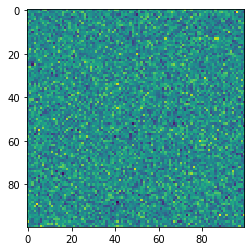

In [7]:
plain_images = np.zeros_like(images)

detector_noise = add_noise(plain_images, 4)
plt.imshow(detector_noise[0],interpolation='nearest')



This noise level is half the average of neutrino hits we calculated earlier, which will be easier for our classifier

**Develop a machine learning classifier that can successfully classify 'clean' simulated neutrinos from 'empty' slices with some amount of 'electronic noise', how does your machine learning algorithm perform at differing noise levels?**

- Start with training on the detector with noise level comparable to the average value of neutrino hits (4)
- Then test this on classifying neutrinos from lower (2), comparable(4), and higher(6-8) noise images
- Retrain the network on a different noise level value and repeat the tests to see which is better to train on

In [8]:
# Create a training array which is a combination of noisy detector and clean neutrino images, with accompanying labels

image_labels = np.ones(10000)
detector_labels = np.zeros(10000)
def unison_shuffled_copies(a, b):
    assert len(a) == len(b)
    p = np.random.permutation(len(a))
    return a[p], b[p]

detector_noise = add_noise(plain_images, 4)

train_images = np.concatenate((images, detector_noise), axis=0)
train_labels = np.concatenate((image_labels, detector_labels), axis=0)

train_images, train_labels = unison_shuffled_copies(train_images, train_labels)

# Reshape to 4 dimensions for keras
train_images = train_images.reshape(20000, 100, 100, 1)


In [9]:
# Create a convolutional neural network to act as a classifier

model = keras.models.Sequential()
model.add(keras.layers.Conv2D(2, (5, 5), activation='relu', input_shape=(100,100,1)))
#model.add(keras.layers.MaxPooling2D((2, 2)))
#model.add(keras.layers.Conv2D(32, (5, 5), activation='relu'))
#model.add(keras.layers.MaxPooling2D((2, 2)))
#model.add(keras.layers.Conv2D(32, (5, 5), activation='relu'))
model.add(keras.layers.Flatten())
#model.add(keras.layers.Dense(8, activation='relu'))
model.add(keras.layers.Dense(2))

model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 96, 96, 2)         52        
_________________________________________________________________
flatten (Flatten)            (None, 18432)             0         
_________________________________________________________________
dense (Dense)                (None, 2)                 36866     
Total params: 36,918
Trainable params: 36,918
Non-trainable params: 0
_________________________________________________________________


In [10]:
# Compile network

model.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])


In [11]:
# Train on training images

history = model.fit(train_images, train_labels, epochs=5)

Epoch 1/5
625/625 [==============================] - 12s 19ms/step - loss: 0.0079 - accuracy: 0.9958
Epoch 2/5
625/625 [==============================] - 11s 17ms/step - loss: 8.4992e-05 - accuracy: 1.0000
Epoch 3/5
625/625 [==============================] - 11s 18ms/step - loss: 4.3269e-05 - accuracy: 1.0000
Epoch 4/5
625/625 [==============================] - 11s 17ms/step - loss: 2.6090e-05 - accuracy: 1.0000
Epoch 5/5
625/625 [==============================] - 14s 22ms/step - loss: 1.7359e-05 - accuracy: 1.0000


In [12]:
# Create a range of test arrays and test the model on each one, storing the results
values = np.arange(0,10,1)
test_loss = []
test_acc = []
for i in values:   
    
    detector_noise = add_noise(plain_images, i)

    test_images = np.concatenate((images, detector_noise), axis=0)
    test_labels = np.concatenate((image_labels, detector_labels), axis=0)

    test_images, test_labels = unison_shuffled_copies(test_images, test_labels)

    test_images = test_images.reshape(20000, 100, 100, 1)

    test_loss_temp, test_acc_temp = model.evaluate(test_images,  test_labels)
    
    test_loss.append(test_loss_temp)
    test_acc.append(test_acc_temp)

625/625 [==============================] - 4s 7ms/step - loss: 1.4043e-05 - accuracy: 1.0000


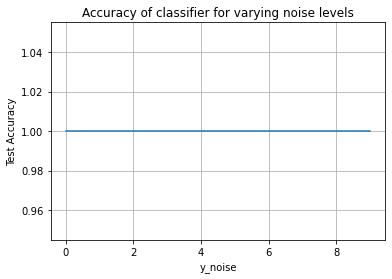

In [13]:
plt.plot(values, test_acc)
plt.title('Accuracy of classifier for varying noise levels')
plt.xlabel('y_noise')
plt.ylabel('Test Accuracy')
plt.grid()

The classifier appears to struggle with noise values lower than what it was trained on (the opposite to what was anticipated), i will now test on a series of noise values in this range and observe the accuracy of the classifier.

In [14]:
# Create a range of test arrays and test the model on each one, storing the results

values_2 = np.linspace(1.6,2.1,10)
test_loss_2 = []
test_acc_2 = []
for i in values_2:   
    
    detector_noise = add_noise(plain_images, i)

    test_images = np.concatenate((images, detector_noise), axis=0)
    test_labels = np.concatenate((image_labels, detector_labels), axis=0)

    test_images, test_labels = unison_shuffled_copies(test_images, test_labels)

    test_images = test_images.reshape(20000, 100, 100, 1)

    test_loss_temp, test_acc_temp = model.evaluate(test_images,  test_labels)
    
    test_loss_2.append(test_loss_temp)
    test_acc_2.append(test_acc_temp)

625/625 [==============================] - 5s 8ms/step - loss: 1.4043e-05 - accuracy: 1.0000


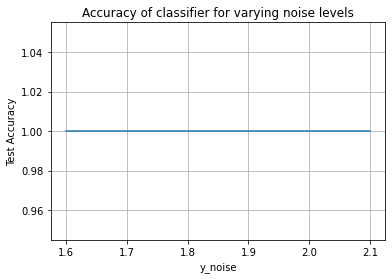

In [15]:
plt.plot(values_2, test_acc_2)
plt.title('Accuracy of classifier for varying noise levels')
plt.xlabel('y_noise')
plt.ylabel('Test Accuracy')
plt.grid()

Now I will retrain the model on a lower noise level to see if this improves the accuracy below this y_noise=2 mark

In [16]:
# Retrain the model on a lower noise
detector_noise = add_noise(plain_images, 2)

train_images = np.concatenate((images, detector_noise), axis=0)
train_labels = np.concatenate((image_labels, detector_labels), axis=0)

train_images, train_labels = unison_shuffled_copies(train_images, train_labels)

# Reshape to 4 dimensions for keras
train_images = train_images.reshape(20000, 100, 100, 1)

In [17]:
# Recompile and train
model.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])

history = model.fit(train_images, train_labels, epochs=5)

Epoch 1/5
625/625 [==============================] - 12s 18ms/step - loss: 1.1186e-06 - accuracy: 1.0000
Epoch 2/5
625/625 [==============================] - 12s 20ms/step - loss: 1.7034e-07 - accuracy: 1.0000
Epoch 3/5
625/625 [==============================] - 11s 18ms/step - loss: 6.1188e-08 - accuracy: 1.0000
Epoch 4/5
625/625 [==============================] - 11s 17ms/step - loss: 2.8068e-08 - accuracy: 1.0000
Epoch 5/5
625/625 [==============================] - 11s 17ms/step - loss: 1.7253e-08 - accuracy: 1.0000


In [18]:
# Create a range of test arrays and test the model on each one, storing the results

values = np.arange(0,10,1)
test_loss_3 = []
test_acc_3 = []
for i in values:   
    
    detector_noise = add_noise(plain_images, i)

    test_images = np.concatenate((images, detector_noise), axis=0)
    test_labels = np.concatenate((image_labels, detector_labels), axis=0)

    test_images, test_labels = unison_shuffled_copies(test_images, test_labels)

    test_images = test_images.reshape(20000, 100, 100, 1)

    test_loss_temp, test_acc_temp = model.evaluate(test_images,  test_labels)
    
    test_loss_3.append(test_loss_temp)
    test_acc_3.append(test_acc_temp)

625/625 [==============================] - 4s 7ms/step - loss: 1.1801e-08 - accuracy: 1.0000


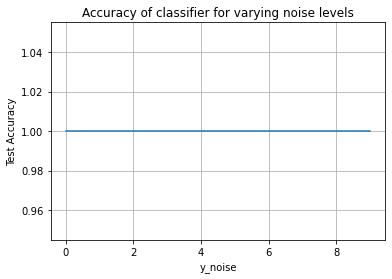

In [19]:
plt.plot(values, test_acc_3)
plt.title('Accuracy of classifier for varying noise levels')
plt.xlabel('y_noise')
plt.ylabel('Test Accuracy')
plt.grid()

When the model is retrained on a lower noise, it doesnt appear to affect the results

Realised that the way I have defined noise allows for negative values at a lower value of y_noise which is unrealistic, will reinvestigate how noise function is defined, eg train on blank images and train on much higher noise, eg. noise isnt shifted up but spread up to a value, eg. noise is centred around zero but is the top half of the distribution

**Test your machine learning classifier on simulated neutrinos overlaid with noise, what level of additional noise starts to impact your machine learning algorithm**

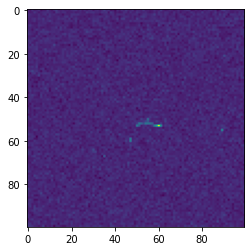

In [38]:
# Create and output neutrino images overlaid with noise
overlaid = add_noise(images, 3)
plt.imshow(overlaid[0])


In [31]:
values_4 = np.linspace(0,2,11)
test_loss_4 = []
test_acc_4 = []
for i in values_4:   
    
    overlaid = add_noise(images, i)
    
    detector_noise = add_noise(plain_images, i)

    test_images = np.concatenate((overlaid, detector_noise), axis=0)
    test_labels = np.concatenate((image_labels, detector_labels), axis=0)

    test_images, test_labels = unison_shuffled_copies(test_images, test_labels)

    test_images = test_images.reshape(20000, 100, 100, 1)

    test_loss_temp, test_acc_temp = model.evaluate(test_images,  test_labels)
    
    test_loss_4.append(test_loss_temp)
    test_acc_4.append(test_acc_temp)

625/625 [==============================] - 3s 6ms/step - loss: 95.8428 - accuracy: 0.5000


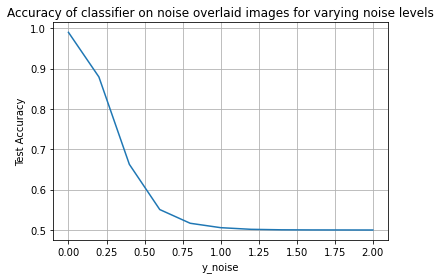

In [39]:
plt.plot(values_4, test_acc_4)
plt.title('Accuracy of classifier on noise overlaid images for varying noise levels')
plt.xlabel('y_noise')
plt.ylabel('Test Accuracy')
plt.grid()